In [1]:
#! /usr/bin/env python
import os
import argparse
import datetime
import re
import numpy as np
import random
import copy

In [2]:
import torch
from torch.autograd import Variable
import torch.nn.functional as F
import torch.autograd as autograd
import torch.nn as nn
import torch.nn.init as init
import torch.optim as optim

In [3]:
from torchtext import data
from visdom import Visdom
viz = Visdom()

In [4]:
import matplotlib.pyplot as plt

In [5]:
from data import tokenizer, data_split, preprocess_dataset, create_batches
from data import SemEval10_task8

In [6]:
def l2_loss(parameters):
    norm = 0
    for param in parameters:
        norm += torch.sum((param**2))
    return norm

In [7]:
class Baseline_Model(nn.Module):
    def __init__(self, word_vocab, label_vocab, word_emb_dim, pos_emb_dim, hidden_dim, output_dim, MAX_POS = 15, use_gpu = True):
        super(Baseline_Model, self).__init__()
        
        # Set hyper parameters
        self.word_emb_dim = word_emb_dim
        self.pos_emb_dim = pos_emb_dim
        self.hidden_dim = hidden_dim
        self.output_dim = output_dim
        self.input_dim = word_emb_dim
        
        self.MAX_POS = MAX_POS
        
        
        # Set options and other parameters
        self.use_gpu = use_gpu
        self.word_vocab = word_vocab
        self.label_vocab = label_vocab
        #self.pos_vocab = pos_vocab
        
        
        # Free parameters for the model
        # Initialize embeddings (Word and Position embeddings) 
        self.word_emb = nn.Embedding(len(self.word_vocab), self.word_emb_dim).cuda()
        
        self.pos1_emb = nn.Embedding(self.MAX_POS*2+1, self.pos_emb_dim).cuda()
        self.pos1_emb.weight.data.uniform_(-0.0, 0.0)
        self.pos2_emb = nn.Embedding(self.MAX_POS*2+1, self.pos_emb_dim).cuda()
        self.pos2_emb.weight.data.uniform_(-0.0, 0.0)
        
        # Initialize LSTM parameters ()
        self.rnn = nn.GRU(self.input_dim, hidden_dim, bidirectional=True, batch_first = True).cuda()
        
        
        # Initialize Attention parameters ()
        self.attention_hidden = nn.Linear(hidden_dim * 2  +  self.pos_emb_dim * 2, hidden_dim,bias=False).cuda()
        self.attention = nn.Linear(hidden_dim, 1, bias=False).cuda()
        
        # Initialize Classifier parameters ()
        #self.classifier_hidden = nn.Linear(hidden_dim * 2, hidden_dim).cuda()
        self.classifier = nn.Linear(hidden_dim * 2, output_dim).cuda()
        
        
        self.word_emb.weight.data.copy_(word_vocab.vectors)
    def prepare_inout(self, X, y=None):
        sents, pos1, pos2 = list(zip(*X))
        #sents = list(zip(*X))
        #pos1 = datas['position_indices_1']
        #pos2 = datas['position_indices_2']
        
        labels = y
        
        words = [ [ self.word_vocab.stoi[word] for word in sent] for sent in sents]
        #print(words)
        words_var = Variable(torch.LongTensor(words).cuda())
        #print(words_var)
        word_embeddings = self.word_emb(words_var)
        #print(word_embedings)
        
        pos1 = np.array(pos1).astype('int')
        #print(pos1)
        pos1_var = Variable(torch.LongTensor(pos1).cuda())
        pos1_embeddings = self.pos1_emb(pos1_var)
        #print(pos1_var)
        #print(pos1_embeddings)

        pos2 = np.array(pos2).astype('int')
        #print(pos2)
        pos2_var = Variable(torch.LongTensor(pos2).cuda())
        pos2_embeddings = self.pos2_emb(pos2_var)
        
        
        inputs = {'word_embeddings': word_embeddings,
                  'pos1_embeddings': pos1_embeddings,
                  'pos2_embeddings': pos2_embeddings}
        #inputs = torch.cat((word_embeddings, pos1_embeddings, pos2_embeddings),-1)
        #print(inputs)
        
        """print(labels)
        if labels:
            labels = [ self.label_vocab.stoi[label] - 1 for label in labels]
            labels_var = Variable(torch.LongTensor(labels).cuda())
            outputs = labels_var
        else:
            outputs = None
        """
        labels = [ self.label_vocab.stoi[label] - 1 for label in labels]
        labels_var = Variable(torch.LongTensor(labels).cuda())
        outputs = labels_var
        return inputs, outputs
        
        
        
        
    def forward(self, inputs, is_train = True):
        word_embeddings = inputs['word_embeddings']
        pos1_embeddings = inputs['pos1_embeddings']
        pos2_embeddings = inputs['pos2_embeddings']
        
        # LSTM layer
        #X = torch.cat((word_embeddings, pos1_embeddings, pos2_embeddings),-1)
        X = word_embeddings
        X = F.dropout(X, p=0.5, training=is_train)
        hiddens, for_output = self.rnn(X)
        
        #rev_hiddens, rev_output = self.rev_lstm(X)
        
        # Self Attentive layer
        att_input = torch.cat((hiddens, pos1_embeddings, pos2_embeddings),-1)
        att_input = F.dropout(att_input, p=0.5, training=is_train)
        att_hidden = F.tanh(self.attention_hidden(att_input))
        att_hidden = F.dropout(att_hidden, p=0.5, training=is_train)
        att_scores = self.attention(att_hidden)
        
        attention_distrib = F.softmax(att_scores, dim = 1)
        hiddens = F.dropout(hiddens, p=0.5, training=is_train)
        context_vector = torch.sum(hiddens * attention_distrib, dim = 1)

        # Classifier
        #context_hidden = self.classifier_hidden(context_vector)
        #context_hidden = F.dropout(context_hidden, p=0.5, training=is_train)
        
        finals = F.softmax(self.classifier(context_vector), dim = 1)
        if is_train:
            return finals
        else:
            return finals, attention_distrib
    
    def evaluatation(self, input, output, demonstrate_result = True, analyze = False, header=""):
        batch_Xs, batch_ys = create_batches(input, output, 128, shuffle=False)
        
        loss_func = nn.CrossEntropyLoss()
        epoch_loss = 0
        tp = 0
        gold_answer = []
        pred_answer = []
        for batch_X, batch_Y in zip(batch_Xs, batch_ys):
            X, Y = self.prepare_inout(batch_X, batch_Y)
            preds, attention_distribs = relation_extr(X, is_train = False)
            _, preds_Y = torch.max(preds, -1)
            tp += (preds_Y == Y).float().sum().data.cpu().numpy()[0]
            loss = loss_func(preds, Y)
            epoch_loss += loss.data.cpu().numpy()[0] * len(batch_X)
            
            for y, preds_y in zip(Y, preds_Y):
                y = y.data.cpu().numpy()[0] + 1
                preds_y = preds_y.data.cpu().numpy()[0] + 1
                
                gold_answer.append(label_vocab.itos[y])
                pred_answer.append(label_vocab.itos[preds_y])
            if analyze:
                for x, y, preds_y, pred_distirb, attention_distrib in zip(batch_X, batch_Y, preds_Y, preds, attention_distribs):
                    input_str = " ".join(x[0])
                    preds_y = preds_y.data.cpu().numpy()[0] + 1
                    preds = pred_distirb.data.cpu().numpy()
                    
                    print()
                    
                        
                    if y != self.label_vocab.itos[preds_y]:
                        print("input sentence: " + input_str)
                        print('answer label: ', " ",y)
                        print('wrong label: ', " ",self.label_vocab.itos[preds_y])
                        for i in range(len(preds)):
                            print(self.label_vocab.itos[i+1],"\t:\t",preds[i])
                        print()
                        #print(x[0])
                        #print(attention_distrib.data.cpu().numpy())
                        plt.figure(figsize=(20,5))
                        plt.xticks(range(len(x[0])), x[0],  rotation=30)
                        plt.plot(range(len(x[0])), attention_distrib.data.cpu().numpy(), 'ro')
                        plt.ylim(0, 1.0)
                        plt.show()
            del X,Y, loss, preds, attention_distribs
            
        if demonstrate_result:
            #print('Avg loss: ')
            print(header + " accuracy:\t%f"%(tp/float(len(output))))
            print(header + " loss:    \t%f"%(epoch_loss/float(len(output))))
            
            # code for official evaluataion_code
            fgold = open('./dataset/SemEval2010_task8_all_data/SemEval2010_task8_scorer-v1.2/gold_answer.txt','w')
            fpred = open('./dataset/SemEval2010_task8_all_data/SemEval2010_task8_scorer-v1.2/pred_answer.txt','w')
            i = 0
            for gold, pred in zip(gold_answer, pred_answer):
                fgold.write("%i\t%s\n"%(i,gold))
                fpred.write("%i\t%s\n"%(i,pred))
                
                i += 1
            #print('Macro F1-score')
            #print('Micro F1-score')
        
        return {'loss': epoch_loss/float(len(output))}

In [8]:
MAX_POS = 15
train, dev = data_split(SemEval10_task8(sub_path='SemEval2010_task8_training/TRAIN_FILE.TXT'), test_rate = 0.1)
test = SemEval10_task8(sub_path='SemEval2010_task8_testing_keys/TEST_FILE_FULL.TXT')

train_input, train_output = preprocess_dataset(train, MAX_POS, entity_normalize = False, directional_consideration = True)
train_words = list(zip(*train_input))[0]

dev_input, dev_output = preprocess_dataset(dev, MAX_POS, entity_normalize = False, directional_consideration = True)
dev_words = list(zip(*dev_input))[0]

test_input, test_output = preprocess_dataset(test, MAX_POS, entity_normalize = False, directional_consideration = True)
test_words = list(zip(*test_input))[0]

In [9]:
TEXT = data.Field(sequential=True,  lower=False)
TEXT.build_vocab(train_words+test_words+dev_words, vectors="glove.840B.300d")
word_vocab = TEXT.vocab

LABEL = data.Field(sequential=False, use_vocab=False)
LABEL.build_vocab(train_output+test_output+dev_output)
label_vocab = LABEL.vocab

In [10]:
epoch_num = 50

learning_rate = 0.0005
#learning_rate = 0.01
l2_rate = 0

max_batch_size = 16
#max_num_of_sent = 50
word_emb_dim = 300
pos_emb_dim = 5
hidden_dim = 300

print(len(LABEL.vocab.stoi))
relation_extr = Baseline_Model(word_vocab, 
                               label_vocab, 
                               MAX_POS = MAX_POS,
                               word_emb_dim = word_emb_dim, 
                               pos_emb_dim = pos_emb_dim, 
                               hidden_dim = hidden_dim, 
                               output_dim = len(LABEL.vocab.stoi)-1)

20


In [11]:
params = list(relation_extr.parameters())
#print(list(relation_extr.named_parameters()))

# gradient clip
torch.nn.utils.clip_grad_norm(params, 5.0)




0.0

In [12]:
loss_func = nn.CrossEntropyLoss()
optimizer = optim.Adam(params, lr = learning_rate)
min_loss = float('inf')

best_loss = 0.0
best_model = None

for i in range(epoch_num):
    epoch_loss = 0
    tp = 0
    batch_Xs, batch_ys = create_batches(train_input, train_output, max_batch_size)
    if (i + 1)%10:
        optimizer
    
    for batch_X, batch_y in zip(batch_Xs, batch_ys):
        X, Y = relation_extr.prepare_inout(batch_X, batch_y)
        
        optimizer.zero_grad()
        preds = relation_extr(X)
        #print(preds)
        _, preds_Y = torch.max(preds, -1)
        #print(preds_Y)
        batch_size = Y.size()[0]
        loss = loss_func(preds, Y)
        batch_loss = loss * batch_size / max_batch_size
        batch_loss += l2_loss(params[1:]) * l2_rate
        #batch_loss = loss
        
        batch_loss.backward()
        optimizer.step()
        
        epoch_loss += loss.data.cpu().numpy()[0]
        tp += (preds_Y == Y).float().sum().data.cpu().numpy()[0]
        del X, Y, loss, batch_loss, preds, preds_Y
    print("Train epoch",i)
    train_eval_out = relation_extr.evaluatation(train_input, train_output,header = 'Train')
    dev_eval_out = relation_extr.evaluatation(dev_input, dev_output,header = 'Dev')
    test_eval_out = relation_extr.evaluatation(test_input, test_output,header = 'Test', analyze = False)
    #print(params[0])
    """
    if dev_eval_out['loss'] > min_loss:
        print('learning rate change ',learning_rate, ' to ',learning_rate*0.90)
        learning_rate *= 0.90
        optimizer = optim.Adam(params, lr = learning_rate)
    else:
        min_loss = dev_eval_out['loss']
    """
    if dev_eval_out['loss'] < min_loss:
        best_model = 
    del epoch_loss, tp
    
    
    
    print()


Train epoch 0
Train accuracy:	0.175833
Train loss:    	2.855153
Dev accuracy:	0.180000
Dev loss:    	2.851009
Test accuracy:	0.167096
Test loss:    	2.863928

Train epoch 1
Train accuracy:	0.244722
Train loss:    	2.786343
Dev accuracy:	0.245000
Dev loss:    	2.784800
Test accuracy:	0.230401
Test loss:    	2.801699

Train epoch 2
Train accuracy:	0.343472
Train loss:    	2.689012
Dev accuracy:	0.342500
Dev loss:    	2.691652
Test accuracy:	0.323887
Test loss:    	2.710052

Train epoch 3
Train accuracy:	0.420694
Train loss:    	2.609813
Dev accuracy:	0.403750
Dev loss:    	2.634360
Test accuracy:	0.395657
Test loss:    	2.636629

Train epoch 4
Train accuracy:	0.464444
Train loss:    	2.565579
Dev accuracy:	0.406250
Dev loss:    	2.616484
Test accuracy:	0.422893
Test loss:    	2.607176

Train epoch 5
Train accuracy:	0.590139
Train loss:    	2.450160
Dev accuracy:	0.538750
Dev loss:    	2.506766
Test accuracy:	0.542142
Test loss:    	2.496944

Train epoch 6
Train accuracy:	0.681944
Train l

In [13]:
relation_extr.evaluatation(train_input, train_output, header = 'Train')

Train accuracy:	0.985972
Train loss:    	2.044968


{'loss': 2.044967555801074}

In [14]:
relation_extr.evaluatation(test_input, test_output, header = 'Test')

Test accuracy:	0.749724
Test loss:    	2.281527


{'loss': 2.2815270003563435}









input sentence: It was used mainly on Scarff ring mounts , but was also fitted onto the top <e1> wing </e1> of fighter <e2> aircrafts </e2> , controlled by a Bowden cable .
answer label:    Component-Whole(e2,e1)
wrong label:    Member-Collection(e2,e1)
Other 	:	 2.1507566e-14
Entity-Destination(e1,e2) 	:	 1.0301502e-15
Cause-Effect(e2,e1) 	:	 3.4983261e-15
Member-Collection(e2,e1) 	:	 0.99997675
Entity-Origin(e1,e2) 	:	 3.3279057e-10
Message-Topic(e1,e2) 	:	 2.8840229e-12
Component-Whole(e1,e2) 	:	 2.2501586e-05
Component-Whole(e2,e1) 	:	 5.8149107e-07
Instrument-Agency(e2,e1) 	:	 1.3133452e-14
Content-Container(e1,e2) 	:	 2.5509735e-12
Product-Producer(e2,e1) 	:	 7.563454e-12
Cause-Effect(e1,e2) 	:	 1.05512734e-14
Product-Producer(e1,e2) 	:	 1.2387544e-07
Content-Container(e2,e1) 	:	 6.0739853e-09
Entity-Origin(e2,e1) 	:	 3.7539156e-11
Message-Topic(e2,e1) 	:	 1.4454785e-11
Instrument-Agency(e1,e2) 	:	 2.0177167e-08
Member-Collection(e1,e2) 	:	 3.607519e-10
Entity-Destination

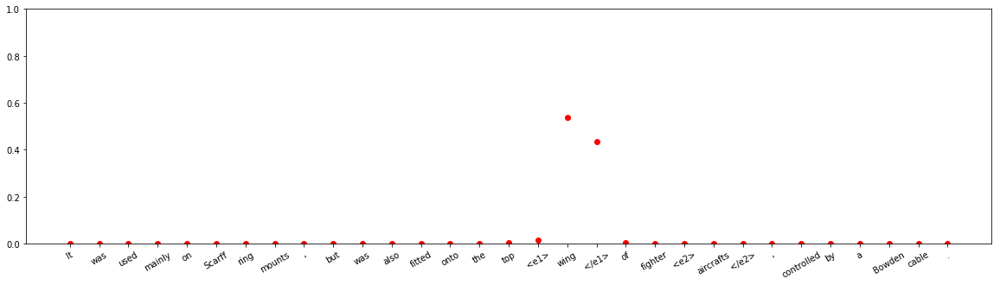


input sentence: 'We were n't sure how high we could go ' , said Bill Baker of Skidmore , Owings & Merrill , the <e1> building </e1> 's structural <e2> engineer </e2> .
answer label:    Product-Producer(e1,e2)
wrong label:    Other
Other 	:	 0.993494
Entity-Destination(e1,e2) 	:	 8.867288e-11
Cause-Effect(e2,e1) 	:	 3.2979122e-09
Member-Collection(e2,e1) 	:	 7.080678e-09
Entity-Origin(e1,e2) 	:	 1.4998801e-12
Message-Topic(e1,e2) 	:	 1.2786162e-08
Component-Whole(e1,e2) 	:	 2.7584696e-07
Component-Whole(e2,e1) 	:	 3.1865344e-10
Instrument-Agency(e2,e1) 	:	 3.1788107e-11
Content-Container(e1,e2) 	:	 1.4288452e-11
Product-Producer(e2,e1) 	:	 6.881428e-09
Cause-Effect(e1,e2) 	:	 1.9420709e-06
Product-Producer(e1,e2) 	:	 0.0044640633
Content-Container(e2,e1) 	:	 9.023934e-11
Entity-Origin(e2,e1) 	:	 7.74175e-09
Message-Topic(e2,e1) 	:	 1.8627964e-09
Instrument-Agency(e1,e2) 	:	 0.0020394223
Member-Collection(e1,e2) 	:	 3.7014593e-07
Entity-Destination(e2,e1) 	:	 9.476864e-11



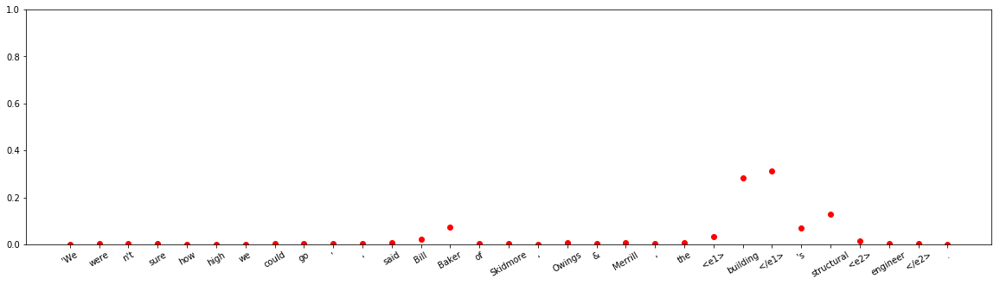








input sentence: Six <e1> members </e1> of one of Mexico 's most active drug <e2> gangs </e2> , including someone accused of being the organization 's bookkeeper , were arrested this week .
answer label:    Member-Collection(e1,e2)
wrong label:    Member-Collection(e2,e1)
Other 	:	 8.7748546e-08
Entity-Destination(e1,e2) 	:	 1.2462054e-08
Cause-Effect(e2,e1) 	:	 3.528471e-09
Member-Collection(e2,e1) 	:	 0.7106112
Entity-Origin(e1,e2) 	:	 4.2984986e-05
Message-Topic(e1,e2) 	:	 4.7630118e-07
Component-Whole(e1,e2) 	:	 0.00061738497
Component-Whole(e2,e1) 	:	 8.319413e-09
Instrument-Agency(e2,e1) 	:	 6.909776e-07
Content-Container(e1,e2) 	:	 4.340369e-08
Product-Producer(e2,e1) 	:	 0.00019572499
Cause-Effect(e1,e2) 	:	 1.5401296e-06
Product-Producer(e1,e2) 	:	 0.00012763025
Content-Container(e2,e1) 	:	 4.3116424e-06
Entity-Origin(e2,e1) 	:	 1.2020967e-05
Message-Topic(e2,e1) 	:	 9.669445e-07
Instrument-Agency(e1,e2) 	:	 0.0001884354
Member-Collection(e1,e2) 	:	 0.2881965
Entity-Dest

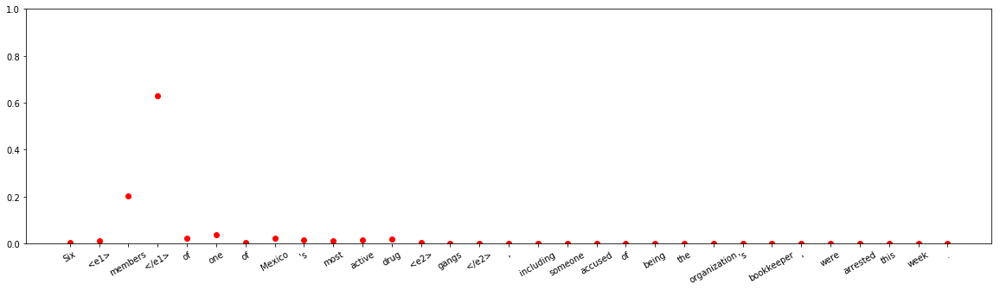


input sentence: An African <e1> immigrant </e1> arrives on board a rescue boat at the <e2> port </e2> of Los Cristianos on Spain 's Canary island of Tenerife October 17 , 2008 .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 3.933268e-09
Entity-Destination(e1,e2) 	:	 0.0002556813
Cause-Effect(e2,e1) 	:	 2.9267042e-10
Member-Collection(e2,e1) 	:	 1.0033536e-06
Entity-Origin(e1,e2) 	:	 0.020314282
Message-Topic(e1,e2) 	:	 1.3196761e-06
Component-Whole(e1,e2) 	:	 0.001068574
Component-Whole(e2,e1) 	:	 1.6976769e-09
Instrument-Agency(e2,e1) 	:	 0.96893466
Content-Container(e1,e2) 	:	 3.8181673e-07
Product-Producer(e2,e1) 	:	 6.18225e-05
Cause-Effect(e1,e2) 	:	 1.0588646e-10
Product-Producer(e1,e2) 	:	 5.133348e-08
Content-Container(e2,e1) 	:	 3.362186e-05
Entity-Origin(e2,e1) 	:	 2.9796463e-09
Message-Topic(e2,e1) 	:	 4.7065473e-08
Instrument-Agency(e1,e2) 	:	 1.6523695e-06
Member-Collection(e1,e2) 	:	 0.009327132
Entity-Destination(e2,e1) 	:	 2.075343e-11



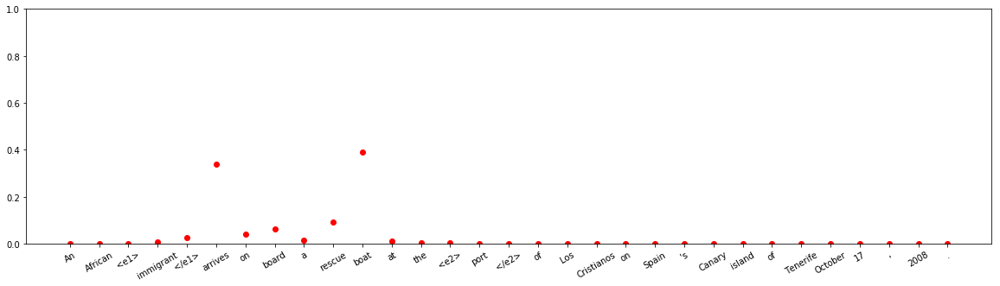











input sentence: The <e1> city </e1> has constructed some tourism facilities and a new police <e2> station </e2> in the showcase area , but no new houses are to be built here .
answer label:    Product-Producer(e2,e1)
wrong label:    Other
Other 	:	 0.97539175
Entity-Destination(e1,e2) 	:	 2.2331852e-10
Cause-Effect(e2,e1) 	:	 6.047821e-10
Member-Collection(e2,e1) 	:	 2.5376718e-08
Entity-Origin(e1,e2) 	:	 1.04513775e-08
Message-Topic(e1,e2) 	:	 6.408118e-09
Component-Whole(e1,e2) 	:	 2.621868e-07
Component-Whole(e2,e1) 	:	 0.0032023995
Instrument-Agency(e2,e1) 	:	 4.353317e-06
Content-Container(e1,e2) 	:	 1.35249065e-08
Product-Producer(e2,e1) 	:	 0.020039827
Cause-Effect(e1,e2) 	:	 8.025575e-08
Product-Producer(e1,e2) 	:	 6.556421e-06
Content-Container(e2,e1) 	:	 1.4710209e-07
Entity-Origin(e2,e1) 	:	 2.99247e-08
Message-Topic(e2,e1) 	:	 0.0013546597
Instrument-Agency(e1,e2) 	:	 2.428106e-07
Member-Collection(e1,e2) 	:	 2.4180238e-09
Entity-Destination(e2,e1) 	:	 1.9817555e-

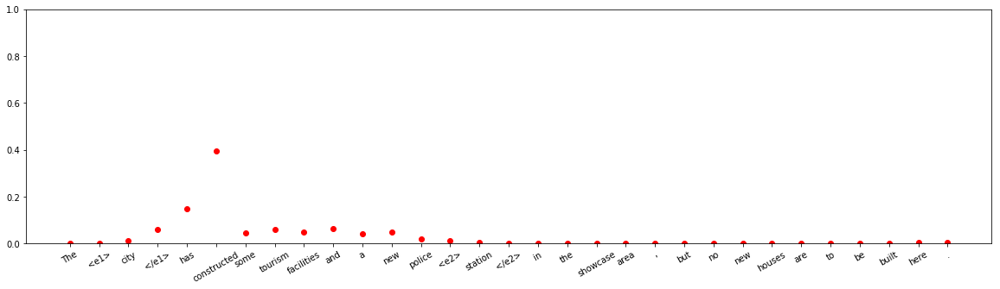


input sentence: The Polish Competition Authority condemns a <e1> producer </e1> of paid TV <e2> programs </e2> for abusing of its dominant position in the licensing agreement with the cable TV operator .
answer label:    Product-Producer(e2,e1)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 6.145373e-17
Cause-Effect(e2,e1) 	:	 6.111298e-14
Member-Collection(e2,e1) 	:	 1.7550746e-15
Entity-Origin(e1,e2) 	:	 4.1813292e-16
Message-Topic(e1,e2) 	:	 4.2705704e-16
Component-Whole(e1,e2) 	:	 1.7010119e-15
Component-Whole(e2,e1) 	:	 3.2302057e-16
Instrument-Agency(e2,e1) 	:	 6.3553665e-09
Content-Container(e1,e2) 	:	 1.835811e-12
Product-Producer(e2,e1) 	:	 5.5631035e-11
Cause-Effect(e1,e2) 	:	 8.771805e-16
Product-Producer(e1,e2) 	:	 8.7049415e-15
Content-Container(e2,e1) 	:	 4.180291e-13
Entity-Origin(e2,e1) 	:	 1.9773591e-16
Message-Topic(e2,e1) 	:	 2.6730652e-13
Instrument-Agency(e1,e2) 	:	 7.1918133e-13
Member-Collection(e1,e2) 	:	 2.5264918e-12
Entity-Destination(e2,e

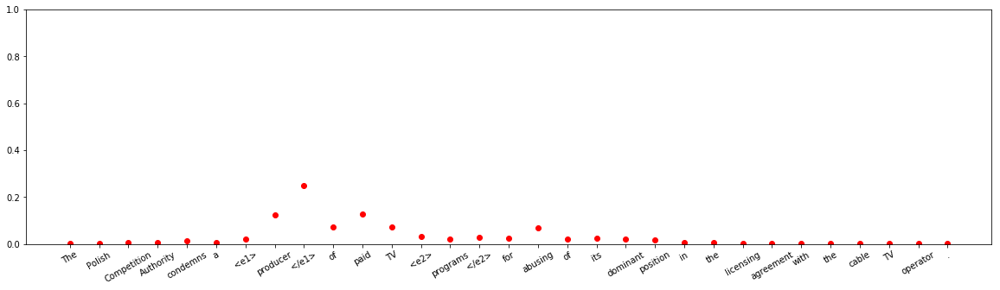









input sentence: The oak <e1> tree </e1> was growing in the <e2> woods </e2> of the Longleat Estate , in Wiltshire , at the time Darwin was alive and developing his theory .
answer label:    Member-Collection(e1,e2)
wrong label:    Other
Other 	:	 0.99999964
Entity-Destination(e1,e2) 	:	 1.6645219e-12
Cause-Effect(e2,e1) 	:	 2.9187541e-08
Member-Collection(e2,e1) 	:	 5.6059176e-12
Entity-Origin(e1,e2) 	:	 2.2118648e-08
Message-Topic(e1,e2) 	:	 1.7051216e-10
Component-Whole(e1,e2) 	:	 2.8356899e-08
Component-Whole(e2,e1) 	:	 3.067852e-10
Instrument-Agency(e2,e1) 	:	 4.7877415e-15
Content-Container(e1,e2) 	:	 5.276576e-09
Product-Producer(e2,e1) 	:	 7.050399e-12
Cause-Effect(e1,e2) 	:	 2.0565114e-09
Product-Producer(e1,e2) 	:	 9.346316e-09
Content-Container(e2,e1) 	:	 1.6234037e-12
Entity-Origin(e2,e1) 	:	 2.8012783e-09
Message-Topic(e2,e1) 	:	 3.2396997e-07
Instrument-Agency(e1,e2) 	:	 3.9608175e-09
Member-Collection(e1,e2) 	:	 1.664376e-08
Entity-Destination(e2,e1) 	:	 6.160603e

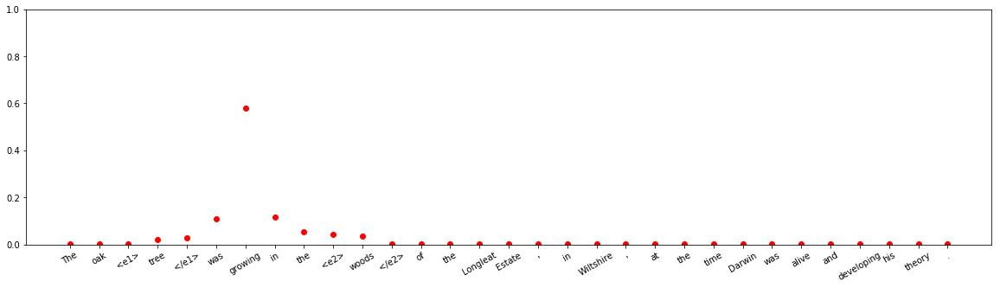



input sentence: The above <e1> chart </e1> , produced by a <e2> study </e2> at the Weizmann Institute of Science in Israel , shows our reactions to different smells along two axes .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 7.968013e-11
Entity-Destination(e1,e2) 	:	 1.5638088e-14
Cause-Effect(e2,e1) 	:	 5.529561e-09
Member-Collection(e2,e1) 	:	 3.4086338e-12
Entity-Origin(e1,e2) 	:	 7.724643e-08
Message-Topic(e1,e2) 	:	 4.861082e-13
Component-Whole(e1,e2) 	:	 4.586425e-12
Component-Whole(e2,e1) 	:	 5.046748e-10
Instrument-Agency(e2,e1) 	:	 5.2618235e-12
Content-Container(e1,e2) 	:	 1.9211199e-10
Product-Producer(e2,e1) 	:	 4.1193516e-07
Cause-Effect(e1,e2) 	:	 3.4304422e-13
Product-Producer(e1,e2) 	:	 0.9999994
Content-Container(e2,e1) 	:	 1.7966933e-12
Entity-Origin(e2,e1) 	:	 1.150742e-15
Message-Topic(e2,e1) 	:	 1.8646913e-08
Instrument-Agency(e1,e2) 	:	 1.05073866e-07
Member-Collection(e1,e2) 	:	 8.1625635e-13
Entity-Destination(e2,e1) 	:	 8.45737e-

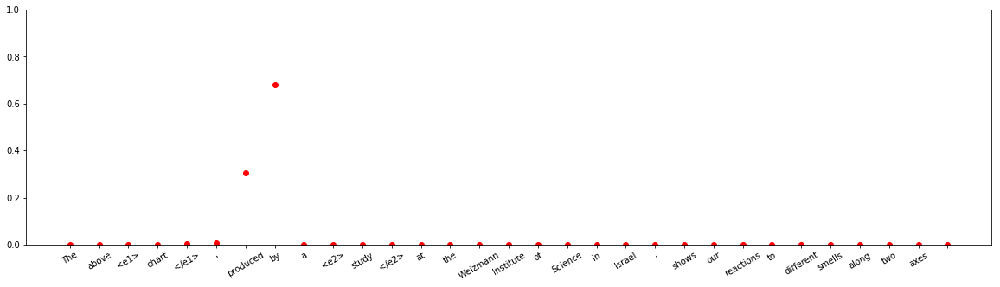


input sentence: Marking birds with color <e1> bands </e1> and a U.S . Fish and Wildlife Service uniquely numbered metal band enables <e2> researchers </e2> to follow individuals from year to year .
answer label:    Instrument-Agency(e1,e2)
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.33103e-07
Entity-Destination(e1,e2) 	:	 1.097966e-09
Cause-Effect(e2,e1) 	:	 2.5523642e-10
Member-Collection(e2,e1) 	:	 0.03782659
Entity-Origin(e1,e2) 	:	 4.2658744e-08
Message-Topic(e1,e2) 	:	 1.7401614e-08
Component-Whole(e1,e2) 	:	 6.472372e-07
Component-Whole(e2,e1) 	:	 1.058724e-07
Instrument-Agency(e2,e1) 	:	 5.751307e-09
Content-Container(e1,e2) 	:	 3.2818375e-09
Product-Producer(e2,e1) 	:	 2.976038e-05
Cause-Effect(e1,e2) 	:	 1.11500135e-07
Product-Producer(e1,e2) 	:	 0.9403669
Content-Container(e2,e1) 	:	 7.8460135e-07
Entity-Origin(e2,e1) 	:	 3.671984e-07
Message-Topic(e2,e1) 	:	 1.0037357e-08
Instrument-Agency(e1,e2) 	:	 0.021684065
Member-Collection(e1,e2) 	:	 9.042376e-05
Entity-Desti

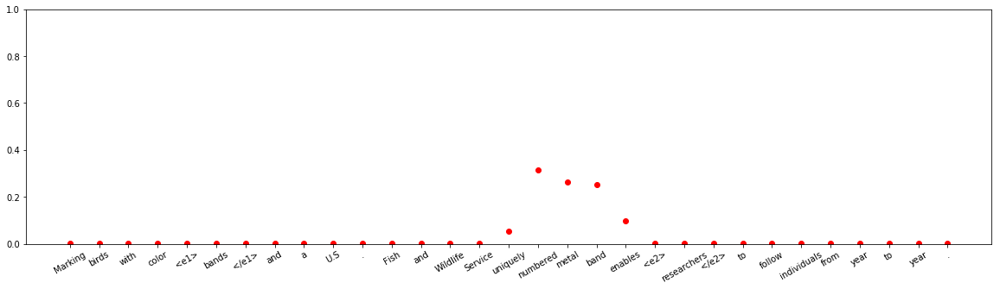











input sentence: The <e1> evangelist </e1> blasts the patrons with the <e2> news </e2> that they 're going to hell , if they do n't come to his meeting and get saved .
answer label:    Product-Producer(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 8.626606e-12
Entity-Destination(e1,e2) 	:	 1.5777699e-15
Cause-Effect(e2,e1) 	:	 2.1313102e-14
Member-Collection(e2,e1) 	:	 9.134635e-16
Entity-Origin(e1,e2) 	:	 2.5321536e-13
Message-Topic(e1,e2) 	:	 2.2559582e-16
Component-Whole(e1,e2) 	:	 5.2743365e-15
Component-Whole(e2,e1) 	:	 6.987415e-11
Instrument-Agency(e2,e1) 	:	 0.9999844
Content-Container(e1,e2) 	:	 4.697124e-16
Product-Producer(e2,e1) 	:	 1.565619e-05
Cause-Effect(e1,e2) 	:	 3.7647624e-12
Product-Producer(e1,e2) 	:	 6.6959294e-16
Content-Container(e2,e1) 	:	 1.7517265e-11
Entity-Origin(e2,e1) 	:	 3.6246317e-17
Message-Topic(e2,e1) 	:	 3.7533585e-14
Instrument-Agency(e1,e2) 	:	 8.1454884e-13
Member-Collection(e1,e2) 	:	 1.490752e-14
Entity-Destination(e2,e1) 	

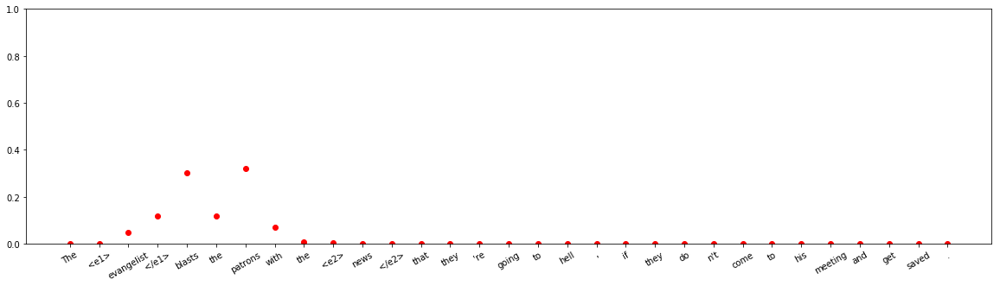


input sentence: So , in the night , when the <e1> men </e1> in the <e2> fort </e2> were asleep , White Fang applied his teeth to the stick that held him .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.17578341
Entity-Destination(e1,e2) 	:	 6.168988e-08
Cause-Effect(e2,e1) 	:	 2.108579e-08
Member-Collection(e2,e1) 	:	 1.6954091e-08
Entity-Origin(e1,e2) 	:	 9.9397785e-06
Message-Topic(e1,e2) 	:	 1.0782593e-09
Component-Whole(e1,e2) 	:	 0.00023789311
Component-Whole(e2,e1) 	:	 3.509378e-11
Instrument-Agency(e2,e1) 	:	 9.241511e-05
Content-Container(e1,e2) 	:	 0.0005374239
Product-Producer(e2,e1) 	:	 4.625978e-05
Cause-Effect(e1,e2) 	:	 3.382658e-10
Product-Producer(e1,e2) 	:	 1.6130103e-08
Content-Container(e2,e1) 	:	 1.2649065e-10
Entity-Origin(e2,e1) 	:	 2.571158e-10
Message-Topic(e2,e1) 	:	 9.0247806e-05
Instrument-Agency(e1,e2) 	:	 1.3536738e-05
Member-Collection(e1,e2) 	:	 0.8231888
Entity-Destination(e2,e1) 	:	 6.534168e-12



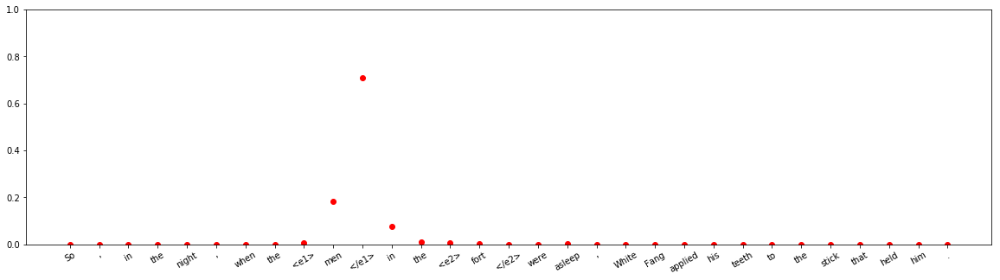






input sentence: The Vice President for Development is responsible to the <e1> president </e1> of the <e2> university </e2> for planning , coordinating and managing the gift procurement programs of the University .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.00039670322
Entity-Destination(e1,e2) 	:	 4.0261555e-11
Cause-Effect(e2,e1) 	:	 2.6140021e-09
Member-Collection(e2,e1) 	:	 2.0410787e-05
Entity-Origin(e1,e2) 	:	 6.5386836e-08
Message-Topic(e1,e2) 	:	 1.0762264e-07
Component-Whole(e1,e2) 	:	 3.1980486e-05
Component-Whole(e2,e1) 	:	 1.0040945e-12
Instrument-Agency(e2,e1) 	:	 0.00036368746
Content-Container(e1,e2) 	:	 1.4437186e-09
Product-Producer(e2,e1) 	:	 0.0017019507
Cause-Effect(e1,e2) 	:	 3.442599e-10
Product-Producer(e1,e2) 	:	 9.716332e-08
Content-Container(e2,e1) 	:	 3.5670866e-10
Entity-Origin(e2,e1) 	:	 4.7316857e-09
Message-Topic(e2,e1) 	:	 2.8112527e-06
Instrument-Agency(e1,e2) 	:	 0.00022202625
Member-Collection(e1,e2) 	:	 0.9972601


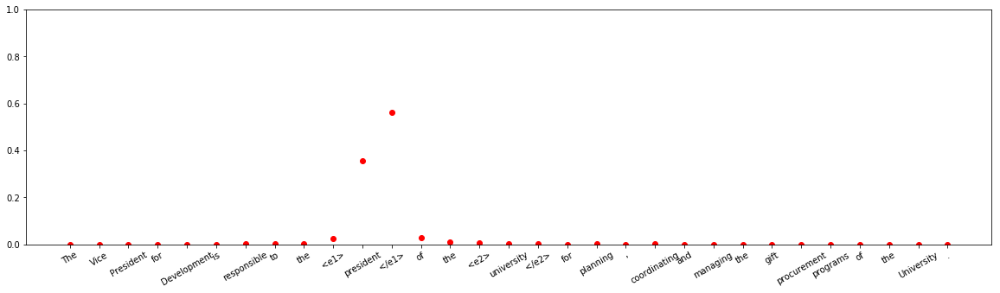


input sentence: We have seen that many software <e1> patents </e1> covering well-known <e2> algorithms </e2> and techniques hinder the software industry in the United States of America and around the world .
answer label:    Message-Topic(e1,e2)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.0976087e-09
Entity-Destination(e1,e2) 	:	 1.9573476e-10
Cause-Effect(e2,e1) 	:	 6.6998056e-13
Member-Collection(e2,e1) 	:	 6.8209476e-05
Entity-Origin(e1,e2) 	:	 3.036717e-07
Message-Topic(e1,e2) 	:	 0.0003622963
Component-Whole(e1,e2) 	:	 1.5509093e-08
Component-Whole(e2,e1) 	:	 4.6253825e-07
Instrument-Agency(e2,e1) 	:	 2.6588225e-07
Content-Container(e1,e2) 	:	 1.9017241e-06
Product-Producer(e2,e1) 	:	 0.9975757
Cause-Effect(e1,e2) 	:	 8.156426e-06
Product-Producer(e1,e2) 	:	 0.001890411
Content-Container(e2,e1) 	:	 1.883691e-07
Entity-Origin(e2,e1) 	:	 2.5832793e-05
Message-Topic(e2,e1) 	:	 5.2037217e-07
Instrument-Agency(e1,e2) 	:	 6.5161395e-05
Member-Collection(e1,e2) 	:	 5.5202685e-07

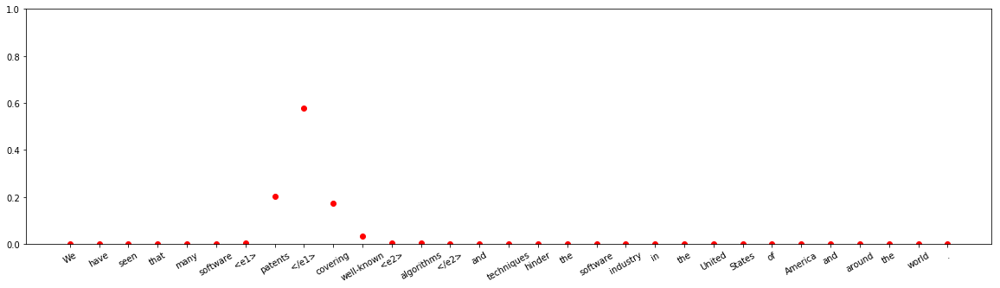


input sentence: We observed that a <e1> box </e1> was actually placed inside the <e2> cornerstone </e2> with a variety of artifacts and documents commemorating the event and the history of Savannah .
answer label:    Content-Container(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 2.617546e-10
Entity-Destination(e1,e2) 	:	 0.9995158
Cause-Effect(e2,e1) 	:	 3.7207937e-10
Member-Collection(e2,e1) 	:	 1.0066916e-09
Entity-Origin(e1,e2) 	:	 4.558684e-05
Message-Topic(e1,e2) 	:	 1.6682311e-09
Component-Whole(e1,e2) 	:	 0.00016922098
Component-Whole(e2,e1) 	:	 2.8306155e-13
Instrument-Agency(e2,e1) 	:	 1.9578836e-14
Content-Container(e1,e2) 	:	 0.00025347082
Product-Producer(e2,e1) 	:	 7.4181794e-10
Cause-Effect(e1,e2) 	:	 1.5047423e-10
Product-Producer(e1,e2) 	:	 1.937982e-09
Content-Container(e2,e1) 	:	 5.7772954e-06
Entity-Origin(e2,e1) 	:	 1.6901252e-07
Message-Topic(e2,e1) 	:	 7.3843137e-10
Instrument-Agency(e1,e2) 	:	 8.259544e-09
Member-Collection(e1,e2) 	:	 1.0101037e-05

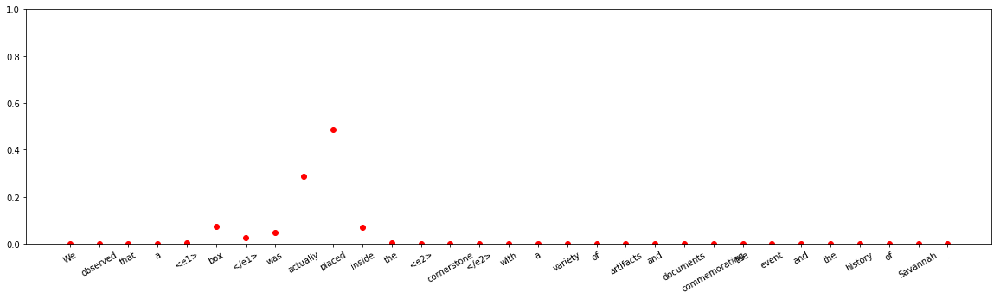


input sentence: One ounce of pure <e1> gold </e1> was sealed in a <e2> quartz tube </e2> and a section of 5-mm inside diameter quartz tube was sealed on the quartz-gold tube .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 0.000735882
Entity-Destination(e1,e2) 	:	 0.00073679205
Cause-Effect(e2,e1) 	:	 2.2691637e-14
Member-Collection(e2,e1) 	:	 4.3087732e-16
Entity-Origin(e1,e2) 	:	 2.341549e-09
Message-Topic(e1,e2) 	:	 1.2148912e-16
Component-Whole(e1,e2) 	:	 3.9973314e-10
Component-Whole(e2,e1) 	:	 1.9461575e-13
Instrument-Agency(e2,e1) 	:	 4.0690113e-13
Content-Container(e1,e2) 	:	 0.99852717
Product-Producer(e2,e1) 	:	 2.97754e-11
Cause-Effect(e1,e2) 	:	 1.674383e-14
Product-Producer(e1,e2) 	:	 4.6100553e-13
Content-Container(e2,e1) 	:	 8.653707e-08
Entity-Origin(e2,e1) 	:	 1.452913e-10
Message-Topic(e2,e1) 	:	 1.975566e-12
Instrument-Agency(e1,e2) 	:	 2.2307807e-11
Member-Collection(e1,e2) 	:	 3.9109793e-10
Entity-Destination(e2,e1) 	

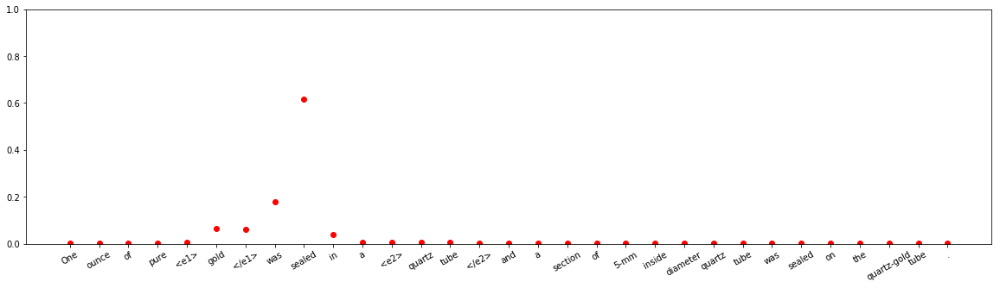






input sentence: This time , though , they left the fire unattended and the <e1> wind </e1> caused nearby leaves to catch <e2> fire </e2> , spreading 14 feet to the building .
answer label:    Cause-Effect(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 5.4079036e-16
Entity-Destination(e1,e2) 	:	 0.0034470942
Cause-Effect(e2,e1) 	:	 0.9930241
Member-Collection(e2,e1) 	:	 2.5538177e-11
Entity-Origin(e1,e2) 	:	 1.1438947e-08
Message-Topic(e1,e2) 	:	 2.9045366e-12
Component-Whole(e1,e2) 	:	 1.3079912e-09
Component-Whole(e2,e1) 	:	 7.341595e-12
Instrument-Agency(e2,e1) 	:	 1.7774265e-11
Content-Container(e1,e2) 	:	 3.3140588e-14
Product-Producer(e2,e1) 	:	 4.3181209e-10
Cause-Effect(e1,e2) 	:	 0.0035287456
Product-Producer(e1,e2) 	:	 6.238902e-08
Content-Container(e2,e1) 	:	 7.863953e-12
Entity-Origin(e2,e1) 	:	 2.1476179e-09
Message-Topic(e2,e1) 	:	 3.5892434e-13
Instrument-Agency(e1,e2) 	:	 1.5213417e-09
Member-Collection(e1,e2) 	:	 2.0370959e-10
Entity-Destination(e2,e1) 	:	 2.

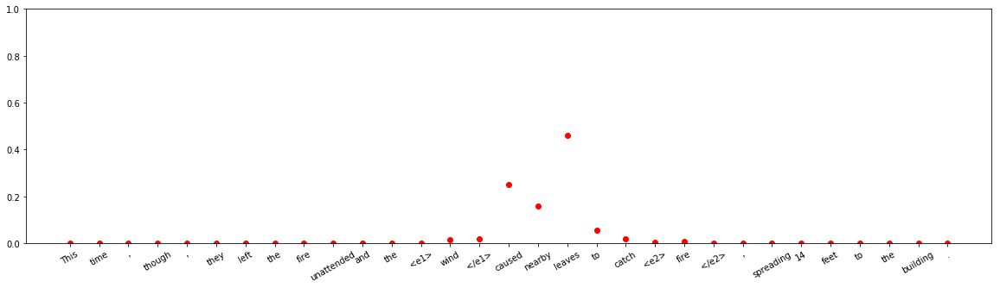








input sentence: The complete <e1> statue </e1> , topped by an imposing <e2> head </e2> , was originally nearly five metres high .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.14075875e-11
Entity-Destination(e1,e2) 	:	 1.1141423e-14
Cause-Effect(e2,e1) 	:	 1.3799361e-08
Member-Collection(e2,e1) 	:	 3.0617028e-12
Entity-Origin(e1,e2) 	:	 1.2528661e-08
Message-Topic(e1,e2) 	:	 5.4797265e-17
Component-Whole(e1,e2) 	:	 6.955297e-11
Component-Whole(e2,e1) 	:	 2.4511454e-08
Instrument-Agency(e2,e1) 	:	 6.1637e-14
Content-Container(e1,e2) 	:	 1.1278063e-11
Product-Producer(e2,e1) 	:	 3.847063e-11
Cause-Effect(e1,e2) 	:	 2.7778405e-15
Product-Producer(e1,e2) 	:	 0.9999988
Content-Container(e2,e1) 	:	 1.4743769e-12
Entity-Origin(e2,e1) 	:	 8.122772e-16
Message-Topic(e2,e1) 	:	 2.7963057e-13
Instrument-Agency(e1,e2) 	:	 1.1830435e-06
Member-Collection(e1,e2) 	:	 1.5498177e-12
Entity-Destination(e2,e1) 	:	 6.101414e-14



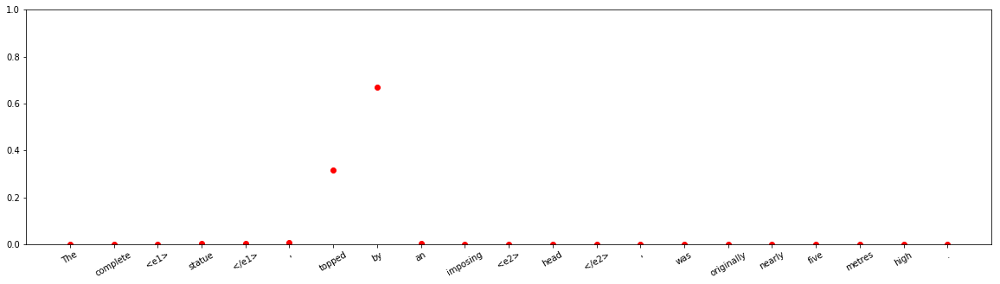







input sentence: The <e1> clustering </e1> resulted in 22445 <e2> clusters </e2> , which were composed from two to thousands of reads .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 9.32584e-14
Entity-Destination(e1,e2) 	:	 4.936565e-13
Cause-Effect(e2,e1) 	:	 9.770569e-09
Member-Collection(e2,e1) 	:	 7.471297e-06
Entity-Origin(e1,e2) 	:	 6.750426e-11
Message-Topic(e1,e2) 	:	 5.564663e-12
Component-Whole(e1,e2) 	:	 4.4052617e-12
Component-Whole(e2,e1) 	:	 3.760849e-11
Instrument-Agency(e2,e1) 	:	 2.9406115e-15
Content-Container(e1,e2) 	:	 4.4636444e-13
Product-Producer(e2,e1) 	:	 1.9007957e-09
Cause-Effect(e1,e2) 	:	 0.9999852
Product-Producer(e1,e2) 	:	 3.6945938e-10
Content-Container(e2,e1) 	:	 4.8969175e-12
Entity-Origin(e2,e1) 	:	 1.4014181e-08
Message-Topic(e2,e1) 	:	 7.3121582e-06
Instrument-Agency(e1,e2) 	:	 3.872311e-12
Member-Collection(e1,e2) 	:	 4.6673676e-10
Entity-Destination(e2,e1) 	:	 5.2142703e-13



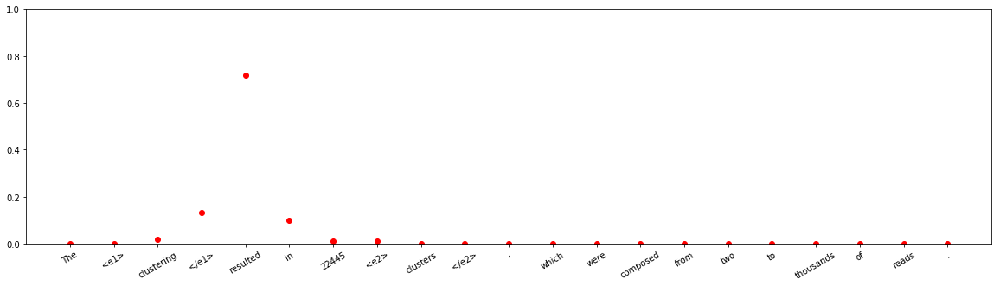


input sentence: In recent years , most <e1> floppies </e1> have shipped pre-formatted from the <e2> factory </e2> as DOS FAT12 floppies .
answer label:    Product-Producer(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.0192499e-16
Entity-Destination(e1,e2) 	:	 1.6224259e-09
Cause-Effect(e2,e1) 	:	 2.2171354e-10
Member-Collection(e2,e1) 	:	 1.9053869e-13
Entity-Origin(e1,e2) 	:	 0.99535525
Message-Topic(e1,e2) 	:	 6.9250618e-18
Component-Whole(e1,e2) 	:	 1.2163529e-10
Component-Whole(e2,e1) 	:	 1.0760924e-14
Instrument-Agency(e2,e1) 	:	 7.011913e-16
Content-Container(e1,e2) 	:	 5.1214935e-11
Product-Producer(e2,e1) 	:	 2.0991664e-13
Cause-Effect(e1,e2) 	:	 5.4728693e-18
Product-Producer(e1,e2) 	:	 0.0046448084
Content-Container(e2,e1) 	:	 7.113779e-13
Entity-Origin(e2,e1) 	:	 6.724395e-13
Message-Topic(e2,e1) 	:	 2.231631e-15
Instrument-Agency(e1,e2) 	:	 4.4440077e-11
Member-Collection(e1,e2) 	:	 1.1769284e-09
Entity-Destination(e2,e1) 	:	 5.9147e-16



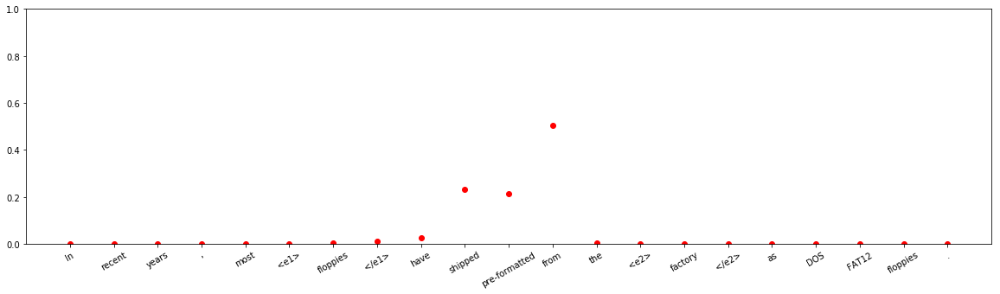


input sentence: That measured moisture content of bagged <e1> samples </e1> inserted in a <e2> beaker </e2> of soil at various depths .
answer label:    Content-Container(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 9.487785e-16
Entity-Destination(e1,e2) 	:	 0.99644923
Cause-Effect(e2,e1) 	:	 1.3887785e-15
Member-Collection(e2,e1) 	:	 3.5785063e-13
Entity-Origin(e1,e2) 	:	 5.391606e-07
Message-Topic(e1,e2) 	:	 7.1887835e-13
Component-Whole(e1,e2) 	:	 3.625773e-10
Component-Whole(e2,e1) 	:	 1.6164609e-13
Instrument-Agency(e2,e1) 	:	 1.32809e-10
Content-Container(e1,e2) 	:	 0.0035501649
Product-Producer(e2,e1) 	:	 1.3574923e-08
Cause-Effect(e1,e2) 	:	 1.4999788e-15
Product-Producer(e1,e2) 	:	 8.0903674e-14
Content-Container(e2,e1) 	:	 4.3768495e-09
Entity-Origin(e2,e1) 	:	 5.339523e-12
Message-Topic(e2,e1) 	:	 7.050711e-12
Instrument-Agency(e1,e2) 	:	 1.4542828e-13
Member-Collection(e1,e2) 	:	 1.668699e-09
Entity-Destination(e2,e1) 	:	 1.2200524e-13



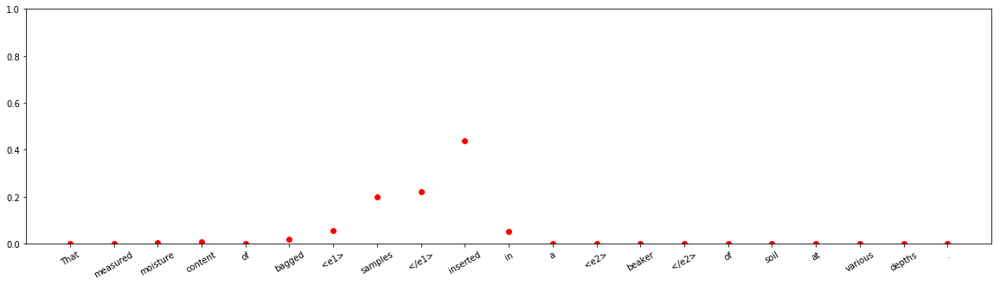




input sentence: Veuve Clicquot 's Yellow Label <e1> wine </e1> in a <e2> jeroboam </e2> is aged for up to 15 years .
answer label:    Content-Container(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 2.9043116e-08
Entity-Destination(e1,e2) 	:	 0.99406695
Cause-Effect(e2,e1) 	:	 5.292343e-09
Member-Collection(e2,e1) 	:	 4.389928e-08
Entity-Origin(e1,e2) 	:	 0.0033780725
Message-Topic(e1,e2) 	:	 2.0371009e-10
Component-Whole(e1,e2) 	:	 0.00031332264
Component-Whole(e2,e1) 	:	 1.9607516e-09
Instrument-Agency(e2,e1) 	:	 5.51204e-10
Content-Container(e1,e2) 	:	 0.0021066503
Product-Producer(e2,e1) 	:	 1.8177967e-09
Cause-Effect(e1,e2) 	:	 4.2697e-12
Product-Producer(e1,e2) 	:	 1.2559687e-08
Content-Container(e2,e1) 	:	 5.1222658e-05
Entity-Origin(e2,e1) 	:	 2.6287222e-07
Message-Topic(e2,e1) 	:	 2.6072755e-07
Instrument-Agency(e1,e2) 	:	 1.7476998e-07
Member-Collection(e1,e2) 	:	 8.3354484e-05
Entity-Destination(e2,e1) 	:	 4.2250833e-10



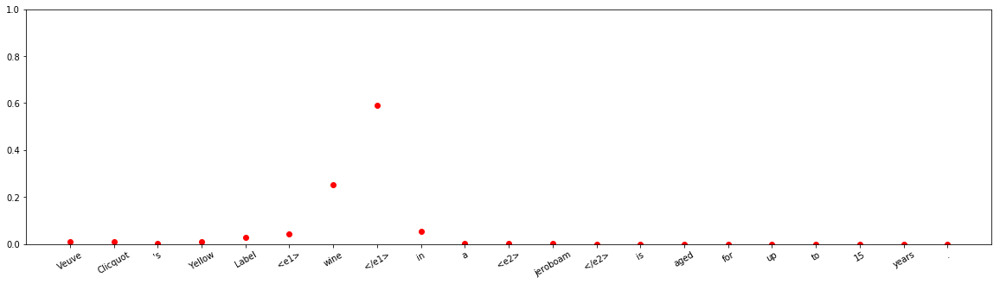


input sentence: The London-based law firm broke the <e1> news </e1> in a brief <e2> statement </e2> on Tottenham 's official website .
answer label:    Message-Topic(e2,e1)
wrong label:    Content-Container(e1,e2)
Other 	:	 2.7905457e-05
Entity-Destination(e1,e2) 	:	 2.311127e-06
Cause-Effect(e2,e1) 	:	 6.5180144e-12
Member-Collection(e2,e1) 	:	 2.3087212e-08
Entity-Origin(e1,e2) 	:	 9.186938e-05
Message-Topic(e1,e2) 	:	 0.0003926283
Component-Whole(e1,e2) 	:	 0.025977667
Component-Whole(e2,e1) 	:	 1.4071988e-05
Instrument-Agency(e2,e1) 	:	 4.0179654e-10
Content-Container(e1,e2) 	:	 0.7382765
Product-Producer(e2,e1) 	:	 0.0001069284
Cause-Effect(e1,e2) 	:	 4.3267084e-11
Product-Producer(e1,e2) 	:	 2.1577644e-06
Content-Container(e2,e1) 	:	 2.638514e-06
Entity-Origin(e2,e1) 	:	 3.979556e-10
Message-Topic(e2,e1) 	:	 0.23510388
Instrument-Agency(e1,e2) 	:	 3.127964e-11
Member-Collection(e1,e2) 	:	 1.4376138e-06
Entity-Destination(e2,e1) 	:	 6.8488992e-09



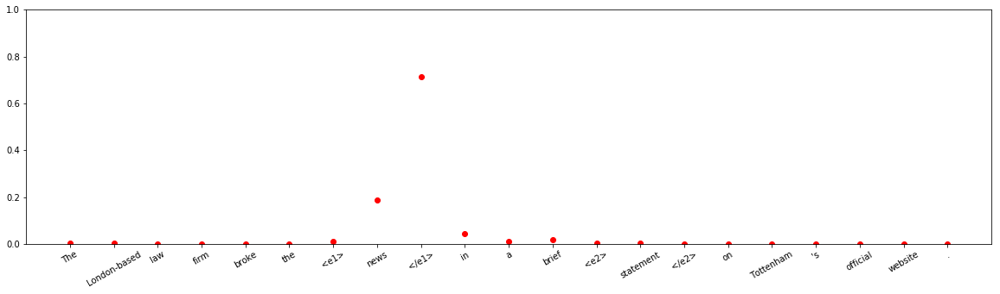



input sentence: These pages are intended to assist you in accessing Belgian library <e1> book </e1> <e2> catalogues </e2> over the internet .
answer label:    Member-Collection(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.7427263e-09
Entity-Destination(e1,e2) 	:	 4.070892e-11
Cause-Effect(e2,e1) 	:	 1.5610927e-13
Member-Collection(e2,e1) 	:	 0.00016949941
Entity-Origin(e1,e2) 	:	 1.9646558e-07
Message-Topic(e1,e2) 	:	 4.698281e-05
Component-Whole(e1,e2) 	:	 5.5294488e-05
Component-Whole(e2,e1) 	:	 0.99802977
Instrument-Agency(e2,e1) 	:	 9.832202e-09
Content-Container(e1,e2) 	:	 4.0000778e-05
Product-Producer(e2,e1) 	:	 0.00057732535
Cause-Effect(e1,e2) 	:	 8.326412e-11
Product-Producer(e1,e2) 	:	 6.3572074e-06
Content-Container(e2,e1) 	:	 0.0010311536
Entity-Origin(e2,e1) 	:	 9.27601e-07
Message-Topic(e2,e1) 	:	 4.2012583e-05
Instrument-Agency(e1,e2) 	:	 5.060088e-07
Member-Collection(e1,e2) 	:	 4.1103498e-10
Entity-Destination(e2,e1) 	:	 1.9157615e-09



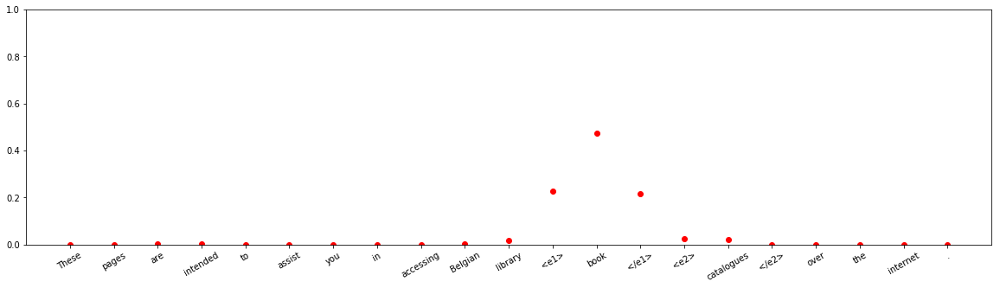





input sentence: A latching device removably secures and sealingly engages a closure around an <e1> opening </e1> in a <e2> cask </e2> .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.0021703772
Entity-Destination(e1,e2) 	:	 2.535898e-06
Cause-Effect(e2,e1) 	:	 4.8965443e-13
Member-Collection(e2,e1) 	:	 9.5006e-12
Entity-Origin(e1,e2) 	:	 1.4734295e-09
Message-Topic(e1,e2) 	:	 5.100429e-12
Component-Whole(e1,e2) 	:	 0.8677263
Component-Whole(e2,e1) 	:	 5.5736646e-08
Instrument-Agency(e2,e1) 	:	 2.0096273e-08
Content-Container(e1,e2) 	:	 0.13007177
Product-Producer(e2,e1) 	:	 6.2056067e-09
Cause-Effect(e1,e2) 	:	 1.3919523e-14
Product-Producer(e1,e2) 	:	 3.4684225e-10
Content-Container(e2,e1) 	:	 2.8566801e-05
Entity-Origin(e2,e1) 	:	 3.225391e-11
Message-Topic(e2,e1) 	:	 1.492137e-10
Instrument-Agency(e1,e2) 	:	 3.1178956e-08
Member-Collection(e1,e2) 	:	 2.6032353e-07
Entity-Destination(e2,e1) 	:	 4.443357e-08



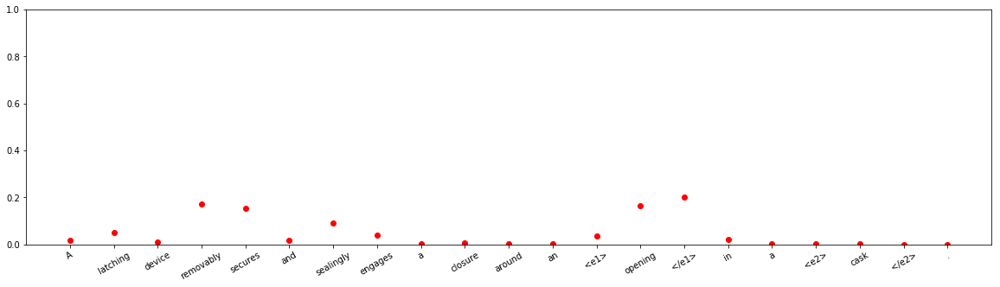



input sentence: In a large oval <e1> crock pot </e1> I 've had some <e2> hams </e2> that can fit in whole .
answer label:    Content-Container(e2,e1)
wrong label:    Entity-Origin(e2,e1)
Other 	:	 6.1072395e-05
Entity-Destination(e1,e2) 	:	 1.4914617e-08
Cause-Effect(e2,e1) 	:	 2.6917257e-11
Member-Collection(e2,e1) 	:	 0.00023028222
Entity-Origin(e1,e2) 	:	 4.0940895e-06
Message-Topic(e1,e2) 	:	 3.8700502e-05
Component-Whole(e1,e2) 	:	 1.2773658e-06
Component-Whole(e2,e1) 	:	 1.2745094e-05
Instrument-Agency(e2,e1) 	:	 9.41728e-10
Content-Container(e1,e2) 	:	 0.00023274645
Product-Producer(e2,e1) 	:	 1.6760995e-06
Cause-Effect(e1,e2) 	:	 5.5366957e-07
Product-Producer(e1,e2) 	:	 0.00035325973
Content-Container(e2,e1) 	:	 0.184582
Entity-Origin(e2,e1) 	:	 0.7438556
Message-Topic(e2,e1) 	:	 1.499923e-08
Instrument-Agency(e1,e2) 	:	 0.07062601
Member-Collection(e1,e2) 	:	 2.0249649e-08
Entity-Destination(e2,e1) 	:	 1.456926e-08



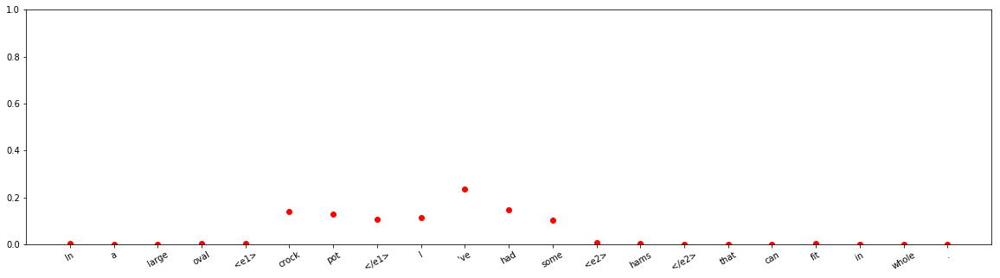


input sentence: One <e1> topic </e1> that came up in the <e2> discussion </e2> with the audience was the future of news .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 4.2295817e-10
Entity-Destination(e1,e2) 	:	 7.201301e-05
Cause-Effect(e2,e1) 	:	 9.0113105e-08
Member-Collection(e2,e1) 	:	 5.43307e-05
Entity-Origin(e1,e2) 	:	 0.039979924
Message-Topic(e1,e2) 	:	 0.0015417639
Component-Whole(e1,e2) 	:	 0.43020546
Component-Whole(e2,e1) 	:	 3.5468278e-05
Instrument-Agency(e2,e1) 	:	 5.664137e-10
Content-Container(e1,e2) 	:	 0.00040787706
Product-Producer(e2,e1) 	:	 0.038073566
Cause-Effect(e1,e2) 	:	 1.331402e-05
Product-Producer(e1,e2) 	:	 0.00054751843
Content-Container(e2,e1) 	:	 3.6197952e-07
Entity-Origin(e2,e1) 	:	 3.7565607e-07
Message-Topic(e2,e1) 	:	 0.48901767
Instrument-Agency(e1,e2) 	:	 6.1103556e-10
Member-Collection(e1,e2) 	:	 5.0363495e-05
Entity-Destination(e2,e1) 	:	 1.5934899e-09



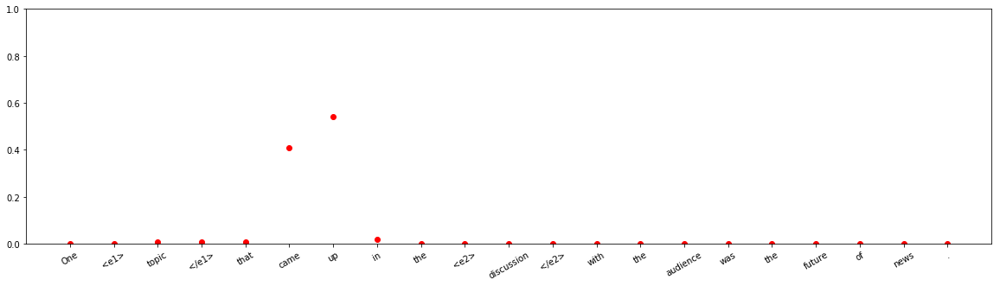



input sentence: The <e1> criminal </e1> just got out of <e2> jail </e2> from a mutli-million dollar fraud involving his old company .
answer label:    Entity-Origin(e1,e2)
wrong label:    Other
Other 	:	 0.46607724
Entity-Destination(e1,e2) 	:	 6.4809285e-08
Cause-Effect(e2,e1) 	:	 1.5045994e-05
Member-Collection(e2,e1) 	:	 1.0458774e-11
Entity-Origin(e1,e2) 	:	 0.19723962
Message-Topic(e1,e2) 	:	 1.41145455e-11
Component-Whole(e1,e2) 	:	 6.8033246e-10
Component-Whole(e2,e1) 	:	 7.3637043e-09
Instrument-Agency(e2,e1) 	:	 0.33660367
Content-Container(e1,e2) 	:	 2.3318296e-05
Product-Producer(e2,e1) 	:	 1.9649798e-07
Cause-Effect(e1,e2) 	:	 2.138599e-13
Product-Producer(e1,e2) 	:	 5.70217e-09
Content-Container(e2,e1) 	:	 1.0993737e-08
Entity-Origin(e2,e1) 	:	 4.1095516e-11
Message-Topic(e2,e1) 	:	 4.0776416e-05
Instrument-Agency(e1,e2) 	:	 1.035403e-08
Member-Collection(e1,e2) 	:	 2.0502855e-10
Entity-Destination(e2,e1) 	:	 4.5472803e-11



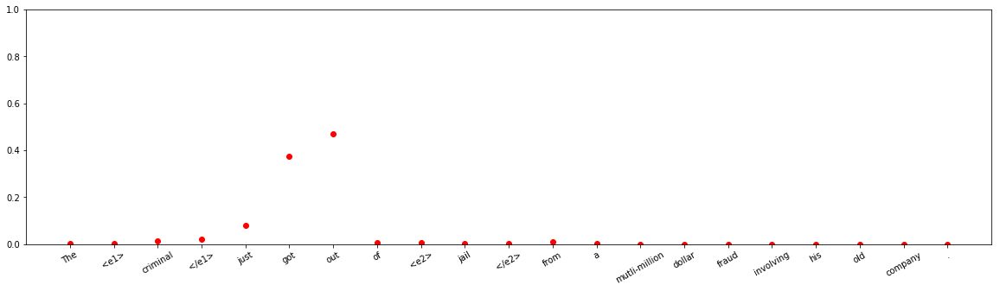




input sentence: He is a Russian artist whose <e1> work </e1> has been shown in various <e2> galleries </e2> across the world .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 2.1989894e-08
Entity-Destination(e1,e2) 	:	 8.3244847e-16
Cause-Effect(e2,e1) 	:	 2.6164007e-15
Member-Collection(e2,e1) 	:	 2.008681e-13
Entity-Origin(e1,e2) 	:	 8.217015e-11
Message-Topic(e1,e2) 	:	 1.2482321e-17
Component-Whole(e1,e2) 	:	 4.0586382e-13
Component-Whole(e2,e1) 	:	 1.02629155e-14
Instrument-Agency(e2,e1) 	:	 1.3253389e-14
Content-Container(e1,e2) 	:	 1.1523647e-13
Product-Producer(e2,e1) 	:	 3.656715e-09
Cause-Effect(e1,e2) 	:	 2.319849e-17
Product-Producer(e1,e2) 	:	 1.5508028e-14
Content-Container(e2,e1) 	:	 3.9696305e-16
Entity-Origin(e2,e1) 	:	 2.0747788e-15
Message-Topic(e2,e1) 	:	 1.0
Instrument-Agency(e1,e2) 	:	 1.5543865e-17
Member-Collection(e1,e2) 	:	 2.9996296e-13
Entity-Destination(e2,e1) 	:	 4.3898902e-17



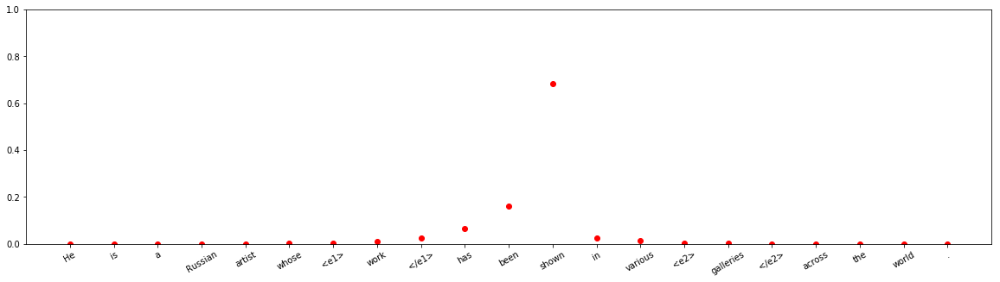






input sentence: This <e1> list </e1> has been prepared on the basis of <e2> records </e2> and information available to the secretariat .
answer label:    Entity-Origin(e1,e2)
wrong label:    Message-Topic(e1,e2)
Other 	:	 2.0800883e-08
Entity-Destination(e1,e2) 	:	 1.0242346e-10
Cause-Effect(e2,e1) 	:	 1.901172e-13
Member-Collection(e2,e1) 	:	 1.8314704e-05
Entity-Origin(e1,e2) 	:	 1.1008667e-08
Message-Topic(e1,e2) 	:	 0.9773737
Component-Whole(e1,e2) 	:	 2.3366818e-08
Component-Whole(e2,e1) 	:	 3.7723552e-08
Instrument-Agency(e2,e1) 	:	 7.3393525e-10
Content-Container(e1,e2) 	:	 1.7763943e-10
Product-Producer(e2,e1) 	:	 5.1361083e-05
Cause-Effect(e1,e2) 	:	 3.3127476e-09
Product-Producer(e1,e2) 	:	 6.119166e-08
Content-Container(e2,e1) 	:	 1.8960886e-08
Entity-Origin(e2,e1) 	:	 7.557359e-08
Message-Topic(e2,e1) 	:	 0.02255642
Instrument-Agency(e1,e2) 	:	 1.6827034e-10
Member-Collection(e1,e2) 	:	 2.8867058e-11
Entity-Destination(e2,e1) 	:	 1.4026099e-12



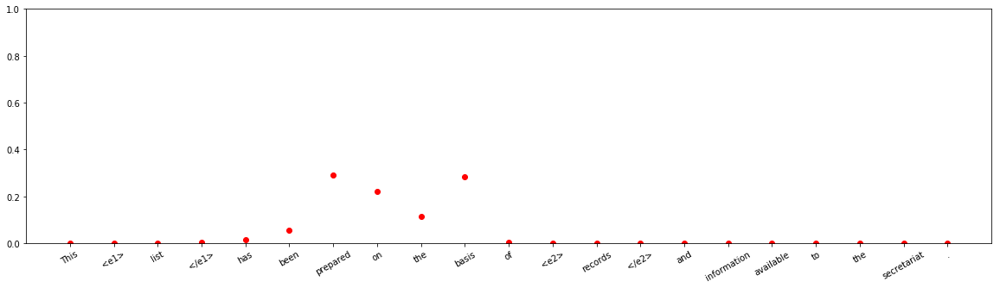




input sentence: He encourages <e1> students </e1> to read beyond the mandatory <e2> texts </e2> in order to prepare for his exam .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.0051573776
Entity-Destination(e1,e2) 	:	 6.2308703e-07
Cause-Effect(e2,e1) 	:	 6.903139e-12
Member-Collection(e2,e1) 	:	 1.715871e-08
Entity-Origin(e1,e2) 	:	 7.452657e-10
Message-Topic(e1,e2) 	:	 8.590552e-05
Component-Whole(e1,e2) 	:	 1.3832657e-07
Component-Whole(e2,e1) 	:	 2.6319358e-09
Instrument-Agency(e2,e1) 	:	 0.000537161
Content-Container(e1,e2) 	:	 1.2354477e-08
Product-Producer(e2,e1) 	:	 0.8564018
Cause-Effect(e1,e2) 	:	 5.7987903e-10
Product-Producer(e1,e2) 	:	 2.3450605e-10
Content-Container(e2,e1) 	:	 3.7120773e-07
Entity-Origin(e2,e1) 	:	 3.5739937e-08
Message-Topic(e2,e1) 	:	 0.13781664
Instrument-Agency(e1,e2) 	:	 4.935376e-10
Member-Collection(e1,e2) 	:	 3.186078e-08
Entity-Destination(e2,e1) 	:	 8.7235615e-11



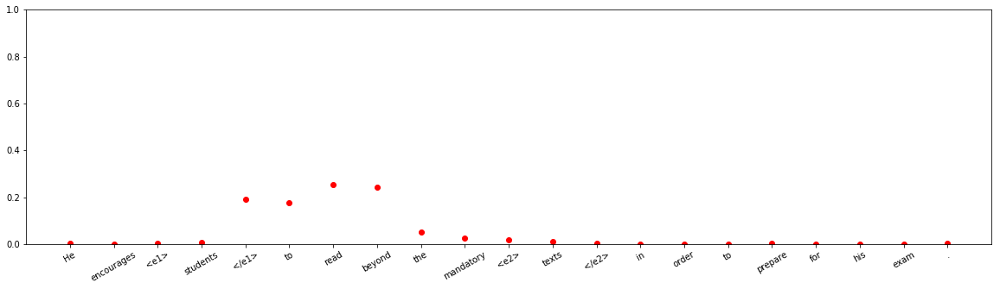


input sentence: The message <e1> body </e1> was comprised of the <e2> phrase </e2> `` hey , check this out ! `` .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.876486e-11
Entity-Destination(e1,e2) 	:	 3.5684188e-11
Cause-Effect(e2,e1) 	:	 4.098103e-10
Member-Collection(e2,e1) 	:	 0.0055186134
Entity-Origin(e1,e2) 	:	 0.00021981704
Message-Topic(e1,e2) 	:	 2.3842325e-10
Component-Whole(e1,e2) 	:	 0.0004923421
Component-Whole(e2,e1) 	:	 0.9937115
Instrument-Agency(e2,e1) 	:	 3.7104309e-09
Content-Container(e1,e2) 	:	 1.8271917e-08
Product-Producer(e2,e1) 	:	 8.655546e-06
Cause-Effect(e1,e2) 	:	 1.4476403e-08
Product-Producer(e1,e2) 	:	 9.178401e-08
Content-Container(e2,e1) 	:	 4.9058708e-05
Entity-Origin(e2,e1) 	:	 6.891736e-09
Message-Topic(e2,e1) 	:	 7.879803e-09
Instrument-Agency(e1,e2) 	:	 1.9033774e-08
Member-Collection(e1,e2) 	:	 2.6451472e-10
Entity-Destination(e2,e1) 	:	 2.2700537e-13



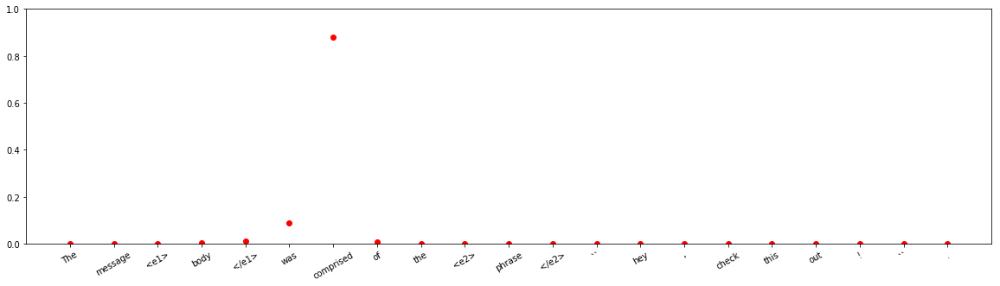




input sentence: There was weeping and wailing and gnashing of teeth in the <e1> camp </e1> of the <e2> outsiders </e2> now .
answer label:    Member-Collection(e2,e1)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 9.431348e-06
Entity-Destination(e1,e2) 	:	 3.7513104e-09
Cause-Effect(e2,e1) 	:	 5.9128564e-07
Member-Collection(e2,e1) 	:	 0.16289508
Entity-Origin(e1,e2) 	:	 1.9503032e-07
Message-Topic(e1,e2) 	:	 8.518774e-06
Component-Whole(e1,e2) 	:	 0.010388122
Component-Whole(e2,e1) 	:	 1.0232213e-07
Instrument-Agency(e2,e1) 	:	 1.4582252e-09
Content-Container(e1,e2) 	:	 6.54267e-09
Product-Producer(e2,e1) 	:	 1.4981342e-09
Cause-Effect(e1,e2) 	:	 2.4127607e-07
Product-Producer(e1,e2) 	:	 7.4234854e-06
Content-Container(e2,e1) 	:	 7.274554e-09
Entity-Origin(e2,e1) 	:	 8.4288104e-07
Message-Topic(e2,e1) 	:	 2.782338e-07
Instrument-Agency(e1,e2) 	:	 0.73530376
Member-Collection(e1,e2) 	:	 0.09138536
Entity-Destination(e2,e1) 	:	 1.5998966e-11



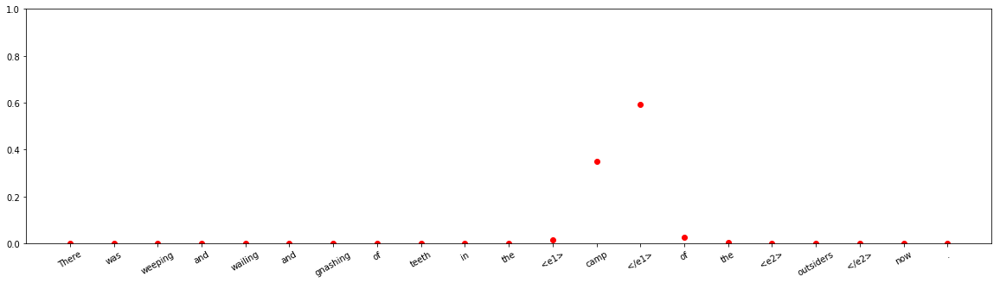
























input sentence: The NTSB determined that the <e1> aircraft </e1> departed from controlled <e2> flight </e2> and crashed into the Atlantic Ocean .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 3.805485e-14
Entity-Destination(e1,e2) 	:	 9.324475e-12
Cause-Effect(e2,e1) 	:	 2.3990516e-13
Member-Collection(e2,e1) 	:	 1.3811929e-13
Entity-Origin(e1,e2) 	:	 1.0
Message-Topic(e1,e2) 	:	 7.492753e-20
Component-Whole(e1,e2) 	:	 5.095221e-16
Component-Whole(e2,e1) 	:	 1.006761e-12
Instrument-Agency(e2,e1) 	:	 2.2153128e-10
Content-Container(e1,e2) 	:	 2.7404498e-10
Product-Producer(e2,e1) 	:	 5.314824e-11
Cause-Effect(e1,e2) 	:	 1.5828681e-18
Product-Producer(e1,e2) 	:	 1.006201e-11
Content-Container(e2,e1) 	:	 5.42711e-14
Entity-Origin(e2,e1) 	:	 7.6593044e-11
Message-Topic(e2,e1) 	:	 6.7918913e-15
Instrument-Agency(e1,e2) 	:	 3.9860723e-12
Member-Collection(e1,e2) 	:	 1.4523001e-10
Entity-Destination(e2,e1) 	:	 2.7886405e-16



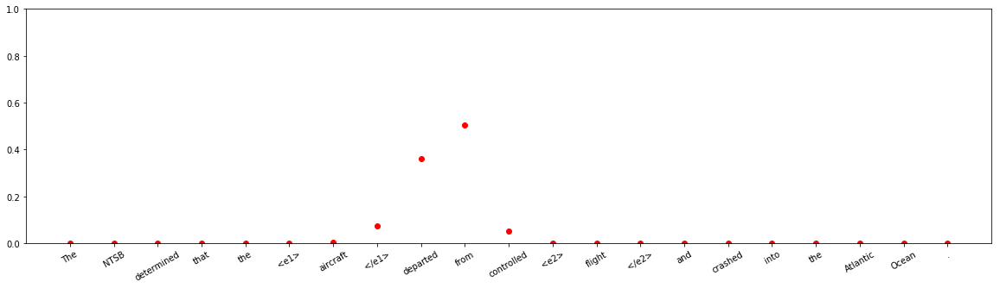


input sentence: The feature analysis storage stores the <e1> plurality </e1> of predetermined <e2> features </e2> extracted from the retrieved textual opinions .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.2466141e-07
Entity-Destination(e1,e2) 	:	 1.6449711e-10
Cause-Effect(e2,e1) 	:	 3.639056e-12
Member-Collection(e2,e1) 	:	 0.6926002
Entity-Origin(e1,e2) 	:	 3.5962742e-07
Message-Topic(e1,e2) 	:	 3.1224197e-08
Component-Whole(e1,e2) 	:	 0.21150929
Component-Whole(e2,e1) 	:	 0.027685702
Instrument-Agency(e2,e1) 	:	 2.3164995e-07
Content-Container(e1,e2) 	:	 4.382463e-06
Product-Producer(e2,e1) 	:	 0.024311638
Cause-Effect(e1,e2) 	:	 6.4450134e-09
Product-Producer(e1,e2) 	:	 6.465336e-07
Content-Container(e2,e1) 	:	 0.043878414
Entity-Origin(e2,e1) 	:	 5.9072e-08
Message-Topic(e2,e1) 	:	 2.8141405e-06
Instrument-Agency(e1,e2) 	:	 6.064664e-06
Member-Collection(e1,e2) 	:	 2.5420269e-08
Entity-Destination(e2,e1) 	:	 1.1074031e-08



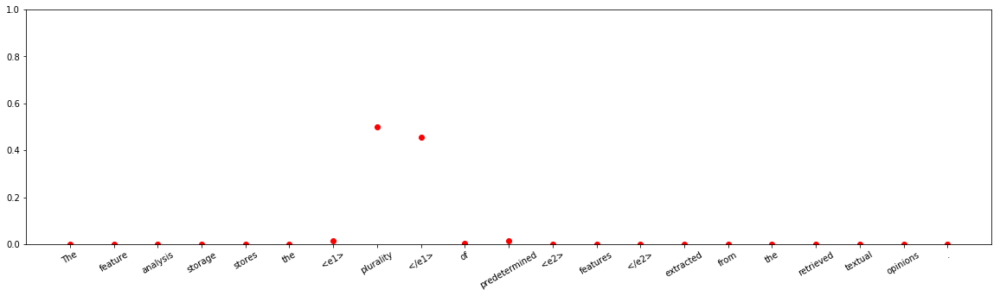






input sentence: The <e1> burner </e1> of the <e2> dryer </e2> is lined with more than 3 cm thick castable refractory material .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.9999869
Entity-Destination(e1,e2) 	:	 1.57922e-14
Cause-Effect(e2,e1) 	:	 5.590455e-10
Member-Collection(e2,e1) 	:	 4.1011248e-14
Entity-Origin(e1,e2) 	:	 8.846408e-12
Message-Topic(e1,e2) 	:	 4.9919064e-13
Component-Whole(e1,e2) 	:	 1.2329259e-05
Component-Whole(e2,e1) 	:	 1.0774414e-07
Instrument-Agency(e2,e1) 	:	 1.5529665e-07
Content-Container(e1,e2) 	:	 6.2832908e-09
Product-Producer(e2,e1) 	:	 1.640131e-11
Cause-Effect(e1,e2) 	:	 2.3287828e-13
Product-Producer(e1,e2) 	:	 5.5167147e-12
Content-Container(e2,e1) 	:	 2.1209545e-10
Entity-Origin(e2,e1) 	:	 8.57059e-15
Message-Topic(e2,e1) 	:	 2.1779446e-11
Instrument-Agency(e1,e2) 	:	 5.983352e-07
Member-Collection(e1,e2) 	:	 6.005208e-12
Entity-Destination(e2,e1) 	:	 9.294176e-14



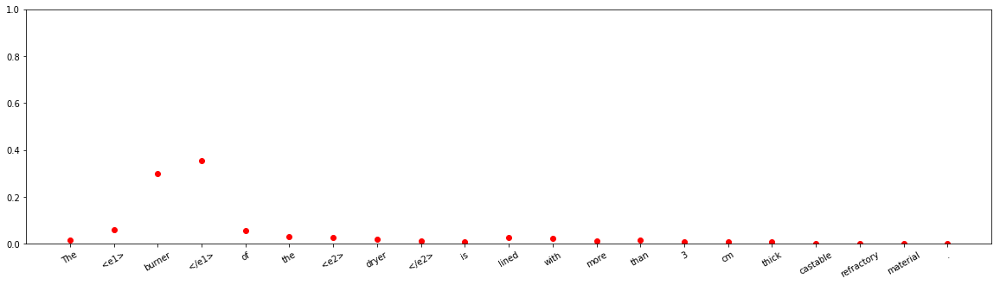


input sentence: The <e1> abridger </e1> did his job carefully , and with a fairly good <e2> eye </e2> for consequential alterations .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.1155232
Entity-Destination(e1,e2) 	:	 6.9736446e-11
Cause-Effect(e2,e1) 	:	 3.236425e-09
Member-Collection(e2,e1) 	:	 4.357749e-11
Entity-Origin(e1,e2) 	:	 1.3452479e-08
Message-Topic(e1,e2) 	:	 4.9973035e-09
Component-Whole(e1,e2) 	:	 5.7351524e-10
Component-Whole(e2,e1) 	:	 3.610163e-07
Instrument-Agency(e2,e1) 	:	 0.8838422
Content-Container(e1,e2) 	:	 4.4672532e-08
Product-Producer(e2,e1) 	:	 0.0006313719
Cause-Effect(e1,e2) 	:	 2.1604162e-06
Product-Producer(e1,e2) 	:	 1.0850833e-11
Content-Container(e2,e1) 	:	 5.595728e-07
Entity-Origin(e2,e1) 	:	 4.3279064e-10
Message-Topic(e2,e1) 	:	 8.277528e-10
Instrument-Agency(e1,e2) 	:	 1.9256791e-07
Member-Collection(e1,e2) 	:	 1.6044953e-09
Entity-Destination(e2,e1) 	:	 9.8229e-12



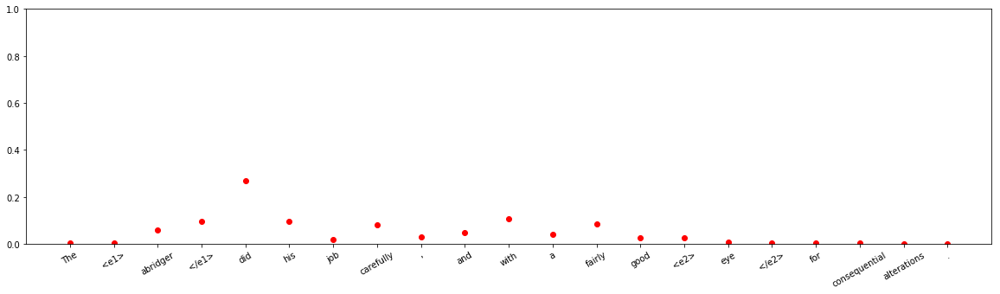



input sentence: This primary school <e1> teacher </e1> has completed a whole <e2> book </e2> with his class in just one week .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 3.0165146e-17
Entity-Destination(e1,e2) 	:	 2.0083632e-13
Cause-Effect(e2,e1) 	:	 2.275732e-19
Member-Collection(e2,e1) 	:	 6.5087905e-15
Entity-Origin(e1,e2) 	:	 6.1325793e-12
Message-Topic(e1,e2) 	:	 8.429866e-18
Component-Whole(e1,e2) 	:	 2.2687543e-19
Component-Whole(e2,e1) 	:	 9.1624984e-14
Instrument-Agency(e2,e1) 	:	 1.207311e-13
Content-Container(e1,e2) 	:	 2.602781e-16
Product-Producer(e2,e1) 	:	 1.0
Cause-Effect(e1,e2) 	:	 6.149155e-15
Product-Producer(e1,e2) 	:	 2.0230911e-14
Content-Container(e2,e1) 	:	 9.260174e-16
Entity-Origin(e2,e1) 	:	 1.0773905e-17
Message-Topic(e2,e1) 	:	 1.03036885e-11
Instrument-Agency(e1,e2) 	:	 1.957408e-19
Member-Collection(e1,e2) 	:	 3.369279e-15
Entity-Destination(e2,e1) 	:	 5.8736663e-19



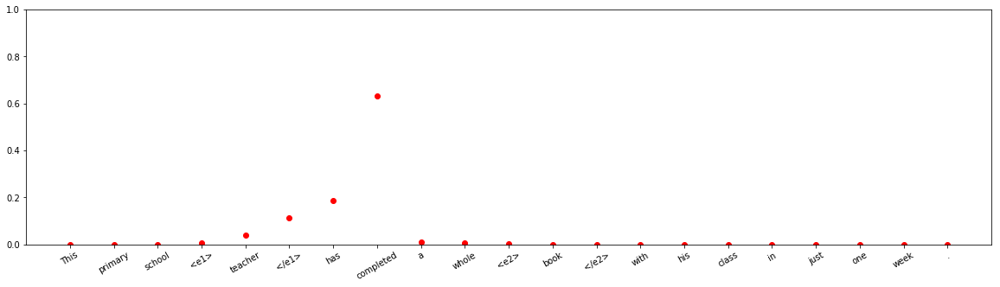


input sentence: A French <e1> initiative </e1> aimed at tackling childhood <e2> obesity </e2> is adopted in a town in North Lanarkshire .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9999876
Entity-Destination(e1,e2) 	:	 1.9908466e-14
Cause-Effect(e2,e1) 	:	 1.2570882e-09
Member-Collection(e2,e1) 	:	 8.724394e-12
Entity-Origin(e1,e2) 	:	 1.2010706e-11
Message-Topic(e1,e2) 	:	 1.1993677e-05
Component-Whole(e1,e2) 	:	 3.0572262e-09
Component-Whole(e2,e1) 	:	 3.2084388e-10
Instrument-Agency(e2,e1) 	:	 2.5384752e-11
Content-Container(e1,e2) 	:	 9.635974e-12
Product-Producer(e2,e1) 	:	 2.844503e-11
Cause-Effect(e1,e2) 	:	 2.0309602e-07
Product-Producer(e1,e2) 	:	 1.6317963e-09
Content-Container(e2,e1) 	:	 6.0165744e-12
Entity-Origin(e2,e1) 	:	 9.0746255e-10
Message-Topic(e2,e1) 	:	 1.14924376e-07
Instrument-Agency(e1,e2) 	:	 2.3358313e-09
Member-Collection(e1,e2) 	:	 4.5713364e-10
Entity-Destination(e2,e1) 	:	 8.214652e-12



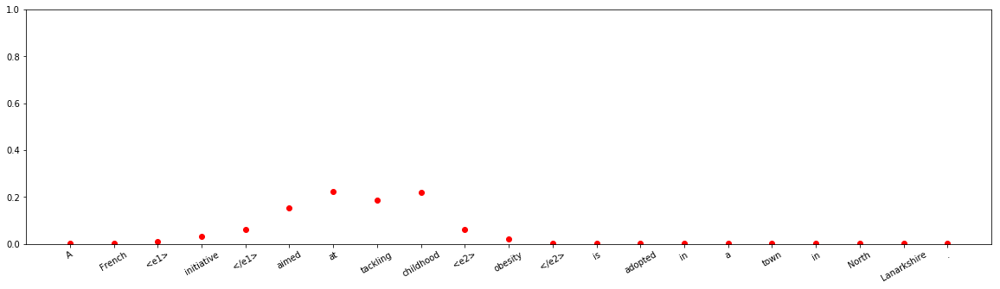


input sentence: An icon is a small <e1> picture </e1> representing a <e2> file </e2> , folder or program on your computer .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 3.1193062e-11
Entity-Destination(e1,e2) 	:	 5.9411127e-06
Cause-Effect(e2,e1) 	:	 5.874934e-13
Member-Collection(e2,e1) 	:	 4.577632e-06
Entity-Origin(e1,e2) 	:	 4.608933e-05
Message-Topic(e1,e2) 	:	 2.1210656e-06
Component-Whole(e1,e2) 	:	 2.7231492e-06
Component-Whole(e2,e1) 	:	 0.00026070903
Instrument-Agency(e2,e1) 	:	 1.1870866e-06
Content-Container(e1,e2) 	:	 0.003638922
Product-Producer(e2,e1) 	:	 0.9945931
Cause-Effect(e1,e2) 	:	 5.28607e-10
Product-Producer(e1,e2) 	:	 1.1073043e-06
Content-Container(e2,e1) 	:	 0.0014424099
Entity-Origin(e2,e1) 	:	 1.859541e-08
Message-Topic(e2,e1) 	:	 8.492325e-08
Instrument-Agency(e1,e2) 	:	 3.2591655e-07
Member-Collection(e1,e2) 	:	 5.89596e-07
Entity-Destination(e2,e1) 	:	 5.24669e-08



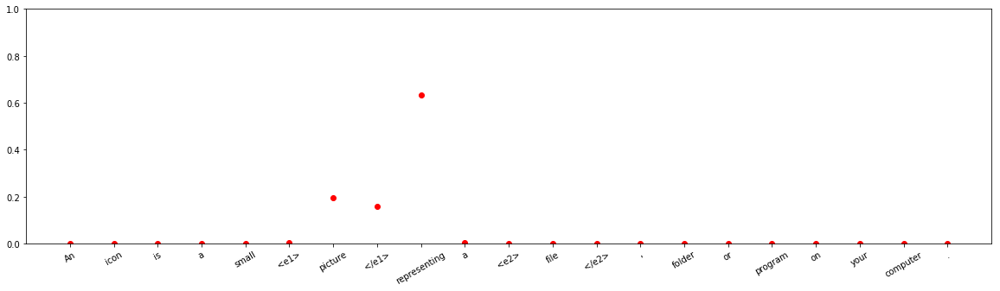






input sentence: These <e1> tests </e1> work by using a <e2> substance </e2> that changes color once it is bound to hCG .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.978135
Entity-Destination(e1,e2) 	:	 3.0739823e-13
Cause-Effect(e2,e1) 	:	 3.1137963e-06
Member-Collection(e2,e1) 	:	 7.14858e-15
Entity-Origin(e1,e2) 	:	 7.243476e-11
Message-Topic(e1,e2) 	:	 1.3807827e-13
Component-Whole(e1,e2) 	:	 7.647014e-12
Component-Whole(e2,e1) 	:	 2.3945069e-07
Instrument-Agency(e2,e1) 	:	 0.021856582
Content-Container(e1,e2) 	:	 3.5697306e-11
Product-Producer(e2,e1) 	:	 1.0700938e-10
Cause-Effect(e1,e2) 	:	 3.122428e-12
Product-Producer(e1,e2) 	:	 2.5677316e-10
Content-Container(e2,e1) 	:	 8.929051e-12
Entity-Origin(e2,e1) 	:	 3.4797906e-14
Message-Topic(e2,e1) 	:	 4.1116653e-08
Instrument-Agency(e1,e2) 	:	 5.0315193e-06
Member-Collection(e1,e2) 	:	 2.913165e-13
Entity-Destination(e2,e1) 	:	 5.8899765e-13



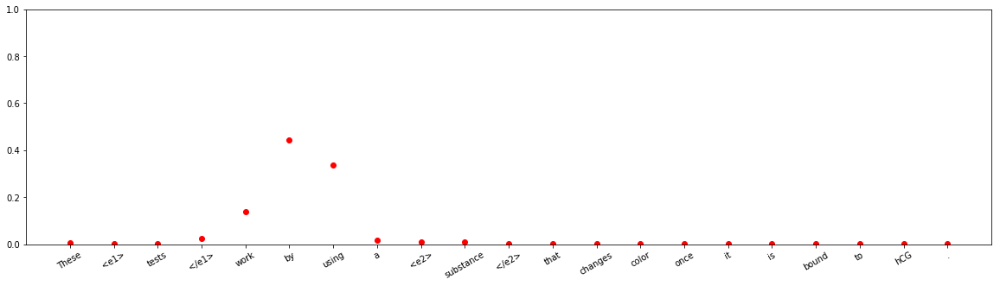








input sentence: <e1> Lasers </e1> work by using various soft pulsing light <e2> wavelengths </e2> and intensities to help reshape scar tissue .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.8162576
Entity-Destination(e1,e2) 	:	 2.5108637e-10
Cause-Effect(e2,e1) 	:	 0.13627237
Member-Collection(e2,e1) 	:	 3.7650907e-11
Entity-Origin(e1,e2) 	:	 1.3071251e-08
Message-Topic(e1,e2) 	:	 1.4767243e-11
Component-Whole(e1,e2) 	:	 2.9084327e-07
Component-Whole(e2,e1) 	:	 6.086072e-06
Instrument-Agency(e2,e1) 	:	 0.045844544
Content-Container(e1,e2) 	:	 5.3141984e-11
Product-Producer(e2,e1) 	:	 8.083156e-09
Cause-Effect(e1,e2) 	:	 0.001559402
Product-Producer(e1,e2) 	:	 1.2244964e-09
Content-Container(e2,e1) 	:	 1.0805313e-10
Entity-Origin(e2,e1) 	:	 5.004335e-11
Message-Topic(e2,e1) 	:	 3.7008905e-07
Instrument-Agency(e1,e2) 	:	 5.937103e-05
Member-Collection(e1,e2) 	:	 3.2739877e-08
Entity-Destination(e2,e1) 	:	 1.1218317e-10



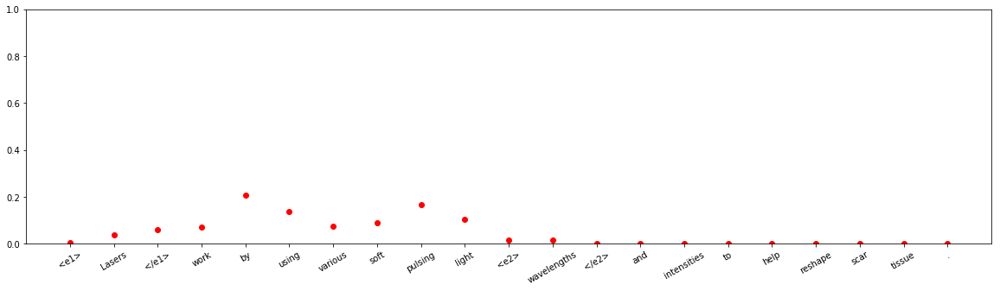


input sentence: Relaxation involves concentration and slow , deep breathing to release <e1> tension </e1> from <e2> muscles </e2> and relieve pain .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 4.078233e-18
Entity-Destination(e1,e2) 	:	 1.5421744e-09
Cause-Effect(e2,e1) 	:	 0.9741697
Member-Collection(e2,e1) 	:	 6.528493e-07
Entity-Origin(e1,e2) 	:	 2.6336902e-05
Message-Topic(e1,e2) 	:	 1.5695993e-14
Component-Whole(e1,e2) 	:	 2.58444e-07
Component-Whole(e2,e1) 	:	 0.025797654
Instrument-Agency(e2,e1) 	:	 2.288915e-12
Content-Container(e1,e2) 	:	 1.7059082e-13
Product-Producer(e2,e1) 	:	 1.5113336e-13
Cause-Effect(e1,e2) 	:	 5.446451e-06
Product-Producer(e1,e2) 	:	 5.644922e-10
Content-Container(e2,e1) 	:	 1.0618143e-12
Entity-Origin(e2,e1) 	:	 1.8609394e-11
Message-Topic(e2,e1) 	:	 2.2992404e-09
Instrument-Agency(e1,e2) 	:	 5.0817187e-11
Member-Collection(e1,e2) 	:	 1.7580507e-12
Entity-Destination(e2,e1) 	:	 2.0999058e-12



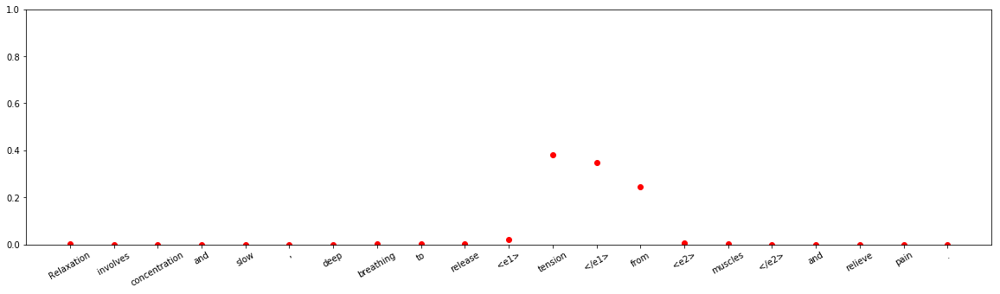



input sentence: A <e1> scheme </e1> establishing <e2> access </e2> to the East Sussex countryside for disabled people draws to a close .
answer label:    Cause-Effect(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 0.057527434
Entity-Destination(e1,e2) 	:	 3.7220292e-07
Cause-Effect(e2,e1) 	:	 1.4063877e-05
Member-Collection(e2,e1) 	:	 0.0016359362
Entity-Origin(e1,e2) 	:	 1.095953e-07
Message-Topic(e1,e2) 	:	 0.00091293204
Component-Whole(e1,e2) 	:	 3.8274393e-08
Component-Whole(e2,e1) 	:	 0.001377854
Instrument-Agency(e2,e1) 	:	 1.6681117e-05
Content-Container(e1,e2) 	:	 2.5282481e-05
Product-Producer(e2,e1) 	:	 0.00046351436
Cause-Effect(e1,e2) 	:	 4.071973e-06
Product-Producer(e1,e2) 	:	 0.0016420385
Content-Container(e2,e1) 	:	 0.00014899766
Entity-Origin(e2,e1) 	:	 1.6570544e-06
Message-Topic(e2,e1) 	:	 0.93230945
Instrument-Agency(e1,e2) 	:	 0.0037929798
Member-Collection(e1,e2) 	:	 3.4785746e-08
Entity-Destination(e2,e1) 	:	 0.00012663321



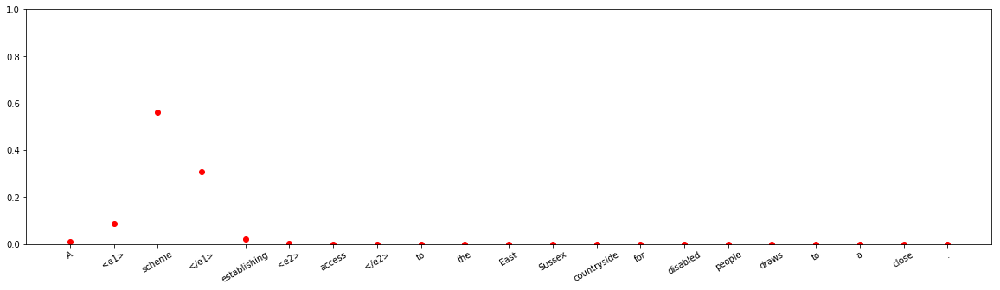


input sentence: The plasma processing <e1> apparatus </e1> produces a plasma in a <e2> vessel </e2> and processes samples using the plasma .
answer label:    Component-Whole(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 3.3149794e-09
Entity-Destination(e1,e2) 	:	 4.8342425e-10
Cause-Effect(e2,e1) 	:	 1.7825904e-12
Member-Collection(e2,e1) 	:	 4.8008408e-14
Entity-Origin(e1,e2) 	:	 6.8313517e-07
Message-Topic(e1,e2) 	:	 4.6414055e-15
Component-Whole(e1,e2) 	:	 3.973848e-10
Component-Whole(e2,e1) 	:	 2.3621612e-12
Instrument-Agency(e2,e1) 	:	 7.262154e-06
Content-Container(e1,e2) 	:	 0.00094698835
Product-Producer(e2,e1) 	:	 0.9990451
Cause-Effect(e1,e2) 	:	 5.897387e-08
Product-Producer(e1,e2) 	:	 5.0593485e-10
Content-Container(e2,e1) 	:	 2.0836869e-11
Entity-Origin(e2,e1) 	:	 1.0339048e-11
Message-Topic(e2,e1) 	:	 2.7829214e-10
Instrument-Agency(e1,e2) 	:	 6.9504892e-12
Member-Collection(e1,e2) 	:	 4.3591147e-08
Entity-Destination(e2,e1) 	:	 3.0140942e-13



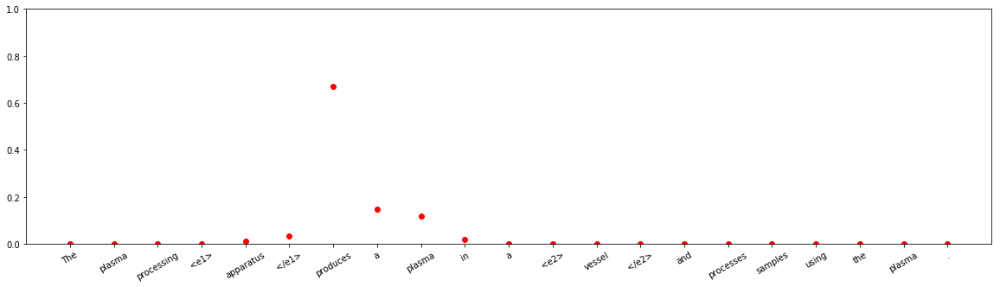


input sentence: Those models were chain driven and the <e1> mechanism </e1> was enclosed in a very visible oil <e2> bath </e2> .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 2.048875e-09
Entity-Destination(e1,e2) 	:	 7.555065e-06
Cause-Effect(e2,e1) 	:	 2.1192633e-12
Member-Collection(e2,e1) 	:	 3.76205e-10
Entity-Origin(e1,e2) 	:	 2.9220143e-07
Message-Topic(e1,e2) 	:	 5.841259e-12
Component-Whole(e1,e2) 	:	 0.026663912
Component-Whole(e2,e1) 	:	 2.532587e-05
Instrument-Agency(e2,e1) 	:	 1.0918045e-12
Content-Container(e1,e2) 	:	 0.9732892
Product-Producer(e2,e1) 	:	 7.615482e-10
Cause-Effect(e1,e2) 	:	 7.644263e-11
Product-Producer(e1,e2) 	:	 3.0952258e-11
Content-Container(e2,e1) 	:	 1.3708928e-05
Entity-Origin(e2,e1) 	:	 2.952412e-09
Message-Topic(e2,e1) 	:	 4.698972e-10
Instrument-Agency(e1,e2) 	:	 2.9260262e-08
Member-Collection(e1,e2) 	:	 8.0537454e-10
Entity-Destination(e2,e1) 	:	 1.1873787e-11



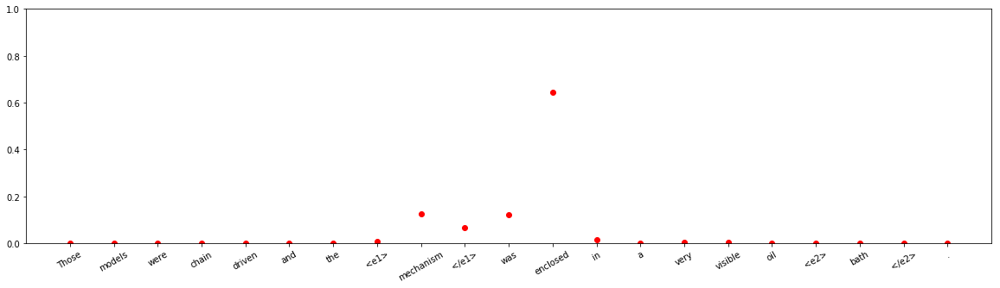





input sentence: In 1993 the <e1> party </e1> won the governorship with a <e2> pledge </e2> to cut income taxes 30 % .
answer label:    Product-Producer(e2,e1)
wrong label:    Other
Other 	:	 0.99999905
Entity-Destination(e1,e2) 	:	 4.4779894e-13
Cause-Effect(e2,e1) 	:	 7.486083e-14
Member-Collection(e2,e1) 	:	 3.463615e-14
Entity-Origin(e1,e2) 	:	 1.4261468e-14
Message-Topic(e1,e2) 	:	 4.4330867e-16
Component-Whole(e1,e2) 	:	 4.4251435e-13
Component-Whole(e2,e1) 	:	 2.6470631e-11
Instrument-Agency(e2,e1) 	:	 1.2224154e-07
Content-Container(e1,e2) 	:	 5.0555804e-10
Product-Producer(e2,e1) 	:	 8.919342e-07
Cause-Effect(e1,e2) 	:	 2.042923e-14
Product-Producer(e1,e2) 	:	 1.1954921e-14
Content-Container(e2,e1) 	:	 1.3044054e-09
Entity-Origin(e2,e1) 	:	 4.0674593e-14
Message-Topic(e2,e1) 	:	 4.1012437e-11
Instrument-Agency(e1,e2) 	:	 4.3340553e-12
Member-Collection(e1,e2) 	:	 4.440176e-13
Entity-Destination(e2,e1) 	:	 4.7674016e-14



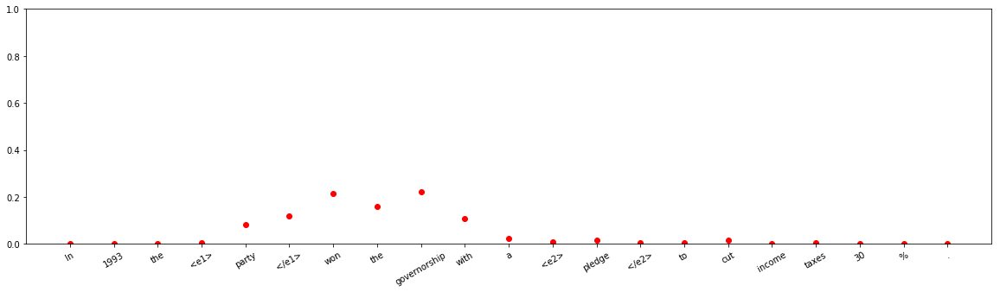


input sentence: The <e1> song </e1> is featured in the 1990 film Riff-Raff , performed by the main female <e2> character </e2> .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 0.0986062
Entity-Destination(e1,e2) 	:	 1.9047595e-09
Cause-Effect(e2,e1) 	:	 0.00071473053
Member-Collection(e2,e1) 	:	 3.4567645e-06
Entity-Origin(e1,e2) 	:	 0.00084899785
Message-Topic(e1,e2) 	:	 7.144814e-05
Component-Whole(e1,e2) 	:	 0.00043395662
Component-Whole(e2,e1) 	:	 3.6183235e-05
Instrument-Agency(e2,e1) 	:	 5.9823844e-07
Content-Container(e1,e2) 	:	 4.631396e-06
Product-Producer(e2,e1) 	:	 5.445182e-06
Cause-Effect(e1,e2) 	:	 8.791246e-07
Product-Producer(e1,e2) 	:	 0.8902625
Content-Container(e2,e1) 	:	 1.7867817e-08
Entity-Origin(e2,e1) 	:	 2.6655794e-08
Message-Topic(e2,e1) 	:	 0.0073293005
Instrument-Agency(e1,e2) 	:	 0.0016243325
Member-Collection(e1,e2) 	:	 5.7455327e-05
Entity-Destination(e2,e1) 	:	 3.3014036e-08



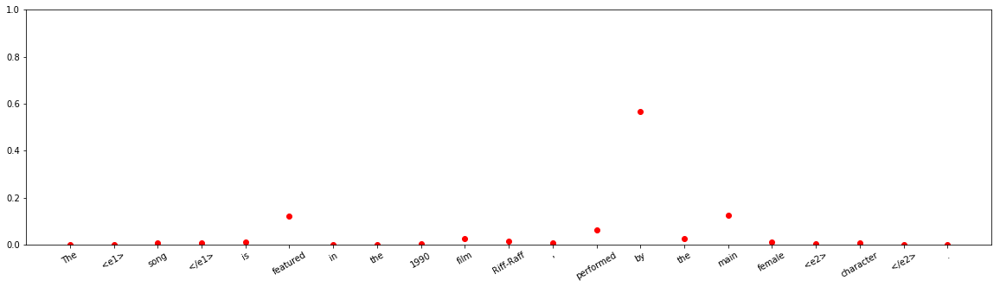




input sentence: During her <e1> talk </e1> she related some of the <e2> tricks </e2> that Orville liked to play on people .
answer label:    Message-Topic(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 8.129507e-06
Entity-Destination(e1,e2) 	:	 1.0924912e-09
Cause-Effect(e2,e1) 	:	 1.5971738e-05
Member-Collection(e2,e1) 	:	 5.6230733e-06
Entity-Origin(e1,e2) 	:	 1.6893818e-08
Message-Topic(e1,e2) 	:	 0.19802736
Component-Whole(e1,e2) 	:	 0.00056643394
Component-Whole(e2,e1) 	:	 1.4325292e-05
Instrument-Agency(e2,e1) 	:	 0.0008130349
Content-Container(e1,e2) 	:	 2.292853e-10
Product-Producer(e2,e1) 	:	 2.1302292e-06
Cause-Effect(e1,e2) 	:	 0.00035727132
Product-Producer(e1,e2) 	:	 8.389517e-06
Content-Container(e2,e1) 	:	 7.3366647e-07
Entity-Origin(e2,e1) 	:	 1.9009282e-07
Message-Topic(e2,e1) 	:	 0.8001598
Instrument-Agency(e1,e2) 	:	 2.0650465e-05
Member-Collection(e1,e2) 	:	 2.482383e-10
Entity-Destination(e2,e1) 	:	 1.1367264e-09



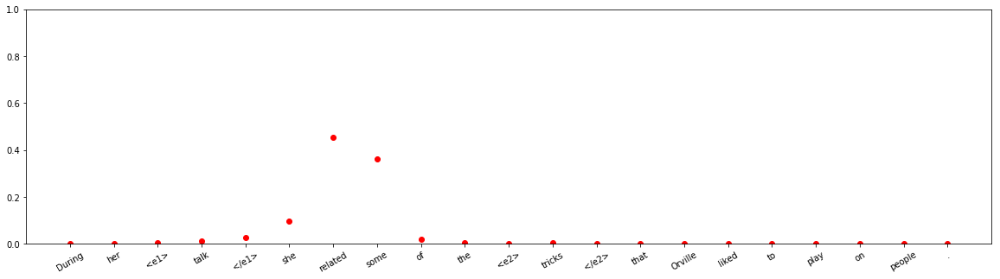



input sentence: The team used the newly-developed nanoparticle to build therapies for <e1> treatment </e1> of individuals with cardiovascular <e2> disease </e2> .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.07210204
Entity-Destination(e1,e2) 	:	 1.9345573e-06
Cause-Effect(e2,e1) 	:	 0.002049225
Member-Collection(e2,e1) 	:	 0.6179057
Entity-Origin(e1,e2) 	:	 1.8378094e-05
Message-Topic(e1,e2) 	:	 0.103452675
Component-Whole(e1,e2) 	:	 0.0458435
Component-Whole(e2,e1) 	:	 0.09792742
Instrument-Agency(e2,e1) 	:	 5.7043326e-06
Content-Container(e1,e2) 	:	 6.681489e-07
Product-Producer(e2,e1) 	:	 2.683762e-08
Cause-Effect(e1,e2) 	:	 0.05305766
Product-Producer(e1,e2) 	:	 0.00011915031
Content-Container(e2,e1) 	:	 2.3230248e-05
Entity-Origin(e2,e1) 	:	 3.9307273e-05
Message-Topic(e2,e1) 	:	 0.003850058
Instrument-Agency(e1,e2) 	:	 0.0032601515
Member-Collection(e1,e2) 	:	 0.00034326108
Entity-Destination(e2,e1) 	:	 1.2694743e-07



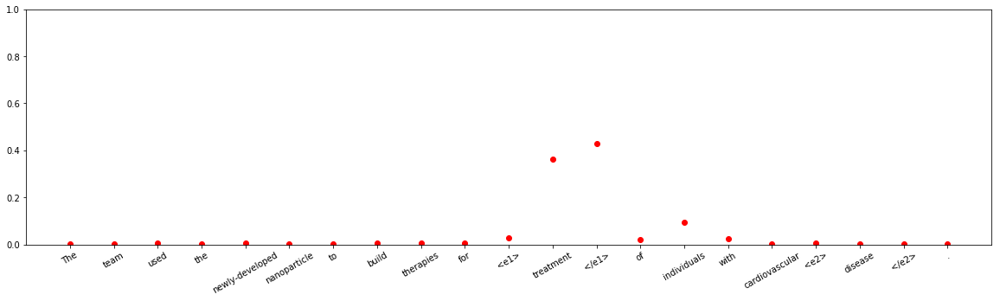






input sentence: The 400 V <e1> power supply </e1> ( unstabilized ) was derived from a conventional <e2> power-pack </e2> with n-filter .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 1.0221061e-16
Entity-Destination(e1,e2) 	:	 5.003559e-11
Cause-Effect(e2,e1) 	:	 1.2829528e-08
Member-Collection(e2,e1) 	:	 2.4664073e-13
Entity-Origin(e1,e2) 	:	 1.0
Message-Topic(e1,e2) 	:	 2.660703e-18
Component-Whole(e1,e2) 	:	 6.0414524e-16
Component-Whole(e2,e1) 	:	 7.209468e-15
Instrument-Agency(e2,e1) 	:	 4.436105e-11
Content-Container(e1,e2) 	:	 1.760372e-11
Product-Producer(e2,e1) 	:	 2.737976e-12
Cause-Effect(e1,e2) 	:	 9.363143e-17
Product-Producer(e1,e2) 	:	 2.4425983e-08
Content-Container(e2,e1) 	:	 7.946863e-14
Entity-Origin(e2,e1) 	:	 2.3902696e-12
Message-Topic(e2,e1) 	:	 1.8009907e-15
Instrument-Agency(e1,e2) 	:	 1.39949e-10
Member-Collection(e1,e2) 	:	 4.279657e-11
Entity-Destination(e2,e1) 	:	 1.5255685e-15



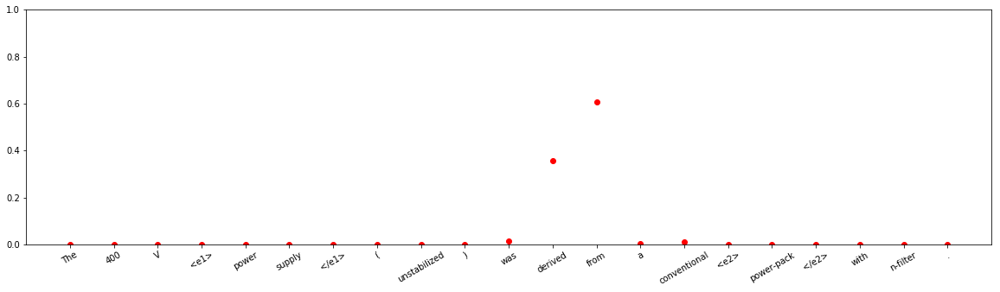





input sentence: Then the <e1> driver </e1> turned the car into a dark and narrow <e2> street </e2> and reduced his speed .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.83989793
Entity-Destination(e1,e2) 	:	 1.6906728e-05
Cause-Effect(e2,e1) 	:	 1.01538396e-10
Member-Collection(e2,e1) 	:	 9.379032e-13
Entity-Origin(e1,e2) 	:	 3.6108208e-06
Message-Topic(e1,e2) 	:	 8.7126154e-11
Component-Whole(e1,e2) 	:	 1.4159102e-11
Component-Whole(e2,e1) 	:	 3.2966544e-13
Instrument-Agency(e2,e1) 	:	 0.0023343202
Content-Container(e1,e2) 	:	 9.437039e-07
Product-Producer(e2,e1) 	:	 0.15768336
Cause-Effect(e1,e2) 	:	 1.2618469e-07
Product-Producer(e1,e2) 	:	 4.1550634e-11
Content-Container(e2,e1) 	:	 5.355938e-10
Entity-Origin(e2,e1) 	:	 1.3090445e-09
Message-Topic(e2,e1) 	:	 9.473183e-10
Instrument-Agency(e1,e2) 	:	 1.0600906e-09
Member-Collection(e1,e2) 	:	 6.297615e-05
Entity-Destination(e2,e1) 	:	 7.7896966e-13



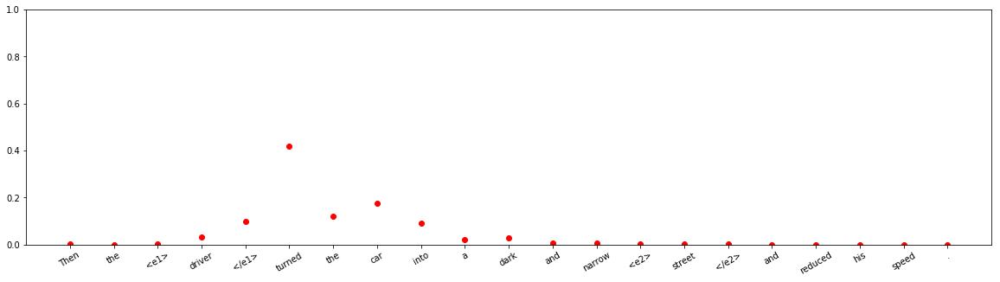




input sentence: The <e1> workpackage </e1> comprise of the following <e2> tasks </e2> : Task 2.1 Compilation of long term data sets .
answer label:    Component-Whole(e2,e1)
wrong label:    Component-Whole(e1,e2)
Other 	:	 2.1893438e-09
Entity-Destination(e1,e2) 	:	 1.171808e-10
Cause-Effect(e2,e1) 	:	 6.7192266e-11
Member-Collection(e2,e1) 	:	 0.0123107005
Entity-Origin(e1,e2) 	:	 3.2198876e-08
Message-Topic(e1,e2) 	:	 1.1005953e-05
Component-Whole(e1,e2) 	:	 0.9831275
Component-Whole(e2,e1) 	:	 0.0032017743
Instrument-Agency(e2,e1) 	:	 2.038767e-09
Content-Container(e1,e2) 	:	 7.998684e-09
Product-Producer(e2,e1) 	:	 0.0012276811
Cause-Effect(e1,e2) 	:	 1.1723314e-06
Product-Producer(e1,e2) 	:	 1.4399679e-08
Content-Container(e2,e1) 	:	 2.165807e-05
Entity-Origin(e2,e1) 	:	 1.12903564e-07
Message-Topic(e2,e1) 	:	 8.938587e-05
Instrument-Agency(e1,e2) 	:	 2.4140077e-06
Member-Collection(e1,e2) 	:	 6.544142e-06
Entity-Destination(e2,e1) 	:	 1.5574153e-09



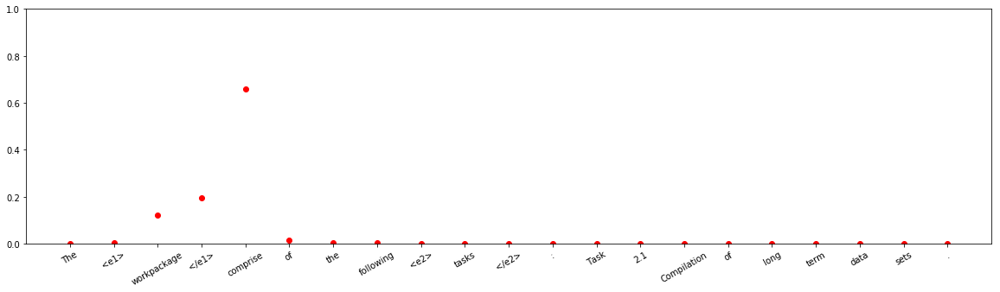





input sentence: The major phytochemical <e1> constitutes </e1> of the <e2> plant </e2> are elephantopin , triterpenes , stigmasterol epifriedelinol and lupeol .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 0.00048808803
Entity-Destination(e1,e2) 	:	 5.55997e-08
Cause-Effect(e2,e1) 	:	 3.8130188e-06
Member-Collection(e2,e1) 	:	 0.014826404
Entity-Origin(e1,e2) 	:	 0.00068014616
Message-Topic(e1,e2) 	:	 0.009614696
Component-Whole(e1,e2) 	:	 0.16636488
Component-Whole(e2,e1) 	:	 1.6722906e-07
Instrument-Agency(e2,e1) 	:	 3.721164e-08
Content-Container(e1,e2) 	:	 4.6346897e-05
Product-Producer(e2,e1) 	:	 2.1101187e-05
Cause-Effect(e1,e2) 	:	 1.1729791e-05
Product-Producer(e1,e2) 	:	 0.63673294
Content-Container(e2,e1) 	:	 2.8282104e-05
Entity-Origin(e2,e1) 	:	 1.6749562e-05
Message-Topic(e2,e1) 	:	 8.142535e-06
Instrument-Agency(e1,e2) 	:	 0.09385552
Member-Collection(e1,e2) 	:	 0.07730092
Entity-Destination(e2,e1) 	:	 4.1837516e-09



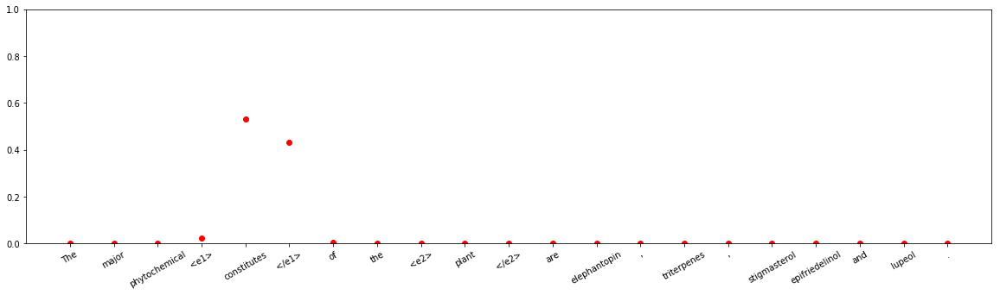


input sentence: And so this <e1> book </e1> involves the reader in a true educational <e2> process </e2> which is also fun .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 0.042121455
Entity-Destination(e1,e2) 	:	 1.3014177e-08
Cause-Effect(e2,e1) 	:	 3.4436747e-09
Member-Collection(e2,e1) 	:	 4.6768346e-08
Entity-Origin(e1,e2) 	:	 1.171818e-07
Message-Topic(e1,e2) 	:	 0.89432794
Component-Whole(e1,e2) 	:	 0.009820181
Component-Whole(e2,e1) 	:	 0.052079566
Instrument-Agency(e2,e1) 	:	 9.301968e-05
Content-Container(e1,e2) 	:	 0.00069831125
Product-Producer(e2,e1) 	:	 1.0193911e-07
Cause-Effect(e1,e2) 	:	 8.3859376e-08
Product-Producer(e1,e2) 	:	 2.0412579e-05
Content-Container(e2,e1) 	:	 2.8629488e-06
Entity-Origin(e2,e1) 	:	 6.640064e-08
Message-Topic(e2,e1) 	:	 0.00011136672
Instrument-Agency(e1,e2) 	:	 0.0007244294
Member-Collection(e1,e2) 	:	 1.6781572e-08
Entity-Destination(e2,e1) 	:	 5.444854e-09



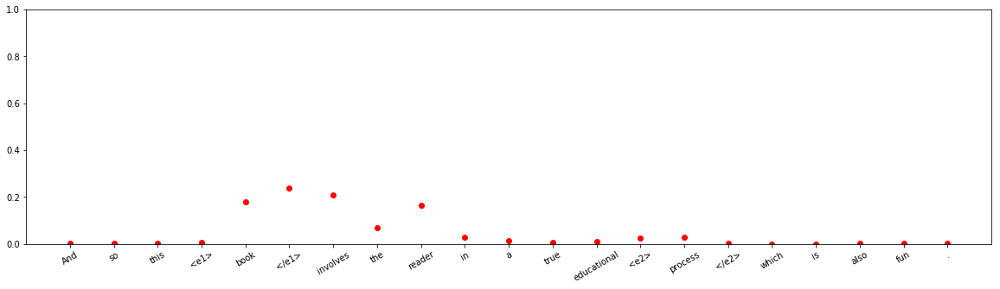













input sentence: The Organic Act of 1868 made several specific references to the powers and duties of the <e1> president </e1> of the <e2> university </e2> after stating that he be elected to office by the Board of Regents .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.11270329
Entity-Destination(e1,e2) 	:	 4.859948e-12
Cause-Effect(e2,e1) 	:	 2.0541103e-08
Member-Collection(e2,e1) 	:	 2.9667235e-05
Entity-Origin(e1,e2) 	:	 1.372527e-07
Message-Topic(e1,e2) 	:	 2.0037358e-07
Component-Whole(e1,e2) 	:	 3.5213427e-06
Component-Whole(e2,e1) 	:	 1.8152818e-12
Instrument-Agency(e2,e1) 	:	 0.000349735
Content-Container(e1,e2) 	:	 6.1524945e-09
Product-Producer(e2,e1) 	:	 0.0026954089
Cause-Effect(e1,e2) 	:	 8.381532e-10
Product-Producer(e1,e2) 	:	 1.0428743e-06
Content-Container(e2,e1) 	:	 3.4864997e-10
Entity-Origin(e2,e1) 	:	 4.8804498e-08
Message-Topic(e2,e1) 	:	 0.00016165237
Instrument-Agency(e1,e2) 	:	 4.712929e-05
Member-Collection(e1,e2) 	:	 

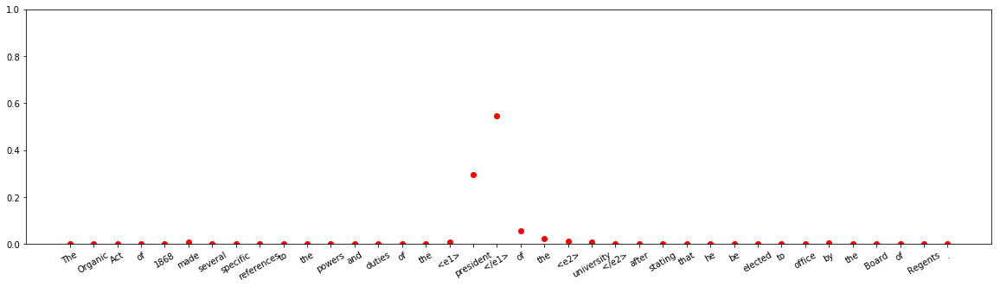



input sentence: The <e1> hall </e1> has a 'vineyard-style ' seating <e2> arrangement </e2> similar to that of Walt Disney Hall , in Los Angeles ; here the audience will be arrayed on raised terraces surrounding an orchestra platform .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.8921877e-11
Entity-Destination(e1,e2) 	:	 2.0616696e-11
Cause-Effect(e2,e1) 	:	 6.9993525e-11
Member-Collection(e2,e1) 	:	 6.4264656e-09
Entity-Origin(e1,e2) 	:	 7.2628197e-12
Message-Topic(e1,e2) 	:	 1.0614361e-12
Component-Whole(e1,e2) 	:	 1.9081317e-07
Component-Whole(e2,e1) 	:	 0.99997854
Instrument-Agency(e2,e1) 	:	 5.3045075e-09
Content-Container(e1,e2) 	:	 2.7089916e-10
Product-Producer(e2,e1) 	:	 2.017003e-06
Cause-Effect(e1,e2) 	:	 9.935959e-09
Product-Producer(e1,e2) 	:	 4.5827175e-12
Content-Container(e2,e1) 	:	 1.920548e-05
Entity-Origin(e2,e1) 	:	 4.3390287e-12
Message-Topic(e2,e1) 	:	 1.6202698e-12
Instrument-Agency(e1,e2) 	:	 9.980537e-09
Member-Collection(e1,e2) 	:

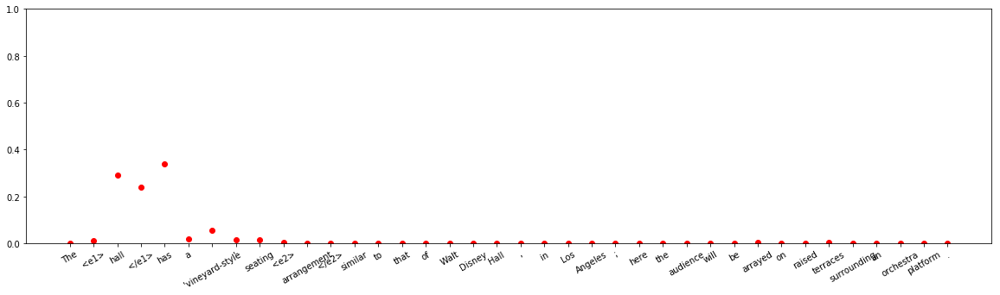













input sentence: However , after five years the water pump was stolen , leaving the villagers once again dependant on a <e1> pace </e1> of <e2> donkeys </e2> to ferry buckets of water to them from an old well .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.2790509e-13
Entity-Destination(e1,e2) 	:	 9.489851e-13
Cause-Effect(e2,e1) 	:	 1.6613343e-10
Member-Collection(e2,e1) 	:	 0.9999987
Entity-Origin(e1,e2) 	:	 3.5887558e-12
Message-Topic(e1,e2) 	:	 2.1318116e-11
Component-Whole(e1,e2) 	:	 3.6023518e-10
Component-Whole(e2,e1) 	:	 1.0908689e-06
Instrument-Agency(e2,e1) 	:	 2.1436818e-10
Content-Container(e1,e2) 	:	 2.1064396e-12
Product-Producer(e2,e1) 	:	 1.3935064e-09
Cause-Effect(e1,e2) 	:	 1.3124052e-10
Product-Producer(e1,e2) 	:	 5.3507074e-09
Content-Container(e2,e1) 	:	 7.071085e-10
Entity-Origin(e2,e1) 	:	 1.2323896e-10
Message-Topic(e2,e1) 	:	 2.8334262e-07
Instrument-Agency(e1,e2) 	:	 1.9234855e-08
Member-Collection(e1,e2) 	:	 1.5195574e

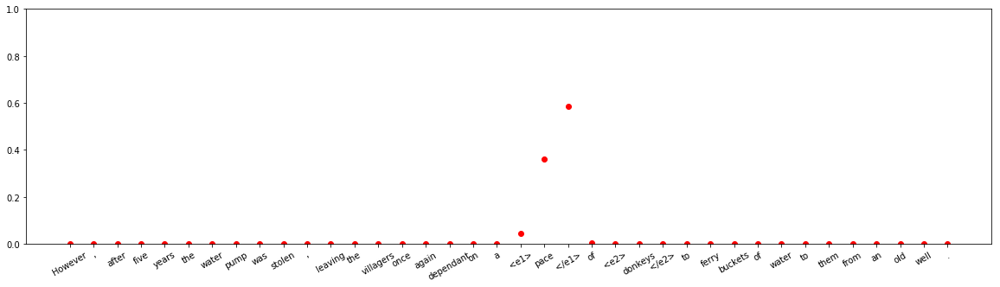







input sentence: The <e1> room </e1> was filled with huge Jack-the-Dripper <e2> canvases </e2> .
answer label:    Other
wrong label:    Content-Container(e2,e1)
Other 	:	 1.9933339e-13
Entity-Destination(e1,e2) 	:	 7.5342156e-11
Cause-Effect(e2,e1) 	:	 7.417553e-14
Member-Collection(e2,e1) 	:	 2.0257405e-09
Entity-Origin(e1,e2) 	:	 8.254674e-09
Message-Topic(e1,e2) 	:	 1.01738635e-14
Component-Whole(e1,e2) 	:	 2.524573e-09
Component-Whole(e2,e1) 	:	 0.0025578134
Instrument-Agency(e2,e1) 	:	 1.0849798e-12
Content-Container(e1,e2) 	:	 2.1631642e-07
Product-Producer(e2,e1) 	:	 5.801767e-07
Cause-Effect(e1,e2) 	:	 1.1891679e-11
Product-Producer(e1,e2) 	:	 1.526587e-11
Content-Container(e2,e1) 	:	 0.9974414
Entity-Origin(e2,e1) 	:	 1.260799e-09
Message-Topic(e2,e1) 	:	 7.893739e-12
Instrument-Agency(e1,e2) 	:	 3.653091e-12
Member-Collection(e1,e2) 	:	 2.9127015e-17
Entity-Destination(e2,e1) 	:	 1.4858843e-13



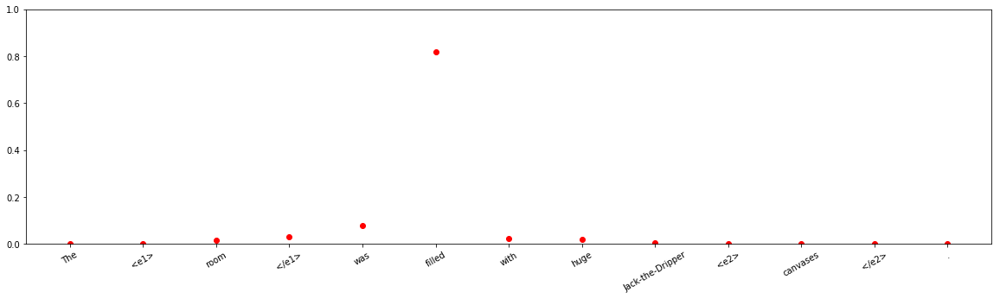


input sentence: People now post their <e1> opinions </e1> to this <e2> blog </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 3.115113e-08
Entity-Destination(e1,e2) 	:	 0.9992136
Cause-Effect(e2,e1) 	:	 9.979233e-14
Member-Collection(e2,e1) 	:	 2.5184962e-10
Entity-Origin(e1,e2) 	:	 1.0581587e-09
Message-Topic(e1,e2) 	:	 0.0007417509
Component-Whole(e1,e2) 	:	 4.3070617e-05
Component-Whole(e2,e1) 	:	 3.1917362e-12
Instrument-Agency(e2,e1) 	:	 9.327118e-12
Content-Container(e1,e2) 	:	 5.7482192e-09
Product-Producer(e2,e1) 	:	 9.162199e-09
Cause-Effect(e1,e2) 	:	 7.2262825e-12
Product-Producer(e1,e2) 	:	 2.2881361e-10
Content-Container(e2,e1) 	:	 1.6473715e-11
Entity-Origin(e2,e1) 	:	 1.5449022e-11
Message-Topic(e2,e1) 	:	 1.4384008e-06
Instrument-Agency(e1,e2) 	:	 1.9260753e-11
Member-Collection(e1,e2) 	:	 1.6060521e-07
Entity-Destination(e2,e1) 	:	 3.961081e-12



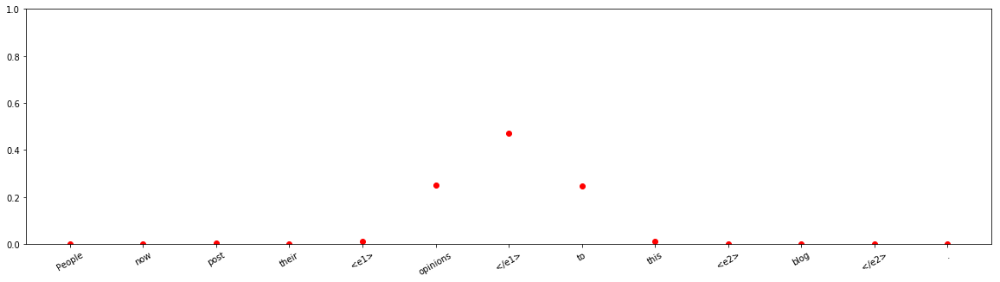






input sentence: He invested <e1> dollars </e1> into real estate investment <e2> trusts </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.99982506
Entity-Destination(e1,e2) 	:	 0.00017494205
Cause-Effect(e2,e1) 	:	 2.7722208e-10
Member-Collection(e2,e1) 	:	 4.838411e-11
Entity-Origin(e1,e2) 	:	 2.3202952e-11
Message-Topic(e1,e2) 	:	 1.905791e-09
Component-Whole(e1,e2) 	:	 2.7749107e-12
Component-Whole(e2,e1) 	:	 6.804635e-13
Instrument-Agency(e2,e1) 	:	 8.25888e-14
Content-Container(e1,e2) 	:	 1.769077e-11
Product-Producer(e2,e1) 	:	 1.4800772e-11
Cause-Effect(e1,e2) 	:	 5.936836e-11
Product-Producer(e1,e2) 	:	 9.7283105e-11
Content-Container(e2,e1) 	:	 1.0502459e-09
Entity-Origin(e2,e1) 	:	 1.8099783e-09
Message-Topic(e2,e1) 	:	 5.566667e-09
Instrument-Agency(e1,e2) 	:	 3.501252e-08
Member-Collection(e1,e2) 	:	 2.6426897e-10
Entity-Destination(e2,e1) 	:	 2.363896e-13



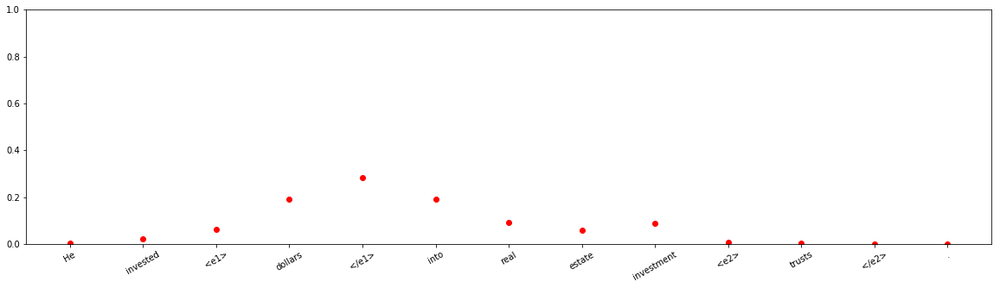







input sentence: The <e1> yeast </e1> is an ingredient for making <e2> beer </e2> .
answer label:    Other
wrong label:    Entity-Origin(e2,e1)
Other 	:	 1.8794125e-07
Entity-Destination(e1,e2) 	:	 3.419852e-08
Cause-Effect(e2,e1) 	:	 2.2651292e-10
Member-Collection(e2,e1) 	:	 6.780366e-10
Entity-Origin(e1,e2) 	:	 5.557666e-07
Message-Topic(e1,e2) 	:	 8.683034e-09
Component-Whole(e1,e2) 	:	 6.460496e-11
Component-Whole(e2,e1) 	:	 3.7974315e-10
Instrument-Agency(e2,e1) 	:	 5.225589e-10
Content-Container(e1,e2) 	:	 4.4333922e-07
Product-Producer(e2,e1) 	:	 5.502137e-06
Cause-Effect(e1,e2) 	:	 1.1156712e-06
Product-Producer(e1,e2) 	:	 9.149167e-09
Content-Container(e2,e1) 	:	 3.1144555e-06
Entity-Origin(e2,e1) 	:	 0.99998903
Message-Topic(e2,e1) 	:	 2.6059425e-08
Instrument-Agency(e1,e2) 	:	 4.877778e-09
Member-Collection(e1,e2) 	:	 3.46179e-11
Entity-Destination(e2,e1) 	:	 1.8246979e-11



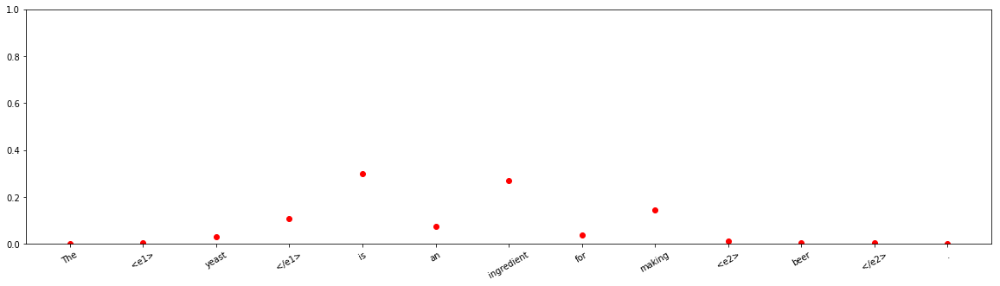









input sentence: I owed some back <e1> taxes </e1> from pervious <e2> years </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Other
Other 	:	 0.9997522
Entity-Destination(e1,e2) 	:	 1.03506544e-10
Cause-Effect(e2,e1) 	:	 9.992554e-05
Member-Collection(e2,e1) 	:	 2.880473e-12
Entity-Origin(e1,e2) 	:	 2.1632583e-05
Message-Topic(e1,e2) 	:	 1.4669873e-12
Component-Whole(e1,e2) 	:	 2.1081288e-10
Component-Whole(e2,e1) 	:	 4.8228777e-10
Instrument-Agency(e2,e1) 	:	 1.0457809e-11
Content-Container(e1,e2) 	:	 1.4687402e-08
Product-Producer(e2,e1) 	:	 1.9516034e-12
Cause-Effect(e1,e2) 	:	 7.2599815e-13
Product-Producer(e1,e2) 	:	 4.8134953e-06
Content-Container(e2,e1) 	:	 5.5473426e-13
Entity-Origin(e2,e1) 	:	 5.9093613e-10
Message-Topic(e2,e1) 	:	 0.000121386845
Instrument-Agency(e1,e2) 	:	 5.391406e-09
Member-Collection(e1,e2) 	:	 4.5661913e-10
Entity-Destination(e2,e1) 	:	 6.8839543e-12



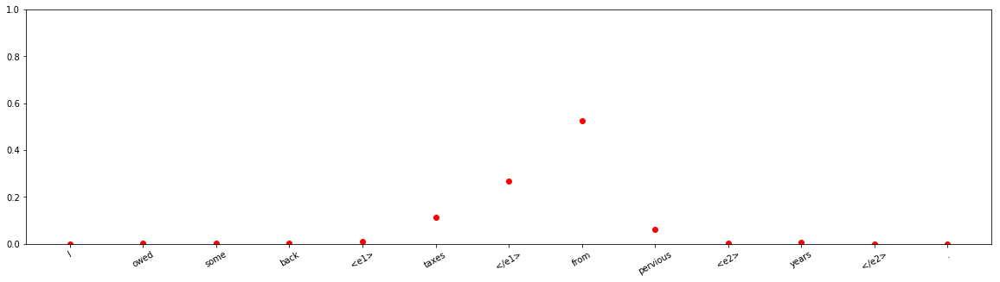





input sentence: The commander has dragged <e1> soldiers </e1> into unnecessary <e2> battles </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 0.014442073
Entity-Destination(e1,e2) 	:	 0.98526263
Cause-Effect(e2,e1) 	:	 2.8256033e-09
Member-Collection(e2,e1) 	:	 6.557567e-06
Entity-Origin(e1,e2) 	:	 5.4347904e-08
Message-Topic(e1,e2) 	:	 3.2592482e-07
Component-Whole(e1,e2) 	:	 2.3141672e-08
Component-Whole(e2,e1) 	:	 1.5809454e-11
Instrument-Agency(e2,e1) 	:	 7.156341e-10
Content-Container(e1,e2) 	:	 2.7646811e-08
Product-Producer(e2,e1) 	:	 3.3891178e-07
Cause-Effect(e1,e2) 	:	 6.27723e-08
Product-Producer(e1,e2) 	:	 1.2806275e-08
Content-Container(e2,e1) 	:	 2.1142138e-07
Entity-Origin(e2,e1) 	:	 3.1957913e-07
Message-Topic(e2,e1) 	:	 3.7749448e-08
Instrument-Agency(e1,e2) 	:	 3.420874e-06
Member-Collection(e1,e2) 	:	 0.00028391735
Entity-Destination(e2,e1) 	:	 3.393173e-11



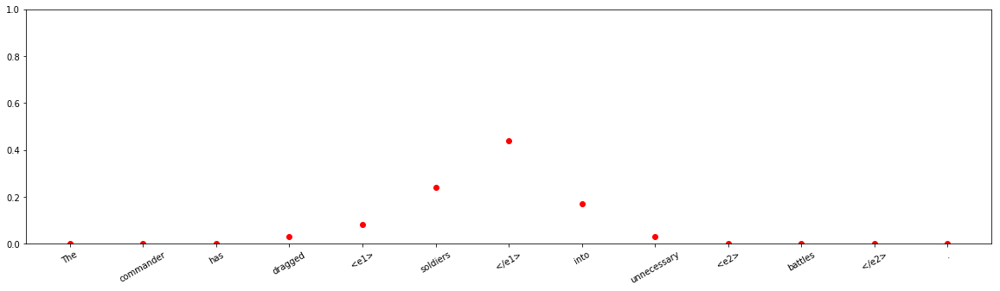














input sentence: An <e1> ossicone </e1> grows from the basal <e2> cartilage </e2> upward .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 1.299937e-07
Entity-Destination(e1,e2) 	:	 9.416926e-13
Cause-Effect(e2,e1) 	:	 3.7650402e-06
Member-Collection(e2,e1) 	:	 9.840734e-13
Entity-Origin(e1,e2) 	:	 0.99999595
Message-Topic(e1,e2) 	:	 3.2746963e-16
Component-Whole(e1,e2) 	:	 2.1517975e-08
Component-Whole(e2,e1) 	:	 1.7593649e-07
Instrument-Agency(e2,e1) 	:	 8.24337e-11
Content-Container(e1,e2) 	:	 1.1838322e-10
Product-Producer(e2,e1) 	:	 2.3591998e-10
Cause-Effect(e1,e2) 	:	 9.862451e-14
Product-Producer(e1,e2) 	:	 2.122441e-08
Content-Container(e2,e1) 	:	 2.4488398e-15
Entity-Origin(e2,e1) 	:	 3.5039552e-12
Message-Topic(e2,e1) 	:	 3.2049e-10
Instrument-Agency(e1,e2) 	:	 2.1337786e-11
Member-Collection(e1,e2) 	:	 5.180424e-09
Entity-Destination(e2,e1) 	:	 5.82346e-14



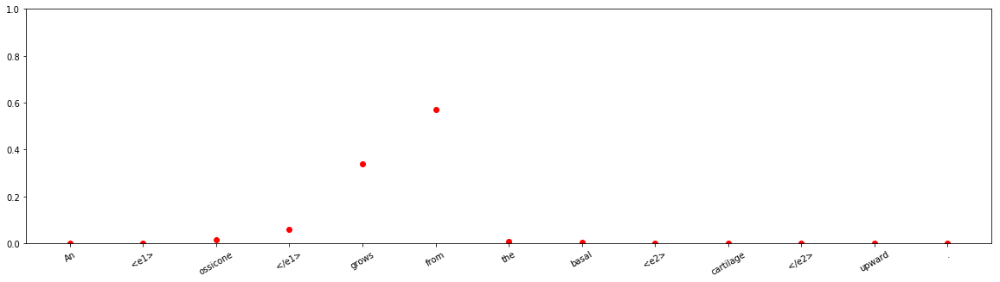




input sentence: You have poured <e1> balm </e1> into my anxious <e2> soul </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 1.2866623e-09
Entity-Destination(e1,e2) 	:	 1.0
Cause-Effect(e2,e1) 	:	 1.1588317e-13
Member-Collection(e2,e1) 	:	 8.568447e-15
Entity-Origin(e1,e2) 	:	 2.1613539e-11
Message-Topic(e1,e2) 	:	 6.086358e-14
Component-Whole(e1,e2) 	:	 1.9323304e-13
Component-Whole(e2,e1) 	:	 2.217484e-19
Instrument-Agency(e2,e1) 	:	 3.07791e-18
Content-Container(e1,e2) 	:	 4.2592815e-15
Product-Producer(e2,e1) 	:	 8.2936125e-16
Cause-Effect(e1,e2) 	:	 2.743003e-13
Product-Producer(e1,e2) 	:	 2.491687e-15
Content-Container(e2,e1) 	:	 5.1094377e-13
Entity-Origin(e2,e1) 	:	 1.9323286e-11
Message-Topic(e2,e1) 	:	 2.146623e-17
Instrument-Agency(e1,e2) 	:	 3.9267556e-14
Member-Collection(e1,e2) 	:	 8.122476e-11
Entity-Destination(e2,e1) 	:	 9.492179e-17



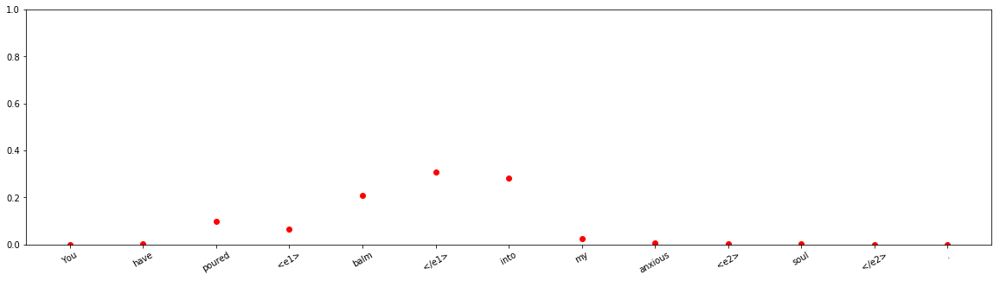















input sentence: Three different <e1> storylines </e1> are narrated in alternating <e2> chapters </e2> .
answer label:    Message-Topic(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 7.4240954e-11
Entity-Destination(e1,e2) 	:	 5.6739457e-14
Cause-Effect(e2,e1) 	:	 4.672598e-13
Member-Collection(e2,e1) 	:	 5.740448e-09
Entity-Origin(e1,e2) 	:	 9.4583406e-08
Message-Topic(e1,e2) 	:	 4.113689e-08
Component-Whole(e1,e2) 	:	 3.6595306e-08
Component-Whole(e2,e1) 	:	 0.99676514
Instrument-Agency(e2,e1) 	:	 1.3407673e-11
Content-Container(e1,e2) 	:	 2.253575e-07
Product-Producer(e2,e1) 	:	 1.6836618e-09
Cause-Effect(e1,e2) 	:	 4.1690228e-11
Product-Producer(e1,e2) 	:	 4.8929455e-10
Content-Container(e2,e1) 	:	 3.1355132e-10
Entity-Origin(e2,e1) 	:	 1.404595e-11
Message-Topic(e2,e1) 	:	 0.0032344675
Instrument-Agency(e1,e2) 	:	 1.0439363e-10
Member-Collection(e1,e2) 	:	 3.057219e-13
Entity-Destination(e2,e1) 	:	 9.106898e-12



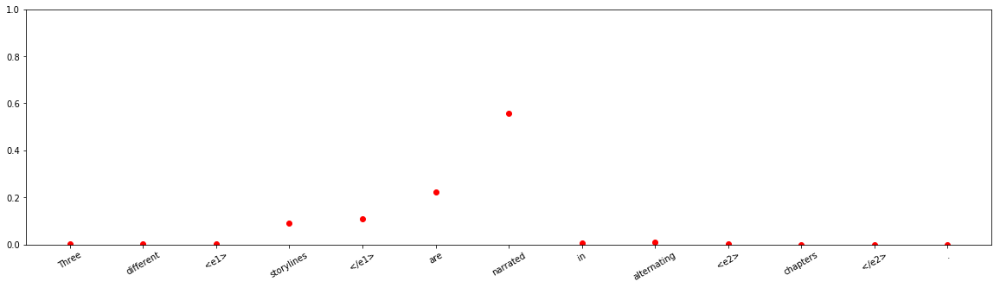



input sentence: Climate change <e1> talks </e1> have been moving into <e2> overtime </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9897648
Entity-Destination(e1,e2) 	:	 0.010235037
Cause-Effect(e2,e1) 	:	 1.920171e-12
Member-Collection(e2,e1) 	:	 1.5061556e-13
Entity-Origin(e1,e2) 	:	 2.6966905e-12
Message-Topic(e1,e2) 	:	 1.1684429e-08
Component-Whole(e1,e2) 	:	 4.3078614e-08
Component-Whole(e2,e1) 	:	 7.6826917e-10
Instrument-Agency(e2,e1) 	:	 1.6551432e-11
Content-Container(e1,e2) 	:	 6.088271e-08
Product-Producer(e2,e1) 	:	 2.0940708e-10
Cause-Effect(e1,e2) 	:	 2.049994e-11
Product-Producer(e1,e2) 	:	 1.8380347e-10
Content-Container(e2,e1) 	:	 1.2043934e-12
Entity-Origin(e2,e1) 	:	 4.1995404e-11
Message-Topic(e2,e1) 	:	 1.6618426e-08
Instrument-Agency(e1,e2) 	:	 3.364121e-09
Member-Collection(e1,e2) 	:	 1.524809e-08
Entity-Destination(e2,e1) 	:	 2.4813823e-11



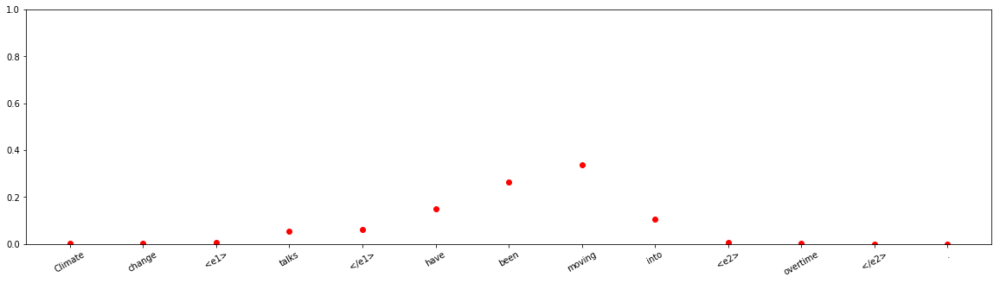









input sentence: The <e1> archives </e1> also publish historical and scientific <e2> studies </e2> .
answer label:    Product-Producer(e2,e1)
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.3073654e-13
Entity-Destination(e1,e2) 	:	 1.2437958e-12
Cause-Effect(e2,e1) 	:	 6.955761e-17
Member-Collection(e2,e1) 	:	 2.9362694e-09
Entity-Origin(e1,e2) 	:	 1.1286166e-11
Message-Topic(e1,e2) 	:	 0.9999999
Component-Whole(e1,e2) 	:	 9.817167e-10
Component-Whole(e2,e1) 	:	 9.2043795e-10
Instrument-Agency(e2,e1) 	:	 5.736485e-12
Content-Container(e1,e2) 	:	 2.0798732e-12
Product-Producer(e2,e1) 	:	 1.1876972e-07
Cause-Effect(e1,e2) 	:	 2.5324576e-10
Product-Producer(e1,e2) 	:	 6.35027e-11
Content-Container(e2,e1) 	:	 1.1966619e-09
Entity-Origin(e2,e1) 	:	 2.4469708e-09
Message-Topic(e2,e1) 	:	 2.1307644e-08
Instrument-Agency(e1,e2) 	:	 4.7371993e-12
Member-Collection(e1,e2) 	:	 2.973971e-13
Entity-Destination(e2,e1) 	:	 1.1361707e-13



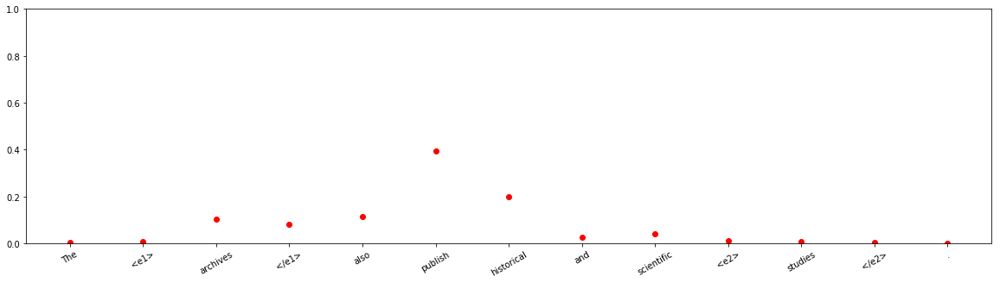


input sentence: The <e1> files </e1> reveal militarist <e2> plot </e2> to kill Yoshida .
answer label:    Message-Topic(e1,e2)
wrong label:    Product-Producer(e2,e1)
Other 	:	 8.256254e-11
Entity-Destination(e1,e2) 	:	 1.2868065e-07
Cause-Effect(e2,e1) 	:	 1.1464958e-12
Member-Collection(e2,e1) 	:	 5.037268e-07
Entity-Origin(e1,e2) 	:	 2.9062976e-05
Message-Topic(e1,e2) 	:	 0.0075451736
Component-Whole(e1,e2) 	:	 1.2767511e-09
Component-Whole(e2,e1) 	:	 4.6775625e-08
Instrument-Agency(e2,e1) 	:	 3.70962e-08
Content-Container(e1,e2) 	:	 3.4177899e-07
Product-Producer(e2,e1) 	:	 0.99232715
Cause-Effect(e1,e2) 	:	 4.924713e-08
Product-Producer(e1,e2) 	:	 2.6747282e-06
Content-Container(e2,e1) 	:	 8.9612695e-05
Entity-Origin(e2,e1) 	:	 3.0556178e-06
Message-Topic(e2,e1) 	:	 1.8887406e-06
Instrument-Agency(e1,e2) 	:	 6.0269834e-08
Member-Collection(e1,e2) 	:	 4.1670987e-09
Entity-Destination(e2,e1) 	:	 1.6777767e-10



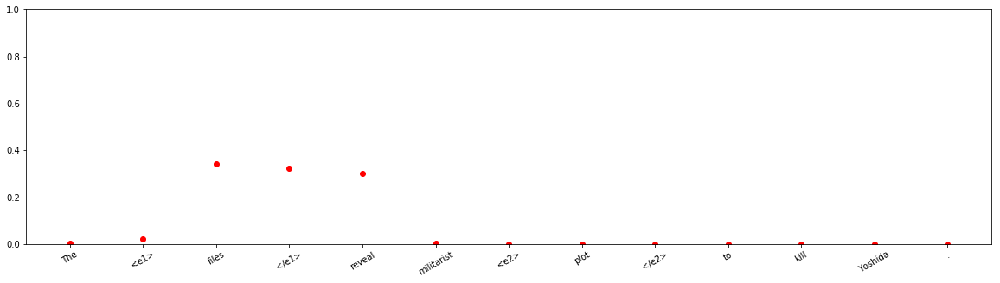









input sentence: The <e1> company </e1> is migrating into profitable new <e2> segments </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 9.0057415e-07
Entity-Destination(e1,e2) 	:	 0.99865854
Cause-Effect(e2,e1) 	:	 1.142604e-13
Member-Collection(e2,e1) 	:	 5.81991e-14
Entity-Origin(e1,e2) 	:	 1.5658829e-07
Message-Topic(e1,e2) 	:	 2.893851e-15
Component-Whole(e1,e2) 	:	 3.0255538e-15
Component-Whole(e2,e1) 	:	 6.107403e-16
Instrument-Agency(e2,e1) 	:	 5.6135055e-13
Content-Container(e1,e2) 	:	 1.2010883e-11
Product-Producer(e2,e1) 	:	 0.0013403879
Cause-Effect(e1,e2) 	:	 4.3977977e-12
Product-Producer(e1,e2) 	:	 9.054616e-14
Content-Container(e2,e1) 	:	 1.2744001e-12
Entity-Origin(e2,e1) 	:	 1.7904743e-10
Message-Topic(e2,e1) 	:	 8.933309e-12
Instrument-Agency(e1,e2) 	:	 5.3308188e-14
Member-Collection(e1,e2) 	:	 2.980971e-08
Entity-Destination(e2,e1) 	:	 2.9332954e-15



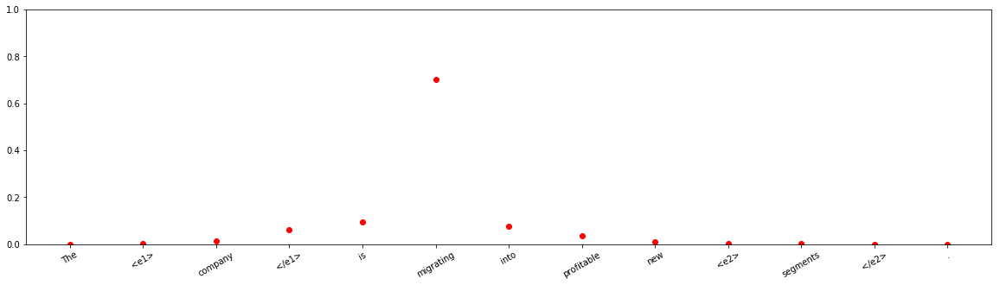


input sentence: The machine implant converts <e1> sounds </e1> into electrical <e2> signals </e2> .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 0.10047366
Entity-Destination(e1,e2) 	:	 0.01481583
Cause-Effect(e2,e1) 	:	 0.0025068542
Member-Collection(e2,e1) 	:	 5.9192815e-09
Entity-Origin(e1,e2) 	:	 1.2267037e-06
Message-Topic(e1,e2) 	:	 2.769264e-06
Component-Whole(e1,e2) 	:	 2.2560177e-07
Component-Whole(e2,e1) 	:	 1.8064711e-05
Instrument-Agency(e2,e1) 	:	 5.2783173e-07
Content-Container(e1,e2) 	:	 4.862831e-09
Product-Producer(e2,e1) 	:	 1.4182485e-06
Cause-Effect(e1,e2) 	:	 0.881974
Product-Producer(e1,e2) 	:	 6.370154e-08
Content-Container(e2,e1) 	:	 5.2889515e-10
Entity-Origin(e2,e1) 	:	 3.4623955e-08
Message-Topic(e2,e1) 	:	 1.6778217e-06
Instrument-Agency(e1,e2) 	:	 0.00017915199
Member-Collection(e1,e2) 	:	 2.448436e-05
Entity-Destination(e2,e1) 	:	 3.6542276e-09



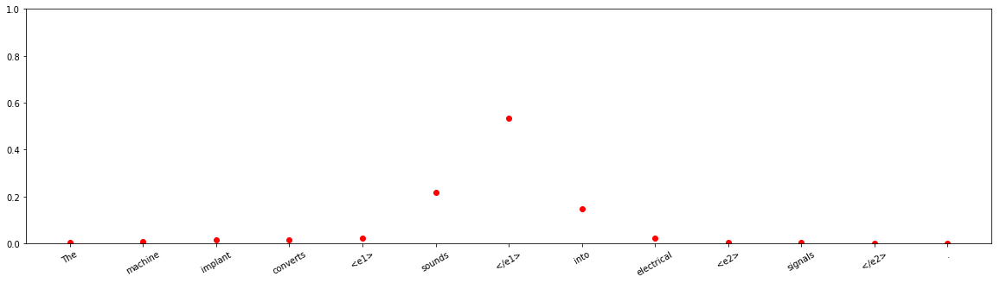




input sentence: We store the <e1> glue </e1> in a cool <e2> place </e2> .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 0.009488827
Entity-Destination(e1,e2) 	:	 1.4570748e-05
Cause-Effect(e2,e1) 	:	 1.3823416e-12
Member-Collection(e2,e1) 	:	 2.006601e-12
Entity-Origin(e1,e2) 	:	 1.5708549e-06
Message-Topic(e1,e2) 	:	 5.3551864e-11
Component-Whole(e1,e2) 	:	 0.0068735094
Component-Whole(e2,e1) 	:	 5.0672805e-10
Instrument-Agency(e2,e1) 	:	 1.8208762e-09
Content-Container(e1,e2) 	:	 0.9836172
Product-Producer(e2,e1) 	:	 3.7895455e-07
Cause-Effect(e1,e2) 	:	 1.7917693e-11
Product-Producer(e1,e2) 	:	 7.532352e-09
Content-Container(e2,e1) 	:	 1.3158998e-06
Entity-Origin(e2,e1) 	:	 2.528774e-07
Message-Topic(e2,e1) 	:	 3.5216075e-08
Instrument-Agency(e1,e2) 	:	 1.4574326e-06
Member-Collection(e1,e2) 	:	 1.0809091e-06
Entity-Destination(e2,e1) 	:	 1.2837917e-11



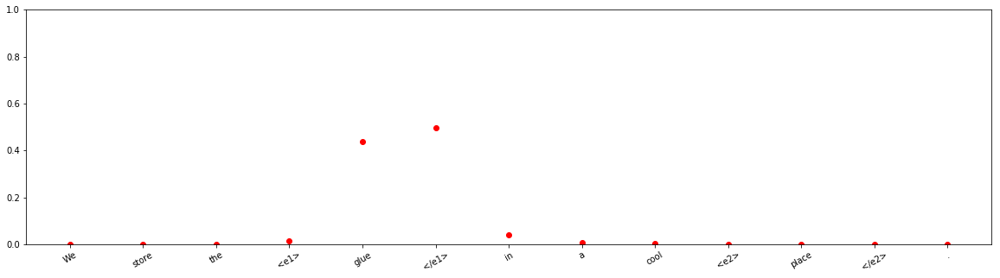





input sentence: This <e1> player </e1> has moved to the <e2> next round </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 8.4758464e-11
Entity-Destination(e1,e2) 	:	 1.0
Cause-Effect(e2,e1) 	:	 3.015262e-16
Member-Collection(e2,e1) 	:	 6.1518063e-15
Entity-Origin(e1,e2) 	:	 4.300752e-11
Message-Topic(e1,e2) 	:	 3.602196e-15
Component-Whole(e1,e2) 	:	 7.716146e-13
Component-Whole(e2,e1) 	:	 1.7677192e-16
Instrument-Agency(e2,e1) 	:	 1.3513856e-11
Content-Container(e1,e2) 	:	 4.5449693e-11
Product-Producer(e2,e1) 	:	 4.0659698e-12
Cause-Effect(e1,e2) 	:	 2.7523469e-17
Product-Producer(e1,e2) 	:	 4.340967e-16
Content-Container(e2,e1) 	:	 1.0810269e-15
Entity-Origin(e2,e1) 	:	 9.045592e-16
Message-Topic(e2,e1) 	:	 2.4947342e-12
Instrument-Agency(e1,e2) 	:	 3.5855e-14
Member-Collection(e1,e2) 	:	 2.4420472e-09
Entity-Destination(e2,e1) 	:	 9.95748e-16



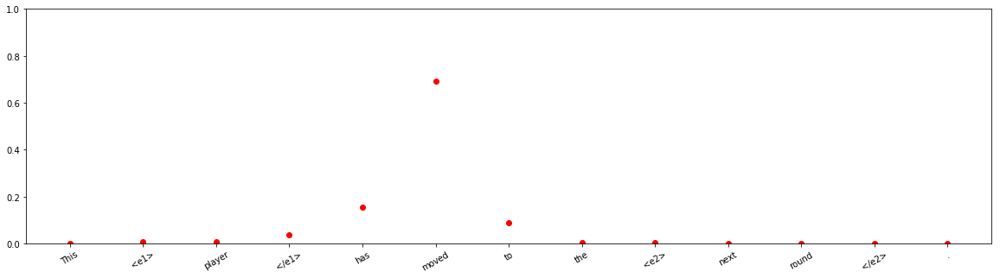





input sentence: Iraqi air force <e1> pilots </e1> took flight into <e2> history </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9785888
Entity-Destination(e1,e2) 	:	 0.003946171
Cause-Effect(e2,e1) 	:	 1.8960158e-10
Member-Collection(e2,e1) 	:	 5.0849547e-08
Entity-Origin(e1,e2) 	:	 0.00083670043
Message-Topic(e1,e2) 	:	 9.838964e-07
Component-Whole(e1,e2) 	:	 2.0059253e-10
Component-Whole(e2,e1) 	:	 2.4399272e-12
Instrument-Agency(e2,e1) 	:	 2.0353054e-05
Content-Container(e1,e2) 	:	 0.007147409
Product-Producer(e2,e1) 	:	 2.821179e-06
Cause-Effect(e1,e2) 	:	 6.4977765e-09
Product-Producer(e1,e2) 	:	 4.3120394e-12
Content-Container(e2,e1) 	:	 6.7627565e-07
Entity-Origin(e2,e1) 	:	 3.0740591e-06
Message-Topic(e2,e1) 	:	 2.1662126e-08
Instrument-Agency(e1,e2) 	:	 1.1681645e-07
Member-Collection(e1,e2) 	:	 0.009453057
Entity-Destination(e2,e1) 	:	 2.918887e-11



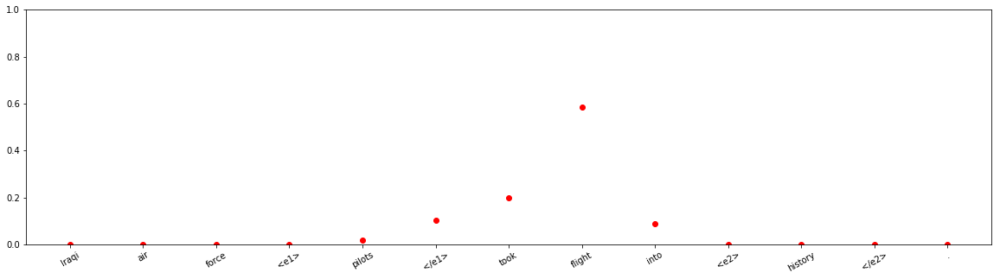


input sentence: The <e1> basin </e1> has sunk into a deep <e2> depression </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 2.1584939e-12
Cause-Effect(e2,e1) 	:	 2.7184752e-14
Member-Collection(e2,e1) 	:	 6.986209e-17
Entity-Origin(e1,e2) 	:	 1.0269143e-14
Message-Topic(e1,e2) 	:	 7.0250202e-15
Component-Whole(e1,e2) 	:	 5.4715774e-09
Component-Whole(e2,e1) 	:	 1.6429092e-13
Instrument-Agency(e2,e1) 	:	 7.825404e-18
Content-Container(e1,e2) 	:	 1.3840873e-11
Product-Producer(e2,e1) 	:	 5.664259e-16
Cause-Effect(e1,e2) 	:	 1.4967542e-12
Product-Producer(e1,e2) 	:	 2.9867684e-16
Content-Container(e2,e1) 	:	 2.7773676e-11
Entity-Origin(e2,e1) 	:	 2.4783673e-12
Message-Topic(e2,e1) 	:	 7.2119953e-16
Instrument-Agency(e1,e2) 	:	 3.956577e-12
Member-Collection(e1,e2) 	:	 5.4670396e-13
Entity-Destination(e2,e1) 	:	 8.860117e-16



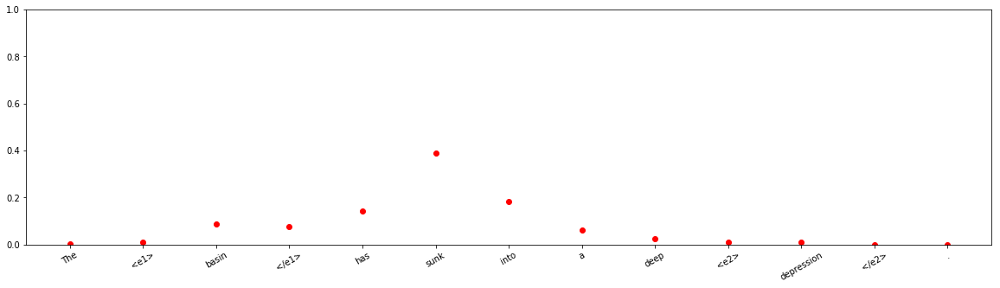
















input sentence: Many of the larger <e1> teeth </e1> in the back of your jaws have two or three <e2> roots </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Component-Whole(e1,e2)
Other 	:	 2.190808e-12
Entity-Destination(e1,e2) 	:	 6.058333e-12
Cause-Effect(e2,e1) 	:	 5.340427e-12
Member-Collection(e2,e1) 	:	 4.0724586e-15
Entity-Origin(e1,e2) 	:	 1.8949291e-10
Message-Topic(e1,e2) 	:	 7.736535e-14
Component-Whole(e1,e2) 	:	 0.99999964
Component-Whole(e2,e1) 	:	 4.0085843e-07
Instrument-Agency(e2,e1) 	:	 2.8630305e-09
Content-Container(e1,e2) 	:	 2.2096416e-09
Product-Producer(e2,e1) 	:	 1.3906771e-13
Cause-Effect(e1,e2) 	:	 2.9315383e-14
Product-Producer(e1,e2) 	:	 3.6751428e-14
Content-Container(e2,e1) 	:	 1.7876797e-12
Entity-Origin(e2,e1) 	:	 1.6963974e-15
Message-Topic(e2,e1) 	:	 2.9980442e-13
Instrument-Agency(e1,e2) 	:	 1.8597741e-10
Member-Collection(e1,e2) 	:	 1.9367152e-11
Entity-Destination(e2,e1) 	:	 1.9271895e-15



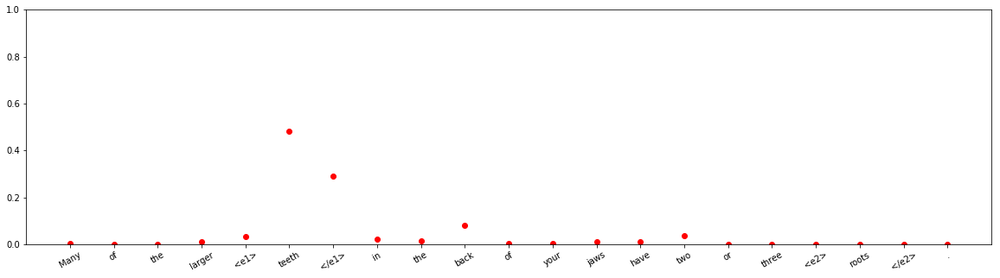


input sentence: The same <e1> rule </e1> governs the <e2> use </e2> of the reversed and the monochrome versions of the logo .
answer label:    Message-Topic(e1,e2)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 1.7962193e-06
Entity-Destination(e1,e2) 	:	 1.7127797e-12
Cause-Effect(e2,e1) 	:	 4.9557265e-11
Member-Collection(e2,e1) 	:	 4.966582e-10
Entity-Origin(e1,e2) 	:	 3.1034122e-13
Message-Topic(e1,e2) 	:	 0.28954816
Component-Whole(e1,e2) 	:	 5.2008683e-05
Component-Whole(e2,e1) 	:	 3.4963275e-06
Instrument-Agency(e2,e1) 	:	 0.71035266
Content-Container(e1,e2) 	:	 2.788738e-10
Product-Producer(e2,e1) 	:	 2.4031417e-08
Cause-Effect(e1,e2) 	:	 2.9726902e-08
Product-Producer(e1,e2) 	:	 2.754996e-11
Content-Container(e2,e1) 	:	 9.992939e-09
Entity-Origin(e2,e1) 	:	 2.8218894e-11
Message-Topic(e2,e1) 	:	 1.735328e-08
Instrument-Agency(e1,e2) 	:	 4.188563e-05
Member-Collection(e1,e2) 	:	 9.504755e-12
Entity-Destination(e2,e1) 	:	 1.20965364e-11



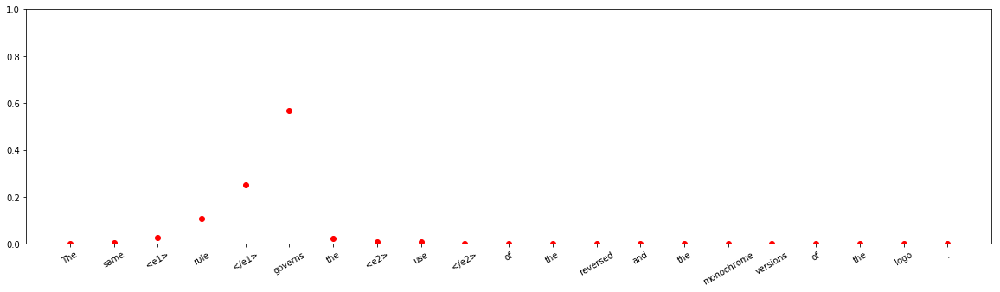


input sentence: The <e1> show </e1> offers a constructive <e2> discussion </e2> of a hot-button topic with leading M & A experts .
answer label:    Message-Topic(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 5.093823e-10
Entity-Destination(e1,e2) 	:	 8.00922e-13
Cause-Effect(e2,e1) 	:	 1.1469947e-11
Member-Collection(e2,e1) 	:	 7.6462944e-05
Entity-Origin(e1,e2) 	:	 1.5053357e-09
Message-Topic(e1,e2) 	:	 0.3314256
Component-Whole(e1,e2) 	:	 8.754759e-08
Component-Whole(e2,e1) 	:	 0.6680351
Instrument-Agency(e2,e1) 	:	 5.6393806e-10
Content-Container(e1,e2) 	:	 2.0136472e-09
Product-Producer(e2,e1) 	:	 7.841107e-05
Cause-Effect(e1,e2) 	:	 6.860418e-05
Product-Producer(e1,e2) 	:	 6.131651e-08
Content-Container(e2,e1) 	:	 2.028956e-06
Entity-Origin(e2,e1) 	:	 2.673539e-08
Message-Topic(e2,e1) 	:	 0.00031366313
Instrument-Agency(e1,e2) 	:	 3.3686455e-08
Member-Collection(e1,e2) 	:	 3.1505243e-11
Entity-Destination(e2,e1) 	:	 1.9772993e-10



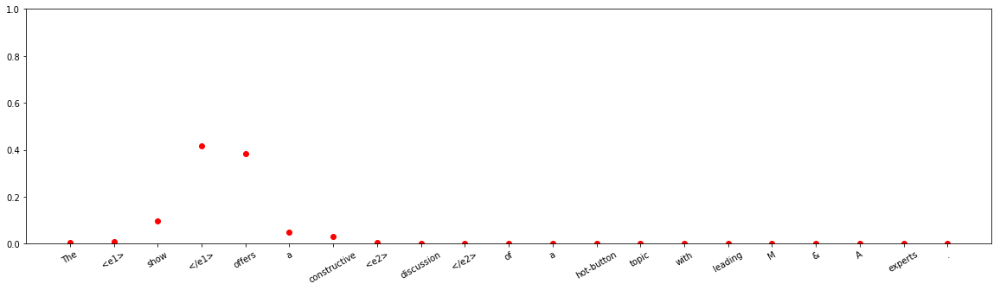


input sentence: Aretus fetched <e1> water </e1> from the house in a <e2> ewer </e2> that had a flower pattern on it .
answer label:    Content-Container(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 4.475541e-08
Entity-Destination(e1,e2) 	:	 0.005282449
Cause-Effect(e2,e1) 	:	 1.8856024e-08
Member-Collection(e2,e1) 	:	 1.5149708e-12
Entity-Origin(e1,e2) 	:	 0.9946972
Message-Topic(e1,e2) 	:	 1.9207204e-13
Component-Whole(e1,e2) 	:	 5.1854907e-09
Component-Whole(e2,e1) 	:	 5.6293203e-10
Instrument-Agency(e2,e1) 	:	 3.973822e-09
Content-Container(e1,e2) 	:	 2.0273046e-05
Product-Producer(e2,e1) 	:	 3.409219e-11
Cause-Effect(e1,e2) 	:	 1.442297e-14
Product-Producer(e1,e2) 	:	 4.1565227e-09
Content-Container(e2,e1) 	:	 1.914795e-09
Entity-Origin(e2,e1) 	:	 1.8618338e-11
Message-Topic(e2,e1) 	:	 8.494546e-11
Instrument-Agency(e1,e2) 	:	 4.876333e-11
Member-Collection(e1,e2) 	:	 6.8317267e-09
Entity-Destination(e2,e1) 	:	 1.340716e-12



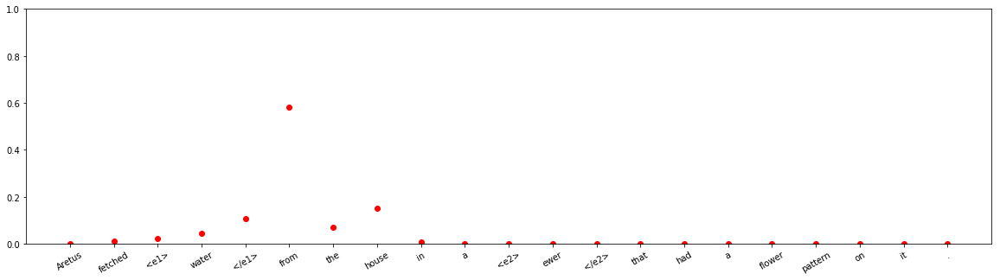


input sentence: The <e1> athlete </e1> starts in the three-point <e2> stance </e2> , and explodes out 5 yards to his right .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 0.42159778
Entity-Destination(e1,e2) 	:	 1.0261842e-08
Cause-Effect(e2,e1) 	:	 0.0003698535
Member-Collection(e2,e1) 	:	 3.3241329e-12
Entity-Origin(e1,e2) 	:	 0.52010953
Message-Topic(e1,e2) 	:	 5.131434e-14
Component-Whole(e1,e2) 	:	 5.7782543e-08
Component-Whole(e2,e1) 	:	 1.3067552e-07
Instrument-Agency(e2,e1) 	:	 0.057639733
Content-Container(e1,e2) 	:	 3.9766175e-07
Product-Producer(e2,e1) 	:	 0.00023906103
Cause-Effect(e1,e2) 	:	 2.1160562e-09
Product-Producer(e1,e2) 	:	 1.8719528e-09
Content-Container(e2,e1) 	:	 2.0736777e-11
Entity-Origin(e2,e1) 	:	 9.730293e-13
Message-Topic(e2,e1) 	:	 3.1009057e-07
Instrument-Agency(e1,e2) 	:	 4.533983e-09
Member-Collection(e1,e2) 	:	 4.3242788e-05
Entity-Destination(e2,e1) 	:	 1.8660084e-11



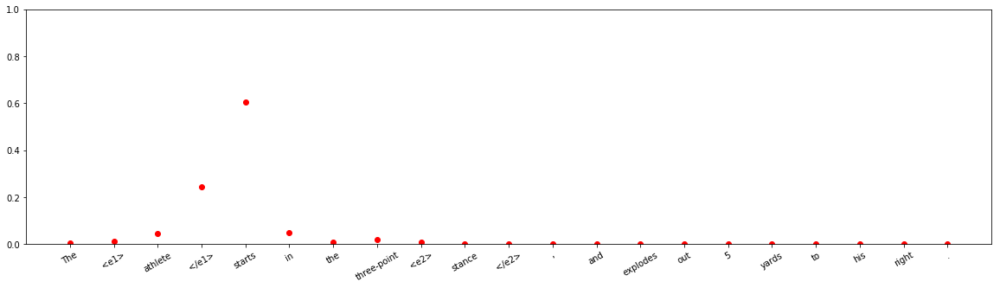





input sentence: Bradis Produce is a full-time farming <e1> operation </e1> raising fresh produce , greenhouse flowers , and <e2> grain </e2> .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 2.2724807e-05
Entity-Destination(e1,e2) 	:	 2.1270824e-10
Cause-Effect(e2,e1) 	:	 6.227742e-10
Member-Collection(e2,e1) 	:	 5.457015e-09
Entity-Origin(e1,e2) 	:	 3.0372473e-08
Message-Topic(e1,e2) 	:	 1.5122099e-07
Component-Whole(e1,e2) 	:	 2.6598116e-12
Component-Whole(e2,e1) 	:	 6.0898886e-09
Instrument-Agency(e2,e1) 	:	 1.3737558e-07
Content-Container(e1,e2) 	:	 2.3422176e-08
Product-Producer(e2,e1) 	:	 0.99969244
Cause-Effect(e1,e2) 	:	 0.00022771678
Product-Producer(e1,e2) 	:	 2.084395e-05
Content-Container(e2,e1) 	:	 4.468472e-08
Entity-Origin(e2,e1) 	:	 3.0435962e-05
Message-Topic(e2,e1) 	:	 5.539931e-06
Instrument-Agency(e1,e2) 	:	 3.197551e-08
Member-Collection(e1,e2) 	:	 2.2623259e-09
Entity-Destination(e2,e1) 	:	 3.015448e-10



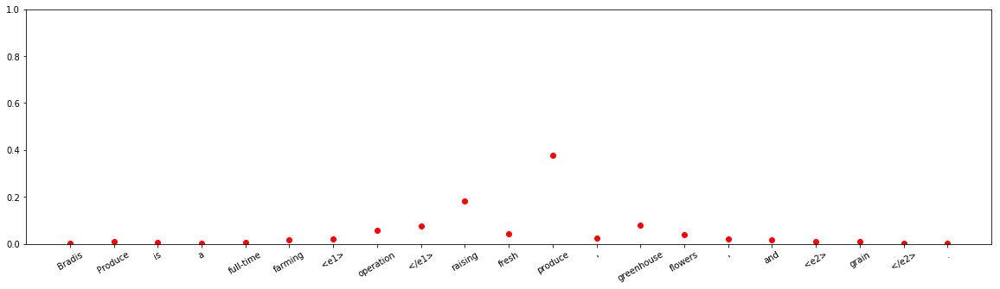



input sentence: The evening 's <e1> performance </e1> was a great production by a first-class <e2> company </e2> - and not expensive .
answer label:    Cause-Effect(e2,e1)
wrong label:    Product-Producer(e1,e2)
Other 	:	 0.0154873
Entity-Destination(e1,e2) 	:	 3.9755186e-14
Cause-Effect(e2,e1) 	:	 3.099934e-08
Member-Collection(e2,e1) 	:	 1.8900693e-14
Entity-Origin(e1,e2) 	:	 3.5794876e-12
Message-Topic(e1,e2) 	:	 3.8522455e-16
Component-Whole(e1,e2) 	:	 5.9220485e-14
Component-Whole(e2,e1) 	:	 1.8689556e-13
Instrument-Agency(e2,e1) 	:	 3.763556e-15
Content-Container(e1,e2) 	:	 2.1303502e-14
Product-Producer(e2,e1) 	:	 5.7245636e-13
Cause-Effect(e1,e2) 	:	 3.105812e-15
Product-Producer(e1,e2) 	:	 0.98451257
Content-Container(e2,e1) 	:	 2.92051e-17
Entity-Origin(e2,e1) 	:	 2.5502325e-16
Message-Topic(e2,e1) 	:	 1.4523732e-07
Instrument-Agency(e1,e2) 	:	 4.1885826e-08
Member-Collection(e1,e2) 	:	 1.5063317e-10
Entity-Destination(e2,e1) 	:	 4.1859027e-14



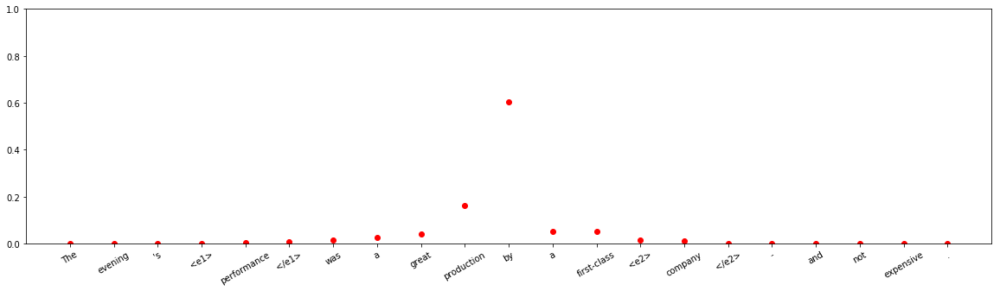




input sentence: Eventually , the player descends into a <e1> maze </e1> of <e2> catacombs </e2> and a `` fake Y2 '' .
answer label:    Component-Whole(e2,e1)
wrong label:    Other
Other 	:	 0.8319988
Entity-Destination(e1,e2) 	:	 2.1542144e-09
Cause-Effect(e2,e1) 	:	 2.2179254e-09
Member-Collection(e2,e1) 	:	 0.16799073
Entity-Origin(e1,e2) 	:	 1.2486276e-08
Message-Topic(e1,e2) 	:	 4.0128575e-10
Component-Whole(e1,e2) 	:	 4.0568372e-07
Component-Whole(e2,e1) 	:	 6.548496e-08
Instrument-Agency(e2,e1) 	:	 2.0277697e-09
Content-Container(e1,e2) 	:	 4.064233e-11
Product-Producer(e2,e1) 	:	 2.5620727e-07
Cause-Effect(e1,e2) 	:	 1.8189335e-12
Product-Producer(e1,e2) 	:	 2.2964728e-06
Content-Container(e2,e1) 	:	 3.6987134e-07
Entity-Origin(e2,e1) 	:	 2.9417523e-08
Message-Topic(e2,e1) 	:	 6.2072095e-06
Instrument-Agency(e1,e2) 	:	 6.900564e-07
Member-Collection(e1,e2) 	:	 1.3214708e-07
Entity-Destination(e2,e1) 	:	 1.6108422e-10



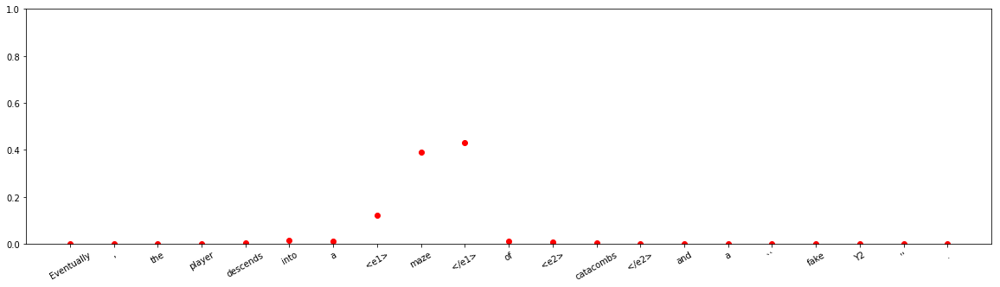




input sentence: <e1> Roundworms </e1> or ascarids are caused by an intestinal <e2> parasite </e2> called Toxocara canis .
answer label:    Product-Producer(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 2.4523207e-20
Entity-Destination(e1,e2) 	:	 1.0068391e-13
Cause-Effect(e2,e1) 	:	 0.99999607
Member-Collection(e2,e1) 	:	 4.2706635e-14
Entity-Origin(e1,e2) 	:	 1.508966e-11
Message-Topic(e1,e2) 	:	 9.397341e-19
Component-Whole(e1,e2) 	:	 2.7120854e-13
Component-Whole(e2,e1) 	:	 6.108797e-16
Instrument-Agency(e2,e1) 	:	 6.244241e-18
Content-Container(e1,e2) 	:	 2.749049e-19
Product-Producer(e2,e1) 	:	 3.8813734e-16
Cause-Effect(e1,e2) 	:	 6.7924655e-10
Product-Producer(e1,e2) 	:	 3.8903686e-06
Content-Container(e2,e1) 	:	 3.1084262e-16
Entity-Origin(e2,e1) 	:	 7.3947154e-17
Message-Topic(e2,e1) 	:	 4.776446e-13
Instrument-Agency(e1,e2) 	:	 1.7700988e-11
Member-Collection(e1,e2) 	:	 1.6780461e-14
Entity-Destination(e2,e1) 	:	 2.0697183e-16



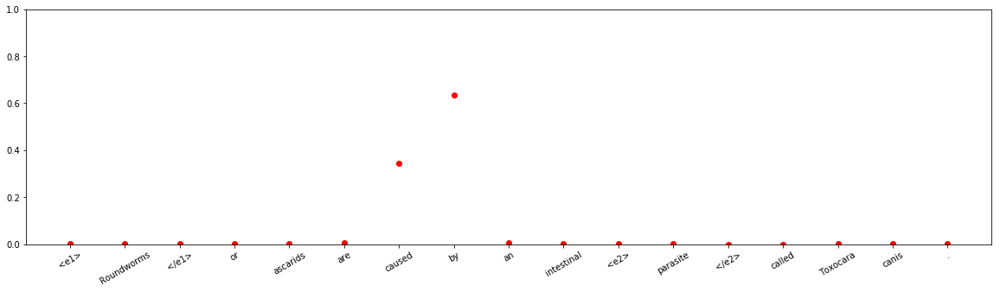











input sentence: The <e1> mushroom </e1> was found in a <e2> mass </e2> of wet twigs and leaves .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 2.132215e-09
Entity-Destination(e1,e2) 	:	 1.3341103e-09
Cause-Effect(e2,e1) 	:	 2.0195232e-12
Member-Collection(e2,e1) 	:	 1.772458e-14
Entity-Origin(e1,e2) 	:	 1.4689125e-06
Message-Topic(e1,e2) 	:	 7.976887e-14
Component-Whole(e1,e2) 	:	 2.1416079e-07
Component-Whole(e2,e1) 	:	 1.1248348e-07
Instrument-Agency(e2,e1) 	:	 1.97241e-12
Content-Container(e1,e2) 	:	 0.9999982
Product-Producer(e2,e1) 	:	 1.9703985e-12
Cause-Effect(e1,e2) 	:	 4.055961e-13
Product-Producer(e1,e2) 	:	 2.3171257e-13
Content-Container(e2,e1) 	:	 2.272716e-09
Entity-Origin(e2,e1) 	:	 3.7668008e-10
Message-Topic(e2,e1) 	:	 1.9293476e-09
Instrument-Agency(e1,e2) 	:	 1.5939746e-11
Member-Collection(e1,e2) 	:	 1.4756061e-11
Entity-Destination(e2,e1) 	:	 5.2174793e-14



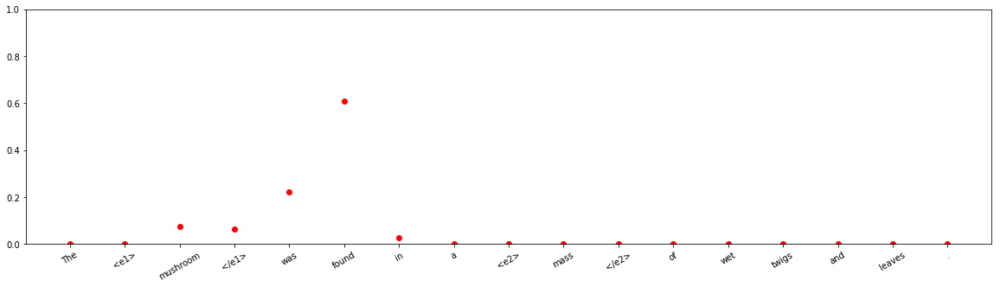







input sentence: The boy 's <e1> coffin </e1> is carried to the <e2> funeral </e2> by his uncles .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 5.3647793e-05
Entity-Destination(e1,e2) 	:	 0.99759066
Cause-Effect(e2,e1) 	:	 5.510023e-14
Member-Collection(e2,e1) 	:	 1.820035e-09
Entity-Origin(e1,e2) 	:	 1.2792688e-06
Message-Topic(e1,e2) 	:	 1.03591674e-07
Component-Whole(e1,e2) 	:	 1.6682813e-07
Component-Whole(e2,e1) 	:	 2.3397838e-14
Instrument-Agency(e2,e1) 	:	 2.5451216e-10
Content-Container(e1,e2) 	:	 0.0017944458
Product-Producer(e2,e1) 	:	 7.4360614e-06
Cause-Effect(e1,e2) 	:	 5.868685e-12
Product-Producer(e1,e2) 	:	 3.1232894e-06
Content-Container(e2,e1) 	:	 1.8491971e-07
Entity-Origin(e2,e1) 	:	 1.1837046e-06
Message-Topic(e2,e1) 	:	 2.1246599e-10
Instrument-Agency(e1,e2) 	:	 9.3617586e-05
Member-Collection(e1,e2) 	:	 0.0004542044
Entity-Destination(e2,e1) 	:	 1.1983455e-10



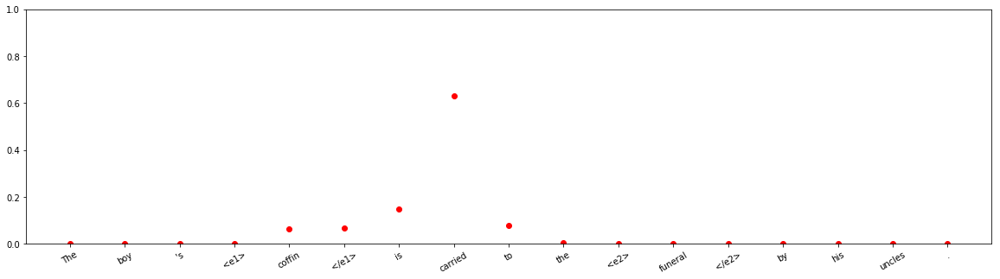


input sentence: Active <e1> transport </e1> is a <e2> mechanism </e2> evolved to mediate traffic across cellular membranes .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 3.53194e-12
Entity-Destination(e1,e2) 	:	 5.1259796e-09
Cause-Effect(e2,e1) 	:	 4.2913995e-11
Member-Collection(e2,e1) 	:	 2.701468e-10
Entity-Origin(e1,e2) 	:	 7.265937e-08
Message-Topic(e1,e2) 	:	 1.1311282e-12
Component-Whole(e1,e2) 	:	 8.9068697e-10
Component-Whole(e2,e1) 	:	 0.9999993
Instrument-Agency(e2,e1) 	:	 2.745892e-08
Content-Container(e1,e2) 	:	 6.5232506e-08
Product-Producer(e2,e1) 	:	 1.7743383e-09
Cause-Effect(e1,e2) 	:	 2.7044014e-10
Product-Producer(e1,e2) 	:	 5.97318e-13
Content-Container(e2,e1) 	:	 4.838133e-07
Entity-Origin(e2,e1) 	:	 2.8783026e-11
Message-Topic(e2,e1) 	:	 4.6314085e-11
Instrument-Agency(e1,e2) 	:	 4.030857e-08
Member-Collection(e1,e2) 	:	 1.836974e-14
Entity-Destination(e2,e1) 	:	 1.6474643e-13



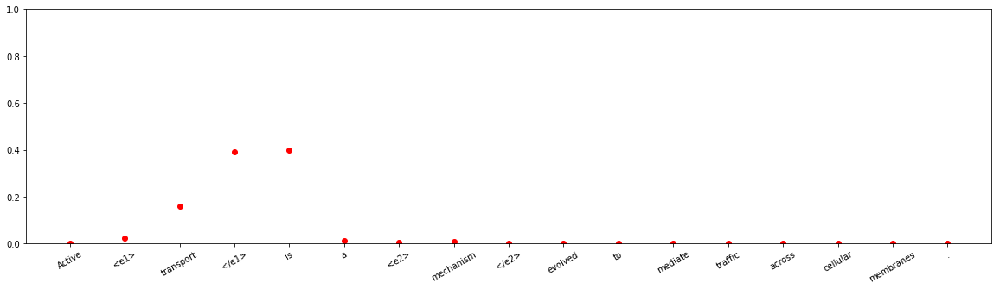



input sentence: Condo <e1> associations </e1> are turning to <e2> receiverships </e2> to collect rent on foreclosed units .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.9963703
Entity-Destination(e1,e2) 	:	 8.4116394e-12
Cause-Effect(e2,e1) 	:	 1.6755248e-06
Member-Collection(e2,e1) 	:	 1.6035804e-07
Entity-Origin(e1,e2) 	:	 8.235161e-11
Message-Topic(e1,e2) 	:	 3.7862694e-07
Component-Whole(e1,e2) 	:	 4.6158345e-07
Component-Whole(e2,e1) 	:	 0.00048265775
Instrument-Agency(e2,e1) 	:	 0.001979078
Content-Container(e1,e2) 	:	 4.3886757e-08
Product-Producer(e2,e1) 	:	 4.0313695e-09
Cause-Effect(e1,e2) 	:	 0.0003941942
Product-Producer(e1,e2) 	:	 8.6003565e-10
Content-Container(e2,e1) 	:	 1.1932764e-09
Entity-Origin(e2,e1) 	:	 8.6025886e-10
Message-Topic(e2,e1) 	:	 3.5041987e-05
Instrument-Agency(e1,e2) 	:	 0.00073602196
Member-Collection(e1,e2) 	:	 1.1760167e-08
Entity-Destination(e2,e1) 	:	 2.9259117e-10



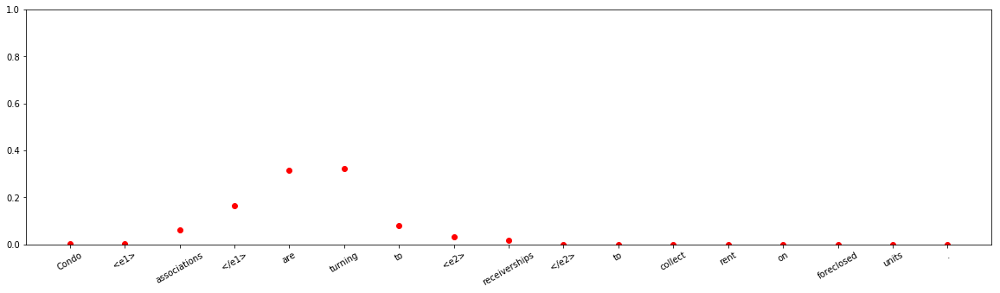













input sentence: The <e1> director </e1> of the <e2> company </e2> in its inaugural year was George Ogilvie .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 4.2658653e-06
Entity-Destination(e1,e2) 	:	 3.553051e-10
Cause-Effect(e2,e1) 	:	 9.201475e-10
Member-Collection(e2,e1) 	:	 1.205456e-08
Entity-Origin(e1,e2) 	:	 8.461249e-08
Message-Topic(e1,e2) 	:	 2.5366467e-10
Component-Whole(e1,e2) 	:	 1.902762e-06
Component-Whole(e2,e1) 	:	 1.2188042e-13
Instrument-Agency(e2,e1) 	:	 2.7504896e-07
Content-Container(e1,e2) 	:	 1.2974154e-09
Product-Producer(e2,e1) 	:	 0.00019204876
Cause-Effect(e1,e2) 	:	 4.3662924e-11
Product-Producer(e1,e2) 	:	 0.00012827804
Content-Container(e2,e1) 	:	 2.1484993e-11
Entity-Origin(e2,e1) 	:	 4.9778907e-11
Message-Topic(e2,e1) 	:	 7.227499e-07
Instrument-Agency(e1,e2) 	:	 3.38167e-05
Member-Collection(e1,e2) 	:	 0.99963856
Entity-Destination(e2,e1) 	:	 2.6039706e-12



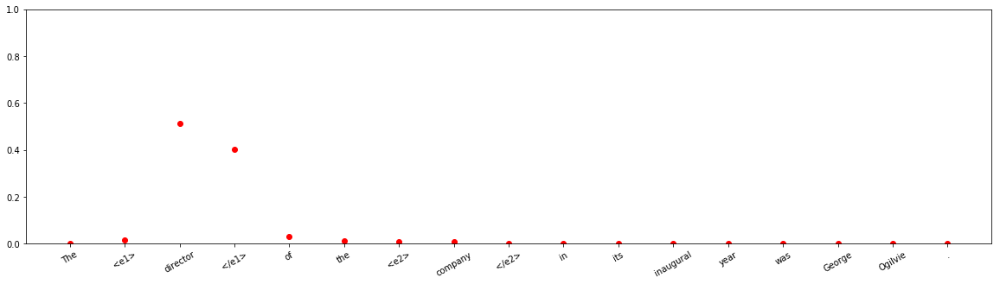




input sentence: A single good starting <e1> geometry </e1> was generated from an input SMILES <e2> string </e2> .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.3636956e-14
Entity-Destination(e1,e2) 	:	 3.2215134e-08
Cause-Effect(e2,e1) 	:	 2.3888791e-05
Member-Collection(e2,e1) 	:	 3.3820105e-10
Entity-Origin(e1,e2) 	:	 0.9999658
Message-Topic(e1,e2) 	:	 2.5770098e-13
Component-Whole(e1,e2) 	:	 4.3348765e-09
Component-Whole(e2,e1) 	:	 9.791663e-06
Instrument-Agency(e2,e1) 	:	 5.6426703e-09
Content-Container(e1,e2) 	:	 3.075555e-08
Product-Producer(e2,e1) 	:	 4.108759e-10
Cause-Effect(e1,e2) 	:	 4.9748548e-09
Product-Producer(e1,e2) 	:	 4.660719e-07
Content-Container(e2,e1) 	:	 1.1817566e-11
Entity-Origin(e2,e1) 	:	 3.915691e-12
Message-Topic(e2,e1) 	:	 7.9889734e-11
Instrument-Agency(e1,e2) 	:	 5.7138957e-11
Member-Collection(e1,e2) 	:	 7.1655017e-12
Entity-Destination(e2,e1) 	:	 1.8037852e-12



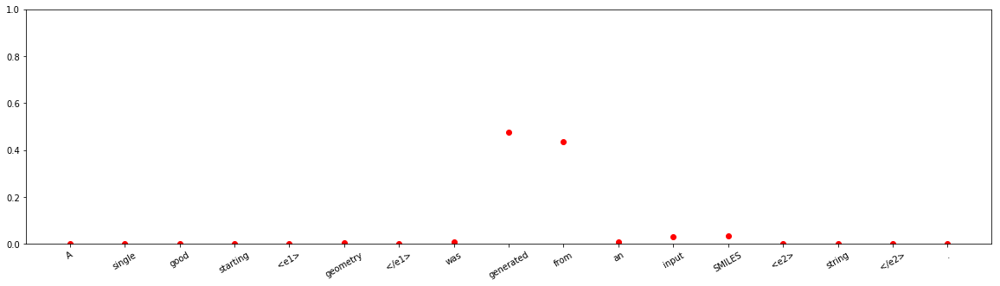



input sentence: The internal <e1> memo </e1> gives details of Morgan Stanley 's new management <e2> lineup </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 4.893318e-06
Entity-Destination(e1,e2) 	:	 3.87426e-12
Cause-Effect(e2,e1) 	:	 8.5379446e-07
Member-Collection(e2,e1) 	:	 6.116169e-08
Entity-Origin(e1,e2) 	:	 2.0373334e-07
Message-Topic(e1,e2) 	:	 0.000502747
Component-Whole(e1,e2) 	:	 0.0036248358
Component-Whole(e2,e1) 	:	 0.9956742
Instrument-Agency(e2,e1) 	:	 0.00011283735
Content-Container(e1,e2) 	:	 1.5724221e-05
Product-Producer(e2,e1) 	:	 9.511286e-07
Cause-Effect(e1,e2) 	:	 3.5209334e-06
Product-Producer(e1,e2) 	:	 2.4177555e-07
Content-Container(e2,e1) 	:	 5.38407e-05
Entity-Origin(e2,e1) 	:	 4.252562e-11
Message-Topic(e2,e1) 	:	 9.920287e-07
Instrument-Agency(e1,e2) 	:	 4.0796945e-06
Member-Collection(e1,e2) 	:	 1.1730238e-10
Entity-Destination(e2,e1) 	:	 3.52818e-08



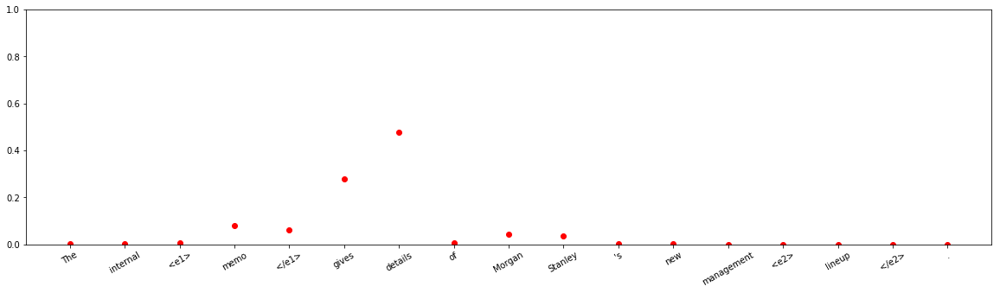




input sentence: The <e1> northeast </e1> was the source of <e2> contention </e2> between these various rivaling groups .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 1.6662528e-09
Entity-Destination(e1,e2) 	:	 7.2140244e-14
Cause-Effect(e2,e1) 	:	 7.714079e-11
Member-Collection(e2,e1) 	:	 2.7962136e-05
Entity-Origin(e1,e2) 	:	 1.6559127e-08
Message-Topic(e1,e2) 	:	 3.1883562e-08
Component-Whole(e1,e2) 	:	 5.9589963e-12
Component-Whole(e2,e1) 	:	 1.3432988e-10
Instrument-Agency(e2,e1) 	:	 3.6330028e-12
Content-Container(e1,e2) 	:	 5.188066e-10
Product-Producer(e2,e1) 	:	 1.5429674e-05
Cause-Effect(e1,e2) 	:	 0.55357486
Product-Producer(e1,e2) 	:	 4.9800347e-10
Content-Container(e2,e1) 	:	 1.7923794e-07
Entity-Origin(e2,e1) 	:	 0.44638136
Message-Topic(e2,e1) 	:	 1.5047327e-07
Instrument-Agency(e1,e2) 	:	 4.926949e-09
Member-Collection(e1,e2) 	:	 1.2318777e-08
Entity-Destination(e2,e1) 	:	 5.975748e-13



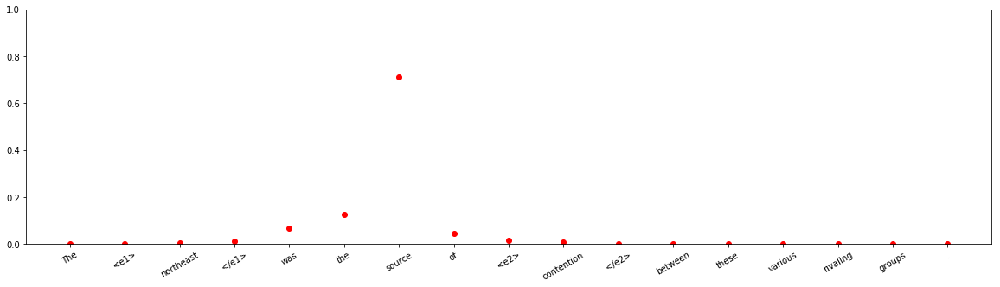


input sentence: The other great <e1> character </e1> from Arabic <e2> literature </e2> Sinbad is from the Tales .
answer label:    Entity-Origin(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 1.3869492e-09
Entity-Destination(e1,e2) 	:	 2.2525551e-13
Cause-Effect(e2,e1) 	:	 9.840647e-10
Member-Collection(e2,e1) 	:	 1.5761575e-10
Entity-Origin(e1,e2) 	:	 0.014444919
Message-Topic(e1,e2) 	:	 8.989342e-12
Component-Whole(e1,e2) 	:	 1.5664367e-12
Component-Whole(e2,e1) 	:	 8.78185e-10
Instrument-Agency(e2,e1) 	:	 5.799471e-13
Content-Container(e1,e2) 	:	 4.4239304e-12
Product-Producer(e2,e1) 	:	 2.6590927e-10
Cause-Effect(e1,e2) 	:	 1.59978e-16
Product-Producer(e1,e2) 	:	 6.225086e-08
Content-Container(e2,e1) 	:	 2.1702125e-15
Entity-Origin(e2,e1) 	:	 6.1997574e-10
Message-Topic(e2,e1) 	:	 0.98555505
Instrument-Agency(e1,e2) 	:	 6.6052324e-15
Member-Collection(e1,e2) 	:	 6.721623e-11
Entity-Destination(e2,e1) 	:	 1.0865259e-12



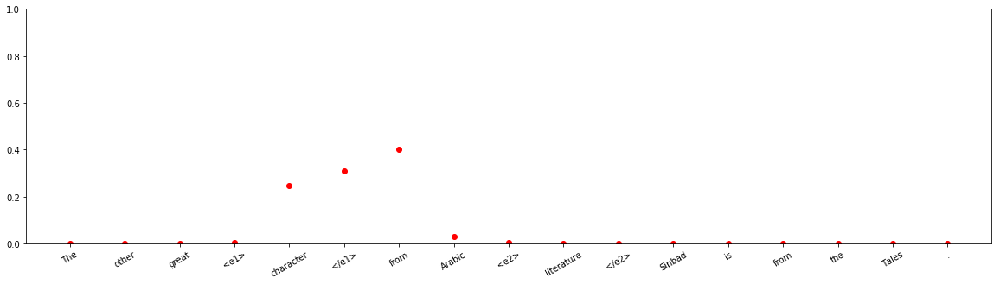


input sentence: The bottom section of the <e1> mast </e1> has been mounted onto the <e2> ship </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.9389388e-08
Entity-Destination(e1,e2) 	:	 1.0574355e-07
Cause-Effect(e2,e1) 	:	 5.8309145e-14
Member-Collection(e2,e1) 	:	 4.4638176e-13
Entity-Origin(e1,e2) 	:	 8.762922e-08
Message-Topic(e1,e2) 	:	 5.10366e-12
Component-Whole(e1,e2) 	:	 0.9999707
Component-Whole(e2,e1) 	:	 8.28077e-07
Instrument-Agency(e2,e1) 	:	 4.9629776e-08
Content-Container(e1,e2) 	:	 1.453857e-06
Product-Producer(e2,e1) 	:	 6.9978184e-10
Cause-Effect(e1,e2) 	:	 1.23561e-14
Product-Producer(e1,e2) 	:	 1.07858105e-08
Content-Container(e2,e1) 	:	 1.0256286e-08
Entity-Origin(e2,e1) 	:	 3.671196e-11
Message-Topic(e2,e1) 	:	 3.3299034e-11
Instrument-Agency(e1,e2) 	:	 2.677095e-05
Member-Collection(e1,e2) 	:	 3.9531003e-10
Entity-Destination(e2,e1) 	:	 1.9612452e-11



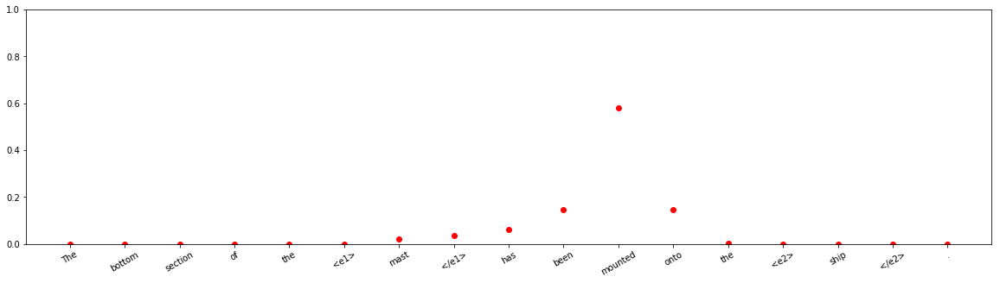




input sentence: The X-Men battle Sentinels in this new <e1> clip </e1> from the animated <e2> series </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 2.5641718e-06
Entity-Destination(e1,e2) 	:	 3.2425385e-10
Cause-Effect(e2,e1) 	:	 8.121019e-05
Member-Collection(e2,e1) 	:	 2.5293916e-08
Entity-Origin(e1,e2) 	:	 0.05866303
Message-Topic(e1,e2) 	:	 7.9945494e-07
Component-Whole(e1,e2) 	:	 0.9223091
Component-Whole(e2,e1) 	:	 0.009185994
Instrument-Agency(e2,e1) 	:	 3.0798974e-10
Content-Container(e1,e2) 	:	 3.3441046e-07
Product-Producer(e2,e1) 	:	 2.2343258e-09
Cause-Effect(e1,e2) 	:	 5.4452037e-11
Product-Producer(e1,e2) 	:	 0.00963268
Content-Container(e2,e1) 	:	 8.015065e-10
Entity-Origin(e2,e1) 	:	 6.650767e-11
Message-Topic(e2,e1) 	:	 0.0001215761
Instrument-Agency(e1,e2) 	:	 2.5586753e-06
Member-Collection(e1,e2) 	:	 1.4509368e-07
Entity-Destination(e2,e1) 	:	 1.134158e-09



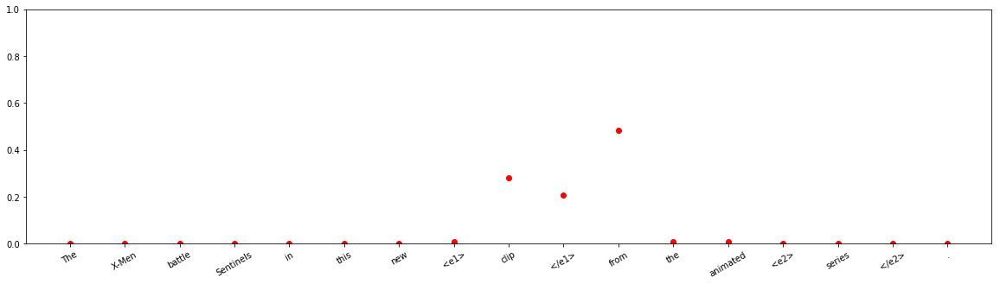


input sentence: At my work , an <e1> electronic engineer </e1> has migrated into <e2> embedded software </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 0.04644153
Entity-Destination(e1,e2) 	:	 0.9533305
Cause-Effect(e2,e1) 	:	 5.4605535e-12
Member-Collection(e2,e1) 	:	 7.688258e-12
Entity-Origin(e1,e2) 	:	 1.9442987e-06
Message-Topic(e1,e2) 	:	 1.4202349e-13
Component-Whole(e1,e2) 	:	 3.4356415e-12
Component-Whole(e2,e1) 	:	 1.4053923e-13
Instrument-Agency(e2,e1) 	:	 1.1007667e-06
Content-Container(e1,e2) 	:	 1.2510341e-05
Product-Producer(e2,e1) 	:	 0.00011858529
Cause-Effect(e1,e2) 	:	 2.2775371e-14
Product-Producer(e1,e2) 	:	 1.2268572e-10
Content-Container(e2,e1) 	:	 3.862203e-10
Entity-Origin(e2,e1) 	:	 7.576378e-10
Message-Topic(e2,e1) 	:	 2.2467075e-08
Instrument-Agency(e1,e2) 	:	 3.6230745e-09
Member-Collection(e1,e2) 	:	 9.3844916e-05
Entity-Destination(e2,e1) 	:	 1.5587361e-11



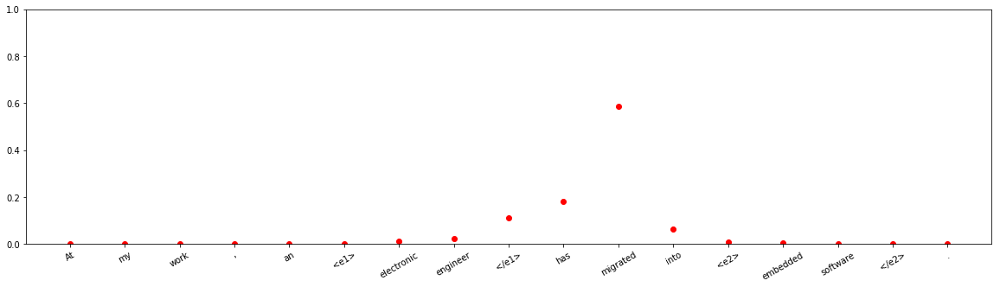




input sentence: To prepare for his exam , the <e1> student </e1> visited the ISA <e2> website </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.1023081e-10
Entity-Destination(e1,e2) 	:	 2.5108802e-06
Cause-Effect(e2,e1) 	:	 1.7572046e-14
Member-Collection(e2,e1) 	:	 3.284942e-08
Entity-Origin(e1,e2) 	:	 0.0010486864
Message-Topic(e1,e2) 	:	 1.5534824e-12
Component-Whole(e1,e2) 	:	 1.3317167e-09
Component-Whole(e2,e1) 	:	 2.3428324e-13
Instrument-Agency(e2,e1) 	:	 0.00015191008
Content-Container(e1,e2) 	:	 3.551162e-06
Product-Producer(e2,e1) 	:	 0.99388784
Cause-Effect(e1,e2) 	:	 5.8625268e-15
Product-Producer(e1,e2) 	:	 4.2082865e-10
Content-Container(e2,e1) 	:	 1.1183527e-09
Entity-Origin(e2,e1) 	:	 1.1726028e-09
Message-Topic(e2,e1) 	:	 2.94624e-07
Instrument-Agency(e1,e2) 	:	 1.4704241e-11
Member-Collection(e1,e2) 	:	 0.004905165
Entity-Destination(e2,e1) 	:	 5.3453878e-12



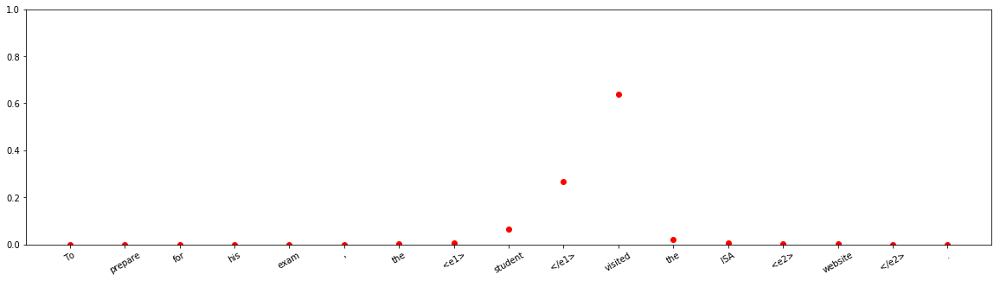












input sentence: Even the most self-contained <e1> stories </e1> have spawned sequels , or even <e2> prequels </e2> .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 5.315421e-05
Entity-Destination(e1,e2) 	:	 5.768984e-12
Cause-Effect(e2,e1) 	:	 1.2504801e-11
Member-Collection(e2,e1) 	:	 1.0001205e-06
Entity-Origin(e1,e2) 	:	 2.2270675e-07
Message-Topic(e1,e2) 	:	 0.0005269579
Component-Whole(e1,e2) 	:	 7.731244e-09
Component-Whole(e2,e1) 	:	 4.8461614e-05
Instrument-Agency(e2,e1) 	:	 1.0915373e-11
Content-Container(e1,e2) 	:	 1.4654981e-09
Product-Producer(e2,e1) 	:	 0.9977362
Cause-Effect(e1,e2) 	:	 4.412438e-05
Product-Producer(e1,e2) 	:	 0.00022038596
Content-Container(e2,e1) 	:	 7.6471355e-07
Entity-Origin(e2,e1) 	:	 5.28573e-06
Message-Topic(e2,e1) 	:	 0.0013635673
Instrument-Agency(e1,e2) 	:	 7.047394e-10
Member-Collection(e1,e2) 	:	 1.1320221e-12
Entity-Destination(e2,e1) 	:	 2.736692e-11



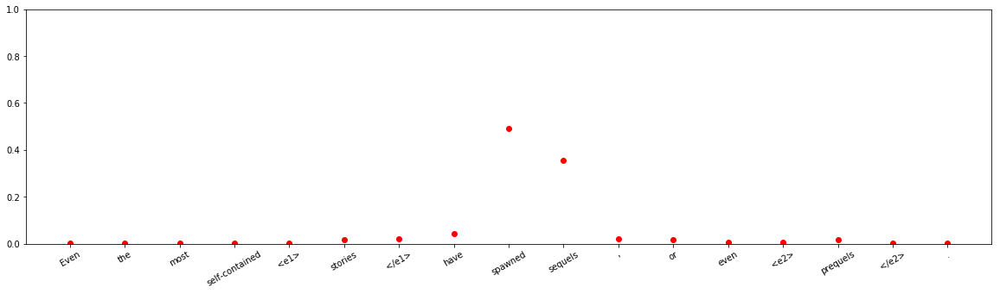



input sentence: His 'intensely personal ' <e1> talk </e1> tackles the great <e2> challenges </e2> facing immigrants today .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.99981374
Entity-Destination(e1,e2) 	:	 4.291497e-14
Cause-Effect(e2,e1) 	:	 4.6513007e-10
Member-Collection(e2,e1) 	:	 1.2283051e-12
Entity-Origin(e1,e2) 	:	 1.1619436e-14
Message-Topic(e1,e2) 	:	 0.0001858755
Component-Whole(e1,e2) 	:	 1.7129562e-10
Component-Whole(e2,e1) 	:	 5.2809584e-10
Instrument-Agency(e2,e1) 	:	 1.2749918e-11
Content-Container(e1,e2) 	:	 4.044229e-13
Product-Producer(e2,e1) 	:	 1.5848268e-14
Cause-Effect(e1,e2) 	:	 6.680483e-10
Product-Producer(e1,e2) 	:	 3.8800335e-10
Content-Container(e2,e1) 	:	 1.2473113e-14
Entity-Origin(e2,e1) 	:	 1.8070128e-12
Message-Topic(e2,e1) 	:	 1.6380747e-07
Instrument-Agency(e1,e2) 	:	 2.1381459e-07
Member-Collection(e1,e2) 	:	 4.5129867e-10
Entity-Destination(e2,e1) 	:	 5.287038e-13



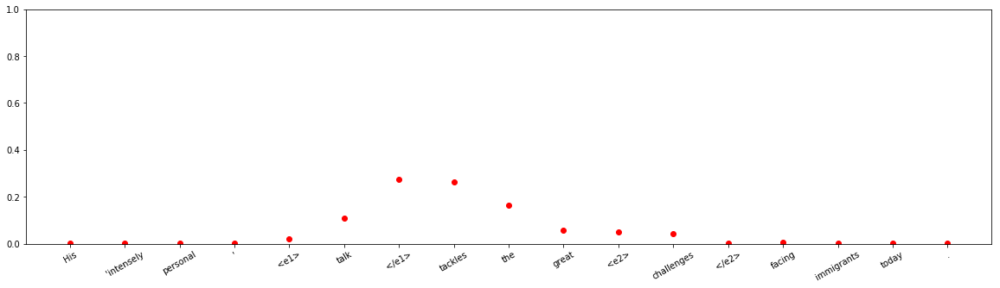


input sentence: My <e1> room </e1> has been moved into the <e2> corner </e2> of the first floor .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 1.2169095e-10
Entity-Destination(e1,e2) 	:	 1.0
Cause-Effect(e2,e1) 	:	 6.516017e-16
Member-Collection(e2,e1) 	:	 1.6548901e-15
Entity-Origin(e1,e2) 	:	 4.3105476e-12
Message-Topic(e1,e2) 	:	 4.256924e-16
Component-Whole(e1,e2) 	:	 2.3155549e-11
Component-Whole(e2,e1) 	:	 4.4771583e-16
Instrument-Agency(e2,e1) 	:	 5.968121e-19
Content-Container(e1,e2) 	:	 3.200638e-13
Product-Producer(e2,e1) 	:	 6.8469108e-15
Cause-Effect(e1,e2) 	:	 1.1245354e-16
Product-Producer(e1,e2) 	:	 3.7680607e-16
Content-Container(e2,e1) 	:	 2.2434276e-14
Entity-Origin(e2,e1) 	:	 3.2431596e-15
Message-Topic(e2,e1) 	:	 2.9942406e-16
Instrument-Agency(e1,e2) 	:	 1.06680395e-14
Member-Collection(e1,e2) 	:	 1.1496262e-11
Entity-Destination(e2,e1) 	:	 4.6934155e-17



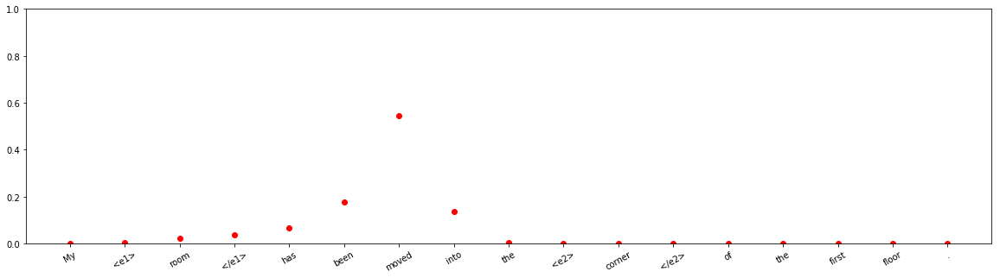


input sentence: It 's a <e1> file cabinet </e1> in Washington with an <e2> IOU </e2> in it .
answer label:    Content-Container(e2,e1)
wrong label:    Content-Container(e1,e2)
Other 	:	 1.5833564e-05
Entity-Destination(e1,e2) 	:	 2.387669e-08
Cause-Effect(e2,e1) 	:	 5.152156e-13
Member-Collection(e2,e1) 	:	 2.9812554e-08
Entity-Origin(e1,e2) 	:	 7.1988143e-06
Message-Topic(e1,e2) 	:	 2.9452428e-07
Component-Whole(e1,e2) 	:	 0.00016426621
Component-Whole(e2,e1) 	:	 0.000587975
Instrument-Agency(e2,e1) 	:	 0.00061094464
Content-Container(e1,e2) 	:	 0.7406397
Product-Producer(e2,e1) 	:	 0.00030676284
Cause-Effect(e1,e2) 	:	 9.531304e-12
Product-Producer(e1,e2) 	:	 2.1328486e-05
Content-Container(e2,e1) 	:	 0.25760704
Entity-Origin(e2,e1) 	:	 2.8891128e-08
Message-Topic(e2,e1) 	:	 2.2664834e-07
Instrument-Agency(e1,e2) 	:	 3.8367012e-05
Member-Collection(e1,e2) 	:	 3.4426662e-08
Entity-Destination(e2,e1) 	:	 2.9382712e-09



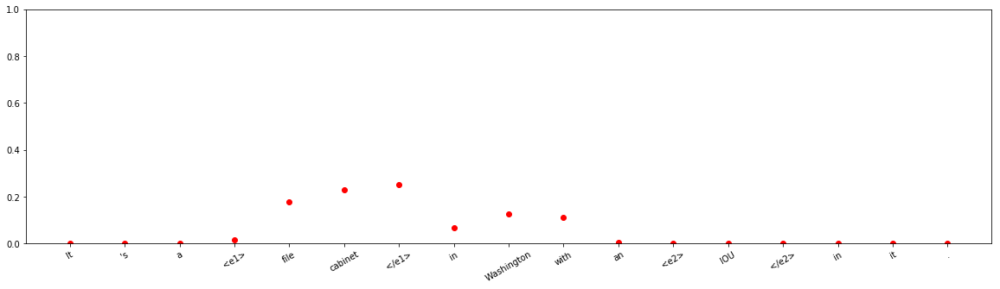




input sentence: The Dallas wide <e1> receiver </e1> reacts after coming up with a big <e2> catch </e2> .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.0007274648
Entity-Destination(e1,e2) 	:	 5.8291094e-10
Cause-Effect(e2,e1) 	:	 1.1379923e-05
Member-Collection(e2,e1) 	:	 1.6622058e-10
Entity-Origin(e1,e2) 	:	 7.481358e-06
Message-Topic(e1,e2) 	:	 1.1200421e-10
Component-Whole(e1,e2) 	:	 9.368265e-06
Component-Whole(e2,e1) 	:	 0.0042937743
Instrument-Agency(e2,e1) 	:	 0.99421704
Content-Container(e1,e2) 	:	 6.522759e-05
Product-Producer(e2,e1) 	:	 0.00019081456
Cause-Effect(e1,e2) 	:	 1.2752929e-06
Product-Producer(e1,e2) 	:	 1.9619324e-07
Content-Container(e2,e1) 	:	 7.572567e-05
Entity-Origin(e2,e1) 	:	 8.8743006e-11
Message-Topic(e2,e1) 	:	 6.726533e-11
Instrument-Agency(e1,e2) 	:	 0.0004001974
Member-Collection(e1,e2) 	:	 1.4323113e-08
Entity-Destination(e2,e1) 	:	 6.640177e-09



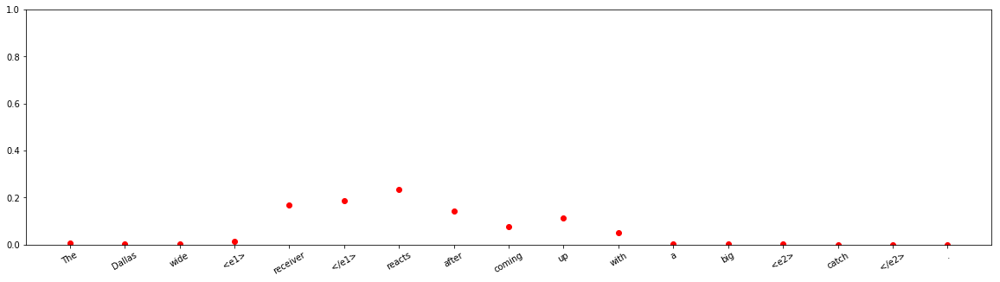







input sentence: Former <e1> baseball </e1> <e2> arbitrator </e2> Thomas Roberts died due to age-related complications last Wednesday .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 3.949386e-07
Entity-Destination(e1,e2) 	:	 5.581166e-09
Cause-Effect(e2,e1) 	:	 3.3739842e-09
Member-Collection(e2,e1) 	:	 0.0026917637
Entity-Origin(e1,e2) 	:	 9.352732e-07
Message-Topic(e1,e2) 	:	 7.796504e-06
Component-Whole(e1,e2) 	:	 7.220458e-09
Component-Whole(e2,e1) 	:	 2.8276108e-12
Instrument-Agency(e2,e1) 	:	 1.2969784e-06
Content-Container(e1,e2) 	:	 3.7133898e-07
Product-Producer(e2,e1) 	:	 0.0009865353
Cause-Effect(e1,e2) 	:	 6.5586346e-07
Product-Producer(e1,e2) 	:	 0.0022433407
Content-Container(e2,e1) 	:	 5.592977e-06
Entity-Origin(e2,e1) 	:	 4.1409767e-06
Message-Topic(e2,e1) 	:	 2.9791667e-07
Instrument-Agency(e1,e2) 	:	 0.0002706997
Member-Collection(e1,e2) 	:	 0.9937862
Entity-Destination(e2,e1) 	:	 9.1320596e-09



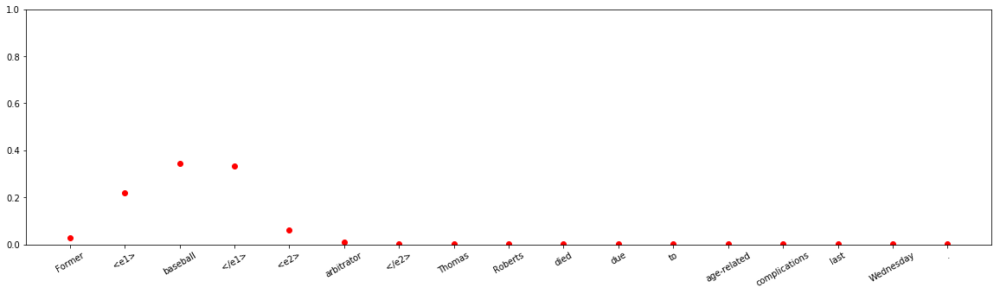



input sentence: Both <e1> squads </e1> battered the opposing goaltender with a continuous flurry of <e2> shots </e2> .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 3.059091e-11
Entity-Destination(e1,e2) 	:	 1.3248541e-12
Cause-Effect(e2,e1) 	:	 9.159585e-08
Member-Collection(e2,e1) 	:	 3.9356202e-08
Entity-Origin(e1,e2) 	:	 1.6586899e-08
Message-Topic(e1,e2) 	:	 1.7978116e-11
Component-Whole(e1,e2) 	:	 1.3260753e-08
Component-Whole(e2,e1) 	:	 0.0008844825
Instrument-Agency(e2,e1) 	:	 0.9991128
Content-Container(e1,e2) 	:	 2.486868e-10
Product-Producer(e2,e1) 	:	 2.6897304e-10
Cause-Effect(e1,e2) 	:	 2.0141308e-06
Product-Producer(e1,e2) 	:	 2.2189204e-12
Content-Container(e2,e1) 	:	 4.133538e-07
Entity-Origin(e2,e1) 	:	 1.6294802e-12
Message-Topic(e2,e1) 	:	 7.57325e-13
Instrument-Agency(e1,e2) 	:	 1.102354e-07
Member-Collection(e1,e2) 	:	 7.1882465e-12
Entity-Destination(e2,e1) 	:	 1.5512352e-12



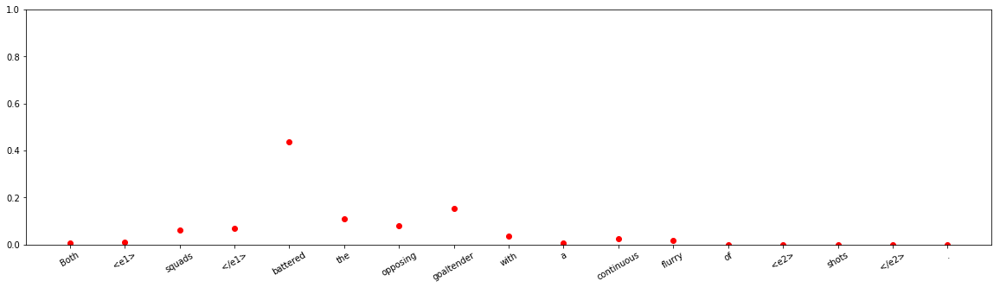


input sentence: Larger <e1> batteries </e1> provide standby <e2> power </e2> for telephone exchanges or computer data centers .
answer label:    Cause-Effect(e1,e2)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 2.725242e-09
Entity-Destination(e1,e2) 	:	 2.1412286e-07
Cause-Effect(e2,e1) 	:	 1.3876814e-07
Member-Collection(e2,e1) 	:	 1.3272363e-07
Entity-Origin(e1,e2) 	:	 4.070969e-08
Message-Topic(e1,e2) 	:	 5.2456453e-08
Component-Whole(e1,e2) 	:	 0.0053461213
Component-Whole(e2,e1) 	:	 0.004637359
Instrument-Agency(e2,e1) 	:	 1.3314603e-07
Content-Container(e1,e2) 	:	 2.3972107e-06
Product-Producer(e2,e1) 	:	 7.147281e-08
Cause-Effect(e1,e2) 	:	 0.0073570046
Product-Producer(e1,e2) 	:	 4.119334e-06
Content-Container(e2,e1) 	:	 0.0020404751
Entity-Origin(e2,e1) 	:	 3.1741216e-05
Message-Topic(e2,e1) 	:	 3.3834786e-12
Instrument-Agency(e1,e2) 	:	 0.98058003
Member-Collection(e1,e2) 	:	 5.5232757e-08
Entity-Destination(e2,e1) 	:	 4.439685e-08



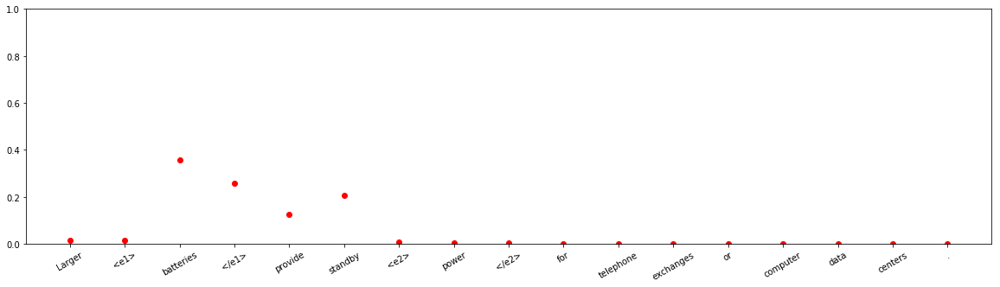


input sentence: A <e1> sweeper </e1> starts at an <e2> end </e2> then runs to the opposite end .
answer label:    Entity-Origin(e1,e2)
wrong label:    Other
Other 	:	 0.99994826
Entity-Destination(e1,e2) 	:	 3.0255062e-11
Cause-Effect(e2,e1) 	:	 2.557463e-08
Member-Collection(e2,e1) 	:	 1.1554215e-13
Entity-Origin(e1,e2) 	:	 3.415885e-05
Message-Topic(e1,e2) 	:	 1.8324861e-13
Component-Whole(e1,e2) 	:	 2.0898332e-09
Component-Whole(e2,e1) 	:	 2.4599813e-06
Instrument-Agency(e2,e1) 	:	 1.1874106e-05
Content-Container(e1,e2) 	:	 1.9586641e-06
Product-Producer(e2,e1) 	:	 4.5281e-09
Cause-Effect(e1,e2) 	:	 6.585607e-13
Product-Producer(e1,e2) 	:	 3.7271705e-10
Content-Container(e2,e1) 	:	 2.3124218e-10
Entity-Origin(e2,e1) 	:	 7.778947e-13
Message-Topic(e2,e1) 	:	 1.9553285e-12
Instrument-Agency(e1,e2) 	:	 1.203999e-06
Member-Collection(e1,e2) 	:	 1.2911665e-08
Entity-Destination(e2,e1) 	:	 7.541818e-12



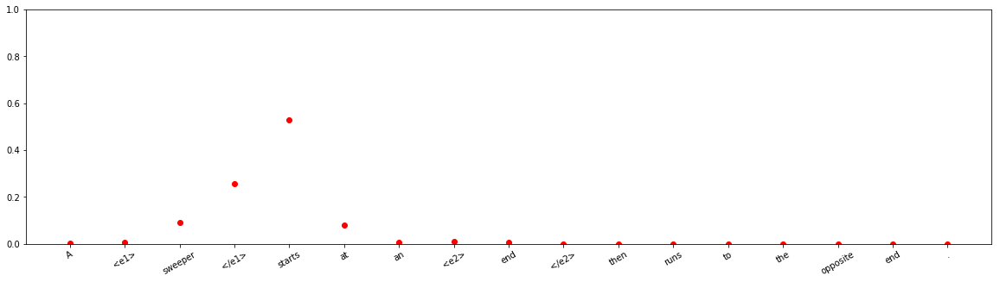



input sentence: I finished my little 30s puff <e1> sleeve </e1> <e2> blouse </e2> last night/early this morning .
answer label:    Component-Whole(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.0128124e-09
Entity-Destination(e1,e2) 	:	 5.560249e-08
Cause-Effect(e2,e1) 	:	 1.8786685e-07
Member-Collection(e2,e1) 	:	 2.9798946e-07
Entity-Origin(e1,e2) 	:	 1.3390363e-08
Message-Topic(e1,e2) 	:	 1.6399111e-08
Component-Whole(e1,e2) 	:	 0.013096879
Component-Whole(e2,e1) 	:	 0.98689747
Instrument-Agency(e2,e1) 	:	 1.308471e-07
Content-Container(e1,e2) 	:	 3.213177e-06
Product-Producer(e2,e1) 	:	 2.561935e-09
Cause-Effect(e1,e2) 	:	 4.516742e-09
Product-Producer(e1,e2) 	:	 2.8239251e-08
Content-Container(e2,e1) 	:	 1.731119e-06
Entity-Origin(e2,e1) 	:	 3.8334152e-11
Message-Topic(e2,e1) 	:	 4.728175e-08
Instrument-Agency(e1,e2) 	:	 3.243481e-08
Member-Collection(e1,e2) 	:	 5.155913e-12
Entity-Destination(e2,e1) 	:	 8.29277e-10



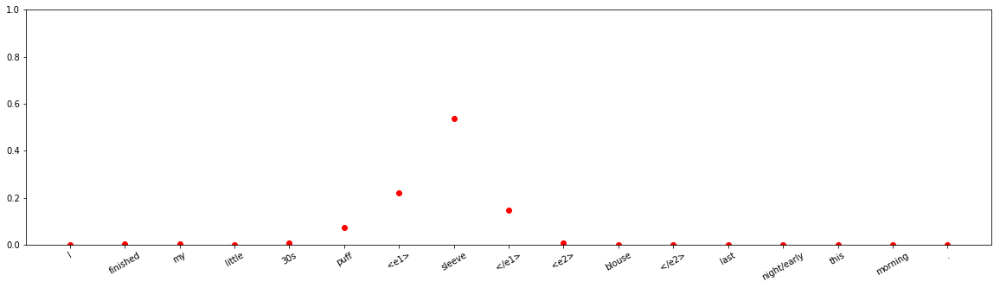


input sentence: <e1> Concerns </e1> regarding <e2> data protection </e2> had been raised by a number of authorities .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 9.851171e-11
Entity-Destination(e1,e2) 	:	 3.1071087e-10
Cause-Effect(e2,e1) 	:	 1.7412633e-05
Member-Collection(e2,e1) 	:	 2.5524428e-06
Entity-Origin(e1,e2) 	:	 3.9493773e-12
Message-Topic(e1,e2) 	:	 0.006108356
Component-Whole(e1,e2) 	:	 8.384438e-11
Component-Whole(e2,e1) 	:	 5.461864e-08
Instrument-Agency(e2,e1) 	:	 5.0815624e-10
Content-Container(e1,e2) 	:	 6.510212e-10
Product-Producer(e2,e1) 	:	 1.8814432e-06
Cause-Effect(e1,e2) 	:	 0.99307585
Product-Producer(e1,e2) 	:	 1.6613061e-09
Content-Container(e2,e1) 	:	 1.2690437e-07
Entity-Origin(e2,e1) 	:	 4.2964984e-07
Message-Topic(e2,e1) 	:	 0.00079331396
Instrument-Agency(e1,e2) 	:	 1.6669885e-08
Member-Collection(e1,e2) 	:	 6.446179e-11
Entity-Destination(e2,e1) 	:	 3.5165284e-09



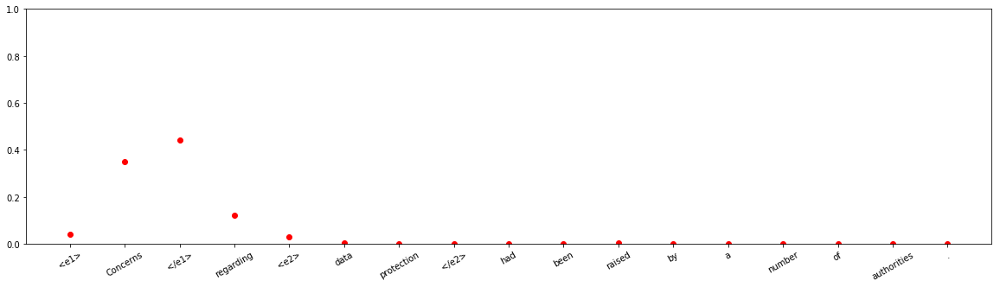


input sentence: The <e1> program </e1> creates sound using individually recorded <e2> notes </e2> from a real piano .
answer label:    Component-Whole(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.9680515e-13
Entity-Destination(e1,e2) 	:	 5.047693e-12
Cause-Effect(e2,e1) 	:	 1.0453896e-06
Member-Collection(e2,e1) 	:	 2.8468642e-07
Entity-Origin(e1,e2) 	:	 6.8414797e-06
Message-Topic(e1,e2) 	:	 4.5655786e-09
Component-Whole(e1,e2) 	:	 4.546138e-10
Component-Whole(e2,e1) 	:	 0.46753293
Instrument-Agency(e2,e1) 	:	 0.030011715
Content-Container(e1,e2) 	:	 8.3209113e-07
Product-Producer(e2,e1) 	:	 0.50230193
Cause-Effect(e1,e2) 	:	 0.0001308252
Product-Producer(e1,e2) 	:	 3.1930365e-06
Content-Container(e2,e1) 	:	 8.117116e-06
Entity-Origin(e2,e1) 	:	 2.5457636e-10
Message-Topic(e2,e1) 	:	 2.1163535e-06
Instrument-Agency(e1,e2) 	:	 1.3709426e-07
Member-Collection(e1,e2) 	:	 9.260501e-12
Entity-Destination(e2,e1) 	:	 8.2716384e-10



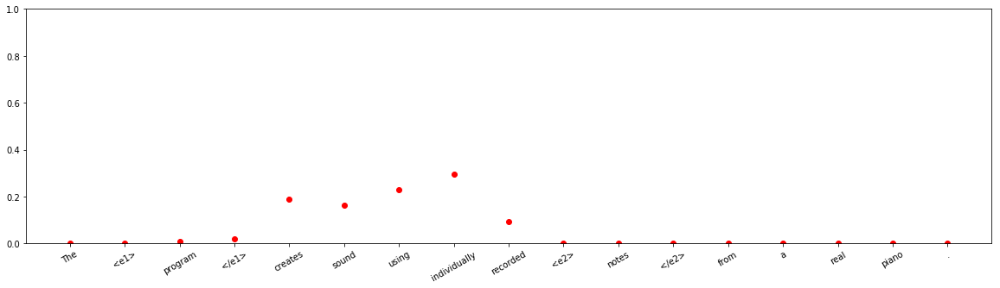







input sentence: The <e1> court </e1> instead achieved the desired flexibility using a harmless error <e2> rule </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.6068772
Entity-Destination(e1,e2) 	:	 2.387695e-10
Cause-Effect(e2,e1) 	:	 1.7689828e-08
Member-Collection(e2,e1) 	:	 1.2021098e-13
Entity-Origin(e1,e2) 	:	 1.1547996e-09
Message-Topic(e1,e2) 	:	 1.3349837e-10
Component-Whole(e1,e2) 	:	 4.9381377e-10
Component-Whole(e2,e1) 	:	 1.5587743e-08
Instrument-Agency(e2,e1) 	:	 0.39311805
Content-Container(e1,e2) 	:	 4.2205857e-09
Product-Producer(e2,e1) 	:	 3.6975496e-06
Cause-Effect(e1,e2) 	:	 1.9149532e-08
Product-Producer(e1,e2) 	:	 5.6440904e-11
Content-Container(e2,e1) 	:	 4.0755923e-09
Entity-Origin(e2,e1) 	:	 1.24608e-10
Message-Topic(e2,e1) 	:	 3.5731706e-08
Instrument-Agency(e1,e2) 	:	 1.0469358e-06
Member-Collection(e1,e2) 	:	 5.3824348e-11
Entity-Destination(e2,e1) 	:	 9.015253e-12



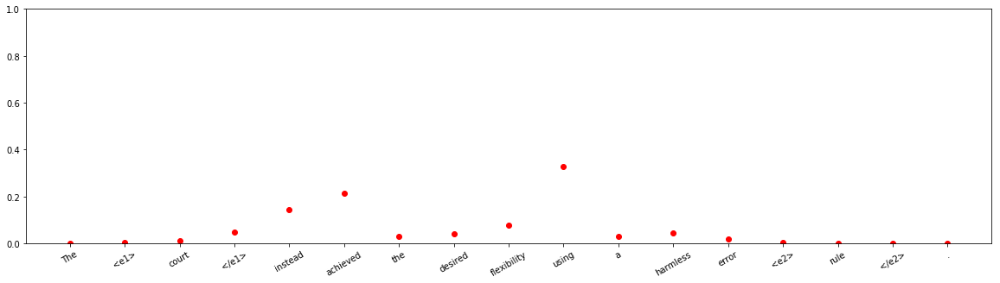







input sentence: Feminist <e1> science fiction </e1> tends to deal with women 's <e2> roles </e2> in society .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9954399
Entity-Destination(e1,e2) 	:	 8.107826e-12
Cause-Effect(e2,e1) 	:	 1.3277328e-05
Member-Collection(e2,e1) 	:	 1.2869613e-07
Entity-Origin(e1,e2) 	:	 1.2064932e-09
Message-Topic(e1,e2) 	:	 0.00038624328
Component-Whole(e1,e2) 	:	 3.5845487e-06
Component-Whole(e2,e1) 	:	 8.638333e-07
Instrument-Agency(e2,e1) 	:	 0.0033731738
Content-Container(e1,e2) 	:	 1.5405353e-08
Product-Producer(e2,e1) 	:	 2.4455326e-07
Cause-Effect(e1,e2) 	:	 0.00071880233
Product-Producer(e1,e2) 	:	 9.205596e-08
Content-Container(e2,e1) 	:	 1.702524e-05
Entity-Origin(e2,e1) 	:	 2.1474109e-07
Message-Topic(e2,e1) 	:	 3.3079252e-07
Instrument-Agency(e1,e2) 	:	 4.6117402e-05
Member-Collection(e1,e2) 	:	 9.1941335e-09
Entity-Destination(e2,e1) 	:	 2.418314e-09



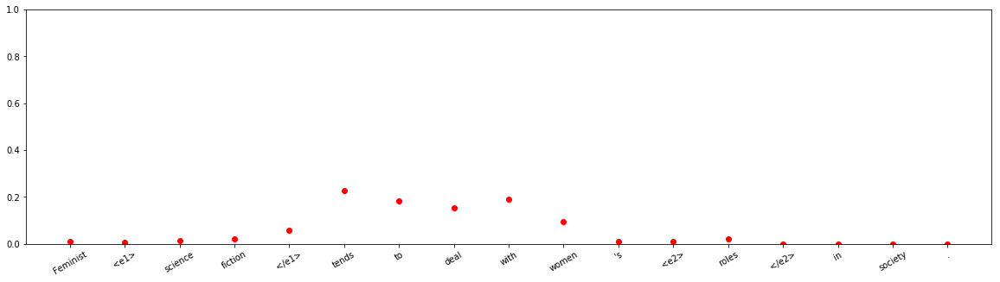


input sentence: Express <e1> buses </e1> depart the <e2> airport </e2> every 1 hour from 6.00 until 1.00 .
answer label:    Entity-Origin(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 8.629728e-05
Entity-Destination(e1,e2) 	:	 0.9859475
Cause-Effect(e2,e1) 	:	 5.6014735e-09
Member-Collection(e2,e1) 	:	 1.9788206e-06
Entity-Origin(e1,e2) 	:	 0.013789229
Message-Topic(e1,e2) 	:	 8.242884e-08
Component-Whole(e1,e2) 	:	 7.2817716e-07
Component-Whole(e2,e1) 	:	 5.7433686e-10
Instrument-Agency(e2,e1) 	:	 0.00016086348
Content-Container(e1,e2) 	:	 3.555052e-08
Product-Producer(e2,e1) 	:	 7.997521e-07
Cause-Effect(e1,e2) 	:	 3.7650615e-11
Product-Producer(e1,e2) 	:	 1.25638815e-08
Content-Container(e2,e1) 	:	 1.0625426e-09
Entity-Origin(e2,e1) 	:	 3.367744e-06
Message-Topic(e2,e1) 	:	 5.2298486e-07
Instrument-Agency(e1,e2) 	:	 3.044648e-06
Member-Collection(e1,e2) 	:	 5.5183796e-06
Entity-Destination(e2,e1) 	:	 1.2474183e-10



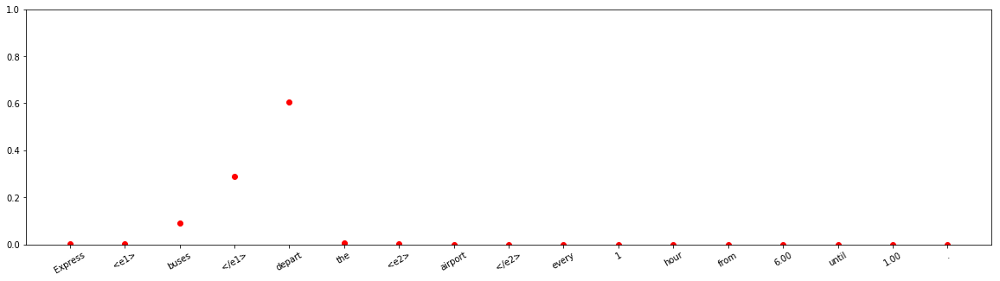







input sentence: Diabetic peanut butter cookies <e1> recipe </e1> from the diabetic recipe <e2> collection </e2> at InformationAboutDiabetes.com .
answer label:    Member-Collection(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.232741e-12
Entity-Destination(e1,e2) 	:	 1.8165846e-15
Cause-Effect(e2,e1) 	:	 1.3995733e-13
Member-Collection(e2,e1) 	:	 1.8435794e-16
Entity-Origin(e1,e2) 	:	 1.0
Message-Topic(e1,e2) 	:	 1.3057714e-19
Component-Whole(e1,e2) 	:	 8.1942425e-15
Component-Whole(e2,e1) 	:	 1.463017e-15
Instrument-Agency(e2,e1) 	:	 2.13783e-17
Content-Container(e1,e2) 	:	 9.254026e-09
Product-Producer(e2,e1) 	:	 6.8843342e-12
Cause-Effect(e1,e2) 	:	 3.0900476e-20
Product-Producer(e1,e2) 	:	 1.704064e-08
Content-Container(e2,e1) 	:	 6.3986237e-15
Entity-Origin(e2,e1) 	:	 4.2631752e-11
Message-Topic(e2,e1) 	:	 1.322753e-10
Instrument-Agency(e1,e2) 	:	 1.0400853e-15
Member-Collection(e1,e2) 	:	 1.4441747e-12
Entity-Destination(e2,e1) 	:	 3.624633e-17



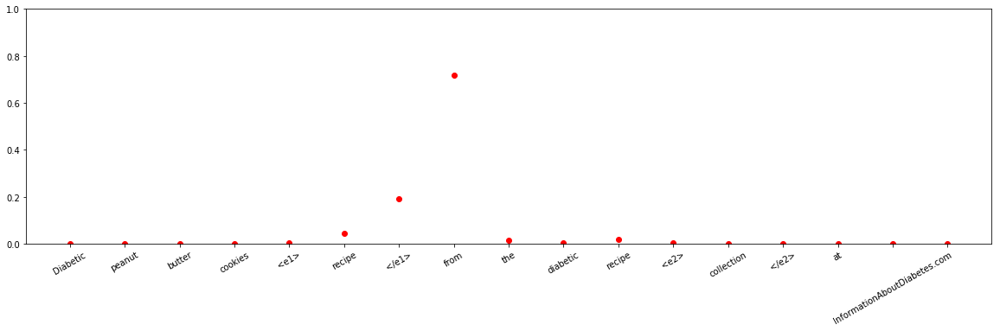






input sentence: The proposed tax helped to push the <e1> candidate </e1> into the Senate <e2> race </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 2.1662728e-12
Entity-Destination(e1,e2) 	:	 0.9999982
Cause-Effect(e2,e1) 	:	 1.7112912e-16
Member-Collection(e2,e1) 	:	 4.3309058e-11
Entity-Origin(e1,e2) 	:	 3.0933926e-08
Message-Topic(e1,e2) 	:	 1.7116996e-12
Component-Whole(e1,e2) 	:	 4.362805e-09
Component-Whole(e2,e1) 	:	 1.8280035e-14
Instrument-Agency(e2,e1) 	:	 1.3594128e-11
Content-Container(e1,e2) 	:	 4.717142e-11
Product-Producer(e2,e1) 	:	 1.196191e-07
Cause-Effect(e1,e2) 	:	 5.3656942e-14
Product-Producer(e1,e2) 	:	 2.1455593e-13
Content-Container(e2,e1) 	:	 8.433283e-13
Entity-Origin(e2,e1) 	:	 4.1898063e-13
Message-Topic(e2,e1) 	:	 1.2523354e-11
Instrument-Agency(e1,e2) 	:	 4.4410957e-13
Member-Collection(e1,e2) 	:	 1.6569161e-06
Entity-Destination(e2,e1) 	:	 4.4385617e-14



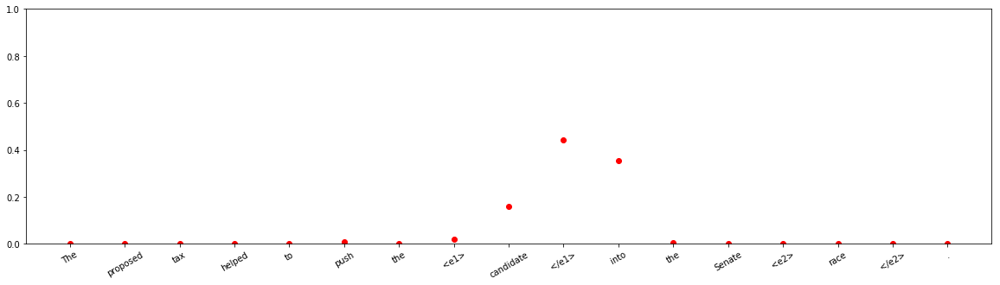





input sentence: Millers checked that the <e1> stones </e1> used for cereal <e2> grinding </e2> were n't overheating .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.078965046
Entity-Destination(e1,e2) 	:	 1.83262e-10
Cause-Effect(e2,e1) 	:	 3.63186e-06
Member-Collection(e2,e1) 	:	 2.1461359e-11
Entity-Origin(e1,e2) 	:	 2.1138376e-06
Message-Topic(e1,e2) 	:	 4.1598833e-10
Component-Whole(e1,e2) 	:	 2.5291016e-05
Component-Whole(e2,e1) 	:	 8.672394e-05
Instrument-Agency(e2,e1) 	:	 7.610535e-05
Content-Container(e1,e2) 	:	 8.829759e-06
Product-Producer(e2,e1) 	:	 8.5847357e-10
Cause-Effect(e1,e2) 	:	 9.720622e-06
Product-Producer(e1,e2) 	:	 7.239843e-08
Content-Container(e2,e1) 	:	 1.0259589e-06
Entity-Origin(e2,e1) 	:	 2.7401413e-06
Message-Topic(e2,e1) 	:	 6.1618083e-10
Instrument-Agency(e1,e2) 	:	 0.92081875
Member-Collection(e1,e2) 	:	 1.2088357e-08
Entity-Destination(e2,e1) 	:	 2.5731547e-10



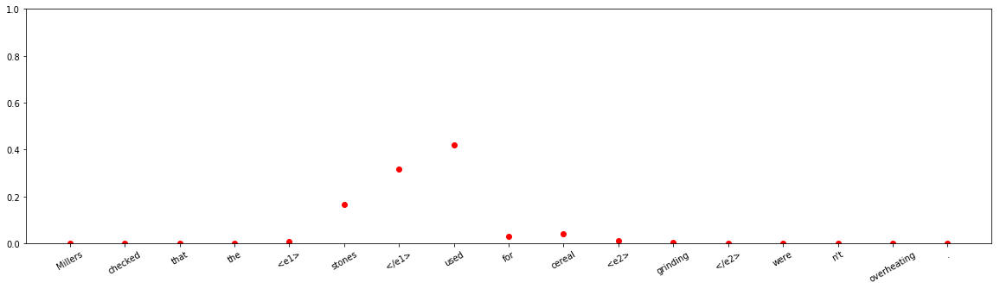








input sentence: The aquarium <e1> wall </e1> was truly the best part of the <e2> experience </e2> here .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.1551799e-06
Entity-Destination(e1,e2) 	:	 5.5644074e-13
Cause-Effect(e2,e1) 	:	 3.9259637e-11
Member-Collection(e2,e1) 	:	 2.0123343e-12
Entity-Origin(e1,e2) 	:	 7.157897e-12
Message-Topic(e1,e2) 	:	 3.3510978e-12
Component-Whole(e1,e2) 	:	 0.9999988
Component-Whole(e2,e1) 	:	 3.9365528e-10
Instrument-Agency(e2,e1) 	:	 3.4229225e-14
Content-Container(e1,e2) 	:	 1.5778559e-11
Product-Producer(e2,e1) 	:	 9.889896e-16
Cause-Effect(e1,e2) 	:	 1.3681008e-12
Product-Producer(e1,e2) 	:	 1.0366046e-11
Content-Container(e2,e1) 	:	 3.009578e-11
Entity-Origin(e2,e1) 	:	 1.1838452e-13
Message-Topic(e2,e1) 	:	 2.9196437e-11
Instrument-Agency(e1,e2) 	:	 2.2629127e-08
Member-Collection(e1,e2) 	:	 4.5522935e-08
Entity-Destination(e2,e1) 	:	 1.8677708e-14



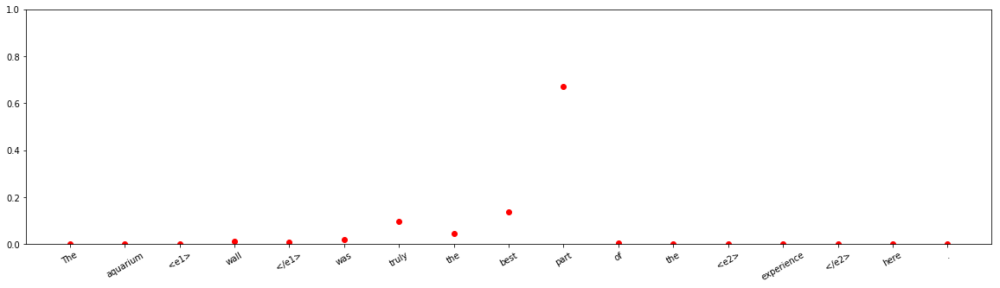









input sentence: My apartment <e1> complex </e1> treated the yard with a <e2> poison </e2> to kill locusts .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.58919275
Entity-Destination(e1,e2) 	:	 8.455e-10
Cause-Effect(e2,e1) 	:	 8.983224e-07
Member-Collection(e2,e1) 	:	 2.5892627e-08
Entity-Origin(e1,e2) 	:	 5.1574734e-08
Message-Topic(e1,e2) 	:	 1.3010255e-07
Component-Whole(e1,e2) 	:	 6.1431035e-07
Component-Whole(e2,e1) 	:	 0.029902076
Instrument-Agency(e2,e1) 	:	 0.38021415
Content-Container(e1,e2) 	:	 4.8192283e-06
Product-Producer(e2,e1) 	:	 7.8268634e-08
Cause-Effect(e1,e2) 	:	 1.8763838e-07
Product-Producer(e1,e2) 	:	 2.733495e-06
Content-Container(e2,e1) 	:	 6.299108e-05
Entity-Origin(e2,e1) 	:	 3.3895233e-07
Message-Topic(e2,e1) 	:	 7.188989e-06
Instrument-Agency(e1,e2) 	:	 0.0006108307
Member-Collection(e1,e2) 	:	 1.5795026e-09
Entity-Destination(e2,e1) 	:	 2.3682307e-09



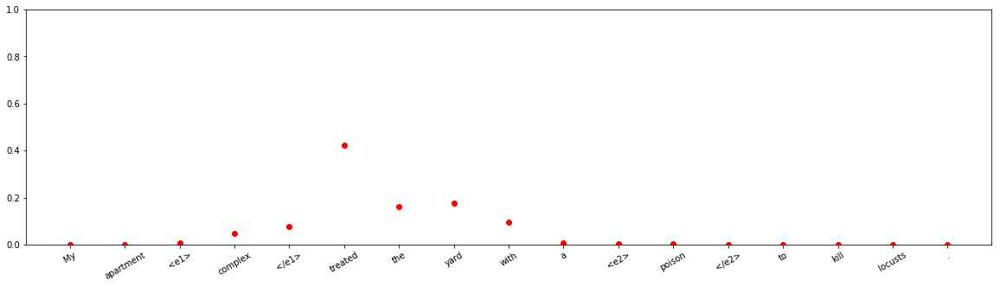


input sentence: The <e1> team </e1> has moved into <e2> fifth place </e2> in career scoring at ND .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 0.073370814
Entity-Destination(e1,e2) 	:	 0.92661566
Cause-Effect(e2,e1) 	:	 3.8772116e-13
Member-Collection(e2,e1) 	:	 1.3172295e-12
Entity-Origin(e1,e2) 	:	 8.649934e-08
Message-Topic(e1,e2) 	:	 1.450932e-13
Component-Whole(e1,e2) 	:	 3.244268e-13
Component-Whole(e2,e1) 	:	 9.995441e-15
Instrument-Agency(e2,e1) 	:	 1.1135467e-09
Content-Container(e1,e2) 	:	 4.714188e-07
Product-Producer(e2,e1) 	:	 8.392888e-07
Cause-Effect(e1,e2) 	:	 1.2143819e-13
Product-Producer(e1,e2) 	:	 9.3664505e-15
Content-Container(e2,e1) 	:	 9.143245e-12
Entity-Origin(e2,e1) 	:	 5.2684437e-11
Message-Topic(e2,e1) 	:	 1.880208e-09
Instrument-Agency(e1,e2) 	:	 9.297299e-12
Member-Collection(e1,e2) 	:	 1.2130325e-05
Entity-Destination(e2,e1) 	:	 1.9463817e-13



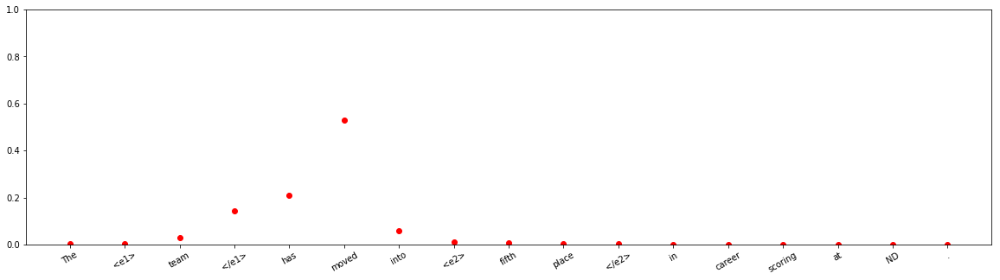




input sentence: Today Miguel Cotto is receiving a <e1> rain </e1> of <e2> offers </e2> to keep fighting .
answer label:    Member-Collection(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.007980638
Entity-Destination(e1,e2) 	:	 2.491663e-09
Cause-Effect(e2,e1) 	:	 1.3899543e-06
Member-Collection(e2,e1) 	:	 0.027078742
Entity-Origin(e1,e2) 	:	 1.4720615e-06
Message-Topic(e1,e2) 	:	 3.4740635e-09
Component-Whole(e1,e2) 	:	 0.00021815603
Component-Whole(e2,e1) 	:	 0.95766246
Instrument-Agency(e2,e1) 	:	 0.002497048
Content-Container(e1,e2) 	:	 0.000112363516
Product-Producer(e2,e1) 	:	 1.4119479e-06
Cause-Effect(e1,e2) 	:	 1.3641117e-08
Product-Producer(e1,e2) 	:	 5.190599e-08
Content-Container(e2,e1) 	:	 0.0034014173
Entity-Origin(e2,e1) 	:	 3.351915e-07
Message-Topic(e2,e1) 	:	 2.402244e-06
Instrument-Agency(e1,e2) 	:	 0.0010422034
Member-Collection(e1,e2) 	:	 4.6152207e-09
Entity-Destination(e2,e1) 	:	 5.093377e-09



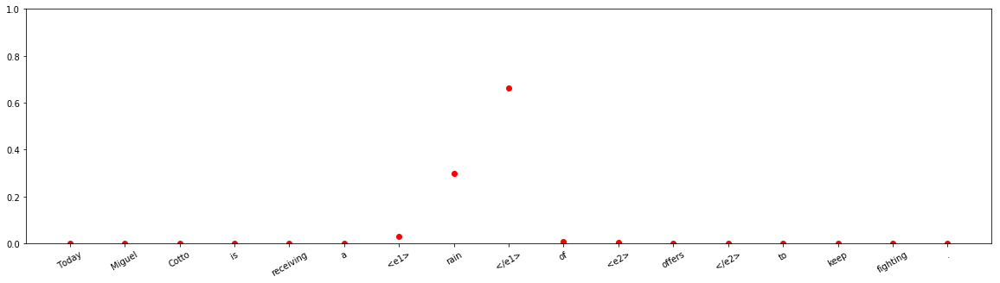



input sentence: <e1> Asteroid </e1> threatened Earth with <e2> disaster </e2> .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 1.1501731e-08
Entity-Destination(e1,e2) 	:	 1.519803e-10
Cause-Effect(e2,e1) 	:	 0.0008700493
Member-Collection(e2,e1) 	:	 4.8269153e-09
Entity-Origin(e1,e2) 	:	 7.986737e-12
Message-Topic(e1,e2) 	:	 1.8771478e-09
Component-Whole(e1,e2) 	:	 4.360012e-10
Component-Whole(e2,e1) 	:	 2.642942e-11
Instrument-Agency(e2,e1) 	:	 2.2263901e-08
Content-Container(e1,e2) 	:	 6.089134e-12
Product-Producer(e2,e1) 	:	 6.3924313e-12
Cause-Effect(e1,e2) 	:	 0.99912983
Product-Producer(e1,e2) 	:	 5.064184e-12
Content-Container(e2,e1) 	:	 3.1299047e-10
Entity-Origin(e2,e1) 	:	 1.4715321e-11
Message-Topic(e2,e1) 	:	 2.8297842e-11
Instrument-Agency(e1,e2) 	:	 1.1080391e-07
Member-Collection(e1,e2) 	:	 8.560707e-09
Entity-Destination(e2,e1) 	:	 2.8576088e-11



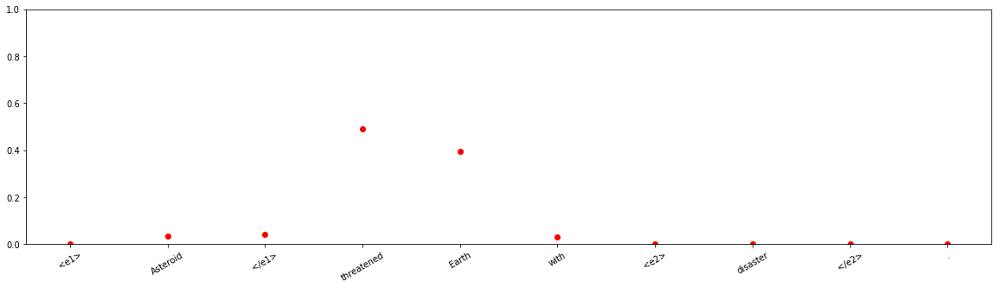









input sentence: <e1> Cancellations </e1> were notified by <e2> mail </e2> .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 5.7086336e-09
Entity-Destination(e1,e2) 	:	 0.0013103583
Cause-Effect(e2,e1) 	:	 0.9900032
Member-Collection(e2,e1) 	:	 3.3457017e-08
Entity-Origin(e1,e2) 	:	 4.703694e-06
Message-Topic(e1,e2) 	:	 2.635311e-10
Component-Whole(e1,e2) 	:	 3.6398197e-07
Component-Whole(e2,e1) 	:	 1.4397487e-07
Instrument-Agency(e2,e1) 	:	 1.8951838e-05
Content-Container(e1,e2) 	:	 5.8357733e-07
Product-Producer(e2,e1) 	:	 1.0781241e-08
Cause-Effect(e1,e2) 	:	 2.5614713e-10
Product-Producer(e1,e2) 	:	 0.001534678
Content-Container(e2,e1) 	:	 1.6359511e-06
Entity-Origin(e2,e1) 	:	 2.2194593e-10
Message-Topic(e2,e1) 	:	 0.006713355
Instrument-Agency(e1,e2) 	:	 0.00041200512
Member-Collection(e1,e2) 	:	 2.2033733e-09
Entity-Destination(e2,e1) 	:	 1.198959e-09



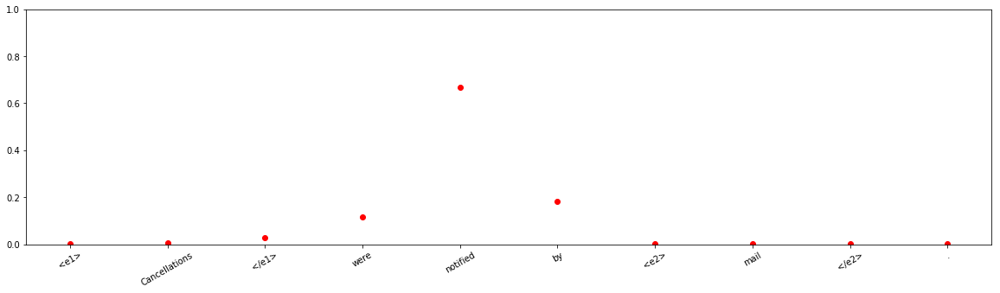






input sentence: The <e1> captain </e1> and the <e2> crew </e2> of the Steve Irwin are grateful for the support of the City of Fremantle and Mayor Brad Pettitt for hosting the event .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 1.8723984e-05
Entity-Destination(e1,e2) 	:	 2.0757567e-09
Cause-Effect(e2,e1) 	:	 1.903815e-09
Member-Collection(e2,e1) 	:	 0.0032282772
Entity-Origin(e1,e2) 	:	 7.772775e-08
Message-Topic(e1,e2) 	:	 1.2195485e-05
Component-Whole(e1,e2) 	:	 2.3858752e-07
Component-Whole(e2,e1) 	:	 1.5781669e-10
Instrument-Agency(e2,e1) 	:	 3.3919198e-06
Content-Container(e1,e2) 	:	 3.5275832e-08
Product-Producer(e2,e1) 	:	 9.3410215e-08
Cause-Effect(e1,e2) 	:	 2.390673e-08
Product-Producer(e1,e2) 	:	 2.544162e-06
Content-Container(e2,e1) 	:	 2.3428152e-06
Entity-Origin(e2,e1) 	:	 1.9469129e-08
Message-Topic(e2,e1) 	:	 4.5469633e-09
Instrument-Agency(e1,e2) 	:	 0.021724194
Member-Collection(e1,e2) 	:	 0.9750079
Entity-Destination(e2,e1) 	:	 4.249

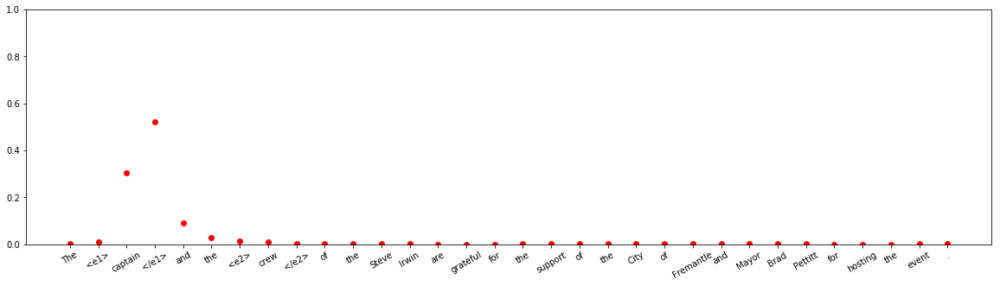


input sentence: She 's the lead vocalist and has a <e1> sound </e1> that captures the listener with a <e2> combination </e2> of a British/Scandinavian accent that 's not lost in the mix .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 3.6218416e-06
Entity-Destination(e1,e2) 	:	 5.7690763e-10
Cause-Effect(e2,e1) 	:	 0.04879214
Member-Collection(e2,e1) 	:	 4.1540598e-09
Entity-Origin(e1,e2) 	:	 9.02923e-12
Message-Topic(e1,e2) 	:	 1.4393369e-08
Component-Whole(e1,e2) 	:	 5.0463334e-10
Component-Whole(e2,e1) 	:	 0.003029395
Instrument-Agency(e2,e1) 	:	 0.948096
Content-Container(e1,e2) 	:	 2.4561624e-09
Product-Producer(e2,e1) 	:	 3.3564592e-07
Cause-Effect(e1,e2) 	:	 7.1366536e-05
Product-Producer(e1,e2) 	:	 6.065937e-09
Content-Container(e2,e1) 	:	 7.2308796e-07
Entity-Origin(e2,e1) 	:	 9.605829e-12
Message-Topic(e2,e1) 	:	 3.2888406e-07
Instrument-Agency(e1,e2) 	:	 6.2099625e-06
Member-Collection(e1,e2) 	:	 6.82074e-13
Entity-Destination(e2,e1) 	:	 8.5143603

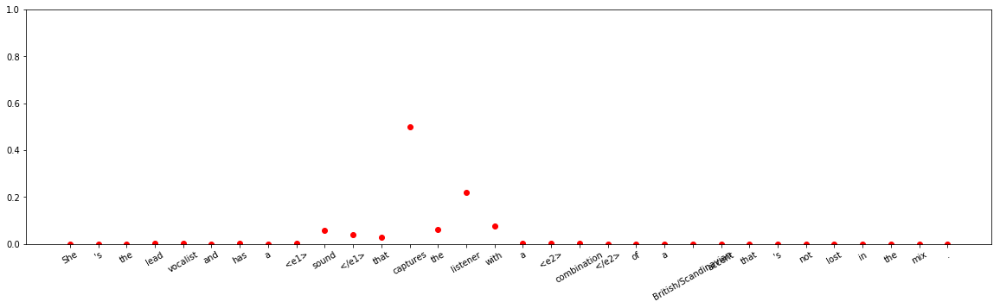






input sentence: In 2006 we reported on a robotic <e1> hand </e1> that formed rock , paper , scissors <e2> gestures </e2> by reading a human subject 's mind via an MRI scanner .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 4.817759e-08
Entity-Destination(e1,e2) 	:	 5.953715e-11
Cause-Effect(e2,e1) 	:	 2.8645504e-08
Member-Collection(e2,e1) 	:	 3.4108712e-07
Entity-Origin(e1,e2) 	:	 1.1843426e-06
Message-Topic(e1,e2) 	:	 3.5827445e-06
Component-Whole(e1,e2) 	:	 0.00044658539
Component-Whole(e2,e1) 	:	 0.9973386
Instrument-Agency(e2,e1) 	:	 0.00017181986
Content-Container(e1,e2) 	:	 3.3773118e-05
Product-Producer(e2,e1) 	:	 0.00012449101
Cause-Effect(e1,e2) 	:	 2.1561398e-06
Product-Producer(e1,e2) 	:	 0.00085624354
Content-Container(e2,e1) 	:	 9.994999e-05
Entity-Origin(e2,e1) 	:	 2.9876355e-07
Message-Topic(e2,e1) 	:	 9.199103e-08
Instrument-Agency(e1,e2) 	:	 0.0009206565
Member-Collection(e1,e2) 	:	 2.9730163e-10
Entity-Destination(e2,e1) 	:	 1.0139991e-

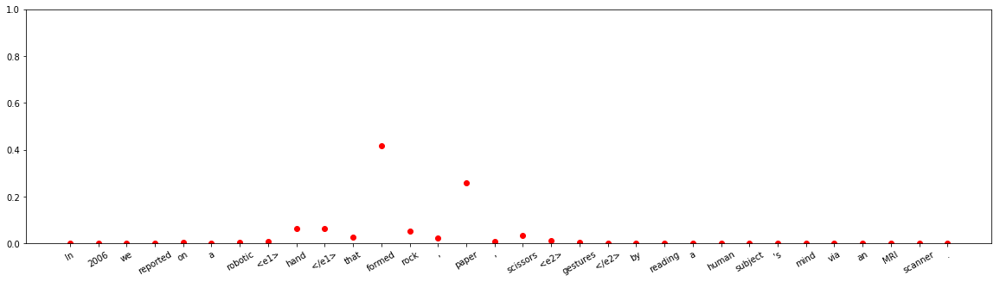






input sentence: A new Mechanobiology Research Centre of Excellence ( RCE ) aims to break new ground in the <e1> study </e1> of diseases through the <e2> mechanisms </e2> of cell and tissue .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.002811622
Entity-Destination(e1,e2) 	:	 2.028666e-09
Cause-Effect(e2,e1) 	:	 0.0031341647
Member-Collection(e2,e1) 	:	 1.8058192e-06
Entity-Origin(e1,e2) 	:	 1.0154287e-06
Message-Topic(e1,e2) 	:	 0.12247306
Component-Whole(e1,e2) 	:	 0.8619329
Component-Whole(e2,e1) 	:	 0.0066696247
Instrument-Agency(e2,e1) 	:	 0.00260491
Content-Container(e1,e2) 	:	 1.5772154e-07
Product-Producer(e2,e1) 	:	 3.5060327e-07
Cause-Effect(e1,e2) 	:	 1.7746279e-06
Product-Producer(e1,e2) 	:	 0.00010316771
Content-Container(e2,e1) 	:	 3.5662697e-06
Entity-Origin(e2,e1) 	:	 9.994646e-07
Message-Topic(e2,e1) 	:	 0.00010568802
Instrument-Agency(e1,e2) 	:	 0.00015469447
Member-Collection(e1,e2) 	:	 3.1947553e-07
Entity-Destination(e2,e1) 	:	 1.01

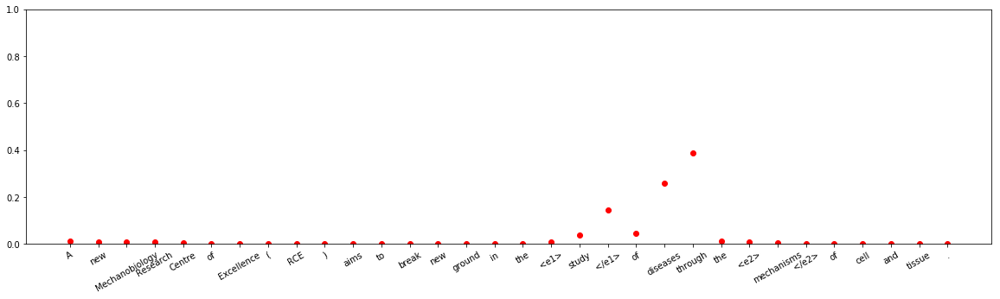









input sentence: As I travelled the world and had facials in every corner , I have finally found a <e1> therapist </e1> with such a perfect <e2> way </e2> of touching my face .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.9999788
Entity-Destination(e1,e2) 	:	 1.2662557e-12
Cause-Effect(e2,e1) 	:	 1.8796988e-10
Member-Collection(e2,e1) 	:	 5.3370776e-12
Entity-Origin(e1,e2) 	:	 1.064504e-12
Message-Topic(e1,e2) 	:	 1.1758877e-11
Component-Whole(e1,e2) 	:	 1.5418144e-12
Component-Whole(e2,e1) 	:	 6.289322e-08
Instrument-Agency(e2,e1) 	:	 2.1077978e-05
Content-Container(e1,e2) 	:	 1.7862468e-10
Product-Producer(e2,e1) 	:	 5.183194e-08
Cause-Effect(e1,e2) 	:	 3.337346e-10
Product-Producer(e1,e2) 	:	 3.6112451e-13
Content-Container(e2,e1) 	:	 6.9577316e-11
Entity-Origin(e2,e1) 	:	 2.7506265e-12
Message-Topic(e2,e1) 	:	 1.5630269e-08
Instrument-Agency(e1,e2) 	:	 1.5280648e-10
Member-Collection(e1,e2) 	:	 1.6526851e-11
Entity-Destination(e2,e1) 	:	 7.3062

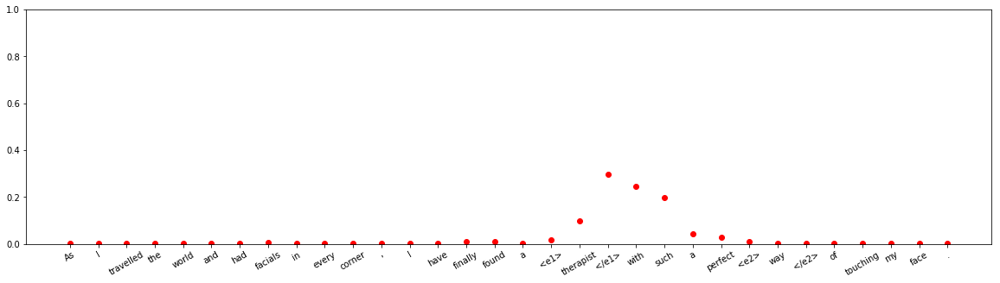




input sentence: In September 2001 President George W. Bush declared a `` War on Terrorism '' and vowed to destroy all <e1> terrorist </e1> <e2> organizations </e2> `` with a global reach '' .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.0030209774
Entity-Destination(e1,e2) 	:	 3.3029817e-08
Cause-Effect(e2,e1) 	:	 5.414232e-06
Member-Collection(e2,e1) 	:	 0.029213123
Entity-Origin(e1,e2) 	:	 1.393149e-07
Message-Topic(e1,e2) 	:	 0.00026950595
Component-Whole(e1,e2) 	:	 1.2763655e-05
Component-Whole(e2,e1) 	:	 1.379676e-09
Instrument-Agency(e2,e1) 	:	 4.3633403e-07
Content-Container(e1,e2) 	:	 1.1854851e-06
Product-Producer(e2,e1) 	:	 2.378994e-06
Cause-Effect(e1,e2) 	:	 0.00095923035
Product-Producer(e1,e2) 	:	 0.00021483876
Content-Container(e2,e1) 	:	 4.0664833e-07
Entity-Origin(e2,e1) 	:	 0.00032995452
Message-Topic(e2,e1) 	:	 7.947537e-06
Instrument-Agency(e1,e2) 	:	 0.01225751
Member-Collection(e1,e2) 	:	 0.9537041
Entity-Destination(e2,e1) 	:	 5.

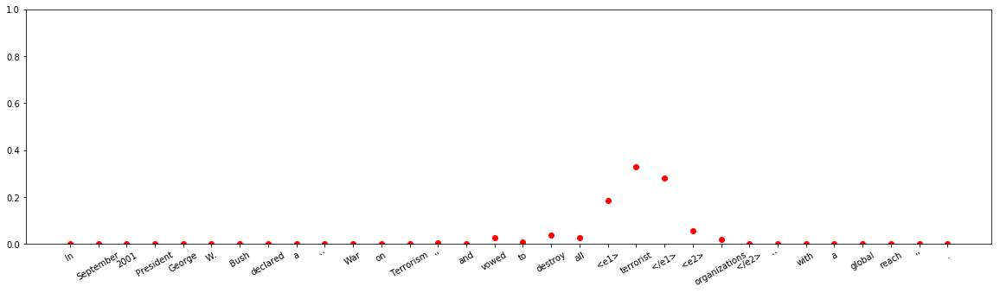






input sentence: Before the Council , Ireland had such a <e1> superfluity </e1> of Catholic <e2> priests </e2> that it exported many of them to Glasgow , England , and the United States .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.000272137
Entity-Destination(e1,e2) 	:	 1.0698258e-12
Cause-Effect(e2,e1) 	:	 1.12654705e-10
Member-Collection(e2,e1) 	:	 0.9996842
Entity-Origin(e1,e2) 	:	 3.4611138e-09
Message-Topic(e1,e2) 	:	 1.5168523e-09
Component-Whole(e1,e2) 	:	 2.6281495e-09
Component-Whole(e2,e1) 	:	 2.6111883e-11
Instrument-Agency(e2,e1) 	:	 4.0524146e-13
Content-Container(e1,e2) 	:	 7.832777e-13
Product-Producer(e2,e1) 	:	 4.572657e-08
Cause-Effect(e1,e2) 	:	 3.4039319e-10
Product-Producer(e1,e2) 	:	 3.6118872e-05
Content-Container(e2,e1) 	:	 1.4031074e-10
Entity-Origin(e2,e1) 	:	 1.4457609e-06
Message-Topic(e2,e1) 	:	 5.883535e-07
Instrument-Agency(e1,e2) 	:	 2.5565535e-08
Member-Collection(e1,e2) 	:	 5.495615e-06
Entity-Destination(e2,e1) 	:	

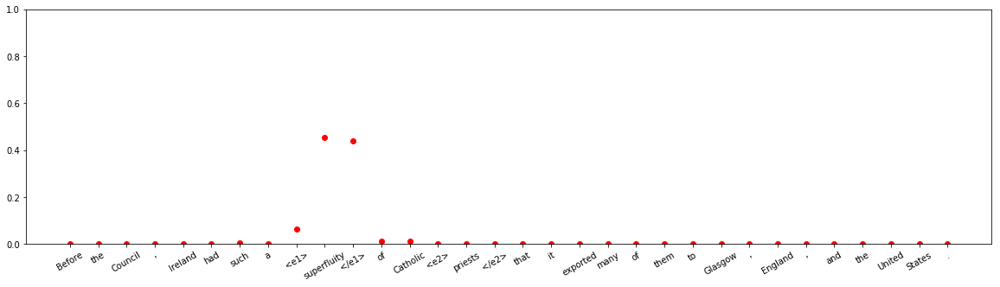












input sentence: A <e1> calendar </e1> of <e2> saints </e2> forms a way of organising a liturgical year on the finely-granulated level of days by assigning each day to association with a saint .
answer label:    Message-Topic(e1,e2)
wrong label:    Member-Collection(e2,e1)
Other 	:	 3.141569e-06
Entity-Destination(e1,e2) 	:	 1.1695073e-13
Cause-Effect(e2,e1) 	:	 9.90933e-13
Member-Collection(e2,e1) 	:	 0.9999901
Entity-Origin(e1,e2) 	:	 8.2008106e-10
Message-Topic(e1,e2) 	:	 3.6521521e-07
Component-Whole(e1,e2) 	:	 9.023873e-09
Component-Whole(e2,e1) 	:	 3.1205888e-10
Instrument-Agency(e2,e1) 	:	 1.0331683e-12
Content-Container(e1,e2) 	:	 2.388576e-10
Product-Producer(e2,e1) 	:	 3.0570766e-09
Cause-Effect(e1,e2) 	:	 7.1315883e-12
Product-Producer(e1,e2) 	:	 2.4634681e-07
Content-Container(e2,e1) 	:	 2.2923474e-07
Entity-Origin(e2,e1) 	:	 6.2284425e-07
Message-Topic(e2,e1) 	:	 2.2630796e-07
Instrument-Agency(e1,e2) 	:	 4.7685967e-06
Member-Collection(e1,e2) 	:	 3.8123952e-07
E

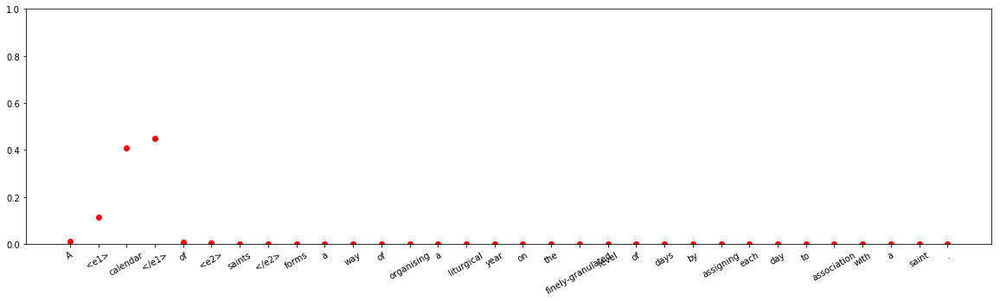






input sentence: A few of her tracks delve more into a pop-rock sound , and the petit <e1> blonde </e1> performs with a sweet , southern <e2> voice </e2> made for the genre .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 4.5896204e-06
Entity-Destination(e1,e2) 	:	 4.6278138e-12
Cause-Effect(e2,e1) 	:	 6.6784025e-07
Member-Collection(e2,e1) 	:	 1.3568025e-05
Entity-Origin(e1,e2) 	:	 2.8239074e-06
Message-Topic(e1,e2) 	:	 2.5782904e-10
Component-Whole(e1,e2) 	:	 1.6318198e-08
Component-Whole(e2,e1) 	:	 0.6163604
Instrument-Agency(e2,e1) 	:	 0.37603694
Content-Container(e1,e2) 	:	 7.3971876e-08
Product-Producer(e2,e1) 	:	 0.007546945
Cause-Effect(e1,e2) 	:	 3.0862398e-06
Product-Producer(e1,e2) 	:	 3.541548e-06
Content-Container(e2,e1) 	:	 9.604975e-07
Entity-Origin(e2,e1) 	:	 1.598101e-08
Message-Topic(e2,e1) 	:	 1.0574091e-06
Instrument-Agency(e1,e2) 	:	 2.5293906e-05
Member-Collection(e1,e2) 	:	 5.0960654e-08
Entity-Destination(e2,e1) 	:	 6.9169834e-09



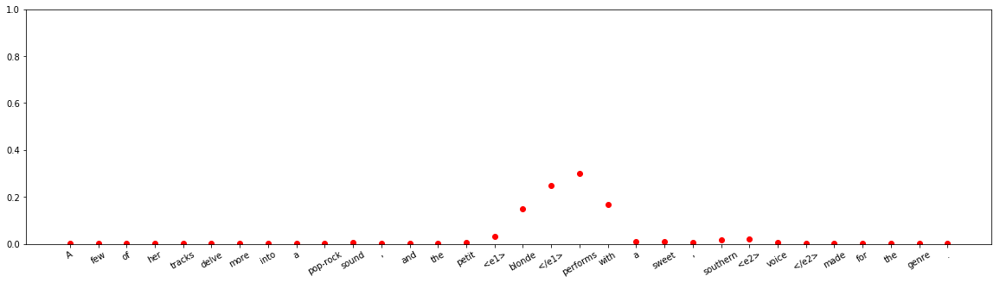


input sentence: Adam Smith 's first <e1> measure </e1> of fame was gained from a series of public <e2> lectures </e2> on rhetoric and belles lettres delivered in Edinburgh from 1748 to 1751 .
answer label:    Cause-Effect(e2,e1)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 1.2746146e-12
Entity-Destination(e1,e2) 	:	 4.656821e-11
Cause-Effect(e2,e1) 	:	 4.636804e-09
Member-Collection(e2,e1) 	:	 6.74487e-07
Entity-Origin(e1,e2) 	:	 0.9999285
Message-Topic(e1,e2) 	:	 1.2584038e-15
Component-Whole(e1,e2) 	:	 1.3537565e-13
Component-Whole(e2,e1) 	:	 1.6555747e-10
Instrument-Agency(e2,e1) 	:	 2.9838758e-14
Content-Container(e1,e2) 	:	 6.4860166e-12
Product-Producer(e2,e1) 	:	 6.912657e-08
Cause-Effect(e1,e2) 	:	 9.45569e-16
Product-Producer(e1,e2) 	:	 6.739029e-08
Content-Container(e2,e1) 	:	 8.372556e-11
Entity-Origin(e2,e1) 	:	 1.7922372e-11
Message-Topic(e2,e1) 	:	 7.051557e-05
Instrument-Agency(e1,e2) 	:	 9.36034e-15
Member-Collection(e1,e2) 	:	 1.0298688e-11
Entity-Destination(e2,e1)

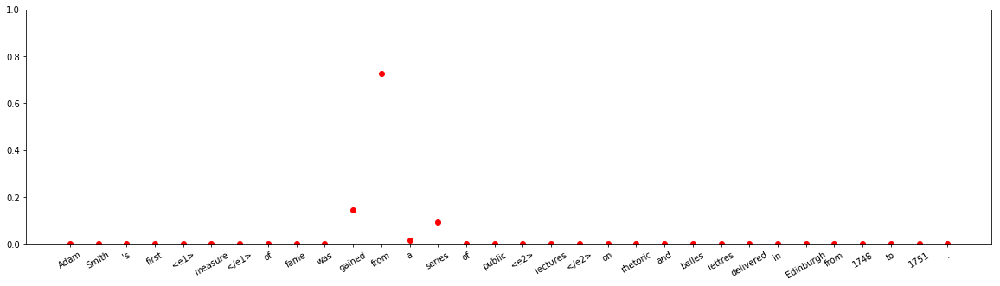



input sentence: Halfway into the flight to LA , a <e1> passenger </e1> took a <e2> photograph </e2> and the icy blue flash from the camera bounced momentarily across the dimly lit cabin .
answer label:    Product-Producer(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 2.8938685e-10
Entity-Destination(e1,e2) 	:	 1.9620055e-08
Cause-Effect(e2,e1) 	:	 1.3857802e-08
Member-Collection(e2,e1) 	:	 1.9832193e-07
Entity-Origin(e1,e2) 	:	 0.0003493733
Message-Topic(e1,e2) 	:	 3.9507703e-12
Component-Whole(e1,e2) 	:	 2.9184761e-05
Component-Whole(e2,e1) 	:	 0.050887458
Instrument-Agency(e2,e1) 	:	 0.94709533
Content-Container(e1,e2) 	:	 0.00016917643
Product-Producer(e2,e1) 	:	 6.6027255e-06
Cause-Effect(e1,e2) 	:	 3.8500572e-10
Product-Producer(e1,e2) 	:	 1.1552932e-07
Content-Container(e2,e1) 	:	 0.00045676704
Entity-Origin(e2,e1) 	:	 9.685835e-11
Message-Topic(e2,e1) 	:	 7.21091e-12
Instrument-Agency(e1,e2) 	:	 0.0010058042
Member-Collection(e1,e2) 	:	 7.2788625e-10
Entity-Destina

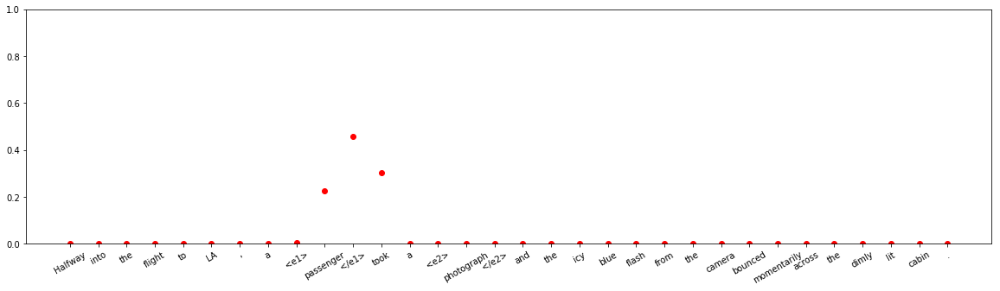






input sentence: My <e1> view </e1> of how the brain works is rooted in an evolutionary <e2> perspective </e2> that moves from the fact that our mental life reflects the actions of many .
answer label:    Cause-Effect(e2,e1)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 7.023348e-18
Cause-Effect(e2,e1) 	:	 7.042865e-11
Member-Collection(e2,e1) 	:	 3.216287e-16
Entity-Origin(e1,e2) 	:	 9.96836e-14
Message-Topic(e1,e2) 	:	 8.654085e-15
Component-Whole(e1,e2) 	:	 6.467634e-14
Component-Whole(e2,e1) 	:	 1.2903585e-13
Instrument-Agency(e2,e1) 	:	 1.0452042e-15
Content-Container(e1,e2) 	:	 1.5473428e-14
Product-Producer(e2,e1) 	:	 5.033591e-17
Cause-Effect(e1,e2) 	:	 1.6972007e-15
Product-Producer(e1,e2) 	:	 4.929221e-14
Content-Container(e2,e1) 	:	 1.1961724e-15
Entity-Origin(e2,e1) 	:	 5.5972276e-14
Message-Topic(e2,e1) 	:	 4.5838677e-11
Instrument-Agency(e1,e2) 	:	 2.316193e-13
Member-Collection(e1,e2) 	:	 1.2034732e-14
Entity-Destination(e2,e1) 	:	 2.0040438e-16



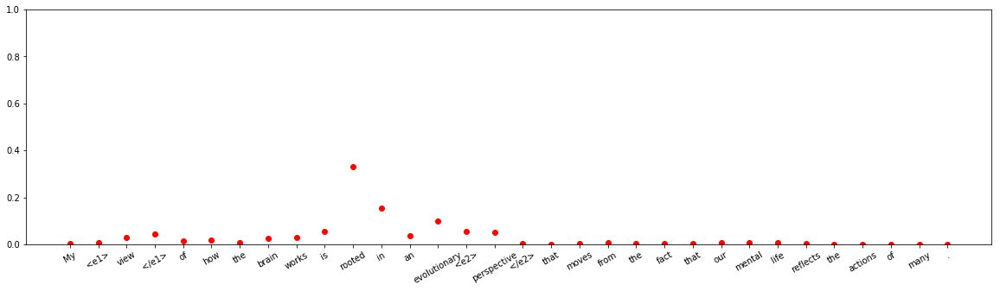




input sentence: The <e1> sample </e1> was pressed from <e2> powder </e2> into a platelet with about 10 mm thickness , which was cut into a rectangle and put on the platinum leads .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 1.13381e-06
Entity-Destination(e1,e2) 	:	 2.2095767e-06
Cause-Effect(e2,e1) 	:	 5.4745025e-05
Member-Collection(e2,e1) 	:	 1.4687529e-08
Entity-Origin(e1,e2) 	:	 0.9997762
Message-Topic(e1,e2) 	:	 5.6383442e-08
Component-Whole(e1,e2) 	:	 2.430635e-07
Component-Whole(e2,e1) 	:	 1.4028152e-06
Instrument-Agency(e2,e1) 	:	 1.7126438e-06
Content-Container(e1,e2) 	:	 0.0001364909
Product-Producer(e2,e1) 	:	 9.969078e-10
Cause-Effect(e1,e2) 	:	 1.5438294e-08
Product-Producer(e1,e2) 	:	 1.3969083e-05
Content-Container(e2,e1) 	:	 7.315728e-06
Entity-Origin(e2,e1) 	:	 1.96835e-06
Message-Topic(e2,e1) 	:	 5.361936e-10
Instrument-Agency(e1,e2) 	:	 2.3937062e-06
Member-Collection(e1,e2) 	:	 2.9549687e-07
Entity-Destination(e2,e1) 	:	 5.7624666e-10



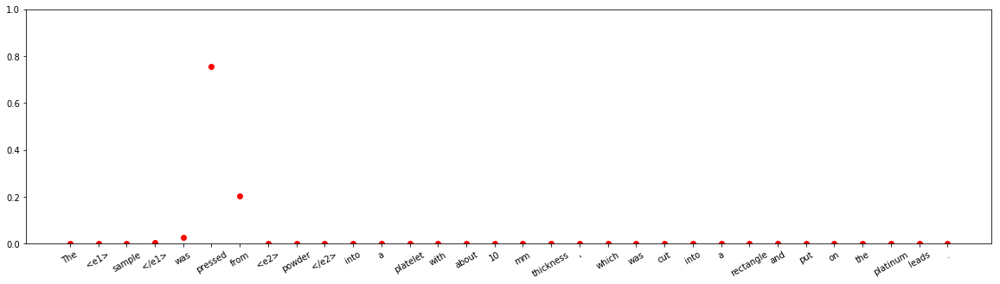


input sentence: <e1> Politicians </e1> are discovering Sufi <e2> teachings </e2> as a means against religious extremism .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 3.352301e-08
Entity-Destination(e1,e2) 	:	 1.4953683e-09
Cause-Effect(e2,e1) 	:	 3.4744287e-09
Member-Collection(e2,e1) 	:	 0.0018844057
Entity-Origin(e1,e2) 	:	 2.0149631e-05
Message-Topic(e1,e2) 	:	 0.04004534
Component-Whole(e1,e2) 	:	 7.459239e-08
Component-Whole(e2,e1) 	:	 3.0387813e-08
Instrument-Agency(e2,e1) 	:	 2.1103044e-05
Content-Container(e1,e2) 	:	 8.176937e-07
Product-Producer(e2,e1) 	:	 0.8252184
Cause-Effect(e1,e2) 	:	 0.049060974
Product-Producer(e1,e2) 	:	 2.1068063e-06
Content-Container(e2,e1) 	:	 4.7230926e-05
Entity-Origin(e2,e1) 	:	 0.08353755
Message-Topic(e2,e1) 	:	 5.1833114e-05
Instrument-Agency(e1,e2) 	:	 4.3637832e-05
Member-Collection(e1,e2) 	:	 6.644013e-05
Entity-Destination(e2,e1) 	:	 8.561734e-09



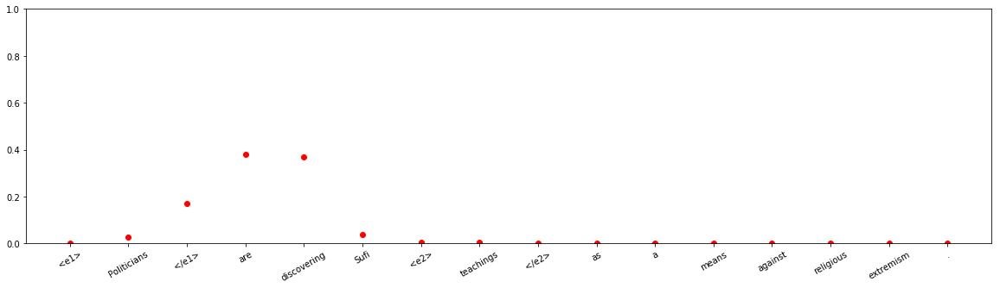





input sentence: The first <e1> couple </e1> of <e2> weeks </e2> at Palm have been a whirlwind .
answer label:    Member-Collection(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.0016971843
Entity-Destination(e1,e2) 	:	 7.528644e-09
Cause-Effect(e2,e1) 	:	 1.751617e-09
Member-Collection(e2,e1) 	:	 1.2778372e-05
Entity-Origin(e1,e2) 	:	 1.8604976e-07
Message-Topic(e1,e2) 	:	 1.6505489e-06
Component-Whole(e1,e2) 	:	 2.3501183e-05
Component-Whole(e2,e1) 	:	 0.9980116
Instrument-Agency(e2,e1) 	:	 4.352507e-05
Content-Container(e1,e2) 	:	 5.890635e-06
Product-Producer(e2,e1) 	:	 9.366138e-07
Cause-Effect(e1,e2) 	:	 2.3353013e-09
Product-Producer(e1,e2) 	:	 2.3968725e-09
Content-Container(e2,e1) 	:	 0.00018652211
Entity-Origin(e2,e1) 	:	 1.0289097e-09
Message-Topic(e2,e1) 	:	 3.086054e-07
Instrument-Agency(e1,e2) 	:	 1.5667069e-05
Member-Collection(e1,e2) 	:	 7.99504e-09
Entity-Destination(e2,e1) 	:	 1.6777087e-10



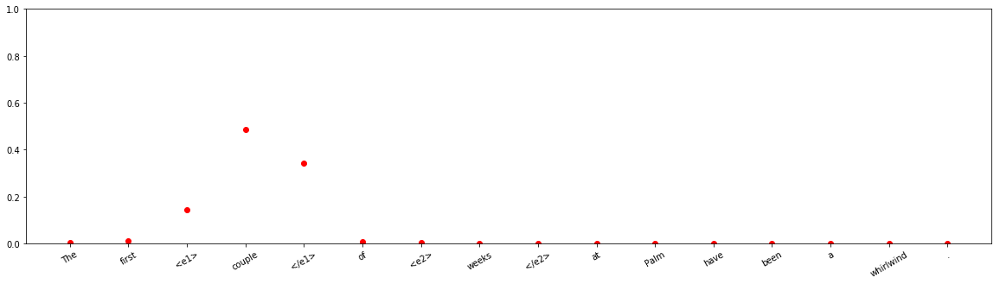




input sentence: <e1> Demerol </e1> is in a group of <e2> drugs </e2> called narcotic pain relievers .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 3.869143e-06
Entity-Destination(e1,e2) 	:	 7.707084e-06
Cause-Effect(e2,e1) 	:	 0.00010930117
Member-Collection(e2,e1) 	:	 0.998505
Entity-Origin(e1,e2) 	:	 0.0003056401
Message-Topic(e1,e2) 	:	 1.2359355e-06
Component-Whole(e1,e2) 	:	 9.179014e-06
Component-Whole(e2,e1) 	:	 0.00016379873
Instrument-Agency(e2,e1) 	:	 1.97307e-05
Content-Container(e1,e2) 	:	 3.8625803e-06
Product-Producer(e2,e1) 	:	 1.3274347e-07
Cause-Effect(e1,e2) 	:	 0.00022533866
Product-Producer(e1,e2) 	:	 1.573517e-07
Content-Container(e2,e1) 	:	 0.00048006274
Entity-Origin(e2,e1) 	:	 2.0995449e-05
Message-Topic(e2,e1) 	:	 5.106636e-06
Instrument-Agency(e1,e2) 	:	 5.5623837e-05
Member-Collection(e1,e2) 	:	 8.3487816e-05
Entity-Destination(e2,e1) 	:	 1.6630036e-09



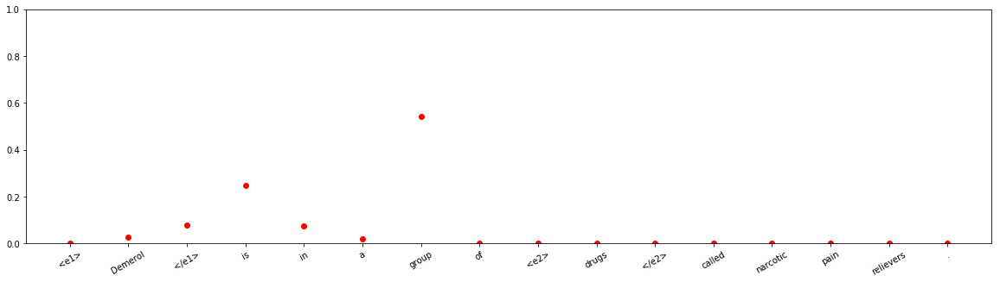




input sentence: Mileson has sold his humble abode to a <e1> housing </e1> <e2> developer </e2> .
answer label:    Product-Producer(e1,e2)
wrong label:    Other
Other 	:	 0.7630944
Entity-Destination(e1,e2) 	:	 0.0027096365
Cause-Effect(e2,e1) 	:	 7.422774e-09
Member-Collection(e2,e1) 	:	 7.718119e-07
Entity-Origin(e1,e2) 	:	 1.3775405e-08
Message-Topic(e1,e2) 	:	 2.2046397e-08
Component-Whole(e1,e2) 	:	 2.7628496e-06
Component-Whole(e2,e1) 	:	 3.795847e-10
Instrument-Agency(e2,e1) 	:	 9.4655304e-11
Content-Container(e1,e2) 	:	 1.0685921e-08
Product-Producer(e2,e1) 	:	 3.3047954e-07
Cause-Effect(e1,e2) 	:	 1.465352e-09
Product-Producer(e1,e2) 	:	 0.23245804
Content-Container(e2,e1) 	:	 3.6509755e-09
Entity-Origin(e2,e1) 	:	 1.7971349e-08
Message-Topic(e2,e1) 	:	 2.495991e-06
Instrument-Agency(e1,e2) 	:	 0.00021675498
Member-Collection(e1,e2) 	:	 0.0015148186
Entity-Destination(e2,e1) 	:	 5.8651257e-09



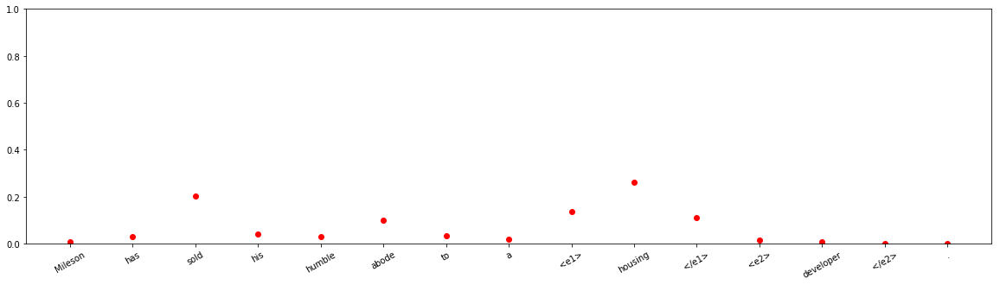


input sentence: The <e1> treaty </e1> establishes a double majority <e2> rule </e2> for Council decisions .
answer label:    Cause-Effect(e1,e2)
wrong label:    Other
Other 	:	 0.75833935
Entity-Destination(e1,e2) 	:	 3.3557534e-08
Cause-Effect(e2,e1) 	:	 2.6579796e-11
Member-Collection(e2,e1) 	:	 2.4755352e-07
Entity-Origin(e1,e2) 	:	 2.1179455e-08
Message-Topic(e1,e2) 	:	 0.0059318445
Component-Whole(e1,e2) 	:	 1.7000357e-06
Component-Whole(e2,e1) 	:	 4.374827e-05
Instrument-Agency(e2,e1) 	:	 3.8615664e-05
Content-Container(e1,e2) 	:	 4.412738e-06
Product-Producer(e2,e1) 	:	 0.23534416
Cause-Effect(e1,e2) 	:	 0.00021297297
Product-Producer(e1,e2) 	:	 1.0618072e-07
Content-Container(e2,e1) 	:	 4.7790105e-05
Entity-Origin(e2,e1) 	:	 2.3988553e-06
Message-Topic(e2,e1) 	:	 5.182728e-06
Instrument-Agency(e1,e2) 	:	 2.6981537e-05
Member-Collection(e1,e2) 	:	 4.7238734e-07
Entity-Destination(e2,e1) 	:	 8.07174e-09



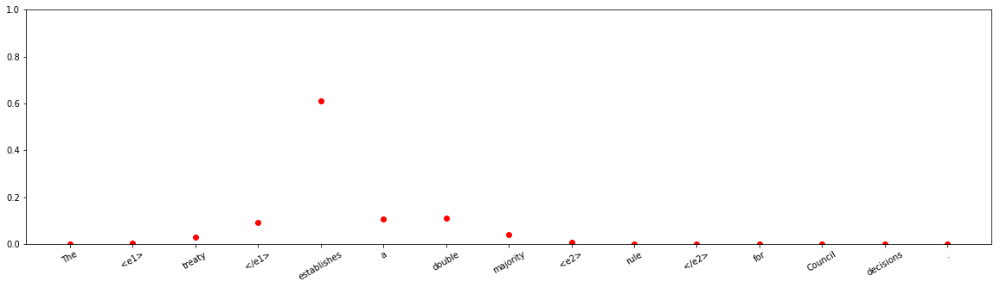




input sentence: We used fried <e1> cheese </e1> as an element in a <e2> dish </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 0.0011166176
Entity-Destination(e1,e2) 	:	 5.5266402e-05
Cause-Effect(e2,e1) 	:	 2.3937566e-10
Member-Collection(e2,e1) 	:	 2.0172312e-12
Entity-Origin(e1,e2) 	:	 4.4532488e-05
Message-Topic(e1,e2) 	:	 1.9697752e-10
Component-Whole(e1,e2) 	:	 0.08643967
Component-Whole(e2,e1) 	:	 4.9391527e-08
Instrument-Agency(e2,e1) 	:	 3.551836e-08
Content-Container(e1,e2) 	:	 0.91234213
Product-Producer(e2,e1) 	:	 3.617811e-11
Cause-Effect(e1,e2) 	:	 3.774799e-12
Product-Producer(e1,e2) 	:	 2.439875e-10
Content-Container(e2,e1) 	:	 6.6502245e-08
Entity-Origin(e2,e1) 	:	 4.556116e-09
Message-Topic(e2,e1) 	:	 1.7627366e-07
Instrument-Agency(e1,e2) 	:	 1.7929014e-07
Member-Collection(e1,e2) 	:	 1.2369487e-06
Entity-Destination(e2,e1) 	:	 5.6300395e-11



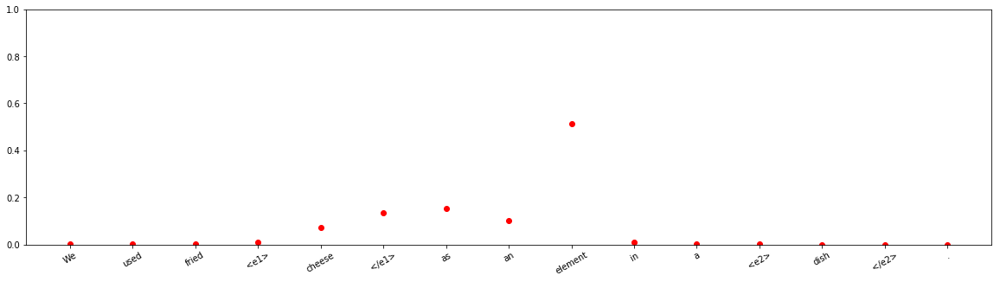


input sentence: Eighteen <e1> studies </e1> were focused on older <e2> adults </e2> living at home .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 4.711626e-12
Entity-Destination(e1,e2) 	:	 8.74813e-12
Cause-Effect(e2,e1) 	:	 6.7963555e-13
Member-Collection(e2,e1) 	:	 2.9322303e-08
Entity-Origin(e1,e2) 	:	 9.009124e-12
Message-Topic(e1,e2) 	:	 0.9999503
Component-Whole(e1,e2) 	:	 6.438728e-08
Component-Whole(e2,e1) 	:	 4.0618936e-15
Instrument-Agency(e2,e1) 	:	 1.6117033e-14
Content-Container(e1,e2) 	:	 1.6600565e-14
Product-Producer(e2,e1) 	:	 4.8081e-13
Cause-Effect(e1,e2) 	:	 1.5115659e-09
Product-Producer(e1,e2) 	:	 9.981703e-09
Content-Container(e2,e1) 	:	 1.0772427e-13
Entity-Origin(e2,e1) 	:	 2.4851624e-10
Message-Topic(e2,e1) 	:	 4.960944e-05
Instrument-Agency(e1,e2) 	:	 3.1593412e-08
Member-Collection(e1,e2) 	:	 4.5585324e-10
Entity-Destination(e2,e1) 	:	 5.7650667e-13



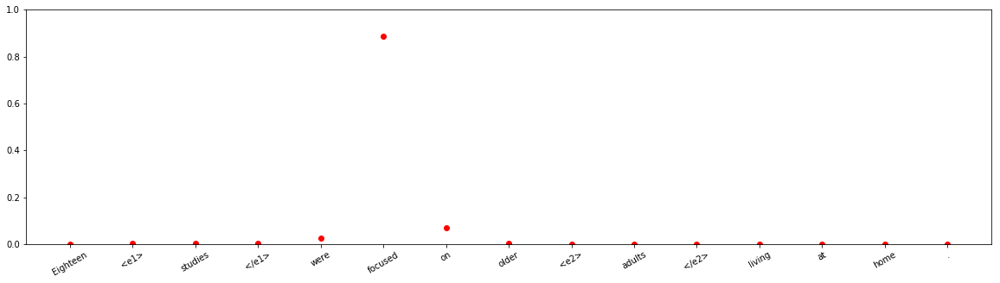


input sentence: The <e1> air </e1> was filled with the <e2> smell </e2> of burning plastic .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.4622945e-05
Entity-Destination(e1,e2) 	:	 1.3671182e-09
Cause-Effect(e2,e1) 	:	 6.6727866e-06
Member-Collection(e2,e1) 	:	 9.626216e-07
Entity-Origin(e1,e2) 	:	 5.1997085e-05
Message-Topic(e1,e2) 	:	 3.8753993e-07
Component-Whole(e1,e2) 	:	 5.544595e-06
Component-Whole(e2,e1) 	:	 0.8759298
Instrument-Agency(e2,e1) 	:	 2.1401487e-08
Content-Container(e1,e2) 	:	 4.6182908e-05
Product-Producer(e2,e1) 	:	 6.58321e-09
Cause-Effect(e1,e2) 	:	 0.0006741082
Product-Producer(e1,e2) 	:	 1.2815341e-08
Content-Container(e2,e1) 	:	 0.123240605
Entity-Origin(e2,e1) 	:	 3.1173073e-07
Message-Topic(e2,e1) 	:	 7.611336e-10
Instrument-Agency(e1,e2) 	:	 1.884284e-05
Member-Collection(e1,e2) 	:	 1.8744313e-11
Entity-Destination(e2,e1) 	:	 2.4545876e-11



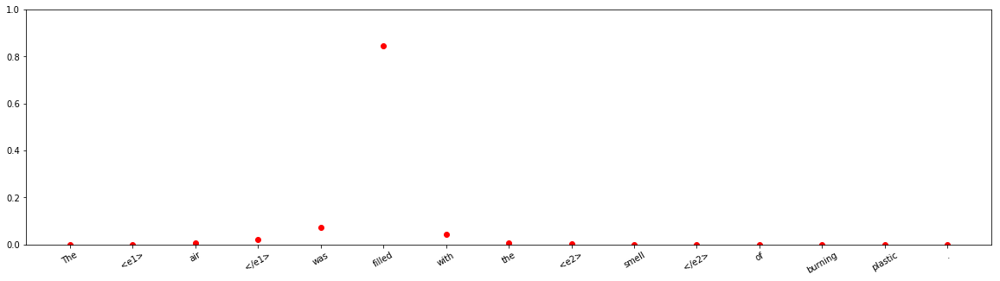


input sentence: Milk <e1> samples </e1> were obtained from one <e2> milking </e2> of each cow .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 1.4923662e-17
Entity-Destination(e1,e2) 	:	 1.6026802e-12
Cause-Effect(e2,e1) 	:	 8.423645e-11
Member-Collection(e2,e1) 	:	 8.837733e-13
Entity-Origin(e1,e2) 	:	 1.0
Message-Topic(e1,e2) 	:	 4.2748244e-16
Component-Whole(e1,e2) 	:	 1.0507571e-15
Component-Whole(e2,e1) 	:	 4.2035913e-16
Instrument-Agency(e2,e1) 	:	 1.0965693e-14
Content-Container(e1,e2) 	:	 5.7977655e-12
Product-Producer(e2,e1) 	:	 1.617537e-13
Cause-Effect(e1,e2) 	:	 7.373249e-18
Product-Producer(e1,e2) 	:	 1.9067729e-08
Content-Container(e2,e1) 	:	 2.744769e-15
Entity-Origin(e2,e1) 	:	 7.4717905e-12
Message-Topic(e2,e1) 	:	 3.9886427e-12
Instrument-Agency(e1,e2) 	:	 1.3345884e-13
Member-Collection(e1,e2) 	:	 6.7905677e-12
Entity-Destination(e2,e1) 	:	 1.759384e-16



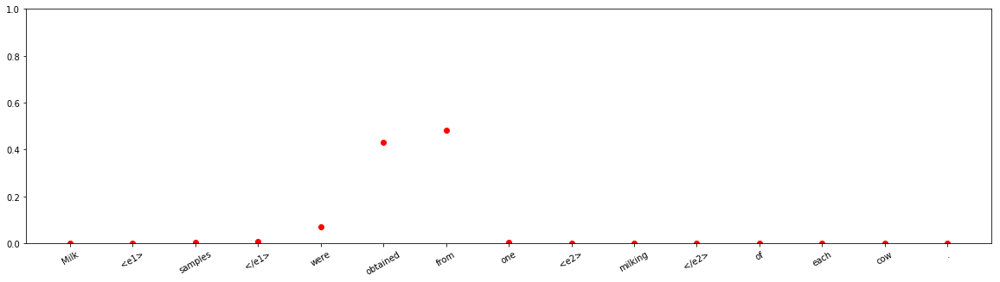








input sentence: He changed the <e1> litter </e1> in his pet 's <e2> litter box </e2> .
answer label:    Content-Container(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 5.2218074e-09
Entity-Destination(e1,e2) 	:	 0.001040976
Cause-Effect(e2,e1) 	:	 1.078444e-10
Member-Collection(e2,e1) 	:	 2.800853e-10
Entity-Origin(e1,e2) 	:	 4.78808e-06
Message-Topic(e1,e2) 	:	 1.52688e-11
Component-Whole(e1,e2) 	:	 0.9969938
Component-Whole(e2,e1) 	:	 1.4678242e-06
Instrument-Agency(e2,e1) 	:	 4.788482e-10
Content-Container(e1,e2) 	:	 0.0019528028
Product-Producer(e2,e1) 	:	 2.7155926e-09
Cause-Effect(e1,e2) 	:	 5.031276e-12
Product-Producer(e1,e2) 	:	 7.729337e-09
Content-Container(e2,e1) 	:	 2.6943585e-08
Entity-Origin(e2,e1) 	:	 2.047429e-10
Message-Topic(e2,e1) 	:	 5.3326735e-06
Instrument-Agency(e1,e2) 	:	 6.135426e-09
Member-Collection(e1,e2) 	:	 8.542569e-07
Entity-Destination(e2,e1) 	:	 4.064594e-12



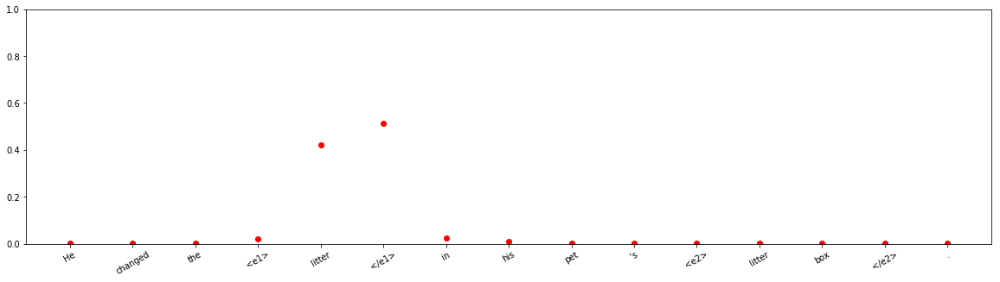


input sentence: Our <e1> staff </e1> has approached many <e2> people </e2> for the product survey .
answer label:    Entity-Destination(e1,e2)
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.0037327192
Entity-Destination(e1,e2) 	:	 0.0040940046
Cause-Effect(e2,e1) 	:	 6.5824532e-09
Member-Collection(e2,e1) 	:	 0.8254815
Entity-Origin(e1,e2) 	:	 0.0004777292
Message-Topic(e1,e2) 	:	 0.00015666438
Component-Whole(e1,e2) 	:	 2.6046123e-08
Component-Whole(e2,e1) 	:	 1.1626445e-07
Instrument-Agency(e2,e1) 	:	 2.536576e-09
Content-Container(e1,e2) 	:	 7.301376e-08
Product-Producer(e2,e1) 	:	 0.00015788934
Cause-Effect(e1,e2) 	:	 1.16302374e-07
Product-Producer(e1,e2) 	:	 3.6209487e-05
Content-Container(e2,e1) 	:	 9.36146e-09
Entity-Origin(e2,e1) 	:	 0.00017296126
Message-Topic(e2,e1) 	:	 0.022168893
Instrument-Agency(e1,e2) 	:	 0.00039062768
Member-Collection(e1,e2) 	:	 0.14313048
Entity-Destination(e2,e1) 	:	 1.978387e-09



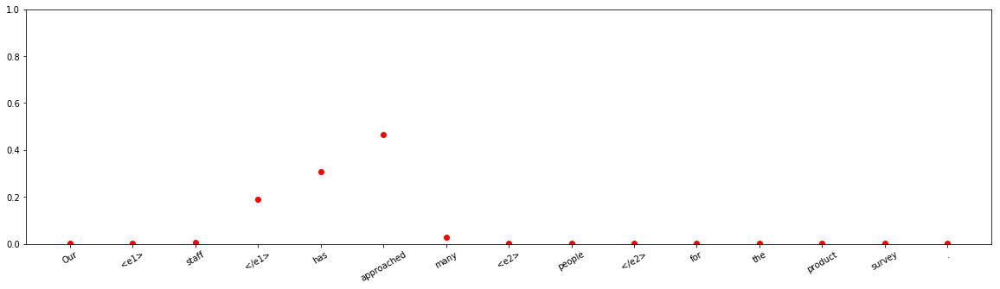



input sentence: Carolyn Cooke 's <e1> stories </e1> have been featured in the <e2> book </e2> .
answer label:    Member-Collection(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 7.111851e-13
Entity-Destination(e1,e2) 	:	 2.124086e-08
Cause-Effect(e2,e1) 	:	 4.101813e-14
Member-Collection(e2,e1) 	:	 1.2506144e-11
Entity-Origin(e1,e2) 	:	 3.4910405e-05
Message-Topic(e1,e2) 	:	 5.943257e-11
Component-Whole(e1,e2) 	:	 3.705767e-05
Component-Whole(e2,e1) 	:	 7.4098927e-10
Instrument-Agency(e2,e1) 	:	 4.2604378e-14
Content-Container(e1,e2) 	:	 3.491749e-07
Product-Producer(e2,e1) 	:	 6.93449e-09
Cause-Effect(e1,e2) 	:	 4.302475e-15
Product-Producer(e1,e2) 	:	 7.175575e-10
Content-Container(e2,e1) 	:	 5.451223e-13
Entity-Origin(e2,e1) 	:	 1.1272216e-13
Message-Topic(e2,e1) 	:	 0.99992764
Instrument-Agency(e1,e2) 	:	 9.201094e-15
Member-Collection(e1,e2) 	:	 4.125031e-09
Entity-Destination(e2,e1) 	:	 1.5121939e-14



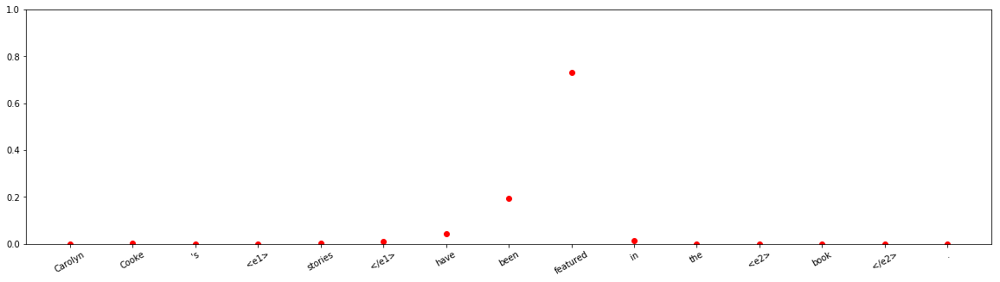








input sentence: The <e1> farmer </e1> ploughed the fields with this 2-piece farm <e2> tractor </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.99719465
Entity-Destination(e1,e2) 	:	 4.461583e-13
Cause-Effect(e2,e1) 	:	 1.3359704e-11
Member-Collection(e2,e1) 	:	 3.394855e-16
Entity-Origin(e1,e2) 	:	 2.934056e-11
Message-Topic(e1,e2) 	:	 4.886019e-16
Component-Whole(e1,e2) 	:	 1.7394503e-13
Component-Whole(e2,e1) 	:	 1.7291626e-13
Instrument-Agency(e2,e1) 	:	 0.0028053361
Content-Container(e1,e2) 	:	 2.172659e-11
Product-Producer(e2,e1) 	:	 2.6189957e-09
Cause-Effect(e1,e2) 	:	 1.6084546e-14
Product-Producer(e1,e2) 	:	 1.2492711e-13
Content-Container(e2,e1) 	:	 2.8798856e-12
Entity-Origin(e2,e1) 	:	 1.0522606e-13
Message-Topic(e2,e1) 	:	 6.721459e-13
Instrument-Agency(e1,e2) 	:	 3.5718567e-10
Member-Collection(e1,e2) 	:	 2.111156e-09
Entity-Destination(e2,e1) 	:	 2.6763283e-15



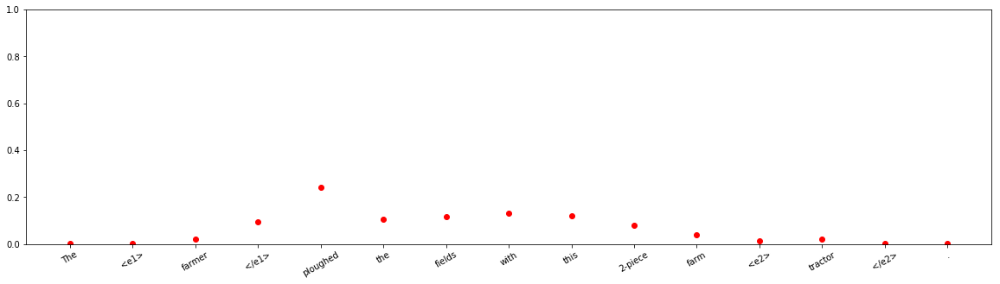


input sentence: Now a faint and lonely <e1> flame </e1> uprises from the <e2> pyre </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.1486405e-13
Entity-Destination(e1,e2) 	:	 2.8023739e-09
Cause-Effect(e2,e1) 	:	 0.99994814
Member-Collection(e2,e1) 	:	 3.0566886e-11
Entity-Origin(e1,e2) 	:	 5.1421e-05
Message-Topic(e1,e2) 	:	 1.1015927e-16
Component-Whole(e1,e2) 	:	 1.0197212e-07
Component-Whole(e2,e1) 	:	 1.4343008e-11
Instrument-Agency(e2,e1) 	:	 2.2772426e-11
Content-Container(e1,e2) 	:	 5.71594e-12
Product-Producer(e2,e1) 	:	 1.954225e-12
Cause-Effect(e1,e2) 	:	 2.0209934e-13
Product-Producer(e1,e2) 	:	 4.155864e-07
Content-Container(e2,e1) 	:	 6.9152415e-13
Entity-Origin(e2,e1) 	:	 1.1604367e-10
Message-Topic(e2,e1) 	:	 2.8866264e-08
Instrument-Agency(e1,e2) 	:	 9.787567e-10
Member-Collection(e1,e2) 	:	 3.3932048e-11
Entity-Destination(e2,e1) 	:	 4.348789e-12



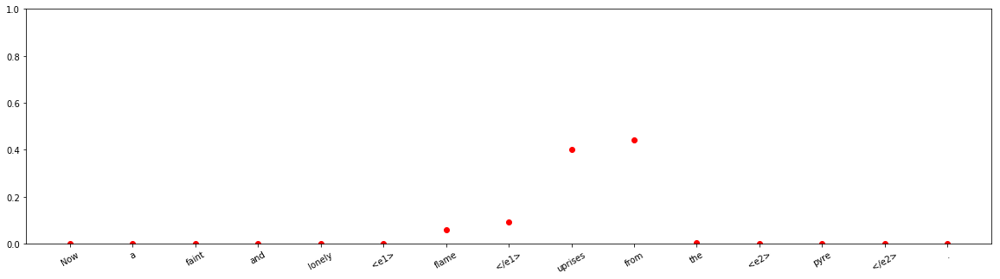



input sentence: Also in the <e1> programme </e1> we consider the subject of <e2> happiness </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.8481274
Entity-Destination(e1,e2) 	:	 8.732872e-13
Cause-Effect(e2,e1) 	:	 7.996355e-10
Member-Collection(e2,e1) 	:	 1.5728026e-09
Entity-Origin(e1,e2) 	:	 9.775247e-12
Message-Topic(e1,e2) 	:	 0.15186146
Component-Whole(e1,e2) 	:	 4.0210637e-07
Component-Whole(e2,e1) 	:	 2.2145556e-07
Instrument-Agency(e2,e1) 	:	 9.109287e-13
Content-Container(e1,e2) 	:	 6.6406386e-10
Product-Producer(e2,e1) 	:	 2.03166e-14
Cause-Effect(e1,e2) 	:	 1.0038485e-08
Product-Producer(e1,e2) 	:	 1.5674927e-09
Content-Container(e2,e1) 	:	 7.60933e-11
Entity-Origin(e2,e1) 	:	 4.7426196e-10
Message-Topic(e2,e1) 	:	 9.777962e-06
Instrument-Agency(e1,e2) 	:	 7.079411e-07
Member-Collection(e1,e2) 	:	 1.3988007e-11
Entity-Destination(e2,e1) 	:	 3.9319012e-12



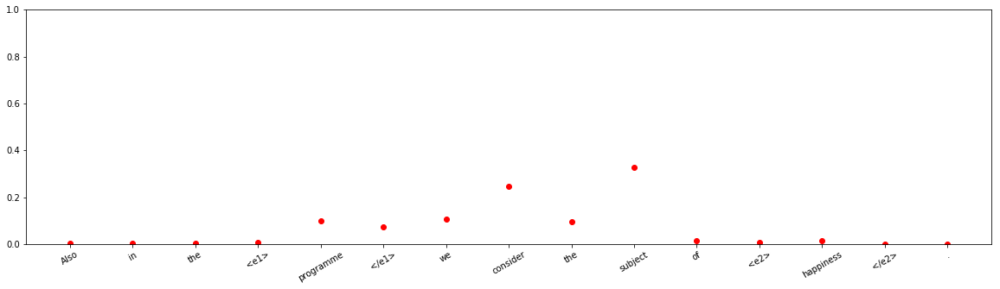




input sentence: The author <e1> index </e1> was generated using the LaTeX authorindex <e2> package </e2> .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 7.59129e-06
Entity-Destination(e1,e2) 	:	 0.00046245317
Cause-Effect(e2,e1) 	:	 3.8549578e-07
Member-Collection(e2,e1) 	:	 2.5105448e-10
Entity-Origin(e1,e2) 	:	 0.005109372
Message-Topic(e1,e2) 	:	 4.3458925e-09
Component-Whole(e1,e2) 	:	 3.8660597e-10
Component-Whole(e2,e1) 	:	 2.1232287e-09
Instrument-Agency(e2,e1) 	:	 0.98726755
Content-Container(e1,e2) 	:	 0.0029217254
Product-Producer(e2,e1) 	:	 0.004194319
Cause-Effect(e1,e2) 	:	 1.4856865e-08
Product-Producer(e1,e2) 	:	 6.7013247e-07
Content-Container(e2,e1) 	:	 7.1659756e-06
Entity-Origin(e2,e1) 	:	 1.08528226e-07
Message-Topic(e2,e1) 	:	 2.3682633e-08
Instrument-Agency(e1,e2) 	:	 2.8729202e-05
Member-Collection(e1,e2) 	:	 8.471336e-10
Entity-Destination(e2,e1) 	:	 5.4657796e-11



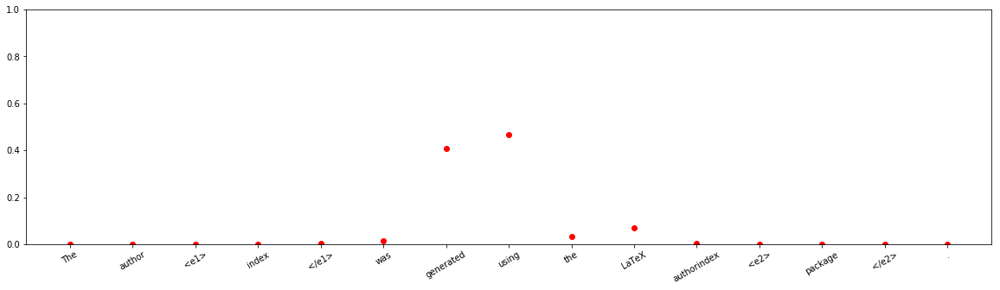



input sentence: 'Wellness ' tracker lures <e1> seniors </e1> to a <e2> data </e2> driven lifestyle .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 3.2183128e-10
Entity-Destination(e1,e2) 	:	 0.99999905
Cause-Effect(e2,e1) 	:	 2.0601717e-14
Member-Collection(e2,e1) 	:	 3.8217355e-12
Entity-Origin(e1,e2) 	:	 1.4493774e-09
Message-Topic(e1,e2) 	:	 4.4600534e-10
Component-Whole(e1,e2) 	:	 1.0184964e-10
Component-Whole(e2,e1) 	:	 5.235062e-16
Instrument-Agency(e2,e1) 	:	 5.576486e-10
Content-Container(e1,e2) 	:	 2.7590163e-08
Product-Producer(e2,e1) 	:	 5.1846044e-08
Cause-Effect(e1,e2) 	:	 4.00791e-12
Product-Producer(e1,e2) 	:	 8.396066e-14
Content-Container(e2,e1) 	:	 1.183635e-10
Entity-Origin(e2,e1) 	:	 5.4749805e-11
Message-Topic(e2,e1) 	:	 1.978576e-12
Instrument-Agency(e1,e2) 	:	 2.2303839e-09
Member-Collection(e1,e2) 	:	 9.770063e-07
Entity-Destination(e2,e1) 	:	 9.0831834e-13



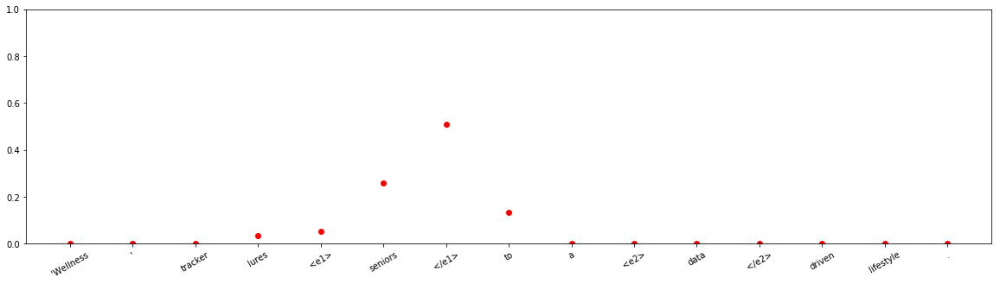







input sentence: <e1> Responses </e1> were obtained from 310 <e2> presidents </e2> provosts and 1293 deans .
answer label:    Entity-Origin(e1,e2)
wrong label:    Product-Producer(e1,e2)
Other 	:	 6.936898e-13
Entity-Destination(e1,e2) 	:	 6.6424435e-09
Cause-Effect(e2,e1) 	:	 0.00014637207
Member-Collection(e2,e1) 	:	 0.001462647
Entity-Origin(e1,e2) 	:	 0.44190702
Message-Topic(e1,e2) 	:	 1.4588235e-08
Component-Whole(e1,e2) 	:	 3.1697092e-10
Component-Whole(e2,e1) 	:	 1.0757412e-11
Instrument-Agency(e2,e1) 	:	 3.690501e-14
Content-Container(e1,e2) 	:	 1.1485166e-09
Product-Producer(e2,e1) 	:	 1.4269616e-11
Cause-Effect(e1,e2) 	:	 9.830938e-11
Product-Producer(e1,e2) 	:	 0.5560736
Content-Container(e2,e1) 	:	 1.5068613e-11
Entity-Origin(e2,e1) 	:	 1.0009176e-05
Message-Topic(e2,e1) 	:	 0.00039112184
Instrument-Agency(e1,e2) 	:	 2.0237928e-06
Member-Collection(e1,e2) 	:	 7.169558e-06
Entity-Destination(e2,e1) 	:	 8.0257867e-10



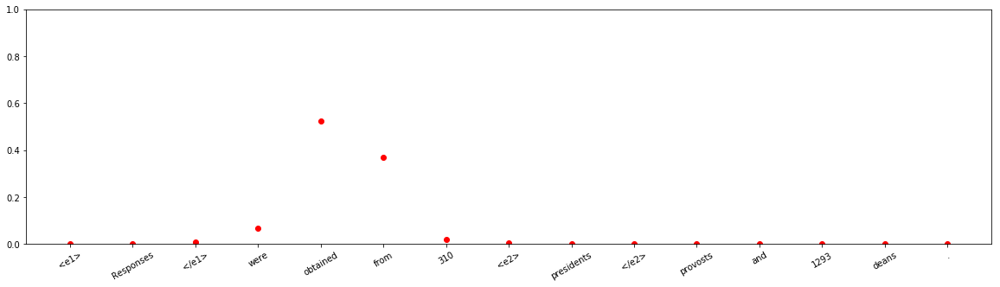




input sentence: He grabbed and put all dirty <e1> clothing </e1> in a <e2> hamper </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 1.6689732e-09
Entity-Destination(e1,e2) 	:	 0.001889592
Cause-Effect(e2,e1) 	:	 2.1567706e-12
Member-Collection(e2,e1) 	:	 1.7976858e-12
Entity-Origin(e1,e2) 	:	 2.1364497e-07
Message-Topic(e1,e2) 	:	 1.1982612e-13
Component-Whole(e1,e2) 	:	 2.6638014e-05
Component-Whole(e2,e1) 	:	 3.7963216e-11
Instrument-Agency(e2,e1) 	:	 1.4286311e-11
Content-Container(e1,e2) 	:	 0.9980835
Product-Producer(e2,e1) 	:	 6.6170326e-11
Cause-Effect(e1,e2) 	:	 4.1412195e-15
Product-Producer(e1,e2) 	:	 3.467995e-11
Content-Container(e2,e1) 	:	 9.329888e-08
Entity-Origin(e2,e1) 	:	 5.7890164e-12
Message-Topic(e2,e1) 	:	 1.0224753e-08
Instrument-Agency(e1,e2) 	:	 5.183674e-11
Member-Collection(e1,e2) 	:	 4.528941e-09
Entity-Destination(e2,e1) 	:	 3.8661995e-12



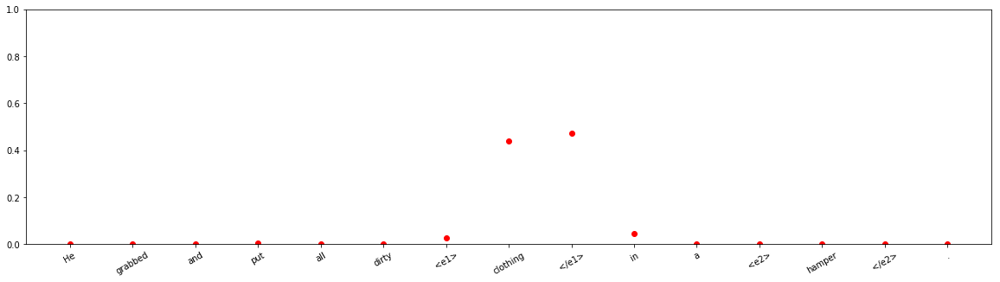



input sentence: Some metal-free catalytic <e1> systems </e1> have been investigated in the <e2> paper </e2> .
answer label:    Message-Topic(e2,e1)
wrong label:    Other
Other 	:	 0.99955183
Entity-Destination(e1,e2) 	:	 1.07464815e-14
Cause-Effect(e2,e1) 	:	 2.5436679e-15
Member-Collection(e2,e1) 	:	 4.5426417e-17
Entity-Origin(e1,e2) 	:	 2.326039e-13
Message-Topic(e1,e2) 	:	 6.6089976e-14
Component-Whole(e1,e2) 	:	 2.8922284e-07
Component-Whole(e2,e1) 	:	 5.7017525e-16
Instrument-Agency(e2,e1) 	:	 7.2100325e-15
Content-Container(e1,e2) 	:	 1.8519643e-08
Product-Producer(e2,e1) 	:	 2.1663428e-12
Cause-Effect(e1,e2) 	:	 5.9330503e-15
Product-Producer(e1,e2) 	:	 1.4130194e-13
Content-Container(e2,e1) 	:	 7.439467e-16
Entity-Origin(e2,e1) 	:	 3.028216e-14
Message-Topic(e2,e1) 	:	 0.00044786892
Instrument-Agency(e1,e2) 	:	 2.3727156e-14
Member-Collection(e1,e2) 	:	 8.485386e-12
Entity-Destination(e2,e1) 	:	 9.672368e-16



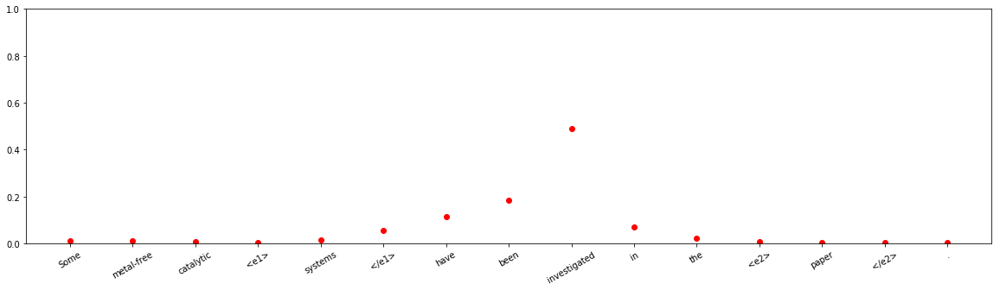





input sentence: Below you find my <e1> ideas </e1> with regard to this <e2> issue </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9799958
Entity-Destination(e1,e2) 	:	 6.987117e-08
Cause-Effect(e2,e1) 	:	 9.5546515e-11
Member-Collection(e2,e1) 	:	 9.416761e-13
Entity-Origin(e1,e2) 	:	 3.7447376e-12
Message-Topic(e1,e2) 	:	 0.01994324
Component-Whole(e1,e2) 	:	 6.0286948e-05
Component-Whole(e2,e1) 	:	 6.3217355e-11
Instrument-Agency(e2,e1) 	:	 2.8537843e-12
Content-Container(e1,e2) 	:	 6.2648026e-11
Product-Producer(e2,e1) 	:	 4.1611987e-12
Cause-Effect(e1,e2) 	:	 4.155177e-09
Product-Producer(e1,e2) 	:	 1.1133805e-10
Content-Container(e2,e1) 	:	 1.1784177e-11
Entity-Origin(e2,e1) 	:	 3.5393268e-11
Message-Topic(e2,e1) 	:	 6.3253293e-07
Instrument-Agency(e1,e2) 	:	 4.871543e-09
Member-Collection(e1,e2) 	:	 1.1390757e-09
Entity-Destination(e2,e1) 	:	 3.1493942e-12



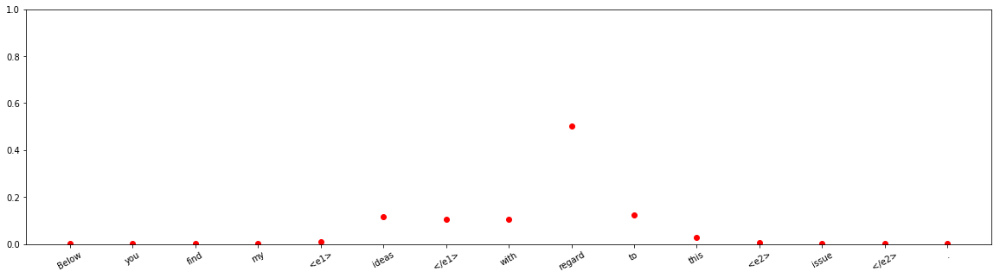


input sentence: Now this <e1> laboratory </e1> also is part of a larger <e2> organisation </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Member-Collection(e1,e2)
Other 	:	 7.9481987e-07
Entity-Destination(e1,e2) 	:	 1.0224569e-06
Cause-Effect(e2,e1) 	:	 4.4030335e-11
Member-Collection(e2,e1) 	:	 3.7223958e-06
Entity-Origin(e1,e2) 	:	 0.00027137474
Message-Topic(e1,e2) 	:	 7.463986e-11
Component-Whole(e1,e2) 	:	 0.1235212
Component-Whole(e2,e1) 	:	 6.5583365e-11
Instrument-Agency(e2,e1) 	:	 3.3088636e-12
Content-Container(e1,e2) 	:	 0.0002818161
Product-Producer(e2,e1) 	:	 1.1586506e-08
Cause-Effect(e1,e2) 	:	 1.0029145e-11
Product-Producer(e1,e2) 	:	 1.9595325e-06
Content-Container(e2,e1) 	:	 4.1840784e-09
Entity-Origin(e2,e1) 	:	 1.318104e-09
Message-Topic(e2,e1) 	:	 1.7804496e-07
Instrument-Agency(e1,e2) 	:	 1.08732216e-07
Member-Collection(e1,e2) 	:	 0.8759178
Entity-Destination(e2,e1) 	:	 1.3198115e-10



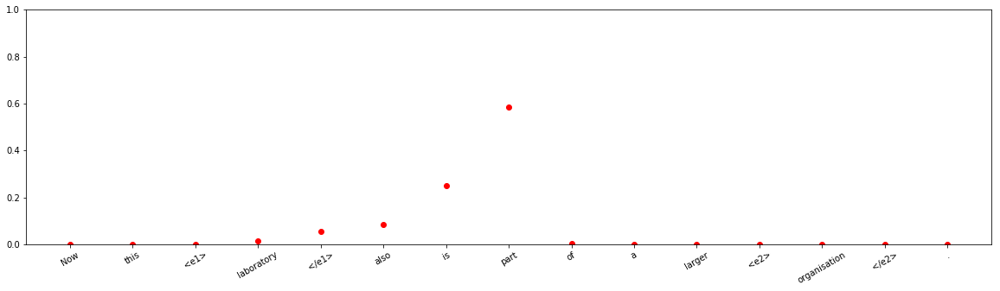


input sentence: The <e1> president </e1> of this <e2> corporation </e2> was one of its stockholders .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.119585745
Entity-Destination(e1,e2) 	:	 3.0317254e-10
Cause-Effect(e2,e1) 	:	 9.603394e-10
Member-Collection(e2,e1) 	:	 9.470041e-11
Entity-Origin(e1,e2) 	:	 5.7868057e-09
Message-Topic(e1,e2) 	:	 9.1182384e-10
Component-Whole(e1,e2) 	:	 3.9169454e-09
Component-Whole(e2,e1) 	:	 4.240598e-15
Instrument-Agency(e2,e1) 	:	 6.316957e-07
Content-Container(e1,e2) 	:	 1.0572506e-08
Product-Producer(e2,e1) 	:	 1.5897375e-06
Cause-Effect(e1,e2) 	:	 5.458805e-11
Product-Producer(e1,e2) 	:	 5.194519e-08
Content-Container(e2,e1) 	:	 1.0211386e-11
Entity-Origin(e2,e1) 	:	 3.8601172e-10
Message-Topic(e2,e1) 	:	 3.2986332e-08
Instrument-Agency(e1,e2) 	:	 1.1306831e-06
Member-Collection(e1,e2) 	:	 0.8804108
Entity-Destination(e2,e1) 	:	 3.5311222e-12



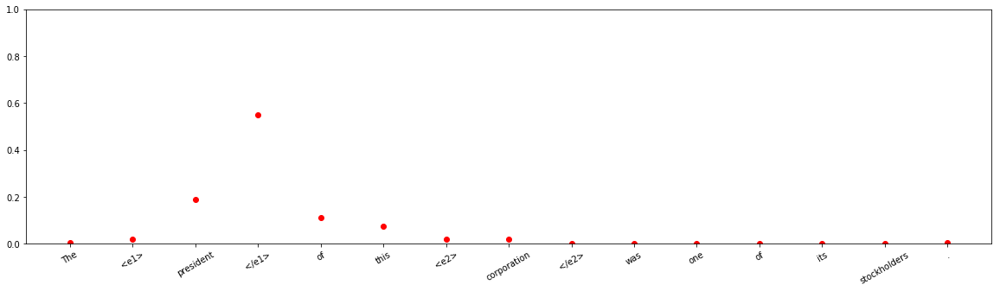



input sentence: An <e1> artist </e1> creates sculptures using up to 250000 colouring <e2> crayons </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 3.7333175e-11
Entity-Destination(e1,e2) 	:	 4.9500373e-09
Cause-Effect(e2,e1) 	:	 1.7695878e-13
Member-Collection(e2,e1) 	:	 1.1875738e-13
Entity-Origin(e1,e2) 	:	 2.17278e-10
Message-Topic(e1,e2) 	:	 3.787905e-09
Component-Whole(e1,e2) 	:	 7.903e-14
Component-Whole(e2,e1) 	:	 1.4388442e-15
Instrument-Agency(e2,e1) 	:	 0.319565
Content-Container(e1,e2) 	:	 9.799928e-12
Product-Producer(e2,e1) 	:	 0.680435
Cause-Effect(e1,e2) 	:	 4.8232335e-11
Product-Producer(e1,e2) 	:	 1.3114928e-11
Content-Container(e2,e1) 	:	 2.630013e-09
Entity-Origin(e2,e1) 	:	 2.8718672e-11
Message-Topic(e2,e1) 	:	 1.0832459e-11
Instrument-Agency(e1,e2) 	:	 2.468124e-10
Member-Collection(e1,e2) 	:	 1.0210324e-09
Entity-Destination(e2,e1) 	:	 1.1202963e-13



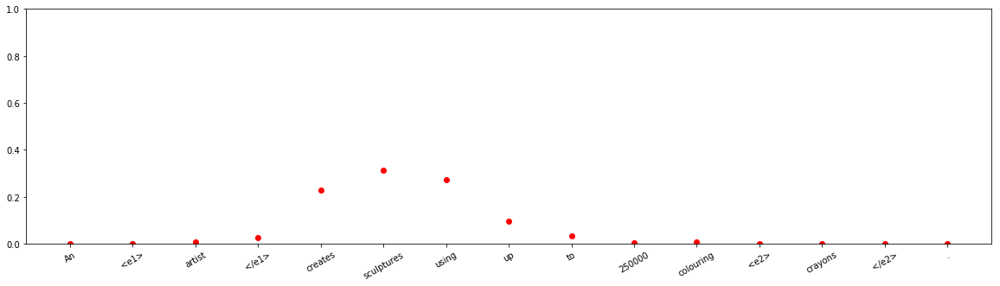




input sentence: The Busha <e1> cattle </e1> is a breed originated in <e2> middle ages </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Other
Other 	:	 0.9897832
Entity-Destination(e1,e2) 	:	 3.7700484e-10
Cause-Effect(e2,e1) 	:	 2.4370567e-07
Member-Collection(e2,e1) 	:	 1.1820117e-10
Entity-Origin(e1,e2) 	:	 0.010215071
Message-Topic(e1,e2) 	:	 5.7521387e-13
Component-Whole(e1,e2) 	:	 1.8715163e-11
Component-Whole(e2,e1) 	:	 8.017766e-10
Instrument-Agency(e2,e1) 	:	 1.7357303e-10
Content-Container(e1,e2) 	:	 7.3929016e-08
Product-Producer(e2,e1) 	:	 4.110349e-10
Cause-Effect(e1,e2) 	:	 2.975699e-11
Product-Producer(e1,e2) 	:	 1.916982e-09
Content-Container(e2,e1) 	:	 4.410827e-11
Entity-Origin(e2,e1) 	:	 9.862166e-07
Message-Topic(e2,e1) 	:	 1.8464522e-07
Instrument-Agency(e1,e2) 	:	 1.4092245e-09
Member-Collection(e1,e2) 	:	 1.1909683e-07
Entity-Destination(e2,e1) 	:	 3.0535297e-12



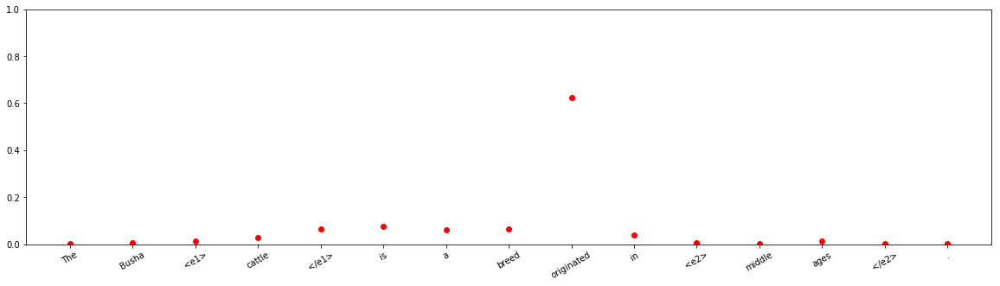



input sentence: Intuitively stack is visualized as indeed a <e1> stack </e1> of <e2> objects </e2> .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.9967181
Entity-Destination(e1,e2) 	:	 6.4507255e-10
Cause-Effect(e2,e1) 	:	 1.2215484e-09
Member-Collection(e2,e1) 	:	 0.00020261116
Entity-Origin(e1,e2) 	:	 7.861992e-10
Message-Topic(e1,e2) 	:	 8.677227e-09
Component-Whole(e1,e2) 	:	 6.2174064e-07
Component-Whole(e2,e1) 	:	 0.002346551
Instrument-Agency(e2,e1) 	:	 4.9906193e-06
Content-Container(e1,e2) 	:	 6.931218e-05
Product-Producer(e2,e1) 	:	 4.8689594e-07
Cause-Effect(e1,e2) 	:	 3.2525618e-10
Product-Producer(e1,e2) 	:	 1.6010993e-08
Content-Container(e2,e1) 	:	 0.0006455382
Entity-Origin(e2,e1) 	:	 7.3241617e-09
Message-Topic(e2,e1) 	:	 5.5331807e-06
Instrument-Agency(e1,e2) 	:	 6.3505054e-06
Member-Collection(e1,e2) 	:	 3.421876e-12
Entity-Destination(e2,e1) 	:	 2.548711e-08



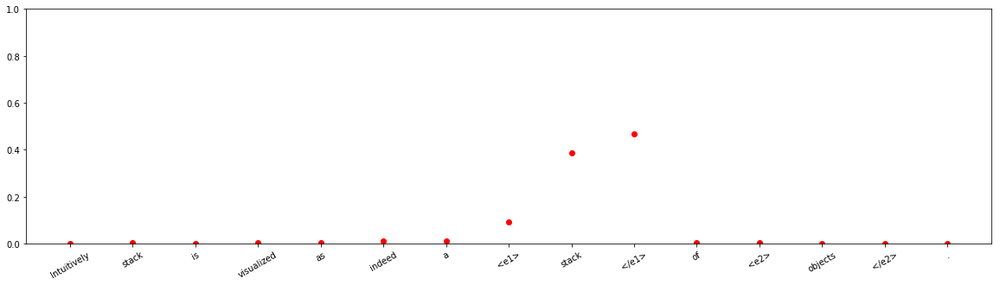





input sentence: This <e1> page </e1> carries a list of some of these <e2> conventions </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Message-Topic(e2,e1)
Other 	:	 3.0422372e-05
Entity-Destination(e1,e2) 	:	 1.0592251e-07
Cause-Effect(e2,e1) 	:	 1.4916639e-09
Member-Collection(e2,e1) 	:	 0.0070328168
Entity-Origin(e1,e2) 	:	 0.0006851928
Message-Topic(e1,e2) 	:	 0.106840774
Component-Whole(e1,e2) 	:	 0.010559306
Component-Whole(e2,e1) 	:	 0.033373706
Instrument-Agency(e2,e1) 	:	 0.0012557599
Content-Container(e1,e2) 	:	 0.0003938046
Product-Producer(e2,e1) 	:	 0.0055087856
Cause-Effect(e1,e2) 	:	 1.8172891e-07
Product-Producer(e1,e2) 	:	 2.1462292e-05
Content-Container(e2,e1) 	:	 0.01382807
Entity-Origin(e2,e1) 	:	 2.0771993e-05
Message-Topic(e2,e1) 	:	 0.82043266
Instrument-Agency(e1,e2) 	:	 9.618911e-06
Member-Collection(e1,e2) 	:	 6.377441e-06
Entity-Destination(e2,e1) 	:	 2.410246e-07



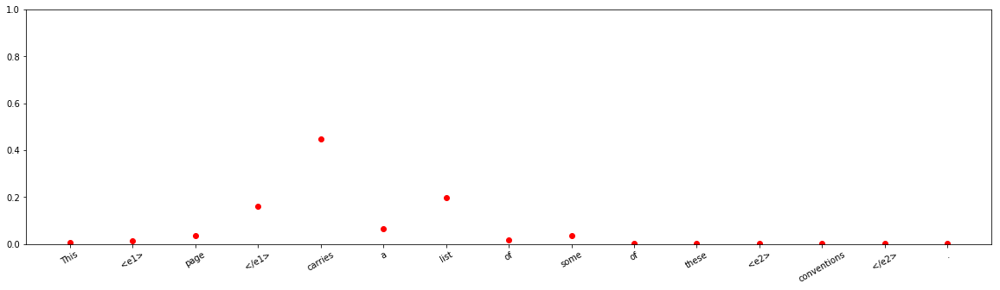






input sentence: The politicians have taken <e1> people </e1> deep into the <e2> twilight zone </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 1.4937086e-06
Entity-Destination(e1,e2) 	:	 0.9999914
Cause-Effect(e2,e1) 	:	 8.837671e-14
Member-Collection(e2,e1) 	:	 2.242199e-13
Entity-Origin(e1,e2) 	:	 1.9141025e-08
Message-Topic(e1,e2) 	:	 1.0815951e-11
Component-Whole(e1,e2) 	:	 7.0673256e-10
Component-Whole(e2,e1) 	:	 2.0160657e-15
Instrument-Agency(e2,e1) 	:	 1.1495978e-09
Content-Container(e1,e2) 	:	 1.5751608e-09
Product-Producer(e2,e1) 	:	 7.0553963e-09
Cause-Effect(e1,e2) 	:	 4.023282e-12
Product-Producer(e1,e2) 	:	 2.726954e-13
Content-Container(e2,e1) 	:	 1.2347133e-12
Entity-Origin(e2,e1) 	:	 1.9569633e-10
Message-Topic(e2,e1) 	:	 1.39588905e-11
Instrument-Agency(e1,e2) 	:	 1.24342515e-11
Member-Collection(e1,e2) 	:	 7.0534693e-06
Entity-Destination(e2,e1) 	:	 4.680101e-13



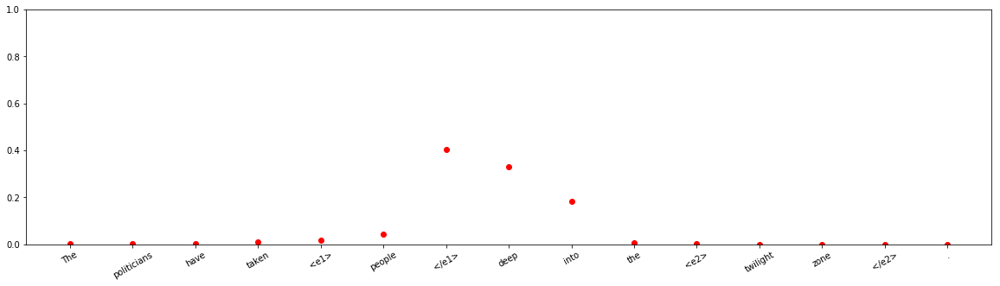


input sentence: Optimizing a <e1> transformer </e1> driven active magnetic <e2> shield </e2> in induction heating .
answer label:    Component-Whole(e1,e2)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 3.8703908e-07
Entity-Destination(e1,e2) 	:	 3.2361813e-10
Cause-Effect(e2,e1) 	:	 0.00016473721
Member-Collection(e2,e1) 	:	 1.6300238e-08
Entity-Origin(e1,e2) 	:	 2.3536872e-10
Message-Topic(e1,e2) 	:	 7.477157e-12
Component-Whole(e1,e2) 	:	 9.3319e-05
Component-Whole(e2,e1) 	:	 0.00028201082
Instrument-Agency(e2,e1) 	:	 2.0366963e-06
Content-Container(e1,e2) 	:	 3.5491305e-09
Product-Producer(e2,e1) 	:	 1.7809884e-11
Cause-Effect(e1,e2) 	:	 2.4620338e-05
Product-Producer(e1,e2) 	:	 1.3898303e-09
Content-Container(e2,e1) 	:	 3.9658298e-07
Entity-Origin(e2,e1) 	:	 2.4107213e-10
Message-Topic(e2,e1) 	:	 4.2450758e-11
Instrument-Agency(e1,e2) 	:	 0.9994325
Member-Collection(e1,e2) 	:	 5.1404325e-11
Entity-Destination(e2,e1) 	:	 8.8894525e-10



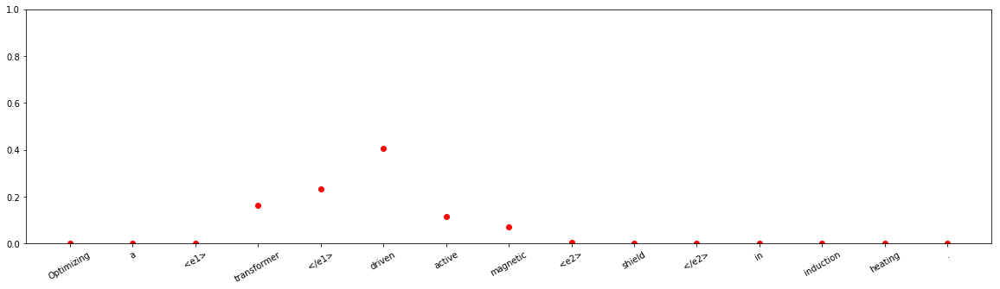


input sentence: Members are primarily interested in <e1> issues </e1> related to family <e2> law </e2> .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 0.15210418
Entity-Destination(e1,e2) 	:	 4.122365e-06
Cause-Effect(e2,e1) 	:	 1.5995115e-08
Member-Collection(e2,e1) 	:	 1.4369098e-10
Entity-Origin(e1,e2) 	:	 6.092344e-10
Message-Topic(e1,e2) 	:	 0.59278935
Component-Whole(e1,e2) 	:	 0.00081688014
Component-Whole(e2,e1) 	:	 8.604444e-07
Instrument-Agency(e2,e1) 	:	 1.8487434e-06
Content-Container(e1,e2) 	:	 8.291752e-08
Product-Producer(e2,e1) 	:	 6.569796e-08
Cause-Effect(e1,e2) 	:	 3.111533e-05
Product-Producer(e1,e2) 	:	 7.959099e-09
Content-Container(e2,e1) 	:	 6.0272114e-11
Entity-Origin(e2,e1) 	:	 8.387773e-08
Message-Topic(e2,e1) 	:	 0.25424993
Instrument-Agency(e1,e2) 	:	 1.2730144e-06
Member-Collection(e1,e2) 	:	 2.6562194e-07
Entity-Destination(e2,e1) 	:	 8.574098e-10



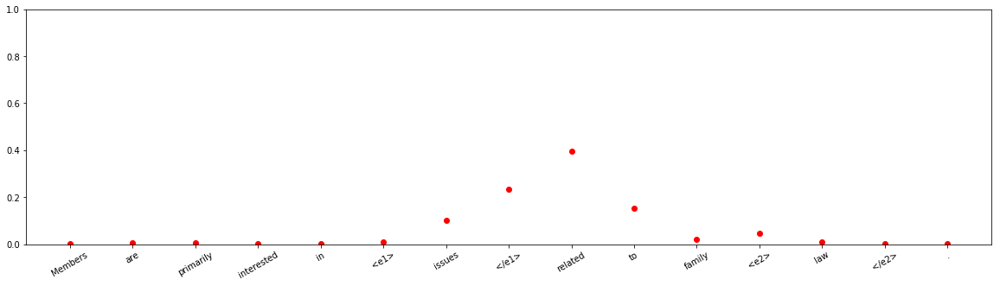











input sentence: EXE is the common <e1> filename extension </e1> denoting an executable <e2> file </e2> .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.022505768
Entity-Destination(e1,e2) 	:	 1.4234281e-05
Cause-Effect(e2,e1) 	:	 3.8608623e-09
Member-Collection(e2,e1) 	:	 9.891728e-07
Entity-Origin(e1,e2) 	:	 7.4679683e-06
Message-Topic(e1,e2) 	:	 6.0004677e-05
Component-Whole(e1,e2) 	:	 0.0028056598
Component-Whole(e2,e1) 	:	 0.022516383
Instrument-Agency(e2,e1) 	:	 0.0011455031
Content-Container(e1,e2) 	:	 0.03177014
Product-Producer(e2,e1) 	:	 0.90567124
Cause-Effect(e1,e2) 	:	 9.1038714e-07
Product-Producer(e1,e2) 	:	 7.2481737e-07
Content-Container(e2,e1) 	:	 0.009301056
Entity-Origin(e2,e1) 	:	 1.38488285e-05
Message-Topic(e2,e1) 	:	 3.2710363e-05
Instrument-Agency(e1,e2) 	:	 0.004152058
Member-Collection(e1,e2) 	:	 5.650989e-08
Entity-Destination(e2,e1) 	:	 1.1917033e-06



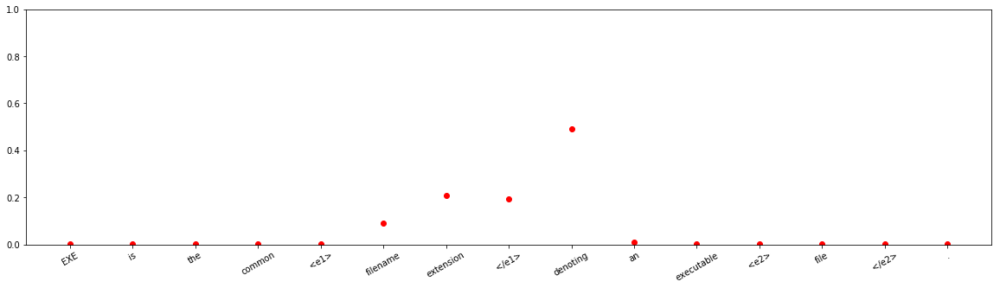



input sentence: All of our <e1> producers </e1> rear <e2> produce </e2> within the New Forest .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.13131394e-13
Entity-Destination(e1,e2) 	:	 3.3680955e-12
Cause-Effect(e2,e1) 	:	 8.833359e-15
Member-Collection(e2,e1) 	:	 3.3488127e-13
Entity-Origin(e1,e2) 	:	 7.518187e-10
Message-Topic(e1,e2) 	:	 1.3224533e-13
Component-Whole(e1,e2) 	:	 3.1375794e-15
Component-Whole(e2,e1) 	:	 4.172055e-13
Instrument-Agency(e2,e1) 	:	 1.13876235e-11
Content-Container(e1,e2) 	:	 5.4804056e-12
Product-Producer(e2,e1) 	:	 1.0
Cause-Effect(e1,e2) 	:	 3.5561547e-09
Product-Producer(e1,e2) 	:	 1.1105276e-08
Content-Container(e2,e1) 	:	 5.062662e-12
Entity-Origin(e2,e1) 	:	 2.4318051e-11
Message-Topic(e2,e1) 	:	 4.511824e-13
Instrument-Agency(e1,e2) 	:	 8.426774e-12
Member-Collection(e1,e2) 	:	 1.4674302e-11
Entity-Destination(e2,e1) 	:	 7.483285e-16



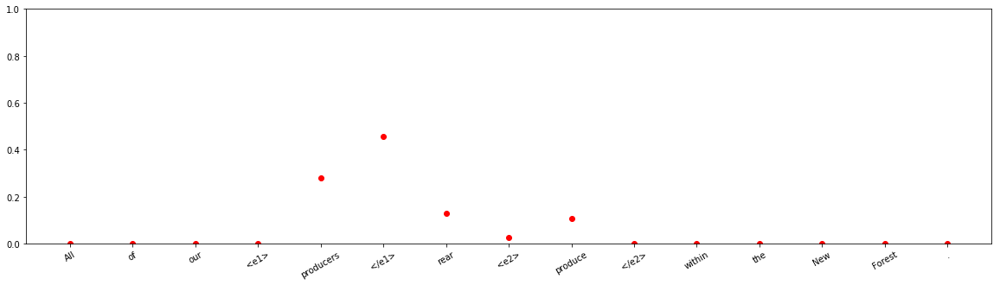






input sentence: Aromatic hydrocarbon-water separations by a <e1> pressure </e1> driven membrane separation <e2> process </e2> .
answer label:    Instrument-Agency(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 0.0018524654
Entity-Destination(e1,e2) 	:	 3.42233e-08
Cause-Effect(e2,e1) 	:	 0.9816108
Member-Collection(e2,e1) 	:	 1.0354444e-10
Entity-Origin(e1,e2) 	:	 4.85306e-10
Message-Topic(e1,e2) 	:	 1.636235e-10
Component-Whole(e1,e2) 	:	 1.4449038e-06
Component-Whole(e2,e1) 	:	 6.0825434e-09
Instrument-Agency(e2,e1) 	:	 8.61301e-07
Content-Container(e1,e2) 	:	 5.8837544e-09
Product-Producer(e2,e1) 	:	 1.699559e-11
Cause-Effect(e1,e2) 	:	 6.59251e-05
Product-Producer(e1,e2) 	:	 3.5208617e-10
Content-Container(e2,e1) 	:	 4.9358715e-07
Entity-Origin(e2,e1) 	:	 1.0216586e-07
Message-Topic(e2,e1) 	:	 1.4757255e-09
Instrument-Agency(e1,e2) 	:	 0.016468007
Member-Collection(e1,e2) 	:	 7.37138e-10
Entity-Destination(e2,e1) 	:	 4.6564635e-10



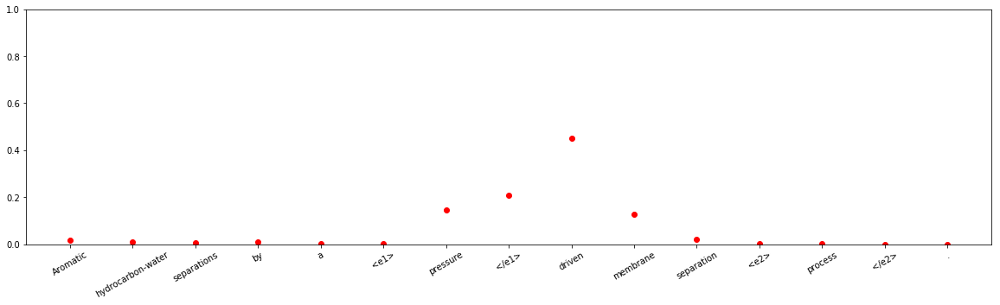












input sentence: An <e1> explanation </e1> of that conclusion was set out in <e2> appendix </e2> .
answer label:    Message-Topic(e2,e1)
wrong label:    Component-Whole(e1,e2)
Other 	:	 6.0313516e-12
Entity-Destination(e1,e2) 	:	 7.6390717e-07
Cause-Effect(e2,e1) 	:	 2.2396726e-10
Member-Collection(e2,e1) 	:	 2.8772492e-05
Entity-Origin(e1,e2) 	:	 0.0013131843
Message-Topic(e1,e2) 	:	 0.0010206511
Component-Whole(e1,e2) 	:	 0.98591447
Component-Whole(e2,e1) 	:	 2.7908038e-05
Instrument-Agency(e2,e1) 	:	 6.757475e-08
Content-Container(e1,e2) 	:	 1.5434684e-05
Product-Producer(e2,e1) 	:	 1.9982193e-07
Cause-Effect(e1,e2) 	:	 8.320828e-12
Product-Producer(e1,e2) 	:	 1.1953657e-05
Content-Container(e2,e1) 	:	 0.000303432
Entity-Origin(e2,e1) 	:	 2.6066502e-08
Message-Topic(e2,e1) 	:	 0.011362966
Instrument-Agency(e1,e2) 	:	 1.3710908e-07
Member-Collection(e1,e2) 	:	 1.41747885e-08
Entity-Destination(e2,e1) 	:	 2.043345e-10



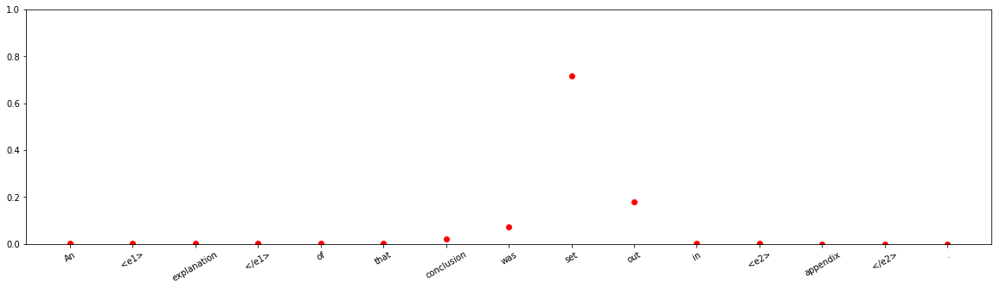





input sentence: <e1> Mothers </e1> were the single largest group to donate their <e2> kidneys </e2> .
answer label:    Entity-Origin(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 4.8609336e-06
Entity-Destination(e1,e2) 	:	 0.08784137
Cause-Effect(e2,e1) 	:	 3.8382817e-09
Member-Collection(e2,e1) 	:	 3.2537326e-05
Entity-Origin(e1,e2) 	:	 3.3115177e-07
Message-Topic(e1,e2) 	:	 3.1898413e-05
Component-Whole(e1,e2) 	:	 3.017444e-05
Component-Whole(e2,e1) 	:	 8.2659324e-05
Instrument-Agency(e2,e1) 	:	 0.23445404
Content-Container(e1,e2) 	:	 1.3658904e-05
Product-Producer(e2,e1) 	:	 0.6744483
Cause-Effect(e1,e2) 	:	 0.0020361077
Product-Producer(e1,e2) 	:	 1.4093816e-07
Content-Container(e2,e1) 	:	 0.00021794722
Entity-Origin(e2,e1) 	:	 2.5759807e-06
Message-Topic(e2,e1) 	:	 9.32013e-09
Instrument-Agency(e1,e2) 	:	 9.606863e-05
Member-Collection(e1,e2) 	:	 0.00070714206
Entity-Destination(e2,e1) 	:	 5.0363393e-08



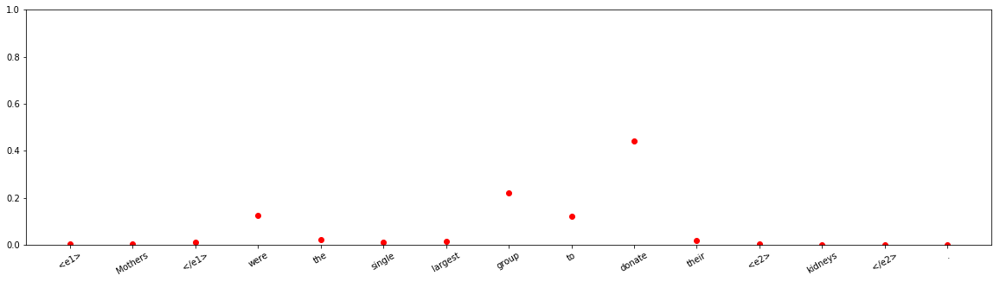




input sentence: My <e1> husband </e1> returned a $ 275 cashmere <e2> sweater </e2> to Jos .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.0012270749
Entity-Destination(e1,e2) 	:	 0.00011663955
Cause-Effect(e2,e1) 	:	 2.997903e-11
Member-Collection(e2,e1) 	:	 3.43182e-11
Entity-Origin(e1,e2) 	:	 7.069367e-05
Message-Topic(e1,e2) 	:	 1.5024672e-13
Component-Whole(e1,e2) 	:	 2.2456308e-10
Component-Whole(e2,e1) 	:	 2.0157823e-07
Instrument-Agency(e2,e1) 	:	 0.5868475
Content-Container(e1,e2) 	:	 0.0025581527
Product-Producer(e2,e1) 	:	 0.40915295
Cause-Effect(e1,e2) 	:	 1.0164699e-11
Product-Producer(e1,e2) 	:	 4.1830298e-10
Content-Container(e2,e1) 	:	 2.5714058e-05
Entity-Origin(e2,e1) 	:	 1.4366398e-09
Message-Topic(e2,e1) 	:	 1.9135113e-08
Instrument-Agency(e1,e2) 	:	 2.836001e-09
Member-Collection(e1,e2) 	:	 1.0593326e-06
Entity-Destination(e2,e1) 	:	 6.9619886e-11



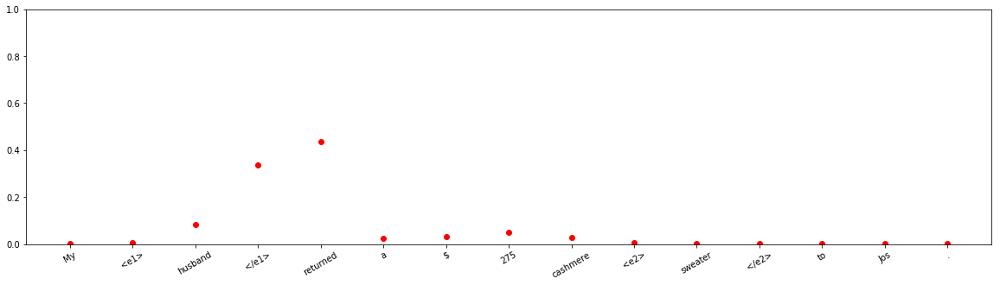




input sentence: The ultimate <e1> mystery </e1> is the source of the <e2> energy </e2> itself .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 9.142402e-08
Entity-Destination(e1,e2) 	:	 5.0493945e-12
Cause-Effect(e2,e1) 	:	 1.0719578e-08
Member-Collection(e2,e1) 	:	 1.0315152e-08
Entity-Origin(e1,e2) 	:	 1.5793112e-09
Message-Topic(e1,e2) 	:	 3.9513525e-06
Component-Whole(e1,e2) 	:	 7.572738e-09
Component-Whole(e2,e1) 	:	 1.9238766e-09
Instrument-Agency(e2,e1) 	:	 2.673755e-09
Content-Container(e1,e2) 	:	 2.4123132e-09
Product-Producer(e2,e1) 	:	 1.8415503e-07
Cause-Effect(e1,e2) 	:	 0.99724615
Product-Producer(e1,e2) 	:	 2.9568743e-09
Content-Container(e2,e1) 	:	 1.6763828e-07
Entity-Origin(e2,e1) 	:	 0.0027493085
Message-Topic(e2,e1) 	:	 5.1257407e-09
Instrument-Agency(e1,e2) 	:	 1.3248803e-07
Member-Collection(e1,e2) 	:	 2.5718303e-09
Entity-Destination(e2,e1) 	:	 1.0734103e-12



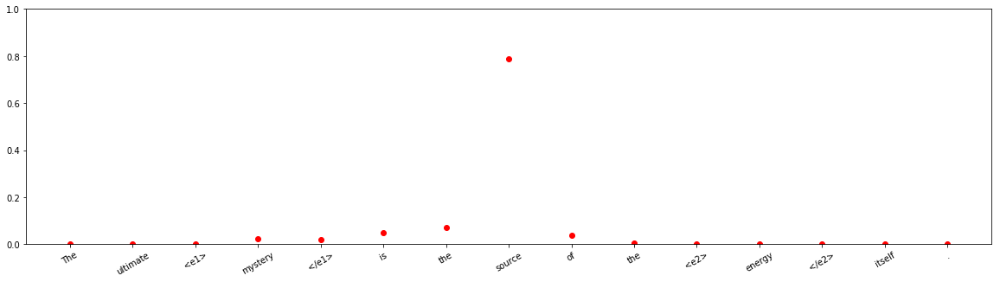











input sentence: Other early organisms have released <e1> barium </e1> into <e2> sulphate </e2> depleted pore-waters .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9662108
Entity-Destination(e1,e2) 	:	 0.033787582
Cause-Effect(e2,e1) 	:	 8.720584e-12
Member-Collection(e2,e1) 	:	 2.6329705e-10
Entity-Origin(e1,e2) 	:	 4.6687302e-07
Message-Topic(e1,e2) 	:	 2.9065358e-08
Component-Whole(e1,e2) 	:	 2.0573486e-10
Component-Whole(e2,e1) 	:	 1.5473865e-13
Instrument-Agency(e2,e1) 	:	 1.6602996e-13
Content-Container(e1,e2) 	:	 2.6199931e-08
Product-Producer(e2,e1) 	:	 1.232654e-09
Cause-Effect(e1,e2) 	:	 6.069911e-11
Product-Producer(e1,e2) 	:	 2.0005754e-11
Content-Container(e2,e1) 	:	 3.1569878e-09
Entity-Origin(e2,e1) 	:	 1.0850963e-06
Message-Topic(e2,e1) 	:	 7.0041867e-10
Instrument-Agency(e1,e2) 	:	 7.510867e-11
Member-Collection(e1,e2) 	:	 7.994891e-08
Entity-Destination(e2,e1) 	:	 2.9076874e-13



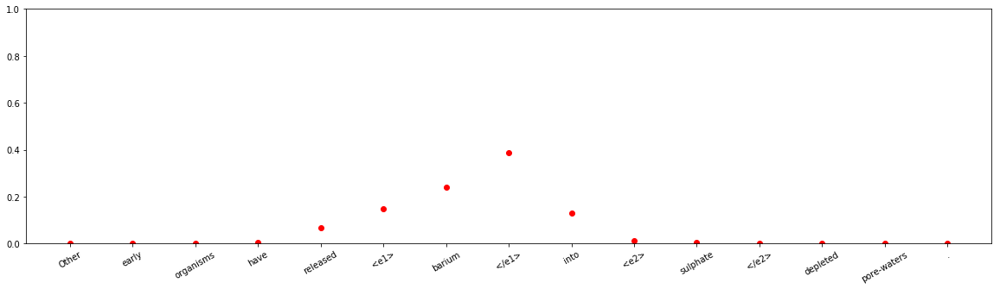







input sentence: The teenage <e1> boys </e1> were dragged into the <e2> fighting </e2> at school .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 0.004073112
Entity-Destination(e1,e2) 	:	 0.9958443
Cause-Effect(e2,e1) 	:	 2.0124698e-12
Member-Collection(e2,e1) 	:	 1.648252e-11
Entity-Origin(e1,e2) 	:	 2.4775723e-08
Message-Topic(e1,e2) 	:	 2.0134548e-10
Component-Whole(e1,e2) 	:	 1.2738429e-11
Component-Whole(e2,e1) 	:	 8.456873e-17
Instrument-Agency(e2,e1) 	:	 2.4319984e-11
Content-Container(e1,e2) 	:	 2.1926011e-08
Product-Producer(e2,e1) 	:	 8.3583656e-09
Cause-Effect(e1,e2) 	:	 5.878935e-10
Product-Producer(e1,e2) 	:	 1.5953566e-12
Content-Container(e2,e1) 	:	 3.171378e-12
Entity-Origin(e2,e1) 	:	 1.1022773e-09
Message-Topic(e2,e1) 	:	 1.23322455e-11
Instrument-Agency(e1,e2) 	:	 8.720346e-10
Member-Collection(e1,e2) 	:	 8.2593346e-05
Entity-Destination(e2,e1) 	:	 9.6311725e-14



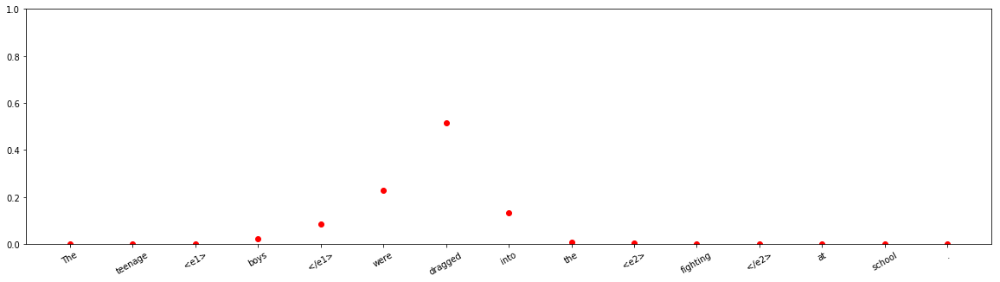


input sentence: The only <e1> escape </e1> I had now was in a <e2> bottle </e2> .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 1.2901202e-08
Entity-Destination(e1,e2) 	:	 2.9600747e-07
Cause-Effect(e2,e1) 	:	 2.8087452e-14
Member-Collection(e2,e1) 	:	 7.463554e-16
Entity-Origin(e1,e2) 	:	 7.2947664e-08
Message-Topic(e1,e2) 	:	 1.2504526e-17
Component-Whole(e1,e2) 	:	 5.2183036e-10
Component-Whole(e2,e1) 	:	 4.114305e-12
Instrument-Agency(e2,e1) 	:	 4.1465166e-13
Content-Container(e1,e2) 	:	 0.99999964
Product-Producer(e2,e1) 	:	 3.116119e-12
Cause-Effect(e1,e2) 	:	 1.9203645e-15
Product-Producer(e1,e2) 	:	 2.4153488e-14
Content-Container(e2,e1) 	:	 1.8665662e-09
Entity-Origin(e2,e1) 	:	 5.5969458e-11
Message-Topic(e2,e1) 	:	 6.2749277e-09
Instrument-Agency(e1,e2) 	:	 5.5412245e-14
Member-Collection(e1,e2) 	:	 4.85557e-13
Entity-Destination(e2,e1) 	:	 6.590065e-14



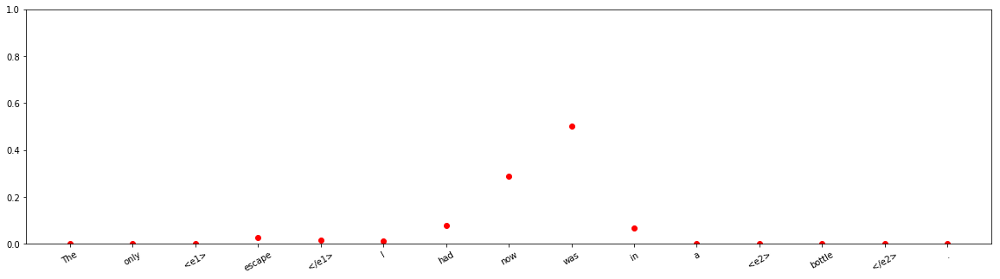


input sentence: The most disturbing <e1> moment </e1> arrives five <e2> minutes </e2> from the end .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.00030525407
Entity-Destination(e1,e2) 	:	 0.0001722524
Cause-Effect(e2,e1) 	:	 3.7685002e-06
Member-Collection(e2,e1) 	:	 4.0401876e-05
Entity-Origin(e1,e2) 	:	 7.048759e-05
Message-Topic(e1,e2) 	:	 4.178998e-06
Component-Whole(e1,e2) 	:	 8.61464e-06
Component-Whole(e2,e1) 	:	 0.99424404
Instrument-Agency(e2,e1) 	:	 9.847602e-05
Content-Container(e1,e2) 	:	 0.00090668636
Product-Producer(e2,e1) 	:	 1.0433333e-05
Cause-Effect(e1,e2) 	:	 1.681437e-07
Product-Producer(e1,e2) 	:	 2.0270274e-06
Content-Container(e2,e1) 	:	 0.0040952573
Entity-Origin(e2,e1) 	:	 1.0435049e-06
Message-Topic(e2,e1) 	:	 3.4235072e-05
Instrument-Agency(e1,e2) 	:	 2.0599364e-06
Member-Collection(e1,e2) 	:	 8.255255e-08
Entity-Destination(e2,e1) 	:	 5.564446e-07



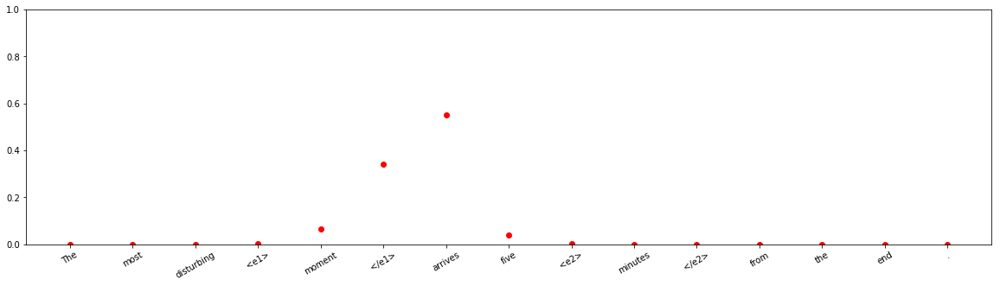



input sentence: <e1> Danger </e1> is part of the Palestinian journalist 's daily <e2> routine </e2> .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.0013475902
Entity-Destination(e1,e2) 	:	 0.00716064
Cause-Effect(e2,e1) 	:	 0.0015504294
Member-Collection(e2,e1) 	:	 3.920555e-06
Entity-Origin(e1,e2) 	:	 0.00014783659
Message-Topic(e1,e2) 	:	 3.2998175e-06
Component-Whole(e1,e2) 	:	 0.9490651
Component-Whole(e2,e1) 	:	 2.3302997e-05
Instrument-Agency(e2,e1) 	:	 0.00097475894
Content-Container(e1,e2) 	:	 0.03279052
Product-Producer(e2,e1) 	:	 1.3179684e-07
Cause-Effect(e1,e2) 	:	 1.5450416e-07
Product-Producer(e1,e2) 	:	 1.3652269e-06
Content-Container(e2,e1) 	:	 0.00023904635
Entity-Origin(e2,e1) 	:	 1.2357158e-06
Message-Topic(e2,e1) 	:	 0.0012452996
Instrument-Agency(e1,e2) 	:	 0.0008453614
Member-Collection(e1,e2) 	:	 0.0045999694
Entity-Destination(e2,e1) 	:	 8.9262606e-08



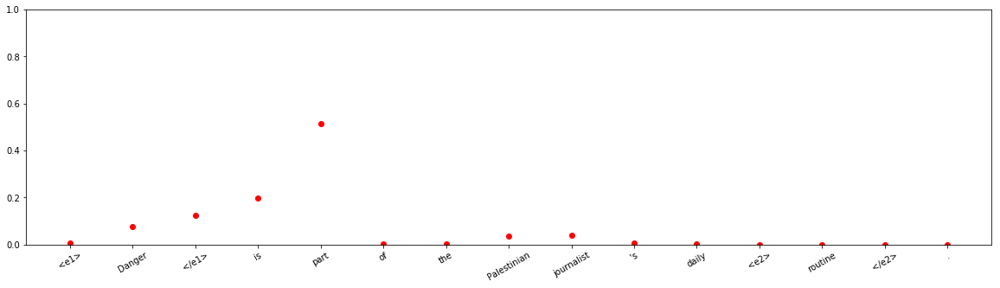




input sentence: The nice thing about the <e1> title </e1> of the first <e2> book </e2> was that as soon as you saw the the cover , or even read the title , you knew immediately about the blog without having to read a review or a `` to get more info '' blurb .
answer label:    Component-Whole(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 1.5517352e-09
Entity-Destination(e1,e2) 	:	 1.9820279e-10
Cause-Effect(e2,e1) 	:	 5.411568e-12
Member-Collection(e2,e1) 	:	 2.55754e-05
Entity-Origin(e1,e2) 	:	 1.240567e-07
Message-Topic(e1,e2) 	:	 1.8886627e-05
Component-Whole(e1,e2) 	:	 0.057662193
Component-Whole(e2,e1) 	:	 0.00044007623
Instrument-Agency(e2,e1) 	:	 2.294307e-11
Content-Container(e1,e2) 	:	 3.2096626e-08
Product-Producer(e2,e1) 	:	 0.0028613443
Cause-Effect(e1,e2) 	:	 1.2676568e-09
Product-Producer(e1,e2) 	:	 1.2529815e-05
Content-Container(e2,e1) 	:	 8.451605e-09
Entity-Origin(e2,e1) 	:	 3.6574793e-10
Message-Topic(e2,e1) 	:	 0.93897927
Instrument-Agency(e1,e2) 	:	 1.284

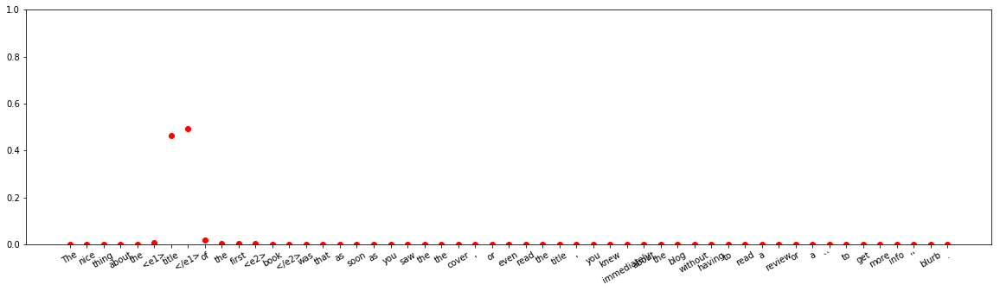


input sentence: A tidal wave of <e1> talent </e1> has emanated from this lush <e2> village </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 2.7250583e-15
Entity-Destination(e1,e2) 	:	 5.2642695e-12
Cause-Effect(e2,e1) 	:	 0.9999988
Member-Collection(e2,e1) 	:	 1.4655953e-12
Entity-Origin(e1,e2) 	:	 1.1913766e-06
Message-Topic(e1,e2) 	:	 2.6811794e-18
Component-Whole(e1,e2) 	:	 3.6750347e-14
Component-Whole(e2,e1) 	:	 1.7627283e-15
Instrument-Agency(e2,e1) 	:	 2.3073313e-17
Content-Container(e1,e2) 	:	 5.422891e-18
Product-Producer(e2,e1) 	:	 2.2941876e-14
Cause-Effect(e1,e2) 	:	 2.7809607e-13
Product-Producer(e1,e2) 	:	 6.0415823e-09
Content-Container(e2,e1) 	:	 1.2945326e-17
Entity-Origin(e2,e1) 	:	 1.389512e-13
Message-Topic(e2,e1) 	:	 1.6480043e-09
Instrument-Agency(e1,e2) 	:	 8.900724e-16
Member-Collection(e1,e2) 	:	 1.5322609e-13
Entity-Destination(e2,e1) 	:	 5.3691343e-15



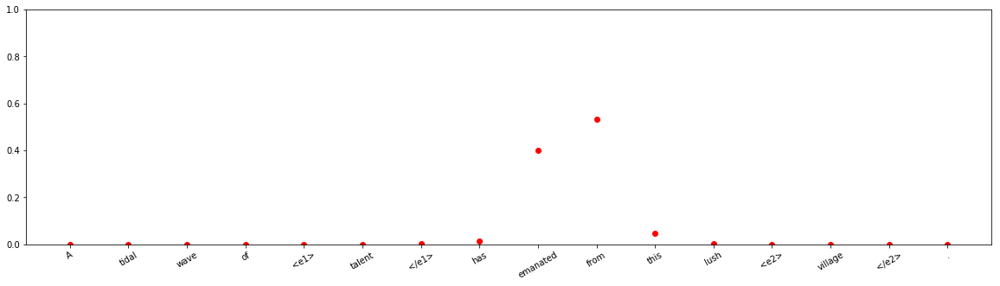



input sentence: The <e1> defendant </e1> was released from <e2> custody </e2> on March 2 , 2001 .
answer label:    Entity-Origin(e1,e2)
wrong label:    Other
Other 	:	 0.6977037
Entity-Destination(e1,e2) 	:	 8.417276e-09
Cause-Effect(e2,e1) 	:	 0.0003932867
Member-Collection(e2,e1) 	:	 4.564372e-09
Entity-Origin(e1,e2) 	:	 0.3018979
Message-Topic(e1,e2) 	:	 1.2444197e-12
Component-Whole(e1,e2) 	:	 8.8056277e-13
Component-Whole(e2,e1) 	:	 5.0798543e-10
Instrument-Agency(e2,e1) 	:	 2.69539e-07
Content-Container(e1,e2) 	:	 4.9836717e-07
Product-Producer(e2,e1) 	:	 1.6777037e-06
Cause-Effect(e1,e2) 	:	 7.4561045e-11
Product-Producer(e1,e2) 	:	 3.8090466e-08
Content-Container(e2,e1) 	:	 3.856989e-07
Entity-Origin(e2,e1) 	:	 5.808557e-08
Message-Topic(e2,e1) 	:	 2.146002e-06
Instrument-Agency(e1,e2) 	:	 7.0478285e-09
Member-Collection(e1,e2) 	:	 1.7673619e-08
Entity-Destination(e2,e1) 	:	 9.893468e-13



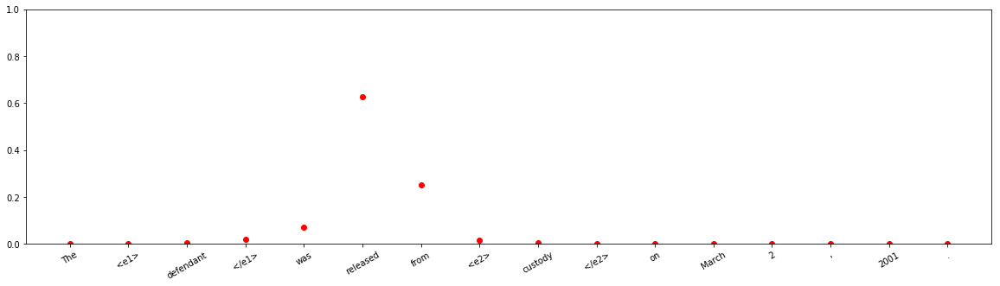



input sentence: The <e1> receiver </e1> was outputting the same <e2> tone </e2> to my Deva 5 .
answer label:    Cause-Effect(e1,e2)
wrong label:    Other
Other 	:	 0.9997553
Entity-Destination(e1,e2) 	:	 1.4547863e-06
Cause-Effect(e2,e1) 	:	 1.6920843e-06
Member-Collection(e2,e1) 	:	 7.882093e-08
Entity-Origin(e1,e2) 	:	 2.6202657e-05
Message-Topic(e1,e2) 	:	 1.423512e-09
Component-Whole(e1,e2) 	:	 4.116406e-09
Component-Whole(e2,e1) 	:	 2.5273393e-06
Instrument-Agency(e2,e1) 	:	 5.994639e-07
Content-Container(e1,e2) 	:	 9.957957e-07
Product-Producer(e2,e1) 	:	 0.000112356625
Cause-Effect(e1,e2) 	:	 6.479946e-05
Product-Producer(e1,e2) 	:	 4.9715336e-08
Content-Container(e2,e1) 	:	 6.378677e-06
Entity-Origin(e2,e1) 	:	 1.828374e-08
Message-Topic(e2,e1) 	:	 2.2460322e-08
Instrument-Agency(e1,e2) 	:	 2.7585715e-05
Member-Collection(e1,e2) 	:	 2.3627895e-09
Entity-Destination(e2,e1) 	:	 2.6148082e-11



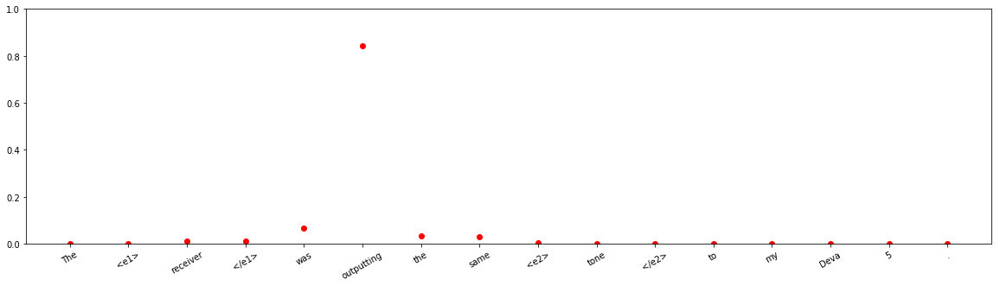





input sentence: Construction <e1> work </e1> at the facility started at the <e2> end </e2> of 1980 .
answer label:    Entity-Origin(e1,e2)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 2.7618259e-15
Cause-Effect(e2,e1) 	:	 1.9019971e-11
Member-Collection(e2,e1) 	:	 4.603442e-18
Entity-Origin(e1,e2) 	:	 3.5062635e-15
Message-Topic(e1,e2) 	:	 2.0220744e-16
Component-Whole(e1,e2) 	:	 8.5438953e-13
Component-Whole(e2,e1) 	:	 2.9327072e-11
Instrument-Agency(e2,e1) 	:	 2.2862031e-12
Content-Container(e1,e2) 	:	 9.691408e-16
Product-Producer(e2,e1) 	:	 4.803918e-14
Cause-Effect(e1,e2) 	:	 2.0483934e-16
Product-Producer(e1,e2) 	:	 3.459835e-14
Content-Container(e2,e1) 	:	 2.9947644e-17
Entity-Origin(e2,e1) 	:	 6.2773674e-18
Message-Topic(e2,e1) 	:	 6.898297e-11
Instrument-Agency(e1,e2) 	:	 5.214315e-14
Member-Collection(e1,e2) 	:	 7.961819e-15
Entity-Destination(e2,e1) 	:	 9.327458e-17



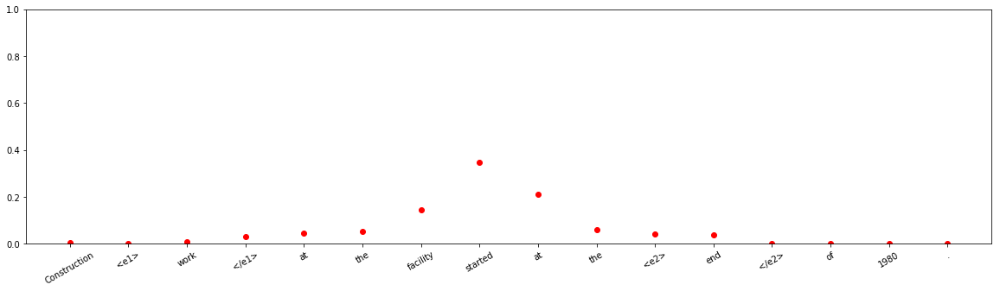






input sentence: The shows were marred by some <e1> controversy </e1> in regard to <e2> tickets </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9999945
Entity-Destination(e1,e2) 	:	 4.2368992e-13
Cause-Effect(e2,e1) 	:	 7.8918955e-11
Member-Collection(e2,e1) 	:	 7.5885136e-16
Entity-Origin(e1,e2) 	:	 8.406511e-17
Message-Topic(e1,e2) 	:	 4.379142e-11
Component-Whole(e1,e2) 	:	 7.6516994e-11
Component-Whole(e2,e1) 	:	 3.4228652e-16
Instrument-Agency(e2,e1) 	:	 1.6956334e-13
Content-Container(e1,e2) 	:	 3.635453e-11
Product-Producer(e2,e1) 	:	 1.6958428e-14
Cause-Effect(e1,e2) 	:	 1.7624772e-13
Product-Producer(e1,e2) 	:	 8.2329746e-14
Content-Container(e2,e1) 	:	 5.2180475e-14
Entity-Origin(e2,e1) 	:	 6.402648e-13
Message-Topic(e2,e1) 	:	 5.466575e-06
Instrument-Agency(e1,e2) 	:	 7.4159624e-13
Member-Collection(e1,e2) 	:	 1.6186454e-13
Entity-Destination(e2,e1) 	:	 1.3235874e-12



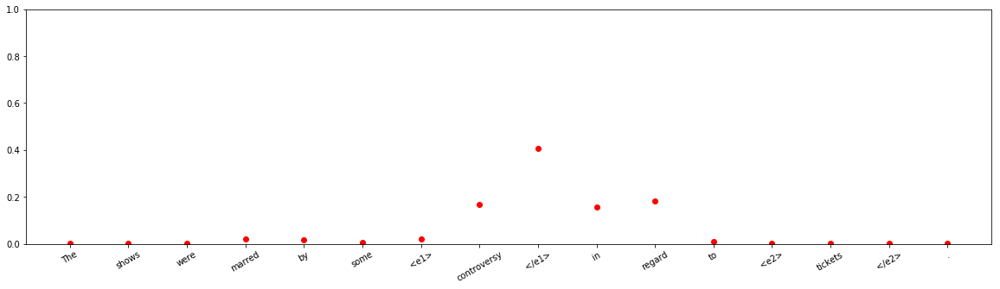


input sentence: A <e1> committee </e1> assists the <e2> commission </e2> with the implementation of the programme .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.0062953588
Entity-Destination(e1,e2) 	:	 3.5381026e-07
Cause-Effect(e2,e1) 	:	 6.312261e-07
Member-Collection(e2,e1) 	:	 0.014145733
Entity-Origin(e1,e2) 	:	 2.7862146e-07
Message-Topic(e1,e2) 	:	 0.011162037
Component-Whole(e1,e2) 	:	 2.3759839e-07
Component-Whole(e2,e1) 	:	 2.260847e-07
Instrument-Agency(e2,e1) 	:	 6.967068e-05
Content-Container(e1,e2) 	:	 3.5504806e-07
Product-Producer(e2,e1) 	:	 0.039549652
Cause-Effect(e1,e2) 	:	 0.0008515923
Product-Producer(e1,e2) 	:	 0.001983487
Content-Container(e2,e1) 	:	 2.1421547e-05
Entity-Origin(e2,e1) 	:	 5.4758334e-06
Message-Topic(e2,e1) 	:	 7.452856e-05
Instrument-Agency(e1,e2) 	:	 0.9113205
Member-Collection(e1,e2) 	:	 0.014518457
Entity-Destination(e2,e1) 	:	 2.109721e-08



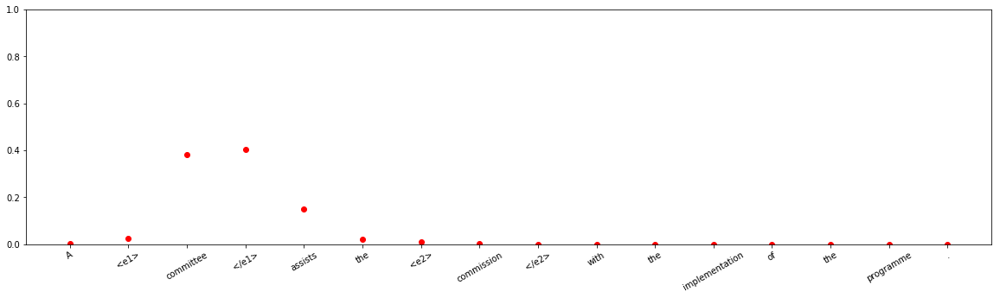




input sentence: The first I heard of the <e1> crisis </e1> was from my <e2> boss </e2> .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 8.8143355e-16
Entity-Destination(e1,e2) 	:	 1.8116471e-07
Cause-Effect(e2,e1) 	:	 0.9946696
Member-Collection(e2,e1) 	:	 5.9979285e-11
Entity-Origin(e1,e2) 	:	 0.005098685
Message-Topic(e1,e2) 	:	 9.060297e-17
Component-Whole(e1,e2) 	:	 2.9901742e-10
Component-Whole(e2,e1) 	:	 4.0651163e-12
Instrument-Agency(e2,e1) 	:	 9.978477e-14
Content-Container(e1,e2) 	:	 3.1975773e-11
Product-Producer(e2,e1) 	:	 3.8116534e-13
Cause-Effect(e1,e2) 	:	 1.5382689e-12
Product-Producer(e1,e2) 	:	 0.00023151474
Content-Container(e2,e1) 	:	 3.1301104e-13
Entity-Origin(e2,e1) 	:	 8.998021e-10
Message-Topic(e2,e1) 	:	 2.749882e-08
Instrument-Agency(e1,e2) 	:	 5.3847646e-09
Member-Collection(e1,e2) 	:	 2.287413e-10
Entity-Destination(e2,e1) 	:	 1.4927804e-11



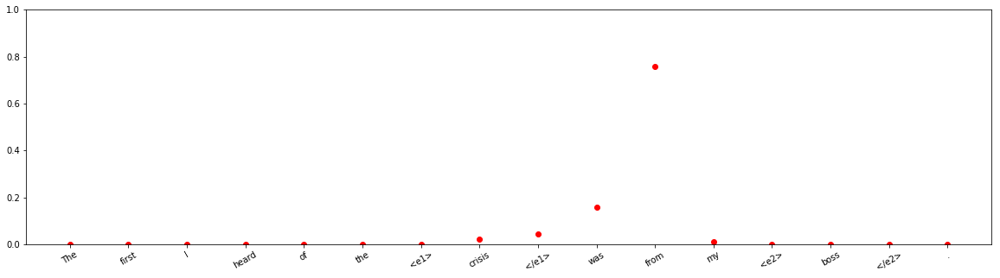











input sentence: Two <e1> seniors </e1> in this house have arrived into senior <e2> leadership positions </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 1.171101e-09
Entity-Destination(e1,e2) 	:	 0.9992312
Cause-Effect(e2,e1) 	:	 9.571903e-12
Member-Collection(e2,e1) 	:	 5.2508796e-07
Entity-Origin(e1,e2) 	:	 0.00068656995
Message-Topic(e1,e2) 	:	 3.7776138e-13
Component-Whole(e1,e2) 	:	 4.68037e-10
Component-Whole(e2,e1) 	:	 3.734341e-11
Instrument-Agency(e2,e1) 	:	 6.1711155e-14
Content-Container(e1,e2) 	:	 6.227652e-07
Product-Producer(e2,e1) 	:	 1.9091756e-10
Cause-Effect(e1,e2) 	:	 6.3425144e-13
Product-Producer(e1,e2) 	:	 1.1738244e-10
Content-Container(e2,e1) 	:	 3.9916646e-11
Entity-Origin(e2,e1) 	:	 1.15413194e-07
Message-Topic(e2,e1) 	:	 1.747601e-08
Instrument-Agency(e1,e2) 	:	 1.8948168e-10
Member-Collection(e1,e2) 	:	 8.1045e-05
Entity-Destination(e2,e1) 	:	 9.099072e-13



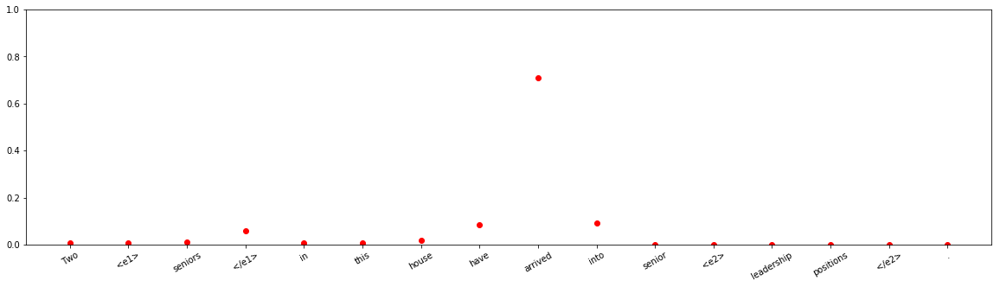
















input sentence: ThinkCascade is a CSS <e1> editor </e1> that uses a spreadsheet like <e2> interface </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 3.914418e-08
Entity-Destination(e1,e2) 	:	 6.1723337e-15
Cause-Effect(e2,e1) 	:	 4.569442e-15
Member-Collection(e2,e1) 	:	 6.172663e-15
Entity-Origin(e1,e2) 	:	 4.072669e-10
Message-Topic(e1,e2) 	:	 8.257058e-14
Component-Whole(e1,e2) 	:	 4.158334e-15
Component-Whole(e2,e1) 	:	 7.4737404e-11
Instrument-Agency(e2,e1) 	:	 0.99974924
Content-Container(e1,e2) 	:	 1.498492e-09
Product-Producer(e2,e1) 	:	 0.00025072426
Cause-Effect(e1,e2) 	:	 5.9342254e-14
Product-Producer(e1,e2) 	:	 1.2168601e-13
Content-Container(e2,e1) 	:	 2.469798e-10
Entity-Origin(e2,e1) 	:	 6.919179e-14
Message-Topic(e2,e1) 	:	 4.755296e-14
Instrument-Agency(e1,e2) 	:	 5.1521134e-08
Member-Collection(e1,e2) 	:	 6.970166e-13
Entity-Destination(e2,e1) 	:	 2.8999306e-15



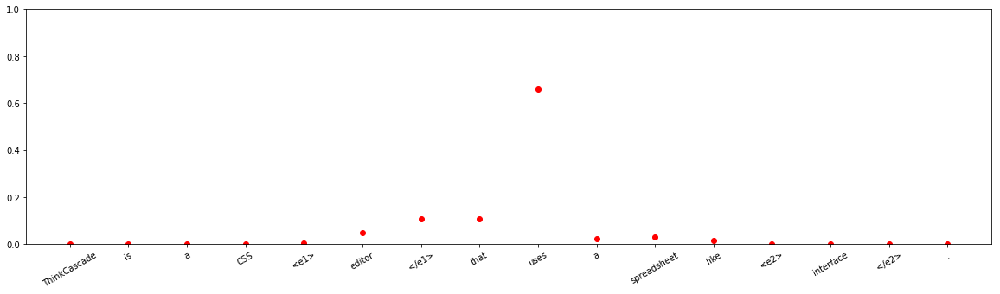









input sentence: The VP 's <e1> wife </e1> was a member of a succession <e2> movement </e2> .
answer label:    Member-Collection(e1,e2)
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.595486e-05
Entity-Destination(e1,e2) 	:	 1.765668e-07
Cause-Effect(e2,e1) 	:	 1.4928231e-09
Member-Collection(e2,e1) 	:	 0.9907058
Entity-Origin(e1,e2) 	:	 0.00014740665
Message-Topic(e1,e2) 	:	 2.0094952e-09
Component-Whole(e1,e2) 	:	 2.279015e-06
Component-Whole(e2,e1) 	:	 0.0001325387
Instrument-Agency(e2,e1) 	:	 7.577672e-08
Content-Container(e1,e2) 	:	 8.888409e-08
Product-Producer(e2,e1) 	:	 0.00039751566
Cause-Effect(e1,e2) 	:	 6.14339e-08
Product-Producer(e1,e2) 	:	 3.6808437e-10
Content-Container(e2,e1) 	:	 1.2103903e-05
Entity-Origin(e2,e1) 	:	 1.28127615e-08
Message-Topic(e2,e1) 	:	 9.1602396e-07
Instrument-Agency(e1,e2) 	:	 7.980123e-09
Member-Collection(e1,e2) 	:	 0.008585037
Entity-Destination(e2,e1) 	:	 9.118568e-11



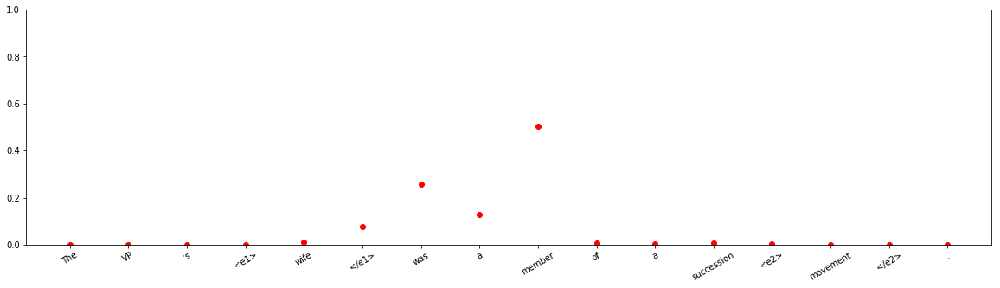


input sentence: $ 600 billion <e1> dollars </e1> have been put into the US <e2> economy </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.6379673
Entity-Destination(e1,e2) 	:	 0.36203006
Cause-Effect(e2,e1) 	:	 1.3380082e-11
Member-Collection(e2,e1) 	:	 2.6935073e-13
Entity-Origin(e1,e2) 	:	 1.0657557e-09
Message-Topic(e1,e2) 	:	 5.1437193e-10
Component-Whole(e1,e2) 	:	 8.685153e-09
Component-Whole(e2,e1) 	:	 1.639082e-13
Instrument-Agency(e2,e1) 	:	 5.768974e-13
Content-Container(e1,e2) 	:	 2.550786e-06
Product-Producer(e2,e1) 	:	 1.6770281e-08
Cause-Effect(e1,e2) 	:	 1.0155943e-09
Product-Producer(e1,e2) 	:	 5.8607617e-09
Content-Container(e2,e1) 	:	 1.0865147e-09
Entity-Origin(e2,e1) 	:	 3.724039e-10
Message-Topic(e2,e1) 	:	 3.7459955e-10
Instrument-Agency(e1,e2) 	:	 7.3181766e-10
Member-Collection(e1,e2) 	:	 3.371401e-08
Entity-Destination(e2,e1) 	:	 5.822883e-11



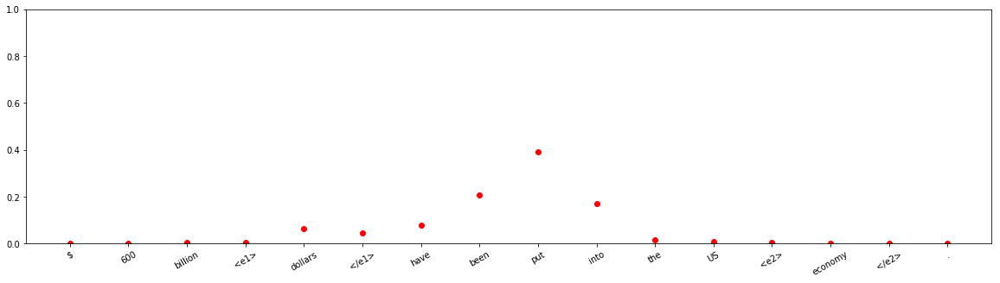







input sentence: The <e1> staff </e1> of the <e2> hospital </e2> are committed to maintaining these services .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 6.0922225e-06
Entity-Destination(e1,e2) 	:	 1.0300754e-06
Cause-Effect(e2,e1) 	:	 2.2236413e-06
Member-Collection(e2,e1) 	:	 0.46438664
Entity-Origin(e1,e2) 	:	 3.1370888e-05
Message-Topic(e1,e2) 	:	 1.0618723e-05
Component-Whole(e1,e2) 	:	 0.025308134
Component-Whole(e2,e1) 	:	 4.666781e-06
Instrument-Agency(e2,e1) 	:	 0.0024724803
Content-Container(e1,e2) 	:	 1.8936229e-06
Product-Producer(e2,e1) 	:	 0.00035197934
Cause-Effect(e1,e2) 	:	 2.8095867e-08
Product-Producer(e1,e2) 	:	 6.551699e-05
Content-Container(e2,e1) 	:	 5.361912e-06
Entity-Origin(e2,e1) 	:	 1.0789008e-07
Message-Topic(e2,e1) 	:	 0.0011301773
Instrument-Agency(e1,e2) 	:	 0.05564177
Member-Collection(e1,e2) 	:	 0.45057997
Entity-Destination(e2,e1) 	:	 2.808107e-09



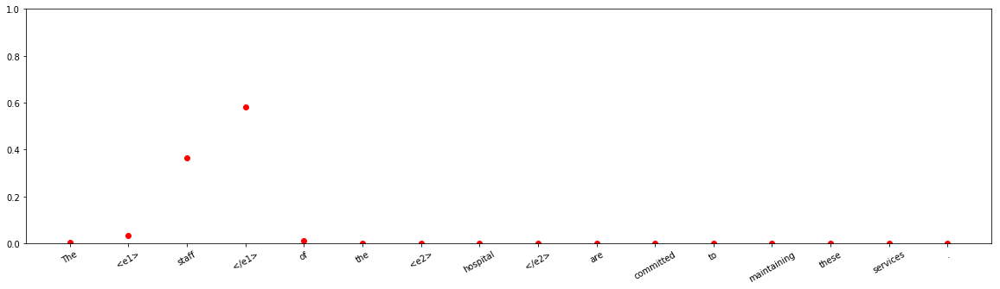



input sentence: Successful <e1> memes </e1> spread into numerous <e2> copies </e2> whereas unsuccessful ones become extinct .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 2.1731106e-09
Entity-Destination(e1,e2) 	:	 0.9999591
Cause-Effect(e2,e1) 	:	 3.0663792e-12
Member-Collection(e2,e1) 	:	 1.5294367e-07
Entity-Origin(e1,e2) 	:	 2.4223816e-08
Message-Topic(e1,e2) 	:	 1.3516721e-05
Component-Whole(e1,e2) 	:	 9.153654e-06
Component-Whole(e2,e1) 	:	 4.0206456e-11
Instrument-Agency(e2,e1) 	:	 3.419563e-14
Content-Container(e1,e2) 	:	 1.1546197e-08
Product-Producer(e2,e1) 	:	 3.833987e-08
Cause-Effect(e1,e2) 	:	 2.1070665e-09
Product-Producer(e1,e2) 	:	 4.8034977e-08
Content-Container(e2,e1) 	:	 1.0838066e-08
Entity-Origin(e2,e1) 	:	 1.4327629e-08
Message-Topic(e2,e1) 	:	 1.8883695e-09
Instrument-Agency(e1,e2) 	:	 3.1359998e-10
Member-Collection(e1,e2) 	:	 1.807713e-05
Entity-Destination(e2,e1) 	:	 5.269086e-11



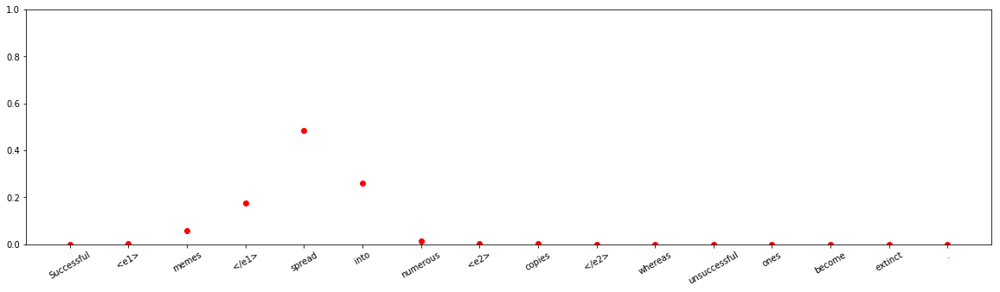


input sentence: These <e1> sessions </e1> highlight selected <e2> abstracts </e2> of submitted papers in poster format .
answer label:    Component-Whole(e2,e1)
wrong label:    Message-Topic(e2,e1)
Other 	:	 9.660777e-12
Entity-Destination(e1,e2) 	:	 5.8588965e-09
Cause-Effect(e2,e1) 	:	 1.5471668e-10
Member-Collection(e2,e1) 	:	 0.0041043772
Entity-Origin(e1,e2) 	:	 1.5426858e-07
Message-Topic(e1,e2) 	:	 0.017657936
Component-Whole(e1,e2) 	:	 6.610421e-06
Component-Whole(e2,e1) 	:	 0.08696697
Instrument-Agency(e2,e1) 	:	 6.515115e-08
Content-Container(e1,e2) 	:	 4.3956665e-09
Product-Producer(e2,e1) 	:	 1.3657459e-05
Cause-Effect(e1,e2) 	:	 1.8151728e-07
Product-Producer(e1,e2) 	:	 2.2573006e-07
Content-Container(e2,e1) 	:	 2.568164e-07
Entity-Origin(e2,e1) 	:	 1.6052282e-06
Message-Topic(e2,e1) 	:	 0.8912478
Instrument-Agency(e1,e2) 	:	 5.4460196e-09
Member-Collection(e1,e2) 	:	 1.6987872e-09
Entity-Destination(e2,e1) 	:	 6.6217915e-08



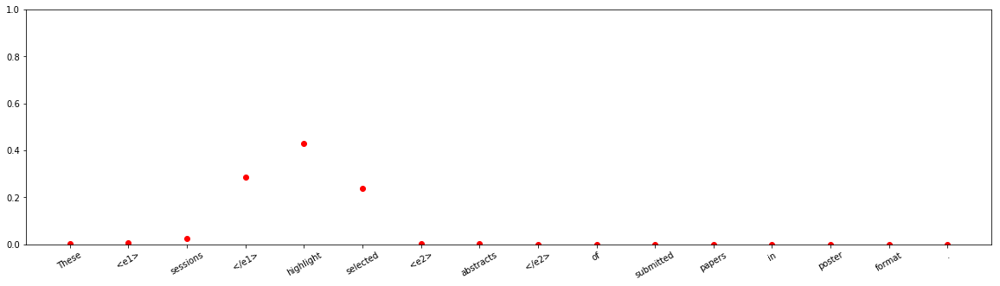


input sentence: Principal threatens to pull <e1> funding </e1> from student <e2> newspaper </e2> for covering flag-burning .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.1231008e-16
Entity-Destination(e1,e2) 	:	 2.0651723e-07
Cause-Effect(e2,e1) 	:	 0.999967
Member-Collection(e2,e1) 	:	 5.742972e-09
Entity-Origin(e1,e2) 	:	 3.2091706e-05
Message-Topic(e1,e2) 	:	 2.468416e-16
Component-Whole(e1,e2) 	:	 1.8354704e-08
Component-Whole(e2,e1) 	:	 6.3450547e-13
Instrument-Agency(e2,e1) 	:	 3.9801308e-11
Content-Container(e1,e2) 	:	 5.191111e-14
Product-Producer(e2,e1) 	:	 2.8439816e-12
Cause-Effect(e1,e2) 	:	 3.7800711e-13
Product-Producer(e1,e2) 	:	 2.3971796e-07
Content-Container(e2,e1) 	:	 4.961454e-12
Entity-Origin(e2,e1) 	:	 2.8007352e-11
Message-Topic(e2,e1) 	:	 4.963587e-07
Instrument-Agency(e1,e2) 	:	 6.045969e-12
Member-Collection(e1,e2) 	:	 4.3662022e-11
Entity-Destination(e2,e1) 	:	 4.3325635e-11



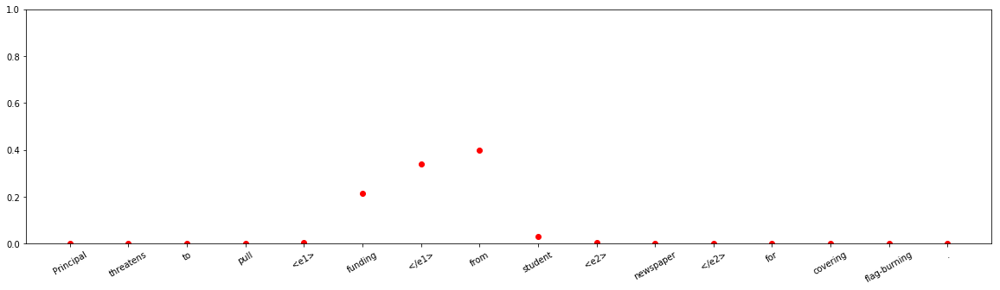











input sentence: Onions and garlic were added to the <e1> stew </e1> in the <e2> cauldron </e2> .
answer label:    Content-Container(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 2.519698e-06
Entity-Destination(e1,e2) 	:	 0.99492055
Cause-Effect(e2,e1) 	:	 2.210625e-09
Member-Collection(e2,e1) 	:	 3.6768792e-09
Entity-Origin(e1,e2) 	:	 0.00025609136
Message-Topic(e1,e2) 	:	 5.4017174e-10
Component-Whole(e1,e2) 	:	 0.0031192391
Component-Whole(e2,e1) 	:	 7.4370683e-09
Instrument-Agency(e2,e1) 	:	 2.2482742e-09
Content-Container(e1,e2) 	:	 0.0016831022
Product-Producer(e2,e1) 	:	 6.196074e-11
Cause-Effect(e1,e2) 	:	 1.0229217e-12
Product-Producer(e1,e2) 	:	 1.5393637e-09
Content-Container(e2,e1) 	:	 1.5079597e-07
Entity-Origin(e2,e1) 	:	 4.1092726e-08
Message-Topic(e2,e1) 	:	 4.0934418e-07
Instrument-Agency(e1,e2) 	:	 1.1262044e-07
Member-Collection(e1,e2) 	:	 1.7939035e-05
Entity-Destination(e2,e1) 	:	 1.534616e-11



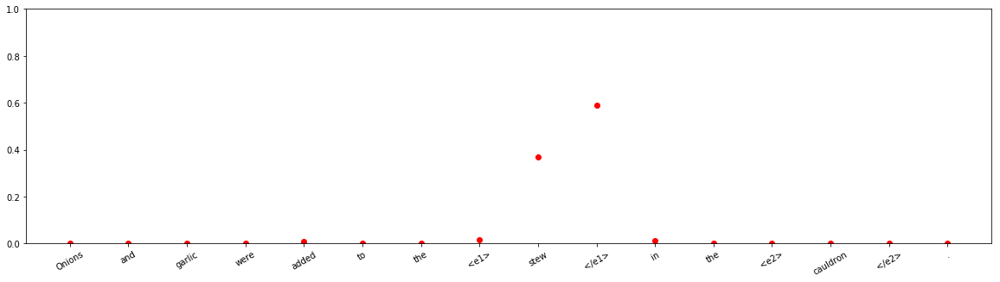



input sentence: The generated <e1> script </e1> creates candidate keys defined using a unique <e2> index </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 3.253344e-14
Entity-Destination(e1,e2) 	:	 2.3636586e-13
Cause-Effect(e2,e1) 	:	 5.3102533e-10
Member-Collection(e2,e1) 	:	 5.8907447e-13
Entity-Origin(e1,e2) 	:	 1.5008634e-09
Message-Topic(e1,e2) 	:	 2.3685406e-10
Component-Whole(e1,e2) 	:	 1.6534306e-12
Component-Whole(e2,e1) 	:	 6.648451e-07
Instrument-Agency(e2,e1) 	:	 0.9999993
Content-Container(e1,e2) 	:	 1.0557869e-11
Product-Producer(e2,e1) 	:	 1.0096507e-08
Cause-Effect(e1,e2) 	:	 3.5193284e-10
Product-Producer(e1,e2) 	:	 8.485071e-12
Content-Container(e2,e1) 	:	 9.912191e-11
Entity-Origin(e2,e1) 	:	 2.3349962e-15
Message-Topic(e2,e1) 	:	 3.9071253e-11
Instrument-Agency(e1,e2) 	:	 2.1477033e-09
Member-Collection(e1,e2) 	:	 1.4717714e-14
Entity-Destination(e2,e1) 	:	 6.766637e-14



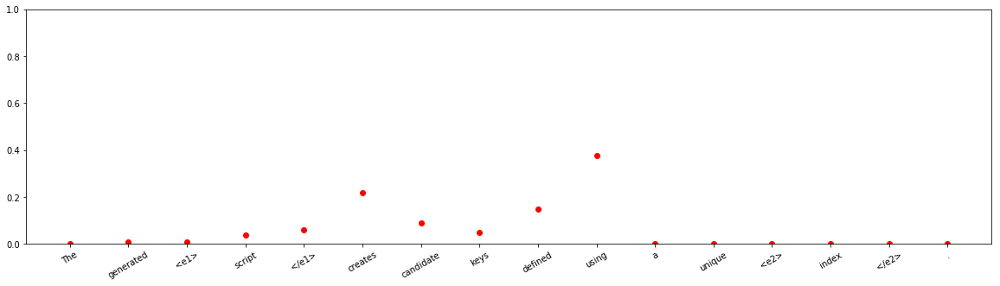




input sentence: This <e1> government </e1> views <e2> science </e2> simply as a tool for profit generation .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.99950624
Entity-Destination(e1,e2) 	:	 6.880663e-11
Cause-Effect(e2,e1) 	:	 7.3849556e-08
Member-Collection(e2,e1) 	:	 3.977258e-07
Entity-Origin(e1,e2) 	:	 1.3304281e-09
Message-Topic(e1,e2) 	:	 1.0112469e-05
Component-Whole(e1,e2) 	:	 2.0917072e-10
Component-Whole(e2,e1) 	:	 1.2360873e-10
Instrument-Agency(e2,e1) 	:	 6.9440507e-06
Content-Container(e1,e2) 	:	 1.7946545e-07
Product-Producer(e2,e1) 	:	 4.335565e-08
Cause-Effect(e1,e2) 	:	 1.6161353e-08
Product-Producer(e1,e2) 	:	 9.424949e-08
Content-Container(e2,e1) 	:	 1.2652182e-08
Entity-Origin(e2,e1) 	:	 1.0515328e-08
Message-Topic(e2,e1) 	:	 9.030797e-06
Instrument-Agency(e1,e2) 	:	 0.00023923528
Member-Collection(e1,e2) 	:	 0.00022752395
Entity-Destination(e2,e1) 	:	 1.0741817e-09



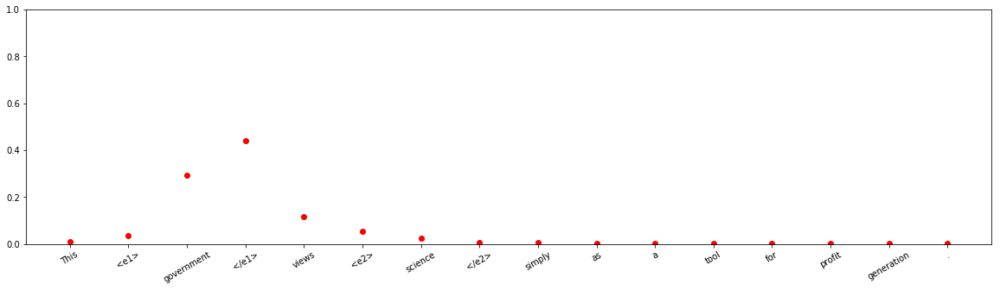








input sentence: As she looked up , she saw a <e1> flight </e1> of <e2> stairs </e2> .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 7.3993214e-11
Entity-Destination(e1,e2) 	:	 1.7375528e-07
Cause-Effect(e2,e1) 	:	 4.806162e-10
Member-Collection(e2,e1) 	:	 0.48201796
Entity-Origin(e1,e2) 	:	 3.0675335e-06
Message-Topic(e1,e2) 	:	 5.220416e-09
Component-Whole(e1,e2) 	:	 1.139107e-06
Component-Whole(e2,e1) 	:	 0.51797235
Instrument-Agency(e2,e1) 	:	 4.761129e-07
Content-Container(e1,e2) 	:	 6.582575e-07
Product-Producer(e2,e1) 	:	 4.438035e-10
Cause-Effect(e1,e2) 	:	 1.1963295e-11
Product-Producer(e1,e2) 	:	 5.946248e-11
Content-Container(e2,e1) 	:	 3.4925915e-06
Entity-Origin(e2,e1) 	:	 1.8772263e-10
Message-Topic(e2,e1) 	:	 1.1042415e-08
Instrument-Agency(e1,e2) 	:	 6.0898026e-07
Member-Collection(e1,e2) 	:	 1.1429274e-10
Entity-Destination(e2,e1) 	:	 1.3838598e-11



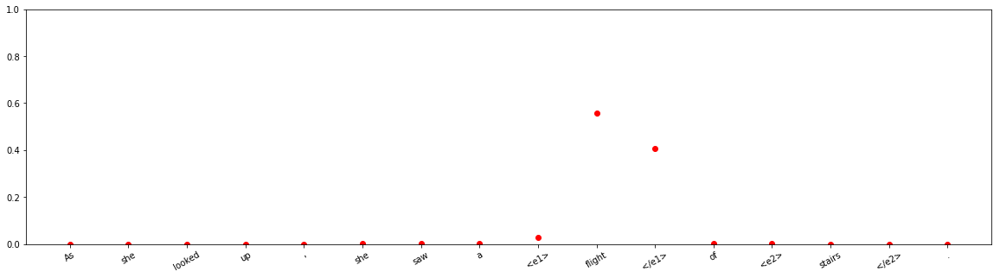


input sentence: A die-cut and creased cartonboard <e1> blank </e1> is made into a <e2> carton </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 3.6971872e-09
Entity-Destination(e1,e2) 	:	 0.99991393
Cause-Effect(e2,e1) 	:	 3.9718222e-14
Member-Collection(e2,e1) 	:	 1.6730029e-14
Entity-Origin(e1,e2) 	:	 3.64527e-05
Message-Topic(e1,e2) 	:	 9.9534964e-11
Component-Whole(e1,e2) 	:	 7.4049207e-09
Component-Whole(e2,e1) 	:	 3.487595e-14
Instrument-Agency(e2,e1) 	:	 3.22332e-15
Content-Container(e1,e2) 	:	 2.7085794e-06
Product-Producer(e2,e1) 	:	 4.6741556e-05
Cause-Effect(e1,e2) 	:	 6.7656406e-12
Product-Producer(e1,e2) 	:	 6.170135e-08
Content-Container(e2,e1) 	:	 2.8912885e-08
Entity-Origin(e2,e1) 	:	 6.028098e-09
Message-Topic(e2,e1) 	:	 4.7358168e-12
Instrument-Agency(e1,e2) 	:	 3.0655464e-11
Member-Collection(e1,e2) 	:	 2.3644503e-08
Entity-Destination(e2,e1) 	:	 6.275529e-12



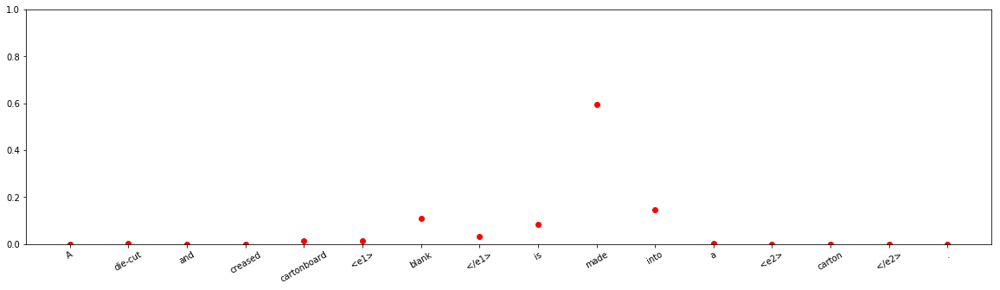









input sentence: For a time <e1> class </e1> became the dominant research topic for <e2> sociology </e2> .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 4.1108808e-05
Entity-Destination(e1,e2) 	:	 1.39911e-09
Cause-Effect(e2,e1) 	:	 1.3227447e-09
Member-Collection(e2,e1) 	:	 2.4912988e-06
Entity-Origin(e1,e2) 	:	 4.8584574e-05
Message-Topic(e1,e2) 	:	 7.964983e-06
Component-Whole(e1,e2) 	:	 4.5999036e-09
Component-Whole(e2,e1) 	:	 8.988128e-11
Instrument-Agency(e2,e1) 	:	 7.512856e-11
Content-Container(e1,e2) 	:	 2.47862e-08
Product-Producer(e2,e1) 	:	 0.00060300133
Cause-Effect(e1,e2) 	:	 1.2267432e-07
Product-Producer(e1,e2) 	:	 1.9398877e-07
Content-Container(e2,e1) 	:	 1.5312546e-11
Entity-Origin(e2,e1) 	:	 2.1966427e-05
Message-Topic(e2,e1) 	:	 0.9992743
Instrument-Agency(e1,e2) 	:	 9.2693436e-10
Member-Collection(e1,e2) 	:	 2.5431342e-07
Entity-Destination(e2,e1) 	:	 7.7775675e-11



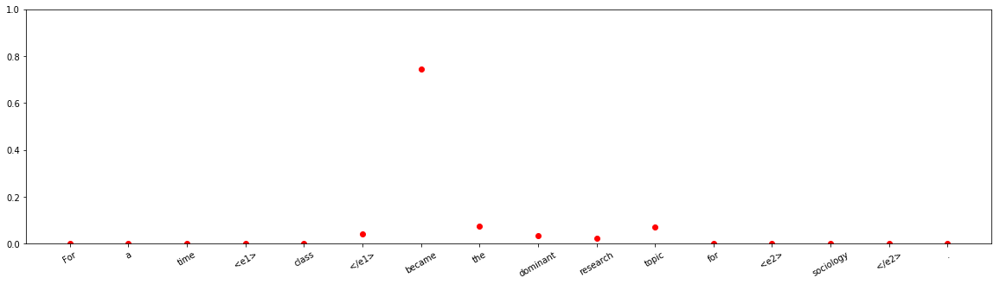








input sentence: A <e1> man </e1> was hidden in the <e2> body </e2> of the turk itself .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 3.4962624e-09
Entity-Destination(e1,e2) 	:	 2.2878175e-11
Cause-Effect(e2,e1) 	:	 3.6812953e-14
Member-Collection(e2,e1) 	:	 2.9517456e-12
Entity-Origin(e1,e2) 	:	 2.9796684e-07
Message-Topic(e1,e2) 	:	 5.394287e-15
Component-Whole(e1,e2) 	:	 5.550402e-08
Component-Whole(e2,e1) 	:	 3.949601e-12
Instrument-Agency(e2,e1) 	:	 2.5481093e-12
Content-Container(e1,e2) 	:	 0.99999964
Product-Producer(e2,e1) 	:	 9.3118756e-11
Cause-Effect(e1,e2) 	:	 3.8885662e-13
Product-Producer(e1,e2) 	:	 4.4865093e-12
Content-Container(e2,e1) 	:	 9.447113e-09
Entity-Origin(e2,e1) 	:	 2.3342717e-11
Message-Topic(e2,e1) 	:	 1.2084494e-08
Instrument-Agency(e1,e2) 	:	 3.7040184e-13
Member-Collection(e1,e2) 	:	 5.4701697e-08
Entity-Destination(e2,e1) 	:	 1.678356e-14



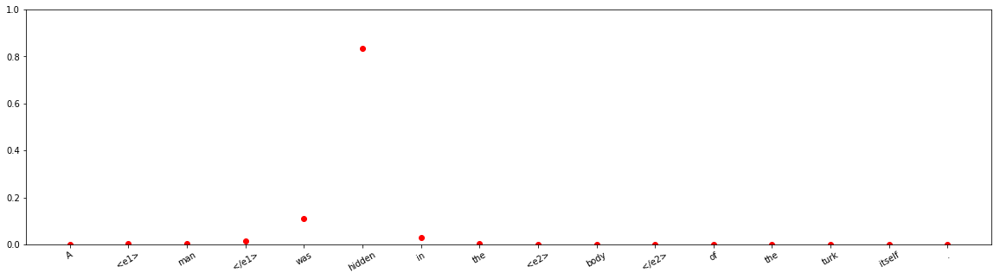


input sentence: The Sino-U.S. joint statement takes the <e1> ties </e1> into a positive <e2> era </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 2.4462398e-19
Cause-Effect(e2,e1) 	:	 8.413005e-17
Member-Collection(e2,e1) 	:	 1.5989364e-20
Entity-Origin(e1,e2) 	:	 1.01229136e-19
Message-Topic(e1,e2) 	:	 9.122616e-18
Component-Whole(e1,e2) 	:	 2.1152495e-14
Component-Whole(e2,e1) 	:	 4.2471713e-18
Instrument-Agency(e2,e1) 	:	 2.8770595e-18
Content-Container(e1,e2) 	:	 1.5659878e-15
Product-Producer(e2,e1) 	:	 1.8714101e-18
Cause-Effect(e1,e2) 	:	 1.5783407e-17
Product-Producer(e1,e2) 	:	 3.754312e-18
Content-Container(e2,e1) 	:	 9.408368e-16
Entity-Origin(e2,e1) 	:	 7.806798e-18
Message-Topic(e2,e1) 	:	 4.131179e-17
Instrument-Agency(e1,e2) 	:	 8.162234e-15
Member-Collection(e1,e2) 	:	 1.7095056e-17
Entity-Destination(e2,e1) 	:	 4.8955154e-19



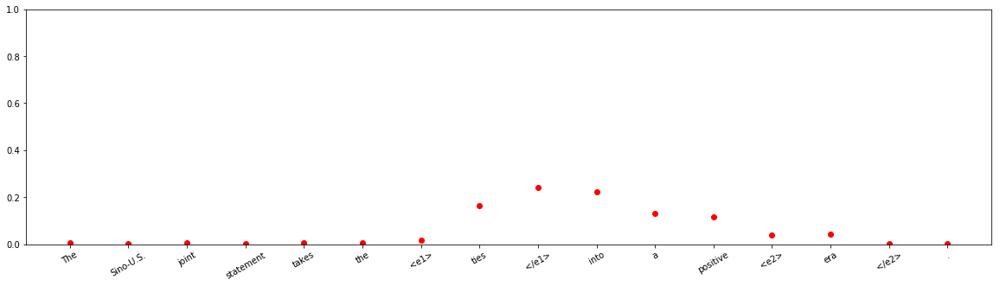



input sentence: <e1> Parties </e1> appear by <e2> telephone </e2> when circumstances prevent their appearance in person .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.9999217
Entity-Destination(e1,e2) 	:	 4.5584447e-14
Cause-Effect(e2,e1) 	:	 2.3785465e-07
Member-Collection(e2,e1) 	:	 2.3105403e-13
Entity-Origin(e1,e2) 	:	 2.5480432e-11
Message-Topic(e1,e2) 	:	 3.5365108e-13
Component-Whole(e1,e2) 	:	 1.0127112e-06
Component-Whole(e2,e1) 	:	 1.582898e-07
Instrument-Agency(e2,e1) 	:	 1.14749355e-07
Content-Container(e1,e2) 	:	 1.8377465e-10
Product-Producer(e2,e1) 	:	 1.5153638e-14
Cause-Effect(e1,e2) 	:	 2.3211814e-13
Product-Producer(e1,e2) 	:	 2.8121262e-08
Content-Container(e2,e1) 	:	 1.03001505e-11
Entity-Origin(e2,e1) 	:	 2.6633232e-14
Message-Topic(e2,e1) 	:	 1.3048052e-08
Instrument-Agency(e1,e2) 	:	 7.688996e-05
Member-Collection(e1,e2) 	:	 4.2705728e-11
Entity-Destination(e2,e1) 	:	 5.5079493e-14



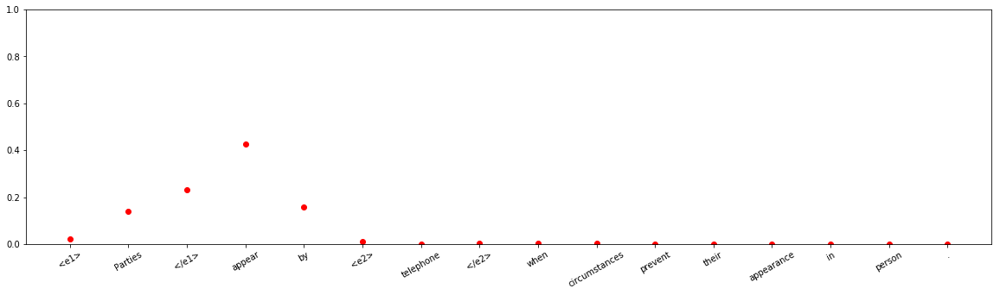


input sentence: He began to chat with him in <e1> ignorance </e1> of the <e2> news </e2> .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.0001670755
Entity-Destination(e1,e2) 	:	 9.001328e-13
Cause-Effect(e2,e1) 	:	 4.7360812e-05
Member-Collection(e2,e1) 	:	 2.2364972e-08
Entity-Origin(e1,e2) 	:	 1.1423329e-11
Message-Topic(e1,e2) 	:	 8.0744006e-10
Component-Whole(e1,e2) 	:	 0.9952113
Component-Whole(e2,e1) 	:	 8.394307e-09
Instrument-Agency(e2,e1) 	:	 7.902408e-08
Content-Container(e1,e2) 	:	 1.8655055e-11
Product-Producer(e2,e1) 	:	 6.1883193e-10
Cause-Effect(e1,e2) 	:	 2.717032e-09
Product-Producer(e1,e2) 	:	 2.0677307e-09
Content-Container(e2,e1) 	:	 3.849014e-11
Entity-Origin(e2,e1) 	:	 2.299507e-13
Message-Topic(e2,e1) 	:	 0.0045741466
Instrument-Agency(e1,e2) 	:	 5.073548e-09
Member-Collection(e1,e2) 	:	 3.6609654e-10
Entity-Destination(e2,e1) 	:	 3.2751553e-12



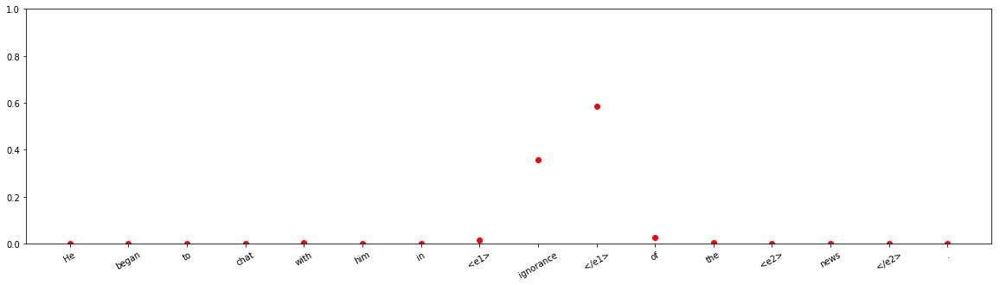








input sentence: The <e1> sound </e1> came from a wooden <e2> structure </e2> two hundred yards away .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.3634927e-13
Entity-Destination(e1,e2) 	:	 3.3400948e-07
Cause-Effect(e2,e1) 	:	 0.98323303
Member-Collection(e2,e1) 	:	 4.8561575e-11
Entity-Origin(e1,e2) 	:	 0.016759956
Message-Topic(e1,e2) 	:	 2.5656504e-16
Component-Whole(e1,e2) 	:	 1.3053343e-09
Component-Whole(e2,e1) 	:	 6.09126e-09
Instrument-Agency(e2,e1) 	:	 1.1783578e-10
Content-Container(e1,e2) 	:	 2.1912134e-08
Product-Producer(e2,e1) 	:	 2.887865e-08
Cause-Effect(e1,e2) 	:	 1.6357218e-11
Product-Producer(e1,e2) 	:	 6.159939e-06
Content-Container(e2,e1) 	:	 2.8638097e-10
Entity-Origin(e2,e1) 	:	 5.5434546e-10
Message-Topic(e2,e1) 	:	 4.765639e-07
Instrument-Agency(e1,e2) 	:	 1.7467186e-11
Member-Collection(e1,e2) 	:	 2.2352122e-11
Entity-Destination(e2,e1) 	:	 4.555063e-10



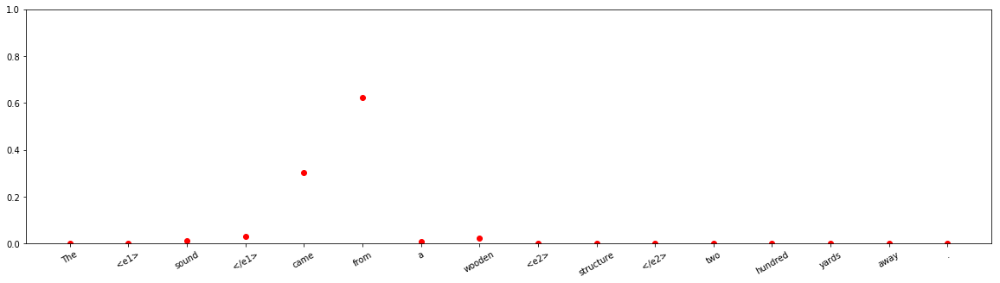




input sentence: This page is a <e1> guide </e1> to the floating <e2> world </e2> of cyberspace .
answer label:    Message-Topic(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 5.518229e-07
Entity-Destination(e1,e2) 	:	 0.98850274
Cause-Effect(e2,e1) 	:	 3.0782416e-13
Member-Collection(e2,e1) 	:	 1.5617106e-08
Entity-Origin(e1,e2) 	:	 9.136876e-08
Message-Topic(e1,e2) 	:	 0.011125604
Component-Whole(e1,e2) 	:	 0.00014203222
Component-Whole(e2,e1) 	:	 2.2556839e-09
Instrument-Agency(e2,e1) 	:	 1.340647e-11
Content-Container(e1,e2) 	:	 2.9828195e-06
Product-Producer(e2,e1) 	:	 3.9291997e-10
Cause-Effect(e1,e2) 	:	 1.0835614e-09
Product-Producer(e1,e2) 	:	 8.453799e-10
Content-Container(e2,e1) 	:	 1.0153987e-09
Entity-Origin(e2,e1) 	:	 2.5943707e-09
Message-Topic(e2,e1) 	:	 1.98498e-10
Instrument-Agency(e1,e2) 	:	 2.1930111e-06
Member-Collection(e1,e2) 	:	 0.00022373206
Entity-Destination(e2,e1) 	:	 1.6100757e-10



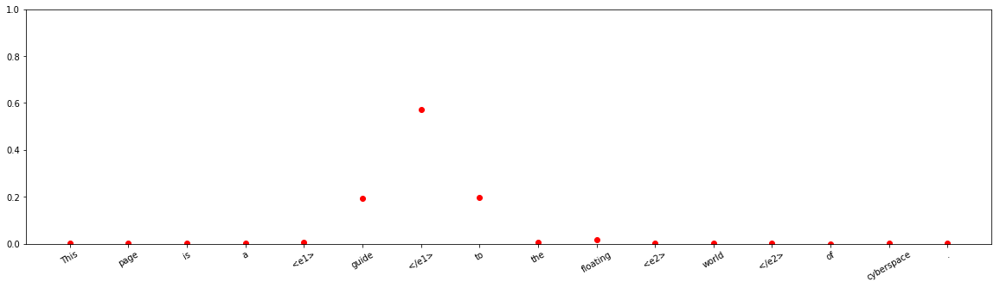














input sentence: Yesterday the <e1> team </e1> recycled 200kg of unwanted knitting wool into <e2> insulation </e2> .
answer label:    Product-Producer(e2,e1)
wrong label:    Other
Other 	:	 0.983836
Entity-Destination(e1,e2) 	:	 3.5508015e-07
Cause-Effect(e2,e1) 	:	 2.9423273e-08
Member-Collection(e2,e1) 	:	 2.3269142e-09
Entity-Origin(e1,e2) 	:	 2.229542e-06
Message-Topic(e1,e2) 	:	 5.6382476e-10
Component-Whole(e1,e2) 	:	 6.3019186e-13
Component-Whole(e2,e1) 	:	 6.112452e-11
Instrument-Agency(e2,e1) 	:	 0.006385023
Content-Container(e1,e2) 	:	 4.6920964e-06
Product-Producer(e2,e1) 	:	 0.009735347
Cause-Effect(e1,e2) 	:	 3.5909397e-06
Product-Producer(e1,e2) 	:	 1.8484141e-09
Content-Container(e2,e1) 	:	 1.4380632e-07
Entity-Origin(e2,e1) 	:	 1.1589633e-08
Message-Topic(e2,e1) 	:	 3.1536201e-10
Instrument-Agency(e1,e2) 	:	 1.1958046e-07
Member-Collection(e1,e2) 	:	 3.25139e-05
Entity-Destination(e2,e1) 	:	 3.773912e-11



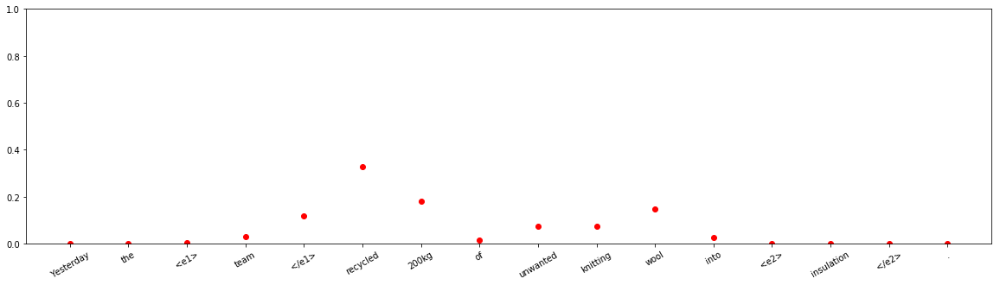



input sentence: A child is told a <e1> lie </e1> for several years by their <e2> parents </e2> before he/she realizes that a Santa Claus does not exist .
answer label:    Product-Producer(e1,e2)
wrong label:    Other
Other 	:	 0.9998913
Entity-Destination(e1,e2) 	:	 2.0006544e-14
Cause-Effect(e2,e1) 	:	 8.687337e-09
Member-Collection(e2,e1) 	:	 3.5054913e-13
Entity-Origin(e1,e2) 	:	 2.2468258e-12
Message-Topic(e1,e2) 	:	 2.741384e-15
Component-Whole(e1,e2) 	:	 1.8547915e-09
Component-Whole(e2,e1) 	:	 3.8062878e-12
Instrument-Agency(e2,e1) 	:	 9.002547e-12
Content-Container(e1,e2) 	:	 5.220119e-13
Product-Producer(e2,e1) 	:	 1.3535665e-13
Cause-Effect(e1,e2) 	:	 1.4677658e-15
Product-Producer(e1,e2) 	:	 8.860235e-05
Content-Container(e2,e1) 	:	 4.1088326e-12
Entity-Origin(e2,e1) 	:	 1.0656463e-15
Message-Topic(e2,e1) 	:	 1.4396129e-11
Instrument-Agency(e1,e2) 	:	 2.0102303e-05
Member-Collection(e1,e2) 	:	 3.3610653e-10
Entity-Destination(e2,e1) 	:	 1.2446545e-13



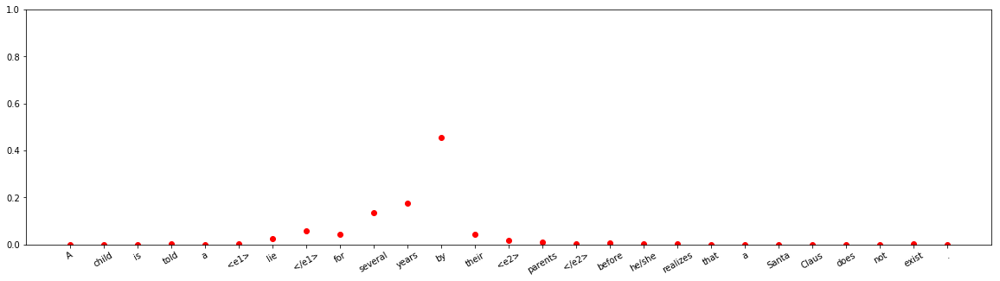


input sentence: Essentially , the <e1> blisters </e1> that appear in the mouth are caused by the <e2> herpes simplex virus </e2> type 1 , HSV-1 for short .
answer label:    Product-Producer(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.0878336e-19
Entity-Destination(e1,e2) 	:	 8.7556856e-17
Cause-Effect(e2,e1) 	:	 0.9999999
Member-Collection(e2,e1) 	:	 1.0693947e-15
Entity-Origin(e1,e2) 	:	 4.2141414e-15
Message-Topic(e1,e2) 	:	 3.5072859e-19
Component-Whole(e1,e2) 	:	 2.1060416e-11
Component-Whole(e2,e1) 	:	 1.0587759e-15
Instrument-Agency(e2,e1) 	:	 1.1869121e-17
Content-Container(e1,e2) 	:	 1.9691201e-20
Product-Producer(e2,e1) 	:	 2.3237712e-18
Cause-Effect(e1,e2) 	:	 4.613989e-11
Product-Producer(e1,e2) 	:	 7.600218e-08
Content-Container(e2,e1) 	:	 1.6974772e-17
Entity-Origin(e2,e1) 	:	 1.074696e-20
Message-Topic(e2,e1) 	:	 3.1166276e-14
Instrument-Agency(e1,e2) 	:	 9.352077e-13
Member-Collection(e1,e2) 	:	 3.7214608e-17
Entity-Destination(e2,e1) 	:	 1.1184422e-18



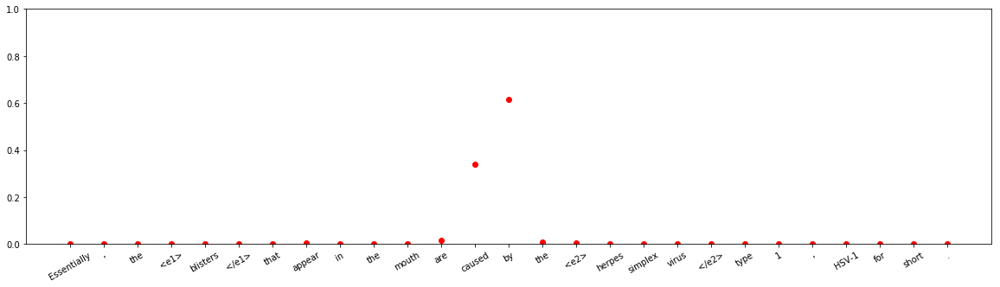



input sentence: His literary debut occured in 1919 , when he joined Esenin 's small <e1> circle </e1> of `` literary <e2> hooligans </e2> , '' the Imaginists .
answer label:    Member-Collection(e2,e1)
wrong label:    Member-Collection(e1,e2)
Other 	:	 1.6956324e-08
Entity-Destination(e1,e2) 	:	 1.6382132e-10
Cause-Effect(e2,e1) 	:	 4.2818367e-09
Member-Collection(e2,e1) 	:	 0.08382651
Entity-Origin(e1,e2) 	:	 2.7448545e-08
Message-Topic(e1,e2) 	:	 9.456919e-08
Component-Whole(e1,e2) 	:	 1.2559079e-07
Component-Whole(e2,e1) 	:	 1.446264e-14
Instrument-Agency(e2,e1) 	:	 6.7196654e-10
Content-Container(e1,e2) 	:	 7.2521837e-12
Product-Producer(e2,e1) 	:	 3.55269e-05
Cause-Effect(e1,e2) 	:	 5.2925614e-08
Product-Producer(e1,e2) 	:	 0.00022863867
Content-Container(e2,e1) 	:	 3.4656322e-09
Entity-Origin(e2,e1) 	:	 1.6687574e-09
Message-Topic(e2,e1) 	:	 4.2241798e-08
Instrument-Agency(e1,e2) 	:	 6.923378e-06
Member-Collection(e1,e2) 	:	 0.91590196
Entity-Destination(e2,e1) 	:	 3.6892205e-1

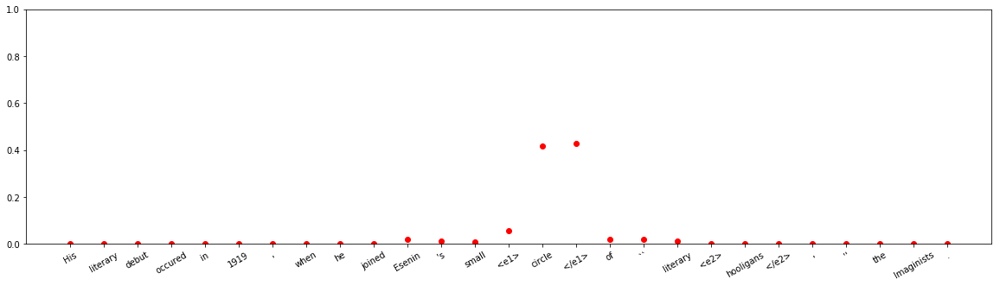





input sentence: In 1952 , when Fidel ran for <e1> congressman </e1> on the Ortodoxo <e2> party ticket </e2> , it was Father who helped finance his campaign .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 9.514859e-05
Entity-Destination(e1,e2) 	:	 0.41736925
Cause-Effect(e2,e1) 	:	 2.7633915e-09
Member-Collection(e2,e1) 	:	 0.0010115305
Entity-Origin(e1,e2) 	:	 0.0002476046
Message-Topic(e1,e2) 	:	 0.4770208
Component-Whole(e1,e2) 	:	 7.598302e-05
Component-Whole(e2,e1) 	:	 2.2021352e-12
Instrument-Agency(e2,e1) 	:	 1.7984597e-05
Content-Container(e1,e2) 	:	 4.776008e-08
Product-Producer(e2,e1) 	:	 2.3090082e-05
Cause-Effect(e1,e2) 	:	 4.6036588e-10
Product-Producer(e1,e2) 	:	 2.2281743e-06
Content-Container(e2,e1) 	:	 1.8714128e-06
Entity-Origin(e2,e1) 	:	 1.8791852e-06
Message-Topic(e2,e1) 	:	 1.5405725e-05
Instrument-Agency(e1,e2) 	:	 8.804439e-05
Member-Collection(e1,e2) 	:	 0.10402922
Entity-Destination(e2,e1) 	:	 2.5127251e-09



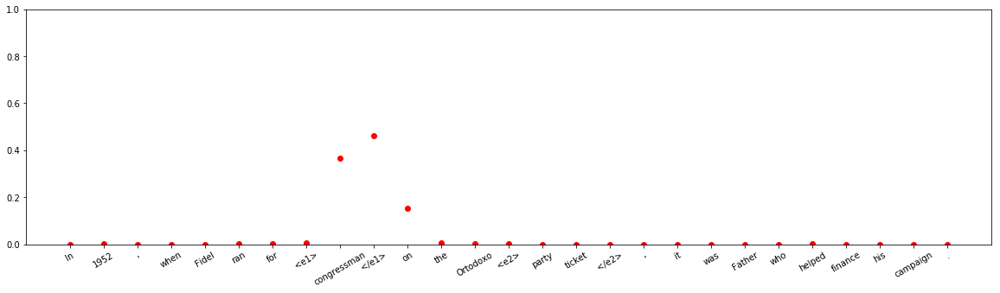


















input sentence: In <e1> praise </e1> of these beautiful <e2> classics </e2> we organized 'mekko exhibition ' out of DIY fashion shoots and nostalgic photos from family albums .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 1.0112008e-06
Entity-Destination(e1,e2) 	:	 1.0160867e-11
Cause-Effect(e2,e1) 	:	 5.995662e-08
Member-Collection(e2,e1) 	:	 0.30380702
Entity-Origin(e1,e2) 	:	 1.08093765e-08
Message-Topic(e1,e2) 	:	 4.5039913e-05
Component-Whole(e1,e2) 	:	 4.688408e-06
Component-Whole(e2,e1) 	:	 2.1961976e-06
Instrument-Agency(e2,e1) 	:	 8.141452e-09
Content-Container(e1,e2) 	:	 6.605235e-12
Product-Producer(e2,e1) 	:	 0.0001780305
Cause-Effect(e1,e2) 	:	 8.322068e-07
Product-Producer(e1,e2) 	:	 7.50585e-06
Content-Container(e2,e1) 	:	 6.634779e-09
Entity-Origin(e2,e1) 	:	 1.3912062e-08
Message-Topic(e2,e1) 	:	 0.69595194
Instrument-Agency(e1,e2) 	:	 1.5793292e-08
Member-Collection(e1,e2) 	:	 1.6206353e-06
Entity-Destination(e2,e1) 	:	 2.7364

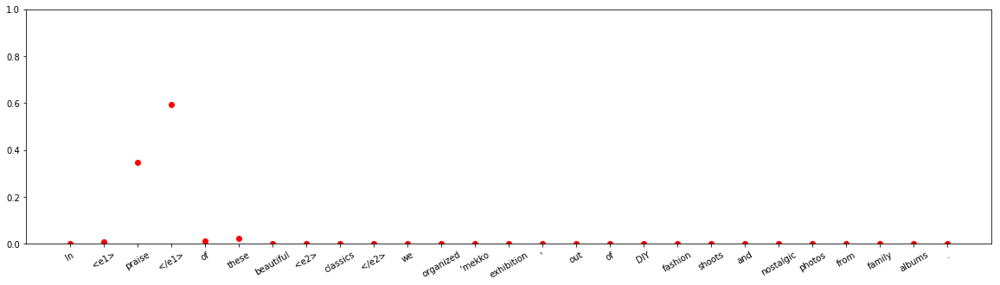












input sentence: During experiments in captivity , <e1> capuchins </e1> have made flint <e2> knives </e2> after banging a piece of flint against the floor until it broke .
answer label:    Product-Producer(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 9.3572926e-05
Entity-Destination(e1,e2) 	:	 2.1927323e-12
Cause-Effect(e2,e1) 	:	 2.7603141e-08
Member-Collection(e2,e1) 	:	 1.0866008e-10
Entity-Origin(e1,e2) 	:	 6.4676603e-10
Message-Topic(e1,e2) 	:	 6.89275e-14
Component-Whole(e1,e2) 	:	 9.930546e-09
Component-Whole(e2,e1) 	:	 0.00033992523
Instrument-Agency(e2,e1) 	:	 0.99948716
Content-Container(e1,e2) 	:	 2.5889781e-08
Product-Producer(e2,e1) 	:	 6.40439e-05
Cause-Effect(e1,e2) 	:	 2.59328e-10
Product-Producer(e1,e2) 	:	 6.9566135e-09
Content-Container(e2,e1) 	:	 3.8425623e-09
Entity-Origin(e2,e1) 	:	 9.4686835e-11
Message-Topic(e2,e1) 	:	 1.1404467e-08
Instrument-Agency(e1,e2) 	:	 1.5191013e-05
Member-Collection(e1,e2) 	:	 7.595194e-11
Entity-Destination(e2,e

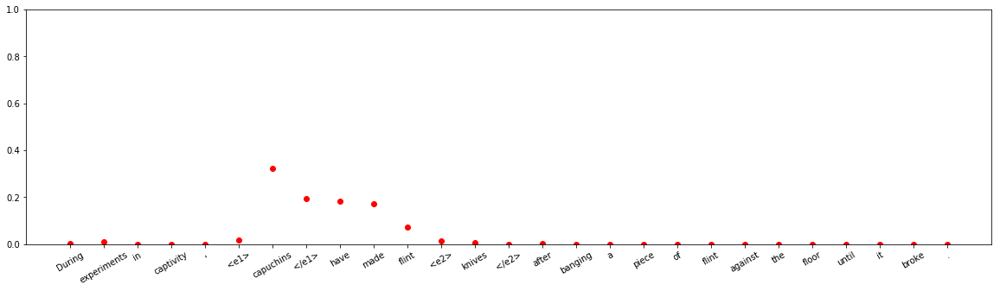






input sentence: Although some of the <e1> stories </e1> were based on <e2> historical truths </e2> , most were a weaving of Greek , Roman and Celtic myths .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 0.0011593591
Entity-Destination(e1,e2) 	:	 2.7853561e-11
Cause-Effect(e2,e1) 	:	 6.9812437e-12
Member-Collection(e2,e1) 	:	 1.7660689e-07
Entity-Origin(e1,e2) 	:	 1.1143775e-06
Message-Topic(e1,e2) 	:	 0.998475
Component-Whole(e1,e2) 	:	 4.8898123e-08
Component-Whole(e2,e1) 	:	 2.3125158e-05
Instrument-Agency(e2,e1) 	:	 7.4138484e-10
Content-Container(e1,e2) 	:	 3.3869287e-06
Product-Producer(e2,e1) 	:	 5.331169e-07
Cause-Effect(e1,e2) 	:	 1.0649305e-08
Product-Producer(e1,e2) 	:	 7.8193985e-08
Content-Container(e2,e1) 	:	 6.3552825e-08
Entity-Origin(e2,e1) 	:	 9.485596e-06
Message-Topic(e2,e1) 	:	 0.00032439255
Instrument-Agency(e1,e2) 	:	 3.3107428e-06
Member-Collection(e1,e2) 	:	 2.2263254e-10
Entity-Destination(e2,e1) 	:	 1.228075e-11



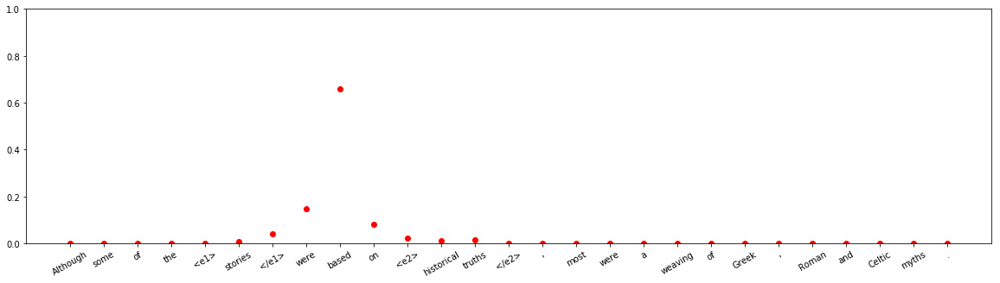



input sentence: Several major manufacturers of <e1> chain </e1> <e2> saws </e2> claim to have invented the first chain saw and all their claims point to the 1920s .
answer label:    Component-Whole(e1,e2)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 4.70292e-08
Entity-Destination(e1,e2) 	:	 1.1463494e-10
Cause-Effect(e2,e1) 	:	 7.358496e-08
Member-Collection(e2,e1) 	:	 2.516059e-07
Entity-Origin(e1,e2) 	:	 1.8333553e-08
Message-Topic(e1,e2) 	:	 1.0046846e-07
Component-Whole(e1,e2) 	:	 4.3764686e-08
Component-Whole(e2,e1) 	:	 8.979568e-05
Instrument-Agency(e2,e1) 	:	 5.6498073e-05
Content-Container(e1,e2) 	:	 4.038349e-08
Product-Producer(e2,e1) 	:	 0.00017984853
Cause-Effect(e1,e2) 	:	 3.087473e-06
Product-Producer(e1,e2) 	:	 0.003093139
Content-Container(e2,e1) 	:	 7.616587e-09
Entity-Origin(e2,e1) 	:	 1.8406259e-06
Message-Topic(e2,e1) 	:	 2.370486e-07
Instrument-Agency(e1,e2) 	:	 0.99657494
Member-Collection(e1,e2) 	:	 1.7470693e-08
Entity-Destination(e2,e1) 	:	 7.1379563e-1

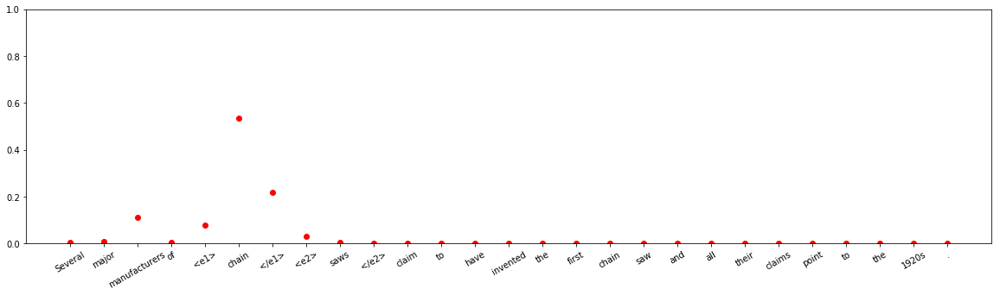












input sentence: Make two holes in the <e1> jar </e1> <e2> lid </e2> , one hole in the middle of the lid and the other near the edge .
answer label:    Component-Whole(e2,e1)
wrong label:    Content-Container(e2,e1)
Other 	:	 3.637466e-06
Entity-Destination(e1,e2) 	:	 4.148524e-09
Cause-Effect(e2,e1) 	:	 7.669337e-12
Member-Collection(e2,e1) 	:	 7.0122214e-10
Entity-Origin(e1,e2) 	:	 3.3608205e-09
Message-Topic(e1,e2) 	:	 6.346191e-13
Component-Whole(e1,e2) 	:	 2.8432129e-05
Component-Whole(e2,e1) 	:	 0.059750926
Instrument-Agency(e2,e1) 	:	 1.3543094e-07
Content-Container(e1,e2) 	:	 0.33309484
Product-Producer(e2,e1) 	:	 1.4121846e-07
Cause-Effect(e1,e2) 	:	 1.10499186e-10
Product-Producer(e1,e2) 	:	 4.5775927e-10
Content-Container(e2,e1) 	:	 0.6071216
Entity-Origin(e2,e1) 	:	 2.0985598e-07
Message-Topic(e2,e1) 	:	 4.241113e-14
Instrument-Agency(e1,e2) 	:	 1.00123415e-07
Member-Collection(e1,e2) 	:	 5.190521e-12
Entity-Destination(e2,e1) 	:	 2.969729e-09



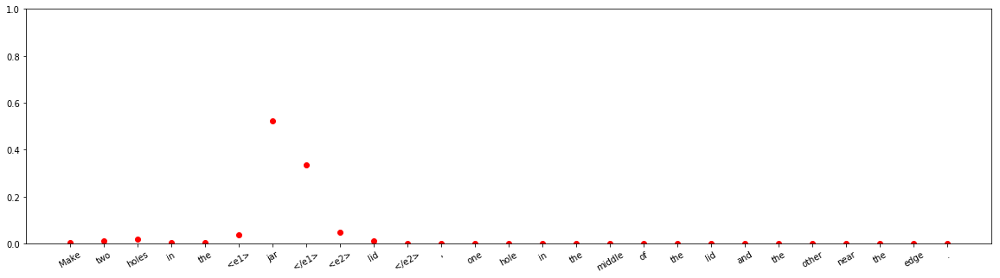


input sentence: Clearwire customers in a <e1> handful </e1> of <e2> locations </e2> were unable to get online for several hours due to a network outage late Tuesday .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.08409429
Entity-Destination(e1,e2) 	:	 2.3072876e-12
Cause-Effect(e2,e1) 	:	 2.9530958e-10
Member-Collection(e2,e1) 	:	 0.91552234
Entity-Origin(e1,e2) 	:	 6.082501e-08
Message-Topic(e1,e2) 	:	 2.8039793e-09
Component-Whole(e1,e2) 	:	 2.336138e-08
Component-Whole(e2,e1) 	:	 1.188095e-09
Instrument-Agency(e2,e1) 	:	 1.0148272e-09
Content-Container(e1,e2) 	:	 6.0376966e-09
Product-Producer(e2,e1) 	:	 2.150189e-07
Cause-Effect(e1,e2) 	:	 8.2199675e-10
Product-Producer(e1,e2) 	:	 0.00031753595
Content-Container(e2,e1) 	:	 5.0127568e-08
Entity-Origin(e2,e1) 	:	 3.2750672e-06
Message-Topic(e2,e1) 	:	 5.510692e-07
Instrument-Agency(e1,e2) 	:	 3.7781218e-05
Member-Collection(e1,e2) 	:	 2.3971337e-05
Entity-Destination(e2,e1) 	:	 7.494275e-11



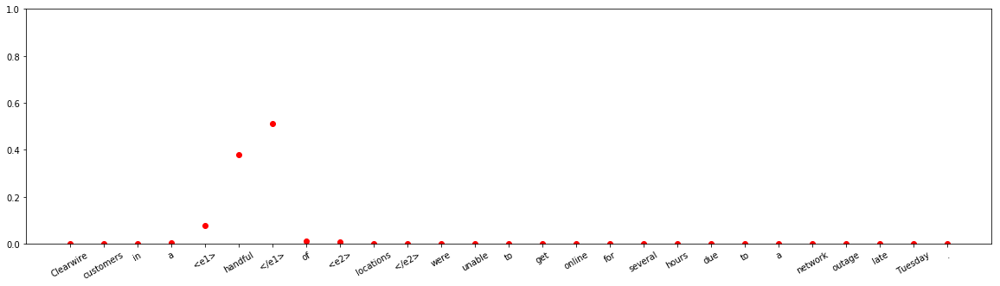








input sentence: The newest <e1> moons </e1> were discovered by an international <e2> collaboration </e2> of astronomers , working in July at the Canada-France-Hawaii Telescope ( CFHT ) .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 3.543057e-09
Entity-Destination(e1,e2) 	:	 5.65659e-15
Cause-Effect(e2,e1) 	:	 4.4366907e-08
Member-Collection(e2,e1) 	:	 6.8110455e-11
Entity-Origin(e1,e2) 	:	 5.242422e-10
Message-Topic(e1,e2) 	:	 3.0588588e-13
Component-Whole(e1,e2) 	:	 2.2682409e-08
Component-Whole(e2,e1) 	:	 1.1039257e-10
Instrument-Agency(e2,e1) 	:	 7.312884e-16
Content-Container(e1,e2) 	:	 3.1385205e-12
Product-Producer(e2,e1) 	:	 7.493944e-13
Cause-Effect(e1,e2) 	:	 7.5114557e-14
Product-Producer(e1,e2) 	:	 0.9999989
Content-Container(e2,e1) 	:	 7.169395e-14
Entity-Origin(e2,e1) 	:	 1.8350474e-14
Message-Topic(e2,e1) 	:	 3.5448687e-07
Instrument-Agency(e1,e2) 	:	 5.6758455e-07
Member-Collection(e1,e2) 	:	 6.469438e-11
Entity-Destination(e2,e1) 	:	 5

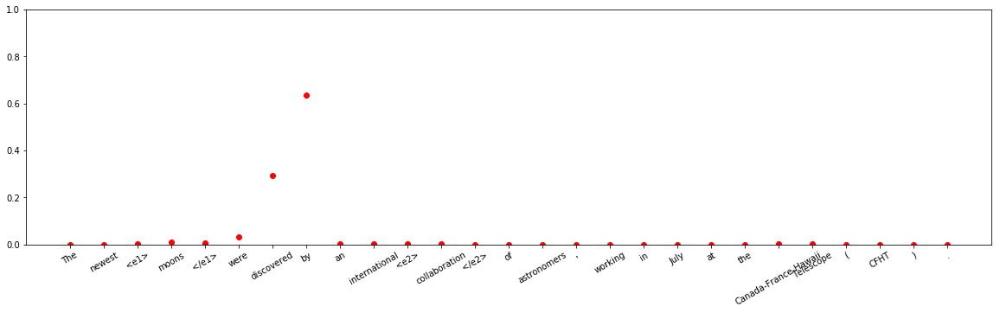





input sentence: In a <e1> cistern </e1> that stores cold <e2> liquids </e2> , the concrete ring serving as juncture element may be thermally lagged against the rock .
answer label:    Content-Container(e2,e1)
wrong label:    Other
Other 	:	 0.7297482
Entity-Destination(e1,e2) 	:	 3.055622e-08
Cause-Effect(e2,e1) 	:	 6.197471e-10
Member-Collection(e2,e1) 	:	 3.2239658e-08
Entity-Origin(e1,e2) 	:	 5.516505e-08
Message-Topic(e1,e2) 	:	 1.14905646e-07
Component-Whole(e1,e2) 	:	 0.0025940055
Component-Whole(e2,e1) 	:	 0.0001218366
Instrument-Agency(e2,e1) 	:	 5.6142888e-08
Content-Container(e1,e2) 	:	 0.000109246226
Product-Producer(e2,e1) 	:	 2.2657757e-07
Cause-Effect(e1,e2) 	:	 1.3418715e-08
Product-Producer(e1,e2) 	:	 2.898571e-07
Content-Container(e2,e1) 	:	 0.26580405
Entity-Origin(e2,e1) 	:	 1.2133887e-05
Message-Topic(e2,e1) 	:	 4.8434386e-12
Instrument-Agency(e1,e2) 	:	 0.0016097111
Member-Collection(e1,e2) 	:	 3.97555e-08
Entity-Destination(e2,e1) 	:	 9.116467e-09



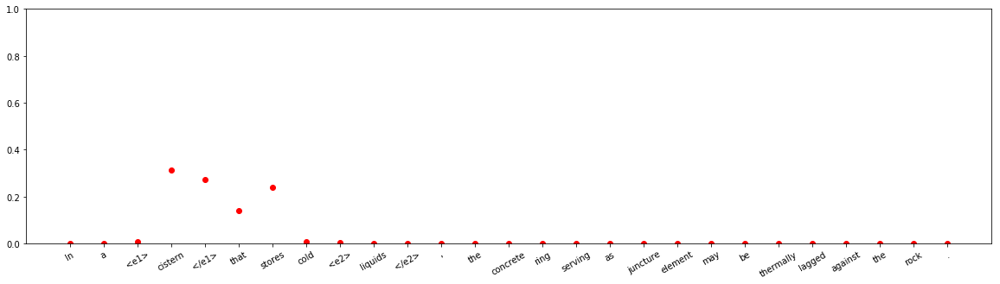


input sentence: Pressure <e1> regulation </e1> using the <e2> valve </e2> and different amounts of fluid goes a long way in keeping your hydraulic log splitter in action .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 5.5537563e-10
Entity-Destination(e1,e2) 	:	 2.146285e-12
Cause-Effect(e2,e1) 	:	 4.994846e-05
Member-Collection(e2,e1) 	:	 3.4530142e-13
Entity-Origin(e1,e2) 	:	 1.3184605e-11
Message-Topic(e1,e2) 	:	 4.3164294e-09
Component-Whole(e1,e2) 	:	 5.4562e-06
Component-Whole(e2,e1) 	:	 0.9994759
Instrument-Agency(e2,e1) 	:	 0.0004349125
Content-Container(e1,e2) 	:	 2.8763079e-11
Product-Producer(e2,e1) 	:	 6.027936e-14
Cause-Effect(e1,e2) 	:	 5.8155183e-09
Product-Producer(e1,e2) 	:	 1.5718732e-09
Content-Container(e2,e1) 	:	 2.837363e-12
Entity-Origin(e2,e1) 	:	 2.956497e-16
Message-Topic(e2,e1) 	:	 5.6979372e-09
Instrument-Agency(e1,e2) 	:	 3.3867545e-05
Member-Collection(e1,e2) 	:	 8.872317e-15
Entity-Destination(e2,e1) 	:	 9.7983

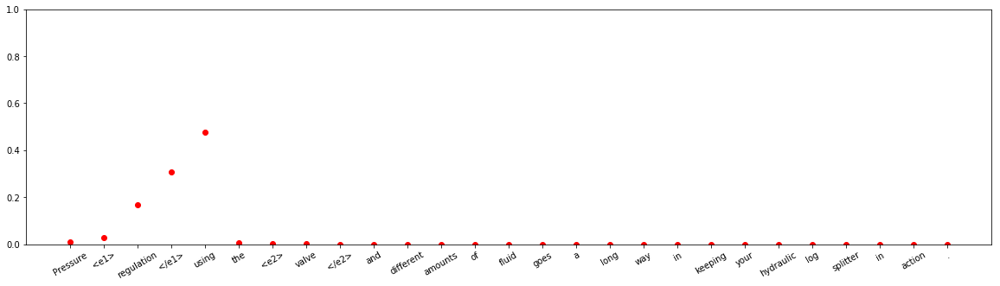









input sentence: A group of women from Curves Timaru won best-dressed prize with their <e1> ensemble </e1> of purple <e2> clothes </e2> , colourful wigs and sparkly tiaras .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.00070825155
Entity-Destination(e1,e2) 	:	 1.8492922e-12
Cause-Effect(e2,e1) 	:	 8.117186e-10
Member-Collection(e2,e1) 	:	 0.99928135
Entity-Origin(e1,e2) 	:	 1.6119408e-06
Message-Topic(e1,e2) 	:	 2.4890776e-09
Component-Whole(e1,e2) 	:	 1.4089804e-07
Component-Whole(e2,e1) 	:	 1.5454506e-07
Instrument-Agency(e2,e1) 	:	 8.99347e-08
Content-Container(e1,e2) 	:	 2.4503725e-08
Product-Producer(e2,e1) 	:	 2.8554612e-06
Cause-Effect(e1,e2) 	:	 8.410838e-10
Product-Producer(e1,e2) 	:	 1.6276469e-07
Content-Container(e2,e1) 	:	 2.4543863e-06
Entity-Origin(e2,e1) 	:	 1.3308648e-09
Message-Topic(e2,e1) 	:	 1.9662527e-09
Instrument-Agency(e1,e2) 	:	 1.6576778e-06
Member-Collection(e1,e2) 	:	 1.1481184e-06
Entity-Destination(e2,e1) 	:	 1.902744

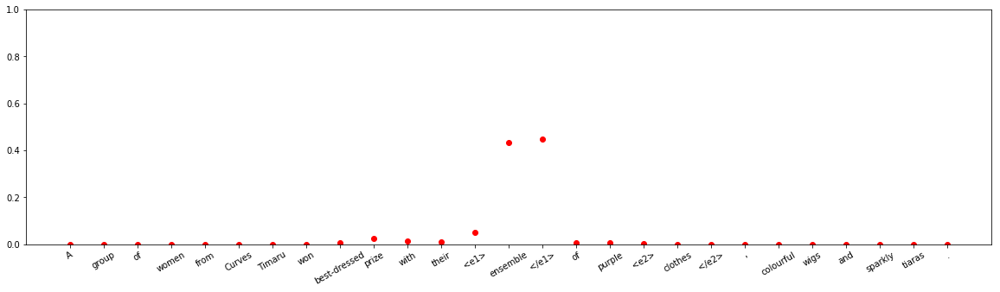




input sentence: This is due to the amount of <e1> sand </e1> in the <e2> hourglass </e2> and the size of the hole the sand must pass through .
answer label:    Content-Container(e1,e2)
wrong label:    Other
Other 	:	 0.990211
Entity-Destination(e1,e2) 	:	 5.598019e-06
Cause-Effect(e2,e1) 	:	 1.1122573e-06
Member-Collection(e2,e1) 	:	 2.8961774e-11
Entity-Origin(e1,e2) 	:	 4.8205754e-07
Message-Topic(e1,e2) 	:	 2.6730271e-09
Component-Whole(e1,e2) 	:	 0.007333416
Component-Whole(e2,e1) 	:	 1.4741643e-07
Instrument-Agency(e2,e1) 	:	 2.2071095e-08
Content-Container(e1,e2) 	:	 0.0023799047
Product-Producer(e2,e1) 	:	 4.2023114e-09
Cause-Effect(e1,e2) 	:	 2.5774887e-09
Product-Producer(e1,e2) 	:	 6.011616e-09
Content-Container(e2,e1) 	:	 1.3784598e-09
Entity-Origin(e2,e1) 	:	 9.0708874e-10
Message-Topic(e2,e1) 	:	 1.2895099e-05
Instrument-Agency(e1,e2) 	:	 3.6627025e-06
Member-Collection(e1,e2) 	:	 5.2036976e-05
Entity-Destination(e2,e1) 	:	 1.7573584e-10



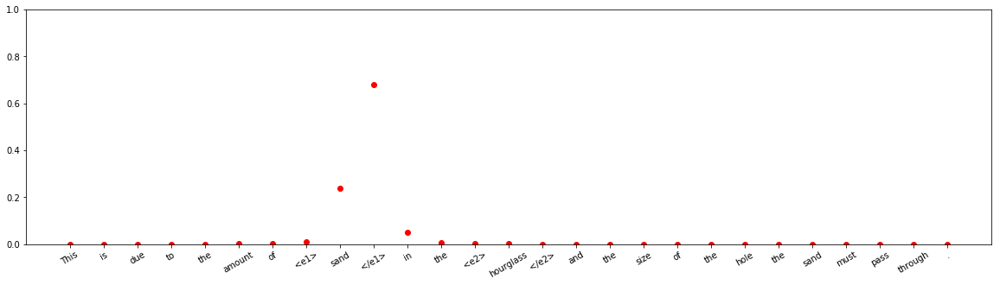







input sentence: The <e1> supreme court </e1> has applied the protections of this <e2> amendment </e2> to the states through the Due Process Clause of the Fourteenth Amendment .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 3.6477047e-22
Cause-Effect(e2,e1) 	:	 5.7695874e-17
Member-Collection(e2,e1) 	:	 1.002266e-20
Entity-Origin(e1,e2) 	:	 7.666895e-21
Message-Topic(e1,e2) 	:	 6.6026595e-18
Component-Whole(e1,e2) 	:	 7.411006e-18
Component-Whole(e2,e1) 	:	 1.0216407e-19
Instrument-Agency(e2,e1) 	:	 1.0456714e-14
Content-Container(e1,e2) 	:	 3.4223843e-18
Product-Producer(e2,e1) 	:	 1.4088856e-17
Cause-Effect(e1,e2) 	:	 1.9718507e-18
Product-Producer(e1,e2) 	:	 7.6473875e-20
Content-Container(e2,e1) 	:	 1.3066541e-18
Entity-Origin(e2,e1) 	:	 2.229147e-18
Message-Topic(e2,e1) 	:	 2.6336944e-15
Instrument-Agency(e1,e2) 	:	 7.724921e-17
Member-Collection(e1,e2) 	:	 1.726914e-17
Entity-Destination(e2,e1) 	:	 4.023561e-20



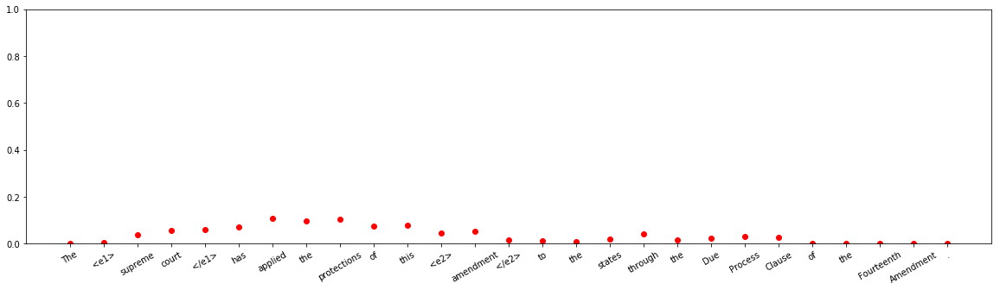






input sentence: The procession lasts all days and passes by all the places in the city that are linked to the <e1> saint </e1> 's <e2> martyrdom </e2> .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.12961678
Entity-Destination(e1,e2) 	:	 2.6241571e-09
Cause-Effect(e2,e1) 	:	 2.592378e-09
Member-Collection(e2,e1) 	:	 3.3577666e-07
Entity-Origin(e1,e2) 	:	 9.245905e-06
Message-Topic(e1,e2) 	:	 1.2699021e-06
Component-Whole(e1,e2) 	:	 6.771368e-08
Component-Whole(e2,e1) 	:	 2.6889536e-05
Instrument-Agency(e2,e1) 	:	 0.00020042753
Content-Container(e1,e2) 	:	 0.0051805414
Product-Producer(e2,e1) 	:	 0.86391616
Cause-Effect(e1,e2) 	:	 6.836244e-07
Product-Producer(e1,e2) 	:	 1.3361429e-06
Content-Container(e2,e1) 	:	 0.000111351925
Entity-Origin(e2,e1) 	:	 8.7020126e-05
Message-Topic(e2,e1) 	:	 2.885662e-07
Instrument-Agency(e1,e2) 	:	 0.00083561667
Member-Collection(e1,e2) 	:	 1.1993583e-05
Entity-Destination(e2,e1) 	:	 2.955342e-09



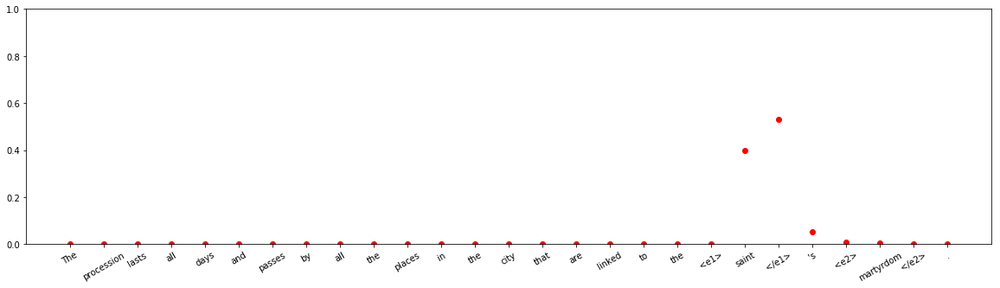



input sentence: All <e1> staff </e1> , from the <e2> chairman </e2> , Charlie Mayfield , to part-time shelf stackers in Waitrose , get the same percentage payout .
answer label:    Member-Collection(e2,e1)
wrong label:    Product-Producer(e1,e2)
Other 	:	 3.7045433e-07
Entity-Destination(e1,e2) 	:	 2.783652e-11
Cause-Effect(e2,e1) 	:	 6.073267e-06
Member-Collection(e2,e1) 	:	 4.5855658e-10
Entity-Origin(e1,e2) 	:	 0.008618606
Message-Topic(e1,e2) 	:	 2.4471092e-14
Component-Whole(e1,e2) 	:	 1.5713938e-12
Component-Whole(e2,e1) 	:	 1.9784674e-13
Instrument-Agency(e2,e1) 	:	 1.1155159e-09
Content-Container(e1,e2) 	:	 3.8227851e-10
Product-Producer(e2,e1) 	:	 3.5737517e-09
Cause-Effect(e1,e2) 	:	 6.975292e-13
Product-Producer(e1,e2) 	:	 0.99131936
Content-Container(e2,e1) 	:	 2.705534e-13
Entity-Origin(e2,e1) 	:	 1.31295e-10
Message-Topic(e2,e1) 	:	 4.9880843e-11
Instrument-Agency(e1,e2) 	:	 3.1026153e-05
Member-Collection(e1,e2) 	:	 2.4446246e-05
Entity-Destination(e2,e1) 	:	 5.902918e

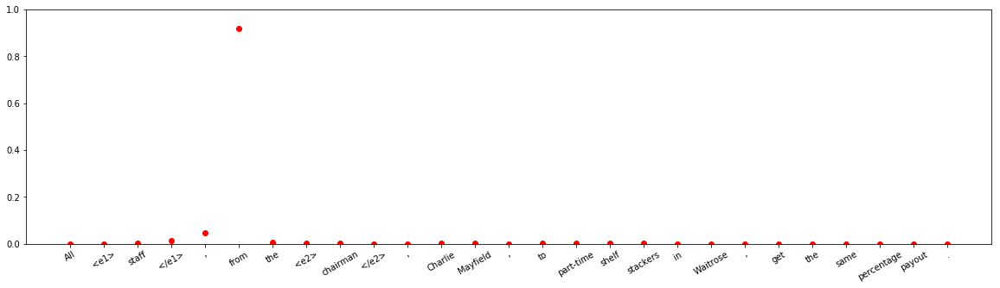



input sentence: They were added to the <e1> photograph </e1> by an unknown <e2> hand </e2> after the picture had been circulating on the Internet for several years .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.5292036e-10
Entity-Destination(e1,e2) 	:	 6.510571e-08
Cause-Effect(e2,e1) 	:	 3.645521e-05
Member-Collection(e2,e1) 	:	 1.40657095e-08
Entity-Origin(e1,e2) 	:	 0.00017513643
Message-Topic(e1,e2) 	:	 1.0208044e-11
Component-Whole(e1,e2) 	:	 1.205298e-05
Component-Whole(e2,e1) 	:	 1.3034081e-05
Instrument-Agency(e2,e1) 	:	 1.3727591e-08
Content-Container(e1,e2) 	:	 2.2927786e-11
Product-Producer(e2,e1) 	:	 1.0668234e-10
Cause-Effect(e1,e2) 	:	 2.5476106e-13
Product-Producer(e1,e2) 	:	 0.999589
Content-Container(e2,e1) 	:	 9.703025e-10
Entity-Origin(e2,e1) 	:	 6.9336813e-15
Message-Topic(e2,e1) 	:	 1.24207595e-08
Instrument-Agency(e1,e2) 	:	 0.00017426988
Member-Collection(e1,e2) 	:	 2.4817273e-09
Entity-Destination(e2,e1) 	:	 1.050383e-12



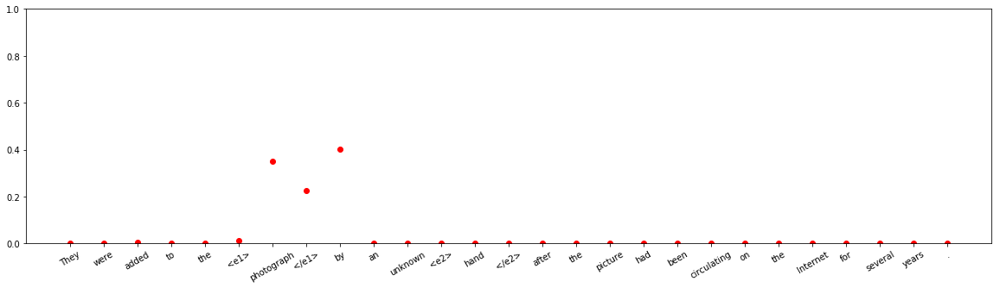









input sentence: High <e1> fees </e1> charged by senior lawyers became a point of <e2> discussion </e2> at the Apex Court hearing the Ambani brothers ' gas row .
answer label:    Message-Topic(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 8.1825e-10
Entity-Destination(e1,e2) 	:	 1.4701768e-09
Cause-Effect(e2,e1) 	:	 1.3278697e-09
Member-Collection(e2,e1) 	:	 6.168156e-05
Entity-Origin(e1,e2) 	:	 0.002843795
Message-Topic(e1,e2) 	:	 5.669528e-10
Component-Whole(e1,e2) 	:	 6.7963057e-12
Component-Whole(e2,e1) 	:	 3.4658718e-10
Instrument-Agency(e2,e1) 	:	 3.1698332e-07
Content-Container(e1,e2) 	:	 5.269258e-08
Product-Producer(e2,e1) 	:	 0.9215698
Cause-Effect(e1,e2) 	:	 2.5728408e-08
Product-Producer(e1,e2) 	:	 5.2222947e-07
Content-Container(e2,e1) 	:	 2.4006134e-08
Entity-Origin(e2,e1) 	:	 3.8370893e-09
Message-Topic(e2,e1) 	:	 0.07552113
Instrument-Agency(e1,e2) 	:	 3.0723833e-11
Member-Collection(e1,e2) 	:	 2.5273307e-06
Entity-Destination(e2,e1) 	:	 4.942153e-11



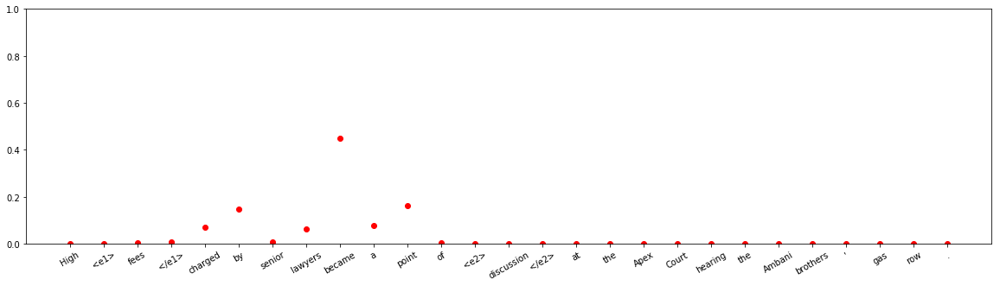




input sentence: At one time , most of Europe 's <e1> ammonia </e1> was produced from the Hydro <e2> plant </e2> at Vemork , via the electrolysis route .
answer label:    Entity-Origin(e1,e2)
wrong label:    Product-Producer(e1,e2)
Other 	:	 3.4469256e-13
Entity-Destination(e1,e2) 	:	 1.436037e-10
Cause-Effect(e2,e1) 	:	 1.905886e-05
Member-Collection(e2,e1) 	:	 2.4496423e-12
Entity-Origin(e1,e2) 	:	 0.10029312
Message-Topic(e1,e2) 	:	 8.187938e-16
Component-Whole(e1,e2) 	:	 7.045946e-13
Component-Whole(e2,e1) 	:	 5.2406762e-14
Instrument-Agency(e2,e1) 	:	 3.3297132e-15
Content-Container(e1,e2) 	:	 9.515493e-12
Product-Producer(e2,e1) 	:	 2.5556268e-10
Cause-Effect(e1,e2) 	:	 2.7097179e-12
Product-Producer(e1,e2) 	:	 0.89968777
Content-Container(e2,e1) 	:	 5.7505304e-15
Entity-Origin(e2,e1) 	:	 2.2804116e-11
Message-Topic(e2,e1) 	:	 4.2237897e-11
Instrument-Agency(e1,e2) 	:	 5.770435e-09
Member-Collection(e1,e2) 	:	 7.454472e-10
Entity-Destination(e2,e1) 	:	 8.864936e-15



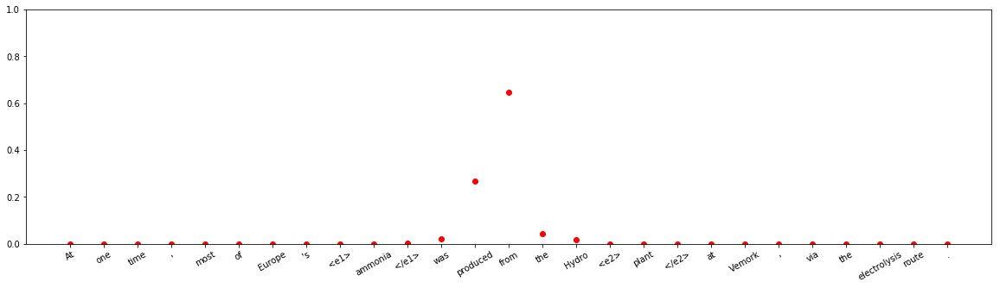


input sentence: The <e1> blisters </e1> are caused by <e2> antibodies </e2> against desmogleins ( Dsgs ) , which are glycoproteins present in the junctions between skin cells .
answer label:    Product-Producer(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 8.882743e-17
Entity-Destination(e1,e2) 	:	 1.6579607e-13
Cause-Effect(e2,e1) 	:	 0.9999951
Member-Collection(e2,e1) 	:	 1.5989801e-13
Entity-Origin(e1,e2) 	:	 2.2233467e-12
Message-Topic(e1,e2) 	:	 8.3800005e-18
Component-Whole(e1,e2) 	:	 3.0560627e-11
Component-Whole(e2,e1) 	:	 4.928072e-13
Instrument-Agency(e2,e1) 	:	 1.6044876e-14
Content-Container(e1,e2) 	:	 6.863577e-18
Product-Producer(e2,e1) 	:	 1.1608657e-13
Cause-Effect(e1,e2) 	:	 4.355018e-09
Product-Producer(e1,e2) 	:	 4.853167e-06
Content-Container(e2,e1) 	:	 1.1388991e-13
Entity-Origin(e2,e1) 	:	 5.0539057e-16
Message-Topic(e2,e1) 	:	 1.1076641e-12
Instrument-Agency(e1,e2) 	:	 1.5968887e-10
Member-Collection(e1,e2) 	:	 9.819936e-16
Entity-Destination(e2,e1) 	:	 5

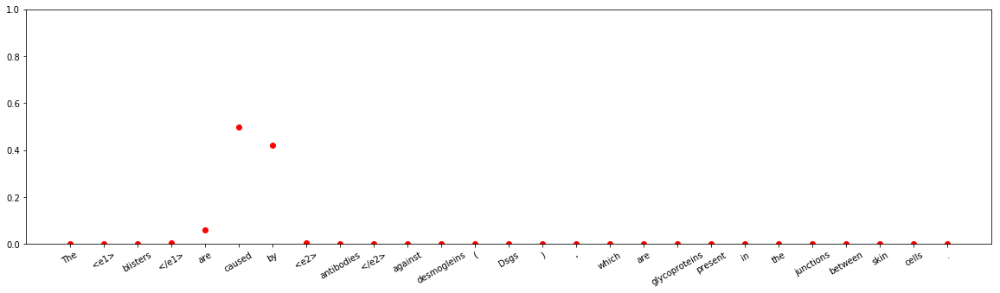


input sentence: There were two wounds on the surface and one was the exit wound of the <e1> gunshot </e1> from the victim 's left <e2> forearm </e2> .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.11234035e-14
Entity-Destination(e1,e2) 	:	 1.7746568e-09
Cause-Effect(e2,e1) 	:	 0.98251307
Member-Collection(e2,e1) 	:	 2.4360932e-11
Entity-Origin(e1,e2) 	:	 0.017479727
Message-Topic(e1,e2) 	:	 4.02626e-17
Component-Whole(e1,e2) 	:	 6.3150865e-06
Component-Whole(e2,e1) 	:	 9.1193743e-07
Instrument-Agency(e2,e1) 	:	 3.782632e-09
Content-Container(e1,e2) 	:	 9.981622e-09
Product-Producer(e2,e1) 	:	 7.9255347e-13
Cause-Effect(e1,e2) 	:	 7.359137e-11
Product-Producer(e1,e2) 	:	 3.0720864e-09
Content-Container(e2,e1) 	:	 1.7890437e-12
Entity-Origin(e2,e1) 	:	 8.928752e-12
Message-Topic(e2,e1) 	:	 1.100149e-10
Instrument-Agency(e1,e2) 	:	 3.6561043e-10
Member-Collection(e1,e2) 	:	 9.054107e-10
Entity-Destination(e2,e1) 	:	 1.212187e-11



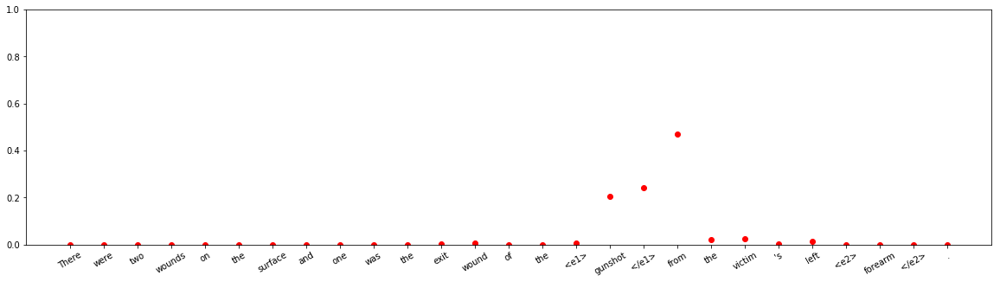



input sentence: Here 's the <e1> theory </e1> I wrote down the other night on the cocktail <e2> napkin </e2> I fished out of my purse just now .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 2.2283349e-07
Entity-Destination(e1,e2) 	:	 1.6830006e-06
Cause-Effect(e2,e1) 	:	 2.0395463e-10
Member-Collection(e2,e1) 	:	 7.198774e-07
Entity-Origin(e1,e2) 	:	 1.948222e-05
Message-Topic(e1,e2) 	:	 0.6277686
Component-Whole(e1,e2) 	:	 0.37014124
Component-Whole(e2,e1) 	:	 0.00034550743
Instrument-Agency(e2,e1) 	:	 0.0013778275
Content-Container(e1,e2) 	:	 0.00029413577
Product-Producer(e2,e1) 	:	 2.274608e-08
Cause-Effect(e1,e2) 	:	 2.4433988e-09
Product-Producer(e1,e2) 	:	 1.5063384e-05
Content-Container(e2,e1) 	:	 1.0723059e-05
Entity-Origin(e2,e1) 	:	 2.8677186e-07
Message-Topic(e2,e1) 	:	 1.4180487e-05
Instrument-Agency(e1,e2) 	:	 1.0385793e-05
Member-Collection(e1,e2) 	:	 3.9731397e-08
Entity-Destination(e2,e1) 	:	 2.5199123e-09



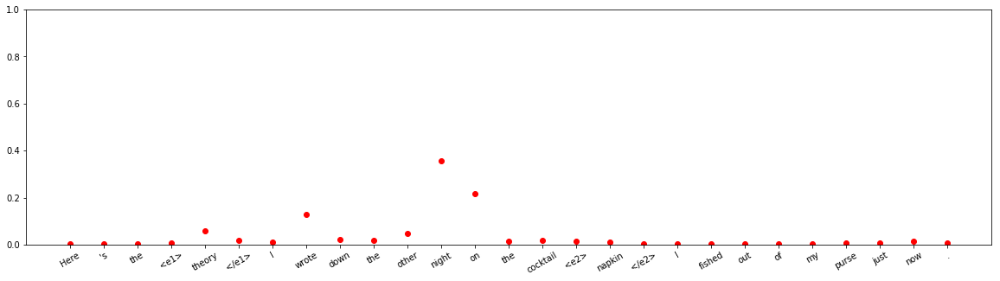





input sentence: Arriving home from this concert , I found an e-mail <e1> message </e1> from a musician <e2> friend </e2> .
answer label:    Product-Producer(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.0859296e-14
Entity-Destination(e1,e2) 	:	 1.1935886e-10
Cause-Effect(e2,e1) 	:	 6.094115e-11
Member-Collection(e2,e1) 	:	 5.9198035e-11
Entity-Origin(e1,e2) 	:	 0.9524247
Message-Topic(e1,e2) 	:	 1.986246e-12
Component-Whole(e1,e2) 	:	 3.3788825e-14
Component-Whole(e2,e1) 	:	 6.956163e-16
Instrument-Agency(e2,e1) 	:	 2.9990902e-14
Content-Container(e1,e2) 	:	 1.5580193e-10
Product-Producer(e2,e1) 	:	 8.005041e-13
Cause-Effect(e1,e2) 	:	 1.5253406e-16
Product-Producer(e1,e2) 	:	 0.04757516
Content-Container(e2,e1) 	:	 1.7365756e-13
Entity-Origin(e2,e1) 	:	 6.6984105e-12
Message-Topic(e2,e1) 	:	 4.122379e-13
Instrument-Agency(e1,e2) 	:	 1.593906e-09
Member-Collection(e1,e2) 	:	 8.178875e-08
Entity-Destination(e2,e1) 	:	 2.8527002e-14



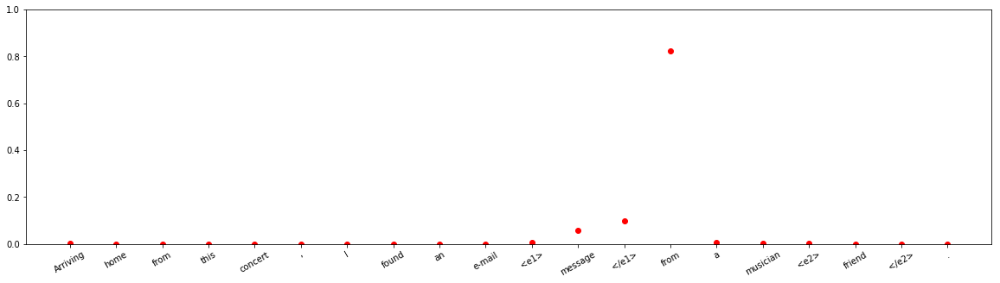


input sentence: The <e1> machine </e1> filters the hot oil through long lasting ( 12 months ) polymer <e2> filters </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 1.6074443e-07
Entity-Destination(e1,e2) 	:	 3.7222367e-08
Cause-Effect(e2,e1) 	:	 3.9011144e-07
Member-Collection(e2,e1) 	:	 4.3681694e-11
Entity-Origin(e1,e2) 	:	 1.1739987e-05
Message-Topic(e1,e2) 	:	 3.4703185e-09
Component-Whole(e1,e2) 	:	 3.0332316e-07
Component-Whole(e2,e1) 	:	 0.1536354
Instrument-Agency(e2,e1) 	:	 0.8368628
Content-Container(e1,e2) 	:	 6.6413218e-06
Product-Producer(e2,e1) 	:	 8.42746e-07
Cause-Effect(e1,e2) 	:	 2.673301e-06
Product-Producer(e1,e2) 	:	 7.150464e-09
Content-Container(e2,e1) 	:	 4.6813934e-06
Entity-Origin(e2,e1) 	:	 1.7729387e-09
Message-Topic(e2,e1) 	:	 2.1815671e-09
Instrument-Agency(e1,e2) 	:	 0.009474237
Member-Collection(e1,e2) 	:	 2.2787604e-10
Entity-Destination(e2,e1) 	:	 1.3078857e-10



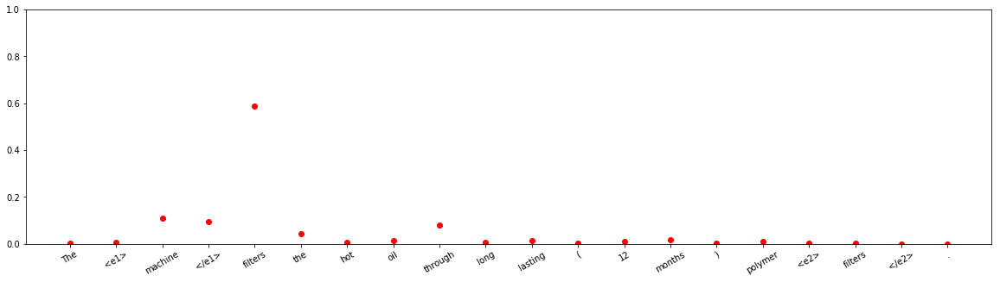



input sentence: These <e1> observations </e1> determine the high spatial resolution stellar <e2> kinematics </e2> within the nuclei of these galaxies .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.99985063
Entity-Destination(e1,e2) 	:	 1.28666075e-14
Cause-Effect(e2,e1) 	:	 2.0614943e-09
Member-Collection(e2,e1) 	:	 6.9333045e-10
Entity-Origin(e1,e2) 	:	 5.7101166e-13
Message-Topic(e1,e2) 	:	 2.5511767e-05
Component-Whole(e1,e2) 	:	 9.070088e-08
Component-Whole(e2,e1) 	:	 4.0930405e-05
Instrument-Agency(e2,e1) 	:	 2.481862e-08
Content-Container(e1,e2) 	:	 1.6580518e-11
Product-Producer(e2,e1) 	:	 4.4966394e-10
Cause-Effect(e1,e2) 	:	 6.802463e-05
Product-Producer(e1,e2) 	:	 2.0174555e-11
Content-Container(e2,e1) 	:	 5.5021773e-12
Entity-Origin(e2,e1) 	:	 1.3729284e-10
Message-Topic(e2,e1) 	:	 1.4795184e-05
Instrument-Agency(e1,e2) 	:	 3.1327914e-09
Member-Collection(e1,e2) 	:	 1.7466342e-12
Entity-Destination(e2,e1) 	:	 1.9982203e-10



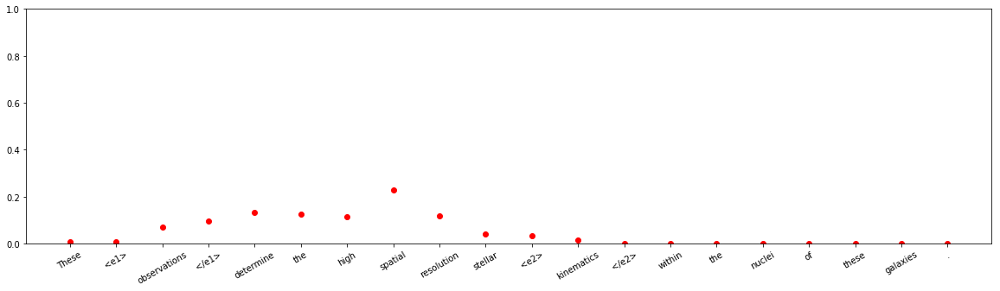



input sentence: The <e1> money </e1> was handed over into notarial <e2> custody </e2> for the purpose of securing an obligation .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.91505474
Entity-Destination(e1,e2) 	:	 0.082826644
Cause-Effect(e2,e1) 	:	 3.026373e-08
Member-Collection(e2,e1) 	:	 5.1708318e-09
Entity-Origin(e1,e2) 	:	 0.00025424562
Message-Topic(e1,e2) 	:	 9.3376336e-08
Component-Whole(e1,e2) 	:	 9.807103e-10
Component-Whole(e2,e1) 	:	 4.7207883e-11
Instrument-Agency(e2,e1) 	:	 8.441961e-09
Content-Container(e1,e2) 	:	 0.0011763196
Product-Producer(e2,e1) 	:	 1.5082893e-09
Cause-Effect(e1,e2) 	:	 1.392903e-09
Product-Producer(e1,e2) 	:	 4.2413597e-11
Content-Container(e2,e1) 	:	 0.0006525026
Entity-Origin(e2,e1) 	:	 1.0287937e-05
Message-Topic(e2,e1) 	:	 6.556185e-09
Instrument-Agency(e1,e2) 	:	 2.4609906e-05
Member-Collection(e1,e2) 	:	 3.902126e-07
Entity-Destination(e2,e1) 	:	 2.0669712e-11



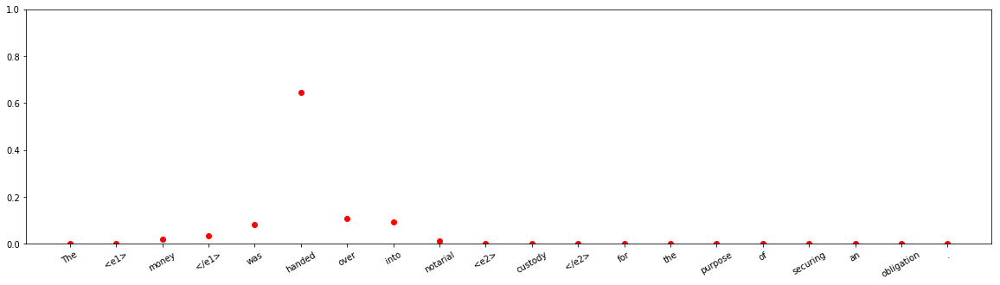


input sentence: The <e1> lioness </e1> drank the poisoned water out of <e2> grief </e2> for the loss of her daughter .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.052488867
Entity-Destination(e1,e2) 	:	 3.6260403e-06
Cause-Effect(e2,e1) 	:	 0.095268115
Member-Collection(e2,e1) 	:	 0.000106773805
Entity-Origin(e1,e2) 	:	 0.008470089
Message-Topic(e1,e2) 	:	 0.00020296725
Component-Whole(e1,e2) 	:	 1.0533213e-05
Component-Whole(e2,e1) 	:	 5.8145297e-06
Instrument-Agency(e2,e1) 	:	 0.68405265
Content-Container(e1,e2) 	:	 0.00018597988
Product-Producer(e2,e1) 	:	 6.9484167e-06
Cause-Effect(e1,e2) 	:	 0.038714524
Product-Producer(e1,e2) 	:	 4.491869e-06
Content-Container(e2,e1) 	:	 0.098319255
Entity-Origin(e2,e1) 	:	 0.0020179925
Message-Topic(e2,e1) 	:	 7.747871e-09
Instrument-Agency(e1,e2) 	:	 0.020025192
Member-Collection(e1,e2) 	:	 0.000116228606
Entity-Destination(e2,e1) 	:	 3.197881e-09



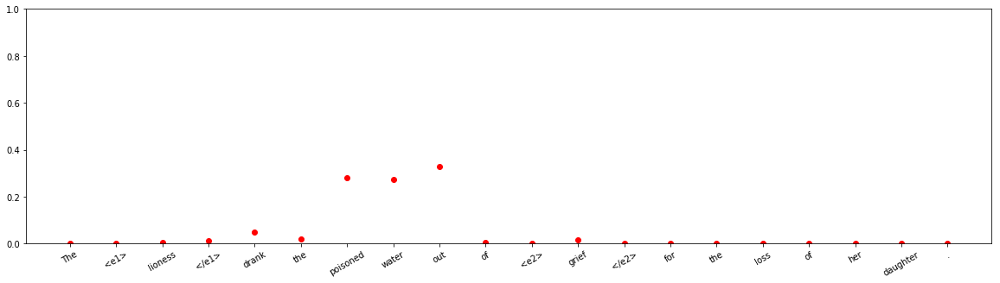


input sentence: The most common <e1> audits </e1> were about <e2> waste </e2> and recycling .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.880644
Entity-Destination(e1,e2) 	:	 8.6621964e-07
Cause-Effect(e2,e1) 	:	 1.224141e-05
Member-Collection(e2,e1) 	:	 3.1697203e-10
Entity-Origin(e1,e2) 	:	 1.33007156e-11
Message-Topic(e1,e2) 	:	 0.08362165
Component-Whole(e1,e2) 	:	 2.494007e-06
Component-Whole(e2,e1) 	:	 1.9350472e-07
Instrument-Agency(e2,e1) 	:	 6.754239e-10
Content-Container(e1,e2) 	:	 1.5898726e-07
Product-Producer(e2,e1) 	:	 1.4166105e-07
Cause-Effect(e1,e2) 	:	 0.001159082
Product-Producer(e1,e2) 	:	 2.4675949e-06
Content-Container(e2,e1) 	:	 9.266148e-08
Entity-Origin(e2,e1) 	:	 1.7257929e-06
Message-Topic(e2,e1) 	:	 0.03447045
Instrument-Agency(e1,e2) 	:	 8.43158e-05
Member-Collection(e1,e2) 	:	 1.6533336e-09
Entity-Destination(e2,e1) 	:	 5.1646527e-08



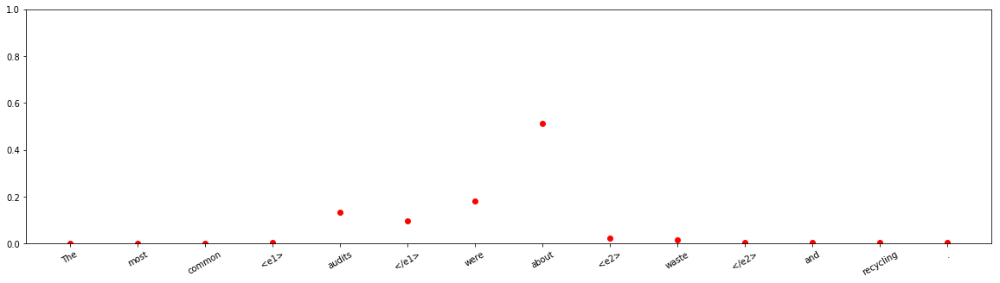





input sentence: The <e1> committee </e1> is an integral part of our <e2> organisation </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Member-Collection(e1,e2)
Other 	:	 2.8744065e-05
Entity-Destination(e1,e2) 	:	 1.0770613e-06
Cause-Effect(e2,e1) 	:	 2.919518e-11
Member-Collection(e2,e1) 	:	 1.8862436e-07
Entity-Origin(e1,e2) 	:	 1.7327138e-06
Message-Topic(e1,e2) 	:	 1.4150704e-11
Component-Whole(e1,e2) 	:	 0.00039365198
Component-Whole(e2,e1) 	:	 4.5789766e-13
Instrument-Agency(e2,e1) 	:	 5.7736104e-11
Content-Container(e1,e2) 	:	 3.9087354e-08
Product-Producer(e2,e1) 	:	 4.4719684e-12
Cause-Effect(e1,e2) 	:	 3.897722e-13
Product-Producer(e1,e2) 	:	 3.7025344e-10
Content-Container(e2,e1) 	:	 2.5893437e-11
Entity-Origin(e2,e1) 	:	 7.2520106e-12
Message-Topic(e2,e1) 	:	 2.1584647e-08
Instrument-Agency(e1,e2) 	:	 7.587282e-08
Member-Collection(e1,e2) 	:	 0.9995745
Entity-Destination(e2,e1) 	:	 3.1747137e-12



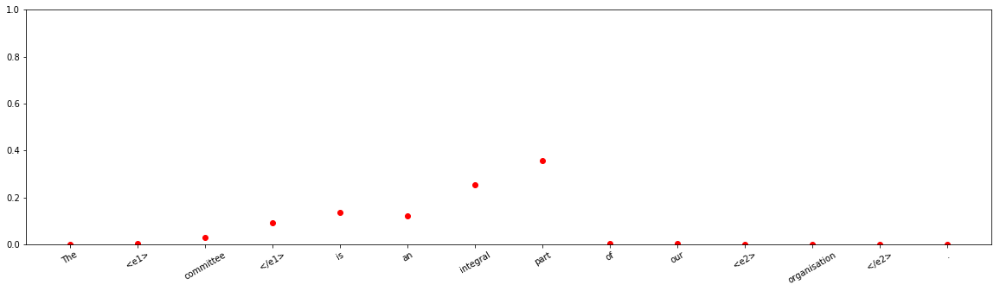








input sentence: The prosecution seeks to enter <e1> motives </e1> into Gibbs <e2> trial </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.99979657
Entity-Destination(e1,e2) 	:	 0.00019819375
Cause-Effect(e2,e1) 	:	 1.1724875e-10
Member-Collection(e2,e1) 	:	 2.023295e-12
Entity-Origin(e1,e2) 	:	 8.307798e-10
Message-Topic(e1,e2) 	:	 1.0957606e-07
Component-Whole(e1,e2) 	:	 2.1073643e-06
Component-Whole(e2,e1) 	:	 1.152281e-11
Instrument-Agency(e2,e1) 	:	 2.6629674e-08
Content-Container(e1,e2) 	:	 2.4860271e-06
Product-Producer(e2,e1) 	:	 8.161765e-09
Cause-Effect(e1,e2) 	:	 3.3418648e-10
Product-Producer(e1,e2) 	:	 1.1816158e-10
Content-Container(e2,e1) 	:	 4.5779096e-08
Entity-Origin(e2,e1) 	:	 5.3452602e-09
Message-Topic(e2,e1) 	:	 7.810201e-10
Instrument-Agency(e1,e2) 	:	 9.260005e-08
Member-Collection(e1,e2) 	:	 3.831162e-07
Entity-Destination(e2,e1) 	:	 4.1217985e-10



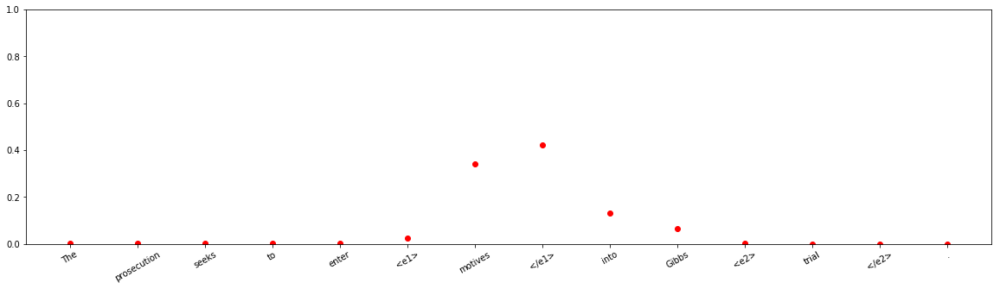







input sentence: <e1> Bibliometrics </e1> is an increasingly important tool for <e2> research evaluation </e2> .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.05643782
Entity-Destination(e1,e2) 	:	 4.3188678e-08
Cause-Effect(e2,e1) 	:	 3.2414764e-08
Member-Collection(e2,e1) 	:	 3.7917903e-07
Entity-Origin(e1,e2) 	:	 1.8260677e-08
Message-Topic(e1,e2) 	:	 4.4722416e-05
Component-Whole(e1,e2) 	:	 0.00020676419
Component-Whole(e2,e1) 	:	 7.097663e-05
Instrument-Agency(e2,e1) 	:	 0.0035288916
Content-Container(e1,e2) 	:	 0.00012648417
Product-Producer(e2,e1) 	:	 4.6500112e-10
Cause-Effect(e1,e2) 	:	 3.58415e-08
Product-Producer(e1,e2) 	:	 8.891472e-08
Content-Container(e2,e1) 	:	 0.0004929326
Entity-Origin(e2,e1) 	:	 1.2339984e-05
Message-Topic(e2,e1) 	:	 1.6351697e-08
Instrument-Agency(e1,e2) 	:	 0.939078
Member-Collection(e1,e2) 	:	 2.853917e-08
Entity-Destination(e2,e1) 	:	 4.314313e-07



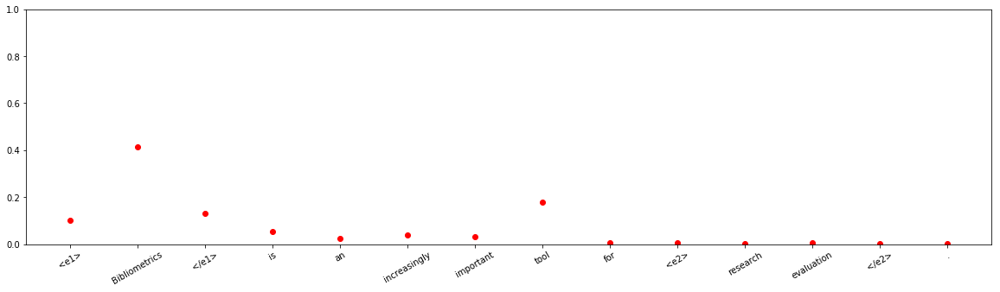




input sentence: The <e1> land </e1> uprises from the <e2> river </e2> to the hills .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 0.0040091993
Entity-Destination(e1,e2) 	:	 2.4684633e-08
Cause-Effect(e2,e1) 	:	 5.8372307e-06
Member-Collection(e2,e1) 	:	 7.45849e-11
Entity-Origin(e1,e2) 	:	 0.9959487
Message-Topic(e1,e2) 	:	 8.395865e-13
Component-Whole(e1,e2) 	:	 1.6236279e-06
Component-Whole(e2,e1) 	:	 9.296412e-08
Instrument-Agency(e2,e1) 	:	 1.5978398e-10
Content-Container(e1,e2) 	:	 6.133271e-10
Product-Producer(e2,e1) 	:	 2.5535674e-12
Cause-Effect(e1,e2) 	:	 4.5944046e-14
Product-Producer(e1,e2) 	:	 3.310333e-05
Content-Container(e2,e1) 	:	 2.7322044e-12
Entity-Origin(e2,e1) 	:	 1.8353091e-08
Message-Topic(e2,e1) 	:	 2.3707027e-07
Instrument-Agency(e1,e2) 	:	 6.962031e-07
Member-Collection(e1,e2) 	:	 3.3636272e-07
Entity-Destination(e2,e1) 	:	 6.9185673e-12



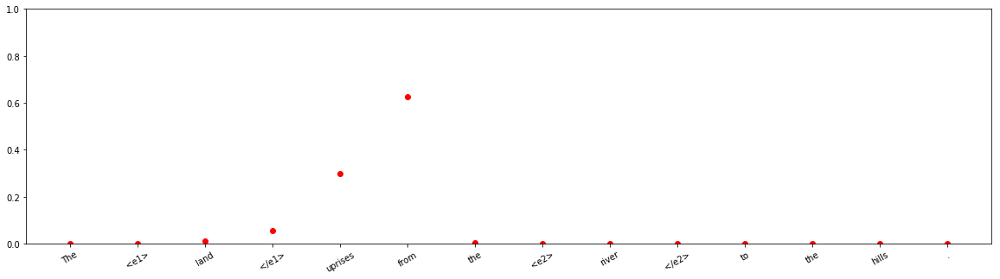




input sentence: He removed the recurring acid <e1> reflux </e1> in the <e2> mouth </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 5.9723952e-05
Entity-Destination(e1,e2) 	:	 0.8475996
Cause-Effect(e2,e1) 	:	 0.0006157609
Member-Collection(e2,e1) 	:	 2.6050384e-09
Entity-Origin(e1,e2) 	:	 0.0018735355
Message-Topic(e1,e2) 	:	 4.106313e-09
Component-Whole(e1,e2) 	:	 0.024514414
Component-Whole(e2,e1) 	:	 8.7582964e-07
Instrument-Agency(e2,e1) 	:	 1.9389066e-07
Content-Container(e1,e2) 	:	 0.00039357465
Product-Producer(e2,e1) 	:	 1.22711175e-08
Cause-Effect(e1,e2) 	:	 2.2302622e-08
Product-Producer(e1,e2) 	:	 4.5464038e-08
Content-Container(e2,e1) 	:	 2.310851e-10
Entity-Origin(e2,e1) 	:	 2.9371455e-10
Message-Topic(e2,e1) 	:	 0.124792054
Instrument-Agency(e1,e2) 	:	 2.1292557e-08
Member-Collection(e1,e2) 	:	 0.00015024454
Entity-Destination(e2,e1) 	:	 2.4623947e-10



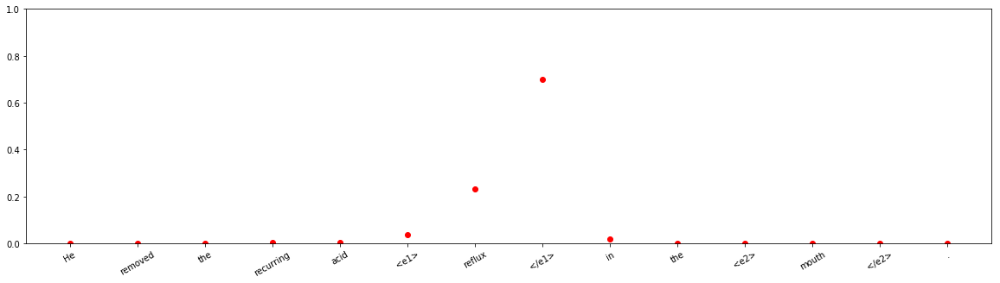



input sentence: The viewing <e1> line </e1> starts in the magic trick <e2> aisle </e2> .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.057136238
Entity-Destination(e1,e2) 	:	 5.766728e-08
Cause-Effect(e2,e1) 	:	 7.6815205e-08
Member-Collection(e2,e1) 	:	 1.864332e-12
Entity-Origin(e1,e2) 	:	 0.00075442845
Message-Topic(e1,e2) 	:	 4.754985e-12
Component-Whole(e1,e2) 	:	 0.8470099
Component-Whole(e2,e1) 	:	 0.09318979
Instrument-Agency(e2,e1) 	:	 0.0016751518
Content-Container(e1,e2) 	:	 0.0002323317
Product-Producer(e2,e1) 	:	 2.7410092e-09
Cause-Effect(e1,e2) 	:	 3.3244552e-13
Product-Producer(e1,e2) 	:	 8.6385256e-08
Content-Container(e2,e1) 	:	 2.3193186e-08
Entity-Origin(e2,e1) 	:	 7.066799e-11
Message-Topic(e2,e1) 	:	 1.18327385e-07
Instrument-Agency(e1,e2) 	:	 1.8726272e-06
Member-Collection(e1,e2) 	:	 2.6417255e-09
Entity-Destination(e2,e1) 	:	 1.4109183e-09



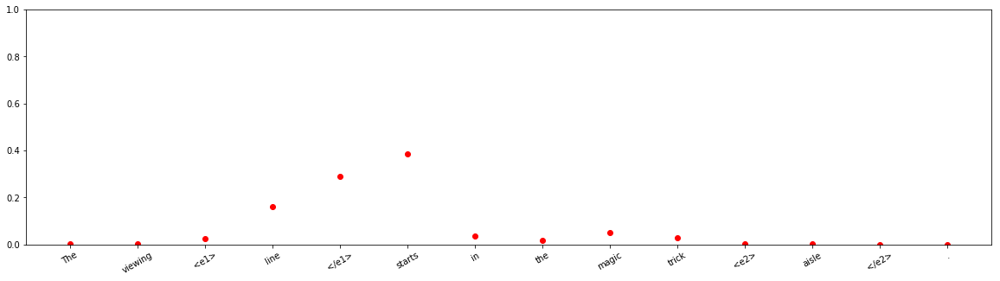


input sentence: <e1> Discussion </e1> took place on the <e2> function </e2> of this Committee .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.99999976
Entity-Destination(e1,e2) 	:	 6.4463976e-11
Cause-Effect(e2,e1) 	:	 1.7235248e-09
Member-Collection(e2,e1) 	:	 4.1429357e-13
Entity-Origin(e1,e2) 	:	 1.1943204e-12
Message-Topic(e1,e2) 	:	 1.3302996e-07
Component-Whole(e1,e2) 	:	 3.956484e-09
Component-Whole(e2,e1) 	:	 6.130283e-09
Instrument-Agency(e2,e1) 	:	 5.631186e-09
Content-Container(e1,e2) 	:	 1.1605402e-11
Product-Producer(e2,e1) 	:	 1.9281035e-13
Cause-Effect(e1,e2) 	:	 3.801375e-12
Product-Producer(e1,e2) 	:	 9.176703e-13
Content-Container(e2,e1) 	:	 1.157622e-11
Entity-Origin(e2,e1) 	:	 2.935524e-13
Message-Topic(e2,e1) 	:	 1.0721847e-07
Instrument-Agency(e1,e2) 	:	 7.54701e-09
Member-Collection(e1,e2) 	:	 9.5069135e-12
Entity-Destination(e2,e1) 	:	 1.5856939e-13



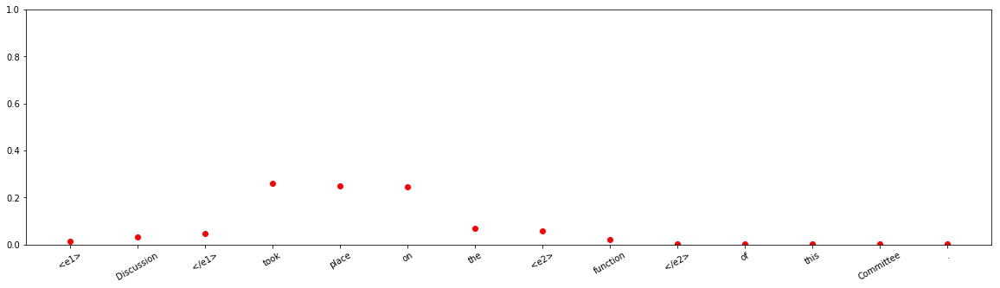


input sentence: There is great <e1> concern </e1> among voters over the <e2> economy </e2> .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.39261204
Entity-Destination(e1,e2) 	:	 6.289572e-06
Cause-Effect(e2,e1) 	:	 0.0002695939
Member-Collection(e2,e1) 	:	 8.087832e-08
Entity-Origin(e1,e2) 	:	 2.4637656e-09
Message-Topic(e1,e2) 	:	 0.0027649507
Component-Whole(e1,e2) 	:	 8.0028636e-05
Component-Whole(e2,e1) 	:	 5.415263e-06
Instrument-Agency(e2,e1) 	:	 0.58557683
Content-Container(e1,e2) 	:	 3.9227793e-08
Product-Producer(e2,e1) 	:	 6.652092e-07
Cause-Effect(e1,e2) 	:	 2.064305e-06
Product-Producer(e1,e2) 	:	 1.0434495e-06
Content-Container(e2,e1) 	:	 1.2609898e-09
Entity-Origin(e2,e1) 	:	 1.6636391e-10
Message-Topic(e2,e1) 	:	 0.018390687
Instrument-Agency(e1,e2) 	:	 0.00028769657
Member-Collection(e1,e2) 	:	 2.5144939e-06
Entity-Destination(e2,e1) 	:	 9.240748e-09



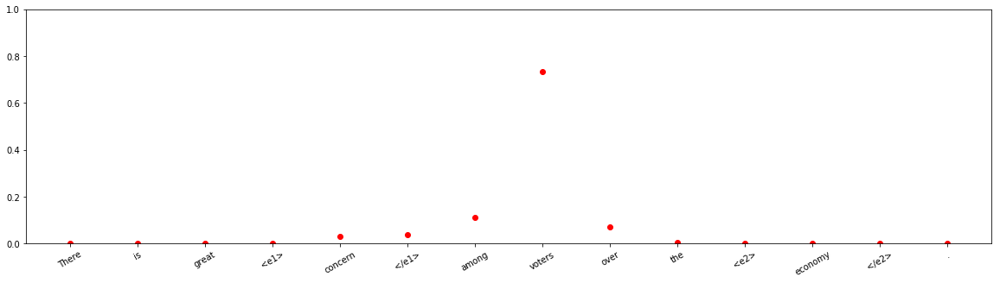




input sentence: The new <e1> phone </e1> has been moved into <e2> prototype stage </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 1.5642743e-07
Entity-Destination(e1,e2) 	:	 0.99999976
Cause-Effect(e2,e1) 	:	 6.3523647e-15
Member-Collection(e2,e1) 	:	 1.2429417e-12
Entity-Origin(e1,e2) 	:	 7.1800834e-08
Message-Topic(e1,e2) 	:	 1.1294774e-12
Component-Whole(e1,e2) 	:	 1.3728131e-11
Component-Whole(e2,e1) 	:	 1.0997335e-11
Instrument-Agency(e2,e1) 	:	 3.3876562e-15
Content-Container(e1,e2) 	:	 3.0195498e-08
Product-Producer(e2,e1) 	:	 1.8575941e-10
Cause-Effect(e1,e2) 	:	 3.848086e-15
Product-Producer(e1,e2) 	:	 6.932916e-12
Content-Container(e2,e1) 	:	 2.4231488e-13
Entity-Origin(e2,e1) 	:	 2.3221532e-11
Message-Topic(e2,e1) 	:	 2.994453e-11
Instrument-Agency(e1,e2) 	:	 4.762505e-11
Member-Collection(e1,e2) 	:	 2.5481535e-08
Entity-Destination(e2,e1) 	:	 3.5156597e-14



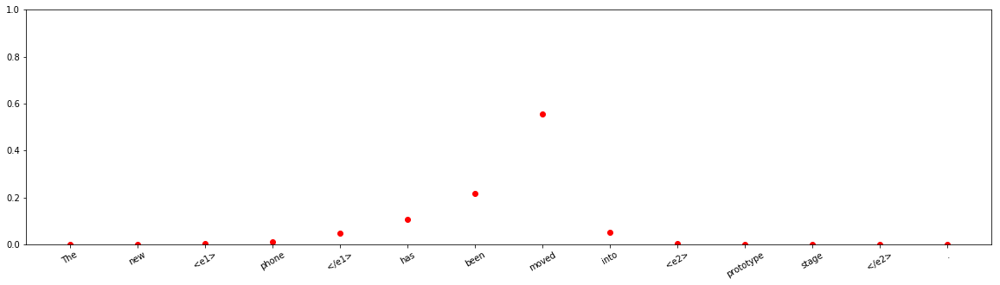





input sentence: Construction <e1> worker </e1> carrying a wooden <e2> plank </e2> on his shoulder .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 1.426863e-07
Entity-Destination(e1,e2) 	:	 4.720682e-13
Cause-Effect(e2,e1) 	:	 2.0101202e-11
Member-Collection(e2,e1) 	:	 2.5215197e-15
Entity-Origin(e1,e2) 	:	 7.172825e-13
Message-Topic(e1,e2) 	:	 2.5809124e-15
Component-Whole(e1,e2) 	:	 2.33724e-14
Component-Whole(e2,e1) 	:	 9.071743e-10
Instrument-Agency(e2,e1) 	:	 0.9999999
Content-Container(e1,e2) 	:	 8.822504e-10
Product-Producer(e2,e1) 	:	 7.1161113e-09
Cause-Effect(e1,e2) 	:	 1.6910328e-14
Product-Producer(e1,e2) 	:	 6.427784e-15
Content-Container(e2,e1) 	:	 1.4099504e-09
Entity-Origin(e2,e1) 	:	 7.314732e-16
Message-Topic(e2,e1) 	:	 5.8900405e-13
Instrument-Agency(e1,e2) 	:	 3.0857592e-09
Member-Collection(e1,e2) 	:	 1.0381485e-12
Entity-Destination(e2,e1) 	:	 7.8946506e-14



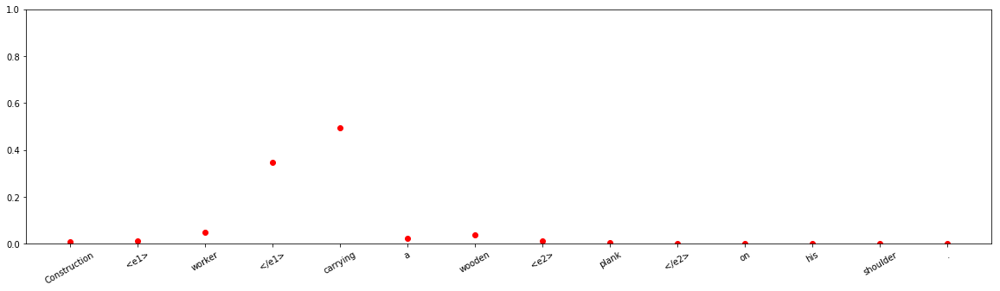




input sentence: A boy gets his <e1> tongue </e1> stuck in a <e2> canteen </e2> .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.9819051e-11
Entity-Destination(e1,e2) 	:	 0.06927066
Cause-Effect(e2,e1) 	:	 6.0235313e-13
Member-Collection(e2,e1) 	:	 1.007717e-12
Entity-Origin(e1,e2) 	:	 6.0734884e-08
Message-Topic(e1,e2) 	:	 9.882374e-13
Component-Whole(e1,e2) 	:	 0.93072677
Component-Whole(e2,e1) 	:	 5.0644097e-11
Instrument-Agency(e2,e1) 	:	 2.5424732e-11
Content-Container(e1,e2) 	:	 2.388621e-06
Product-Producer(e2,e1) 	:	 3.089258e-11
Cause-Effect(e1,e2) 	:	 9.136972e-15
Product-Producer(e1,e2) 	:	 2.26074e-11
Content-Container(e2,e1) 	:	 2.4292344e-08
Entity-Origin(e2,e1) 	:	 1.6853768e-11
Message-Topic(e2,e1) 	:	 7.188261e-12
Instrument-Agency(e1,e2) 	:	 5.9601324e-11
Member-Collection(e1,e2) 	:	 4.2824034e-08
Entity-Destination(e2,e1) 	:	 5.038749e-12



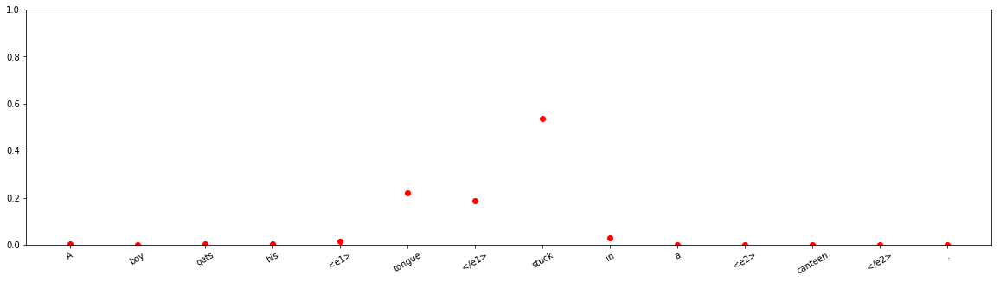





input sentence: These wind <e1> turbines </e1> generate <e2> electricity </e2> from naturally occurring wind .
answer label:    Cause-Effect(e1,e2)
wrong label:    Other
Other 	:	 0.64214635
Entity-Destination(e1,e2) 	:	 1.897091e-09
Cause-Effect(e2,e1) 	:	 0.0036317739
Member-Collection(e2,e1) 	:	 2.1924138e-10
Entity-Origin(e1,e2) 	:	 2.9317487e-10
Message-Topic(e1,e2) 	:	 3.51562e-08
Component-Whole(e1,e2) 	:	 0.006539502
Component-Whole(e2,e1) 	:	 7.2644536e-05
Instrument-Agency(e2,e1) 	:	 6.566148e-09
Content-Container(e1,e2) 	:	 4.478482e-10
Product-Producer(e2,e1) 	:	 1.1139296e-05
Cause-Effect(e1,e2) 	:	 0.29206166
Product-Producer(e1,e2) 	:	 0.0030868512
Content-Container(e2,e1) 	:	 7.132787e-10
Entity-Origin(e2,e1) 	:	 1.2883232e-09
Message-Topic(e2,e1) 	:	 6.5581565e-07
Instrument-Agency(e1,e2) 	:	 0.05244933
Member-Collection(e1,e2) 	:	 5.6777527e-08
Entity-Destination(e2,e1) 	:	 2.3693554e-08



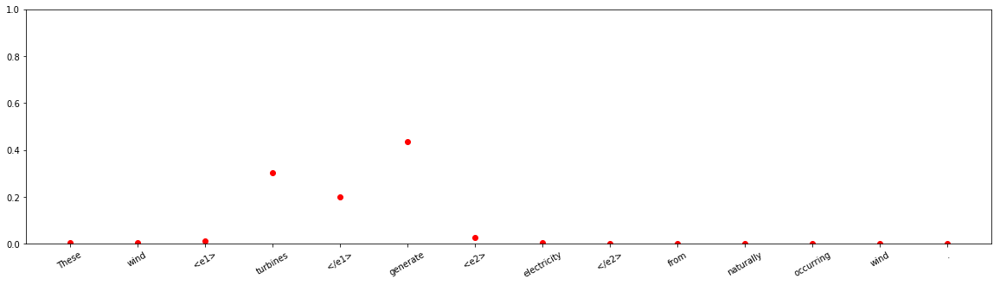



input sentence: The <e1> astronauts </e1> rode to the station in a <e2> capsule </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 5.8669525e-07
Entity-Destination(e1,e2) 	:	 0.9905968
Cause-Effect(e2,e1) 	:	 6.6292853e-13
Member-Collection(e2,e1) 	:	 2.2413369e-12
Entity-Origin(e1,e2) 	:	 2.4780342e-05
Message-Topic(e1,e2) 	:	 2.0194601e-12
Component-Whole(e1,e2) 	:	 8.601319e-08
Component-Whole(e2,e1) 	:	 3.636205e-15
Instrument-Agency(e2,e1) 	:	 0.001442292
Content-Container(e1,e2) 	:	 0.0018029372
Product-Producer(e2,e1) 	:	 1.0776442e-05
Cause-Effect(e1,e2) 	:	 3.7316785e-14
Product-Producer(e1,e2) 	:	 5.988766e-12
Content-Container(e2,e1) 	:	 4.5350994e-09
Entity-Origin(e2,e1) 	:	 3.729002e-11
Message-Topic(e2,e1) 	:	 3.9921988e-10
Instrument-Agency(e1,e2) 	:	 1.3842277e-09
Member-Collection(e1,e2) 	:	 0.0061217058
Entity-Destination(e2,e1) 	:	 3.839185e-11



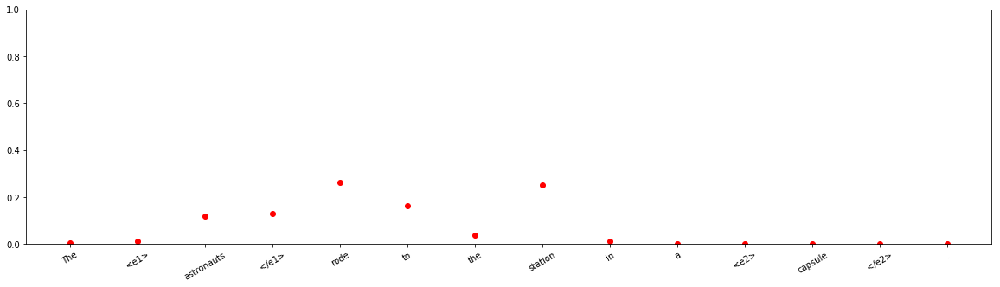




input sentence: Gordon Brown <e1> speech </e1> addresses the <e2> critics </e2> on UK immigration .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.2862913e-16
Entity-Destination(e1,e2) 	:	 2.3879931e-09
Cause-Effect(e2,e1) 	:	 1.1486878e-10
Member-Collection(e2,e1) 	:	 2.566523e-07
Entity-Origin(e1,e2) 	:	 1.1681505e-11
Message-Topic(e1,e2) 	:	 0.9999974
Component-Whole(e1,e2) 	:	 2.3574084e-10
Component-Whole(e2,e1) 	:	 8.363727e-12
Instrument-Agency(e2,e1) 	:	 8.325163e-12
Content-Container(e1,e2) 	:	 3.501e-16
Product-Producer(e2,e1) 	:	 6.301312e-09
Cause-Effect(e1,e2) 	:	 3.5240305e-10
Product-Producer(e1,e2) 	:	 2.2084369e-06
Content-Container(e2,e1) 	:	 1.460003e-11
Entity-Origin(e2,e1) 	:	 1.0703583e-13
Message-Topic(e2,e1) 	:	 7.842906e-08
Instrument-Agency(e1,e2) 	:	 1.2004241e-09
Member-Collection(e1,e2) 	:	 5.886893e-09
Entity-Destination(e2,e1) 	:	 9.564437e-12



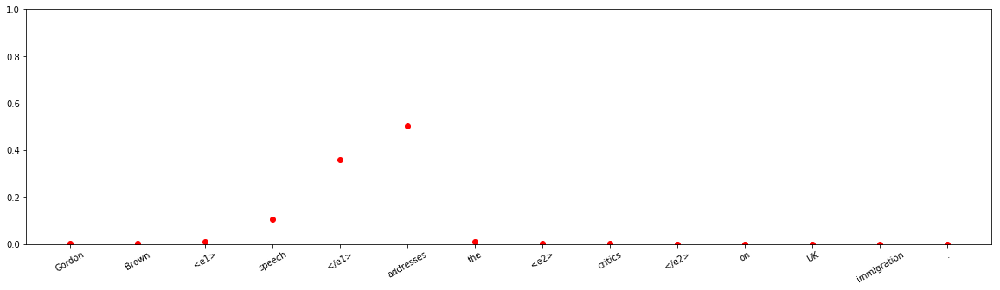






input sentence: The <e1> nest </e1> of <e2> hornets </e2> was long and uncovered externally .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.8505303e-09
Entity-Destination(e1,e2) 	:	 5.603409e-12
Cause-Effect(e2,e1) 	:	 8.454826e-11
Member-Collection(e2,e1) 	:	 0.99919564
Entity-Origin(e1,e2) 	:	 1.2801236e-10
Message-Topic(e1,e2) 	:	 5.769441e-11
Component-Whole(e1,e2) 	:	 0.0006502587
Component-Whole(e2,e1) 	:	 0.00015228344
Instrument-Agency(e2,e1) 	:	 6.1595893e-12
Content-Container(e1,e2) 	:	 4.450751e-11
Product-Producer(e2,e1) 	:	 2.2765787e-08
Cause-Effect(e1,e2) 	:	 1.0664754e-09
Product-Producer(e1,e2) 	:	 2.736665e-07
Content-Container(e2,e1) 	:	 1.18556436e-07
Entity-Origin(e2,e1) 	:	 3.1607975e-10
Message-Topic(e2,e1) 	:	 3.7829057e-07
Instrument-Agency(e1,e2) 	:	 3.8637316e-07
Member-Collection(e1,e2) 	:	 8.1256246e-07
Entity-Destination(e2,e1) 	:	 3.4278653e-11



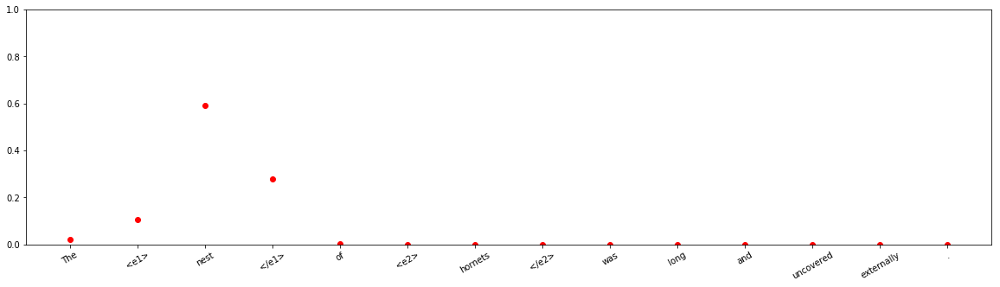





input sentence: The bottle carrier converts your <e1> bottle </e1> into a <e2> canteen </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 2.4854025e-14
Entity-Destination(e1,e2) 	:	 0.9998926
Cause-Effect(e2,e1) 	:	 4.5765317e-16
Member-Collection(e2,e1) 	:	 7.046215e-16
Entity-Origin(e1,e2) 	:	 4.5044097e-09
Message-Topic(e1,e2) 	:	 2.276168e-16
Component-Whole(e1,e2) 	:	 8.950399e-10
Component-Whole(e2,e1) 	:	 2.808791e-19
Instrument-Agency(e2,e1) 	:	 1.60126e-14
Content-Container(e1,e2) 	:	 4.980589e-06
Product-Producer(e2,e1) 	:	 8.098061e-11
Cause-Effect(e1,e2) 	:	 2.5554785e-15
Product-Producer(e1,e2) 	:	 2.9131675e-13
Content-Container(e2,e1) 	:	 0.000102353886
Entity-Origin(e2,e1) 	:	 9.48627e-10
Message-Topic(e2,e1) 	:	 8.940739e-18
Instrument-Agency(e1,e2) 	:	 8.778442e-13
Member-Collection(e1,e2) 	:	 2.913833e-10
Entity-Destination(e2,e1) 	:	 4.5832458e-14



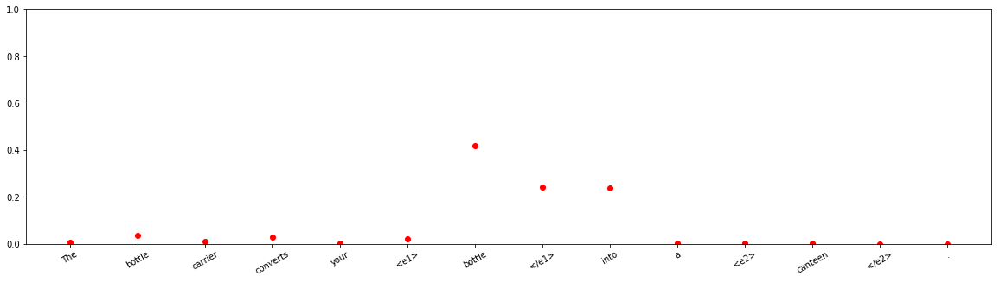


input sentence: The <e1> player </e1> starts playing at the next nearest <e2> keyframe </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Other
Other 	:	 0.9038485
Entity-Destination(e1,e2) 	:	 9.899292e-11
Cause-Effect(e2,e1) 	:	 8.2198703e-10
Member-Collection(e2,e1) 	:	 6.30547e-14
Entity-Origin(e1,e2) 	:	 3.1155e-09
Message-Topic(e1,e2) 	:	 3.2103706e-13
Component-Whole(e1,e2) 	:	 1.9557392e-12
Component-Whole(e2,e1) 	:	 7.839802e-11
Instrument-Agency(e2,e1) 	:	 0.09615102
Content-Container(e1,e2) 	:	 5.3879194e-09
Product-Producer(e2,e1) 	:	 2.9638343e-09
Cause-Effect(e1,e2) 	:	 1.07719215e-11
Product-Producer(e1,e2) 	:	 9.433574e-13
Content-Container(e2,e1) 	:	 6.672069e-11
Entity-Origin(e2,e1) 	:	 5.0916714e-13
Message-Topic(e2,e1) 	:	 9.9391544e-11
Instrument-Agency(e1,e2) 	:	 4.4595953e-07
Member-Collection(e1,e2) 	:	 8.47416e-08
Entity-Destination(e2,e1) 	:	 1.1206279e-12



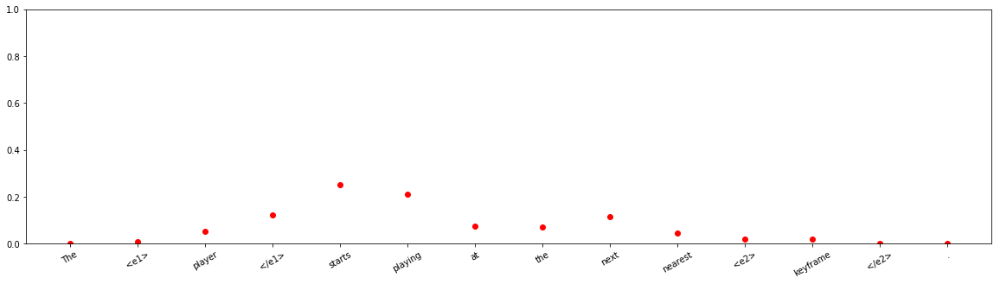


input sentence: His previous <e1> work </e1> has explored archetypal and symbolic <e2> themes </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 0.0002471051
Entity-Destination(e1,e2) 	:	 2.4919374e-12
Cause-Effect(e2,e1) 	:	 1.5140042e-12
Member-Collection(e2,e1) 	:	 4.9187228e-09
Entity-Origin(e1,e2) 	:	 1.5219671e-11
Message-Topic(e1,e2) 	:	 0.0569451
Component-Whole(e1,e2) 	:	 2.281126e-10
Component-Whole(e2,e1) 	:	 5.8702785e-09
Instrument-Agency(e2,e1) 	:	 5.4022754e-12
Content-Container(e1,e2) 	:	 1.8729436e-12
Product-Producer(e2,e1) 	:	 4.6067643e-09
Cause-Effect(e1,e2) 	:	 1.2111747e-08
Product-Producer(e1,e2) 	:	 2.784996e-10
Content-Container(e2,e1) 	:	 4.941601e-13
Entity-Origin(e2,e1) 	:	 6.292121e-07
Message-Topic(e2,e1) 	:	 0.9428072
Instrument-Agency(e1,e2) 	:	 2.4334841e-11
Member-Collection(e1,e2) 	:	 2.0770345e-12
Entity-Destination(e2,e1) 	:	 2.4571764e-12



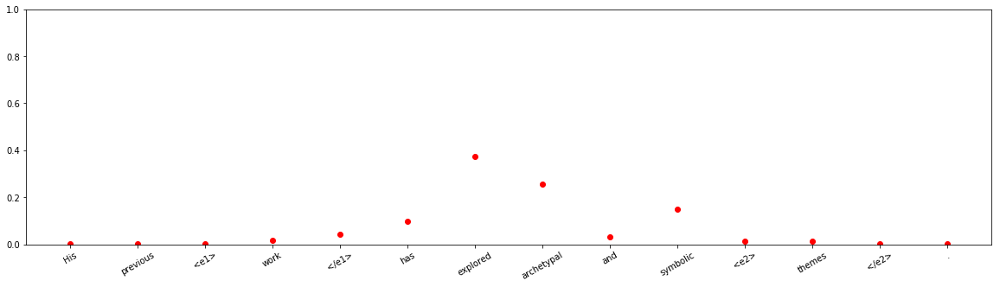

















input sentence: The high <e1> pressure </e1> inside a <e2> caisson </e2> presents health risks .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.0014831038
Entity-Destination(e1,e2) 	:	 8.606075e-05
Cause-Effect(e2,e1) 	:	 0.008684851
Member-Collection(e2,e1) 	:	 3.4820943e-10
Entity-Origin(e1,e2) 	:	 8.9946205e-08
Message-Topic(e1,e2) 	:	 1.6235806e-09
Component-Whole(e1,e2) 	:	 0.8410862
Component-Whole(e2,e1) 	:	 5.2209477e-09
Instrument-Agency(e2,e1) 	:	 2.3779373e-07
Content-Container(e1,e2) 	:	 0.14800209
Product-Producer(e2,e1) 	:	 7.368476e-09
Cause-Effect(e1,e2) 	:	 2.9579362e-06
Product-Producer(e1,e2) 	:	 1.3028112e-08
Content-Container(e2,e1) 	:	 2.5694071e-06
Entity-Origin(e2,e1) 	:	 7.727902e-09
Message-Topic(e2,e1) 	:	 5.2551866e-07
Instrument-Agency(e1,e2) 	:	 0.00030117063
Member-Collection(e1,e2) 	:	 0.00035004204
Entity-Destination(e2,e1) 	:	 3.4791565e-08



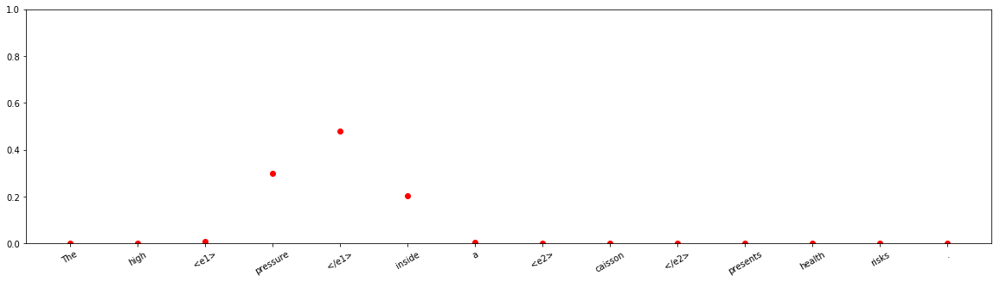



input sentence: We chose a <e1> server </e1> driven <e2> approach </e2> to link prefetching .
answer label:    Instrument-Agency(e1,e2)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.05770501
Entity-Destination(e1,e2) 	:	 4.3247783e-10
Cause-Effect(e2,e1) 	:	 3.6264975e-09
Member-Collection(e2,e1) 	:	 1.0429374e-05
Entity-Origin(e1,e2) 	:	 2.2562791e-07
Message-Topic(e1,e2) 	:	 7.7204606e-07
Component-Whole(e1,e2) 	:	 2.238994e-09
Component-Whole(e2,e1) 	:	 0.00025868928
Instrument-Agency(e2,e1) 	:	 0.5217827
Content-Container(e1,e2) 	:	 0.000103258295
Product-Producer(e2,e1) 	:	 1.4519846e-06
Cause-Effect(e1,e2) 	:	 5.795837e-08
Product-Producer(e1,e2) 	:	 3.4450657e-08
Content-Container(e2,e1) 	:	 2.1000254e-05
Entity-Origin(e2,e1) 	:	 3.4744172e-08
Message-Topic(e2,e1) 	:	 2.7776979e-08
Instrument-Agency(e1,e2) 	:	 0.42011628
Member-Collection(e1,e2) 	:	 3.585704e-09
Entity-Destination(e2,e1) 	:	 3.6546252e-10



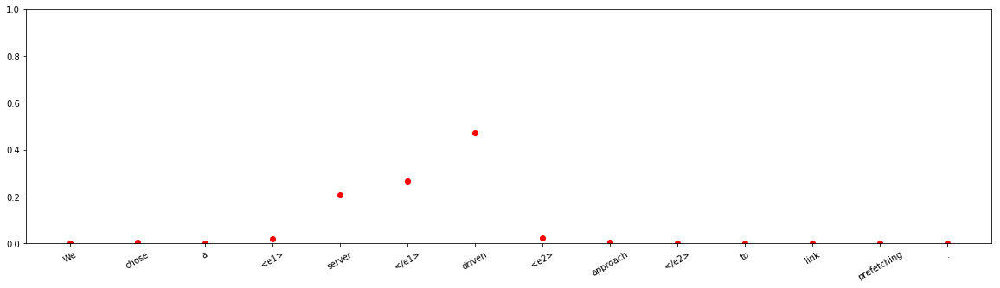




input sentence: CIP has been bestowing <e1> awards </e1> to honour planning <e2> projects </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9888548
Entity-Destination(e1,e2) 	:	 0.011113933
Cause-Effect(e2,e1) 	:	 5.3096533e-12
Member-Collection(e2,e1) 	:	 1.6207395e-09
Entity-Origin(e1,e2) 	:	 8.437681e-11
Message-Topic(e1,e2) 	:	 1.23094005e-05
Component-Whole(e1,e2) 	:	 7.95789e-06
Component-Whole(e2,e1) 	:	 5.924392e-10
Instrument-Agency(e2,e1) 	:	 1.7844115e-10
Content-Container(e1,e2) 	:	 3.0795033e-09
Product-Producer(e2,e1) 	:	 1.01510096e-07
Cause-Effect(e1,e2) 	:	 1.9674669e-10
Product-Producer(e1,e2) 	:	 1.6530628e-08
Content-Container(e2,e1) 	:	 5.9020795e-11
Entity-Origin(e2,e1) 	:	 4.0745074e-09
Message-Topic(e2,e1) 	:	 1.08429695e-05
Instrument-Agency(e1,e2) 	:	 5.2362864e-08
Member-Collection(e1,e2) 	:	 1.830381e-08
Entity-Destination(e2,e1) 	:	 5.998092e-10



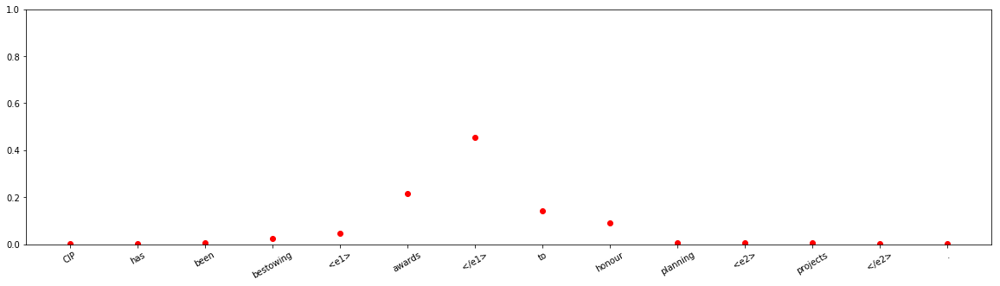











input sentence: The <e1> flights </e1> are departing into the adjacent controlled <e2> airspace </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 2.3258095e-12
Entity-Destination(e1,e2) 	:	 0.9999999
Cause-Effect(e2,e1) 	:	 3.8031078e-16
Member-Collection(e2,e1) 	:	 1.464827e-14
Entity-Origin(e1,e2) 	:	 6.503502e-08
Message-Topic(e1,e2) 	:	 3.6605823e-12
Component-Whole(e1,e2) 	:	 1.98671e-10
Component-Whole(e2,e1) 	:	 9.392813e-14
Instrument-Agency(e2,e1) 	:	 1.1936914e-13
Content-Container(e1,e2) 	:	 1.3297295e-10
Product-Producer(e2,e1) 	:	 3.5952788e-14
Cause-Effect(e1,e2) 	:	 2.6439015e-15
Product-Producer(e1,e2) 	:	 5.936817e-16
Content-Container(e2,e1) 	:	 2.2363322e-13
Entity-Origin(e2,e1) 	:	 4.0848197e-12
Message-Topic(e2,e1) 	:	 2.9964582e-15
Instrument-Agency(e1,e2) 	:	 1.4546197e-11
Member-Collection(e1,e2) 	:	 1.454485e-09
Entity-Destination(e2,e1) 	:	 1.6178067e-15



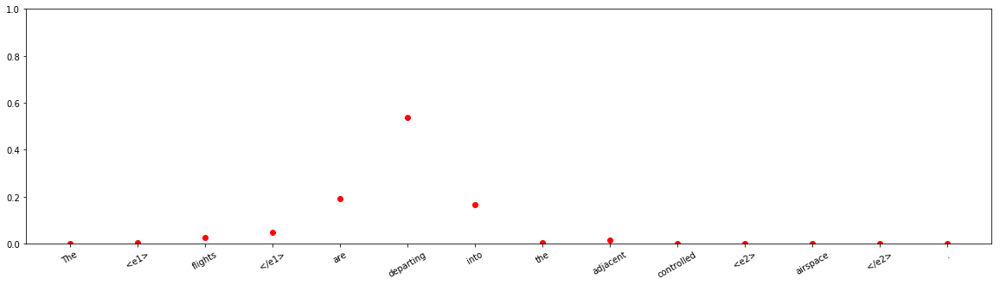



input sentence: It is the only <e1> journal </e1> dedicated to <e2> veterinary imaging </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9436136
Entity-Destination(e1,e2) 	:	 2.1395483e-09
Cause-Effect(e2,e1) 	:	 1.0191246e-11
Member-Collection(e2,e1) 	:	 2.6653684e-09
Entity-Origin(e1,e2) 	:	 5.979948e-12
Message-Topic(e1,e2) 	:	 0.012300915
Component-Whole(e1,e2) 	:	 0.04023599
Component-Whole(e2,e1) 	:	 2.3089162e-05
Instrument-Agency(e2,e1) 	:	 1.8569016e-09
Content-Container(e1,e2) 	:	 3.820559e-08
Product-Producer(e2,e1) 	:	 7.382138e-12
Cause-Effect(e1,e2) 	:	 1.03516216e-10
Product-Producer(e1,e2) 	:	 3.930697e-07
Content-Container(e2,e1) 	:	 3.4594655e-07
Entity-Origin(e2,e1) 	:	 5.5451094e-10
Message-Topic(e2,e1) 	:	 1.0777774e-09
Instrument-Agency(e1,e2) 	:	 0.0038257462
Member-Collection(e1,e2) 	:	 8.833035e-09
Entity-Destination(e2,e1) 	:	 4.6221582e-10



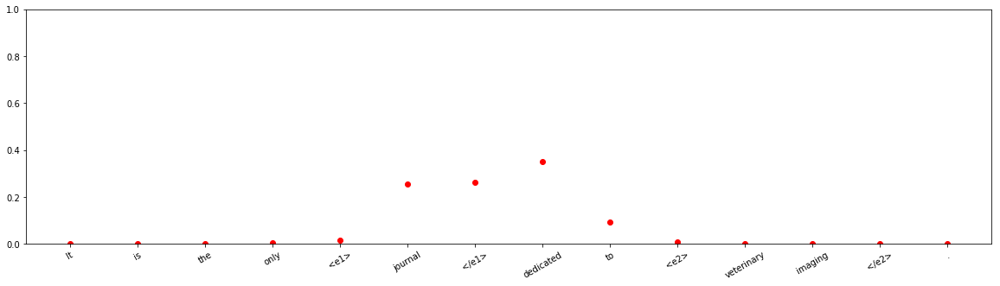






input sentence: The <e1> ornaments </e1> were blown into complicated , multi-piece <e2> molds </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Product-Producer(e2,e1)
Other 	:	 9.5629184e-05
Entity-Destination(e1,e2) 	:	 0.31567416
Cause-Effect(e2,e1) 	:	 2.6773848e-09
Member-Collection(e2,e1) 	:	 2.388351e-10
Entity-Origin(e1,e2) 	:	 4.4062916e-05
Message-Topic(e1,e2) 	:	 9.295212e-10
Component-Whole(e1,e2) 	:	 3.6359672e-06
Component-Whole(e2,e1) 	:	 1.0133523e-05
Instrument-Agency(e2,e1) 	:	 2.1868065e-09
Content-Container(e1,e2) 	:	 0.00015743822
Product-Producer(e2,e1) 	:	 0.6830309
Cause-Effect(e1,e2) 	:	 6.8513255e-06
Product-Producer(e1,e2) 	:	 4.2283176e-05
Content-Container(e2,e1) 	:	 0.00093061675
Entity-Origin(e2,e1) 	:	 2.26103e-06
Message-Topic(e2,e1) 	:	 7.411118e-09
Instrument-Agency(e1,e2) 	:	 2.0092305e-06
Member-Collection(e1,e2) 	:	 5.9058642e-09
Entity-Destination(e2,e1) 	:	 3.1928977e-09



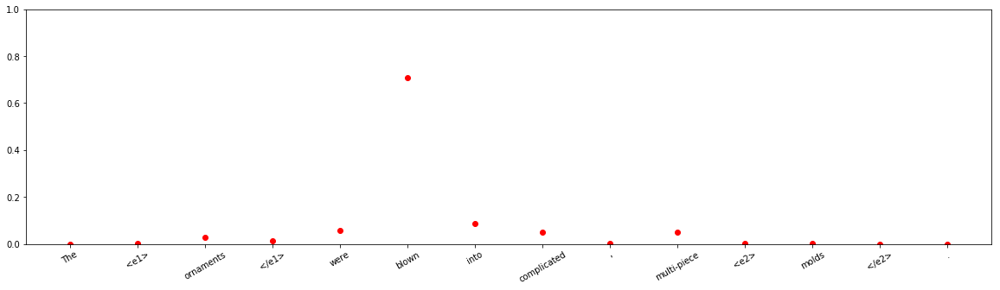













input sentence: The <e1> ring </e1> unleashes its own <e2> power </e2> in the struggle .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 2.428486e-06
Entity-Destination(e1,e2) 	:	 1.9091229e-09
Cause-Effect(e2,e1) 	:	 0.00015150901
Member-Collection(e2,e1) 	:	 1.7222407e-09
Entity-Origin(e1,e2) 	:	 1.9309004e-10
Message-Topic(e1,e2) 	:	 7.104355e-09
Component-Whole(e1,e2) 	:	 5.8740197e-06
Component-Whole(e2,e1) 	:	 6.18956e-05
Instrument-Agency(e2,e1) 	:	 2.827114e-09
Content-Container(e1,e2) 	:	 6.724802e-10
Product-Producer(e2,e1) 	:	 2.879007e-06
Cause-Effect(e1,e2) 	:	 0.9995425
Product-Producer(e1,e2) 	:	 1.9019876e-06
Content-Container(e2,e1) 	:	 4.4931404e-08
Entity-Origin(e2,e1) 	:	 9.215097e-10
Message-Topic(e2,e1) 	:	 4.427532e-12
Instrument-Agency(e1,e2) 	:	 0.00023103508
Member-Collection(e1,e2) 	:	 2.5198464e-08
Entity-Destination(e2,e1) 	:	 3.5346372e-09



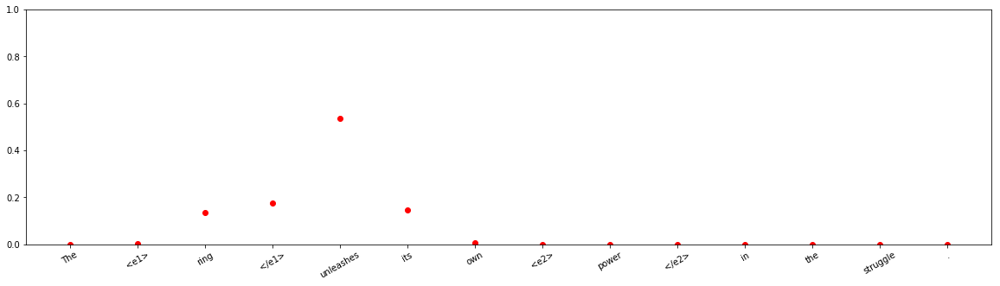






input sentence: The <e1> entrance </e1> to the temple was originally from the <e2> east </e2> , near the southeastern corner and decorated with twin monolithic limestone pillars colored red and bearing on the exterior side vertical hieroglyphic inscriptions in sunk relief with the queen 's titulary , name and depiction .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 5.1585346e-07
Entity-Destination(e1,e2) 	:	 5.209929e-10
Cause-Effect(e2,e1) 	:	 4.0565785e-05
Member-Collection(e2,e1) 	:	 3.6382197e-10
Entity-Origin(e1,e2) 	:	 0.9995858
Message-Topic(e1,e2) 	:	 1.434083e-13
Component-Whole(e1,e2) 	:	 4.2377283e-06
Component-Whole(e2,e1) 	:	 4.459637e-07
Instrument-Agency(e2,e1) 	:	 2.4495739e-14
Content-Container(e1,e2) 	:	 8.355996e-12
Product-Producer(e2,e1) 	:	 4.165136e-13
Cause-Effect(e1,e2) 	:	 6.955186e-14
Product-Producer(e1,e2) 	:	 0.0003682982
Content-Container(e2,e1) 	:	 8.456606e-12
Entity-Origin(e2,e1) 	:	 3.814875e-09
Message-Topic(e2,e1) 	:	 9

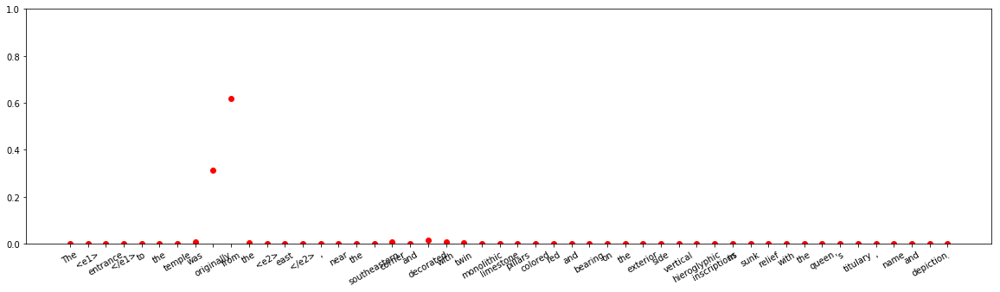






input sentence: One simple <e1> method </e1> for clearing small clogs is to use a tried-and-true <e2> combination </e2> of baking soda and vinegar .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.00071876374
Entity-Destination(e1,e2) 	:	 4.6740454e-13
Cause-Effect(e2,e1) 	:	 2.6447775e-11
Member-Collection(e2,e1) 	:	 3.3254692e-13
Entity-Origin(e1,e2) 	:	 1.419363e-10
Message-Topic(e1,e2) 	:	 4.5547402e-10
Component-Whole(e1,e2) 	:	 3.726765e-09
Component-Whole(e2,e1) 	:	 3.662119e-05
Instrument-Agency(e2,e1) 	:	 0.99918705
Content-Container(e1,e2) 	:	 6.101796e-08
Product-Producer(e2,e1) 	:	 1.1615633e-10
Cause-Effect(e1,e2) 	:	 2.6539832e-12
Product-Producer(e1,e2) 	:	 8.799408e-10
Content-Container(e2,e1) 	:	 9.411294e-07
Entity-Origin(e2,e1) 	:	 5.4537513e-11
Message-Topic(e2,e1) 	:	 4.572238e-13
Instrument-Agency(e1,e2) 	:	 5.647727e-05
Member-Collection(e1,e2) 	:	 3.5260335e-14
Entity-Destination(e2,e1) 	:	 2.9752017e-12



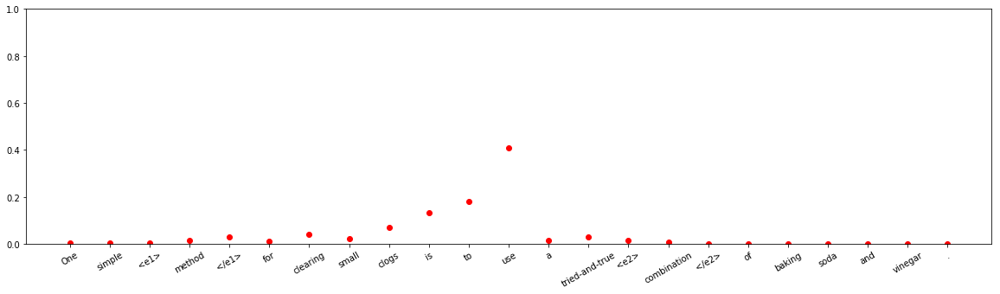


input sentence: The <e1> magazine </e1> was founded in order to keep athletes serving as soldiers informed about their <e2> sport </e2> back home .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.99271834
Entity-Destination(e1,e2) 	:	 8.558936e-10
Cause-Effect(e2,e1) 	:	 2.4610307e-11
Member-Collection(e2,e1) 	:	 1.773014e-10
Entity-Origin(e1,e2) 	:	 1.4204524e-08
Message-Topic(e1,e2) 	:	 0.0072435555
Component-Whole(e1,e2) 	:	 5.20354e-06
Component-Whole(e2,e1) 	:	 6.119001e-10
Instrument-Agency(e2,e1) 	:	 1.8023833e-06
Content-Container(e1,e2) 	:	 2.6615217e-07
Product-Producer(e2,e1) 	:	 2.5884625e-05
Cause-Effect(e1,e2) 	:	 4.8922744e-10
Product-Producer(e1,e2) 	:	 6.8533026e-08
Content-Container(e2,e1) 	:	 4.5850994e-09
Entity-Origin(e2,e1) 	:	 2.5691393e-09
Message-Topic(e2,e1) 	:	 4.1900953e-06
Instrument-Agency(e1,e2) 	:	 6.048547e-07
Member-Collection(e1,e2) 	:	 8.377773e-08
Entity-Destination(e2,e1) 	:	 2.6706048e-10



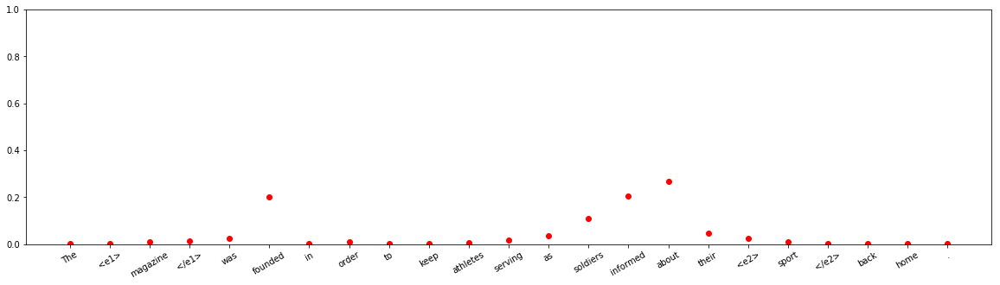



input sentence: The <e1> body </e1> unleashes its extraterrestrial <e2> passenger </e2> , which proceeds to infect the student population at a breakneck pace .
answer label:    Entity-Origin(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 6.620961e-12
Entity-Destination(e1,e2) 	:	 4.4927088e-08
Cause-Effect(e2,e1) 	:	 4.744445e-10
Member-Collection(e2,e1) 	:	 6.1760794e-08
Entity-Origin(e1,e2) 	:	 3.8329446e-05
Message-Topic(e1,e2) 	:	 5.4288022e-11
Component-Whole(e1,e2) 	:	 9.136949e-09
Component-Whole(e2,e1) 	:	 3.9759092e-05
Instrument-Agency(e2,e1) 	:	 0.00026323818
Content-Container(e1,e2) 	:	 1.1479088e-09
Product-Producer(e2,e1) 	:	 0.99955696
Cause-Effect(e1,e2) 	:	 1.1602947e-06
Product-Producer(e1,e2) 	:	 9.461809e-05
Content-Container(e2,e1) 	:	 4.8698926e-06
Entity-Origin(e2,e1) 	:	 7.902279e-08
Message-Topic(e2,e1) 	:	 2.364526e-12
Instrument-Agency(e1,e2) 	:	 7.1765317e-07
Member-Collection(e1,e2) 	:	 3.5040408e-08
Entity-Destination(e2,e1) 	:	 8.484041e-11



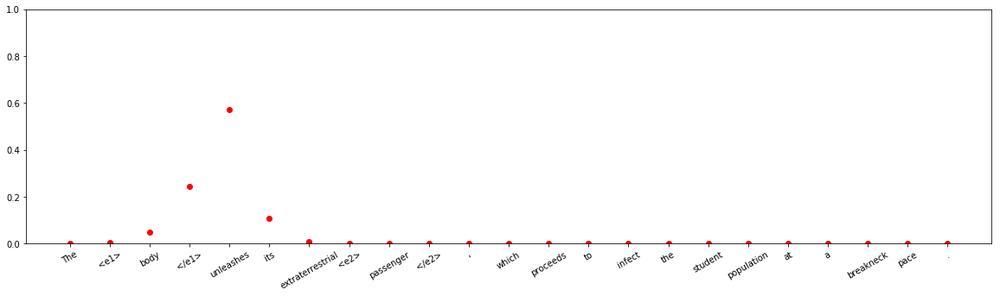


input sentence: The <e1> swim bladder </e1> of aquatic <e2> animals </e2> gives them the ability to manioulate gravity and should be researched more .
answer label:    Component-Whole(e1,e2)
wrong label:    Member-Collection(e2,e1)
Other 	:	 2.1207777e-08
Entity-Destination(e1,e2) 	:	 1.7034653e-08
Cause-Effect(e2,e1) 	:	 1.34405855e-08
Member-Collection(e2,e1) 	:	 0.98012125
Entity-Origin(e1,e2) 	:	 1.7660847e-08
Message-Topic(e1,e2) 	:	 2.3244775e-09
Component-Whole(e1,e2) 	:	 0.019315742
Component-Whole(e2,e1) 	:	 7.281686e-08
Instrument-Agency(e2,e1) 	:	 1.4757949e-10
Content-Container(e1,e2) 	:	 3.1376765e-10
Product-Producer(e2,e1) 	:	 1.0234697e-08
Cause-Effect(e1,e2) 	:	 9.093596e-08
Product-Producer(e1,e2) 	:	 1.0634792e-08
Content-Container(e2,e1) 	:	 0.0005300443
Entity-Origin(e2,e1) 	:	 2.638871e-07
Message-Topic(e2,e1) 	:	 1.500749e-10
Instrument-Agency(e1,e2) 	:	 8.286853e-06
Member-Collection(e1,e2) 	:	 2.4113462e-05
Entity-Destination(e2,e1) 	:	 1.32437524e-11



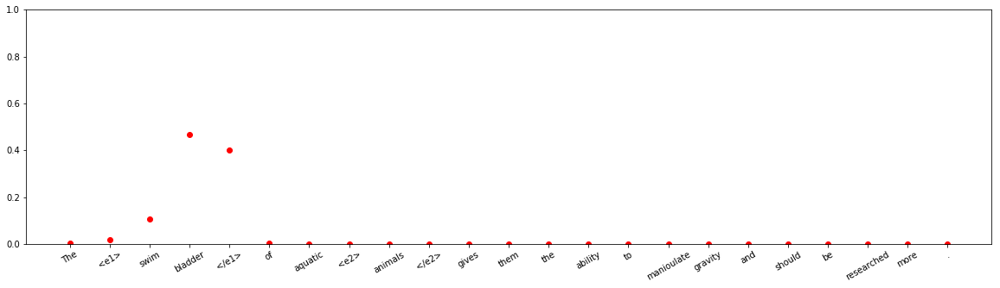



input sentence: Anyway , the <e1> guy </e1> convinced some local with a <e2> car </e2> to drive somewhere to procure us some beer .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 5.68747e-05
Entity-Destination(e1,e2) 	:	 5.3059692e-14
Cause-Effect(e2,e1) 	:	 2.5406149e-12
Member-Collection(e2,e1) 	:	 4.6540416e-15
Entity-Origin(e1,e2) 	:	 7.171515e-11
Message-Topic(e1,e2) 	:	 7.6906865e-14
Component-Whole(e1,e2) 	:	 4.6278225e-15
Component-Whole(e2,e1) 	:	 1.267774e-10
Instrument-Agency(e2,e1) 	:	 0.9999248
Content-Container(e1,e2) 	:	 5.4719257e-10
Product-Producer(e2,e1) 	:	 1.8395103e-05
Cause-Effect(e1,e2) 	:	 1.6260773e-12
Product-Producer(e1,e2) 	:	 7.6508695e-12
Content-Container(e2,e1) 	:	 3.292039e-10
Entity-Origin(e2,e1) 	:	 1.4824327e-13
Message-Topic(e2,e1) 	:	 4.7967913e-10
Instrument-Agency(e1,e2) 	:	 6.5277617e-10
Member-Collection(e1,e2) 	:	 5.1437024e-14
Entity-Destination(e2,e1) 	:	 5.0851513e-15



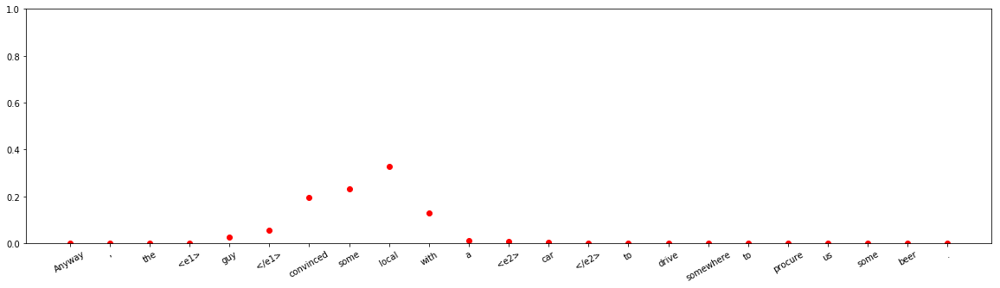













input sentence: The <e1> students </e1> had decorated the blackboard with a <e2> drawing </e2> of a young woman and a bright yellow moon .
answer label:    Product-Producer(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 9.246822e-09
Entity-Destination(e1,e2) 	:	 3.2337921e-12
Cause-Effect(e2,e1) 	:	 2.3698364e-11
Member-Collection(e2,e1) 	:	 4.884075e-09
Entity-Origin(e1,e2) 	:	 3.1047215e-08
Message-Topic(e1,e2) 	:	 6.150764e-13
Component-Whole(e1,e2) 	:	 1.18997306e-07
Component-Whole(e2,e1) 	:	 0.48843467
Instrument-Agency(e2,e1) 	:	 0.51131016
Content-Container(e1,e2) 	:	 3.8674205e-08
Product-Producer(e2,e1) 	:	 0.00025182834
Cause-Effect(e1,e2) 	:	 3.3610953e-10
Product-Producer(e1,e2) 	:	 6.6440803e-10
Content-Container(e2,e1) 	:	 3.021274e-06
Entity-Origin(e2,e1) 	:	 1.234702e-12
Message-Topic(e2,e1) 	:	 6.6904454e-10
Instrument-Agency(e1,e2) 	:	 3.2081065e-08
Member-Collection(e1,e2) 	:	 1.3870958e-12
Entity-Destination(e2,e1) 	:	 2.2826798e-13



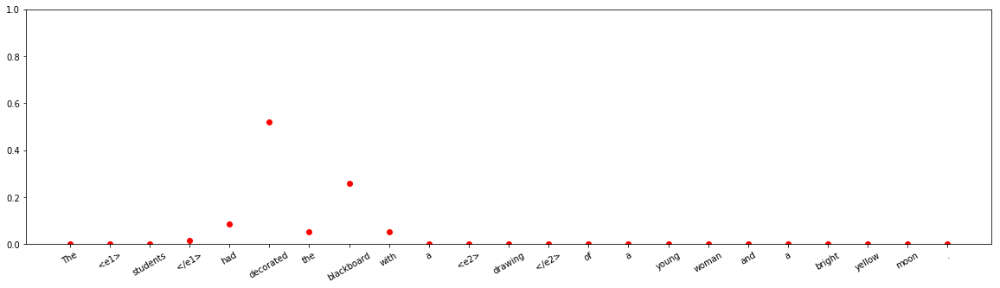


input sentence: The propaganda <e1> machine </e1> tells us about these tin-pot <e2> dictators </e2> , which are the greatest threat to the world .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 2.8748793e-16
Entity-Destination(e1,e2) 	:	 1.014646e-11
Cause-Effect(e2,e1) 	:	 1.836442e-15
Member-Collection(e2,e1) 	:	 6.780738e-10
Entity-Origin(e1,e2) 	:	 2.4802588e-12
Message-Topic(e1,e2) 	:	 1.0
Component-Whole(e1,e2) 	:	 6.1502552e-12
Component-Whole(e2,e1) 	:	 1.3817323e-14
Instrument-Agency(e2,e1) 	:	 8.7298034e-14
Content-Container(e1,e2) 	:	 2.5470503e-16
Product-Producer(e2,e1) 	:	 1.2669457e-10
Cause-Effect(e1,e2) 	:	 4.2094772e-10
Product-Producer(e1,e2) 	:	 8.144608e-09
Content-Container(e2,e1) 	:	 3.2989383e-13
Entity-Origin(e2,e1) 	:	 1.786529e-11
Message-Topic(e2,e1) 	:	 2.5231898e-11
Instrument-Agency(e1,e2) 	:	 7.036239e-09
Member-Collection(e1,e2) 	:	 3.44684e-10
Entity-Destination(e2,e1) 	:	 8.60136e-15



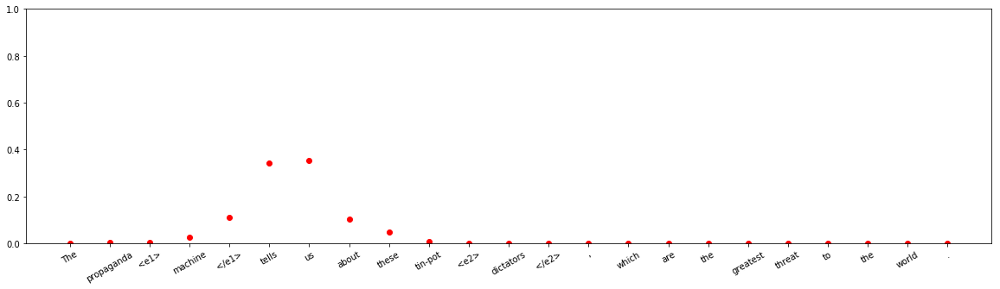



input sentence: For 31 years , the <e1> symposium </e1> has assembled international <e2> physicians </e2> and researchers from academic institutions and private organisations .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 6.0836883e-06
Entity-Destination(e1,e2) 	:	 1.5294637e-07
Cause-Effect(e2,e1) 	:	 4.473016e-09
Member-Collection(e2,e1) 	:	 0.84436643
Entity-Origin(e1,e2) 	:	 1.9078503e-05
Message-Topic(e1,e2) 	:	 0.00020229368
Component-Whole(e1,e2) 	:	 0.0017049179
Component-Whole(e2,e1) 	:	 3.8189057e-05
Instrument-Agency(e2,e1) 	:	 1.0492024e-12
Content-Container(e1,e2) 	:	 1.02511905e-07
Product-Producer(e2,e1) 	:	 9.626839e-07
Cause-Effect(e1,e2) 	:	 1.9921278e-07
Product-Producer(e1,e2) 	:	 0.048039228
Content-Container(e2,e1) 	:	 2.9032854e-08
Entity-Origin(e2,e1) 	:	 4.893318e-05
Message-Topic(e2,e1) 	:	 2.2241262e-05
Instrument-Agency(e1,e2) 	:	 0.089849204
Member-Collection(e1,e2) 	:	 0.01570197
Entity-Destination(e2,e1) 	:	 2.0653361e-09



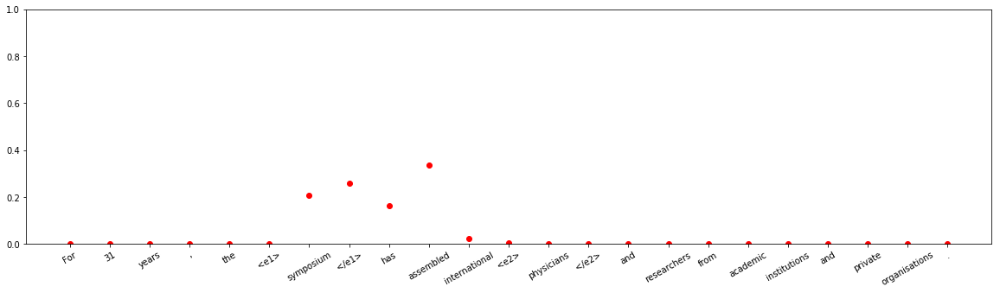




input sentence: Stroker Serpentine alerted me to a very messy situation this evening involving a huge <e1> cache </e1> of stolen <e2> goods </e2> .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.9988487
Entity-Destination(e1,e2) 	:	 6.1007943e-10
Cause-Effect(e2,e1) 	:	 1.2055809e-09
Member-Collection(e2,e1) 	:	 0.0009981801
Entity-Origin(e1,e2) 	:	 1.552171e-09
Message-Topic(e1,e2) 	:	 1.2807408e-07
Component-Whole(e1,e2) 	:	 2.46416e-09
Component-Whole(e2,e1) 	:	 4.6538137e-08
Instrument-Agency(e2,e1) 	:	 4.2806903e-07
Content-Container(e1,e2) 	:	 3.1423664e-05
Product-Producer(e2,e1) 	:	 8.400004e-09
Cause-Effect(e1,e2) 	:	 1.01241196e-10
Product-Producer(e1,e2) 	:	 2.1120699e-09
Content-Container(e2,e1) 	:	 0.000119757504
Entity-Origin(e2,e1) 	:	 2.5629431e-08
Message-Topic(e2,e1) 	:	 7.2377944e-08
Instrument-Agency(e1,e2) 	:	 1.1741698e-06
Member-Collection(e1,e2) 	:	 1.9617612e-09
Entity-Destination(e2,e1) 	:	 4.2314516e-11



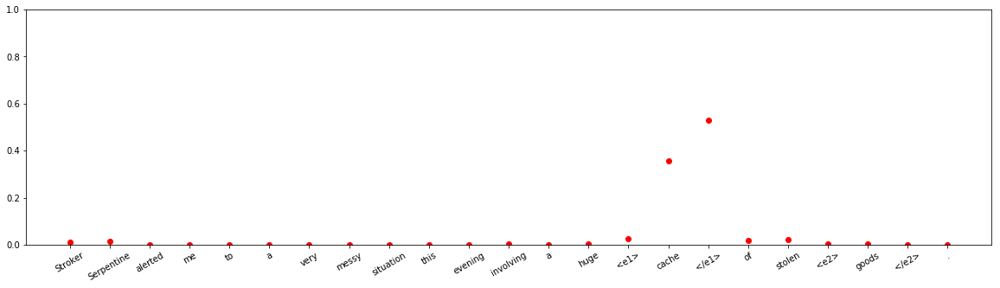


input sentence: This <e1> table </e1> serves as an example of the <e2> data </e2> and observations routinely collected in the Horner rootstock trial .
answer label:    Message-Topic(e1,e2)
wrong label:    Product-Producer(e2,e1)
Other 	:	 2.5097273e-09
Entity-Destination(e1,e2) 	:	 2.3338347e-07
Cause-Effect(e2,e1) 	:	 3.7404062e-11
Member-Collection(e2,e1) 	:	 0.0046533938
Entity-Origin(e1,e2) 	:	 0.000431929
Message-Topic(e1,e2) 	:	 0.01285911
Component-Whole(e1,e2) 	:	 0.05686606
Component-Whole(e2,e1) 	:	 0.0010183599
Instrument-Agency(e2,e1) 	:	 2.7750204e-05
Content-Container(e1,e2) 	:	 5.4679127e-05
Product-Producer(e2,e1) 	:	 0.8939469
Cause-Effect(e1,e2) 	:	 1.2817535e-06
Product-Producer(e1,e2) 	:	 0.001749472
Content-Container(e2,e1) 	:	 0.005050169
Entity-Origin(e2,e1) 	:	 0.00023131601
Message-Topic(e2,e1) 	:	 0.02306906
Instrument-Agency(e1,e2) 	:	 1.0061678e-05
Member-Collection(e1,e2) 	:	 3.0046302e-05
Entity-Destination(e2,e1) 	:	 1.1214705e-07



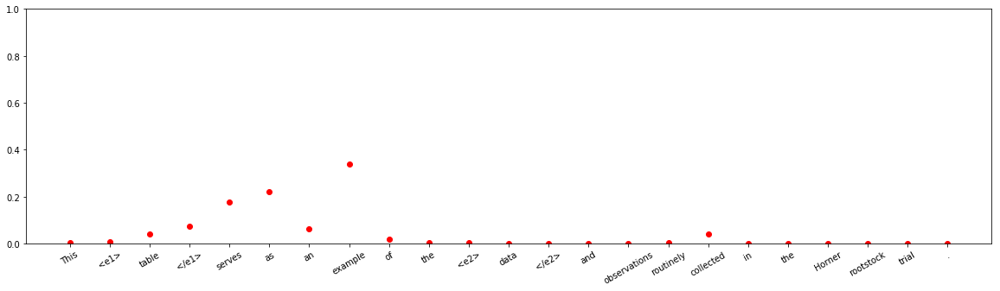




input sentence: Be sure and always stack on an elevated stack pad so the <e1> moisture </e1> runs away from the <e2> stack </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 0.2723002
Entity-Destination(e1,e2) 	:	 2.0138764e-06
Cause-Effect(e2,e1) 	:	 0.724547
Member-Collection(e2,e1) 	:	 1.751747e-11
Entity-Origin(e1,e2) 	:	 0.003093347
Message-Topic(e1,e2) 	:	 7.9390026e-13
Component-Whole(e1,e2) 	:	 5.1011847e-07
Component-Whole(e2,e1) 	:	 1.0223129e-08
Instrument-Agency(e2,e1) 	:	 1.2313255e-08
Content-Container(e1,e2) 	:	 3.9544907e-06
Product-Producer(e2,e1) 	:	 3.130639e-11
Cause-Effect(e1,e2) 	:	 6.238215e-11
Product-Producer(e1,e2) 	:	 2.5407906e-05
Content-Container(e2,e1) 	:	 6.671256e-07
Entity-Origin(e2,e1) 	:	 5.0693103e-08
Message-Topic(e2,e1) 	:	 1.1015428e-08
Instrument-Agency(e1,e2) 	:	 2.6669291e-05
Member-Collection(e1,e2) 	:	 1.5171983e-09
Entity-Destination(e2,e1) 	:	 1.9254458e-10



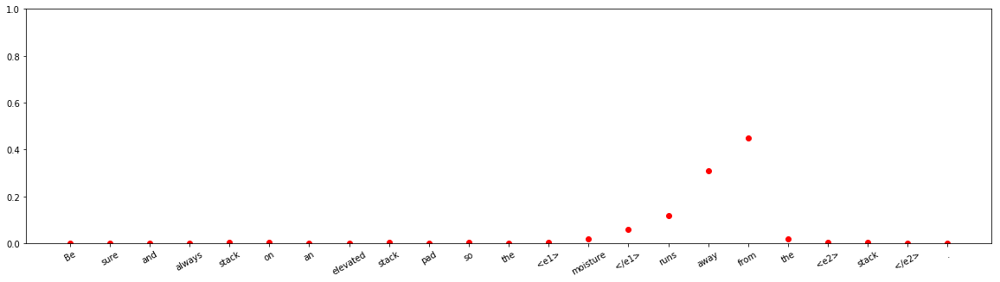







input sentence: He is the author of eight <e1> books </e1> which have charted the <e2> transformation </e2> of Europe over the last quarter-century .
answer label:    Message-Topic(e1,e2)
wrong label:    Cause-Effect(e1,e2)
Other 	:	 0.009410372
Entity-Destination(e1,e2) 	:	 8.44494e-10
Cause-Effect(e2,e1) 	:	 1.321383e-09
Member-Collection(e2,e1) 	:	 3.1039093e-08
Entity-Origin(e1,e2) 	:	 4.7604622e-09
Message-Topic(e1,e2) 	:	 0.3243306
Component-Whole(e1,e2) 	:	 6.554166e-06
Component-Whole(e2,e1) 	:	 0.00017039421
Instrument-Agency(e2,e1) 	:	 1.8179652e-08
Content-Container(e1,e2) 	:	 1.2136394e-07
Product-Producer(e2,e1) 	:	 0.0074911024
Cause-Effect(e1,e2) 	:	 0.6584173
Product-Producer(e1,e2) 	:	 5.4172625e-07
Content-Container(e2,e1) 	:	 7.792459e-08
Entity-Origin(e2,e1) 	:	 1.5686181e-06
Message-Topic(e2,e1) 	:	 0.00016582562
Instrument-Agency(e1,e2) 	:	 5.4845364e-06
Member-Collection(e1,e2) 	:	 2.0370926e-08
Entity-Destination(e2,e1) 	:	 7.6839375e-11



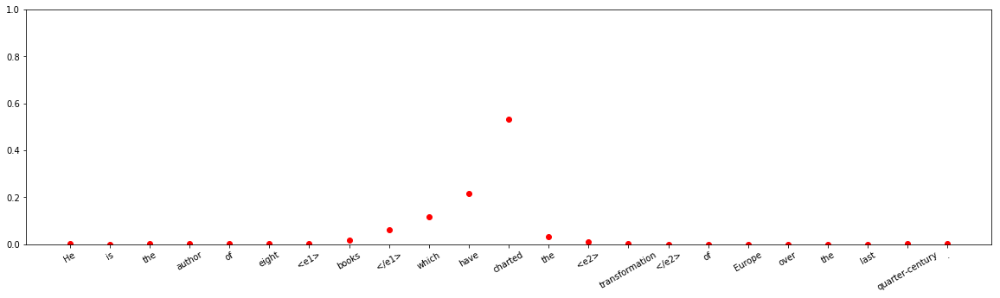


input sentence: Complementing the unique arsenal is a vibrant <e1> world </e1> that employs a cel-shaded <e2> animation </e2> reminiscent of a comic book .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.00340444e-10
Entity-Destination(e1,e2) 	:	 1.1713417e-13
Cause-Effect(e2,e1) 	:	 1.5445963e-10
Member-Collection(e2,e1) 	:	 1.5471662e-06
Entity-Origin(e1,e2) 	:	 1.0626046e-08
Message-Topic(e1,e2) 	:	 2.5454314e-08
Component-Whole(e1,e2) 	:	 3.023687e-11
Component-Whole(e2,e1) 	:	 0.00095254765
Instrument-Agency(e2,e1) 	:	 0.0037331115
Content-Container(e1,e2) 	:	 4.817071e-10
Product-Producer(e2,e1) 	:	 0.99520594
Cause-Effect(e1,e2) 	:	 8.458922e-05
Product-Producer(e1,e2) 	:	 2.1705773e-07
Content-Container(e2,e1) 	:	 1.4828918e-08
Entity-Origin(e2,e1) 	:	 2.0674633e-09
Message-Topic(e2,e1) 	:	 4.1273227e-10
Instrument-Agency(e1,e2) 	:	 2.1939633e-05
Member-Collection(e1,e2) 	:	 2.1960762e-10
Entity-Destination(e2,e1) 	:	 1.2836038e-10



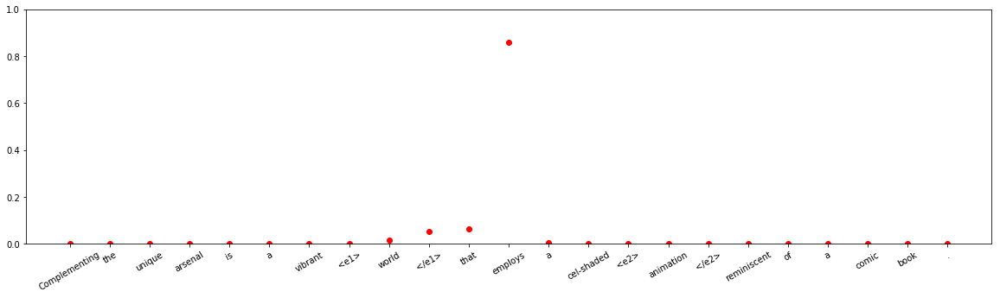



input sentence: A <e1> project </e1> to regulate the <e2> standard </e2> of private rental properties in Dumfries and Galloway looks set to close .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 0.053716403
Entity-Destination(e1,e2) 	:	 7.26518e-08
Cause-Effect(e2,e1) 	:	 1.0099101e-11
Member-Collection(e2,e1) 	:	 1.8039134e-11
Entity-Origin(e1,e2) 	:	 2.6621048e-14
Message-Topic(e1,e2) 	:	 0.9462377
Component-Whole(e1,e2) 	:	 4.32488e-05
Component-Whole(e2,e1) 	:	 2.4403727e-08
Instrument-Agency(e2,e1) 	:	 2.8851469e-08
Content-Container(e1,e2) 	:	 1.292898e-10
Product-Producer(e2,e1) 	:	 2.265309e-07
Cause-Effect(e1,e2) 	:	 1.466528e-07
Product-Producer(e1,e2) 	:	 3.0210587e-09
Content-Container(e2,e1) 	:	 3.0421698e-09
Entity-Origin(e2,e1) 	:	 5.1169426e-11
Message-Topic(e2,e1) 	:	 1.6415785e-07
Instrument-Agency(e1,e2) 	:	 2.164169e-06
Member-Collection(e1,e2) 	:	 1.9149059e-10
Entity-Destination(e2,e1) 	:	 3.9729078e-10



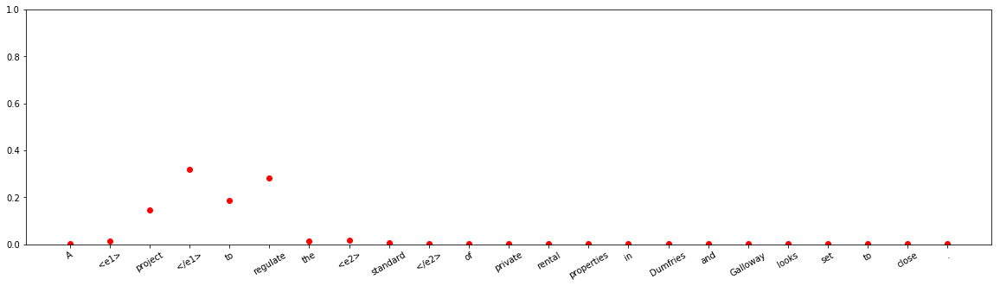


input sentence: The outer <e1> bark </e1> composed of dead <e2> phloem </e2> alternating with bands of cork is called , technically , rhytidome .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.008256814
Entity-Destination(e1,e2) 	:	 7.713455e-13
Cause-Effect(e2,e1) 	:	 1.2232765e-07
Member-Collection(e2,e1) 	:	 0.00010899619
Entity-Origin(e1,e2) 	:	 1.4856242e-06
Message-Topic(e1,e2) 	:	 7.066721e-12
Component-Whole(e1,e2) 	:	 0.17012417
Component-Whole(e2,e1) 	:	 0.8172731
Instrument-Agency(e2,e1) 	:	 2.1194665e-10
Content-Container(e1,e2) 	:	 6.942339e-07
Product-Producer(e2,e1) 	:	 0.0003731208
Cause-Effect(e1,e2) 	:	 4.20178e-07
Product-Producer(e1,e2) 	:	 3.6283168e-06
Content-Container(e2,e1) 	:	 0.0038545576
Entity-Origin(e2,e1) 	:	 2.6883429e-06
Message-Topic(e2,e1) 	:	 4.9581592e-11
Instrument-Agency(e1,e2) 	:	 2.0609714e-07
Member-Collection(e1,e2) 	:	 3.329632e-08
Entity-Destination(e2,e1) 	:	 6.260944e-09



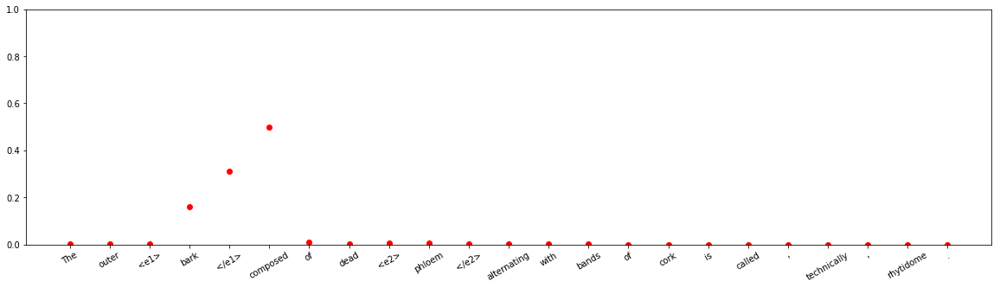




input sentence: The <e1> president </e1> of the <e2> corporation </e2> , by virtue of his office , presides as chairman of the meeting .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.23675439
Entity-Destination(e1,e2) 	:	 4.157177e-11
Cause-Effect(e2,e1) 	:	 3.73854e-09
Member-Collection(e2,e1) 	:	 2.1152255e-08
Entity-Origin(e1,e2) 	:	 3.4558503e-09
Message-Topic(e1,e2) 	:	 1.7621157e-09
Component-Whole(e1,e2) 	:	 4.8054924e-09
Component-Whole(e2,e1) 	:	 6.352166e-15
Instrument-Agency(e2,e1) 	:	 1.6676894e-06
Content-Container(e1,e2) 	:	 2.1225477e-09
Product-Producer(e2,e1) 	:	 2.199235e-06
Cause-Effect(e1,e2) 	:	 6.966265e-11
Product-Producer(e1,e2) 	:	 1.4017922e-07
Content-Container(e2,e1) 	:	 3.127545e-11
Entity-Origin(e2,e1) 	:	 1.5550377e-09
Message-Topic(e2,e1) 	:	 1.2300706e-07
Instrument-Agency(e1,e2) 	:	 5.6758436e-06
Member-Collection(e1,e2) 	:	 0.76323575
Entity-Destination(e2,e1) 	:	 5.5923517e-12



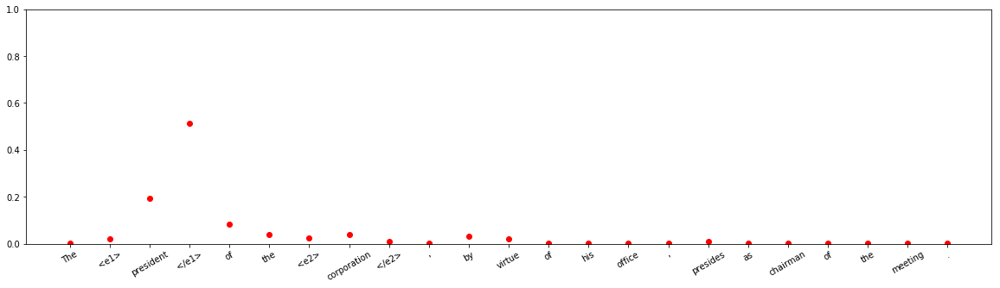



input sentence: A <e1> blood </e1> <e2> clot </e2> is a normal reaction of the body that occurs if a blood vessel is injured .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.0886784
Entity-Destination(e1,e2) 	:	 3.5890795e-07
Cause-Effect(e2,e1) 	:	 4.5267796e-05
Member-Collection(e2,e1) 	:	 4.0867973e-05
Entity-Origin(e1,e2) 	:	 1.8830837e-05
Message-Topic(e1,e2) 	:	 3.695259e-05
Component-Whole(e1,e2) 	:	 0.00042137865
Component-Whole(e2,e1) 	:	 0.90136844
Instrument-Agency(e2,e1) 	:	 0.00013462022
Content-Container(e1,e2) 	:	 0.0014469863
Product-Producer(e2,e1) 	:	 2.3820485e-07
Cause-Effect(e1,e2) 	:	 0.0047479435
Product-Producer(e1,e2) 	:	 3.1476523e-07
Content-Container(e2,e1) 	:	 0.0020829928
Entity-Origin(e2,e1) 	:	 3.91449e-05
Message-Topic(e2,e1) 	:	 1.9962211e-08
Instrument-Agency(e1,e2) 	:	 0.00091550476
Member-Collection(e1,e2) 	:	 2.16329e-05
Entity-Destination(e2,e1) 	:	 2.833013e-07



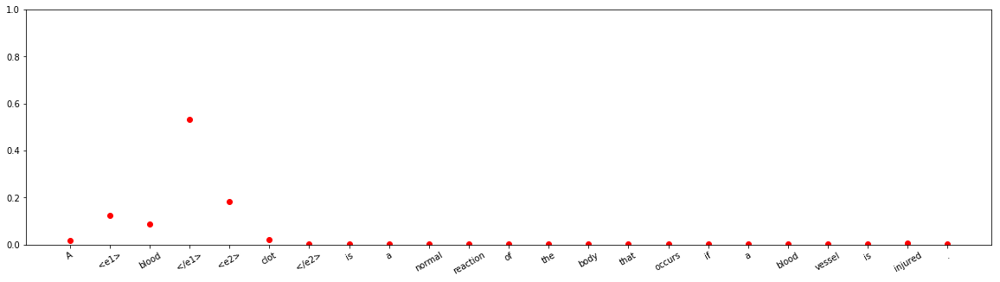



input sentence: <e1> Considerations </e1> have been concerned with <e2> cases </e2> where the forces between particles can be handled in a satisfactory manner .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.0761465e-06
Entity-Destination(e1,e2) 	:	 3.871739e-09
Cause-Effect(e2,e1) 	:	 4.2153778e-07
Member-Collection(e2,e1) 	:	 9.92835e-07
Entity-Origin(e1,e2) 	:	 6.021306e-10
Message-Topic(e1,e2) 	:	 0.12879066
Component-Whole(e1,e2) 	:	 8.826606e-08
Component-Whole(e2,e1) 	:	 0.6447712
Instrument-Agency(e2,e1) 	:	 4.568135e-06
Content-Container(e1,e2) 	:	 4.2234998e-08
Product-Producer(e2,e1) 	:	 4.3183317e-07
Cause-Effect(e1,e2) 	:	 5.7010137e-05
Product-Producer(e1,e2) 	:	 7.274339e-08
Content-Container(e2,e1) 	:	 2.054999e-07
Entity-Origin(e2,e1) 	:	 1.054336e-09
Message-Topic(e2,e1) 	:	 0.22637136
Instrument-Agency(e1,e2) 	:	 7.563932e-07
Member-Collection(e1,e2) 	:	 7.462065e-12
Entity-Destination(e2,e1) 	:	 6.721754e-09



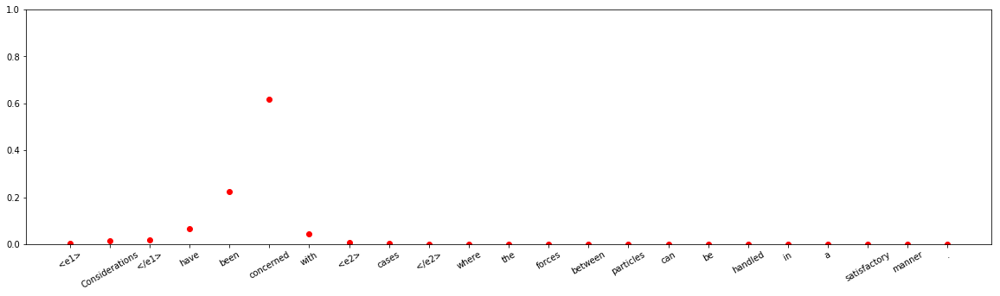




input sentence: It is a <e1> dispute </e1> over a <e2> plot </e2> of land where hundreds of babies are believed to be buried .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.4286904e-07
Entity-Destination(e1,e2) 	:	 1.6701043e-07
Cause-Effect(e2,e1) 	:	 3.8304684e-09
Member-Collection(e2,e1) 	:	 8.053202e-06
Entity-Origin(e1,e2) 	:	 1.2992002e-06
Message-Topic(e1,e2) 	:	 0.5798002
Component-Whole(e1,e2) 	:	 1.0021983e-08
Component-Whole(e2,e1) 	:	 8.967817e-06
Instrument-Agency(e2,e1) 	:	 1.937767e-07
Content-Container(e1,e2) 	:	 2.9481848e-06
Product-Producer(e2,e1) 	:	 0.4097112
Cause-Effect(e1,e2) 	:	 1.6967e-06
Product-Producer(e1,e2) 	:	 0.0019500183
Content-Container(e2,e1) 	:	 9.4105335e-06
Entity-Origin(e2,e1) 	:	 5.6989098e-08
Message-Topic(e2,e1) 	:	 0.008505147
Instrument-Agency(e1,e2) 	:	 2.8471976e-07
Member-Collection(e1,e2) 	:	 5.7609145e-10
Entity-Destination(e2,e1) 	:	 1.448041e-07



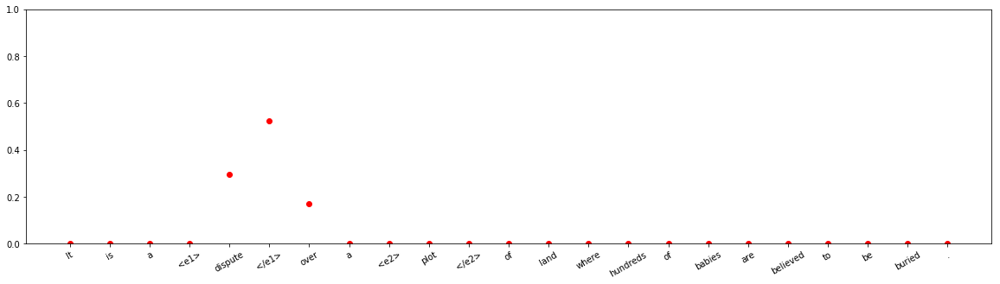






input sentence: The <e1> aircraft </e1> was making a third <e2> approach </e2> to Irkutsk , a scheduled refueling stop , when it crashed .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.32170078
Entity-Destination(e1,e2) 	:	 5.3853055e-09
Cause-Effect(e2,e1) 	:	 1.1524681e-11
Member-Collection(e2,e1) 	:	 2.6550371e-11
Entity-Origin(e1,e2) 	:	 2.660269e-07
Message-Topic(e1,e2) 	:	 6.567577e-09
Component-Whole(e1,e2) 	:	 1.190748e-09
Component-Whole(e2,e1) 	:	 1.801804e-05
Instrument-Agency(e2,e1) 	:	 2.6904185e-05
Content-Container(e1,e2) 	:	 2.8971586e-05
Product-Producer(e2,e1) 	:	 0.6782005
Cause-Effect(e1,e2) 	:	 1.6763279e-05
Product-Producer(e1,e2) 	:	 4.383888e-09
Content-Container(e2,e1) 	:	 3.0049173e-06
Entity-Origin(e2,e1) 	:	 6.741587e-08
Message-Topic(e2,e1) 	:	 1.0260305e-06
Instrument-Agency(e1,e2) 	:	 3.7740028e-06
Member-Collection(e1,e2) 	:	 4.5885518e-11
Entity-Destination(e2,e1) 	:	 3.3618427e-11



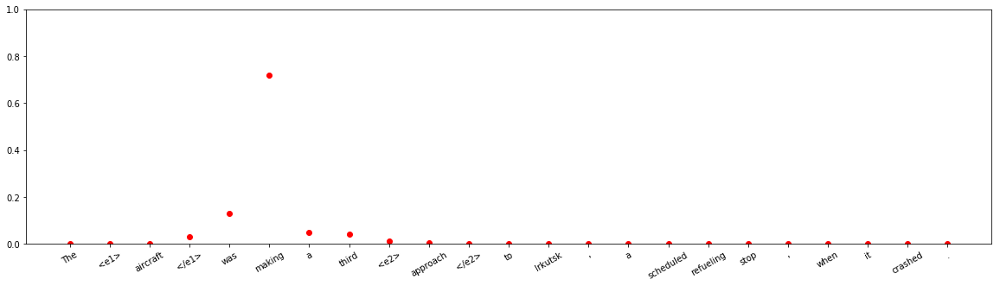






input sentence: But now there came from out the niche a low <e1> laugh </e1> that erected the <e2> hairs </e2> upon my head .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.2440877e-09
Entity-Destination(e1,e2) 	:	 2.6604192e-07
Cause-Effect(e2,e1) 	:	 8.181059e-07
Member-Collection(e2,e1) 	:	 2.2350332e-05
Entity-Origin(e1,e2) 	:	 2.8566327e-10
Message-Topic(e1,e2) 	:	 2.3744576e-08
Component-Whole(e1,e2) 	:	 3.9180744e-05
Component-Whole(e2,e1) 	:	 0.6469431
Instrument-Agency(e2,e1) 	:	 4.0551176e-10
Content-Container(e1,e2) 	:	 8.226208e-11
Product-Producer(e2,e1) 	:	 0.35139185
Cause-Effect(e1,e2) 	:	 0.0015693244
Product-Producer(e1,e2) 	:	 3.2863547e-05
Content-Container(e2,e1) 	:	 1.1745611e-08
Entity-Origin(e2,e1) 	:	 1.3521976e-08
Message-Topic(e2,e1) 	:	 1.5688558e-07
Instrument-Agency(e1,e2) 	:	 2.1781756e-09
Member-Collection(e1,e2) 	:	 1.7879659e-10
Entity-Destination(e2,e1) 	:	 2.2222456e-10



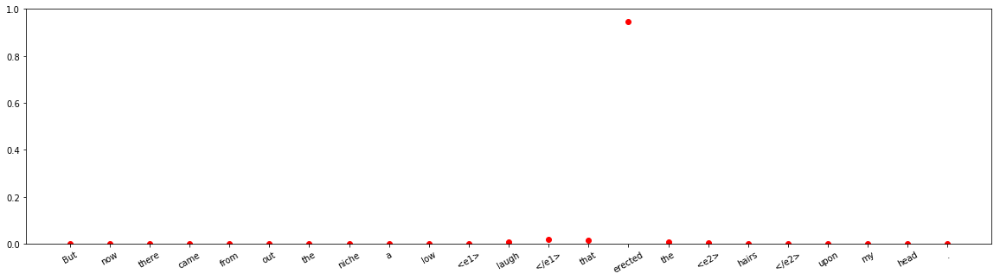




input sentence: Flanking or backing <e1> rudders </e1> are used by <e2> towboats </e2> and other vessels that require a high degree of manoeuvrability .
answer label:    Component-Whole(e1,e2)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 1.9587978e-09
Entity-Destination(e1,e2) 	:	 3.5493889e-16
Cause-Effect(e2,e1) 	:	 1.1555237e-10
Member-Collection(e2,e1) 	:	 7.8387065e-14
Entity-Origin(e1,e2) 	:	 2.3618225e-14
Message-Topic(e1,e2) 	:	 6.678276e-15
Component-Whole(e1,e2) 	:	 0.006688426
Component-Whole(e2,e1) 	:	 4.1163588e-08
Instrument-Agency(e2,e1) 	:	 3.3696954e-10
Content-Container(e1,e2) 	:	 8.143972e-14
Product-Producer(e2,e1) 	:	 4.2422788e-17
Cause-Effect(e1,e2) 	:	 1.0694794e-15
Product-Producer(e1,e2) 	:	 1.5091821e-07
Content-Container(e2,e1) 	:	 3.0393346e-10
Entity-Origin(e2,e1) 	:	 2.86063e-14
Message-Topic(e2,e1) 	:	 7.484762e-16
Instrument-Agency(e1,e2) 	:	 0.9933114
Member-Collection(e1,e2) 	:	 5.7183506e-14
Entity-Destination(e2,e1) 	:	 3.435016e-14



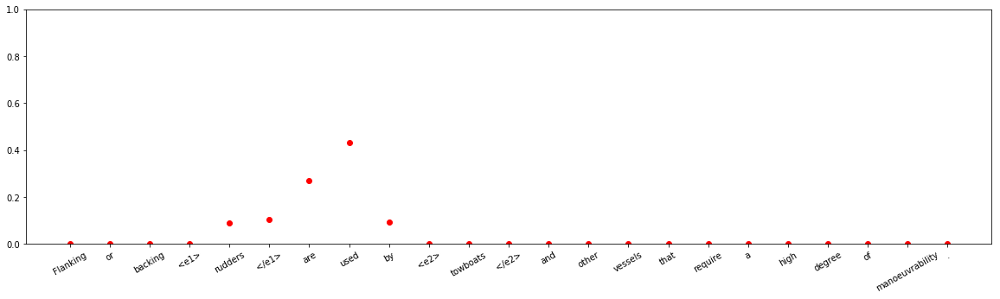


input sentence: This <e1> company </e1> has eluded from state budget fiscal <e2> obligations </e2> ( VAT and profit tax ) totalizing 2.183.351 lei .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 0.32875755
Entity-Destination(e1,e2) 	:	 1.7631162e-06
Cause-Effect(e2,e1) 	:	 0.0026585476
Member-Collection(e2,e1) 	:	 3.84427e-10
Entity-Origin(e1,e2) 	:	 0.6669501
Message-Topic(e1,e2) 	:	 2.934234e-09
Component-Whole(e1,e2) 	:	 8.5416445e-11
Component-Whole(e2,e1) 	:	 1.1462693e-09
Instrument-Agency(e2,e1) 	:	 1.3077994e-05
Content-Container(e1,e2) 	:	 5.471e-08
Product-Producer(e2,e1) 	:	 0.0015892629
Cause-Effect(e1,e2) 	:	 1.8815668e-07
Product-Producer(e1,e2) 	:	 4.4652447e-06
Content-Container(e2,e1) 	:	 1.8646974e-08
Entity-Origin(e2,e1) 	:	 1.8366986e-08
Message-Topic(e2,e1) 	:	 4.8990446e-06
Instrument-Agency(e1,e2) 	:	 4.299353e-07
Member-Collection(e1,e2) 	:	 1.9711923e-05
Entity-Destination(e2,e1) 	:	 3.542465e-11



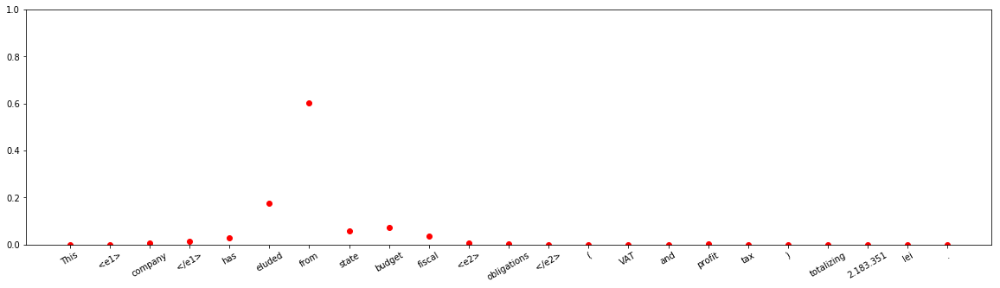






input sentence: The <e1> crisis </e1> originated in an over-leveraged corporate <e2> sector </e2> and a banking sector that had mismatched assets and liabilities .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 2.0056733e-08
Entity-Destination(e1,e2) 	:	 1.2374968e-08
Cause-Effect(e2,e1) 	:	 1.0
Member-Collection(e2,e1) 	:	 1.5239778e-11
Entity-Origin(e1,e2) 	:	 1.021038e-09
Message-Topic(e1,e2) 	:	 1.3532472e-12
Component-Whole(e1,e2) 	:	 1.2677381e-11
Component-Whole(e2,e1) 	:	 5.5623837e-14
Instrument-Agency(e2,e1) 	:	 1.5945558e-14
Content-Container(e1,e2) 	:	 3.6482295e-13
Product-Producer(e2,e1) 	:	 1.0270161e-14
Cause-Effect(e1,e2) 	:	 5.7853247e-09
Product-Producer(e1,e2) 	:	 1.0646337e-09
Content-Container(e2,e1) 	:	 2.0272224e-12
Entity-Origin(e2,e1) 	:	 2.3463245e-11
Message-Topic(e2,e1) 	:	 4.6479276e-10
Instrument-Agency(e1,e2) 	:	 2.0793014e-09
Member-Collection(e1,e2) 	:	 6.5996647e-10
Entity-Destination(e2,e1) 	:	 4.4034343e-13


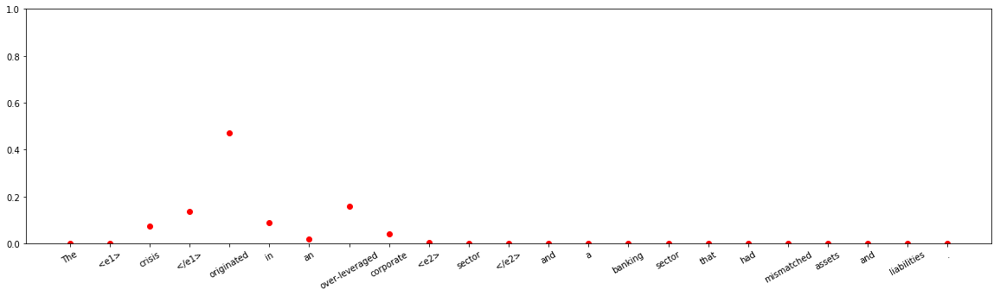




input sentence: Other tree <e1> species </e1> in the Gabonese <e2> forest </e2> are much more liable to burn , particularly Burseraceae such as .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.40294585
Entity-Destination(e1,e2) 	:	 6.411857e-08
Cause-Effect(e2,e1) 	:	 7.875084e-08
Member-Collection(e2,e1) 	:	 1.904505e-05
Entity-Origin(e1,e2) 	:	 1.9786473e-06
Message-Topic(e1,e2) 	:	 3.0103685e-08
Component-Whole(e1,e2) 	:	 0.042484358
Component-Whole(e2,e1) 	:	 4.2605053e-10
Instrument-Agency(e2,e1) 	:	 1.1017773e-11
Content-Container(e1,e2) 	:	 1.4879685e-06
Product-Producer(e2,e1) 	:	 2.0825285e-10
Cause-Effect(e1,e2) 	:	 1.280885e-08
Product-Producer(e1,e2) 	:	 3.3916183e-06
Content-Container(e2,e1) 	:	 7.6936874e-11
Entity-Origin(e2,e1) 	:	 2.4345766e-06
Message-Topic(e2,e1) 	:	 0.040423464
Instrument-Agency(e1,e2) 	:	 1.0188113e-05
Member-Collection(e1,e2) 	:	 0.5141076
Entity-Destination(e2,e1) 	:	 1.0906217e-09



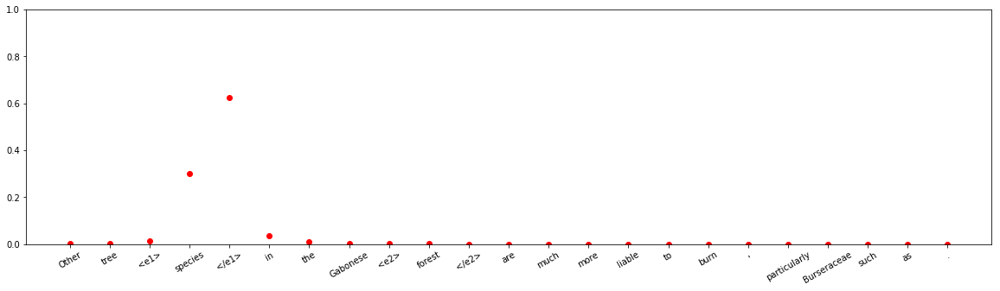


input sentence: My dish is attached to a <e1> pole </e1> that resides in a <e2> receptacle </e2> designed for just such a purpose .
answer label:    Content-Container(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 9.051932e-06
Entity-Destination(e1,e2) 	:	 2.8350553e-07
Cause-Effect(e2,e1) 	:	 2.683061e-12
Member-Collection(e2,e1) 	:	 5.907874e-12
Entity-Origin(e1,e2) 	:	 1.7532046e-06
Message-Topic(e1,e2) 	:	 2.9819011e-15
Component-Whole(e1,e2) 	:	 0.9451258
Component-Whole(e2,e1) 	:	 3.9376988e-07
Instrument-Agency(e2,e1) 	:	 4.975045e-11
Content-Container(e1,e2) 	:	 0.05486088
Product-Producer(e2,e1) 	:	 8.174412e-11
Cause-Effect(e1,e2) 	:	 1.698052e-14
Product-Producer(e1,e2) 	:	 5.8799665e-10
Content-Container(e2,e1) 	:	 4.0560842e-08
Entity-Origin(e2,e1) 	:	 7.830671e-10
Message-Topic(e2,e1) 	:	 9.582295e-12
Instrument-Agency(e1,e2) 	:	 7.474524e-08
Member-Collection(e1,e2) 	:	 1.7600262e-06
Entity-Destination(e2,e1) 	:	 7.609982e-10



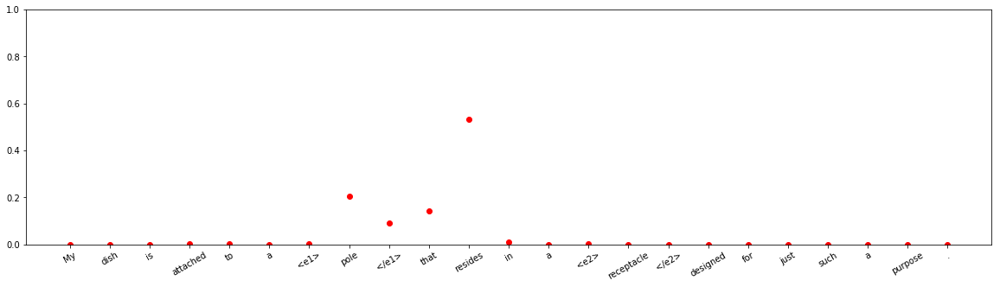
















input sentence: The glass tealight <e1> holder </e1> appears to float inside the metal <e2> spiral </e2> as it spins in the gentle breeze .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.0025253494
Entity-Destination(e1,e2) 	:	 0.00010991593
Cause-Effect(e2,e1) 	:	 1.4336673e-07
Member-Collection(e2,e1) 	:	 3.1044579e-12
Entity-Origin(e1,e2) 	:	 8.47957e-07
Message-Topic(e1,e2) 	:	 6.6031797e-10
Component-Whole(e1,e2) 	:	 0.76786107
Component-Whole(e2,e1) 	:	 0.0008073057
Instrument-Agency(e2,e1) 	:	 2.9996603e-05
Content-Container(e1,e2) 	:	 0.22695915
Product-Producer(e2,e1) 	:	 6.3535754e-07
Cause-Effect(e1,e2) 	:	 2.8535426e-06
Product-Producer(e1,e2) 	:	 4.0773607e-10
Content-Container(e2,e1) 	:	 0.0016337913
Entity-Origin(e2,e1) 	:	 6.9645276e-09
Message-Topic(e2,e1) 	:	 1.1899985e-12
Instrument-Agency(e1,e2) 	:	 6.636524e-05
Member-Collection(e1,e2) 	:	 2.3207147e-06
Entity-Destination(e2,e1) 	:	 2.0773379e-07



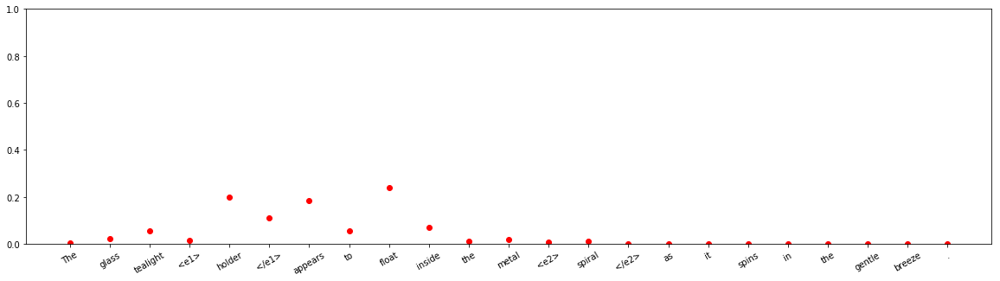


input sentence: A <e1> crypt </e1> of the XI century dug a posteriori under the <e2> choir </e2> also preserves frescos of the time .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.5978167e-06
Entity-Destination(e1,e2) 	:	 1.8364284e-05
Cause-Effect(e2,e1) 	:	 1.0752573e-08
Member-Collection(e2,e1) 	:	 0.02916072
Entity-Origin(e1,e2) 	:	 0.0023818552
Message-Topic(e1,e2) 	:	 0.0005612773
Component-Whole(e1,e2) 	:	 0.14343823
Component-Whole(e2,e1) 	:	 2.6206013e-09
Instrument-Agency(e2,e1) 	:	 7.916855e-10
Content-Container(e1,e2) 	:	 1.0826691e-06
Product-Producer(e2,e1) 	:	 1.6724382e-05
Cause-Effect(e1,e2) 	:	 4.521382e-09
Product-Producer(e1,e2) 	:	 0.82043636
Content-Container(e2,e1) 	:	 0.00023090863
Entity-Origin(e2,e1) 	:	 6.5477e-06
Message-Topic(e2,e1) 	:	 0.0023166023
Instrument-Agency(e1,e2) 	:	 4.9815677e-05
Member-Collection(e1,e2) 	:	 0.0013798753
Entity-Destination(e2,e1) 	:	 8.7499416e-08



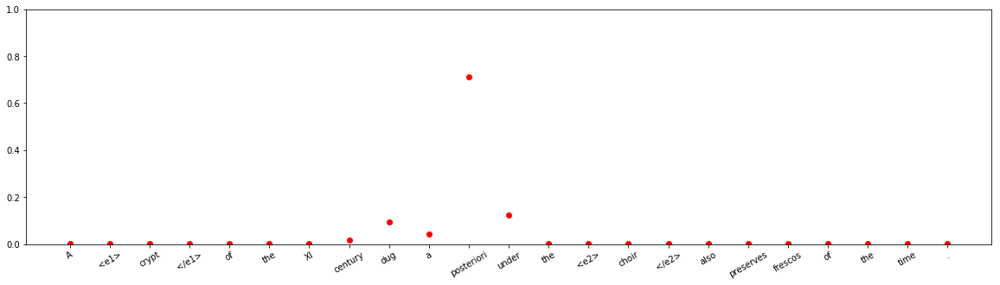


input sentence: I dunno , I 'm kinda leaning towards some props for the <e1> person </e1> that came up with <e2> brakes </e2> .
answer label:    Product-Producer(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 3.847932e-08
Entity-Destination(e1,e2) 	:	 1.2327933e-10
Cause-Effect(e2,e1) 	:	 6.0871434e-06
Member-Collection(e2,e1) 	:	 1.3212396e-07
Entity-Origin(e1,e2) 	:	 4.4304699e-07
Message-Topic(e1,e2) 	:	 8.7940405e-11
Component-Whole(e1,e2) 	:	 2.8428962e-10
Component-Whole(e2,e1) 	:	 0.9344148
Instrument-Agency(e2,e1) 	:	 0.065378435
Content-Container(e1,e2) 	:	 1.779383e-05
Product-Producer(e2,e1) 	:	 0.000103489576
Cause-Effect(e1,e2) 	:	 7.3615505e-05
Product-Producer(e1,e2) 	:	 1.9706343e-09
Content-Container(e2,e1) 	:	 4.5453803e-06
Entity-Origin(e2,e1) 	:	 3.7317437e-11
Message-Topic(e2,e1) 	:	 4.2929544e-09
Instrument-Agency(e1,e2) 	:	 6.124991e-07
Member-Collection(e1,e2) 	:	 2.7529931e-13
Entity-Destination(e2,e1) 	:	 1.57117e-11



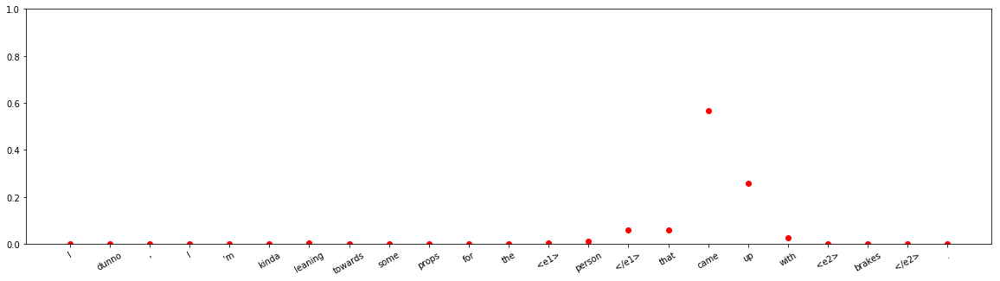






input sentence: The <e1> man </e1> completed a full <e2> lap </e2> before being stopped by guards , but he never interfered with Shorter .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 2.190989e-07
Entity-Destination(e1,e2) 	:	 1.1782573e-09
Cause-Effect(e2,e1) 	:	 8.937204e-12
Member-Collection(e2,e1) 	:	 7.513203e-12
Entity-Origin(e1,e2) 	:	 2.3787144e-10
Message-Topic(e1,e2) 	:	 4.1172734e-15
Component-Whole(e1,e2) 	:	 4.4432682e-14
Component-Whole(e2,e1) 	:	 1.1513924e-05
Instrument-Agency(e2,e1) 	:	 9.174016e-05
Content-Container(e1,e2) 	:	 8.5603254e-11
Product-Producer(e2,e1) 	:	 0.9998965
Cause-Effect(e1,e2) 	:	 3.8162216e-09
Product-Producer(e1,e2) 	:	 5.519869e-12
Content-Container(e2,e1) 	:	 1.6040336e-09
Entity-Origin(e2,e1) 	:	 2.8576052e-14
Message-Topic(e2,e1) 	:	 4.9593094e-11
Instrument-Agency(e1,e2) 	:	 9.959338e-12
Member-Collection(e1,e2) 	:	 3.6050455e-12
Entity-Destination(e2,e1) 	:	 4.332896e-14



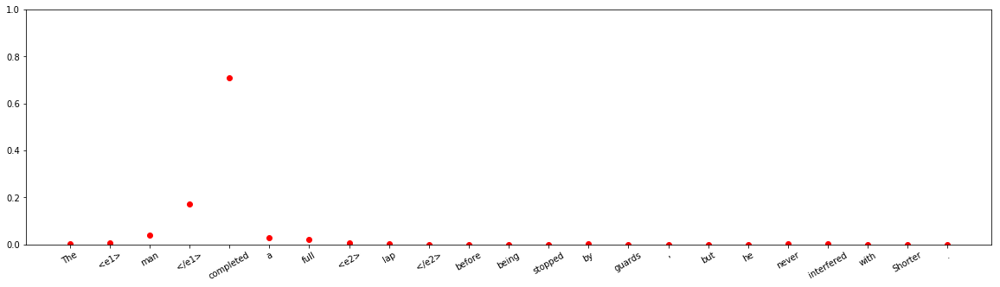


input sentence: More particularly , the invention is a sealless <e1> pump </e1> that employs a magnetic <e2> coupling </e2> to drive the impeller .
answer label:    Component-Whole(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 9.498245e-09
Entity-Destination(e1,e2) 	:	 8.255737e-11
Cause-Effect(e2,e1) 	:	 1.2174972e-09
Member-Collection(e2,e1) 	:	 3.7826133e-08
Entity-Origin(e1,e2) 	:	 2.1522315e-07
Message-Topic(e1,e2) 	:	 2.5547073e-09
Component-Whole(e1,e2) 	:	 2.4953943e-07
Component-Whole(e2,e1) 	:	 0.044357646
Instrument-Agency(e2,e1) 	:	 0.9537606
Content-Container(e1,e2) 	:	 2.1264493e-07
Product-Producer(e2,e1) 	:	 0.00020227497
Cause-Effect(e1,e2) 	:	 5.010638e-06
Product-Producer(e1,e2) 	:	 8.884976e-08
Content-Container(e2,e1) 	:	 6.434743e-06
Entity-Origin(e2,e1) 	:	 1.0870129e-10
Message-Topic(e2,e1) 	:	 7.9388357e-13
Instrument-Agency(e1,e2) 	:	 0.0016671683
Member-Collection(e1,e2) 	:	 7.164631e-10
Entity-Destination(e2,e1) 	:	 2.3065292e-09



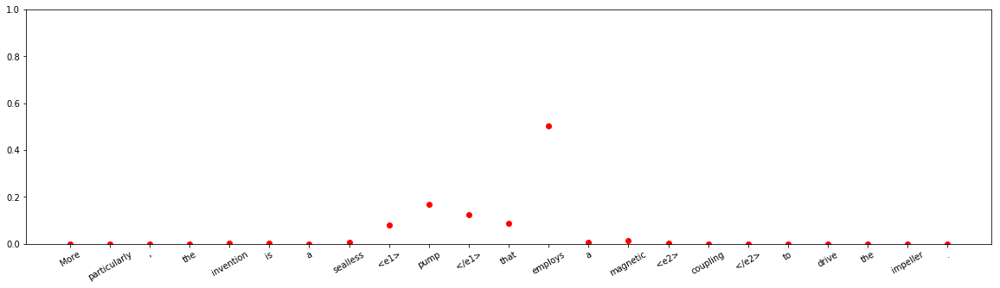









input sentence: This <e1> plan </e1> is the result of a focused analysis of <e2> crime </e2> and disorder over the last three years .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 7.4018935e-06
Entity-Destination(e1,e2) 	:	 2.0702534e-13
Cause-Effect(e2,e1) 	:	 4.3973408e-08
Member-Collection(e2,e1) 	:	 1.11488255e-07
Entity-Origin(e1,e2) 	:	 2.4117553e-12
Message-Topic(e1,e2) 	:	 0.9999784
Component-Whole(e1,e2) 	:	 1.917049e-07
Component-Whole(e2,e1) 	:	 2.0113967e-07
Instrument-Agency(e2,e1) 	:	 2.5248312e-10
Content-Container(e1,e2) 	:	 5.319841e-11
Product-Producer(e2,e1) 	:	 2.2929007e-12
Cause-Effect(e1,e2) 	:	 6.206091e-06
Product-Producer(e1,e2) 	:	 5.3251967e-09
Content-Container(e2,e1) 	:	 4.9024307e-10
Entity-Origin(e2,e1) 	:	 4.7500315e-10
Message-Topic(e2,e1) 	:	 7.302652e-06
Instrument-Agency(e1,e2) 	:	 6.3236016e-08
Member-Collection(e1,e2) 	:	 8.4803805e-12
Entity-Destination(e2,e1) 	:	 4.246963e-12



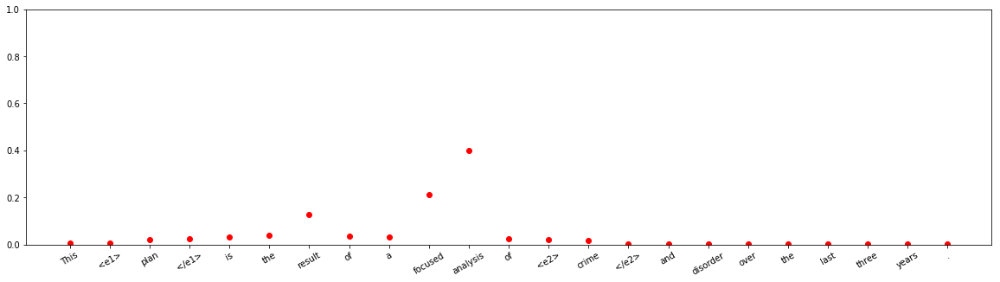






input sentence: With the help of its diaspora , China has won the race to be the <e1> world </e1> 's <e2> factory </e2> .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 3.0760223e-12
Entity-Destination(e1,e2) 	:	 3.6278134e-09
Cause-Effect(e2,e1) 	:	 7.735561e-10
Member-Collection(e2,e1) 	:	 2.1638797e-09
Entity-Origin(e1,e2) 	:	 8.336539e-07
Message-Topic(e1,e2) 	:	 7.4201306e-13
Component-Whole(e1,e2) 	:	 2.9578322e-08
Component-Whole(e2,e1) 	:	 3.9967194e-09
Instrument-Agency(e2,e1) 	:	 8.047243e-13
Content-Container(e1,e2) 	:	 6.0264e-11
Product-Producer(e2,e1) 	:	 8.2333753e-07
Cause-Effect(e1,e2) 	:	 3.3491532e-11
Product-Producer(e1,e2) 	:	 0.99997854
Content-Container(e2,e1) 	:	 9.295811e-12
Entity-Origin(e2,e1) 	:	 9.8481764e-11
Message-Topic(e2,e1) 	:	 3.1842903e-11
Instrument-Agency(e1,e2) 	:	 1.9130111e-05
Member-Collection(e1,e2) 	:	 7.420649e-07
Entity-Destination(e2,e1) 	:	 3.8889885e-13



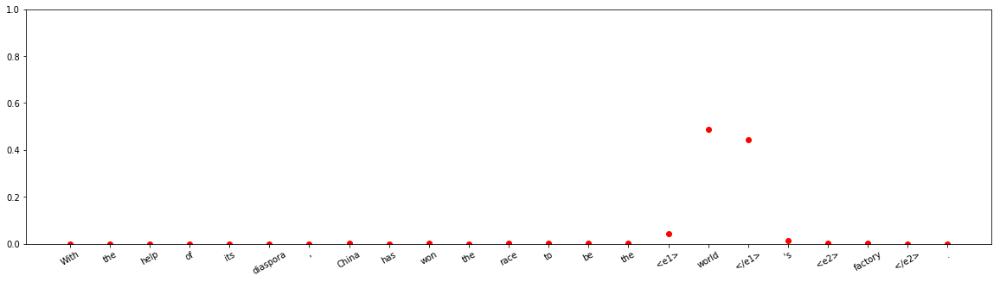











input sentence: I just looked at how people in fact protected even the <e1> thugs </e1> from mob <e2> behaviour </e2> today in Tehran .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 7.49002e-06
Entity-Destination(e1,e2) 	:	 1.0266803e-10
Cause-Effect(e2,e1) 	:	 0.0014269504
Member-Collection(e2,e1) 	:	 2.9897315e-05
Entity-Origin(e1,e2) 	:	 0.9917818
Message-Topic(e1,e2) 	:	 2.2928564e-08
Component-Whole(e1,e2) 	:	 1.4684535e-07
Component-Whole(e2,e1) 	:	 1.5068945e-10
Instrument-Agency(e2,e1) 	:	 7.159965e-07
Content-Container(e1,e2) 	:	 1.5320057e-07
Product-Producer(e2,e1) 	:	 1.4045977e-06
Cause-Effect(e1,e2) 	:	 2.0005717e-07
Product-Producer(e1,e2) 	:	 4.3073915e-06
Content-Container(e2,e1) 	:	 2.9603973e-09
Entity-Origin(e2,e1) 	:	 1.6686295e-06
Message-Topic(e2,e1) 	:	 6.826469e-08
Instrument-Agency(e1,e2) 	:	 1.175025e-05
Member-Collection(e1,e2) 	:	 0.0067335716
Entity-Destination(e2,e1) 	:	 2.414956e-10



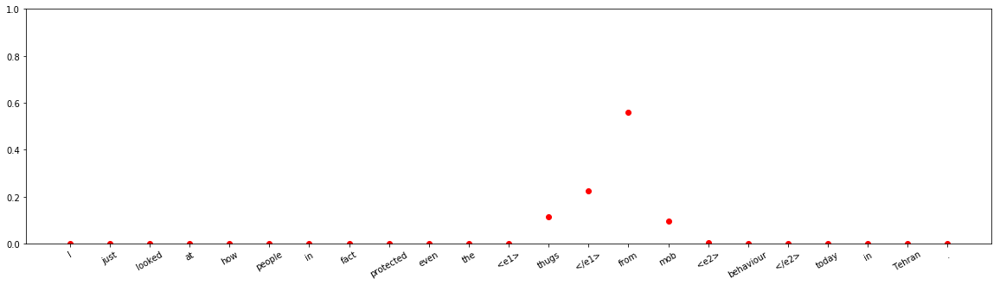







input sentence: Okay , after a <e1> discussion </e1> with my <e2> husband </e2> we have decided to work on the emergency fund first .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.4997992e-06
Entity-Destination(e1,e2) 	:	 1.5399221e-06
Cause-Effect(e2,e1) 	:	 5.1868456e-09
Member-Collection(e2,e1) 	:	 6.650187e-05
Entity-Origin(e1,e2) 	:	 1.9137491e-05
Message-Topic(e1,e2) 	:	 0.63266367
Component-Whole(e1,e2) 	:	 0.00010319831
Component-Whole(e2,e1) 	:	 0.008843299
Instrument-Agency(e2,e1) 	:	 0.0052756546
Content-Container(e1,e2) 	:	 1.2986584e-05
Product-Producer(e2,e1) 	:	 7.867219e-06
Cause-Effect(e1,e2) 	:	 6.180532e-11
Product-Producer(e1,e2) 	:	 0.35122952
Content-Container(e2,e1) 	:	 4.676849e-05
Entity-Origin(e2,e1) 	:	 2.9710864e-10
Message-Topic(e2,e1) 	:	 8.325682e-05
Instrument-Agency(e1,e2) 	:	 0.001644957
Member-Collection(e1,e2) 	:	 1.287476e-07
Entity-Destination(e2,e1) 	:	 2.4745848e-09



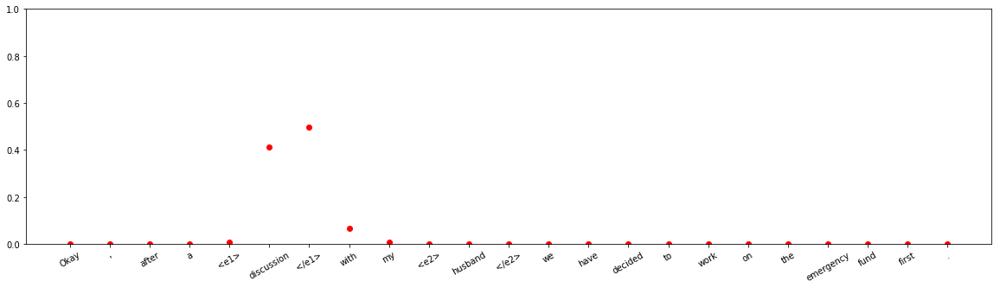



input sentence: A few days before the service , Tom Burris had thrown into Karen 's <e1> casket </e1> his wedding <e2> ring </e2> .
answer label:    Entity-Destination(e2,e1)
wrong label:    Other
Other 	:	 0.99999464
Entity-Destination(e1,e2) 	:	 9.059094e-13
Cause-Effect(e2,e1) 	:	 2.6458677e-13
Member-Collection(e2,e1) 	:	 3.582591e-13
Entity-Origin(e1,e2) 	:	 7.502483e-12
Message-Topic(e1,e2) 	:	 5.817903e-13
Component-Whole(e1,e2) 	:	 1.7669072e-09
Component-Whole(e2,e1) 	:	 3.174059e-10
Instrument-Agency(e2,e1) 	:	 4.819084e-07
Content-Container(e1,e2) 	:	 3.8297894e-06
Product-Producer(e2,e1) 	:	 1.8953867e-09
Cause-Effect(e1,e2) 	:	 3.147756e-13
Product-Producer(e1,e2) 	:	 6.833997e-11
Content-Container(e2,e1) 	:	 1.1322078e-06
Entity-Origin(e2,e1) 	:	 9.117869e-11
Message-Topic(e2,e1) 	:	 3.4815114e-13
Instrument-Agency(e1,e2) 	:	 6.65057e-09
Member-Collection(e1,e2) 	:	 4.9453406e-12
Entity-Destination(e2,e1) 	:	 1.0468502e-12



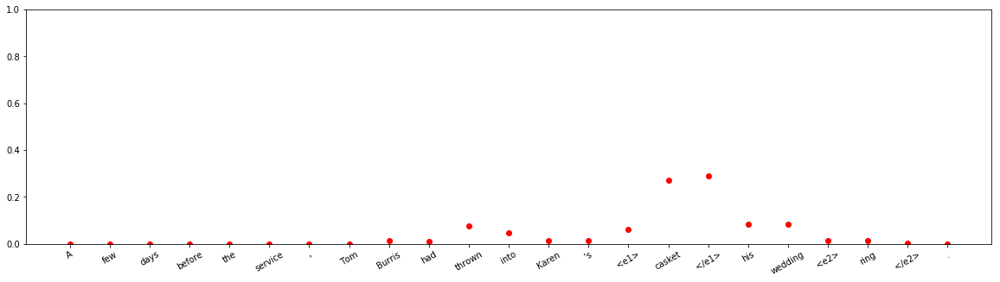


input sentence: Those early <e1> studies </e1> were directed toward examining the spring <e2> vegetation </e2> green-up and subsequent summer and fall dry-down .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 0.22313903
Entity-Destination(e1,e2) 	:	 2.8836877e-10
Cause-Effect(e2,e1) 	:	 8.672276e-09
Member-Collection(e2,e1) 	:	 1.0958431e-09
Entity-Origin(e1,e2) 	:	 1.5676282e-09
Message-Topic(e1,e2) 	:	 0.77680445
Component-Whole(e1,e2) 	:	 5.2672764e-05
Component-Whole(e2,e1) 	:	 3.8160658e-07
Instrument-Agency(e2,e1) 	:	 2.325015e-10
Content-Container(e1,e2) 	:	 5.5215e-11
Product-Producer(e2,e1) 	:	 3.403352e-11
Cause-Effect(e1,e2) 	:	 2.6362727e-07
Product-Producer(e1,e2) 	:	 2.030916e-08
Content-Container(e2,e1) 	:	 1.212351e-10
Entity-Origin(e2,e1) 	:	 1.0504684e-09
Message-Topic(e2,e1) 	:	 3.1649438e-06
Instrument-Agency(e1,e2) 	:	 3.4157654e-08
Member-Collection(e1,e2) 	:	 1.648655e-09
Entity-Destination(e2,e1) 	:	 3.5294773e-10



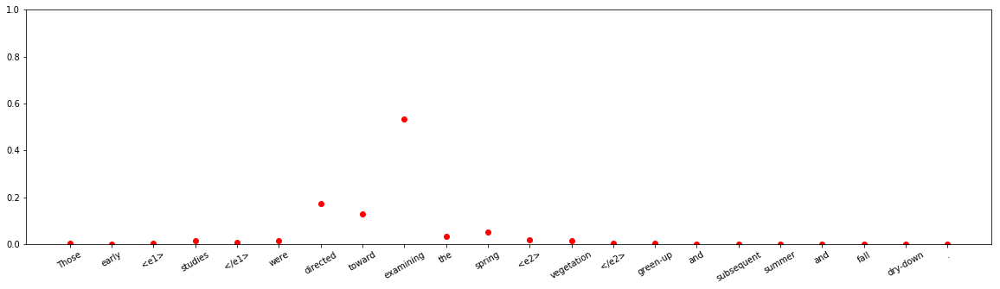









input sentence: A congressman from the state of Texas , presented a <e1> bill </e1> regulating interstate <e2> commerce </e2> carried on railways .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.66555744
Entity-Destination(e1,e2) 	:	 6.188292e-08
Cause-Effect(e2,e1) 	:	 5.7523124e-08
Member-Collection(e2,e1) 	:	 0.00011484575
Entity-Origin(e1,e2) 	:	 2.9584553e-09
Message-Topic(e1,e2) 	:	 0.33095428
Component-Whole(e1,e2) 	:	 4.1087037e-06
Component-Whole(e2,e1) 	:	 6.4791453e-07
Instrument-Agency(e2,e1) 	:	 1.2499716e-07
Content-Container(e1,e2) 	:	 4.1606613e-06
Product-Producer(e2,e1) 	:	 4.2022634e-07
Cause-Effect(e1,e2) 	:	 3.9919314e-06
Product-Producer(e1,e2) 	:	 1.2821026e-06
Content-Container(e2,e1) 	:	 5.8722653e-06
Entity-Origin(e2,e1) 	:	 0.0004473771
Message-Topic(e2,e1) 	:	 0.0026317807
Instrument-Agency(e1,e2) 	:	 0.0002727567
Member-Collection(e1,e2) 	:	 5.3157316e-07
Entity-Destination(e2,e1) 	:	 1.6937616e-07



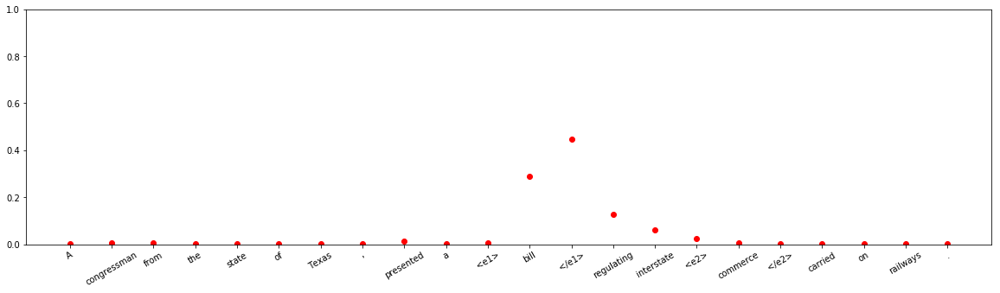



input sentence: My second question is regarding the sale of bones and <e1> hide </e1> of <e2> tigers </e2> going on in Delhi .
answer label:    Component-Whole(e1,e2)
wrong label:    Member-Collection(e2,e1)
Other 	:	 3.696188e-11
Entity-Destination(e1,e2) 	:	 2.1359574e-14
Cause-Effect(e2,e1) 	:	 1.01914595e-10
Member-Collection(e2,e1) 	:	 0.9998431
Entity-Origin(e1,e2) 	:	 2.4714944e-11
Message-Topic(e1,e2) 	:	 5.7619187e-10
Component-Whole(e1,e2) 	:	 0.00015164117
Component-Whole(e2,e1) 	:	 6.6899783e-09
Instrument-Agency(e2,e1) 	:	 1.0675888e-11
Content-Container(e1,e2) 	:	 6.4082056e-12
Product-Producer(e2,e1) 	:	 2.9813536e-09
Cause-Effect(e1,e2) 	:	 4.8690896e-10
Product-Producer(e1,e2) 	:	 4.3283826e-08
Content-Container(e2,e1) 	:	 3.4087633e-09
Entity-Origin(e2,e1) 	:	 5.1552878e-09
Message-Topic(e2,e1) 	:	 4.4126917e-08
Instrument-Agency(e1,e2) 	:	 4.9030823e-06
Member-Collection(e1,e2) 	:	 3.7918355e-07
Entity-Destination(e2,e1) 	:	 7.075289e-13



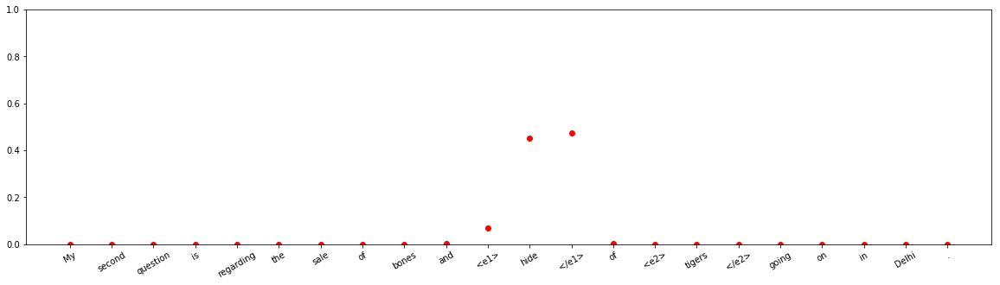




input sentence: The <e1> metro line </e1> begins at an underground <e2> station </e2> in St. Stephen 's Green in the city centre .
answer label:    Component-Whole(e2,e1)
wrong label:    Other
Other 	:	 0.99997747
Entity-Destination(e1,e2) 	:	 3.2078357e-11
Cause-Effect(e2,e1) 	:	 2.5495137e-10
Member-Collection(e2,e1) 	:	 8.613557e-12
Entity-Origin(e1,e2) 	:	 3.0229287e-06
Message-Topic(e1,e2) 	:	 7.243513e-12
Component-Whole(e1,e2) 	:	 1.909282e-05
Component-Whole(e2,e1) 	:	 1.1303591e-07
Instrument-Agency(e2,e1) 	:	 1.5937994e-10
Content-Container(e1,e2) 	:	 4.5004382e-09
Product-Producer(e2,e1) 	:	 5.638591e-10
Cause-Effect(e1,e2) 	:	 3.5054858e-13
Product-Producer(e1,e2) 	:	 1.7273764e-07
Content-Container(e2,e1) 	:	 5.2702703e-10
Entity-Origin(e2,e1) 	:	 5.7304783e-10
Message-Topic(e2,e1) 	:	 3.410862e-08
Instrument-Agency(e1,e2) 	:	 2.3655603e-07
Member-Collection(e1,e2) 	:	 1.672004e-08
Entity-Destination(e2,e1) 	:	 6.819944e-12



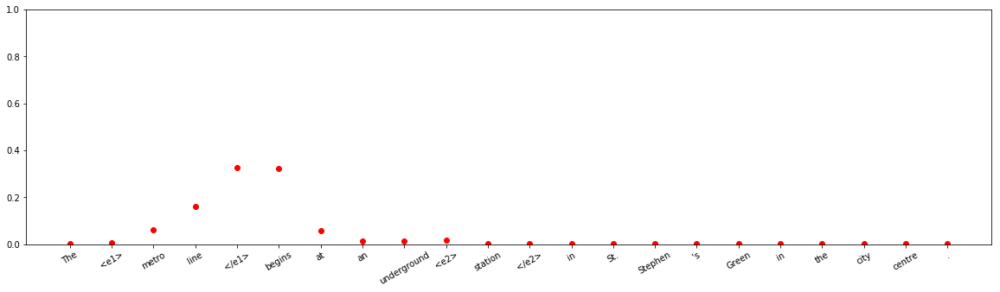













input sentence: There 's a comparison between the intimacy and accountability offered by a novel and that offered by a blog in which the <e1> blogger </e1> is participant in an on going <e2> conversation </e2> , in which the line between reader and original poster is blurred beyond recognition , in which collective comment replaces old-fashioned ivory tower editing with a kind of universal peer review .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 0.026123004
Entity-Destination(e1,e2) 	:	 1.2953615e-07
Cause-Effect(e2,e1) 	:	 3.379086e-09
Member-Collection(e2,e1) 	:	 8.210321e-09
Entity-Origin(e1,e2) 	:	 0.0002110065
Message-Topic(e1,e2) 	:	 5.5514517e-09
Component-Whole(e1,e2) 	:	 1.4564597e-07
Component-Whole(e2,e1) 	:	 5.126987e-11
Instrument-Agency(e2,e1) 	:	 0.0005300154
Content-Container(e1,e2) 	:	 1.2965887e-05
Product-Producer(e2,e1) 	:	 0.22281046
Cause-Effect(e1,e2) 	:	 2.854521e-09
Product-Producer(e1,e2) 	:	 4.0707132e-08
Content-Contain

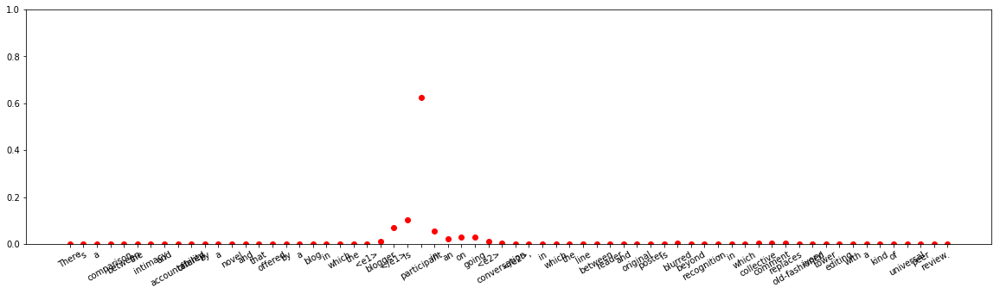







input sentence: This forum is dedicated to the late Lou Alessi , a devoted <e1> leather </e1> <e2> craftsman </e2> and an all around gentleman .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.9790464e-11
Entity-Destination(e1,e2) 	:	 9.014e-13
Cause-Effect(e2,e1) 	:	 2.8378812e-12
Member-Collection(e2,e1) 	:	 2.78116e-07
Entity-Origin(e1,e2) 	:	 4.4321732e-10
Message-Topic(e1,e2) 	:	 6.4780687e-09
Component-Whole(e1,e2) 	:	 8.508019e-09
Component-Whole(e2,e1) 	:	 1.7089711e-09
Instrument-Agency(e2,e1) 	:	 2.0809908e-13
Content-Container(e1,e2) 	:	 3.575447e-10
Product-Producer(e2,e1) 	:	 1.1015877e-10
Cause-Effect(e1,e2) 	:	 5.130454e-12
Product-Producer(e1,e2) 	:	 0.9749845
Content-Container(e2,e1) 	:	 3.5500033e-11
Entity-Origin(e2,e1) 	:	 4.964312e-09
Message-Topic(e2,e1) 	:	 1.41022315e-11
Instrument-Agency(e1,e2) 	:	 0.025014454
Member-Collection(e1,e2) 	:	 6.7136085e-07
Entity-Destination(e2,e1) 	:	 2.0041085e-12



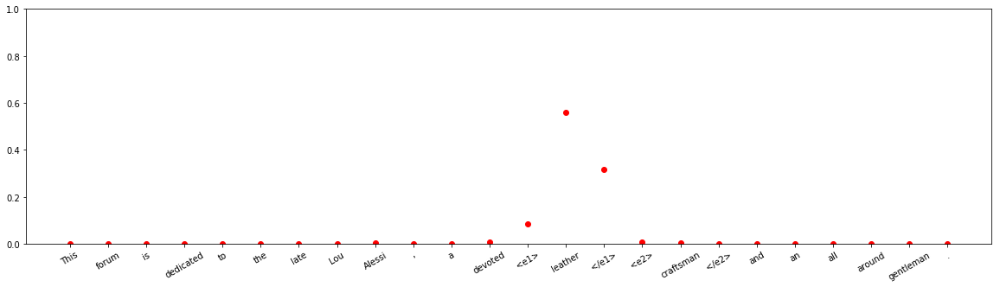






input sentence: The McCain <e1> team </e1> has hastily assembled a <e2> team </e2> of former Bush White House aides to tutor the vice-presidential candidate .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 4.2260217e-06
Entity-Destination(e1,e2) 	:	 8.035702e-06
Cause-Effect(e2,e1) 	:	 2.7043878e-10
Member-Collection(e2,e1) 	:	 0.021644766
Entity-Origin(e1,e2) 	:	 3.3521346e-06
Message-Topic(e1,e2) 	:	 4.9398783e-09
Component-Whole(e1,e2) 	:	 1.1380182e-10
Component-Whole(e2,e1) 	:	 3.14121e-10
Instrument-Agency(e2,e1) 	:	 3.1968295e-10
Content-Container(e1,e2) 	:	 2.7151742e-10
Product-Producer(e2,e1) 	:	 0.9739866
Cause-Effect(e1,e2) 	:	 7.557415e-08
Product-Producer(e1,e2) 	:	 0.00022287079
Content-Container(e2,e1) 	:	 2.0650731e-07
Entity-Origin(e2,e1) 	:	 1.3779493e-08
Message-Topic(e2,e1) 	:	 5.472512e-07
Instrument-Agency(e1,e2) 	:	 7.987663e-07
Member-Collection(e1,e2) 	:	 0.0041283905
Entity-Destination(e2,e1) 	:	 1.77194e-11



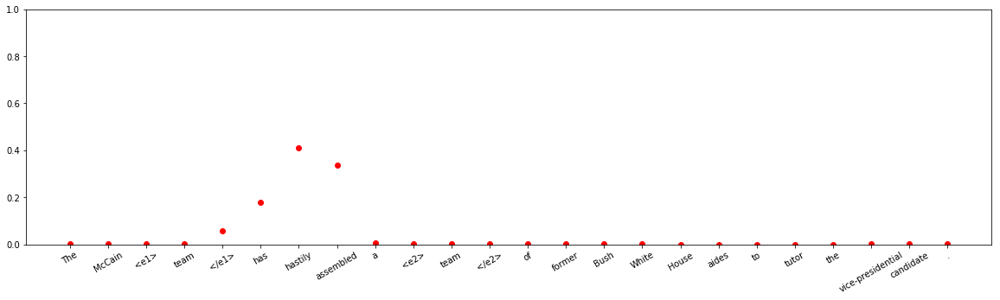



input sentence: An academic <e1> book </e1> has been reviewed by a fiction <e2> writer </e2> , who complained the book is `` academic '' .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 2.4880682e-15
Entity-Destination(e1,e2) 	:	 4.2487334e-15
Cause-Effect(e2,e1) 	:	 2.1135123e-13
Member-Collection(e2,e1) 	:	 2.1988088e-12
Entity-Origin(e1,e2) 	:	 3.776935e-11
Message-Topic(e1,e2) 	:	 5.8019744e-14
Component-Whole(e1,e2) 	:	 3.9642927e-14
Component-Whole(e2,e1) 	:	 7.846347e-13
Instrument-Agency(e2,e1) 	:	 3.5134463e-19
Content-Container(e1,e2) 	:	 2.1698066e-17
Product-Producer(e2,e1) 	:	 2.7851453e-14
Cause-Effect(e1,e2) 	:	 1.7326342e-18
Product-Producer(e1,e2) 	:	 1.0
Content-Container(e2,e1) 	:	 5.002578e-18
Entity-Origin(e2,e1) 	:	 1.8194251e-18
Message-Topic(e2,e1) 	:	 1.1104503e-10
Instrument-Agency(e1,e2) 	:	 4.6747245e-10
Member-Collection(e1,e2) 	:	 5.422953e-13
Entity-Destination(e2,e1) 	:	 1.305743e-17



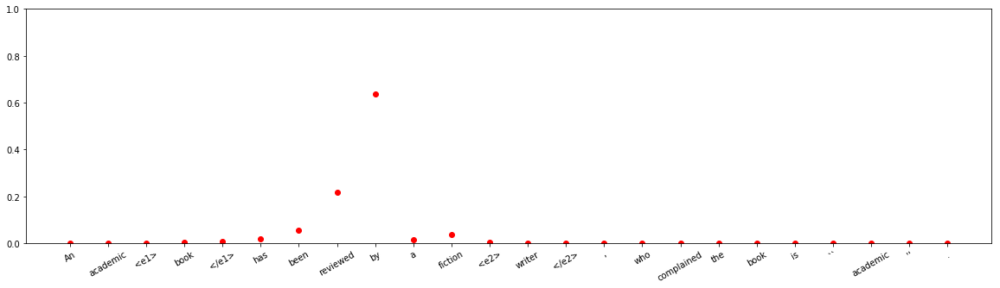







input sentence: The produced <e1> signal </e1> sensitively departs from an ideal <e2> sine </e2> as the input angle approaches the extremes of the range .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 0.29916772
Entity-Destination(e1,e2) 	:	 9.025186e-09
Cause-Effect(e2,e1) 	:	 0.69972825
Member-Collection(e2,e1) 	:	 1.3262798e-10
Entity-Origin(e1,e2) 	:	 0.00017125849
Message-Topic(e1,e2) 	:	 1.3465075e-07
Component-Whole(e1,e2) 	:	 1.02516736e-07
Component-Whole(e2,e1) 	:	 1.1847312e-05
Instrument-Agency(e2,e1) 	:	 1.7094974e-06
Content-Container(e1,e2) 	:	 1.4363342e-09
Product-Producer(e2,e1) 	:	 1.6217903e-10
Cause-Effect(e1,e2) 	:	 9.9038886e-08
Product-Producer(e1,e2) 	:	 2.6835687e-07
Content-Container(e2,e1) 	:	 1.1225041e-12
Entity-Origin(e2,e1) 	:	 4.167536e-10
Message-Topic(e2,e1) 	:	 0.0009144026
Instrument-Agency(e1,e2) 	:	 3.315259e-06
Member-Collection(e1,e2) 	:	 9.798532e-07
Entity-Destination(e2,e1) 	:	 1.4914836e-10



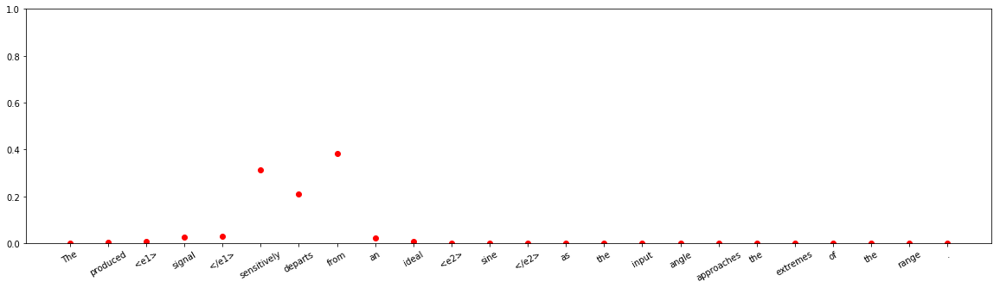



input sentence: A bundle of sensitive <e1> files </e1> linked to a massive police drugs <e2> bust </e2> have been found dumped in a skip .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 8.2011087e-10
Entity-Destination(e1,e2) 	:	 0.9966408
Cause-Effect(e2,e1) 	:	 2.1473773e-12
Member-Collection(e2,e1) 	:	 2.739468e-09
Entity-Origin(e1,e2) 	:	 2.5171867e-06
Message-Topic(e1,e2) 	:	 0.00064021884
Component-Whole(e1,e2) 	:	 9.031425e-07
Component-Whole(e2,e1) 	:	 1.539904e-08
Instrument-Agency(e2,e1) 	:	 9.962097e-06
Content-Container(e1,e2) 	:	 0.002443919
Product-Producer(e2,e1) 	:	 0.0002446867
Cause-Effect(e1,e2) 	:	 5.358889e-07
Product-Producer(e1,e2) 	:	 8.031758e-09
Content-Container(e2,e1) 	:	 1.5415508e-05
Entity-Origin(e2,e1) 	:	 2.2218861e-08
Message-Topic(e2,e1) 	:	 5.9518026e-09
Instrument-Agency(e1,e2) 	:	 1.5182142e-07
Member-Collection(e1,e2) 	:	 8.2164024e-07
Entity-Destination(e2,e1) 	:	 3.1694952e-10



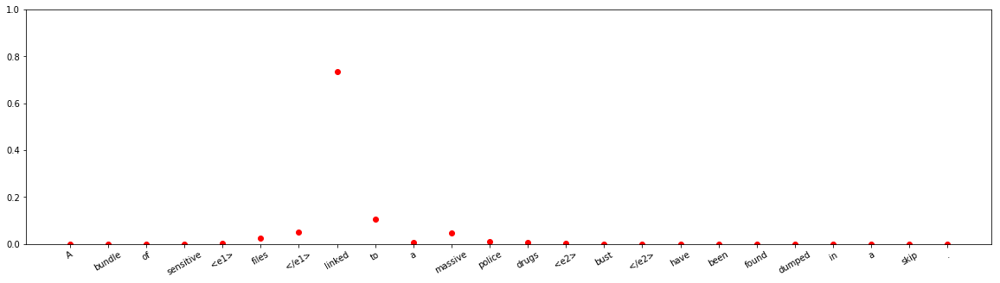



input sentence: I came here with a <e1> fistful </e1> of <e2> expectations </e2> only to have them scattered by the brutal wind of Chinggis .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.20184438
Entity-Destination(e1,e2) 	:	 8.0396845e-10
Cause-Effect(e2,e1) 	:	 1.2352442e-06
Member-Collection(e2,e1) 	:	 0.6968105
Entity-Origin(e1,e2) 	:	 4.878338e-08
Message-Topic(e1,e2) 	:	 5.1955383e-05
Component-Whole(e1,e2) 	:	 0.0042899554
Component-Whole(e2,e1) 	:	 0.0068830494
Instrument-Agency(e2,e1) 	:	 0.00041887703
Content-Container(e1,e2) 	:	 0.00022651211
Product-Producer(e2,e1) 	:	 5.394679e-07
Cause-Effect(e1,e2) 	:	 0.00014655787
Product-Producer(e1,e2) 	:	 4.0690862e-05
Content-Container(e2,e1) 	:	 0.0015847305
Entity-Origin(e2,e1) 	:	 3.331569e-07
Message-Topic(e2,e1) 	:	 2.0808321e-07
Instrument-Agency(e1,e2) 	:	 0.08768259
Member-Collection(e1,e2) 	:	 1.7841126e-05
Entity-Destination(e2,e1) 	:	 1.8502211e-08



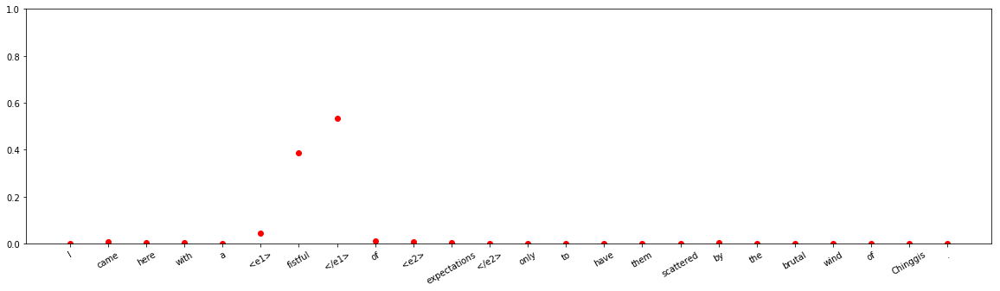


input sentence: Already by the middle of the eighteenth century , several small clockmaking <e1> shops </e1> produced cuckoo <e2> clocks </e2> with wooden gears .
answer label:    Product-Producer(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 9.814877e-07
Entity-Destination(e1,e2) 	:	 5.5429993e-13
Cause-Effect(e2,e1) 	:	 5.1743587e-08
Member-Collection(e2,e1) 	:	 1.05360606e-07
Entity-Origin(e1,e2) 	:	 2.1382524e-05
Message-Topic(e1,e2) 	:	 1.6919995e-10
Component-Whole(e1,e2) 	:	 3.3271926e-06
Component-Whole(e2,e1) 	:	 0.9870148
Instrument-Agency(e2,e1) 	:	 8.143806e-09
Content-Container(e1,e2) 	:	 2.8585691e-06
Product-Producer(e2,e1) 	:	 0.008190166
Cause-Effect(e1,e2) 	:	 0.0010689514
Product-Producer(e1,e2) 	:	 0.0036964407
Content-Container(e2,e1) 	:	 1.0036976e-09
Entity-Origin(e2,e1) 	:	 3.5720255e-08
Message-Topic(e2,e1) 	:	 1.11571055e-07
Instrument-Agency(e1,e2) 	:	 7.664763e-07
Member-Collection(e1,e2) 	:	 5.360382e-09
Entity-Destination(e2,e1) 	:	 6.0330235e-1

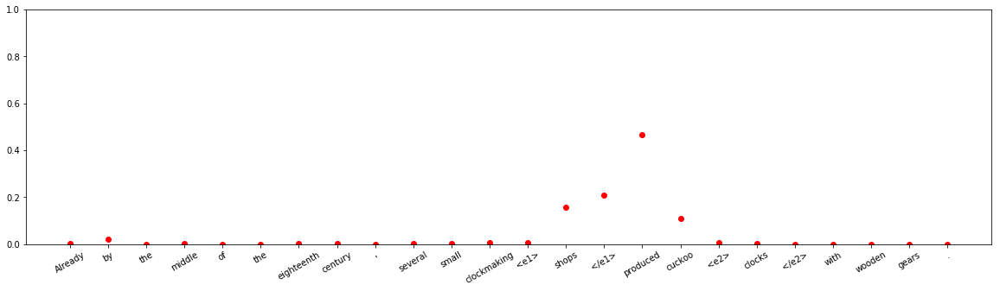


input sentence: The synthesist is thus carrying out a role which is analogous to that of a <e1> player </e1> in an <e2> orchestra </e2> .
answer label:    Member-Collection(e1,e2)
wrong label:    Other
Other 	:	 0.9982597
Entity-Destination(e1,e2) 	:	 7.279091e-11
Cause-Effect(e2,e1) 	:	 3.3764963e-11
Member-Collection(e2,e1) 	:	 1.8350165e-11
Entity-Origin(e1,e2) 	:	 4.1540167e-11
Message-Topic(e1,e2) 	:	 5.317095e-14
Component-Whole(e1,e2) 	:	 2.3326695e-11
Component-Whole(e2,e1) 	:	 2.8573263e-15
Instrument-Agency(e2,e1) 	:	 1.4686441e-08
Content-Container(e1,e2) 	:	 1.3427408e-05
Product-Producer(e2,e1) 	:	 4.463366e-10
Cause-Effect(e1,e2) 	:	 4.3245125e-12
Product-Producer(e1,e2) 	:	 2.352723e-11
Content-Container(e2,e1) 	:	 3.0862733e-11
Entity-Origin(e2,e1) 	:	 5.606043e-13
Message-Topic(e2,e1) 	:	 1.6137085e-10
Instrument-Agency(e1,e2) 	:	 6.8425464e-08
Member-Collection(e1,e2) 	:	 0.0017266739
Entity-Destination(e2,e1) 	:	 9.018126e-13



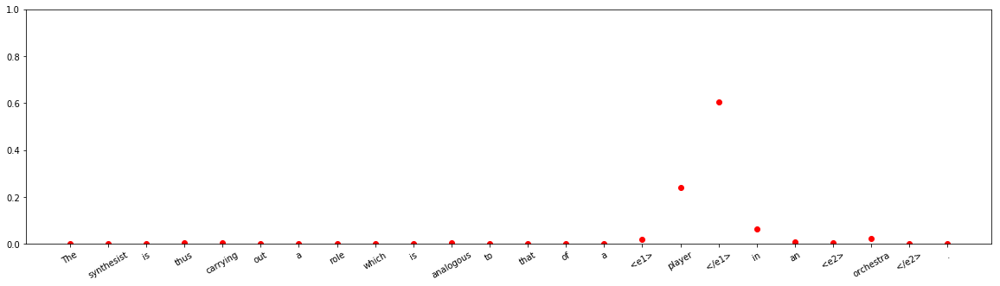




input sentence: <e1> Diatoms </e1> have an external <e2> skeleton </e2> of silica and silicon may therefore be a limiting element to diatom population growth .
answer label:    Component-Whole(e2,e1)
wrong label:    Other
Other 	:	 0.99989235
Entity-Destination(e1,e2) 	:	 5.6437197e-09
Cause-Effect(e2,e1) 	:	 4.107523e-11
Member-Collection(e2,e1) 	:	 1.1589695e-10
Entity-Origin(e1,e2) 	:	 1.8412239e-08
Message-Topic(e1,e2) 	:	 8.519999e-09
Component-Whole(e1,e2) 	:	 2.4104538e-06
Component-Whole(e2,e1) 	:	 3.5064304e-06
Instrument-Agency(e2,e1) 	:	 1.2665843e-07
Content-Container(e1,e2) 	:	 9.501231e-05
Product-Producer(e2,e1) 	:	 3.6928739e-06
Cause-Effect(e1,e2) 	:	 5.0398928e-08
Product-Producer(e1,e2) 	:	 8.794419e-11
Content-Container(e2,e1) 	:	 2.2501072e-06
Entity-Origin(e2,e1) 	:	 3.9049628e-08
Message-Topic(e2,e1) 	:	 4.4254975e-10
Instrument-Agency(e1,e2) 	:	 7.2932716e-07
Member-Collection(e1,e2) 	:	 3.9349146e-08
Entity-Destination(e2,e1) 	:	 5.591587e-11



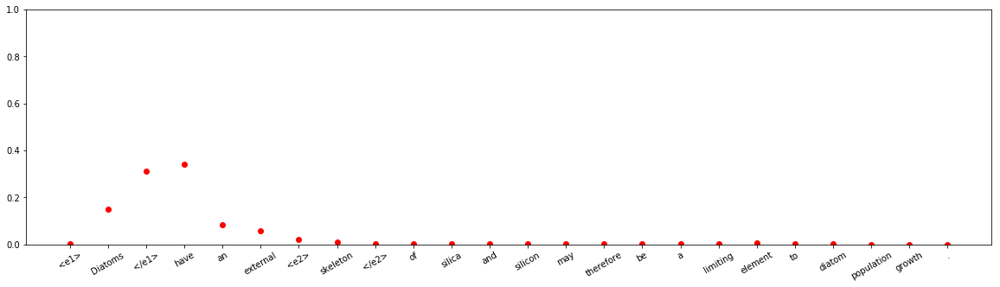



input sentence: The <e1> human </e1> lies down in a sealed <e2> box </e2> and allows his mind to do nothing but operate the avatar .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 0.012988179
Entity-Destination(e1,e2) 	:	 1.7493561e-06
Cause-Effect(e2,e1) 	:	 1.845324e-11
Member-Collection(e2,e1) 	:	 1.5559869e-13
Entity-Origin(e1,e2) 	:	 1.1100147e-05
Message-Topic(e1,e2) 	:	 4.4110987e-12
Component-Whole(e1,e2) 	:	 5.817545e-06
Component-Whole(e2,e1) 	:	 1.2931396e-08
Instrument-Agency(e2,e1) 	:	 0.005523146
Content-Container(e1,e2) 	:	 0.9814339
Product-Producer(e2,e1) 	:	 1.5910928e-06
Cause-Effect(e1,e2) 	:	 3.0265879e-12
Product-Producer(e1,e2) 	:	 3.1551487e-11
Content-Container(e2,e1) 	:	 1.0110771e-07
Entity-Origin(e2,e1) 	:	 7.3976136e-10
Message-Topic(e2,e1) 	:	 6.6903834e-09
Instrument-Agency(e1,e2) 	:	 7.3157427e-09
Member-Collection(e1,e2) 	:	 3.4420595e-05
Entity-Destination(e2,e1) 	:	 1.2347076e-10



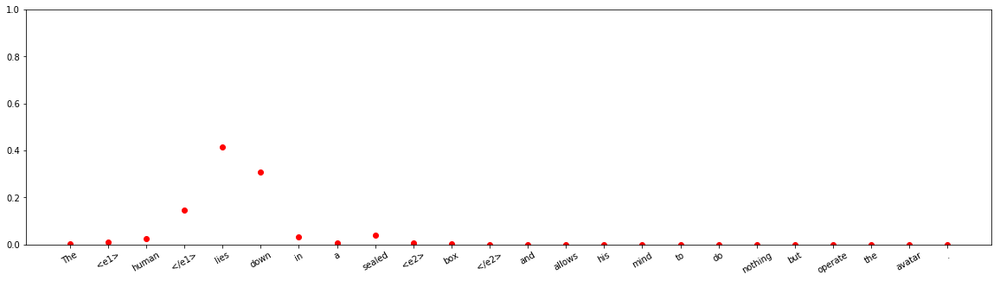






input sentence: From the ancient times , <e1> music </e1> documented the <e2> lives </e2> of the people and was widely patronized by the rulers .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 3.0336963e-10
Entity-Destination(e1,e2) 	:	 1.4341632e-07
Cause-Effect(e2,e1) 	:	 6.8490857e-09
Member-Collection(e2,e1) 	:	 0.00017047563
Entity-Origin(e1,e2) 	:	 0.0005721022
Message-Topic(e1,e2) 	:	 0.2386843
Component-Whole(e1,e2) 	:	 1.3132009e-09
Component-Whole(e2,e1) 	:	 3.7653844e-10
Instrument-Agency(e2,e1) 	:	 8.080923e-11
Content-Container(e1,e2) 	:	 8.5462055e-08
Product-Producer(e2,e1) 	:	 0.012421106
Cause-Effect(e1,e2) 	:	 0.00049239554
Product-Producer(e1,e2) 	:	 0.00027389883
Content-Container(e2,e1) 	:	 1.0542571e-09
Entity-Origin(e2,e1) 	:	 0.000977331
Message-Topic(e2,e1) 	:	 0.74621326
Instrument-Agency(e1,e2) 	:	 2.8104333e-07
Member-Collection(e1,e2) 	:	 0.00019466627
Entity-Destination(e2,e1) 	:	 1.6692833e-10



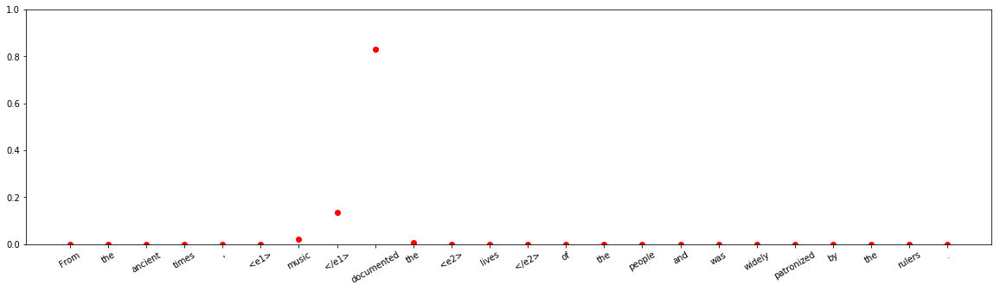



input sentence: In the 2006 Robin Hood series , Robin at one point is lowered into a <e1> pit </e1> of poisonous <e2> snakes </e2> .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 3.0942816e-13
Entity-Destination(e1,e2) 	:	 1.01937617e-13
Cause-Effect(e2,e1) 	:	 9.566309e-15
Member-Collection(e2,e1) 	:	 1.0
Entity-Origin(e1,e2) 	:	 2.0663159e-11
Message-Topic(e1,e2) 	:	 3.2520888e-13
Component-Whole(e1,e2) 	:	 4.90853e-08
Component-Whole(e2,e1) 	:	 1.6181041e-10
Instrument-Agency(e2,e1) 	:	 7.594688e-18
Content-Container(e1,e2) 	:	 1.4670017e-15
Product-Producer(e2,e1) 	:	 1.4413919e-13
Cause-Effect(e1,e2) 	:	 7.027999e-14
Product-Producer(e1,e2) 	:	 1.4246863e-09
Content-Container(e2,e1) 	:	 4.041277e-11
Entity-Origin(e2,e1) 	:	 4.999946e-10
Message-Topic(e2,e1) 	:	 2.9526548e-11
Instrument-Agency(e1,e2) 	:	 1.7853047e-09
Member-Collection(e1,e2) 	:	 1.2846222e-09
Entity-Destination(e2,e1) 	:	 1.2283618e-14



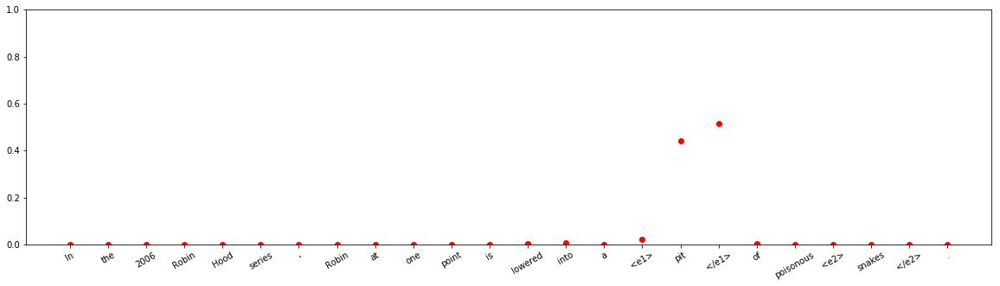








input sentence: Peter Gast `` corrected '' Nietzsche 's writings even after the <e1> philosopher </e1> 's <e2> breakdown </e2> and so without his approval .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.0013405056
Entity-Destination(e1,e2) 	:	 5.817411e-11
Cause-Effect(e2,e1) 	:	 8.667948e-08
Member-Collection(e2,e1) 	:	 1.8554834e-08
Entity-Origin(e1,e2) 	:	 2.4653518e-08
Message-Topic(e1,e2) 	:	 2.2910775e-07
Component-Whole(e1,e2) 	:	 5.3802875e-11
Component-Whole(e2,e1) 	:	 4.2377594e-12
Instrument-Agency(e2,e1) 	:	 0.000269426
Content-Container(e1,e2) 	:	 8.708334e-11
Product-Producer(e2,e1) 	:	 0.98689216
Cause-Effect(e1,e2) 	:	 0.000813749
Product-Producer(e1,e2) 	:	 5.058387e-09
Content-Container(e2,e1) 	:	 2.4236961e-09
Entity-Origin(e2,e1) 	:	 6.335618e-09
Message-Topic(e2,e1) 	:	 2.2689401e-09
Instrument-Agency(e1,e2) 	:	 6.1891164e-08
Member-Collection(e1,e2) 	:	 0.010683627
Entity-Destination(e2,e1) 	:	 3.9441107e-11



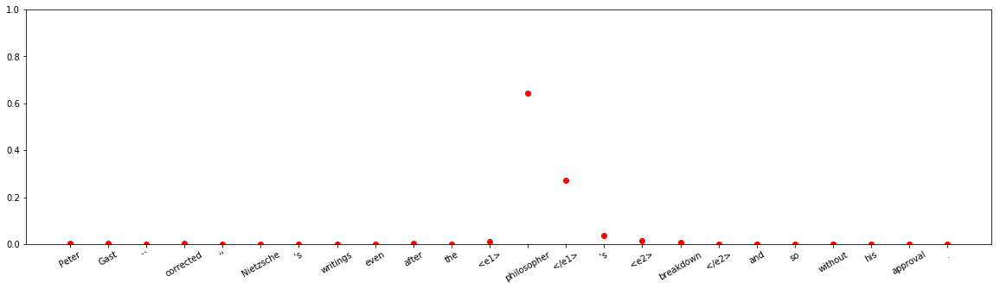



input sentence: The <e1> mosaicism </e1> observed in the proband was derived from a postzygotic somatic <e2> mutation </e2> of the normal maternal y chromosome .
answer label:    Cause-Effect(e2,e1)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.4428437e-09
Entity-Destination(e1,e2) 	:	 3.015041e-14
Cause-Effect(e2,e1) 	:	 5.7577854e-06
Member-Collection(e2,e1) 	:	 4.9562928e-12
Entity-Origin(e1,e2) 	:	 0.9999943
Message-Topic(e1,e2) 	:	 9.731695e-16
Component-Whole(e1,e2) 	:	 8.157312e-12
Component-Whole(e2,e1) 	:	 3.1636147e-13
Instrument-Agency(e2,e1) 	:	 2.0730185e-15
Content-Container(e1,e2) 	:	 3.6868116e-11
Product-Producer(e2,e1) 	:	 2.2588389e-13
Cause-Effect(e1,e2) 	:	 1.8399262e-12
Product-Producer(e1,e2) 	:	 2.9515148e-09
Content-Container(e2,e1) 	:	 4.9017767e-15
Entity-Origin(e2,e1) 	:	 7.08724e-11
Message-Topic(e2,e1) 	:	 1.8955659e-10
Instrument-Agency(e1,e2) 	:	 1.4881312e-13
Member-Collection(e1,e2) 	:	 4.1696286e-09
Entity-Destination(e2,e1) 	:	 1.0572243e-15



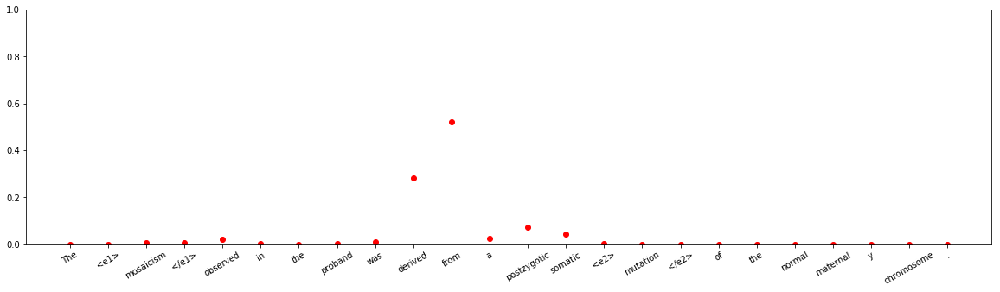





input sentence: Upon its discovery , King Tut 's <e1> mummy </e1> was placed inside three <e2> coffins </e2> , one smaller than the next .
answer label:    Content-Container(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 3.08224e-12
Entity-Destination(e1,e2) 	:	 0.5810224
Cause-Effect(e2,e1) 	:	 6.253609e-16
Member-Collection(e2,e1) 	:	 2.7388009e-10
Entity-Origin(e1,e2) 	:	 1.6140131e-05
Message-Topic(e1,e2) 	:	 4.0950507e-12
Component-Whole(e1,e2) 	:	 1.38007055e-08
Component-Whole(e2,e1) 	:	 2.2261623e-10
Instrument-Agency(e2,e1) 	:	 4.298886e-11
Content-Container(e1,e2) 	:	 0.41895953
Product-Producer(e2,e1) 	:	 5.521311e-07
Cause-Effect(e1,e2) 	:	 1.4321098e-15
Product-Producer(e1,e2) 	:	 3.722015e-11
Content-Container(e2,e1) 	:	 1.2965415e-06
Entity-Origin(e2,e1) 	:	 3.4887655e-09
Message-Topic(e2,e1) 	:	 8.864102e-11
Instrument-Agency(e1,e2) 	:	 1.6245462e-11
Member-Collection(e1,e2) 	:	 7.437148e-08
Entity-Destination(e2,e1) 	:	 1.5454669e-12



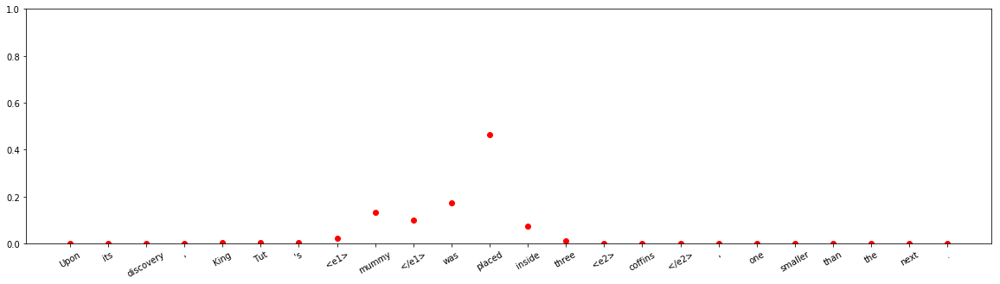




input sentence: High-frequency geometric <e1> ray theory </e1> is used to study the refracted arrival from a <e2> layer </e2> embedded in an infinite medium .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.9507103e-08
Entity-Destination(e1,e2) 	:	 1.1004327e-06
Cause-Effect(e2,e1) 	:	 0.285216
Member-Collection(e2,e1) 	:	 1.6919972e-10
Entity-Origin(e1,e2) 	:	 0.7147534
Message-Topic(e1,e2) 	:	 1.0763295e-11
Component-Whole(e1,e2) 	:	 4.864896e-07
Component-Whole(e2,e1) 	:	 2.8684392e-05
Instrument-Agency(e2,e1) 	:	 4.80042e-09
Content-Container(e1,e2) 	:	 1.4737673e-09
Product-Producer(e2,e1) 	:	 1.2692134e-11
Cause-Effect(e1,e2) 	:	 5.2769555e-10
Product-Producer(e1,e2) 	:	 2.016451e-08
Content-Container(e2,e1) 	:	 1.4241994e-07
Entity-Origin(e2,e1) 	:	 1.10489236e-08
Message-Topic(e2,e1) 	:	 1.3001876e-10
Instrument-Agency(e1,e2) 	:	 8.501543e-08
Member-Collection(e1,e2) 	:	 5.727404e-10
Entity-Destination(e2,e1) 	:	 3.0516787e-11



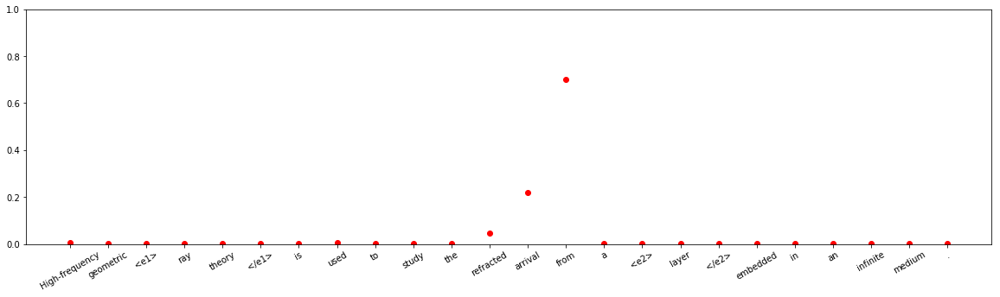






input sentence: The painting shows a historical view of the <e1> damage </e1> caused by the 1693 Catania earthquake and the <e2> reconstruction </e2> activities .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 7.9511545e-17
Entity-Destination(e1,e2) 	:	 2.197024e-14
Cause-Effect(e2,e1) 	:	 0.99999964
Member-Collection(e2,e1) 	:	 4.3358706e-15
Entity-Origin(e1,e2) 	:	 2.1590651e-16
Message-Topic(e1,e2) 	:	 2.6248772e-15
Component-Whole(e1,e2) 	:	 7.569733e-12
Component-Whole(e2,e1) 	:	 1.356766e-13
Instrument-Agency(e2,e1) 	:	 1.1821364e-12
Content-Container(e1,e2) 	:	 1.4802308e-19
Product-Producer(e2,e1) 	:	 3.6077505e-15
Cause-Effect(e1,e2) 	:	 3.71651e-07
Product-Producer(e1,e2) 	:	 5.4297667e-11
Content-Container(e2,e1) 	:	 3.430569e-16
Entity-Origin(e2,e1) 	:	 4.848499e-17
Message-Topic(e2,e1) 	:	 6.1036367e-12
Instrument-Agency(e1,e2) 	:	 5.906163e-12
Member-Collection(e1,e2) 	:	 1.0216262e-16
Entity-Destination(e2,e1) 	:	 3.2475886e-16



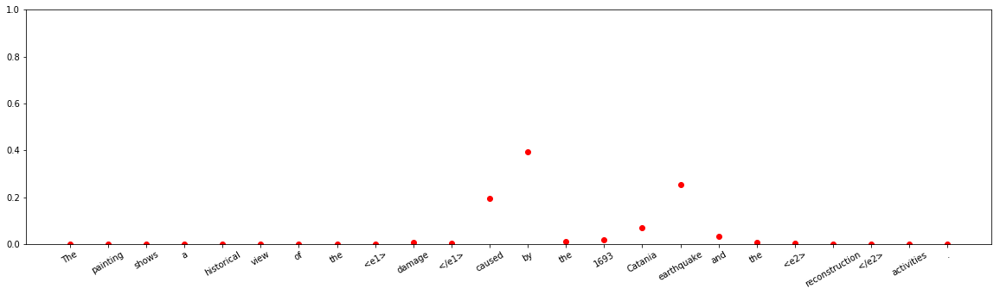










input sentence: Both <e1> cocaine </e1> and crack cocaine cause constricted blood vessels , increased heart rate , body temperature and blood <e2> pressure </e2> .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 3.501956e-13
Entity-Destination(e1,e2) 	:	 1.094579e-08
Cause-Effect(e2,e1) 	:	 1.6332508e-05
Member-Collection(e2,e1) 	:	 8.125265e-11
Entity-Origin(e1,e2) 	:	 1.0666866e-09
Message-Topic(e1,e2) 	:	 1.3710544e-08
Component-Whole(e1,e2) 	:	 5.2721794e-10
Component-Whole(e2,e1) 	:	 1.163676e-07
Instrument-Agency(e2,e1) 	:	 5.6566194e-07
Content-Container(e1,e2) 	:	 6.6120626e-10
Product-Producer(e2,e1) 	:	 1.901774e-09
Cause-Effect(e1,e2) 	:	 0.99998283
Product-Producer(e1,e2) 	:	 1.9183713e-10
Content-Container(e2,e1) 	:	 7.17952e-09
Entity-Origin(e2,e1) 	:	 1.6005278e-07
Message-Topic(e2,e1) 	:	 6.835925e-11
Instrument-Agency(e1,e2) 	:	 6.3661645e-09
Member-Collection(e1,e2) 	:	 9.118591e-12
Entity-Destination(e2,e1) 	:	 6.334481e-12



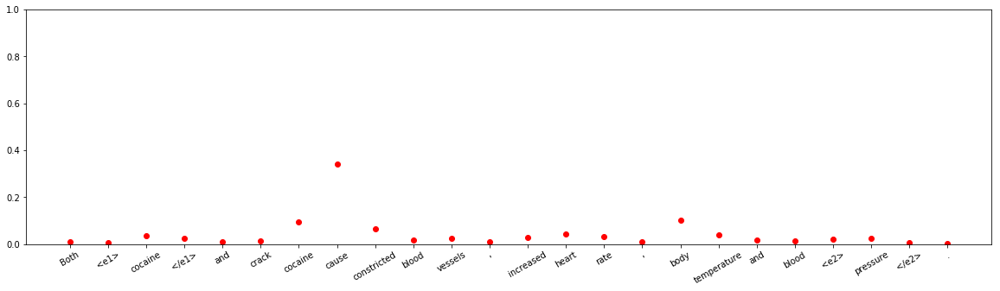


input sentence: At full establishment , a <e1> brigade </e1> of 18-lbr field <e2> guns </e2> consisted of 795 men of whom 23 were officers .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 4.3911324e-13
Entity-Destination(e1,e2) 	:	 6.463065e-13
Cause-Effect(e2,e1) 	:	 2.2085265e-13
Member-Collection(e2,e1) 	:	 0.99999857
Entity-Origin(e1,e2) 	:	 8.2767804e-10
Message-Topic(e1,e2) 	:	 3.142045e-10
Component-Whole(e1,e2) 	:	 1.8243107e-08
Component-Whole(e2,e1) 	:	 2.5090732e-10
Instrument-Agency(e2,e1) 	:	 4.8515006e-13
Content-Container(e1,e2) 	:	 7.9552424e-13
Product-Producer(e2,e1) 	:	 1.5682912e-10
Cause-Effect(e1,e2) 	:	 9.410702e-13
Product-Producer(e1,e2) 	:	 9.43649e-10
Content-Container(e2,e1) 	:	 2.1606894e-09
Entity-Origin(e2,e1) 	:	 1.7236665e-10
Message-Topic(e2,e1) 	:	 4.1373337e-12
Instrument-Agency(e1,e2) 	:	 1.0655378e-06
Member-Collection(e1,e2) 	:	 3.7799822e-07
Entity-Destination(e2,e1) 	:	 1.9674453e-14



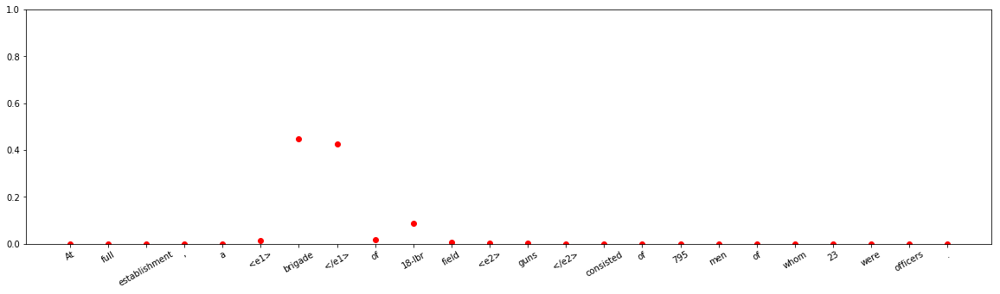




input sentence: Mental health recovery and economic <e1> recovery </e1> after the <e2> storm </e2> : high-frequency longitudinal evidence from Sri Lankan small business owners .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.9681538e-05
Entity-Destination(e1,e2) 	:	 2.3790822e-11
Cause-Effect(e2,e1) 	:	 0.9994186
Member-Collection(e2,e1) 	:	 9.967521e-11
Entity-Origin(e1,e2) 	:	 9.232273e-09
Message-Topic(e1,e2) 	:	 4.9914874e-13
Component-Whole(e1,e2) 	:	 1.1044532e-07
Component-Whole(e2,e1) 	:	 6.695603e-08
Instrument-Agency(e2,e1) 	:	 7.2414446e-07
Content-Container(e1,e2) 	:	 3.5374562e-13
Product-Producer(e2,e1) 	:	 8.804443e-12
Cause-Effect(e1,e2) 	:	 8.9438185e-10
Product-Producer(e1,e2) 	:	 0.00016857235
Content-Container(e2,e1) 	:	 4.1366186e-14
Entity-Origin(e2,e1) 	:	 4.168583e-15
Message-Topic(e2,e1) 	:	 0.00039206436
Instrument-Agency(e1,e2) 	:	 1.5947002e-07
Member-Collection(e1,e2) 	:	 1.4179072e-08
Entity-Destination(e2,e1) 	:	 1.781028e-11



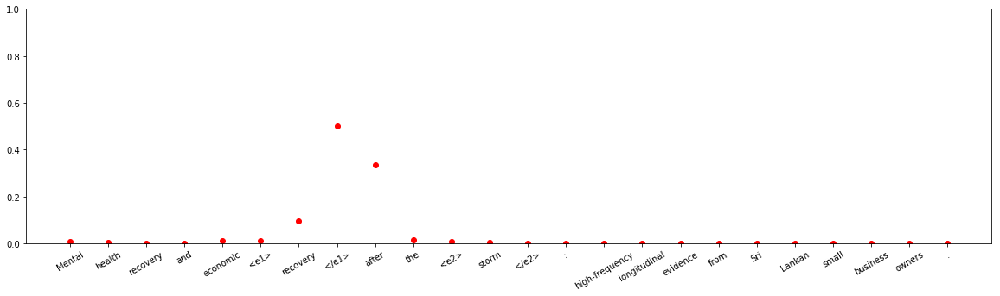


input sentence: The primary aim of the present invention is to provide a capless <e1> closure </e1> for a conventional fuel filler <e2> pipe </e2> .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 5.091429e-05
Entity-Destination(e1,e2) 	:	 7.732401e-11
Cause-Effect(e2,e1) 	:	 4.57447e-10
Member-Collection(e2,e1) 	:	 2.0822721e-10
Entity-Origin(e1,e2) 	:	 4.929126e-10
Message-Topic(e1,e2) 	:	 1.8366297e-08
Component-Whole(e1,e2) 	:	 0.00018720615
Component-Whole(e2,e1) 	:	 0.9997516
Instrument-Agency(e2,e1) 	:	 6.433374e-06
Content-Container(e1,e2) 	:	 1.2556458e-06
Product-Producer(e2,e1) 	:	 6.46331e-08
Cause-Effect(e1,e2) 	:	 1.12229245e-07
Product-Producer(e1,e2) 	:	 7.146662e-08
Content-Container(e2,e1) 	:	 1.1095585e-06
Entity-Origin(e2,e1) 	:	 5.882949e-11
Message-Topic(e2,e1) 	:	 5.1665366e-10
Instrument-Agency(e1,e2) 	:	 1.108725e-06
Member-Collection(e1,e2) 	:	 4.7721306e-12
Entity-Destination(e2,e1) 	:	 5.884964e-09



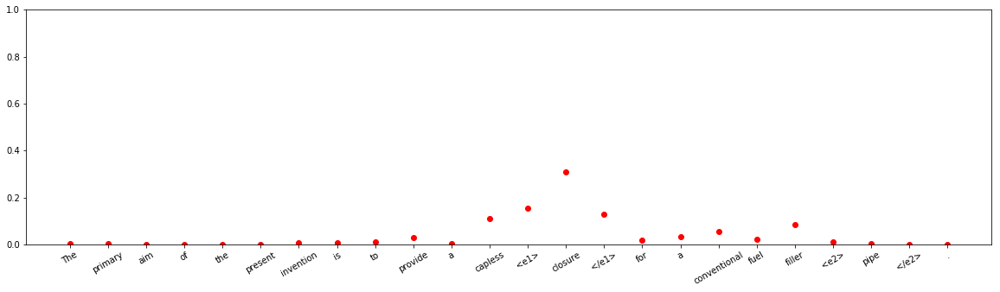



input sentence: There are a number of fairly standard conventions when framing a <e1> business </e1> <e2> letter </e2> that it is important to observe .
answer label:    Message-Topic(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 3.843418e-07
Entity-Destination(e1,e2) 	:	 3.2762715e-10
Cause-Effect(e2,e1) 	:	 8.9417257e-10
Member-Collection(e2,e1) 	:	 1.6840952e-06
Entity-Origin(e1,e2) 	:	 1.17660925e-07
Message-Topic(e1,e2) 	:	 0.000729909
Component-Whole(e1,e2) 	:	 1.6254748e-05
Component-Whole(e2,e1) 	:	 0.0028230576
Instrument-Agency(e2,e1) 	:	 4.3215312e-07
Content-Container(e1,e2) 	:	 7.2562074e-07
Product-Producer(e2,e1) 	:	 0.96227664
Cause-Effect(e1,e2) 	:	 7.7905077e-07
Product-Producer(e1,e2) 	:	 0.014510681
Content-Container(e2,e1) 	:	 1.9807394e-06
Entity-Origin(e2,e1) 	:	 1.4669165e-07
Message-Topic(e2,e1) 	:	 0.019619362
Instrument-Agency(e1,e2) 	:	 1.7877956e-05
Member-Collection(e1,e2) 	:	 1.8894752e-09
Entity-Destination(e2,e1) 	:	 2.4717368e-08



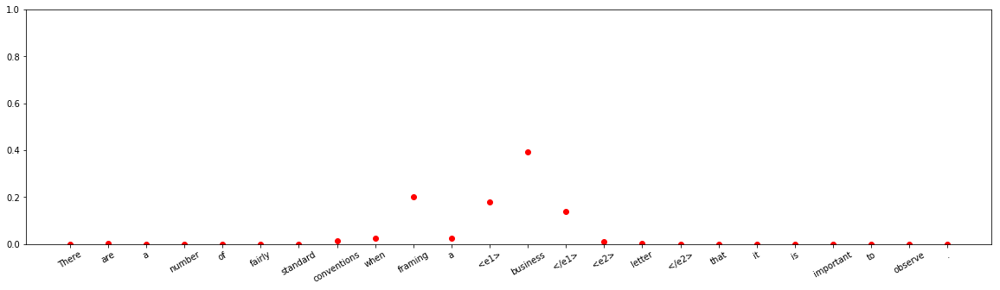


input sentence: The Learning Institute has several externally funded <e1> projects </e1> investigating <e2> aspects </e2> of learning and teaching or management in higher education .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 2.010678e-07
Entity-Destination(e1,e2) 	:	 2.0285758e-10
Cause-Effect(e2,e1) 	:	 8.237405e-11
Member-Collection(e2,e1) 	:	 1.3336945e-08
Entity-Origin(e1,e2) 	:	 2.310561e-12
Message-Topic(e1,e2) 	:	 0.9998348
Component-Whole(e1,e2) 	:	 5.755904e-07
Component-Whole(e2,e1) 	:	 2.9032883e-08
Instrument-Agency(e2,e1) 	:	 1.7966116e-14
Content-Container(e1,e2) 	:	 1.5063e-13
Product-Producer(e2,e1) 	:	 1.2439006e-09
Cause-Effect(e1,e2) 	:	 0.00015843772
Product-Producer(e1,e2) 	:	 2.62849e-09
Content-Container(e2,e1) 	:	 1.7831568e-11
Entity-Origin(e2,e1) 	:	 4.002303e-08
Message-Topic(e2,e1) 	:	 5.1322168e-06
Instrument-Agency(e1,e2) 	:	 7.77226e-07
Member-Collection(e1,e2) 	:	 2.4745175e-10
Entity-Destination(e2,e1) 	:	 7.7380715e-12



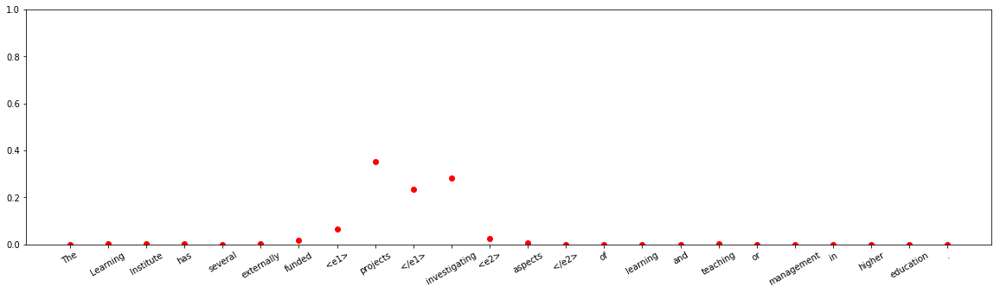



input sentence: <e1> End-sequencing </e1> of the fragments with short 36-base <e2> reads </e2> therefore leads to elevated coverage near the end of the baits .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.034757625
Entity-Destination(e1,e2) 	:	 4.596576e-08
Cause-Effect(e2,e1) 	:	 1.7601467e-07
Member-Collection(e2,e1) 	:	 1.22160045e-05
Entity-Origin(e1,e2) 	:	 4.8957725e-05
Message-Topic(e1,e2) 	:	 1.4457227e-07
Component-Whole(e1,e2) 	:	 3.2305875e-06
Component-Whole(e2,e1) 	:	 0.6956824
Instrument-Agency(e2,e1) 	:	 0.03373256
Content-Container(e1,e2) 	:	 0.0014986689
Product-Producer(e2,e1) 	:	 0.13593139
Cause-Effect(e1,e2) 	:	 1.737691e-06
Product-Producer(e1,e2) 	:	 3.9549474e-07
Content-Container(e2,e1) 	:	 0.098312326
Entity-Origin(e2,e1) 	:	 5.879416e-07
Message-Topic(e2,e1) 	:	 8.355989e-06
Instrument-Agency(e1,e2) 	:	 9.127237e-06
Member-Collection(e1,e2) 	:	 2.9562873e-08
Entity-Destination(e2,e1) 	:	 9.546174e-09



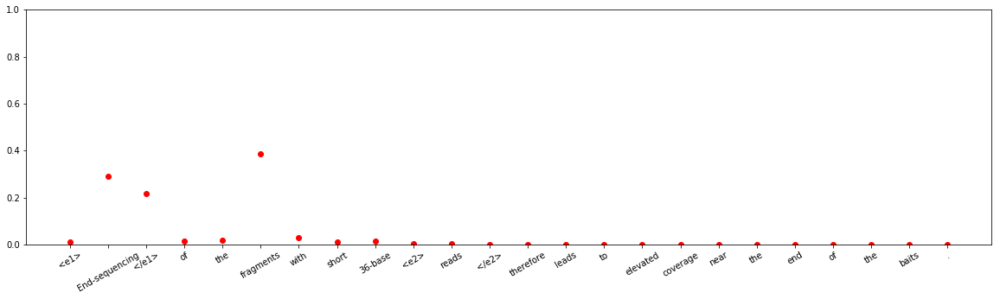





input sentence: The study focuses on the <e1> personnel </e1> in three service stations in Finland that are part of Teboil 's <e2> organisation </e2> .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 2.960593e-05
Entity-Destination(e1,e2) 	:	 2.5167532e-08
Cause-Effect(e2,e1) 	:	 6.8006734e-10
Member-Collection(e2,e1) 	:	 1.4594503e-05
Entity-Origin(e1,e2) 	:	 4.896354e-07
Message-Topic(e1,e2) 	:	 2.0680954e-10
Component-Whole(e1,e2) 	:	 0.7519256
Component-Whole(e2,e1) 	:	 5.496135e-10
Instrument-Agency(e2,e1) 	:	 1.0897068e-12
Content-Container(e1,e2) 	:	 5.779007e-07
Product-Producer(e2,e1) 	:	 8.51275e-12
Cause-Effect(e1,e2) 	:	 1.0392474e-10
Product-Producer(e1,e2) 	:	 1.8926474e-06
Content-Container(e2,e1) 	:	 2.2423599e-09
Entity-Origin(e2,e1) 	:	 3.2882408e-09
Message-Topic(e2,e1) 	:	 1.917544e-07
Instrument-Agency(e1,e2) 	:	 8.819446e-06
Member-Collection(e1,e2) 	:	 0.24801834
Entity-Destination(e2,e1) 	:	 1.6376403e-10



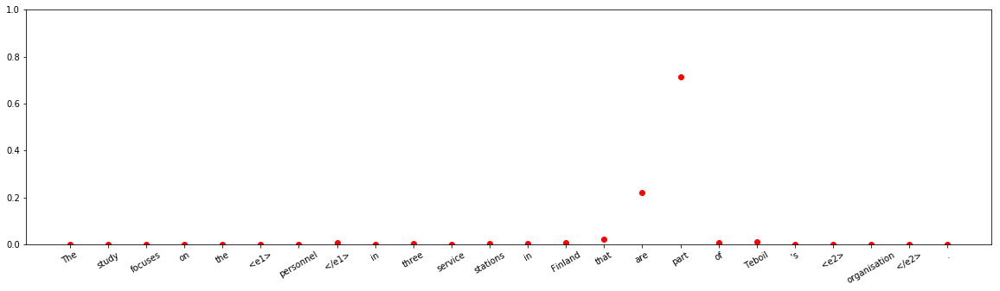





input sentence: <e1> Chimpanzees </e1> make <e2> love </e2> rather like humans do , but they do not usually run the risk of contracting syphilis .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.0006937127
Entity-Destination(e1,e2) 	:	 1.7799818e-09
Cause-Effect(e2,e1) 	:	 8.793827e-12
Member-Collection(e2,e1) 	:	 3.838831e-08
Entity-Origin(e1,e2) 	:	 2.6216465e-09
Message-Topic(e1,e2) 	:	 3.607389e-05
Component-Whole(e1,e2) 	:	 1.8842032e-09
Component-Whole(e2,e1) 	:	 2.3919983e-10
Instrument-Agency(e2,e1) 	:	 4.6881073e-07
Content-Container(e1,e2) 	:	 4.1173784e-09
Product-Producer(e2,e1) 	:	 0.99621445
Cause-Effect(e1,e2) 	:	 0.003049246
Product-Producer(e1,e2) 	:	 6.182804e-09
Content-Container(e2,e1) 	:	 1.3233583e-07
Entity-Origin(e2,e1) 	:	 3.7588272e-06
Message-Topic(e2,e1) 	:	 3.5432062e-09
Instrument-Agency(e1,e2) 	:	 8.834542e-07
Member-Collection(e1,e2) 	:	 1.1931654e-06
Entity-Destination(e2,e1) 	:	 1.2130794e-11



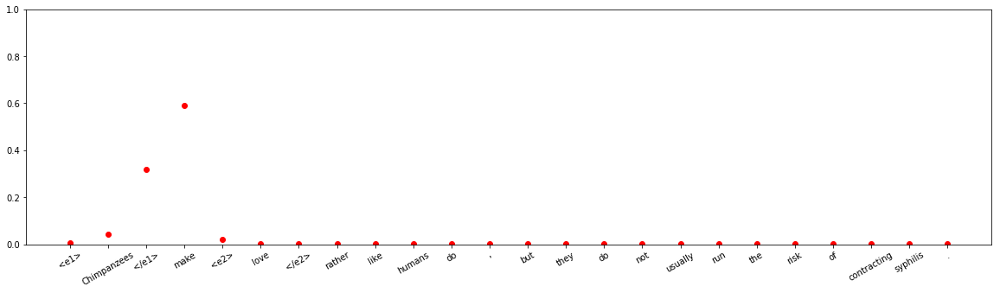





input sentence: In ancient Egypt , the people in that civilization depilated their bodies to prevent <e1> infestation </e1> of <e2> fleas </e2> and lice .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.00032750345
Entity-Destination(e1,e2) 	:	 4.843985e-08
Cause-Effect(e2,e1) 	:	 0.032900564
Member-Collection(e2,e1) 	:	 0.96024466
Entity-Origin(e1,e2) 	:	 5.7667404e-09
Message-Topic(e1,e2) 	:	 2.8738322e-07
Component-Whole(e1,e2) 	:	 5.780256e-06
Component-Whole(e2,e1) 	:	 1.6349798e-08
Instrument-Agency(e2,e1) 	:	 3.9394112e-07
Content-Container(e1,e2) 	:	 2.444204e-10
Product-Producer(e2,e1) 	:	 5.104637e-07
Cause-Effect(e1,e2) 	:	 0.006295576
Product-Producer(e1,e2) 	:	 1.092826e-06
Content-Container(e2,e1) 	:	 3.4317713e-07
Entity-Origin(e2,e1) 	:	 0.000100166275
Message-Topic(e2,e1) 	:	 2.8276052e-05
Instrument-Agency(e1,e2) 	:	 2.7966866e-05
Member-Collection(e1,e2) 	:	 6.690245e-05
Entity-Destination(e2,e1) 	:	 4.7293514e-10



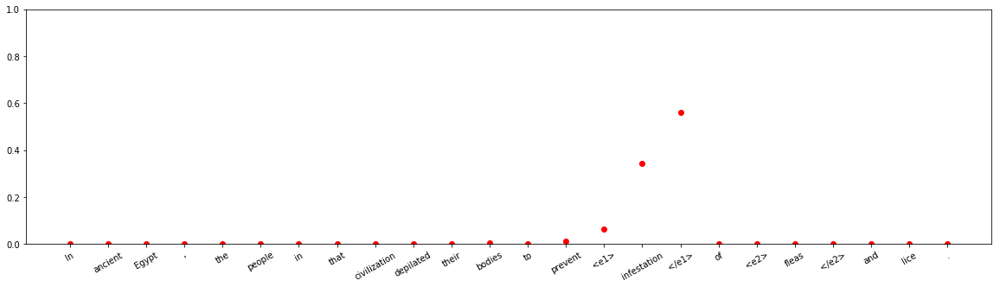


input sentence: Professionals from streams like law , engineering , agriculture also have opening in the management <e1> cadre </e1> of various <e2> banks </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.9850162
Entity-Destination(e1,e2) 	:	 1.3086802e-12
Cause-Effect(e2,e1) 	:	 1.2990671e-10
Member-Collection(e2,e1) 	:	 0.0149356285
Entity-Origin(e1,e2) 	:	 5.5751036e-11
Message-Topic(e1,e2) 	:	 1.4341099e-10
Component-Whole(e1,e2) 	:	 1.7381443e-07
Component-Whole(e2,e1) 	:	 8.8528054e-07
Instrument-Agency(e2,e1) 	:	 3.7252264e-06
Content-Container(e1,e2) 	:	 4.830193e-10
Product-Producer(e2,e1) 	:	 1.2814758e-05
Cause-Effect(e1,e2) 	:	 8.8381505e-13
Product-Producer(e1,e2) 	:	 5.541193e-10
Content-Container(e2,e1) 	:	 7.217402e-08
Entity-Origin(e2,e1) 	:	 3.3489007e-09
Message-Topic(e2,e1) 	:	 3.033243e-05
Instrument-Agency(e1,e2) 	:	 8.311425e-08
Member-Collection(e1,e2) 	:	 4.068738e-08
Entity-Destination(e2,e1) 	:	 1.00021186e-10



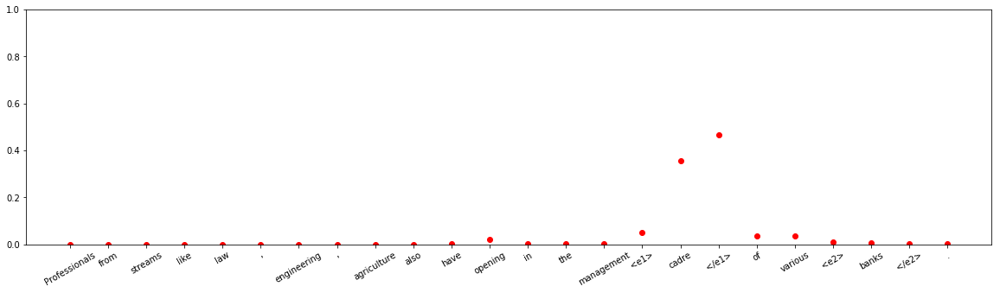






input sentence: The <e1> study </e1> assessed the effectiveness of the world 's fisheries management regimes using <e2> evaluations </e2> by nearly 1200 fisheries experts .
answer label:    Component-Whole(e2,e1)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.0004541539
Entity-Destination(e1,e2) 	:	 7.1423145e-11
Cause-Effect(e2,e1) 	:	 2.792118e-05
Member-Collection(e2,e1) 	:	 1.1019334e-05
Entity-Origin(e1,e2) 	:	 6.2980896e-09
Message-Topic(e1,e2) 	:	 9.0673775e-06
Component-Whole(e1,e2) 	:	 0.00024604466
Component-Whole(e2,e1) 	:	 0.0008598886
Instrument-Agency(e2,e1) 	:	 0.05522543
Content-Container(e1,e2) 	:	 2.2920869e-08
Product-Producer(e2,e1) 	:	 3.3025538e-10
Cause-Effect(e1,e2) 	:	 1.9648225e-09
Product-Producer(e1,e2) 	:	 0.00048907264
Content-Container(e2,e1) 	:	 9.203276e-08
Entity-Origin(e2,e1) 	:	 6.901456e-07
Message-Topic(e2,e1) 	:	 0.00036413863
Instrument-Agency(e1,e2) 	:	 0.9423122
Member-Collection(e1,e2) 	:	 2.3570475e-07
Entity-Destination(e2,e1) 	:	

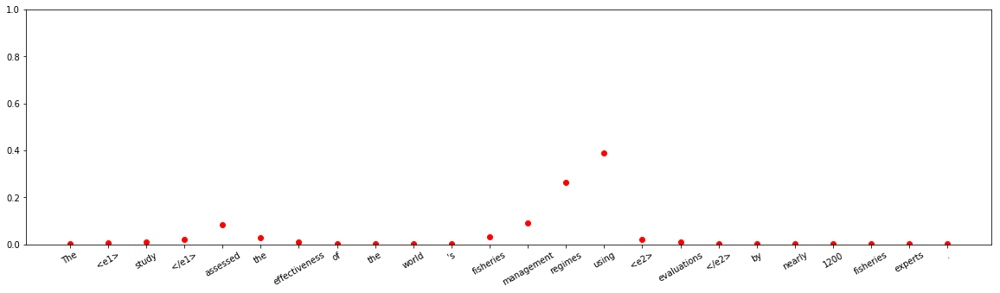


input sentence: You reassigned them after making a <e1> change </e1> in the registry through the administrative <e2> console </e2> or by using wsadmin scriptin .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.06053111
Entity-Destination(e1,e2) 	:	 3.1782275e-11
Cause-Effect(e2,e1) 	:	 3.9604977e-09
Member-Collection(e2,e1) 	:	 2.206473e-13
Entity-Origin(e1,e2) 	:	 4.712647e-12
Message-Topic(e1,e2) 	:	 4.233458e-11
Component-Whole(e1,e2) 	:	 1.6308685e-06
Component-Whole(e2,e1) 	:	 6.424254e-06
Instrument-Agency(e2,e1) 	:	 0.9394606
Content-Container(e1,e2) 	:	 5.517525e-10
Product-Producer(e2,e1) 	:	 6.9246226e-13
Cause-Effect(e1,e2) 	:	 1.217981e-14
Product-Producer(e1,e2) 	:	 2.2354627e-11
Content-Container(e2,e1) 	:	 1.4225338e-10
Entity-Origin(e2,e1) 	:	 2.7031047e-15
Message-Topic(e2,e1) 	:	 4.5090762e-09
Instrument-Agency(e1,e2) 	:	 2.411779e-07
Member-Collection(e1,e2) 	:	 3.7527498e-13
Entity-Destination(e2,e1) 	:	 1.2721277e-12



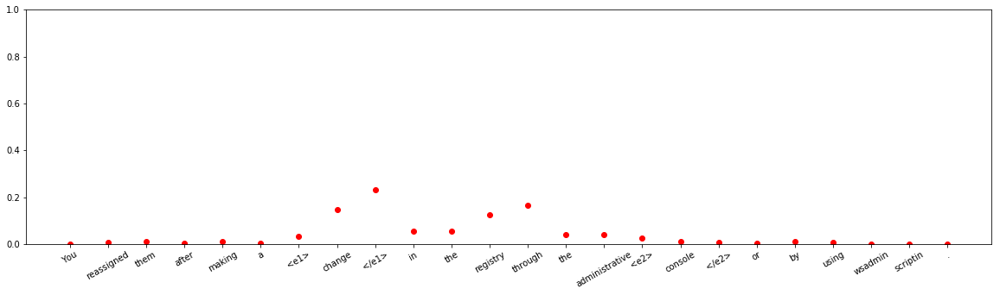











input sentence: Mobil is now turning to fine art as a way of protecting some of its huge <e1> profits </e1> from <e2> inflation </e2> .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 2.3061248e-09
Entity-Destination(e1,e2) 	:	 4.9627433e-16
Cause-Effect(e2,e1) 	:	 1.0
Member-Collection(e2,e1) 	:	 2.9996167e-14
Entity-Origin(e1,e2) 	:	 3.3794175e-14
Message-Topic(e1,e2) 	:	 7.0658954e-16
Component-Whole(e1,e2) 	:	 1.0907656e-11
Component-Whole(e2,e1) 	:	 5.450685e-12
Instrument-Agency(e2,e1) 	:	 2.0667148e-14
Content-Container(e1,e2) 	:	 5.674354e-14
Product-Producer(e2,e1) 	:	 1.0459291e-17
Cause-Effect(e1,e2) 	:	 2.231403e-09
Product-Producer(e1,e2) 	:	 1.8415722e-09
Content-Container(e2,e1) 	:	 1.4875316e-14
Entity-Origin(e2,e1) 	:	 1.0496633e-15
Message-Topic(e2,e1) 	:	 1.2906305e-11
Instrument-Agency(e1,e2) 	:	 1.500979e-09
Member-Collection(e1,e2) 	:	 4.936969e-16
Entity-Destination(e2,e1) 	:	 1.8660317e-14



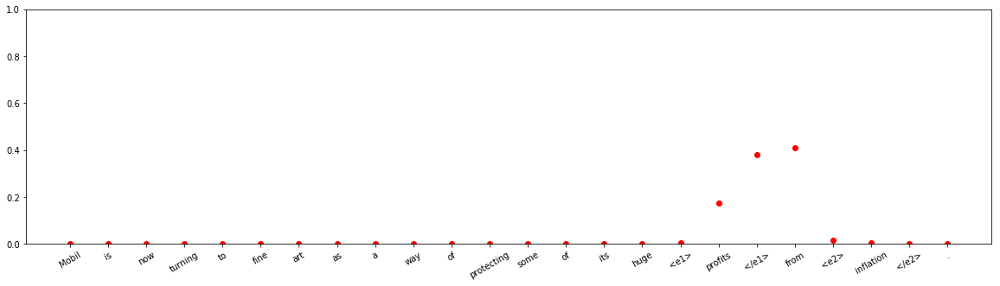





























input sentence: I spent a year working for a <e1> software </e1> <e2> company </e2> to pay off my college loans .
answer label:    Product-Producer(e1,e2)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.031464674
Entity-Destination(e1,e2) 	:	 9.0733534e-05
Cause-Effect(e2,e1) 	:	 1.4533964e-08
Member-Collection(e2,e1) 	:	 6.0638167e-06
Entity-Origin(e1,e2) 	:	 1.08335364e-07
Message-Topic(e1,e2) 	:	 3.0370134e-07
Component-Whole(e1,e2) 	:	 6.817326e-09
Component-Whole(e2,e1) 	:	 2.9261358e-08
Instrument-Agency(e2,e1) 	:	 1.2391881e-08
Content-Container(e1,e2) 	:	 1.335424e-07
Product-Producer(e2,e1) 	:	 1.3328538e-07
Cause-Effect(e1,e2) 	:	 1.6019251e-09
Product-Producer(e1,e2) 	:	 0.25823176
Content-Container(e2,e1) 	:	 9.8109965e-09
Entity-Origin(e2,e1) 	:	 1.6027265e-08
Message-Topic(e2,e1) 	:	 6.088213e-08
Instrument-Agency(e1,e2) 	:	 0.7101485
Member-Collection(e1,e2) 	:	 5.7368467e-05
Entity-Destination(e2,e1) 	:	 5.063837e-10



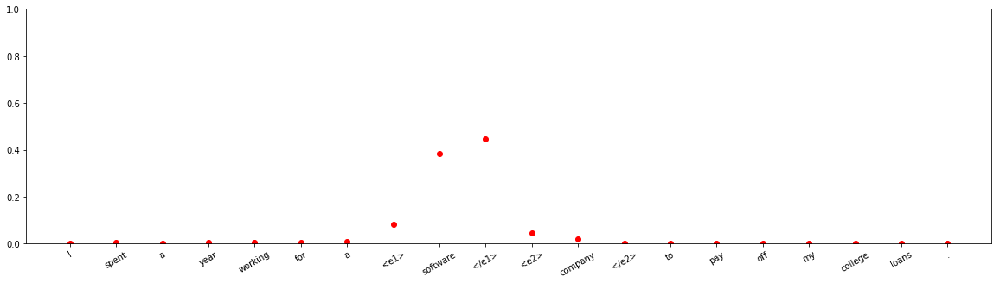


input sentence: He produces <e1> drawings </e1> and videos that have been shown in <e2> museums </e2> in Europe and America .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 1.823064e-14
Entity-Destination(e1,e2) 	:	 2.1435963e-10
Cause-Effect(e2,e1) 	:	 4.2982683e-12
Member-Collection(e2,e1) 	:	 4.897926e-09
Entity-Origin(e1,e2) 	:	 1.971301e-07
Message-Topic(e1,e2) 	:	 4.7253166e-09
Component-Whole(e1,e2) 	:	 0.00022029606
Component-Whole(e2,e1) 	:	 1.4755812e-08
Instrument-Agency(e2,e1) 	:	 3.1081933e-15
Content-Container(e1,e2) 	:	 3.5848466e-10
Product-Producer(e2,e1) 	:	 6.571041e-11
Cause-Effect(e1,e2) 	:	 1.1318183e-12
Product-Producer(e1,e2) 	:	 2.723913e-09
Content-Container(e2,e1) 	:	 6.771457e-12
Entity-Origin(e2,e1) 	:	 9.550751e-10
Message-Topic(e2,e1) 	:	 0.9997795
Instrument-Agency(e1,e2) 	:	 1.5216996e-10
Member-Collection(e1,e2) 	:	 1.3209993e-10
Entity-Destination(e2,e1) 	:	 1.3092828e-13



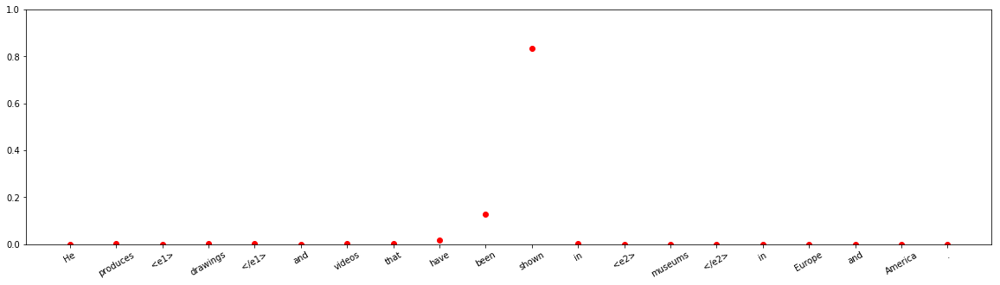









input sentence: The core of the <e1> analyzer </e1> first identifies the infeasible paths using the constraint propagation <e2> method </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.99287605
Entity-Destination(e1,e2) 	:	 2.0279093e-12
Cause-Effect(e2,e1) 	:	 3.641093e-10
Member-Collection(e2,e1) 	:	 3.4557869e-12
Entity-Origin(e1,e2) 	:	 4.4288756e-10
Message-Topic(e1,e2) 	:	 5.4621476e-09
Component-Whole(e1,e2) 	:	 2.709404e-10
Component-Whole(e2,e1) 	:	 4.75684e-10
Instrument-Agency(e2,e1) 	:	 0.006990753
Content-Container(e1,e2) 	:	 2.0363164e-08
Product-Producer(e2,e1) 	:	 1.5042861e-08
Cause-Effect(e1,e2) 	:	 2.3452146e-10
Product-Producer(e1,e2) 	:	 1.1234957e-11
Content-Container(e2,e1) 	:	 2.5454659e-08
Entity-Origin(e2,e1) 	:	 7.501953e-10
Message-Topic(e2,e1) 	:	 7.87673e-11
Instrument-Agency(e1,e2) 	:	 0.00013328204
Member-Collection(e1,e2) 	:	 6.4363964e-10
Entity-Destination(e2,e1) 	:	 7.141318e-12



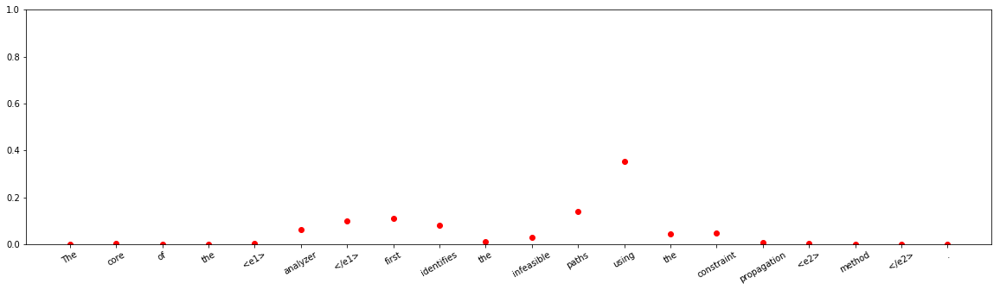


input sentence: A <e1> nurse </e1> grabs the patient by the <e2> arm </e2> and escorts her back to her bed .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 8.585574e-09
Entity-Destination(e1,e2) 	:	 8.313907e-12
Cause-Effect(e2,e1) 	:	 1.583716e-05
Member-Collection(e2,e1) 	:	 8.1703075e-11
Entity-Origin(e1,e2) 	:	 1.9397727e-07
Message-Topic(e1,e2) 	:	 3.6022465e-15
Component-Whole(e1,e2) 	:	 7.402728e-08
Component-Whole(e2,e1) 	:	 1.8729123e-07
Instrument-Agency(e2,e1) 	:	 0.9993123
Content-Container(e1,e2) 	:	 4.207102e-11
Product-Producer(e2,e1) 	:	 1.2200583e-06
Cause-Effect(e1,e2) 	:	 3.443152e-12
Product-Producer(e1,e2) 	:	 0.00062669953
Content-Container(e2,e1) 	:	 1.0122855e-09
Entity-Origin(e2,e1) 	:	 2.7711498e-16
Message-Topic(e2,e1) 	:	 4.8631793e-11
Instrument-Agency(e1,e2) 	:	 4.314398e-05
Member-Collection(e1,e2) 	:	 3.5016782e-07
Entity-Destination(e2,e1) 	:	 3.1877803e-12



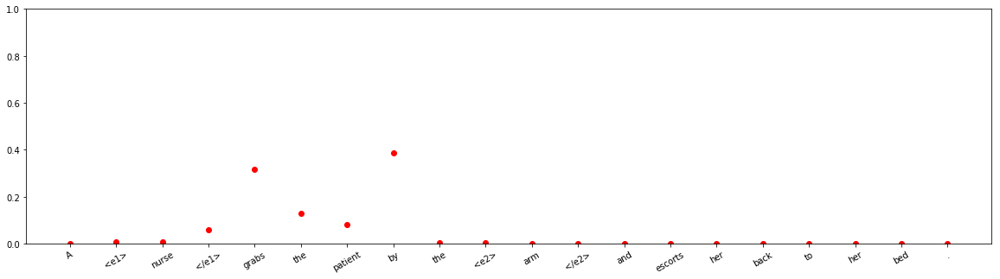





input sentence: The <e1> chain </e1> of Hawaiian <e2> islands </e2> provides evidence that the Pacific Plate moves to the northwest .
answer label:    Component-Whole(e2,e1)
wrong label:    Member-Collection(e2,e1)
Other 	:	 4.820593e-06
Entity-Destination(e1,e2) 	:	 2.691802e-09
Cause-Effect(e2,e1) 	:	 1.620785e-07
Member-Collection(e2,e1) 	:	 0.9514517
Entity-Origin(e1,e2) 	:	 0.00021540489
Message-Topic(e1,e2) 	:	 2.9334804e-05
Component-Whole(e1,e2) 	:	 0.009375292
Component-Whole(e2,e1) 	:	 0.033813808
Instrument-Agency(e2,e1) 	:	 3.5550585e-08
Content-Container(e1,e2) 	:	 1.6348e-05
Product-Producer(e2,e1) 	:	 6.757259e-05
Cause-Effect(e1,e2) 	:	 5.3671255e-07
Product-Producer(e1,e2) 	:	 8.86011e-05
Content-Container(e2,e1) 	:	 0.00019855784
Entity-Origin(e2,e1) 	:	 0.0019102371
Message-Topic(e2,e1) 	:	 0.0008149777
Instrument-Agency(e1,e2) 	:	 0.0020060765
Member-Collection(e1,e2) 	:	 6.293322e-06
Entity-Destination(e2,e1) 	:	 2.1102724e-07



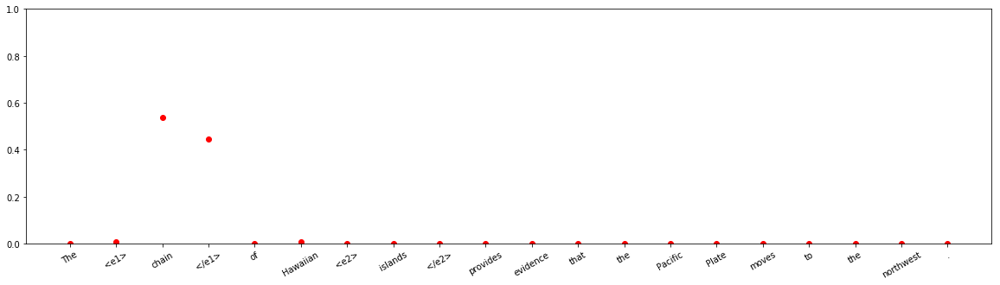


input sentence: Seasonal and nocturnal <e1> migrations </e1> cause sleep <e2> deprivation </e2> in diurnal Swainson 's thrush , Catharus ustulatus .
answer label:    Cause-Effect(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.6838789e-11
Entity-Destination(e1,e2) 	:	 2.9532373e-11
Cause-Effect(e2,e1) 	:	 0.69326055
Member-Collection(e2,e1) 	:	 1.0705746e-07
Entity-Origin(e1,e2) 	:	 4.1911544e-12
Message-Topic(e1,e2) 	:	 7.727983e-12
Component-Whole(e1,e2) 	:	 2.5140537e-08
Component-Whole(e2,e1) 	:	 4.4147042e-14
Instrument-Agency(e2,e1) 	:	 6.764144e-14
Content-Container(e1,e2) 	:	 2.3030076e-15
Product-Producer(e2,e1) 	:	 1.9242249e-14
Cause-Effect(e1,e2) 	:	 0.306739
Product-Producer(e1,e2) 	:	 4.4578393e-11
Content-Container(e2,e1) 	:	 6.330796e-14
Entity-Origin(e2,e1) 	:	 3.2764857e-09
Message-Topic(e2,e1) 	:	 3.5517212e-07
Instrument-Agency(e1,e2) 	:	 2.3889568e-10
Member-Collection(e1,e2) 	:	 3.947405e-09
Entity-Destination(e2,e1) 	:	 2.2861034e-13



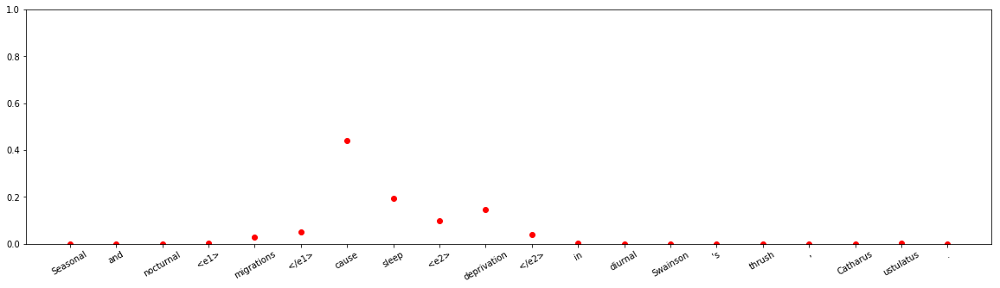


input sentence: We are happy to relay the <e1> news </e1> that the various <e2> rights issues </e2> have been resolved .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.57495975
Entity-Destination(e1,e2) 	:	 1.7430212e-12
Cause-Effect(e2,e1) 	:	 3.7447066e-11
Member-Collection(e2,e1) 	:	 8.6486296e-10
Entity-Origin(e1,e2) 	:	 1.5716519e-12
Message-Topic(e1,e2) 	:	 0.42503855
Component-Whole(e1,e2) 	:	 4.195207e-08
Component-Whole(e2,e1) 	:	 4.7469902e-07
Instrument-Agency(e2,e1) 	:	 3.392309e-10
Content-Container(e1,e2) 	:	 3.1681626e-09
Product-Producer(e2,e1) 	:	 7.151074e-11
Cause-Effect(e1,e2) 	:	 2.8515356e-07
Product-Producer(e1,e2) 	:	 2.264348e-09
Content-Container(e2,e1) 	:	 8.6796154e-10
Entity-Origin(e2,e1) 	:	 2.1734359e-09
Message-Topic(e2,e1) 	:	 6.6466754e-07
Instrument-Agency(e1,e2) 	:	 1.5331737e-07
Member-Collection(e1,e2) 	:	 4.1243113e-11
Entity-Destination(e2,e1) 	:	 6.993148e-12



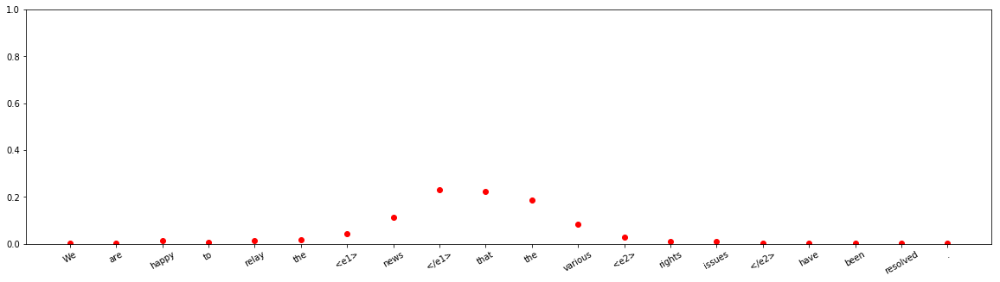



input sentence: We sailed to Neptune 's Grotto on one of the boat <e1> excursions </e1> from the <e2> harbour </e2> .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 5.6727084e-10
Entity-Destination(e1,e2) 	:	 4.2764064e-08
Cause-Effect(e2,e1) 	:	 1.9776646e-08
Member-Collection(e2,e1) 	:	 4.827567e-11
Entity-Origin(e1,e2) 	:	 0.99999976
Message-Topic(e1,e2) 	:	 1.1829502e-13
Component-Whole(e1,e2) 	:	 1.1000791e-08
Component-Whole(e2,e1) 	:	 3.6043366e-09
Instrument-Agency(e2,e1) 	:	 8.992822e-14
Content-Container(e1,e2) 	:	 1.7815607e-11
Product-Producer(e2,e1) 	:	 1.0611054e-14
Cause-Effect(e1,e2) 	:	 1.6115352e-16
Product-Producer(e1,e2) 	:	 1.6453411e-07
Content-Container(e2,e1) 	:	 1.0942421e-13
Entity-Origin(e2,e1) 	:	 3.7096243e-10
Message-Topic(e2,e1) 	:	 1.2528577e-08
Instrument-Agency(e1,e2) 	:	 2.0318809e-10
Member-Collection(e1,e2) 	:	 4.039275e-10
Entity-Destination(e2,e1) 	:	 3.2490623e-13



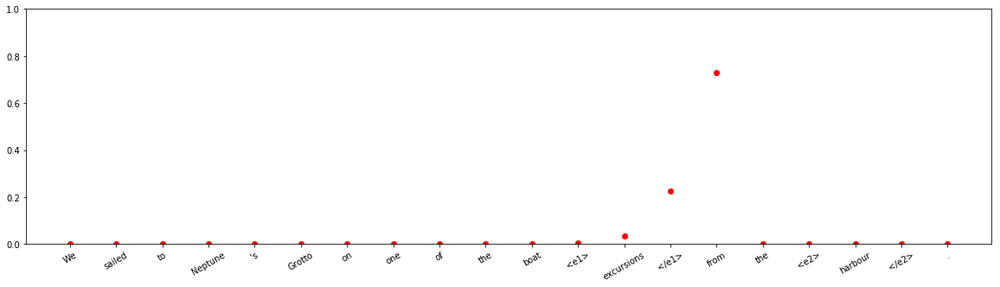


input sentence: A <e1> couple </e1> embraced next to vehicles piled up by flood <e2> waters </e2> in Tlalnepantla , Mexico .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 6.33803e-05
Entity-Destination(e1,e2) 	:	 9.6508836e-11
Cause-Effect(e2,e1) 	:	 2.4214993e-05
Member-Collection(e2,e1) 	:	 1.2956037e-05
Entity-Origin(e1,e2) 	:	 1.7200044e-05
Message-Topic(e1,e2) 	:	 3.861594e-10
Component-Whole(e1,e2) 	:	 3.2736846e-08
Component-Whole(e2,e1) 	:	 4.284813e-09
Instrument-Agency(e2,e1) 	:	 4.237531e-11
Content-Container(e1,e2) 	:	 9.2761375e-11
Product-Producer(e2,e1) 	:	 2.062722e-09
Cause-Effect(e1,e2) 	:	 1.4526131e-09
Product-Producer(e1,e2) 	:	 0.99985456
Content-Container(e2,e1) 	:	 7.307612e-10
Entity-Origin(e2,e1) 	:	 2.5963334e-09
Message-Topic(e2,e1) 	:	 1.8871877e-07
Instrument-Agency(e1,e2) 	:	 7.282734e-06
Member-Collection(e1,e2) 	:	 2.0164443e-05
Entity-Destination(e2,e1) 	:	 1.1877696e-10



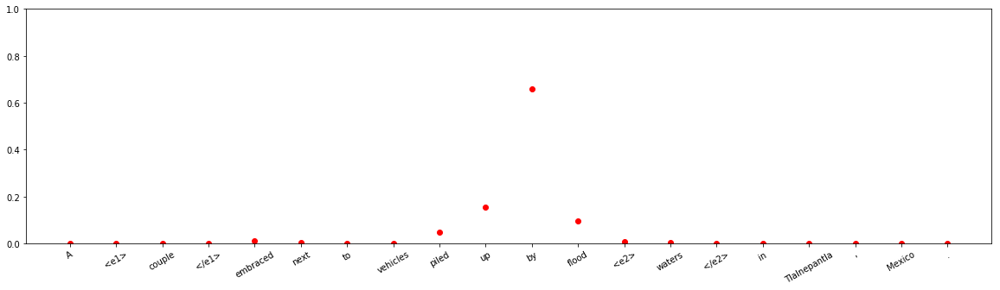














input sentence: The closely guarded Raffles <e1> recipe </e1> was locked in a <e2> safe </e2> that still remains onsite today .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 4.244419e-06
Entity-Destination(e1,e2) 	:	 5.420743e-06
Cause-Effect(e2,e1) 	:	 5.963791e-17
Member-Collection(e2,e1) 	:	 7.128425e-15
Entity-Origin(e1,e2) 	:	 9.678875e-10
Message-Topic(e1,e2) 	:	 1.543373e-13
Component-Whole(e1,e2) 	:	 1.7454944e-10
Component-Whole(e2,e1) 	:	 2.5816842e-12
Instrument-Agency(e2,e1) 	:	 8.995237e-15
Content-Container(e1,e2) 	:	 0.99999034
Product-Producer(e2,e1) 	:	 1.0896483e-12
Cause-Effect(e1,e2) 	:	 5.918851e-16
Product-Producer(e1,e2) 	:	 4.4411598e-14
Content-Container(e2,e1) 	:	 3.980942e-09
Entity-Origin(e2,e1) 	:	 2.2156758e-10
Message-Topic(e2,e1) 	:	 8.62333e-13
Instrument-Agency(e1,e2) 	:	 3.4169778e-10
Member-Collection(e1,e2) 	:	 5.294217e-10
Entity-Destination(e2,e1) 	:	 1.4124696e-13



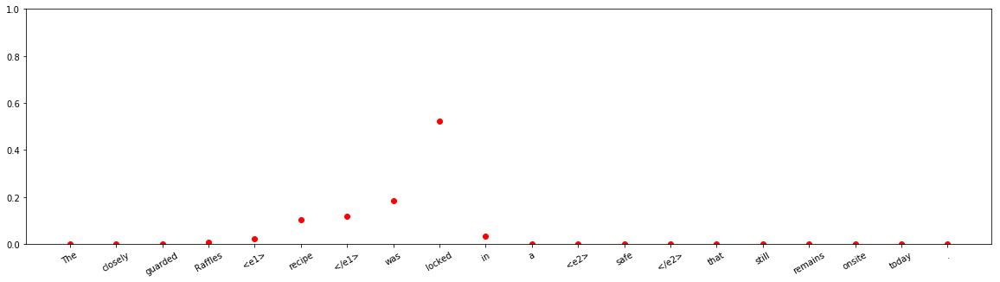





input sentence: Such interventions placed the <e1> general </e1> in a <e2> role </e2> that many within the profession considered inappropriate .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 1.4223787e-05
Entity-Destination(e1,e2) 	:	 0.035567846
Cause-Effect(e2,e1) 	:	 7.889606e-07
Member-Collection(e2,e1) 	:	 1.0888497e-06
Entity-Origin(e1,e2) 	:	 4.473022e-05
Message-Topic(e1,e2) 	:	 4.479547e-08
Component-Whole(e1,e2) 	:	 1.7350649e-05
Component-Whole(e2,e1) 	:	 5.5867144e-11
Instrument-Agency(e2,e1) 	:	 5.5073914e-09
Content-Container(e1,e2) 	:	 4.589023e-08
Product-Producer(e2,e1) 	:	 9.485259e-07
Cause-Effect(e1,e2) 	:	 2.0658954e-08
Product-Producer(e1,e2) 	:	 2.5308584e-09
Content-Container(e2,e1) 	:	 1.7984944e-10
Entity-Origin(e2,e1) 	:	 1.1943806e-09
Message-Topic(e2,e1) 	:	 0.8610999
Instrument-Agency(e1,e2) 	:	 4.15268e-09
Member-Collection(e1,e2) 	:	 0.10325293
Entity-Destination(e2,e1) 	:	 3.4005063e-10



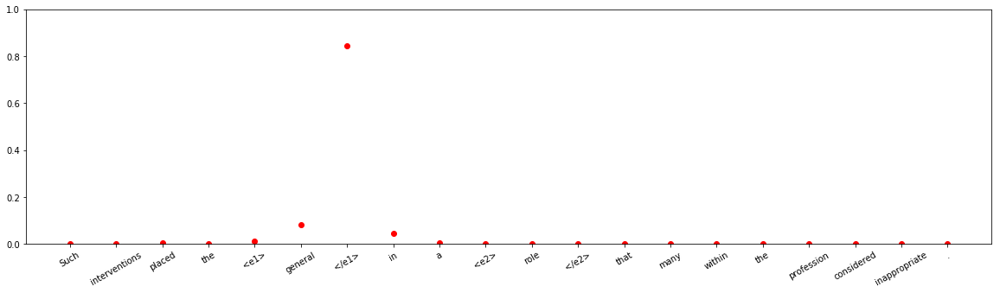




input sentence: The <e1> valley </e1> is France 's largest producer of sparkling <e2> wines </e2> outside of the Champagne region .
answer label:    Entity-Origin(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 9.835101e-11
Entity-Destination(e1,e2) 	:	 3.3662564e-10
Cause-Effect(e2,e1) 	:	 5.1131578e-11
Member-Collection(e2,e1) 	:	 4.0327202e-05
Entity-Origin(e1,e2) 	:	 0.006132913
Message-Topic(e1,e2) 	:	 2.997134e-11
Component-Whole(e1,e2) 	:	 1.0202825e-10
Component-Whole(e2,e1) 	:	 8.927501e-08
Instrument-Agency(e2,e1) 	:	 1.141941e-10
Content-Container(e1,e2) 	:	 6.546159e-10
Product-Producer(e2,e1) 	:	 0.9926952
Cause-Effect(e1,e2) 	:	 6.6514065e-07
Product-Producer(e1,e2) 	:	 0.00093633594
Content-Container(e2,e1) 	:	 1.7326832e-08
Entity-Origin(e2,e1) 	:	 0.0001936568
Message-Topic(e2,e1) 	:	 4.4433953e-08
Instrument-Agency(e1,e2) 	:	 5.6279486e-08
Member-Collection(e1,e2) 	:	 8.3331906e-07
Entity-Destination(e2,e1) 	:	 2.4310451e-11



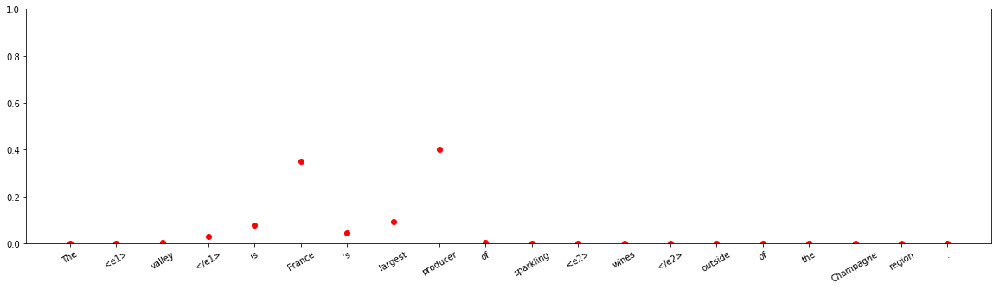


input sentence: Human <e1> growth </e1> <e2> hormone </e2> is described by some as the key to slowing the aging process .
answer label:    Cause-Effect(e2,e1)
wrong label:    Cause-Effect(e1,e2)
Other 	:	 0.009867247
Entity-Destination(e1,e2) 	:	 1.8753845e-08
Cause-Effect(e2,e1) 	:	 0.026266199
Member-Collection(e2,e1) 	:	 5.5349994e-07
Entity-Origin(e1,e2) 	:	 3.2679458e-07
Message-Topic(e1,e2) 	:	 4.5942896e-05
Component-Whole(e1,e2) 	:	 8.199632e-05
Component-Whole(e2,e1) 	:	 0.00030648932
Instrument-Agency(e2,e1) 	:	 7.6851386e-08
Content-Container(e1,e2) 	:	 2.0313752e-07
Product-Producer(e2,e1) 	:	 0.014304485
Cause-Effect(e1,e2) 	:	 0.9119522
Product-Producer(e1,e2) 	:	 0.00092252897
Content-Container(e2,e1) 	:	 2.8882513e-07
Entity-Origin(e2,e1) 	:	 4.938255e-05
Message-Topic(e2,e1) 	:	 0.03616678
Instrument-Agency(e1,e2) 	:	 1.6616548e-05
Member-Collection(e1,e2) 	:	 1.4519082e-05
Entity-Destination(e2,e1) 	:	 3.98439e-06



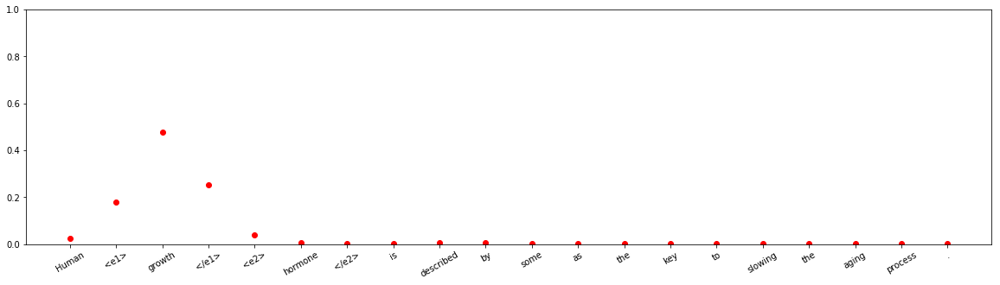



input sentence: My baby <e1> sister </e1> was lying asleep in a <e2> cradle </e2> next to my mom 's bed .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 0.00029792817
Entity-Destination(e1,e2) 	:	 0.0023951372
Cause-Effect(e2,e1) 	:	 7.178335e-11
Member-Collection(e2,e1) 	:	 5.2349674e-12
Entity-Origin(e1,e2) 	:	 2.9867419e-05
Message-Topic(e1,e2) 	:	 3.149013e-11
Component-Whole(e1,e2) 	:	 2.7300222e-05
Component-Whole(e2,e1) 	:	 7.73309e-09
Instrument-Agency(e2,e1) 	:	 1.2959278e-07
Content-Container(e1,e2) 	:	 0.9972494
Product-Producer(e2,e1) 	:	 6.511079e-10
Cause-Effect(e1,e2) 	:	 5.78465e-13
Product-Producer(e1,e2) 	:	 1.3085042e-11
Content-Container(e2,e1) 	:	 4.711105e-08
Entity-Origin(e2,e1) 	:	 2.648117e-10
Message-Topic(e2,e1) 	:	 4.2811322e-08
Instrument-Agency(e1,e2) 	:	 1.3755876e-09
Member-Collection(e1,e2) 	:	 2.092975e-07
Entity-Destination(e2,e1) 	:	 1.350483e-12



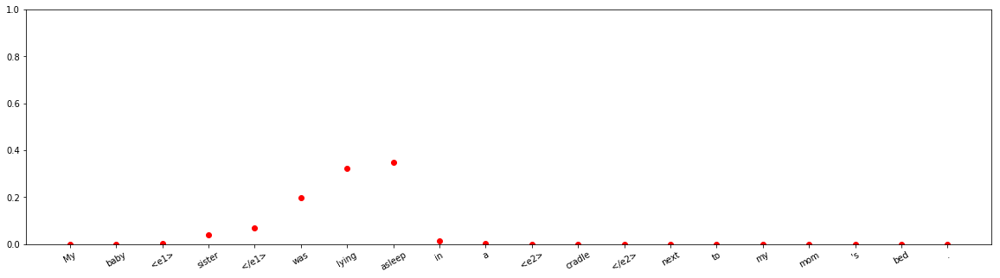


input sentence: The western region of Mauritania is the scene of a serious <e1> plague </e1> of desert <e2> locusts </e2> .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 3.2151077e-11
Entity-Destination(e1,e2) 	:	 2.374865e-09
Cause-Effect(e2,e1) 	:	 1.4578305e-07
Member-Collection(e2,e1) 	:	 0.9999912
Entity-Origin(e1,e2) 	:	 4.0006753e-09
Message-Topic(e1,e2) 	:	 9.578572e-10
Component-Whole(e1,e2) 	:	 2.393586e-10
Component-Whole(e2,e1) 	:	 2.472341e-11
Instrument-Agency(e2,e1) 	:	 7.674064e-11
Content-Container(e1,e2) 	:	 5.2602545e-12
Product-Producer(e2,e1) 	:	 1.3216079e-08
Cause-Effect(e1,e2) 	:	 6.662577e-07
Product-Producer(e1,e2) 	:	 1.8918163e-08
Content-Container(e2,e1) 	:	 2.199569e-09
Entity-Origin(e2,e1) 	:	 7.0336114e-06
Message-Topic(e2,e1) 	:	 2.3217305e-07
Instrument-Agency(e1,e2) 	:	 1.2220894e-08
Member-Collection(e1,e2) 	:	 6.9496616e-07
Entity-Destination(e2,e1) 	:	 1.0568275e-12



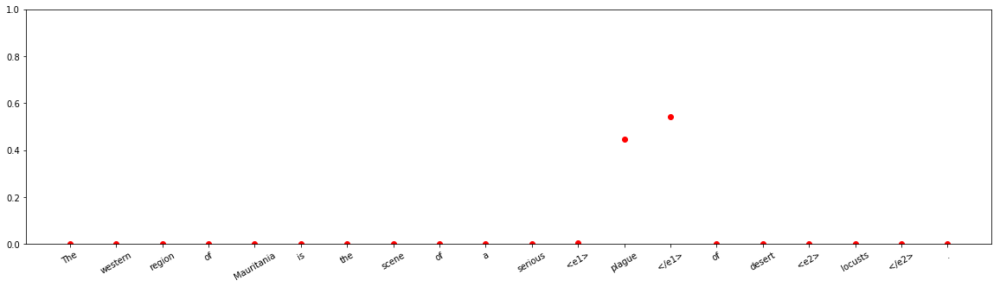








input sentence: An encapsulating composition is infused into the channel to encapsulate the <e1> tissue </e1> in a <e2> capsule </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.1364906e-08
Entity-Destination(e1,e2) 	:	 0.032485995
Cause-Effect(e2,e1) 	:	 5.1158682e-12
Member-Collection(e2,e1) 	:	 1.6499483e-12
Entity-Origin(e1,e2) 	:	 2.737291e-06
Message-Topic(e1,e2) 	:	 4.516325e-11
Component-Whole(e1,e2) 	:	 0.949456
Component-Whole(e2,e1) 	:	 9.6143114e-11
Instrument-Agency(e2,e1) 	:	 4.3103868e-11
Content-Container(e1,e2) 	:	 0.018043576
Product-Producer(e2,e1) 	:	 1.4559319e-09
Cause-Effect(e1,e2) 	:	 9.924465e-14
Product-Producer(e1,e2) 	:	 3.290444e-09
Content-Container(e2,e1) 	:	 1.1473061e-05
Entity-Origin(e2,e1) 	:	 1.3797955e-09
Message-Topic(e2,e1) 	:	 2.2196998e-10
Instrument-Agency(e1,e2) 	:	 1.8507204e-10
Member-Collection(e1,e2) 	:	 1.8748314e-07
Entity-Destination(e2,e1) 	:	 1.3047592e-11



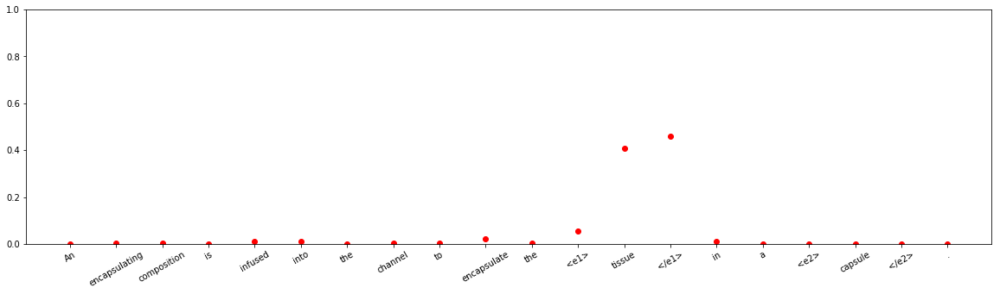








input sentence: The tribunal has jurisdiction over any <e1> dispute </e1> concerning the <e2> interpretation </e2> or application of other agreements .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.2254156e-10
Entity-Destination(e1,e2) 	:	 3.4419068e-17
Cause-Effect(e2,e1) 	:	 1.7176325e-15
Member-Collection(e2,e1) 	:	 5.177066e-13
Entity-Origin(e1,e2) 	:	 1.0587546e-17
Message-Topic(e1,e2) 	:	 0.9999999
Component-Whole(e1,e2) 	:	 8.596475e-14
Component-Whole(e2,e1) 	:	 2.45578e-16
Instrument-Agency(e2,e1) 	:	 1.2738914e-16
Content-Container(e1,e2) 	:	 5.8747283e-16
Product-Producer(e2,e1) 	:	 1.3080001e-11
Cause-Effect(e1,e2) 	:	 3.2692817e-11
Product-Producer(e1,e2) 	:	 1.6570348e-11
Content-Container(e2,e1) 	:	 2.6972407e-15
Entity-Origin(e2,e1) 	:	 3.8770286e-13
Message-Topic(e2,e1) 	:	 1.7002256e-07
Instrument-Agency(e1,e2) 	:	 2.2475659e-13
Member-Collection(e1,e2) 	:	 4.512135e-16
Entity-Destination(e2,e1) 	:	 7.183744e-15



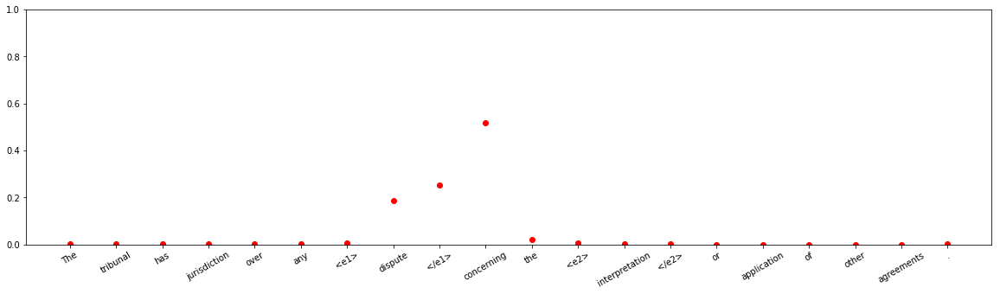



input sentence: The <e1> fire </e1> originated in an <e2> area </e2> of the plant housing cement mixing and lifting equipment .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.5372114e-13
Entity-Destination(e1,e2) 	:	 8.270438e-07
Cause-Effect(e2,e1) 	:	 0.99775296
Member-Collection(e2,e1) 	:	 8.1285683e-13
Entity-Origin(e1,e2) 	:	 0.0022461829
Message-Topic(e1,e2) 	:	 9.486252e-17
Component-Whole(e1,e2) 	:	 3.9432826e-09
Component-Whole(e2,e1) 	:	 4.0109235e-12
Instrument-Agency(e2,e1) 	:	 7.253313e-14
Content-Container(e1,e2) 	:	 4.91729e-11
Product-Producer(e2,e1) 	:	 7.1927026e-12
Cause-Effect(e1,e2) 	:	 1.160766e-10
Product-Producer(e1,e2) 	:	 2.6974478e-09
Content-Container(e2,e1) 	:	 1.02488086e-13
Entity-Origin(e2,e1) 	:	 1.5655248e-10
Message-Topic(e2,e1) 	:	 1.83929e-08
Instrument-Agency(e1,e2) 	:	 4.2783103e-13
Member-Collection(e1,e2) 	:	 3.7459763e-10
Entity-Destination(e2,e1) 	:	 9.862564e-13



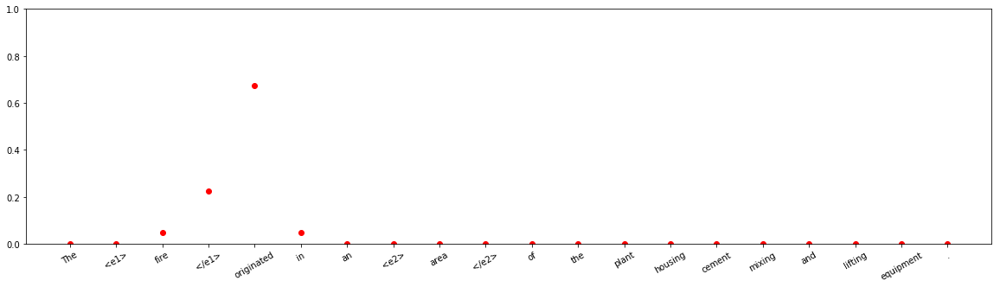















input sentence: The <e1> decedent </e1> had left the nursery supply company 's main <e2> yard </e2> earlier in the day .
answer label:    Entity-Origin(e1,e2)
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.026097832
Entity-Destination(e1,e2) 	:	 3.811775e-08
Cause-Effect(e2,e1) 	:	 2.9078896e-07
Member-Collection(e2,e1) 	:	 3.310207e-11
Entity-Origin(e1,e2) 	:	 0.0020107636
Message-Topic(e1,e2) 	:	 4.6045678e-11
Component-Whole(e1,e2) 	:	 1.2879423e-09
Component-Whole(e2,e1) 	:	 1.975636e-10
Instrument-Agency(e2,e1) 	:	 1.3984516e-06
Content-Container(e1,e2) 	:	 1.6015562e-07
Product-Producer(e2,e1) 	:	 0.9718161
Cause-Effect(e1,e2) 	:	 1.3401906e-06
Product-Producer(e1,e2) 	:	 6.5549364e-05
Content-Container(e2,e1) 	:	 3.7646945e-08
Entity-Origin(e2,e1) 	:	 2.3648583e-06
Message-Topic(e2,e1) 	:	 5.4829293e-08
Instrument-Agency(e1,e2) 	:	 3.7145966e-07
Member-Collection(e1,e2) 	:	 3.6686024e-06
Entity-Destination(e2,e1) 	:	 9.541987e-11



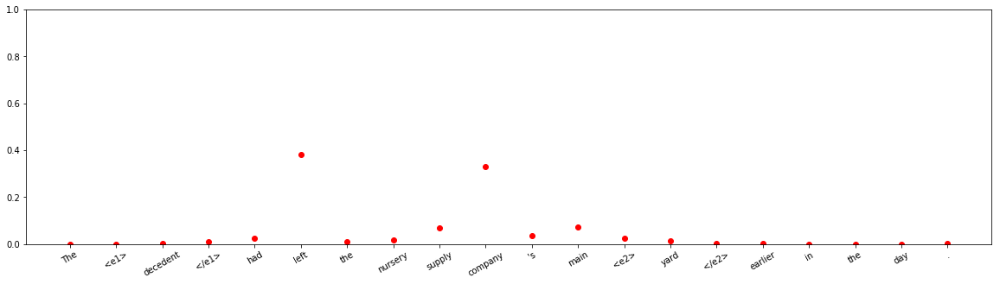




input sentence: This category classifies military units and <e1> formations </e1> by the <e2> year </e2> in which they were established .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 0.26322764
Entity-Destination(e1,e2) 	:	 1.067157e-10
Cause-Effect(e2,e1) 	:	 0.0002207998
Member-Collection(e2,e1) 	:	 2.0230542e-10
Entity-Origin(e1,e2) 	:	 1.7740976e-07
Message-Topic(e1,e2) 	:	 6.2478633e-12
Component-Whole(e1,e2) 	:	 0.0019150657
Component-Whole(e2,e1) 	:	 2.2662354e-07
Instrument-Agency(e2,e1) 	:	 2.2351747e-09
Content-Container(e1,e2) 	:	 4.748528e-09
Product-Producer(e2,e1) 	:	 2.5184644e-08
Cause-Effect(e1,e2) 	:	 3.4995784e-11
Product-Producer(e1,e2) 	:	 0.6957735
Content-Container(e2,e1) 	:	 5.8498273e-10
Entity-Origin(e2,e1) 	:	 5.7182495e-11
Message-Topic(e2,e1) 	:	 6.385679e-06
Instrument-Agency(e1,e2) 	:	 0.03885497
Member-Collection(e1,e2) 	:	 1.2513044e-06
Entity-Destination(e2,e1) 	:	 3.9423968e-11



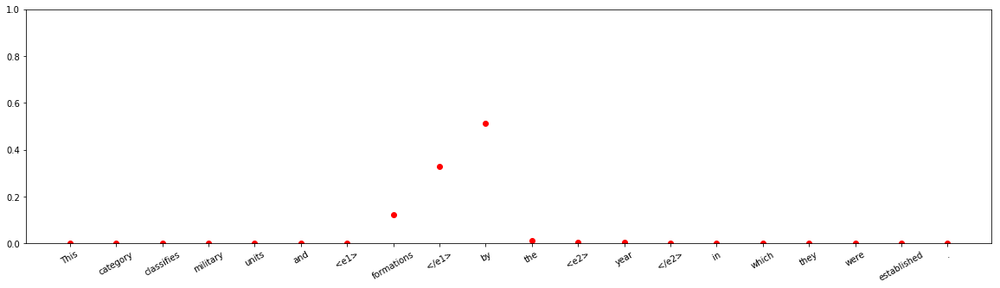



input sentence: Recall that in the Blink application , the <e1> timers </e1> were started from the booted <e2> event </e2> .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 5.0639756e-06
Entity-Destination(e1,e2) 	:	 1.7737936e-08
Cause-Effect(e2,e1) 	:	 0.013516247
Member-Collection(e2,e1) 	:	 2.1989499e-11
Entity-Origin(e1,e2) 	:	 0.98639363
Message-Topic(e1,e2) 	:	 2.1374534e-16
Component-Whole(e1,e2) 	:	 3.9336883e-05
Component-Whole(e2,e1) 	:	 2.499783e-06
Instrument-Agency(e2,e1) 	:	 4.4589613e-11
Content-Container(e1,e2) 	:	 7.866607e-07
Product-Producer(e2,e1) 	:	 5.263903e-10
Cause-Effect(e1,e2) 	:	 1.1353733e-11
Product-Producer(e1,e2) 	:	 3.8268317e-05
Content-Container(e2,e1) 	:	 1.3972039e-12
Entity-Origin(e2,e1) 	:	 2.2735889e-09
Message-Topic(e2,e1) 	:	 4.136038e-06
Instrument-Agency(e1,e2) 	:	 9.42646e-09
Member-Collection(e1,e2) 	:	 1.5571128e-08
Entity-Destination(e2,e1) 	:	 3.6881947e-10



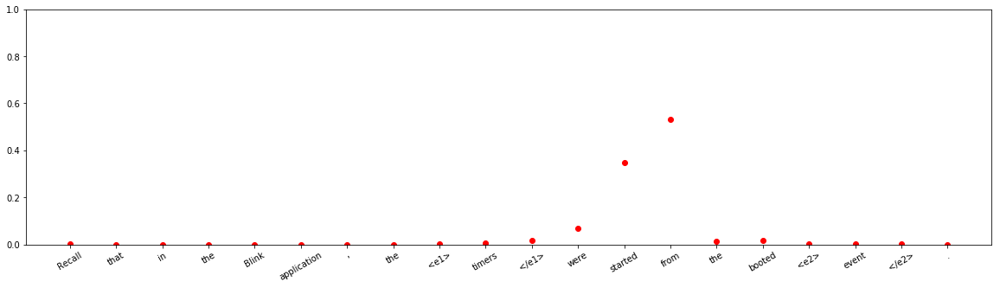





input sentence: This adorable <e1> necklace </e1> is made with fine silver plated <e2> chain </e2> and is 20 '' long .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.20163481
Entity-Destination(e1,e2) 	:	 1.4897377e-11
Cause-Effect(e2,e1) 	:	 6.2393347e-06
Member-Collection(e2,e1) 	:	 1.4751035e-10
Entity-Origin(e1,e2) 	:	 2.3928058e-05
Message-Topic(e1,e2) 	:	 5.7091363e-11
Component-Whole(e1,e2) 	:	 6.932111e-09
Component-Whole(e2,e1) 	:	 0.7955381
Instrument-Agency(e2,e1) 	:	 3.634585e-08
Content-Container(e1,e2) 	:	 0.0027815097
Product-Producer(e2,e1) 	:	 2.0206117e-07
Cause-Effect(e1,e2) 	:	 2.0299355e-08
Product-Producer(e1,e2) 	:	 4.972724e-06
Content-Container(e2,e1) 	:	 7.3364436e-06
Entity-Origin(e2,e1) 	:	 5.096854e-09
Message-Topic(e2,e1) 	:	 1.2410867e-06
Instrument-Agency(e1,e2) 	:	 1.84231e-06
Member-Collection(e1,e2) 	:	 3.6812315e-12
Entity-Destination(e2,e1) 	:	 3.2355214e-09



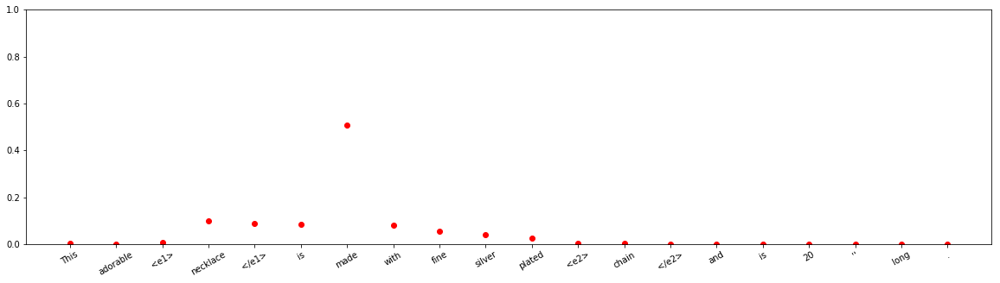



input sentence: Some part of the <e1> train </e1> was inside a <e2> tunnel </e2> and the remaining on the ramp .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 2.919464e-09
Entity-Destination(e1,e2) 	:	 5.890558e-08
Cause-Effect(e2,e1) 	:	 3.7127102e-13
Member-Collection(e2,e1) 	:	 1.2753981e-12
Entity-Origin(e1,e2) 	:	 2.0349323e-06
Message-Topic(e1,e2) 	:	 4.7980446e-14
Component-Whole(e1,e2) 	:	 5.4384617e-07
Component-Whole(e2,e1) 	:	 1.5210165e-05
Instrument-Agency(e2,e1) 	:	 8.154615e-12
Content-Container(e1,e2) 	:	 0.9999821
Product-Producer(e2,e1) 	:	 2.5769659e-11
Cause-Effect(e1,e2) 	:	 3.5878182e-13
Product-Producer(e1,e2) 	:	 5.9192146e-14
Content-Container(e2,e1) 	:	 1.206645e-09
Entity-Origin(e2,e1) 	:	 2.7178758e-11
Message-Topic(e2,e1) 	:	 1.7577245e-10
Instrument-Agency(e1,e2) 	:	 1.6466752e-10
Member-Collection(e1,e2) 	:	 1.0271291e-10
Entity-Destination(e2,e1) 	:	 1.7108258e-13



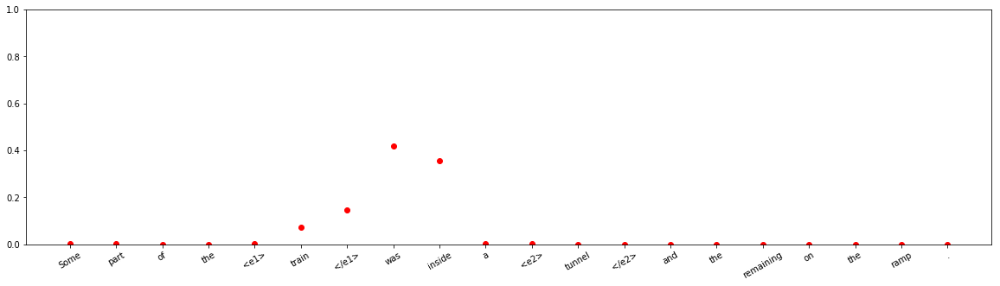






input sentence: We describe the design and synthesis of a ferroelectric liquid <e1> crystal </e1> composed of racemic <e2> molecules </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Content-Container(e2,e1)
Other 	:	 0.111739285
Entity-Destination(e1,e2) 	:	 1.2248416e-09
Cause-Effect(e2,e1) 	:	 3.5260624e-07
Member-Collection(e2,e1) 	:	 0.06723615
Entity-Origin(e1,e2) 	:	 0.010146972
Message-Topic(e1,e2) 	:	 6.090305e-07
Component-Whole(e1,e2) 	:	 8.419346e-06
Component-Whole(e2,e1) 	:	 0.26831907
Instrument-Agency(e2,e1) 	:	 6.2212973e-07
Content-Container(e1,e2) 	:	 0.015182584
Product-Producer(e2,e1) 	:	 0.010116246
Cause-Effect(e1,e2) 	:	 0.00019515042
Product-Producer(e1,e2) 	:	 5.963916e-06
Content-Container(e2,e1) 	:	 0.51628983
Entity-Origin(e2,e1) 	:	 0.0007239404
Message-Topic(e2,e1) 	:	 6.473899e-08
Instrument-Agency(e1,e2) 	:	 3.3075237e-05
Member-Collection(e1,e2) 	:	 1.6886613e-06
Entity-Destination(e2,e1) 	:	 4.7235414e-08



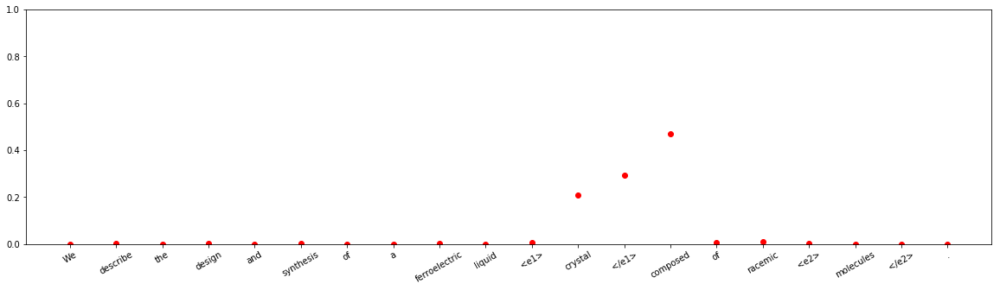



input sentence: Seismologists are keeping an eye on a recent <e1> swarm </e1> of small <e2> earthquakes </e2> in Sun Valley .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 6.6559453e-13
Entity-Destination(e1,e2) 	:	 5.0604117e-12
Cause-Effect(e2,e1) 	:	 5.2903876e-11
Member-Collection(e2,e1) 	:	 0.99999976
Entity-Origin(e1,e2) 	:	 1.020994e-11
Message-Topic(e1,e2) 	:	 2.9362594e-08
Component-Whole(e1,e2) 	:	 2.280015e-08
Component-Whole(e2,e1) 	:	 1.1196788e-09
Instrument-Agency(e2,e1) 	:	 7.8928324e-13
Content-Container(e1,e2) 	:	 1.1865205e-13
Product-Producer(e2,e1) 	:	 3.0024955e-10
Cause-Effect(e1,e2) 	:	 1.7050512e-07
Product-Producer(e1,e2) 	:	 1.6981185e-09
Content-Container(e2,e1) 	:	 4.6996934e-10
Entity-Origin(e2,e1) 	:	 8.757378e-12
Message-Topic(e2,e1) 	:	 3.184929e-11
Instrument-Agency(e1,e2) 	:	 2.043565e-09
Member-Collection(e1,e2) 	:	 9.1197386e-08
Entity-Destination(e2,e1) 	:	 2.3338497e-14



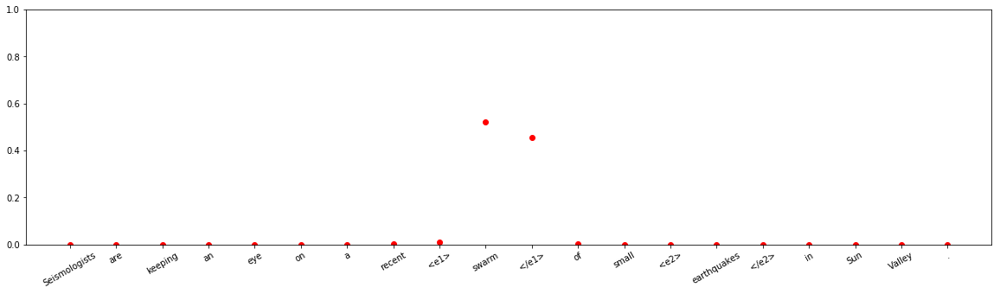




















input sentence: The <e1> singer </e1> demonstrates his sensitivity during the <e2> song </e2> by suggesting that he would bring flowers .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 4.5565434e-05
Entity-Destination(e1,e2) 	:	 1.8258279e-11
Cause-Effect(e2,e1) 	:	 6.164406e-08
Member-Collection(e2,e1) 	:	 1.2567419e-12
Entity-Origin(e1,e2) 	:	 9.371486e-07
Message-Topic(e1,e2) 	:	 2.2349294e-09
Component-Whole(e1,e2) 	:	 1.0720532e-08
Component-Whole(e2,e1) 	:	 1.8587706e-10
Instrument-Agency(e2,e1) 	:	 0.028533643
Content-Container(e1,e2) 	:	 1.5444411e-10
Product-Producer(e2,e1) 	:	 0.8927681
Cause-Effect(e1,e2) 	:	 2.123203e-07
Product-Producer(e1,e2) 	:	 1.5534535e-08
Content-Container(e2,e1) 	:	 6.6313144e-12
Entity-Origin(e2,e1) 	:	 7.361479e-12
Message-Topic(e2,e1) 	:	 0.07865089
Instrument-Agency(e1,e2) 	:	 1.3825757e-10
Member-Collection(e1,e2) 	:	 5.5904763e-07
Entity-Destination(e2,e1) 	:	 2.4718517e-12



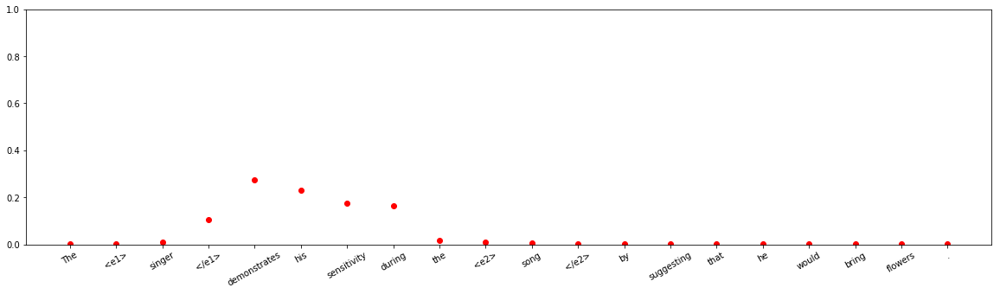


input sentence: The <e1> cells </e1> inside a nested <e2> table </e2> are isolated from changes made to the outer table .
answer label:    Component-Whole(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 1.1869655e-06
Entity-Destination(e1,e2) 	:	 3.113565e-05
Cause-Effect(e2,e1) 	:	 1.4644545e-12
Member-Collection(e2,e1) 	:	 6.824917e-11
Entity-Origin(e1,e2) 	:	 8.5072934e-05
Message-Topic(e1,e2) 	:	 1.6214525e-11
Component-Whole(e1,e2) 	:	 0.25566027
Component-Whole(e2,e1) 	:	 1.0824689e-08
Instrument-Agency(e2,e1) 	:	 8.608921e-09
Content-Container(e1,e2) 	:	 0.74407166
Product-Producer(e2,e1) 	:	 0.0001218867
Cause-Effect(e1,e2) 	:	 1.7516755e-13
Product-Producer(e1,e2) 	:	 2.2859323e-09
Content-Container(e2,e1) 	:	 1.2137024e-05
Entity-Origin(e2,e1) 	:	 3.0839963e-08
Message-Topic(e2,e1) 	:	 4.6069817e-07
Instrument-Agency(e1,e2) 	:	 5.799166e-10
Member-Collection(e1,e2) 	:	 1.6232676e-05
Entity-Destination(e2,e1) 	:	 5.4663496e-10



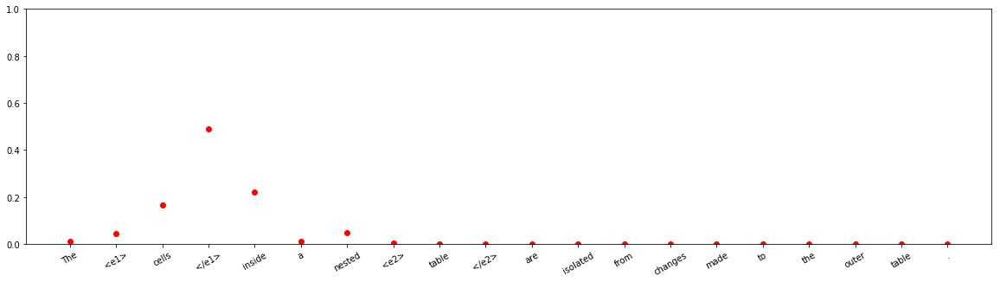


input sentence: Here are the amazing <e1> arrangements </e1> from this months <e2> demonstrator </e2> , fantastic , brilliant and stunning .
answer label:    Product-Producer(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.7992018e-08
Entity-Destination(e1,e2) 	:	 4.0992515e-11
Cause-Effect(e2,e1) 	:	 9.744139e-08
Member-Collection(e2,e1) 	:	 4.7093274e-11
Entity-Origin(e1,e2) 	:	 0.92422247
Message-Topic(e1,e2) 	:	 8.7853444e-13
Component-Whole(e1,e2) 	:	 2.588171e-09
Component-Whole(e2,e1) 	:	 1.4138584e-08
Instrument-Agency(e2,e1) 	:	 2.692161e-12
Content-Container(e1,e2) 	:	 1.5484342e-07
Product-Producer(e2,e1) 	:	 1.3986862e-10
Cause-Effect(e1,e2) 	:	 1.6949138e-14
Product-Producer(e1,e2) 	:	 0.075772464
Content-Container(e2,e1) 	:	 1.3299796e-11
Entity-Origin(e2,e1) 	:	 6.1888566e-10
Message-Topic(e2,e1) 	:	 6.710152e-07
Instrument-Agency(e1,e2) 	:	 4.1721833e-06
Member-Collection(e1,e2) 	:	 2.277546e-08
Entity-Destination(e2,e1) 	:	 9.0111973e-13



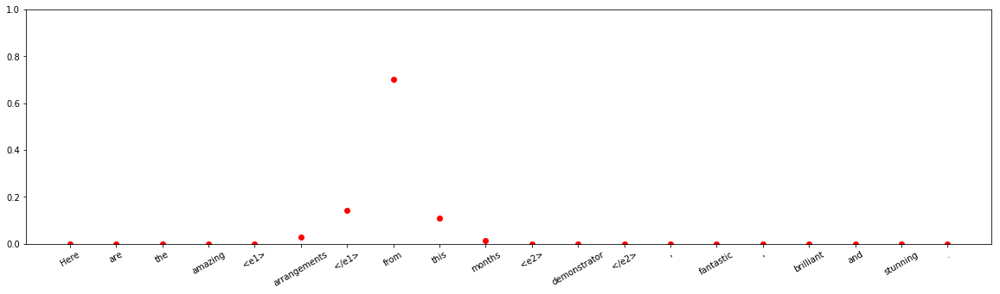








input sentence: The opening lay just below the exit of the left subclavian <e1> artery </e1> from the <e2> arch </e2> .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 0.00018095344
Entity-Destination(e1,e2) 	:	 4.524211e-09
Cause-Effect(e2,e1) 	:	 2.797848e-05
Member-Collection(e2,e1) 	:	 3.817878e-13
Entity-Origin(e1,e2) 	:	 0.99811804
Message-Topic(e1,e2) 	:	 4.390032e-15
Component-Whole(e1,e2) 	:	 0.0016288158
Component-Whole(e2,e1) 	:	 1.4198518e-07
Instrument-Agency(e2,e1) 	:	 3.1442995e-10
Content-Container(e1,e2) 	:	 5.6105026e-08
Product-Producer(e2,e1) 	:	 6.8324712e-12
Cause-Effect(e1,e2) 	:	 9.529092e-15
Product-Producer(e1,e2) 	:	 4.3835615e-05
Content-Container(e2,e1) 	:	 4.9376847e-10
Entity-Origin(e2,e1) 	:	 4.1298884e-10
Message-Topic(e2,e1) 	:	 1.637606e-11
Instrument-Agency(e1,e2) 	:	 2.706401e-07
Member-Collection(e1,e2) 	:	 8.959336e-08
Entity-Destination(e2,e1) 	:	 2.7145586e-11



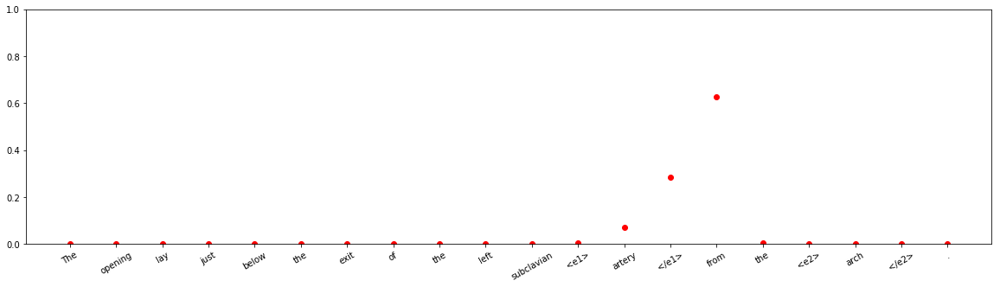









input sentence: But few anticipated that a small-scale <e1> production </e1> by a young <e2> playwright </e2> could spark the violent confrontation that this weekend resulted in thousands of pounds worth of damage and clashes with riot police at Birmingham Repertory Theatre .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 4.6119553e-08
Entity-Destination(e1,e2) 	:	 4.5297065e-17
Cause-Effect(e2,e1) 	:	 1.252081e-09
Member-Collection(e2,e1) 	:	 1.02546975e-14
Entity-Origin(e1,e2) 	:	 5.269854e-11
Message-Topic(e1,e2) 	:	 1.2140727e-16
Component-Whole(e1,e2) 	:	 2.7442575e-14
Component-Whole(e2,e1) 	:	 2.2427925e-12
Instrument-Agency(e2,e1) 	:	 2.741001e-16
Content-Container(e1,e2) 	:	 1.9264991e-15
Product-Producer(e2,e1) 	:	 7.303052e-12
Cause-Effect(e1,e2) 	:	 3.0747226e-15
Product-Producer(e1,e2) 	:	 1.0
Content-Container(e2,e1) 	:	 2.5034006e-19
Entity-Origin(e2,e1) 	:	 1.0640747e-18
Message-Topic(e2,e1) 	:	 3.3426037e-09
Instrument-Agency(e1,e2) 	:

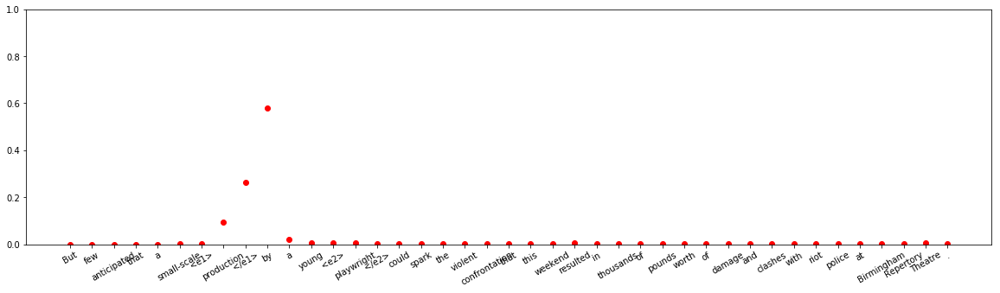





input sentence: In 1974 , the American sociologist David L. Phillips showed that publications of suicides on the <e1> frontpage </e1> of the <e2> news paper </e2> were followed by an increase in national suicide rates in the month after the publication .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.9485127
Entity-Destination(e1,e2) 	:	 9.6121765e-12
Cause-Effect(e2,e1) 	:	 1.4733902e-07
Member-Collection(e2,e1) 	:	 9.387036e-09
Entity-Origin(e1,e2) 	:	 3.7038214e-10
Message-Topic(e1,e2) 	:	 5.192913e-08
Component-Whole(e1,e2) 	:	 0.037530825
Component-Whole(e2,e1) 	:	 5.353867e-10
Instrument-Agency(e2,e1) 	:	 1.9507992e-05
Content-Container(e1,e2) 	:	 2.705251e-09
Product-Producer(e2,e1) 	:	 0.005691111
Cause-Effect(e1,e2) 	:	 1.1018267e-08
Product-Producer(e1,e2) 	:	 5.3361127e-08
Content-Container(e2,e1) 	:	 2.6294515e-09
Entity-Origin(e2,e1) 	:	 2.5830256e-11
Message-Topic(e2,e1) 	:	 0.008245599
Instrument-Agency(e1,e2) 	:	 7.658038e-10
Member-Collec

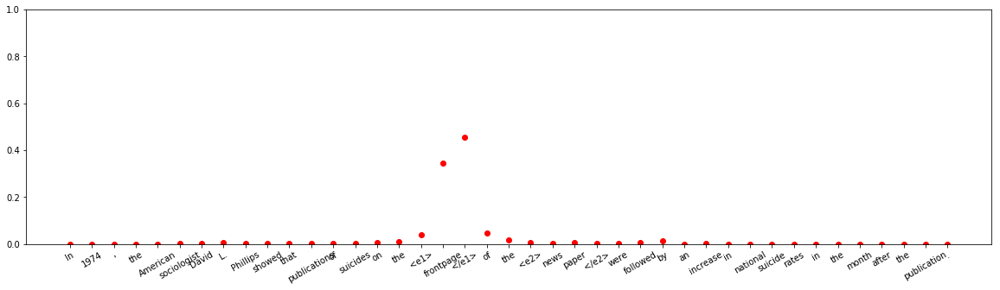







input sentence: By dividing the <e1> space </e1> in a kitchen <e2> drawer </e2> where you keep all your cooking utensils , you grouped items by size or purpose .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 2.367543e-06
Entity-Destination(e1,e2) 	:	 0.0009687611
Cause-Effect(e2,e1) 	:	 3.3483725e-13
Member-Collection(e2,e1) 	:	 3.5212722e-10
Entity-Origin(e1,e2) 	:	 1.1865745e-07
Message-Topic(e1,e2) 	:	 1.4611393e-13
Component-Whole(e1,e2) 	:	 0.2287355
Component-Whole(e2,e1) 	:	 2.8379425e-08
Instrument-Agency(e2,e1) 	:	 8.97376e-09
Content-Container(e1,e2) 	:	 0.77026814
Product-Producer(e2,e1) 	:	 2.4061415e-09
Cause-Effect(e1,e2) 	:	 6.781175e-15
Product-Producer(e1,e2) 	:	 2.1454684e-10
Content-Container(e2,e1) 	:	 2.4927844e-05
Entity-Origin(e2,e1) 	:	 2.7717058e-11
Message-Topic(e2,e1) 	:	 1.8327075e-09
Instrument-Agency(e1,e2) 	:	 2.0811628e-09
Member-Collection(e1,e2) 	:	 2.0257842e-07
Entity-Destination(e2,e1) 	:	 1.974106e-10



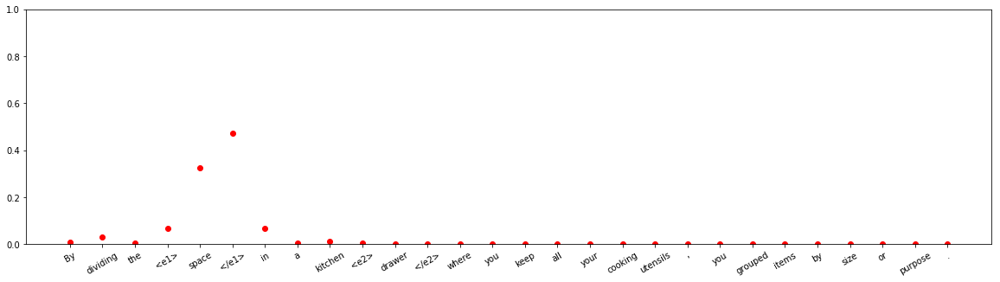










input sentence: The aircraft was written off in the <e1> accident </e1> due to the severe <e2> impact </e2> caused by the KLM aircraft , and the resulting fire .
answer label:    Cause-Effect(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 8.405321e-08
Entity-Destination(e1,e2) 	:	 9.279452e-09
Cause-Effect(e2,e1) 	:	 0.9986553
Member-Collection(e2,e1) 	:	 9.443211e-14
Entity-Origin(e1,e2) 	:	 5.6269946e-13
Message-Topic(e1,e2) 	:	 3.4730194e-12
Component-Whole(e1,e2) 	:	 1.3191935e-11
Component-Whole(e2,e1) 	:	 1.5001905e-13
Instrument-Agency(e2,e1) 	:	 2.0080647e-11
Content-Container(e1,e2) 	:	 3.0556665e-15
Product-Producer(e2,e1) 	:	 1.2392595e-13
Cause-Effect(e1,e2) 	:	 0.0013445714
Product-Producer(e1,e2) 	:	 5.378997e-11
Content-Container(e2,e1) 	:	 2.1078478e-15
Entity-Origin(e2,e1) 	:	 8.054304e-13
Message-Topic(e2,e1) 	:	 1.2384466e-09
Instrument-Agency(e1,e2) 	:	 5.936023e-11
Member-Collection(e1,e2) 	:	 6.398207e-10
Entity-Destination(e2,e1) 	:	 2.001502e-12



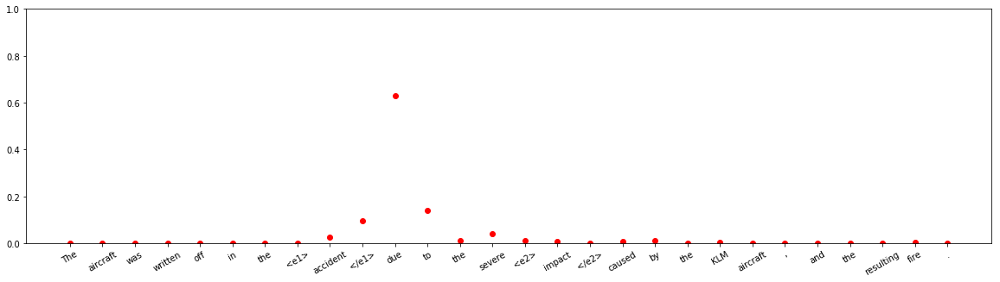






input sentence: For example , the photo at the top of the page shows a <e1> pilot </e1> 's emergency <e2> kit </e2> with a watch type compass included .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.07038017
Entity-Destination(e1,e2) 	:	 3.5622633e-10
Cause-Effect(e2,e1) 	:	 6.731198e-07
Member-Collection(e2,e1) 	:	 1.4127278e-07
Entity-Origin(e1,e2) 	:	 6.320242e-08
Message-Topic(e1,e2) 	:	 1.0055054e-06
Component-Whole(e1,e2) 	:	 0.000364991
Component-Whole(e2,e1) 	:	 0.5342416
Instrument-Agency(e2,e1) 	:	 0.39193413
Content-Container(e1,e2) 	:	 4.64403e-06
Product-Producer(e2,e1) 	:	 1.4636813e-06
Cause-Effect(e1,e2) 	:	 2.6437904e-08
Product-Producer(e1,e2) 	:	 2.4036191e-05
Content-Container(e2,e1) 	:	 7.94134e-09
Entity-Origin(e2,e1) 	:	 1.7460143e-10
Message-Topic(e2,e1) 	:	 1.4196063e-05
Instrument-Agency(e1,e2) 	:	 0.0030325684
Member-Collection(e1,e2) 	:	 2.4603198e-08
Entity-Destination(e2,e1) 	:	 3.0389054e-07



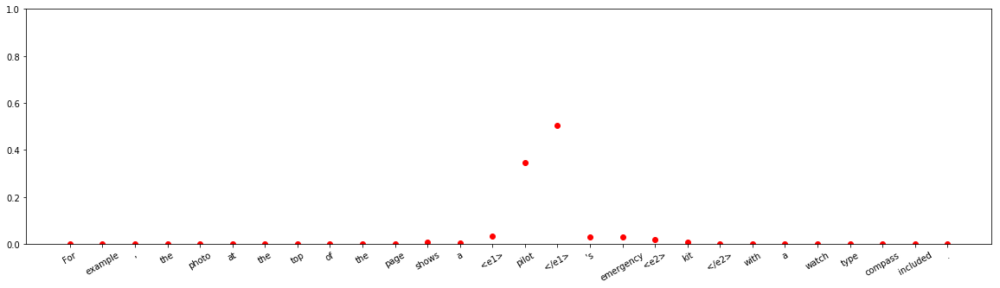



input sentence: The difference , though , is that this research targeted the <e1> phagocytes </e1> with the polymer <e2> nanoparticles </e2> , and not the cancer cells themselves .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.04904048
Entity-Destination(e1,e2) 	:	 5.6322954e-12
Cause-Effect(e2,e1) 	:	 1.2087485e-06
Member-Collection(e2,e1) 	:	 2.9176664e-10
Entity-Origin(e1,e2) 	:	 6.845639e-09
Message-Topic(e1,e2) 	:	 4.3726286e-12
Component-Whole(e1,e2) 	:	 0.00019401389
Component-Whole(e2,e1) 	:	 0.8907562
Instrument-Agency(e2,e1) 	:	 0.059998214
Content-Container(e1,e2) 	:	 1.0727572e-06
Product-Producer(e2,e1) 	:	 3.7079842e-06
Cause-Effect(e1,e2) 	:	 9.4880175e-09
Product-Producer(e1,e2) 	:	 2.7578086e-08
Content-Container(e2,e1) 	:	 2.334198e-06
Entity-Origin(e2,e1) 	:	 6.257232e-12
Message-Topic(e2,e1) 	:	 2.580689e-09
Instrument-Agency(e1,e2) 	:	 2.896022e-06
Member-Collection(e1,e2) 	:	 2.2069811e-12
Entity-Destination(e2,e1) 	:	 1.6169471e-10



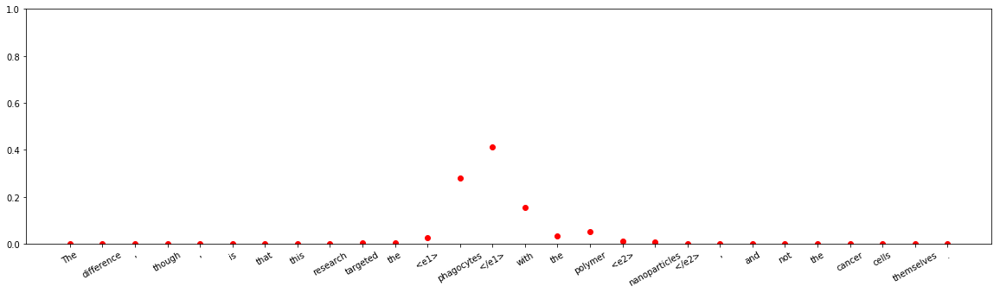




input sentence: The <e1> company </e1> has mocked up a <e2> version </e2> of YouTube built around the HTML5 video tag , playing mini-movies inside a browser sans plug-ins .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 7.456487e-12
Entity-Destination(e1,e2) 	:	 3.749394e-15
Cause-Effect(e2,e1) 	:	 7.6391764e-17
Member-Collection(e2,e1) 	:	 3.8636785e-15
Entity-Origin(e1,e2) 	:	 9.91449e-14
Message-Topic(e1,e2) 	:	 1.4595937e-16
Component-Whole(e1,e2) 	:	 3.0913153e-16
Component-Whole(e2,e1) 	:	 1.0145349e-09
Instrument-Agency(e2,e1) 	:	 2.4951985e-10
Content-Container(e1,e2) 	:	 4.7632775e-15
Product-Producer(e2,e1) 	:	 1.0
Cause-Effect(e1,e2) 	:	 5.994481e-13
Product-Producer(e1,e2) 	:	 1.4693246e-13
Content-Container(e2,e1) 	:	 3.2362158e-14
Entity-Origin(e2,e1) 	:	 2.3708437e-17
Message-Topic(e2,e1) 	:	 2.2915927e-10
Instrument-Agency(e1,e2) 	:	 1.6364836e-15
Member-Collection(e1,e2) 	:	 2.1697427e-15
Entity-Destination(e2,e1) 	:	 2.6277506e-17



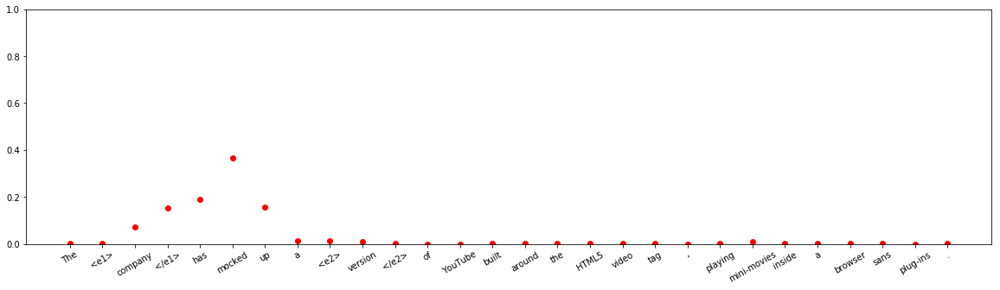




input sentence: A hinge <e1> assembly </e1> attaches a <e2> cover </e2> pivotally to a base of an electronic device and has a pivoting leaf and a stationary leaf .
answer label:    Component-Whole(e1,e2)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 2.8198661e-05
Entity-Destination(e1,e2) 	:	 5.670923e-11
Cause-Effect(e2,e1) 	:	 1.2738155e-10
Member-Collection(e2,e1) 	:	 5.766248e-12
Entity-Origin(e1,e2) 	:	 1.4826475e-08
Message-Topic(e1,e2) 	:	 1.05989184e-11
Component-Whole(e1,e2) 	:	 0.0042253686
Component-Whole(e2,e1) 	:	 0.047505897
Instrument-Agency(e2,e1) 	:	 0.94765747
Content-Container(e1,e2) 	:	 0.00016810793
Product-Producer(e2,e1) 	:	 4.0988678e-07
Cause-Effect(e1,e2) 	:	 3.774493e-12
Product-Producer(e1,e2) 	:	 2.9342817e-10
Content-Container(e2,e1) 	:	 1.4317422e-05
Entity-Origin(e2,e1) 	:	 1.122937e-12
Message-Topic(e2,e1) 	:	 1.5059029e-13
Instrument-Agency(e1,e2) 	:	 0.00040012482
Member-Collection(e1,e2) 	:	 1.7132105e-10
Entity-Destination(e2,e1) 	:	 1.12918

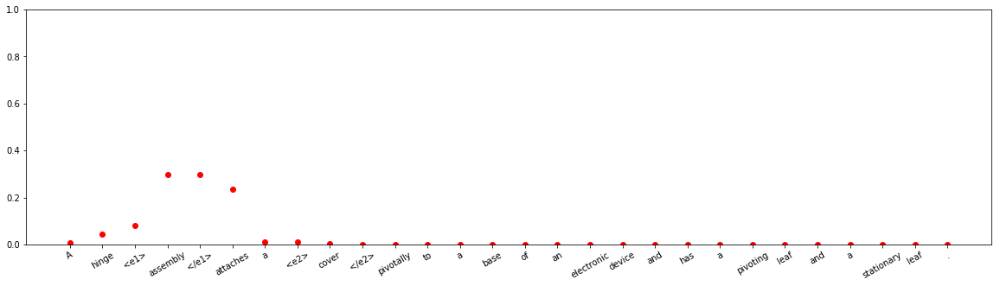









input sentence: The <e1> fairy tale </e1> describes a <e2> giant </e2> with a pair of magic boots that allow the wearer to cover seven leagues in one stride .
answer label:    Message-Topic(e1,e2)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.3832134e-15
Entity-Destination(e1,e2) 	:	 1.474171e-11
Cause-Effect(e2,e1) 	:	 1.974135e-14
Member-Collection(e2,e1) 	:	 1.4319183e-10
Entity-Origin(e1,e2) 	:	 1.7686856e-10
Message-Topic(e1,e2) 	:	 0.007440295
Component-Whole(e1,e2) 	:	 1.4807895e-09
Component-Whole(e2,e1) 	:	 2.9725323e-08
Instrument-Agency(e2,e1) 	:	 3.144852e-08
Content-Container(e1,e2) 	:	 1.1294499e-11
Product-Producer(e2,e1) 	:	 0.9925547
Cause-Effect(e1,e2) 	:	 5.4197886e-07
Product-Producer(e1,e2) 	:	 4.3584196e-06
Content-Container(e2,e1) 	:	 1.9675644e-10
Entity-Origin(e2,e1) 	:	 3.096538e-12
Message-Topic(e2,e1) 	:	 1.1147671e-09
Instrument-Agency(e1,e2) 	:	 3.1883909e-09
Member-Collection(e1,e2) 	:	 1.0825836e-09
Entity-Destination(e2,e1) 	:	 1.8043146e-

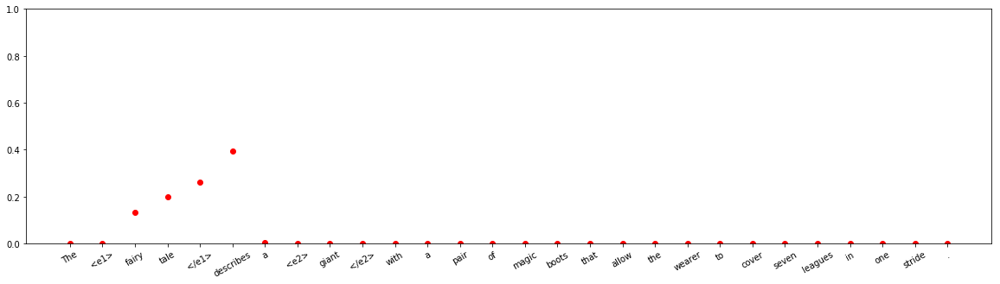


input sentence: A solid round <e1> bar </e1> , 32 '' long , is constructed from ductile <e2> steel </e2> ( Syt=60 ksi , G=11.5 x 106 psi ) .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 3.6356836e-05
Entity-Destination(e1,e2) 	:	 4.8624026e-12
Cause-Effect(e2,e1) 	:	 4.998043e-06
Member-Collection(e2,e1) 	:	 1.0819746e-07
Entity-Origin(e1,e2) 	:	 0.033662267
Message-Topic(e1,e2) 	:	 2.7521377e-12
Component-Whole(e1,e2) 	:	 0.00070092443
Component-Whole(e2,e1) 	:	 0.68111897
Instrument-Agency(e2,e1) 	:	 4.915944e-10
Content-Container(e1,e2) 	:	 1.339162e-06
Product-Producer(e2,e1) 	:	 2.4545861e-06
Cause-Effect(e1,e2) 	:	 2.4454244e-10
Product-Producer(e1,e2) 	:	 0.28447008
Content-Container(e2,e1) 	:	 5.005999e-08
Entity-Origin(e2,e1) 	:	 2.692679e-09
Message-Topic(e2,e1) 	:	 9.391079e-09
Instrument-Agency(e1,e2) 	:	 2.5430093e-06
Member-Collection(e1,e2) 	:	 4.2607313e-09
Entity-Destination(e2,e1) 	:	 2.0343181e-08



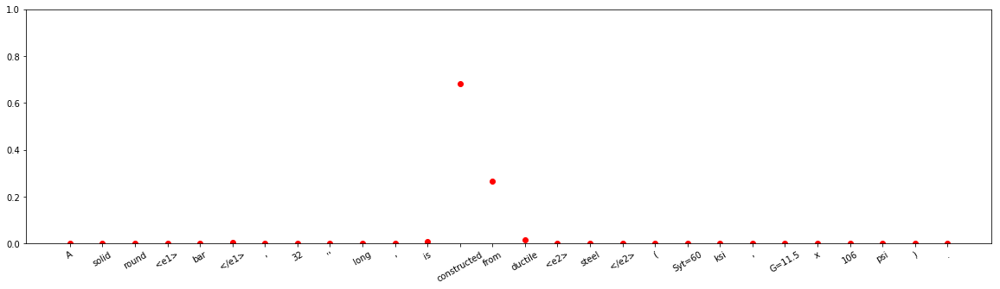






input sentence: They made the <e1> effect </e1> even more dramatic by lighting the talent with a <e2> light </e2> placed on the floor and focused on the face .
answer label:    Cause-Effect(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.0017917836
Entity-Destination(e1,e2) 	:	 2.479108e-11
Cause-Effect(e2,e1) 	:	 0.3507341
Member-Collection(e2,e1) 	:	 6.647985e-09
Entity-Origin(e1,e2) 	:	 1.3597566e-10
Message-Topic(e1,e2) 	:	 8.5986784e-07
Component-Whole(e1,e2) 	:	 6.338608e-06
Component-Whole(e2,e1) 	:	 0.6207618
Instrument-Agency(e2,e1) 	:	 0.0040878584
Content-Container(e1,e2) 	:	 1.788728e-09
Product-Producer(e2,e1) 	:	 1.1582632e-08
Cause-Effect(e1,e2) 	:	 0.02178307
Product-Producer(e1,e2) 	:	 1.0849187e-05
Content-Container(e2,e1) 	:	 2.2218876e-09
Entity-Origin(e2,e1) 	:	 1.5637061e-11
Message-Topic(e2,e1) 	:	 0.0007882284
Instrument-Agency(e1,e2) 	:	 3.4973367e-05
Member-Collection(e1,e2) 	:	 2.2102108e-11
Entity-Destination(e2,e1) 	:	 9.3921635e-09



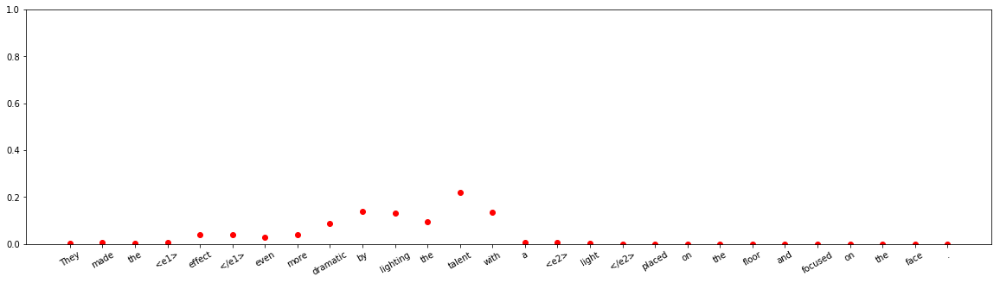



input sentence: Moreover , from the <e1> porch </e1> of the <e2> stoics </e2> he brings out matter , and places it on a par with the Divine Creator .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.31242475
Entity-Destination(e1,e2) 	:	 1.3599488e-11
Cause-Effect(e2,e1) 	:	 3.197313e-08
Member-Collection(e2,e1) 	:	 3.0222284e-06
Entity-Origin(e1,e2) 	:	 3.157552e-11
Message-Topic(e1,e2) 	:	 6.819328e-08
Component-Whole(e1,e2) 	:	 0.6770492
Component-Whole(e2,e1) 	:	 1.393505e-07
Instrument-Agency(e2,e1) 	:	 7.653784e-10
Content-Container(e1,e2) 	:	 1.7364352e-10
Product-Producer(e2,e1) 	:	 2.1074803e-10
Cause-Effect(e1,e2) 	:	 2.0798271e-10
Product-Producer(e1,e2) 	:	 4.5499573e-06
Content-Container(e2,e1) 	:	 1.6107848e-05
Entity-Origin(e2,e1) 	:	 6.378522e-09
Message-Topic(e2,e1) 	:	 1.2889258e-10
Instrument-Agency(e1,e2) 	:	 0.010501855
Member-Collection(e1,e2) 	:	 2.0310542e-07
Entity-Destination(e2,e1) 	:	 7.876577e-12



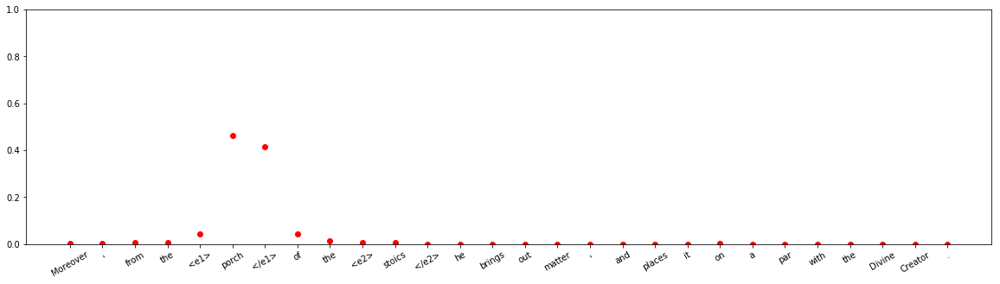



input sentence: From banishing <e1> cold </e1> and flu <e2> germs </e2> to preventing foodborne illnesses , frequent hand-washing is one of the smartest preventive habits you can adopt .
answer label:    Cause-Effect(e2,e1)
wrong label:    Cause-Effect(e1,e2)
Other 	:	 7.018888e-07
Entity-Destination(e1,e2) 	:	 4.2417564e-06
Cause-Effect(e2,e1) 	:	 0.000108665576
Member-Collection(e2,e1) 	:	 7.02323e-06
Entity-Origin(e1,e2) 	:	 4.75862e-05
Message-Topic(e1,e2) 	:	 1.5105104e-06
Component-Whole(e1,e2) 	:	 1.6171393e-07
Component-Whole(e2,e1) 	:	 7.893658e-10
Instrument-Agency(e2,e1) 	:	 1.285056e-05
Content-Container(e1,e2) 	:	 6.126714e-07
Product-Producer(e2,e1) 	:	 3.6478716e-07
Cause-Effect(e1,e2) 	:	 0.99875903
Product-Producer(e1,e2) 	:	 2.5835627e-07
Content-Container(e2,e1) 	:	 5.7056135e-05
Entity-Origin(e2,e1) 	:	 0.0005797225
Message-Topic(e2,e1) 	:	 6.371931e-10
Instrument-Agency(e1,e2) 	:	 3.4283798e-06
Member-Collection(e1,e2) 	:	 0.0004167892
Entity-Destination(e2,e1) 	

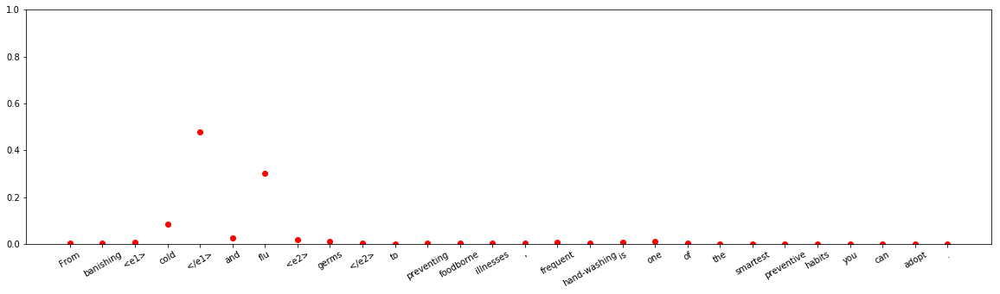



input sentence: A Western <e1> journalist </e1> took an assignment from his newspaper 's <e2> office </e2> for visiting Pakistan and filing exclusive reports on the current nuclear issue .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.0894884e-15
Entity-Destination(e1,e2) 	:	 4.787221e-12
Cause-Effect(e2,e1) 	:	 4.1859157e-13
Member-Collection(e2,e1) 	:	 1.5874155e-14
Entity-Origin(e1,e2) 	:	 1.0
Message-Topic(e1,e2) 	:	 8.356639e-19
Component-Whole(e1,e2) 	:	 1.0812283e-16
Component-Whole(e2,e1) 	:	 3.3770718e-18
Instrument-Agency(e2,e1) 	:	 1.5037858e-11
Content-Container(e1,e2) 	:	 3.2856947e-13
Product-Producer(e2,e1) 	:	 8.7945436e-11
Cause-Effect(e1,e2) 	:	 3.118896e-20
Product-Producer(e1,e2) 	:	 1.4795002e-08
Content-Container(e2,e1) 	:	 1.789834e-15
Entity-Origin(e2,e1) 	:	 6.492251e-15
Message-Topic(e2,e1) 	:	 1.6249383e-15
Instrument-Agency(e1,e2) 	:	 8.339237e-15
Member-Collection(e1,e2) 	:	 3.2594308e-08
Entity-Destination(e2,e1) 	:	 2.0448565e-

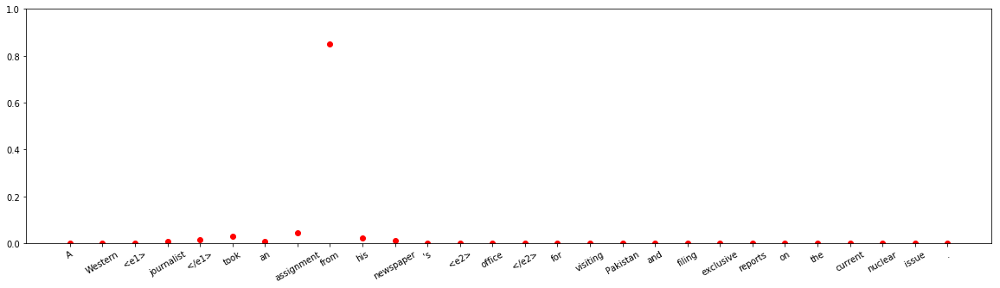








input sentence: Today , I present to you a small <e1> handful </e1> of informational <e2> tidbits </e2> which act as glimpses into the world of a typography enthusiast .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.33903244
Entity-Destination(e1,e2) 	:	 2.1147167e-10
Cause-Effect(e2,e1) 	:	 2.7393294e-11
Member-Collection(e2,e1) 	:	 0.26671174
Entity-Origin(e1,e2) 	:	 2.362645e-06
Message-Topic(e1,e2) 	:	 9.4165506e-07
Component-Whole(e1,e2) 	:	 8.562318e-06
Component-Whole(e2,e1) 	:	 2.1143953e-05
Instrument-Agency(e2,e1) 	:	 7.803178e-07
Content-Container(e1,e2) 	:	 1.4557259e-05
Product-Producer(e2,e1) 	:	 0.3765955
Cause-Effect(e1,e2) 	:	 4.1380797e-09
Product-Producer(e1,e2) 	:	 4.2735896e-06
Content-Container(e2,e1) 	:	 0.014401226
Entity-Origin(e2,e1) 	:	 0.0025764816
Message-Topic(e2,e1) 	:	 0.00062452356
Instrument-Agency(e1,e2) 	:	 5.513611e-06
Member-Collection(e1,e2) 	:	 3.519569e-08
Entity-Destination(e2,e1) 	:	 2.0439872e-08



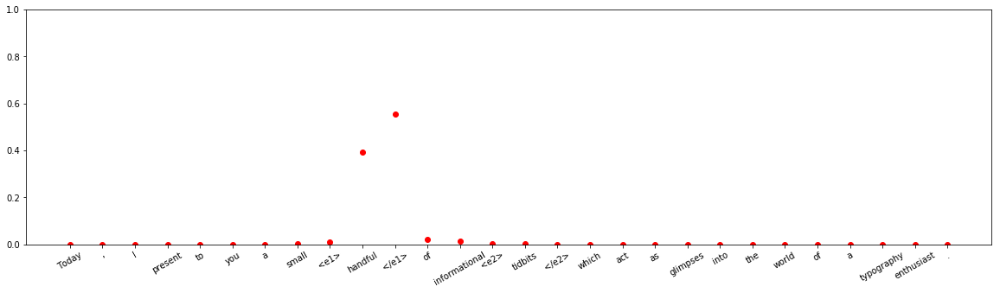


input sentence: The delay in bringing the suit to trial is being caused by a terrific <e1> log- jam </e1> of pending <e2> cases </e2> , court aids explained .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 2.572672e-07
Entity-Destination(e1,e2) 	:	 8.1337294e-07
Cause-Effect(e2,e1) 	:	 0.0007575555
Member-Collection(e2,e1) 	:	 0.034119383
Entity-Origin(e1,e2) 	:	 1.0306295e-06
Message-Topic(e1,e2) 	:	 1.0159079e-06
Component-Whole(e1,e2) 	:	 1.2223899e-06
Component-Whole(e2,e1) 	:	 8.246931e-05
Instrument-Agency(e2,e1) 	:	 1.3555271e-07
Content-Container(e1,e2) 	:	 1.9917275e-06
Product-Producer(e2,e1) 	:	 0.8029898
Cause-Effect(e1,e2) 	:	 0.0038366464
Product-Producer(e1,e2) 	:	 3.2711742e-07
Content-Container(e2,e1) 	:	 8.4875486e-05
Entity-Origin(e2,e1) 	:	 6.5061584e-05
Message-Topic(e2,e1) 	:	 0.1580567
Instrument-Agency(e1,e2) 	:	 4.282235e-07
Member-Collection(e1,e2) 	:	 2.800274e-07
Entity-Destination(e2,e1) 	:	 6.1468786e-09



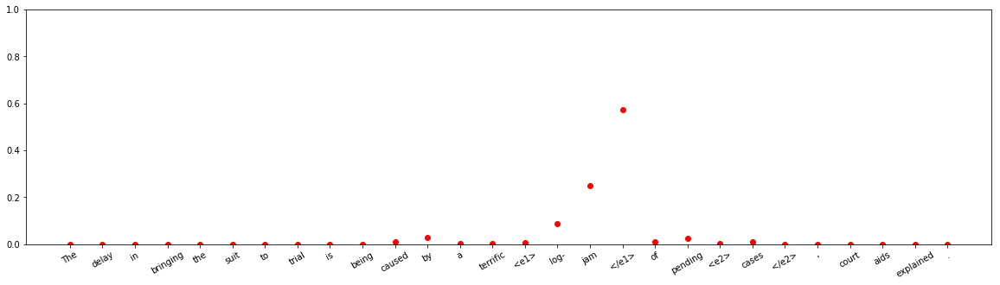


input sentence: The solid fuel in a conventional grill remains stationary , unless the <e1> cook </e1> manually stirs the <e2> coals </e2> with a stick or similar tool .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 5.163316e-09
Entity-Destination(e1,e2) 	:	 3.9491027e-08
Cause-Effect(e2,e1) 	:	 1.3916112e-12
Member-Collection(e2,e1) 	:	 1.7625243e-11
Entity-Origin(e1,e2) 	:	 2.1638111e-07
Message-Topic(e1,e2) 	:	 9.74308e-11
Component-Whole(e1,e2) 	:	 3.5757822e-12
Component-Whole(e2,e1) 	:	 5.489708e-10
Instrument-Agency(e2,e1) 	:	 0.18085305
Content-Container(e1,e2) 	:	 4.304514e-08
Product-Producer(e2,e1) 	:	 0.8191466
Cause-Effect(e1,e2) 	:	 5.646825e-08
Product-Producer(e1,e2) 	:	 1.6114166e-10
Content-Container(e2,e1) 	:	 3.3330898e-09
Entity-Origin(e2,e1) 	:	 4.0198835e-09
Message-Topic(e2,e1) 	:	 8.280069e-14
Instrument-Agency(e1,e2) 	:	 3.0985672e-09
Member-Collection(e1,e2) 	:	 7.3419404e-09
Entity-Destination(e2,e1) 	:	 1.96990

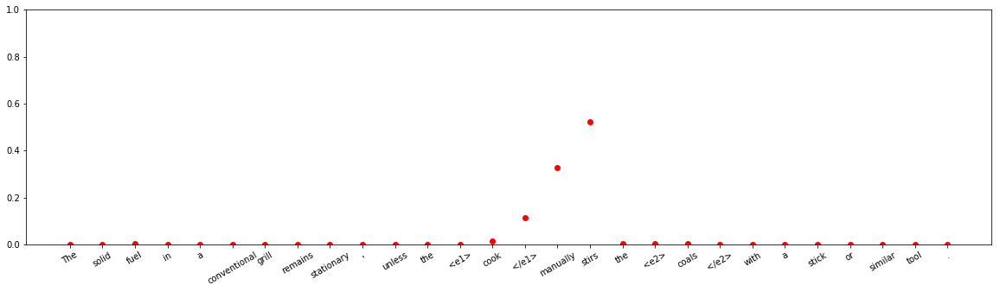




input sentence: I saw come out of London , even unto the presence of the prince , a great <e1> rabble </e1> of mean and light <e2> persons </e2> .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.69312483
Entity-Destination(e1,e2) 	:	 3.8577568e-11
Cause-Effect(e2,e1) 	:	 1.2803122e-08
Member-Collection(e2,e1) 	:	 0.3065769
Entity-Origin(e1,e2) 	:	 9.986892e-10
Message-Topic(e1,e2) 	:	 4.0370903e-08
Component-Whole(e1,e2) 	:	 3.8999604e-09
Component-Whole(e2,e1) 	:	 2.6699143e-10
Instrument-Agency(e2,e1) 	:	 7.069224e-08
Content-Container(e1,e2) 	:	 2.0867039e-11
Product-Producer(e2,e1) 	:	 1.0860352e-07
Cause-Effect(e1,e2) 	:	 4.73991e-08
Product-Producer(e1,e2) 	:	 6.391828e-07
Content-Container(e2,e1) 	:	 8.7147956e-10
Entity-Origin(e2,e1) 	:	 5.350723e-07
Message-Topic(e2,e1) 	:	 2.7218017e-05
Instrument-Agency(e1,e2) 	:	 8.965369e-06
Member-Collection(e1,e2) 	:	 0.000260565
Entity-Destination(e2,e1) 	:	 9.7900826e-11



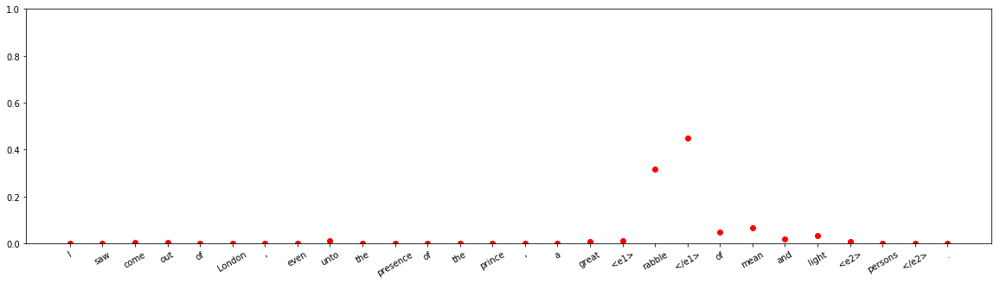



input sentence: To preserve its <e1> catch </e1> of <e2> fish </e2> , each boat loads between 2000 and 3000 kilos of ice before it goes out to sea .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 9.1435936e-08
Entity-Destination(e1,e2) 	:	 1.7364775e-10
Cause-Effect(e2,e1) 	:	 1.5672096e-10
Member-Collection(e2,e1) 	:	 0.9956826
Entity-Origin(e1,e2) 	:	 2.5022025e-06
Message-Topic(e1,e2) 	:	 1.328088e-07
Component-Whole(e1,e2) 	:	 0.0034244251
Component-Whole(e2,e1) 	:	 0.00010597408
Instrument-Agency(e2,e1) 	:	 3.0950833e-08
Content-Container(e1,e2) 	:	 1.4346708e-07
Product-Producer(e2,e1) 	:	 1.1626495e-06
Cause-Effect(e1,e2) 	:	 5.209341e-10
Product-Producer(e1,e2) 	:	 2.9939488e-07
Content-Container(e2,e1) 	:	 0.00066818594
Entity-Origin(e2,e1) 	:	 6.7355923e-06
Message-Topic(e2,e1) 	:	 5.132693e-08
Instrument-Agency(e1,e2) 	:	 0.000107497865
Member-Collection(e1,e2) 	:	 1.3264336e-07
Entity-Destination(e2,e1) 	:	 3.1389242e-11



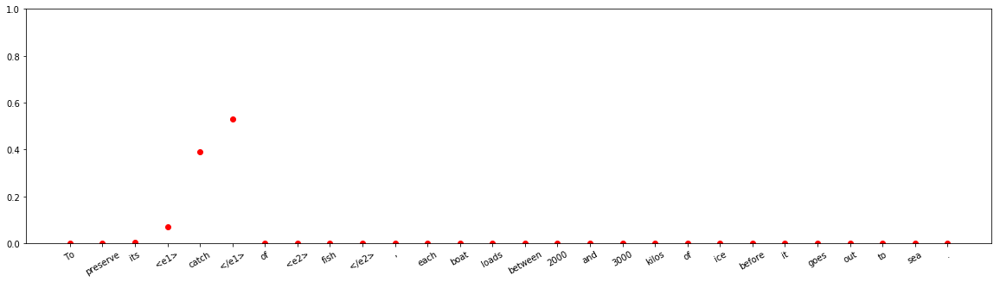






input sentence: 'Transition ' are the series of large mirrored beach hits that cling to the stubborn <e1> undulation </e1> of the <e2> cliffs </e2> above McKenzie 's Bay .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.33781642
Entity-Destination(e1,e2) 	:	 3.760245e-13
Cause-Effect(e2,e1) 	:	 1.2173225e-05
Member-Collection(e2,e1) 	:	 8.512715e-07
Entity-Origin(e1,e2) 	:	 4.1679514e-11
Message-Topic(e1,e2) 	:	 1.94568e-09
Component-Whole(e1,e2) 	:	 0.66216666
Component-Whole(e2,e1) 	:	 3.4184193e-08
Instrument-Agency(e2,e1) 	:	 2.526177e-08
Content-Container(e1,e2) 	:	 5.799398e-12
Product-Producer(e2,e1) 	:	 3.4382143e-11
Cause-Effect(e1,e2) 	:	 7.8937273e-10
Product-Producer(e1,e2) 	:	 8.4204544e-08
Content-Container(e2,e1) 	:	 2.366847e-10
Entity-Origin(e2,e1) 	:	 3.329655e-11
Message-Topic(e2,e1) 	:	 2.5762397e-06
Instrument-Agency(e1,e2) 	:	 1.2164248e-06
Member-Collection(e1,e2) 	:	 1.1765053e-07
Entity-Destination(e2,e1) 	:	 8.6531386e-11



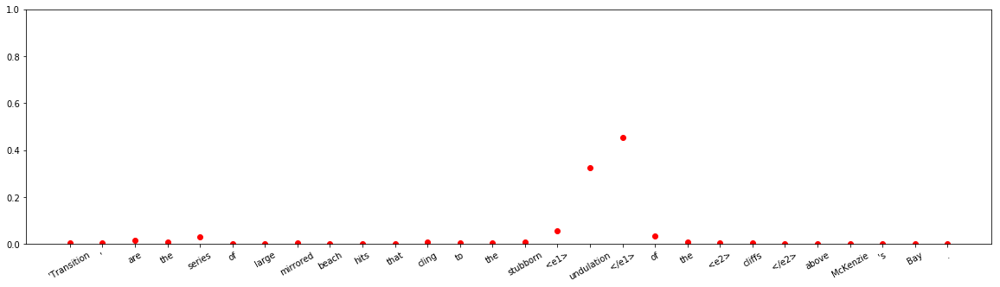












input sentence: The <e1> dynamite </e1> used in <e2> blasting </e2> for the South Island Line had been stored at a depot in Chung Hom Shan , near Stanley .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.024904544
Entity-Destination(e1,e2) 	:	 2.6027658e-13
Cause-Effect(e2,e1) 	:	 4.7729736e-07
Member-Collection(e2,e1) 	:	 7.17499e-13
Entity-Origin(e1,e2) 	:	 1.2146192e-09
Message-Topic(e1,e2) 	:	 8.2648856e-13
Component-Whole(e1,e2) 	:	 8.569456e-05
Component-Whole(e2,e1) 	:	 7.449814e-06
Instrument-Agency(e2,e1) 	:	 0.101150945
Content-Container(e1,e2) 	:	 1.2289821e-08
Product-Producer(e2,e1) 	:	 1.5594161e-11
Cause-Effect(e1,e2) 	:	 1.8176821e-09
Product-Producer(e1,e2) 	:	 1.760588e-10
Content-Container(e2,e1) 	:	 6.5700783e-09
Entity-Origin(e2,e1) 	:	 2.2390069e-11
Message-Topic(e2,e1) 	:	 5.282031e-11
Instrument-Agency(e1,e2) 	:	 0.8738508
Member-Collection(e1,e2) 	:	 1.1109313e-10
Entity-Destination(e2,e1) 	:	 4.5583203e-12



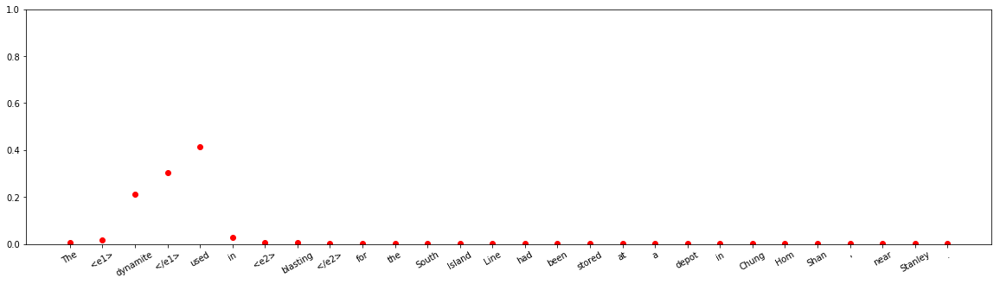


input sentence: A bed of ancient lava seemed to mark the commencement of the <e1> eruption </e1> from the <e2> craters </e2> of the great chain of the Andes .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.3890526e-13
Entity-Destination(e1,e2) 	:	 5.7680314e-15
Cause-Effect(e2,e1) 	:	 1.0
Member-Collection(e2,e1) 	:	 3.2284212e-15
Entity-Origin(e1,e2) 	:	 5.2185786e-12
Message-Topic(e1,e2) 	:	 3.1523311e-18
Component-Whole(e1,e2) 	:	 1.8581253e-11
Component-Whole(e2,e1) 	:	 1.656211e-14
Instrument-Agency(e2,e1) 	:	 1.31909e-17
Content-Container(e1,e2) 	:	 2.7343052e-17
Product-Producer(e2,e1) 	:	 4.604481e-17
Cause-Effect(e1,e2) 	:	 6.171733e-13
Product-Producer(e1,e2) 	:	 7.897228e-10
Content-Container(e2,e1) 	:	 3.823136e-17
Entity-Origin(e2,e1) 	:	 5.3024776e-16
Message-Topic(e2,e1) 	:	 3.2886118e-12
Instrument-Agency(e1,e2) 	:	 2.2435946e-14
Member-Collection(e1,e2) 	:	 3.5503424e-15
Entity-Destination(e2,e1) 	:	 1.2521918e-15



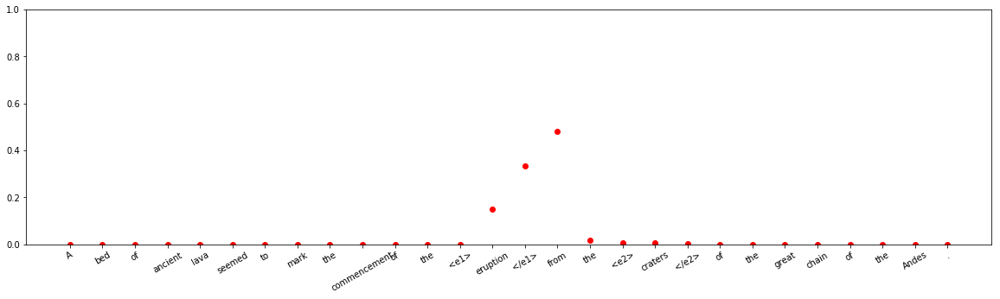


input sentence: The <e1> company </e1> has assembled a <e2> portfolio </e2> of precious and base metal exploration prospects in Ontario , Saskatchewan , and the North West Territories .
answer label:    Product-Producer(e2,e1)
wrong label:    Other
Other 	:	 0.9997291
Entity-Destination(e1,e2) 	:	 2.6529207e-13
Cause-Effect(e2,e1) 	:	 2.5407837e-14
Member-Collection(e2,e1) 	:	 2.7638505e-14
Entity-Origin(e1,e2) 	:	 7.2660506e-12
Message-Topic(e1,e2) 	:	 2.0258961e-16
Component-Whole(e1,e2) 	:	 4.0729082e-16
Component-Whole(e2,e1) 	:	 3.27587e-13
Instrument-Agency(e2,e1) 	:	 5.539263e-13
Content-Container(e1,e2) 	:	 6.7130936e-12
Product-Producer(e2,e1) 	:	 0.0002709107
Cause-Effect(e1,e2) 	:	 1.1543748e-14
Product-Producer(e1,e2) 	:	 1.3069914e-13
Content-Container(e2,e1) 	:	 7.2924305e-12
Entity-Origin(e2,e1) 	:	 1.4828694e-13
Message-Topic(e2,e1) 	:	 1.5061508e-11
Instrument-Agency(e1,e2) 	:	 5.3971454e-13
Member-Collection(e1,e2) 	:	 2.2468265e-11
Entity-Destination(e2,e1) 	:	 7.35

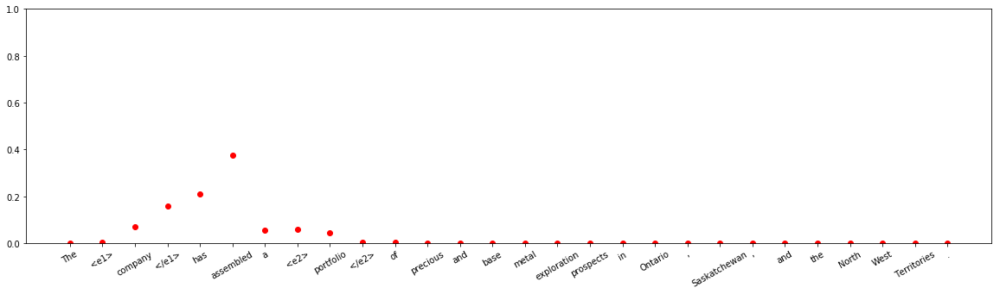












input sentence: The glow from the <e1> blacksmith </e1> 's <e2> forge </e2> led civilization from the dark ages and brought humankind to the standard of living enjoyed today .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.4720865e-07
Entity-Destination(e1,e2) 	:	 7.9081397e-10
Cause-Effect(e2,e1) 	:	 4.4835664e-09
Member-Collection(e2,e1) 	:	 6.8405703e-10
Entity-Origin(e1,e2) 	:	 1.135339e-07
Message-Topic(e1,e2) 	:	 5.3265503e-09
Component-Whole(e1,e2) 	:	 1.1636995e-10
Component-Whole(e2,e1) 	:	 4.2705772e-09
Instrument-Agency(e2,e1) 	:	 1.296763e-06
Content-Container(e1,e2) 	:	 3.8193665e-10
Product-Producer(e2,e1) 	:	 0.9838844
Cause-Effect(e1,e2) 	:	 1.8549859e-07
Product-Producer(e1,e2) 	:	 0.0010552724
Content-Container(e2,e1) 	:	 1.2929638e-11
Entity-Origin(e2,e1) 	:	 2.573916e-08
Message-Topic(e2,e1) 	:	 2.558506e-09
Instrument-Agency(e1,e2) 	:	 0.014845856
Member-Collection(e1,e2) 	:	 0.00021276437
Entity-Destination

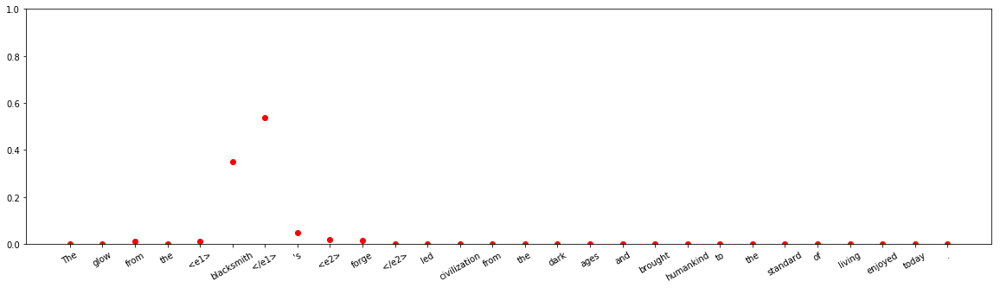


input sentence: Approximately three dozen bus <e1> lines </e1> operate from the port authority bus <e2> terminal </e2> located between Eighth and Ninth Avenues and 40th to 42nd Streets .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 0.00019793102
Entity-Destination(e1,e2) 	:	 4.640944e-09
Cause-Effect(e2,e1) 	:	 8.6342996e-05
Member-Collection(e2,e1) 	:	 1.8151748e-09
Entity-Origin(e1,e2) 	:	 0.7343297
Message-Topic(e1,e2) 	:	 1.9308442e-12
Component-Whole(e1,e2) 	:	 0.26434258
Component-Whole(e2,e1) 	:	 4.318482e-05
Instrument-Agency(e2,e1) 	:	 3.6022405e-07
Content-Container(e1,e2) 	:	 1.4773764e-06
Product-Producer(e2,e1) 	:	 1.4423887e-09
Cause-Effect(e1,e2) 	:	 1.0643247e-11
Product-Producer(e1,e2) 	:	 0.0007966821
Content-Container(e2,e1) 	:	 5.153288e-09
Entity-Origin(e2,e1) 	:	 1.170945e-07
Message-Topic(e2,e1) 	:	 7.680197e-08
Instrument-Agency(e1,e2) 	:	 0.0001998044
Member-Collection(e1,e2) 	:	 1.8808089e-06
Entity-Destination(e2,e1) 	:	 3.3036653e-0

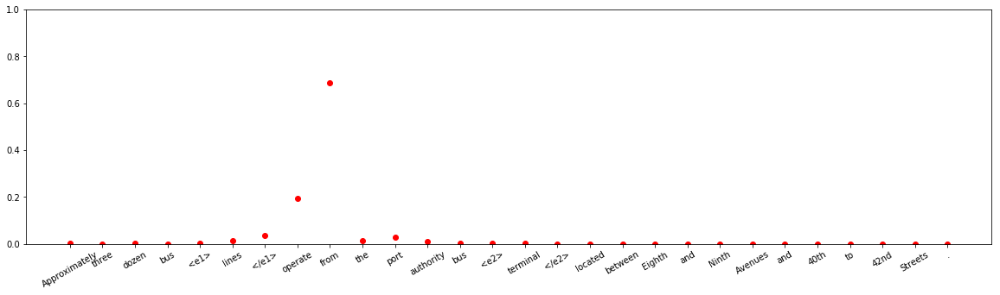


input sentence: Eco-Friendly <e1> tomatoes </e1> grown in a portable <e2> pail </e2> are moved inside and continue to produce delicious tomatoes even when summer is just a hearth-side .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 9.174985e-08
Entity-Destination(e1,e2) 	:	 2.6269106e-06
Cause-Effect(e2,e1) 	:	 5.843365e-12
Member-Collection(e2,e1) 	:	 9.256592e-13
Entity-Origin(e1,e2) 	:	 0.013380046
Message-Topic(e1,e2) 	:	 6.312655e-16
Component-Whole(e1,e2) 	:	 2.8827673e-08
Component-Whole(e2,e1) 	:	 1.9926359e-10
Instrument-Agency(e2,e1) 	:	 3.9986614e-09
Content-Container(e1,e2) 	:	 0.98660254
Product-Producer(e2,e1) 	:	 1.09229995e-05
Cause-Effect(e1,e2) 	:	 4.135968e-13
Product-Producer(e1,e2) 	:	 1.2531983e-08
Content-Container(e2,e1) 	:	 1.4086541e-08
Entity-Origin(e2,e1) 	:	 3.2212818e-06
Message-Topic(e2,e1) 	:	 4.226186e-08
Instrument-Agency(e1,e2) 	:	 8.275627e-11
Member-Collection(e1,e2) 	:	 4.6616108e-07
Entity-Destination(e2,e1) 	:	 3.0267

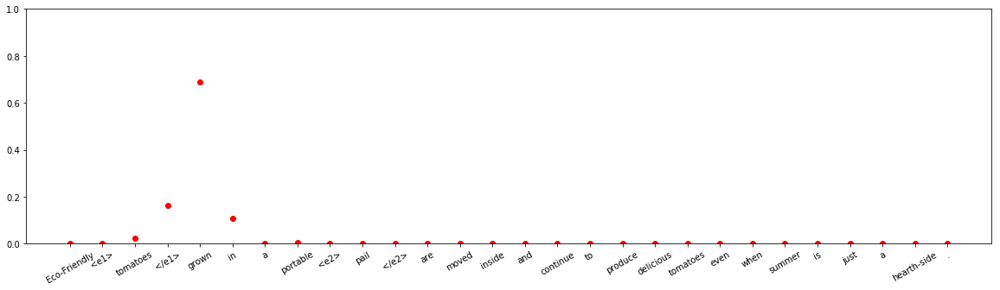


input sentence: Advanced XML Converter has a <e1> wizard </e1> driven <e2> interface </e2> for converting xml files into HTML , CSV , DBF and XLS formats with ease .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.99594814
Entity-Destination(e1,e2) 	:	 5.645989e-13
Cause-Effect(e2,e1) 	:	 1.7882733e-10
Member-Collection(e2,e1) 	:	 4.229614e-11
Entity-Origin(e1,e2) 	:	 2.2502809e-11
Message-Topic(e1,e2) 	:	 1.3534424e-11
Component-Whole(e1,e2) 	:	 1.07419654e-13
Component-Whole(e2,e1) 	:	 5.2365545e-10
Instrument-Agency(e2,e1) 	:	 0.002638204
Content-Container(e1,e2) 	:	 1.518994e-10
Product-Producer(e2,e1) 	:	 8.46418e-09
Cause-Effect(e1,e2) 	:	 8.990038e-13
Product-Producer(e1,e2) 	:	 4.885113e-10
Content-Container(e2,e1) 	:	 6.388361e-11
Entity-Origin(e2,e1) 	:	 6.7285004e-14
Message-Topic(e2,e1) 	:	 7.0347464e-11
Instrument-Agency(e1,e2) 	:	 0.0014137042
Member-Collection(e1,e2) 	:	 1.1301199e-09
Entity-Destination(e2,e1) 	:	 2.5093055e-12



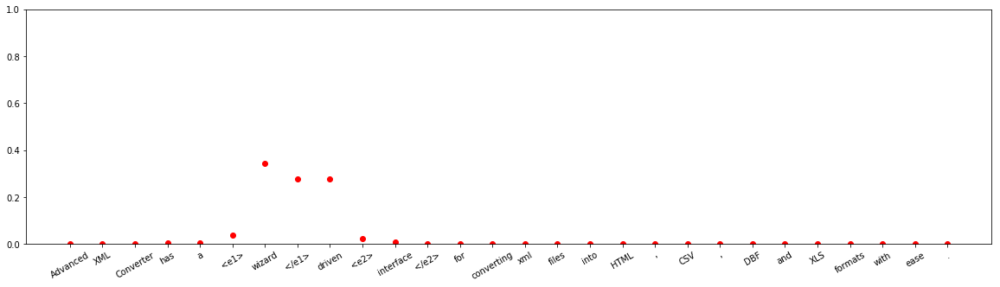


input sentence: The Postmodernism Generator was written by Andrew C. Bulhak using the Dada Engine , a system for generating random <e1> text </e1> from recursive <e2> grammars </e2> .
answer label:    Product-Producer(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 0.004388555
Entity-Destination(e1,e2) 	:	 1.2551578e-08
Cause-Effect(e2,e1) 	:	 0.9875329
Member-Collection(e2,e1) 	:	 9.3065715e-09
Entity-Origin(e1,e2) 	:	 3.7938567e-05
Message-Topic(e1,e2) 	:	 1.6742279e-06
Component-Whole(e1,e2) 	:	 0.0025545235
Component-Whole(e2,e1) 	:	 0.00042153642
Instrument-Agency(e2,e1) 	:	 9.9803965e-06
Content-Container(e1,e2) 	:	 2.1863577e-06
Product-Producer(e2,e1) 	:	 1.2559296e-07
Cause-Effect(e1,e2) 	:	 1.0115304e-07
Product-Producer(e1,e2) 	:	 0.0020273286
Content-Container(e2,e1) 	:	 3.739557e-07
Entity-Origin(e2,e1) 	:	 1.1115466e-07
Message-Topic(e2,e1) 	:	 9.592326e-06
Instrument-Agency(e1,e2) 	:	 0.0030130805
Member-Collection(e1,e2) 	:	 3.2392304e-08
Entity-Destination(e2,e1)

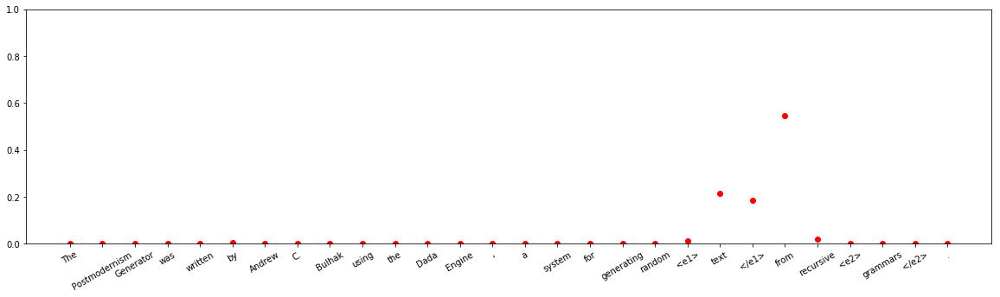









input sentence: <e1> Fish </e1> without the pyloric ceca have digestive enzyme production in the <e2> liver </e2> and pancreas .
answer label:    Component-Whole(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.2965631
Entity-Destination(e1,e2) 	:	 4.442497e-09
Cause-Effect(e2,e1) 	:	 4.7531222e-07
Member-Collection(e2,e1) 	:	 1.278356e-09
Entity-Origin(e1,e2) 	:	 0.0043240627
Message-Topic(e1,e2) 	:	 3.5956032e-07
Component-Whole(e1,e2) 	:	 0.009845516
Component-Whole(e2,e1) 	:	 5.953955e-07
Instrument-Agency(e2,e1) 	:	 7.1326106e-10
Content-Container(e1,e2) 	:	 4.940128e-05
Product-Producer(e2,e1) 	:	 0.5010465
Cause-Effect(e1,e2) 	:	 0.002802033
Product-Producer(e1,e2) 	:	 0.18418078
Content-Container(e2,e1) 	:	 1.2506803e-10
Entity-Origin(e2,e1) 	:	 3.1112162e-05
Message-Topic(e2,e1) 	:	 0.00082567905
Instrument-Agency(e1,e2) 	:	 1.2935766e-07
Member-Collection(e1,e2) 	:	 0.00033027367
Entity-Destination(e2,e1) 	:	 1.362576e-10



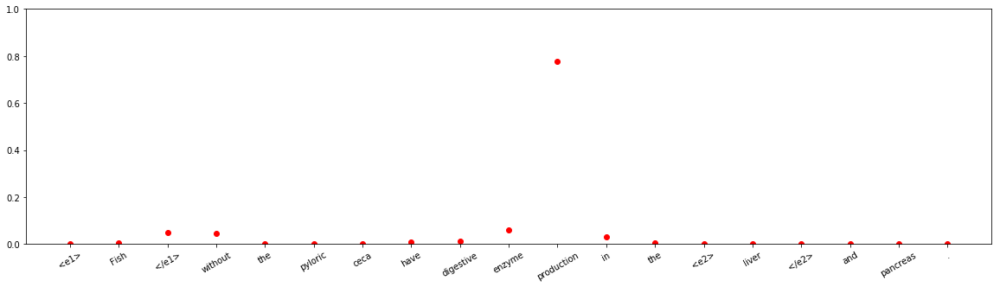




input sentence: These philosophical <e1> issues </e1> have been addressed by <e2> myth </e2> , fiction and philosophy since antiquity .
answer label:    Message-Topic(e2,e1)
wrong label:    Product-Producer(e1,e2)
Other 	:	 0.006440107
Entity-Destination(e1,e2) 	:	 7.726394e-13
Cause-Effect(e2,e1) 	:	 5.3584163e-08
Member-Collection(e2,e1) 	:	 2.249293e-10
Entity-Origin(e1,e2) 	:	 1.8272476e-09
Message-Topic(e1,e2) 	:	 8.486955e-08
Component-Whole(e1,e2) 	:	 7.5524245e-09
Component-Whole(e2,e1) 	:	 3.459205e-08
Instrument-Agency(e2,e1) 	:	 1.1319089e-10
Content-Container(e1,e2) 	:	 3.0161646e-12
Product-Producer(e2,e1) 	:	 4.9333053e-09
Cause-Effect(e1,e2) 	:	 9.665534e-14
Product-Producer(e1,e2) 	:	 0.6571469
Content-Container(e2,e1) 	:	 6.692404e-13
Entity-Origin(e2,e1) 	:	 3.4461406e-11
Message-Topic(e2,e1) 	:	 0.33641264
Instrument-Agency(e1,e2) 	:	 1.5708476e-07
Member-Collection(e1,e2) 	:	 2.1699753e-10
Entity-Destination(e2,e1) 	:	 3.125222e-11



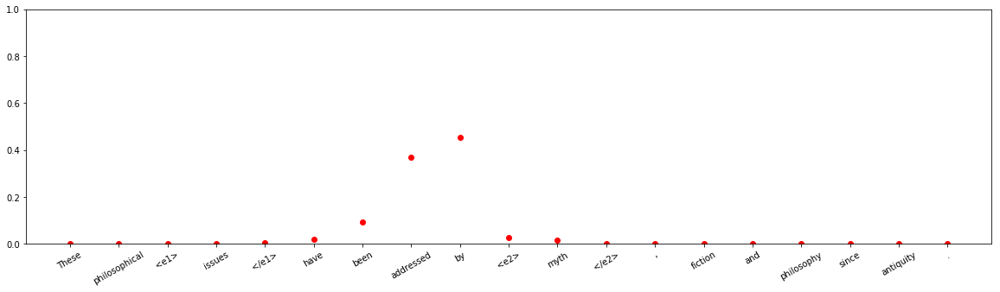




input sentence: The <e1> castle </e1> was inside a <e2> museum </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 2.3701329e-08
Entity-Destination(e1,e2) 	:	 2.1468063e-08
Cause-Effect(e2,e1) 	:	 1.05848917e-13
Member-Collection(e2,e1) 	:	 2.5867893e-11
Entity-Origin(e1,e2) 	:	 1.2973616e-06
Message-Topic(e1,e2) 	:	 1.3930826e-11
Component-Whole(e1,e2) 	:	 0.0037079258
Component-Whole(e2,e1) 	:	 3.1060662e-07
Instrument-Agency(e2,e1) 	:	 9.607852e-13
Content-Container(e1,e2) 	:	 0.9962902
Product-Producer(e2,e1) 	:	 1.0792591e-09
Cause-Effect(e1,e2) 	:	 8.1948966e-13
Product-Producer(e1,e2) 	:	 3.576992e-10
Content-Container(e2,e1) 	:	 1.7355839e-07
Entity-Origin(e2,e1) 	:	 1.39184975e-08
Message-Topic(e2,e1) 	:	 1.3068643e-07
Instrument-Agency(e1,e2) 	:	 3.5741927e-08
Member-Collection(e1,e2) 	:	 4.5094467e-08
Entity-Destination(e2,e1) 	:	 1.0958817e-11



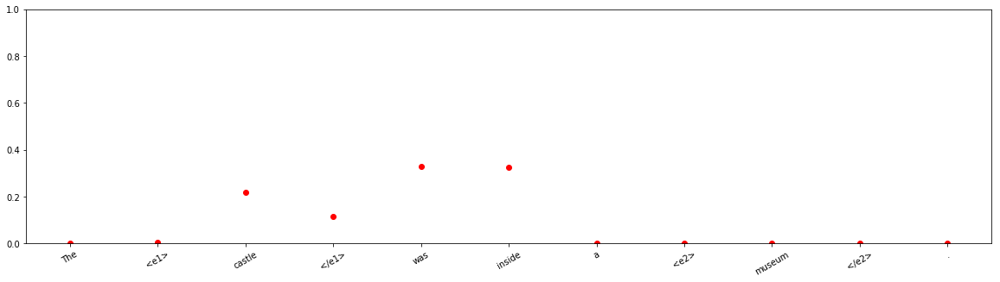


input sentence: The <e1> stories </e1> are narrated through <e2> dance </e2> .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.000108690896
Entity-Destination(e1,e2) 	:	 5.6482326e-11
Cause-Effect(e2,e1) 	:	 4.1037083e-06
Member-Collection(e2,e1) 	:	 3.7220312e-07
Entity-Origin(e1,e2) 	:	 0.00017096772
Message-Topic(e1,e2) 	:	 1.3041061e-05
Component-Whole(e1,e2) 	:	 0.0005318155
Component-Whole(e2,e1) 	:	 0.9667225
Instrument-Agency(e2,e1) 	:	 8.928719e-06
Content-Container(e1,e2) 	:	 1.6115935e-06
Product-Producer(e2,e1) 	:	 7.626593e-11
Cause-Effect(e1,e2) 	:	 3.8575645e-09
Product-Producer(e1,e2) 	:	 2.3607925e-06
Content-Container(e2,e1) 	:	 1.2408644e-09
Entity-Origin(e2,e1) 	:	 4.2753623e-09
Message-Topic(e2,e1) 	:	 0.00016429891
Instrument-Agency(e1,e2) 	:	 0.032270826
Member-Collection(e1,e2) 	:	 6.2685075e-07
Entity-Destination(e2,e1) 	:	 2.2497318e-10



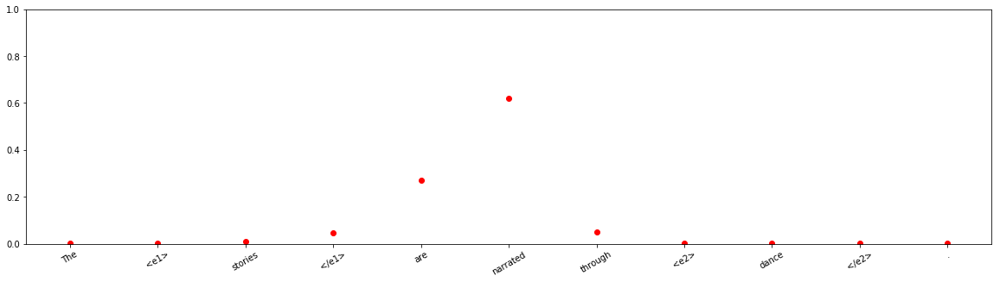




input sentence: Cat <e1> toy </e1> was filled with <e2> trash </e2> .
answer label:    Content-Container(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 3.5189995e-08
Entity-Destination(e1,e2) 	:	 3.848723e-09
Cause-Effect(e2,e1) 	:	 2.1493923e-10
Member-Collection(e2,e1) 	:	 7.629161e-09
Entity-Origin(e1,e2) 	:	 5.842538e-08
Message-Topic(e1,e2) 	:	 6.6668816e-11
Component-Whole(e1,e2) 	:	 8.416223e-08
Component-Whole(e2,e1) 	:	 0.6746854
Instrument-Agency(e2,e1) 	:	 1.8023658e-07
Content-Container(e1,e2) 	:	 0.0026687363
Product-Producer(e2,e1) 	:	 7.832721e-07
Cause-Effect(e1,e2) 	:	 3.4466957e-10
Product-Producer(e1,e2) 	:	 1.0966816e-08
Content-Container(e2,e1) 	:	 0.32263058
Entity-Origin(e2,e1) 	:	 4.395162e-09
Message-Topic(e2,e1) 	:	 6.952011e-09
Instrument-Agency(e1,e2) 	:	 1.4178175e-05
Member-Collection(e1,e2) 	:	 3.151378e-13
Entity-Destination(e2,e1) 	:	 5.838596e-11



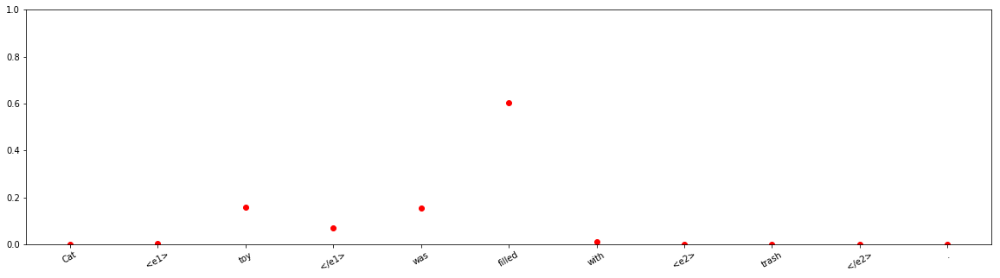


input sentence: The yellow <e1> blazes </e1> denote the <e2> trail </e2> .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.04511999
Entity-Destination(e1,e2) 	:	 0.00020254303
Cause-Effect(e2,e1) 	:	 0.029615212
Member-Collection(e2,e1) 	:	 6.695384e-07
Entity-Origin(e1,e2) 	:	 3.8692352e-08
Message-Topic(e1,e2) 	:	 0.0006361937
Component-Whole(e1,e2) 	:	 0.8655165
Component-Whole(e2,e1) 	:	 2.102272e-05
Instrument-Agency(e2,e1) 	:	 0.0018261829
Content-Container(e1,e2) 	:	 8.093727e-10
Product-Producer(e2,e1) 	:	 1.06253765e-05
Cause-Effect(e1,e2) 	:	 0.00022741794
Product-Producer(e1,e2) 	:	 6.127026e-07
Content-Container(e2,e1) 	:	 1.1821983e-06
Entity-Origin(e2,e1) 	:	 9.406256e-06
Message-Topic(e2,e1) 	:	 1.957977e-05
Instrument-Agency(e1,e2) 	:	 0.056792736
Member-Collection(e1,e2) 	:	 1.0979297e-07
Entity-Destination(e2,e1) 	:	 2.42803e-08



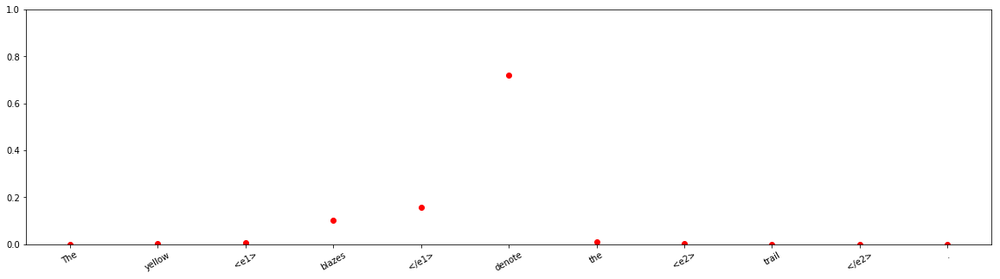














input sentence: The <e1> infant </e1> was in a <e2> box </e2> .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 8.593023e-05
Entity-Destination(e1,e2) 	:	 6.39754e-10
Cause-Effect(e2,e1) 	:	 3.8676246e-14
Member-Collection(e2,e1) 	:	 3.5141935e-17
Entity-Origin(e1,e2) 	:	 2.9370537e-09
Message-Topic(e1,e2) 	:	 1.1577307e-18
Component-Whole(e1,e2) 	:	 8.2402307e-10
Component-Whole(e2,e1) 	:	 1.0948696e-11
Instrument-Agency(e2,e1) 	:	 8.117531e-12
Content-Container(e1,e2) 	:	 0.99991405
Product-Producer(e2,e1) 	:	 4.700229e-11
Cause-Effect(e1,e2) 	:	 1.5807915e-15
Product-Producer(e1,e2) 	:	 8.017184e-14
Content-Container(e2,e1) 	:	 5.8254575e-11
Entity-Origin(e2,e1) 	:	 1.958046e-12
Message-Topic(e2,e1) 	:	 3.7758e-09
Instrument-Agency(e1,e2) 	:	 2.4256413e-13
Member-Collection(e1,e2) 	:	 9.7658964e-11
Entity-Destination(e2,e1) 	:	 8.663072e-14



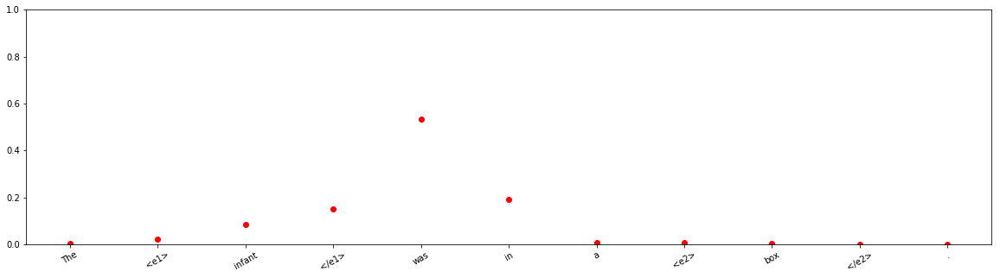


input sentence: My <e1> cockatiel </e1> threw up this <e2> morning </e2> .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.019649664
Entity-Destination(e1,e2) 	:	 9.180465e-08
Cause-Effect(e2,e1) 	:	 9.815118e-10
Member-Collection(e2,e1) 	:	 7.248344e-11
Entity-Origin(e1,e2) 	:	 1.0159655e-06
Message-Topic(e1,e2) 	:	 2.1021431e-07
Component-Whole(e1,e2) 	:	 2.349921e-09
Component-Whole(e2,e1) 	:	 3.0635337e-07
Instrument-Agency(e2,e1) 	:	 9.819828e-06
Content-Container(e1,e2) 	:	 4.6368353e-07
Product-Producer(e2,e1) 	:	 0.9803375
Cause-Effect(e1,e2) 	:	 4.8731545e-07
Product-Producer(e1,e2) 	:	 2.4322087e-09
Content-Container(e2,e1) 	:	 6.119207e-08
Entity-Origin(e2,e1) 	:	 1.5286991e-10
Message-Topic(e2,e1) 	:	 2.9260616e-07
Instrument-Agency(e1,e2) 	:	 4.2314676e-09
Member-Collection(e1,e2) 	:	 3.234556e-08
Entity-Destination(e2,e1) 	:	 5.1498205e-13



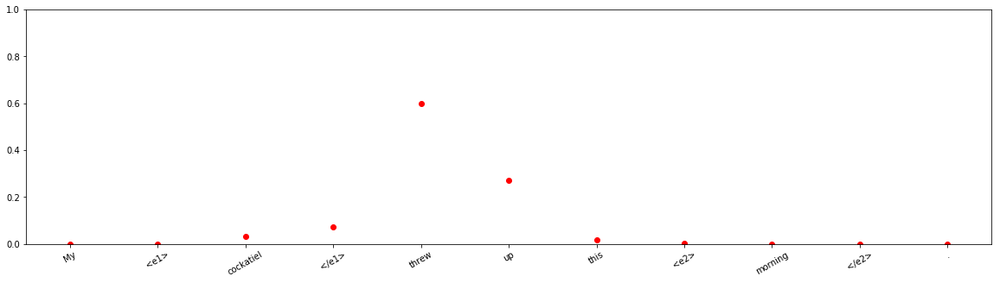


input sentence: The <e1> examination </e1> started at the <e2> head </e2> .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.12363395
Entity-Destination(e1,e2) 	:	 2.0255526e-05
Cause-Effect(e2,e1) 	:	 0.000108105996
Member-Collection(e2,e1) 	:	 6.4054704e-09
Entity-Origin(e1,e2) 	:	 0.054327786
Message-Topic(e1,e2) 	:	 0.0008474945
Component-Whole(e1,e2) 	:	 0.80628467
Component-Whole(e2,e1) 	:	 0.00034707956
Instrument-Agency(e2,e1) 	:	 6.0162874e-05
Content-Container(e1,e2) 	:	 1.2009096e-05
Product-Producer(e2,e1) 	:	 4.502889e-07
Cause-Effect(e1,e2) 	:	 5.8345835e-09
Product-Producer(e1,e2) 	:	 0.010261317
Content-Container(e2,e1) 	:	 4.691458e-09
Entity-Origin(e2,e1) 	:	 5.80108e-10
Message-Topic(e2,e1) 	:	 0.00019784561
Instrument-Agency(e1,e2) 	:	 0.0036683828
Member-Collection(e1,e2) 	:	 0.0002304546
Entity-Destination(e2,e1) 	:	 5.044579e-09



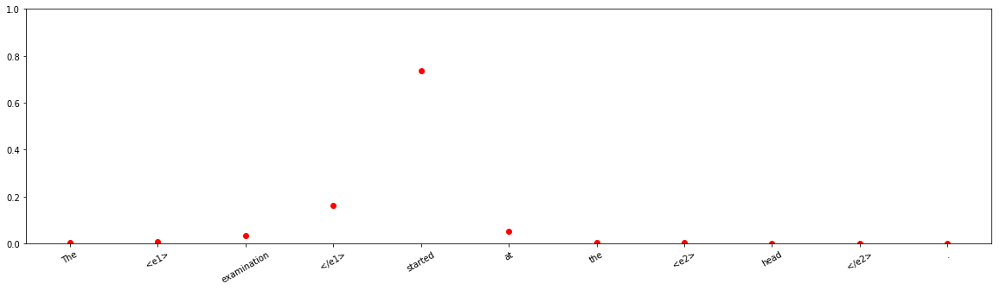







input sentence: The <e1> kitchen </e1> was full of <e2> smoke </e2> .
answer label:    Other
wrong label:    Content-Container(e2,e1)
Other 	:	 6.785875e-08
Entity-Destination(e1,e2) 	:	 4.090299e-11
Cause-Effect(e2,e1) 	:	 1.8618627e-11
Member-Collection(e2,e1) 	:	 2.4347955e-08
Entity-Origin(e1,e2) 	:	 1.6006335e-10
Message-Topic(e1,e2) 	:	 1.3468424e-11
Component-Whole(e1,e2) 	:	 6.8270936e-08
Component-Whole(e2,e1) 	:	 0.00044880956
Instrument-Agency(e2,e1) 	:	 1.3386273e-10
Content-Container(e1,e2) 	:	 5.6232956e-08
Product-Producer(e2,e1) 	:	 1.1041028e-10
Cause-Effect(e1,e2) 	:	 1.1247014e-09
Product-Producer(e1,e2) 	:	 3.0100132e-12
Content-Container(e2,e1) 	:	 0.9995509
Entity-Origin(e2,e1) 	:	 3.4157238e-10
Message-Topic(e2,e1) 	:	 4.3944965e-12
Instrument-Agency(e1,e2) 	:	 6.0184455e-08
Member-Collection(e1,e2) 	:	 1.4749944e-14
Entity-Destination(e2,e1) 	:	 7.244909e-13



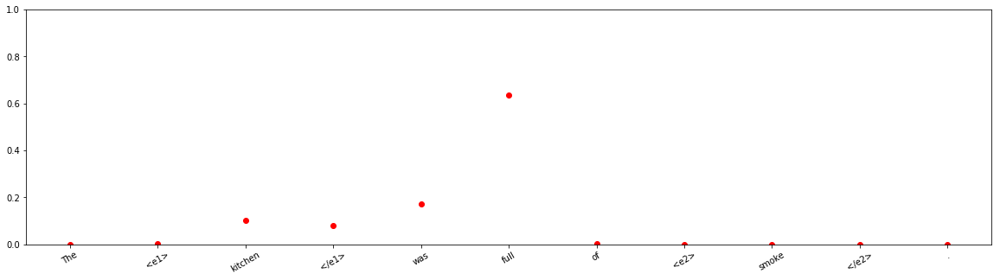









input sentence: The <e1> director </e1> shot some additional <e2> footage </e2> .
answer label:    Product-Producer(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 1.7128996e-05
Entity-Destination(e1,e2) 	:	 5.1476566e-11
Cause-Effect(e2,e1) 	:	 1.4292727e-11
Member-Collection(e2,e1) 	:	 2.9878863e-10
Entity-Origin(e1,e2) 	:	 8.926922e-08
Message-Topic(e1,e2) 	:	 9.473006e-12
Component-Whole(e1,e2) 	:	 9.159217e-12
Component-Whole(e2,e1) 	:	 1.1835181e-06
Instrument-Agency(e2,e1) 	:	 0.5706601
Content-Container(e1,e2) 	:	 7.357761e-07
Product-Producer(e2,e1) 	:	 0.42931655
Cause-Effect(e1,e2) 	:	 9.473364e-09
Product-Producer(e1,e2) 	:	 1.9533456e-11
Content-Container(e2,e1) 	:	 3.9305905e-06
Entity-Origin(e2,e1) 	:	 9.544364e-10
Message-Topic(e2,e1) 	:	 8.9473815e-09
Instrument-Agency(e1,e2) 	:	 1.0286874e-07
Member-Collection(e1,e2) 	:	 4.8516366e-08
Entity-Destination(e2,e1) 	:	 2.1738092e-11



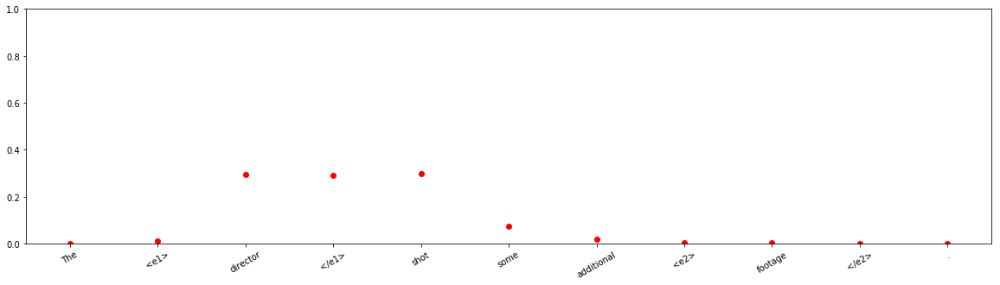














input sentence: A <e1> tree </e1> growing in the <e2> woods </e2> often develops long roots ( 15 to 25 feet ) rather than a compact root system in order to compete with the roots of existing trees .
answer label:    Member-Collection(e1,e2)
wrong label:    Other
Other 	:	 0.9692444
Entity-Destination(e1,e2) 	:	 5.88587e-11
Cause-Effect(e2,e1) 	:	 4.651465e-05
Member-Collection(e2,e1) 	:	 2.1610267e-09
Entity-Origin(e1,e2) 	:	 2.3529288e-05
Message-Topic(e1,e2) 	:	 1.883659e-09
Component-Whole(e1,e2) 	:	 0.030160403
Component-Whole(e2,e1) 	:	 6.064433e-07
Instrument-Agency(e2,e1) 	:	 6.482122e-10
Content-Container(e1,e2) 	:	 2.6155472e-08
Product-Producer(e2,e1) 	:	 4.0298054e-09
Cause-Effect(e1,e2) 	:	 2.4297877e-08
Product-Producer(e1,e2) 	:	 5.510225e-05
Content-Container(e2,e1) 	:	 2.233479e-11
Entity-Origin(e2,e1) 	:	 6.118285e-10
Message-Topic(e2,e1) 	:	 0.00033194182
Instrument-Agency(e1,e2) 	:	 5.561736e-07
Member-Collection(e1,e2) 	:	 0.00013675263
Entity-Destinati

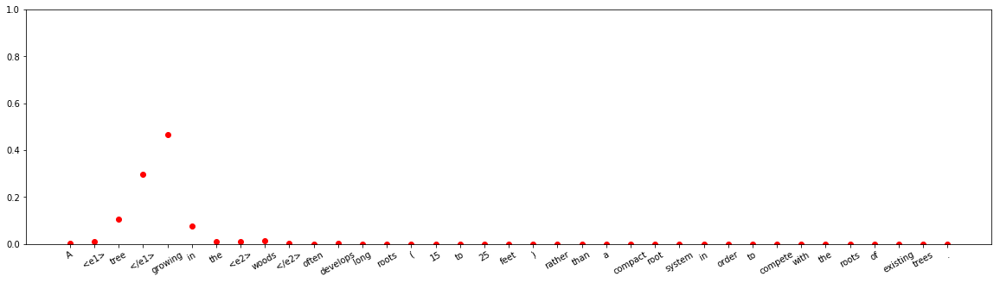








input sentence: Helped by donations , the <e1> association </e1> has assembled 1,000 free <e2> kits </e2> , which include water , flashlights , battery-operated radios , spare batteries , an emergency preparedness booklet and emergency window placards .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.0026099428
Entity-Destination(e1,e2) 	:	 7.499186e-06
Cause-Effect(e2,e1) 	:	 8.373245e-07
Member-Collection(e2,e1) 	:	 1.6341111e-05
Entity-Origin(e1,e2) 	:	 1.2798811e-06
Message-Topic(e1,e2) 	:	 3.768544e-10
Component-Whole(e1,e2) 	:	 8.176e-08
Component-Whole(e2,e1) 	:	 0.00016517604
Instrument-Agency(e2,e1) 	:	 0.01549217
Content-Container(e1,e2) 	:	 1.3221286e-07
Product-Producer(e2,e1) 	:	 0.9523841
Cause-Effect(e1,e2) 	:	 8.573148e-08
Product-Producer(e1,e2) 	:	 3.614842e-05
Content-Container(e2,e1) 	:	 2.2269471e-06
Entity-Origin(e2,e1) 	:	 1.1390849e-08
Message-Topic(e2,e1) 	:	 2.6976222e-06
Instrument-Agency(e1,e2) 	:	 0.029278757
Member-Collect

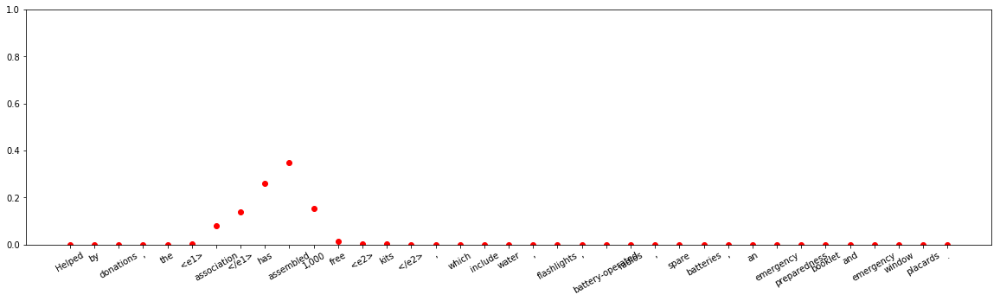


input sentence: Baljinder Singh is still recovering in The Alfred hospital , a week after he was stabbed in the stomach with a <e1> screwdriver </e1> by two <e2> men </e2> as they robbed him of his wallet .
answer label:    Instrument-Agency(e1,e2)
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.4656766e-08
Entity-Destination(e1,e2) 	:	 4.069629e-11
Cause-Effect(e2,e1) 	:	 7.830424e-07
Member-Collection(e2,e1) 	:	 1.4883163e-06
Entity-Origin(e1,e2) 	:	 7.1177565e-06
Message-Topic(e1,e2) 	:	 2.8104456e-15
Component-Whole(e1,e2) 	:	 3.5747703e-07
Component-Whole(e2,e1) 	:	 2.8460207e-08
Instrument-Agency(e2,e1) 	:	 1.9359418e-07
Content-Container(e1,e2) 	:	 8.692779e-09
Product-Producer(e2,e1) 	:	 4.5307478e-09
Cause-Effect(e1,e2) 	:	 6.6222764e-14
Product-Producer(e1,e2) 	:	 0.9170135
Content-Container(e2,e1) 	:	 1.8383475e-06
Entity-Origin(e2,e1) 	:	 4.918176e-12
Message-Topic(e2,e1) 	:	 1.9192527e-12
Instrument-Agency(e1,e2) 	:	 0.08297332
Member-Collection(e1,e2) 	:	 1.2852033e-

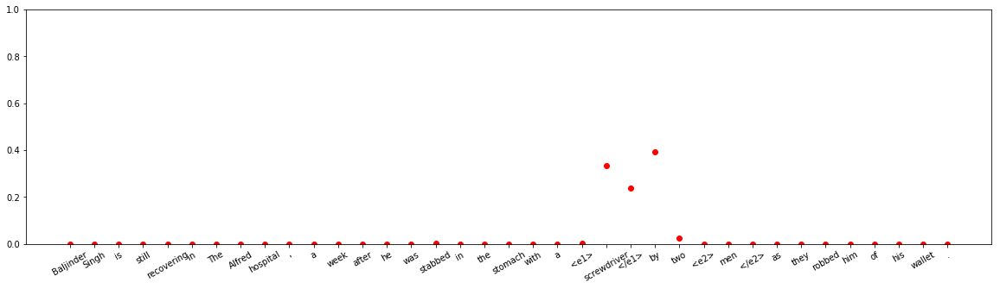



input sentence: Our <e1> visit </e1> is part of the general <e2> strategy </e2> to engage the global community to benefit our economy , to enhance our national security and of course , to promote the welfare of our OFWs -- the biggest community of which is right here in the Kingdom of Saudi Arabia .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.99234253
Entity-Destination(e1,e2) 	:	 2.2367757e-09
Cause-Effect(e2,e1) 	:	 8.130682e-09
Member-Collection(e2,e1) 	:	 7.7519315e-09
Entity-Origin(e1,e2) 	:	 3.2527954e-09
Message-Topic(e1,e2) 	:	 1.4648255e-08
Component-Whole(e1,e2) 	:	 0.0074393223
Component-Whole(e2,e1) 	:	 5.6827528e-08
Instrument-Agency(e2,e1) 	:	 4.0554396e-10
Content-Container(e1,e2) 	:	 6.9599984e-08
Product-Producer(e2,e1) 	:	 2.0184425e-10
Cause-Effect(e1,e2) 	:	 2.3006798e-10
Product-Producer(e1,e2) 	:	 6.836308e-09
Content-Container(e2,e1) 	:	 2.8735512e-09
Entity-Origin(e2,e1) 	:	 1.3456122e-09
Message-Topic(e2,e1) 	:	 0.0001331388
Inst

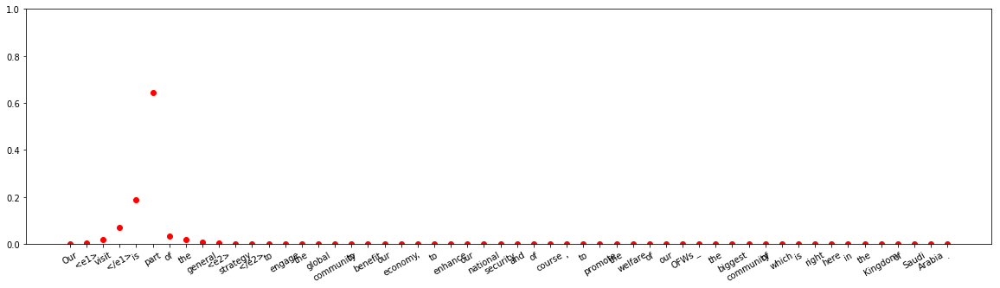


input sentence: The <e1> sand </e1> in the <e2> hourglass </e2> solves several problems of the clepsydra : it does not freeze in cold temperatures , it does not evaporate in warm weather , and it can be sealed so nothing can get in that will affect the flow of the sand in the glass .
answer label:    Content-Container(e1,e2)
wrong label:    Other
Other 	:	 0.7794457
Entity-Destination(e1,e2) 	:	 2.912932e-08
Cause-Effect(e2,e1) 	:	 3.1228334e-05
Member-Collection(e2,e1) 	:	 1.5429656e-11
Entity-Origin(e1,e2) 	:	 4.305215e-08
Message-Topic(e1,e2) 	:	 1.9646865e-08
Component-Whole(e1,e2) 	:	 0.22025506
Component-Whole(e2,e1) 	:	 1.3775684e-06
Instrument-Agency(e2,e1) 	:	 1.609805e-06
Content-Container(e1,e2) 	:	 0.00024102352
Product-Producer(e2,e1) 	:	 6.3155586e-10
Cause-Effect(e1,e2) 	:	 6.699421e-08
Product-Producer(e1,e2) 	:	 1.2782916e-09
Content-Container(e2,e1) 	:	 4.0669765e-09
Entity-Origin(e2,e1) 	:	 6.2762635e-11
Message-Topic(e2,e1) 	:	 1.7156004e-06
Instrument-Agency(e1,e2

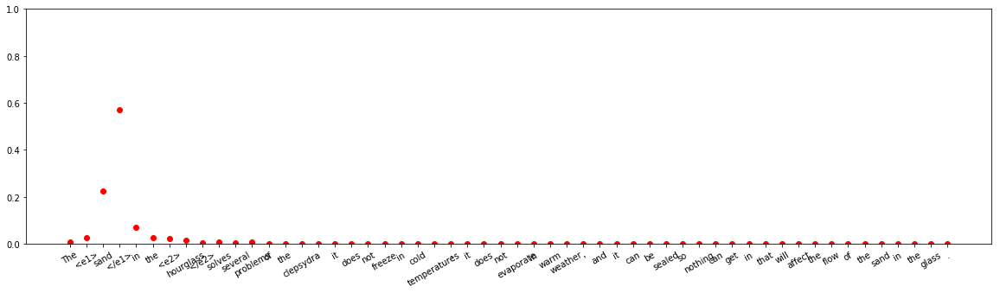











input sentence: An artificial coral reef sunk off Phuket 's Karon Beach two years ago is thought to be responsible for a bumper <e1> haul </e1> of <e2> fish </e2> caught by local fishermen earlier this month .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.35027653
Entity-Destination(e1,e2) 	:	 1.2524665e-11
Cause-Effect(e2,e1) 	:	 3.6706188e-10
Member-Collection(e2,e1) 	:	 0.6486318
Entity-Origin(e1,e2) 	:	 8.792489e-09
Message-Topic(e1,e2) 	:	 8.289798e-09
Component-Whole(e1,e2) 	:	 0.00044982074
Component-Whole(e2,e1) 	:	 1.235125e-07
Instrument-Agency(e2,e1) 	:	 1.5533406e-09
Content-Container(e1,e2) 	:	 7.137633e-08
Product-Producer(e2,e1) 	:	 6.761498e-09
Cause-Effect(e1,e2) 	:	 2.344116e-10
Product-Producer(e1,e2) 	:	 9.5040656e-07
Content-Container(e2,e1) 	:	 0.0002980113
Entity-Origin(e2,e1) 	:	 8.4815713e-07
Message-Topic(e2,e1) 	:	 2.7965221e-09
Instrument-Agency(e1,e2) 	:	 0.00034157926
Member-Collection(e1,e2) 	:	 2.6645623e-07
Entity

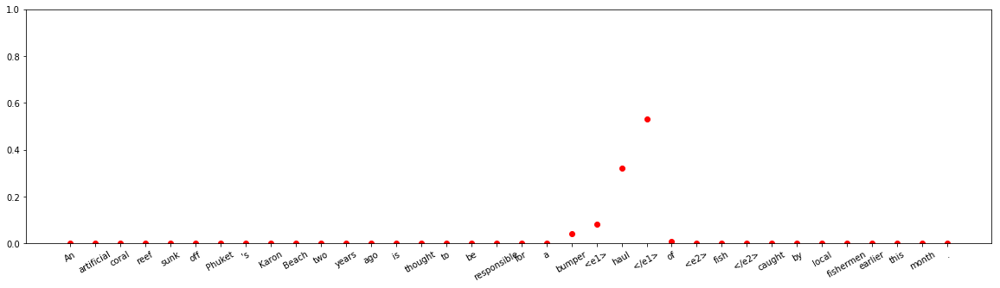


input sentence: As the young <e1> girl </e1> journeyed into unbelievable <e2> danger </e2> , she did not have the faintest clue that she alone was destined to win , or to lose , this more-than-mortal battle .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 0.23590258
Entity-Destination(e1,e2) 	:	 0.76237196
Cause-Effect(e2,e1) 	:	 7.3245006e-09
Member-Collection(e2,e1) 	:	 5.163426e-09
Entity-Origin(e1,e2) 	:	 3.17538e-06
Message-Topic(e1,e2) 	:	 2.7503417e-09
Component-Whole(e1,e2) 	:	 1.8225724e-13
Component-Whole(e2,e1) 	:	 2.8674827e-14
Instrument-Agency(e2,e1) 	:	 4.4865933e-09
Content-Container(e1,e2) 	:	 2.8641898e-08
Product-Producer(e2,e1) 	:	 9.563498e-07
Cause-Effect(e1,e2) 	:	 3.4502066e-06
Product-Producer(e1,e2) 	:	 4.5558843e-12
Content-Container(e2,e1) 	:	 9.147571e-09
Entity-Origin(e2,e1) 	:	 2.651202e-06
Message-Topic(e2,e1) 	:	 6.686757e-11
Instrument-Agency(e1,e2) 	:	 1.03424505e-08
Member-Collection(e1,e2) 	:	 0.0017152525
Entity-Destina

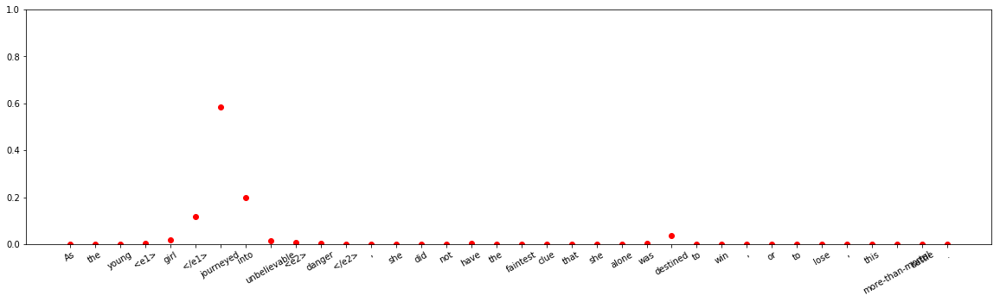


input sentence: This <e1> paper </e1> is constructed from a portion of a <e2> thesis </e2> presented by Edward W. Shand , June , 1930 , for the degree of Doctor of Philosophy at New York University .
answer label:    Entity-Origin(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 9.471155e-10
Entity-Destination(e1,e2) 	:	 9.951462e-11
Cause-Effect(e2,e1) 	:	 3.620674e-08
Member-Collection(e2,e1) 	:	 4.325972e-06
Entity-Origin(e1,e2) 	:	 0.027448142
Message-Topic(e1,e2) 	:	 3.6138421e-09
Component-Whole(e1,e2) 	:	 0.89275926
Component-Whole(e2,e1) 	:	 9.4147515e-05
Instrument-Agency(e2,e1) 	:	 1.3875104e-13
Content-Container(e1,e2) 	:	 1.7198857e-07
Product-Producer(e2,e1) 	:	 1.0125088e-06
Cause-Effect(e1,e2) 	:	 3.761575e-12
Product-Producer(e1,e2) 	:	 0.079324596
Content-Container(e2,e1) 	:	 7.98701e-09
Entity-Origin(e2,e1) 	:	 2.262028e-09
Message-Topic(e2,e1) 	:	 0.00036733682
Instrument-Agency(e1,e2) 	:	 3.4283218e-10
Member-Collection(e1,e2) 	:	 8.7565684e-07
Entity-Destin

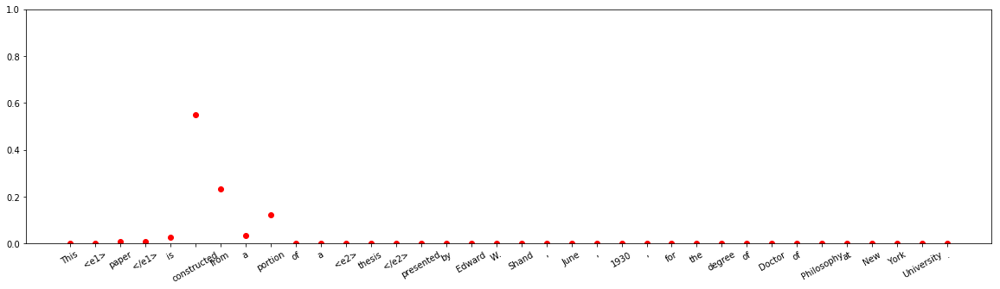






input sentence: The party-goers had an array of favorite <e1> moments </e1> from the past <e2> year </e2> , from celebrity scandals to personal triumphs , but everyone seemed focused on their resolutions and things to come .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 0.000995059
Entity-Destination(e1,e2) 	:	 1.4836598e-07
Cause-Effect(e2,e1) 	:	 0.98216176
Member-Collection(e2,e1) 	:	 6.1750214e-09
Entity-Origin(e1,e2) 	:	 0.016700506
Message-Topic(e1,e2) 	:	 9.2711794e-10
Component-Whole(e1,e2) 	:	 1.10991344e-07
Component-Whole(e2,e1) 	:	 2.185296e-09
Instrument-Agency(e2,e1) 	:	 2.6238695e-10
Content-Container(e1,e2) 	:	 3.0929527e-07
Product-Producer(e2,e1) 	:	 1.0864685e-10
Cause-Effect(e1,e2) 	:	 1.5281053e-08
Product-Producer(e1,e2) 	:	 0.0001407064
Content-Container(e2,e1) 	:	 5.3185834e-09
Entity-Origin(e2,e1) 	:	 7.30059e-08
Message-Topic(e2,e1) 	:	 1.3139183e-07
Instrument-Agency(e1,e2) 	:	 7.810449e-07
Member-Collection(e1,e2) 	

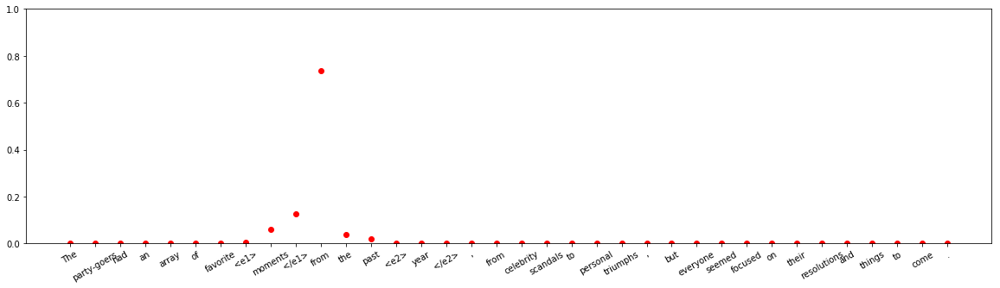












input sentence: The vehicle 's <e1> name </e1> was leaked in a Financial Times <e2> article </e2> published on August 31 , and this evening , several photos and more information about the concept were published online .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 7.6377626e-11
Entity-Destination(e1,e2) 	:	 0.00023027521
Cause-Effect(e2,e1) 	:	 1.1001052e-12
Member-Collection(e2,e1) 	:	 2.911111e-09
Entity-Origin(e1,e2) 	:	 0.24485838
Message-Topic(e1,e2) 	:	 7.468911e-10
Component-Whole(e1,e2) 	:	 6.539704e-08
Component-Whole(e2,e1) 	:	 1.97721e-08
Instrument-Agency(e2,e1) 	:	 3.7031776e-15
Content-Container(e1,e2) 	:	 0.0013001119
Product-Producer(e2,e1) 	:	 0.7478938
Cause-Effect(e1,e2) 	:	 7.6931345e-10
Product-Producer(e1,e2) 	:	 6.2426935e-08
Content-Container(e2,e1) 	:	 6.629678e-08
Entity-Origin(e2,e1) 	:	 8.44259e-09
Message-Topic(e2,e1) 	:	 0.0057171597
Instrument-Agency(e1,e2) 	:	 1.9476894e-15
Member-Collection(e1,e2) 	:	 1.8162517e-09

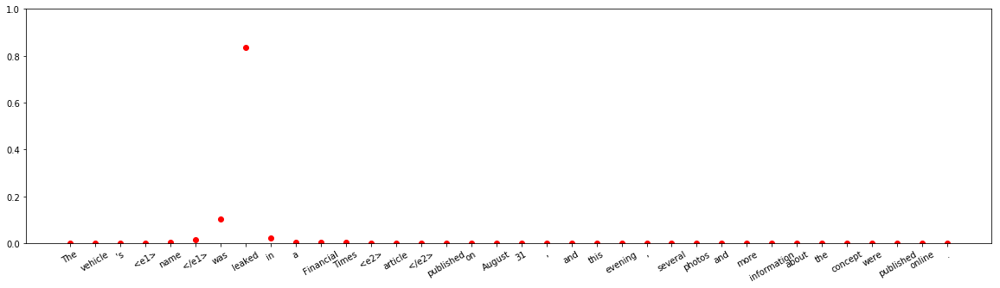





input sentence: The target of the naval chief of attaining a <e1> ship </e1> <e2> fleet </e2> of 313 remains uncertain , as the Congress believes that it would be beyond their budget to fund such a huge amount and cheaper options of shipbuilding were possible
answer label:    Member-Collection(e1,e2)
wrong label:    Other
Other 	:	 0.9557837
Entity-Destination(e1,e2) 	:	 1.096724e-06
Cause-Effect(e2,e1) 	:	 3.1205192e-09
Member-Collection(e2,e1) 	:	 4.2181222e-05
Entity-Origin(e1,e2) 	:	 6.444412e-07
Message-Topic(e1,e2) 	:	 3.0819058e-09
Component-Whole(e1,e2) 	:	 4.344858e-05
Component-Whole(e2,e1) 	:	 2.0790003e-08
Instrument-Agency(e2,e1) 	:	 1.4782183e-09
Content-Container(e1,e2) 	:	 4.1588e-06
Product-Producer(e2,e1) 	:	 5.4195395e-09
Cause-Effect(e1,e2) 	:	 1.8739075e-09
Product-Producer(e1,e2) 	:	 6.7737267e-07
Content-Container(e2,e1) 	:	 9.320664e-05
Entity-Origin(e2,e1) 	:	 9.2337814e-07
Message-Topic(e2,e1) 	:	 8.9246215e-11
Instrument-Agency(e1,e2) 	:	 0.00039197816
Me

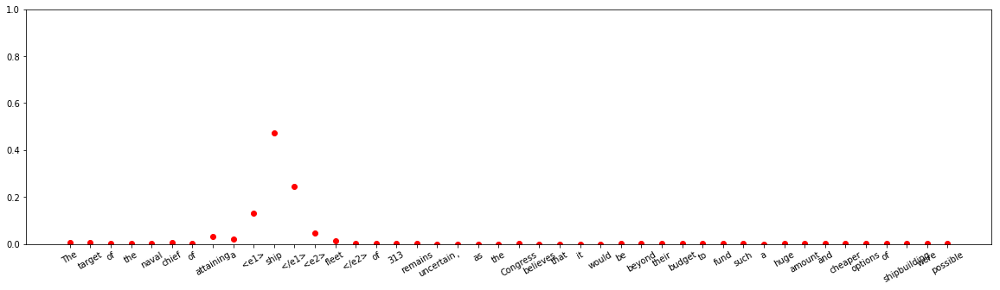









input sentence: David Mamet took questions from the audience and shared his <e1> views </e1> on topics such as <e2> television </e2> , the democracy of culture and the English accent .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 8.449188e-17
Cause-Effect(e2,e1) 	:	 2.8082962e-14
Member-Collection(e2,e1) 	:	 3.0900456e-14
Entity-Origin(e1,e2) 	:	 4.6368076e-17
Message-Topic(e1,e2) 	:	 3.1742214e-10
Component-Whole(e1,e2) 	:	 1.0052528e-12
Component-Whole(e2,e1) 	:	 7.5025726e-14
Instrument-Agency(e2,e1) 	:	 2.096222e-12
Content-Container(e1,e2) 	:	 7.197319e-16
Product-Producer(e2,e1) 	:	 1.2368376e-13
Cause-Effect(e1,e2) 	:	 1.3458735e-14
Product-Producer(e1,e2) 	:	 6.3625917e-14
Content-Container(e2,e1) 	:	 3.1906647e-14
Entity-Origin(e2,e1) 	:	 8.808964e-15
Message-Topic(e2,e1) 	:	 7.11752e-10
Instrument-Agency(e1,e2) 	:	 4.6657296e-13
Member-Collection(e1,e2) 	:	 4.1631555e-15
Entity-Destination(e2,e1) 	:	 1.3013038

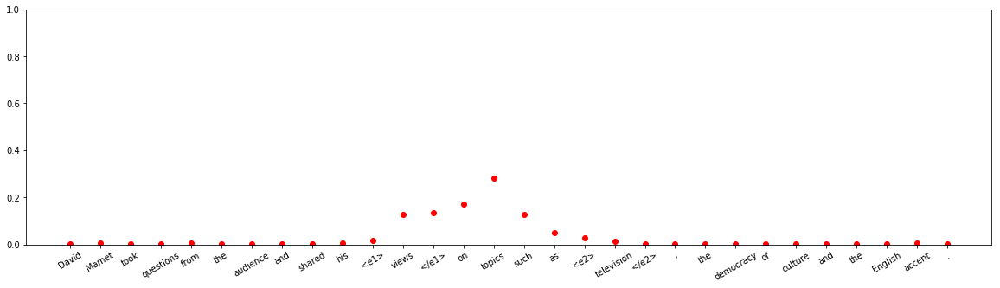






input sentence: I read the <e1> report </e1> from Somalia on the <e2> agreement </e2> reached by faction leaders on the form of a future government that has been warmly welcomed .
answer label:    Message-Topic(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.8049454e-10
Entity-Destination(e1,e2) 	:	 8.058303e-06
Cause-Effect(e2,e1) 	:	 1.3083242e-08
Member-Collection(e2,e1) 	:	 3.3396185e-07
Entity-Origin(e1,e2) 	:	 0.7654145
Message-Topic(e1,e2) 	:	 0.021577783
Component-Whole(e1,e2) 	:	 7.47041e-06
Component-Whole(e2,e1) 	:	 1.1017666e-10
Instrument-Agency(e2,e1) 	:	 1.6454347e-08
Content-Container(e1,e2) 	:	 6.4131586e-05
Product-Producer(e2,e1) 	:	 2.7665583e-09
Cause-Effect(e1,e2) 	:	 4.1916647e-11
Product-Producer(e1,e2) 	:	 0.20880255
Content-Container(e2,e1) 	:	 3.586099e-08
Entity-Origin(e2,e1) 	:	 1.4426607e-08
Message-Topic(e2,e1) 	:	 6.1105534e-06
Instrument-Agency(e1,e2) 	:	 4.5195597e-05
Member-Collection(e1,e2) 	:	 0.004073862
Entity-Destination(e2,e1) 	:	 5

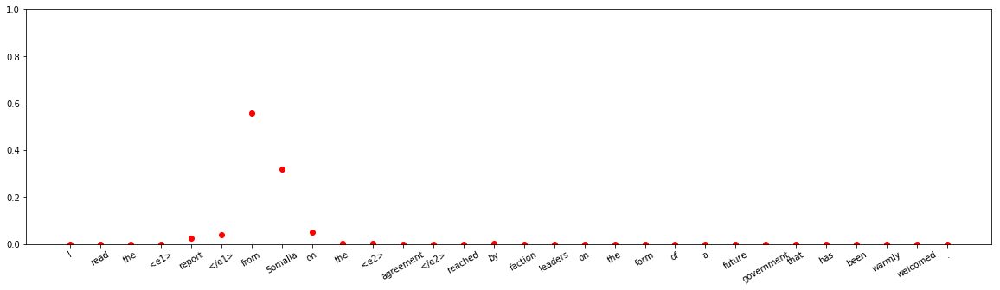





input sentence: The <e1> movie </e1> featured a mutated <e2> sheep </e2> as the titular monster , which grew larger throughout the movie , until it exploded in the climactic scene .
answer label:    Message-Topic(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.1561214e-13
Entity-Destination(e1,e2) 	:	 8.684414e-08
Cause-Effect(e2,e1) 	:	 6.170384e-09
Member-Collection(e2,e1) 	:	 0.034516554
Entity-Origin(e1,e2) 	:	 0.04529688
Message-Topic(e1,e2) 	:	 0.036223613
Component-Whole(e1,e2) 	:	 3.9769606e-07
Component-Whole(e2,e1) 	:	 0.57291293
Instrument-Agency(e2,e1) 	:	 2.9823233e-09
Content-Container(e1,e2) 	:	 1.1708495e-06
Product-Producer(e2,e1) 	:	 0.04664459
Cause-Effect(e1,e2) 	:	 0.0031979226
Product-Producer(e1,e2) 	:	 0.005206029
Content-Container(e2,e1) 	:	 1.3039368e-06
Entity-Origin(e2,e1) 	:	 5.746672e-07
Message-Topic(e2,e1) 	:	 0.25598562
Instrument-Agency(e1,e2) 	:	 2.2009358e-06
Member-Collection(e1,e2) 	:	 1.0176073e-05
Entity-Destination(e2,e1) 	:	 9.361

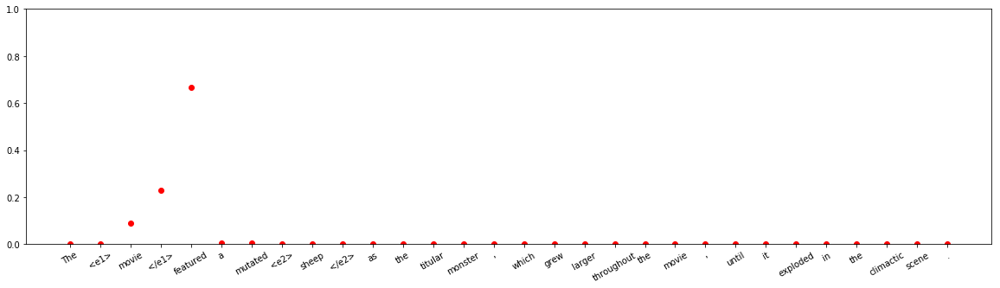






input sentence: Transport authorities in the Western Cape have warned of hefty fines for motorists who ignore dedicated <e1> lane </e1> for buses and minibus taxis on the <e2> road </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.9920185
Entity-Destination(e1,e2) 	:	 1.317268e-07
Cause-Effect(e2,e1) 	:	 3.266941e-08
Member-Collection(e2,e1) 	:	 3.4406566e-10
Entity-Origin(e1,e2) 	:	 9.610547e-10
Message-Topic(e1,e2) 	:	 2.8036306e-08
Component-Whole(e1,e2) 	:	 3.62543e-07
Component-Whole(e2,e1) 	:	 1.5746918e-10
Instrument-Agency(e2,e1) 	:	 0.007976606
Content-Container(e1,e2) 	:	 1.0525253e-08
Product-Producer(e2,e1) 	:	 1.2856618e-11
Cause-Effect(e1,e2) 	:	 1.01379266e-10
Product-Producer(e1,e2) 	:	 1.0431881e-11
Content-Container(e2,e1) 	:	 4.0331467e-09
Entity-Origin(e2,e1) 	:	 3.5698575e-10
Message-Topic(e2,e1) 	:	 1.3629082e-08
Instrument-Agency(e1,e2) 	:	 4.4170692e-06
Member-Collection(e1,e2) 	:	 2.828908e-09
Entity-Destination(e2,e1) 	:	 1

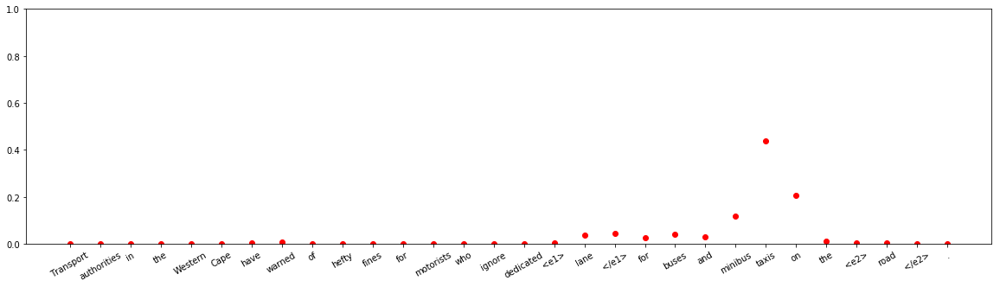














input sentence: The <e1> show </e1> was pulled from its original Christmas/New Year <e2> slot </e2> because of the Tsunami , and to be honest it really should have stayed pulled .
answer label:    Entity-Origin(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.9335927e-13
Entity-Destination(e1,e2) 	:	 7.0647532e-09
Cause-Effect(e2,e1) 	:	 6.7996525e-10
Member-Collection(e2,e1) 	:	 5.9832174e-11
Entity-Origin(e1,e2) 	:	 0.008110185
Message-Topic(e1,e2) 	:	 1.8451712e-12
Component-Whole(e1,e2) 	:	 4.8534115e-08
Component-Whole(e2,e1) 	:	 0.9918894
Instrument-Agency(e2,e1) 	:	 1.9415262e-10
Content-Container(e1,e2) 	:	 3.2678324e-07
Product-Producer(e2,e1) 	:	 4.5147996e-12
Cause-Effect(e1,e2) 	:	 2.1000656e-12
Product-Producer(e1,e2) 	:	 4.209952e-11
Content-Container(e2,e1) 	:	 5.223938e-09
Entity-Origin(e2,e1) 	:	 8.458595e-13
Message-Topic(e2,e1) 	:	 1.0857707e-10
Instrument-Agency(e1,e2) 	:	 2.3248398e-12
Member-Collection(e1,e2) 	:	 1.4179207e-13
Entity-Destinat

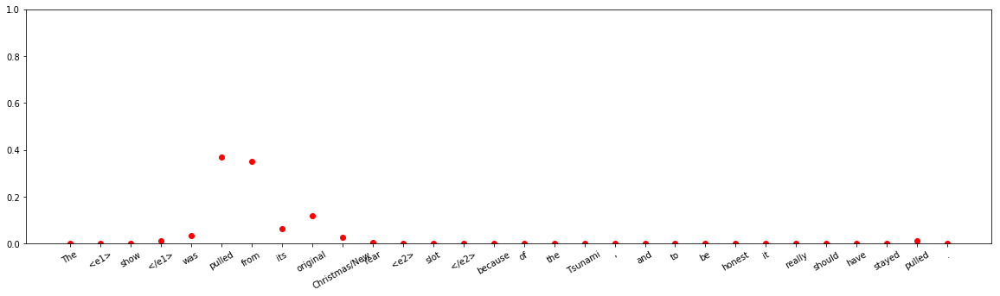


input sentence: The rural European 'stem family ' , or extended <e1> family </e1> , consisting of parents and one married <e2> child </e2> who would eventually inherit the family property .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.821377
Entity-Destination(e1,e2) 	:	 2.768573e-11
Cause-Effect(e2,e1) 	:	 9.989436e-10
Member-Collection(e2,e1) 	:	 0.17199108
Entity-Origin(e1,e2) 	:	 1.4197615e-06
Message-Topic(e1,e2) 	:	 1.3624186e-06
Component-Whole(e1,e2) 	:	 2.530371e-06
Component-Whole(e2,e1) 	:	 0.0011361142
Instrument-Agency(e2,e1) 	:	 2.1708205e-07
Content-Container(e1,e2) 	:	 4.56228e-06
Product-Producer(e2,e1) 	:	 8.304457e-05
Cause-Effect(e1,e2) 	:	 8.045886e-07
Product-Producer(e1,e2) 	:	 0.0005745994
Content-Container(e2,e1) 	:	 0.00067762076
Entity-Origin(e2,e1) 	:	 0.00063518476
Message-Topic(e2,e1) 	:	 1.6651371e-07
Instrument-Agency(e1,e2) 	:	 0.0034951353
Member-Collection(e1,e2) 	:	 1.9323905e-05
Entity-Destination(e2,e1) 	:	 1.9275497

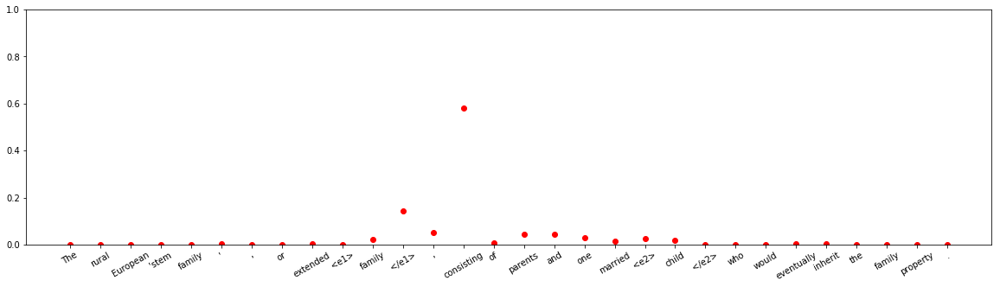

















input sentence: The inside of your <e1> nose </e1> is lined with a moist , thin layer of <e2> tissue </e2> called a mucous membrane ( say : myoo-kus mem-brayne ) .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.6628863e-05
Entity-Destination(e1,e2) 	:	 1.1596609e-11
Cause-Effect(e2,e1) 	:	 2.7970549e-08
Member-Collection(e2,e1) 	:	 8.738992e-10
Entity-Origin(e1,e2) 	:	 8.5602805e-09
Message-Topic(e1,e2) 	:	 2.8436877e-12
Component-Whole(e1,e2) 	:	 0.016413147
Component-Whole(e2,e1) 	:	 0.9473039
Instrument-Agency(e2,e1) 	:	 1.895613e-06
Content-Container(e1,e2) 	:	 2.9266727e-07
Product-Producer(e2,e1) 	:	 2.8654883e-08
Cause-Effect(e1,e2) 	:	 3.6039631e-09
Product-Producer(e1,e2) 	:	 2.0340012e-09
Content-Container(e2,e1) 	:	 0.03626355
Entity-Origin(e2,e1) 	:	 1.1484767e-07
Message-Topic(e2,e1) 	:	 1.2463927e-12
Instrument-Agency(e1,e2) 	:	 3.8151316e-07
Member-Collection(e1,e2) 	:	 1.1891069e-13
Entity-Destination(e2,e1) 	:	 9.014918e-10



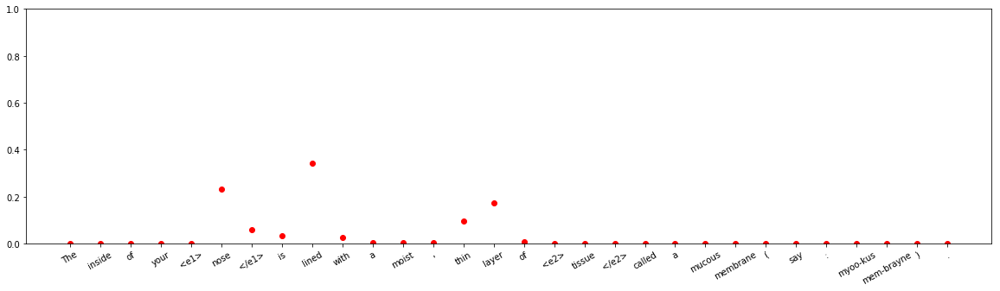



input sentence: At the moment , we have to expend a great deal of effort to fight black Sigatoka , which attacks the banana <e1> plant </e1> 's <e2> leaves </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 6.685064e-11
Entity-Destination(e1,e2) 	:	 1.1014625e-09
Cause-Effect(e2,e1) 	:	 1.7740308e-10
Member-Collection(e2,e1) 	:	 2.1024576e-11
Entity-Origin(e1,e2) 	:	 1.2694254e-06
Message-Topic(e1,e2) 	:	 6.3023247e-13
Component-Whole(e1,e2) 	:	 6.021508e-11
Component-Whole(e2,e1) 	:	 9.880841e-08
Instrument-Agency(e2,e1) 	:	 1.9880948e-09
Content-Container(e1,e2) 	:	 1.0955732e-08
Product-Producer(e2,e1) 	:	 0.9999981
Cause-Effect(e1,e2) 	:	 7.383496e-10
Product-Producer(e1,e2) 	:	 4.6396e-07
Content-Container(e2,e1) 	:	 2.679822e-11
Entity-Origin(e2,e1) 	:	 5.487121e-08
Message-Topic(e2,e1) 	:	 2.930845e-11
Instrument-Agency(e1,e2) 	:	 5.279699e-09
Member-Collection(e1,e2) 	:	 2.0005717e-09
Entity-Destination(e2,e1) 	:	 1.4822898e-13



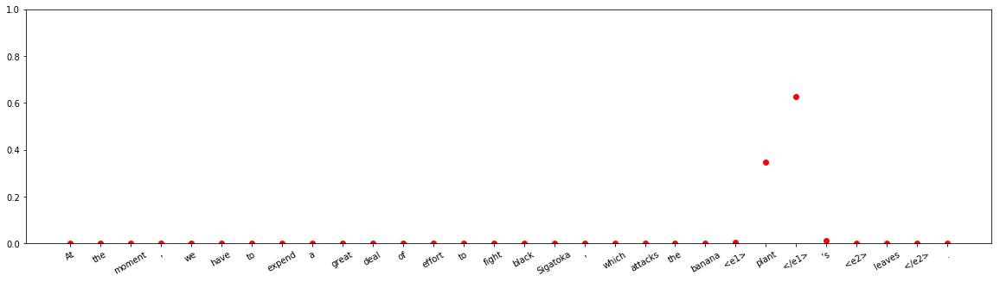




input sentence: `` National Discourse '' ( 1780 ) shows a stout British <e1> sailor </e1> with a <e2> cudgel </e2> staring down a relatively effete French seaman with a sword .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.7418175e-09
Entity-Destination(e1,e2) 	:	 2.793665e-13
Cause-Effect(e2,e1) 	:	 6.933884e-12
Member-Collection(e2,e1) 	:	 2.7739787e-08
Entity-Origin(e1,e2) 	:	 5.4534006e-08
Message-Topic(e1,e2) 	:	 3.0887912e-10
Component-Whole(e1,e2) 	:	 4.861168e-06
Component-Whole(e2,e1) 	:	 0.92879283
Instrument-Agency(e2,e1) 	:	 0.07073951
Content-Container(e1,e2) 	:	 0.00011706816
Product-Producer(e2,e1) 	:	 7.9920646e-08
Cause-Effect(e1,e2) 	:	 1.4746327e-11
Product-Producer(e1,e2) 	:	 1.0513002e-08
Content-Container(e2,e1) 	:	 0.00017235283
Entity-Origin(e2,e1) 	:	 3.031571e-12
Message-Topic(e2,e1) 	:	 1.1301e-13
Instrument-Agency(e1,e2) 	:	 0.00017322172
Member-Collection(e1,e2) 	:	 2.4667863e-11
Entity-Destination(e2,e1) 	:

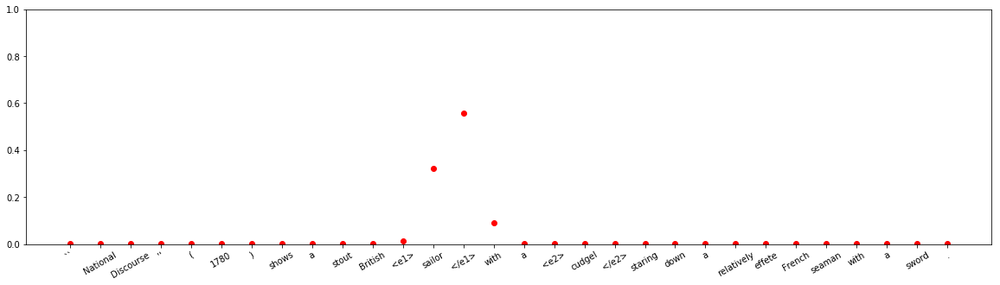





input sentence: A 7-month-old <e1> baby </e1> was locked in a 2-by-3 foot <e2> cedar chest </e2> hidden underneath her aunt 's bed for 12 hours before police found her Wednesday .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 6.240171e-11
Entity-Destination(e1,e2) 	:	 4.871538e-06
Cause-Effect(e2,e1) 	:	 1.0823249e-15
Member-Collection(e2,e1) 	:	 1.1694436e-13
Entity-Origin(e1,e2) 	:	 6.358016e-08
Message-Topic(e1,e2) 	:	 1.2940337e-17
Component-Whole(e1,e2) 	:	 2.6349022e-07
Component-Whole(e2,e1) 	:	 3.8409637e-10
Instrument-Agency(e2,e1) 	:	 4.9457888e-14
Content-Container(e1,e2) 	:	 0.99999475
Product-Producer(e2,e1) 	:	 3.4269476e-13
Cause-Effect(e1,e2) 	:	 2.252301e-16
Product-Producer(e1,e2) 	:	 3.4478194e-15
Content-Container(e2,e1) 	:	 4.147786e-09
Entity-Origin(e2,e1) 	:	 1.2196927e-12
Message-Topic(e2,e1) 	:	 7.758574e-14
Instrument-Agency(e1,e2) 	:	 1.3376522e-13
Member-Collection(e1,e2) 	:	 1.3739332e-10
Entity-Destination(e2,e1) 	:	 4.07031

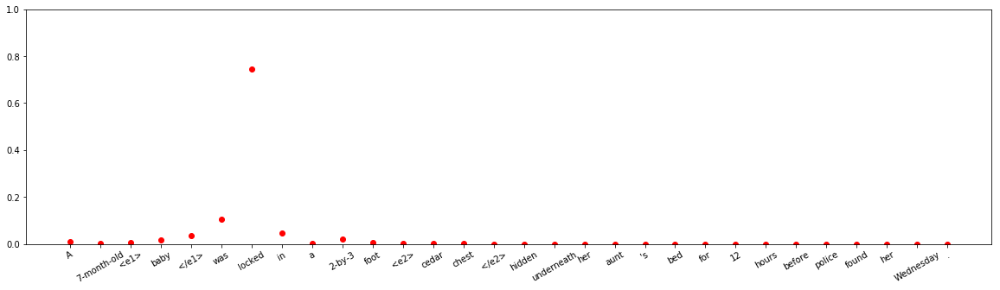






input sentence: <e1> Pressure </e1> from shoes and walking cause <e2> friction </e2> and the body 's natural response is to build up the skin to protect it from breaking down .
answer label:    Cause-Effect(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 2.1584262e-10
Entity-Destination(e1,e2) 	:	 2.5929303e-09
Cause-Effect(e2,e1) 	:	 0.80086493
Member-Collection(e2,e1) 	:	 2.6307945e-10
Entity-Origin(e1,e2) 	:	 3.567074e-06
Message-Topic(e1,e2) 	:	 9.146076e-09
Component-Whole(e1,e2) 	:	 2.694883e-10
Component-Whole(e2,e1) 	:	 3.5283986e-06
Instrument-Agency(e2,e1) 	:	 7.446383e-08
Content-Container(e1,e2) 	:	 8.124415e-11
Product-Producer(e2,e1) 	:	 4.1107544e-08
Cause-Effect(e1,e2) 	:	 0.19912721
Product-Producer(e1,e2) 	:	 5.2418864e-07
Content-Container(e2,e1) 	:	 3.9811588e-11
Entity-Origin(e2,e1) 	:	 2.0738211e-08
Message-Topic(e2,e1) 	:	 1.285212e-07
Instrument-Agency(e1,e2) 	:	 7.199725e-08
Member-Collection(e1,e2) 	:	 8.7812746e-10
Entity-Destination(e2,e1) 	:	 8.21

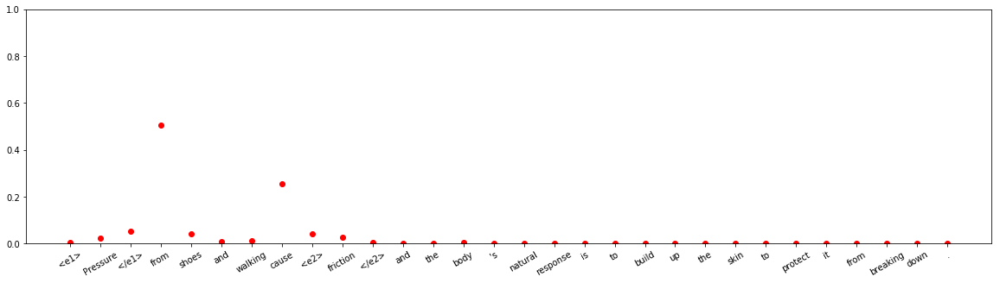










input sentence: The evidence was sufficient to authorize a rational trier of fact to conclude beyond a reasonable doubt that <e1> appellant </e1> had killed the victim with <e2> malice </e2> .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 7.3090974e-05
Entity-Destination(e1,e2) 	:	 2.0529571e-09
Cause-Effect(e2,e1) 	:	 4.4037117e-07
Member-Collection(e2,e1) 	:	 1.8643794e-06
Entity-Origin(e1,e2) 	:	 9.00639e-07
Message-Topic(e1,e2) 	:	 1.9336772e-08
Component-Whole(e1,e2) 	:	 1.5614195e-10
Component-Whole(e2,e1) 	:	 5.09111e-09
Instrument-Agency(e2,e1) 	:	 0.99970055
Content-Container(e1,e2) 	:	 4.8106535e-06
Product-Producer(e2,e1) 	:	 6.804503e-05
Cause-Effect(e1,e2) 	:	 4.0712457e-05
Product-Producer(e1,e2) 	:	 4.4338563e-10
Content-Container(e2,e1) 	:	 0.00010040841
Entity-Origin(e2,e1) 	:	 3.5133632e-09
Message-Topic(e2,e1) 	:	 3.712945e-10
Instrument-Agency(e1,e2) 	:	 6.7589935e-06
Member-Collection(e1,e2) 	:	 2.350274e-06
Entity-Destination(e

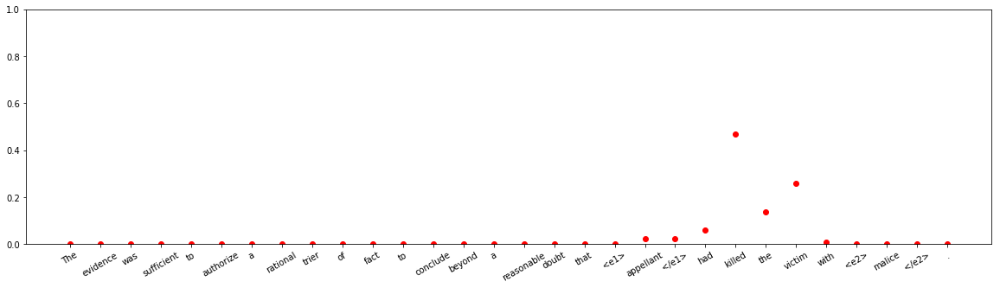


input sentence: They shop there for a huge selection of furniture and table legs , carved and turned <e1> furniture </e1> <e2> legs </e2> and feet , wood turnings and more .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 8.813913e-10
Entity-Destination(e1,e2) 	:	 1.5864815e-13
Cause-Effect(e2,e1) 	:	 1.0954912e-10
Member-Collection(e2,e1) 	:	 1.4387456e-08
Entity-Origin(e1,e2) 	:	 2.2654813e-08
Message-Topic(e1,e2) 	:	 1.2108206e-14
Component-Whole(e1,e2) 	:	 3.7944628e-10
Component-Whole(e2,e1) 	:	 0.99999845
Instrument-Agency(e2,e1) 	:	 2.1788031e-09
Content-Container(e1,e2) 	:	 1.207459e-07
Product-Producer(e2,e1) 	:	 1.4553011e-06
Cause-Effect(e1,e2) 	:	 2.2247434e-10
Product-Producer(e1,e2) 	:	 1.833191e-08
Content-Container(e2,e1) 	:	 4.191017e-08
Entity-Origin(e2,e1) 	:	 4.6070286e-10
Message-Topic(e2,e1) 	:	 7.121997e-12
Instrument-Agency(e1,e2) 	:	 5.816676e-08
Member-Collection(e1,e2) 	:	 2.792728e-13
Entity-Destination(e2,e1) 	:	 1.121396e-12



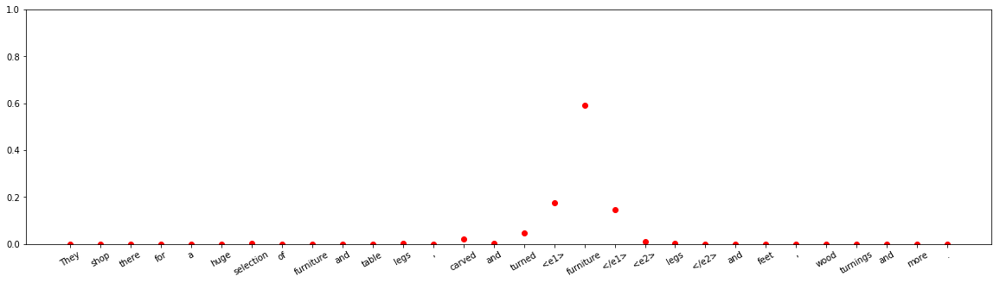







input sentence: Adler 's <e1> belief </e1> in human teleology was a radical departure from the `` cause-and-effect '' <e2> determinism </e2> of science at the beginning of the 20th century .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 0.00034825338
Entity-Destination(e1,e2) 	:	 1.3059501e-07
Cause-Effect(e2,e1) 	:	 0.0410415
Member-Collection(e2,e1) 	:	 5.504635e-07
Entity-Origin(e1,e2) 	:	 0.95821816
Message-Topic(e1,e2) 	:	 6.641856e-06
Component-Whole(e1,e2) 	:	 7.7262634e-11
Component-Whole(e2,e1) 	:	 1.2978751e-10
Instrument-Agency(e2,e1) 	:	 1.8753374e-08
Content-Container(e1,e2) 	:	 2.1701746e-08
Product-Producer(e2,e1) 	:	 8.1605236e-07
Cause-Effect(e1,e2) 	:	 0.00019829706
Product-Producer(e1,e2) 	:	 2.825412e-06
Content-Container(e2,e1) 	:	 3.0951557e-07
Entity-Origin(e2,e1) 	:	 0.00017516415
Message-Topic(e2,e1) 	:	 1.6912254e-06
Instrument-Agency(e1,e2) 	:	 2.0254767e-07
Member-Collection(e1,e2) 	:	 5.392704e-06
Entity-Destination(e2,e1) 	:	 

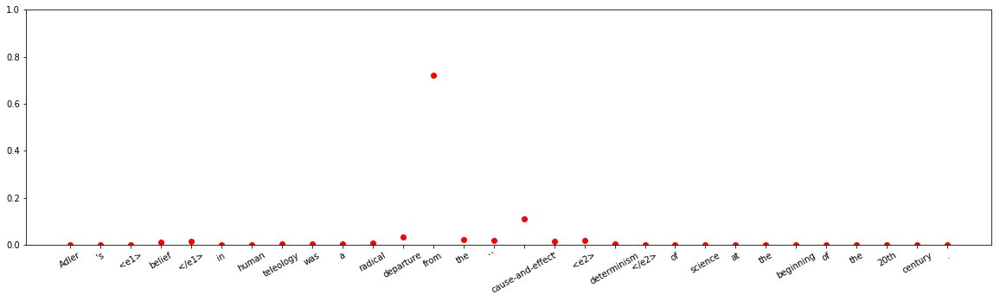












input sentence: At the public inquiry into the disaster <e1> firefighters </e1> described the <e2> horror </e2> that faced them when they arrived at the scene of the Paddington rail crash .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 9.333515e-05
Entity-Destination(e1,e2) 	:	 3.093013e-06
Cause-Effect(e2,e1) 	:	 0.4160646
Member-Collection(e2,e1) 	:	 7.5156095e-06
Entity-Origin(e1,e2) 	:	 3.272688e-08
Message-Topic(e1,e2) 	:	 0.0003273288
Component-Whole(e1,e2) 	:	 8.30149e-06
Component-Whole(e2,e1) 	:	 7.5237135e-06
Instrument-Agency(e2,e1) 	:	 3.5017993e-06
Content-Container(e1,e2) 	:	 7.585593e-08
Product-Producer(e2,e1) 	:	 0.0015190654
Cause-Effect(e1,e2) 	:	 0.41292518
Product-Producer(e1,e2) 	:	 3.4417271e-06
Content-Container(e2,e1) 	:	 4.3202309e-07
Entity-Origin(e2,e1) 	:	 2.0390594e-07
Message-Topic(e2,e1) 	:	 0.16899662
Instrument-Agency(e1,e2) 	:	 3.855219e-05
Member-Collection(e1,e2) 	:	 1.0633956e-06
Entity-Destination(e2,e1) 	:	 2.239

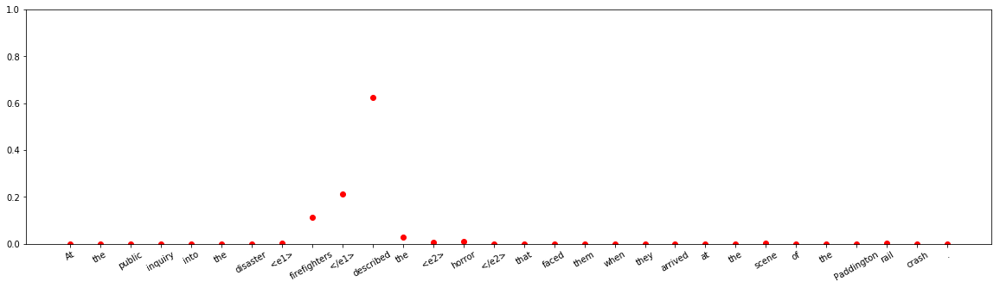


input sentence: On a friend 's advice , I purchased a sauerkraut and <e1> kimchi </e1> <e2> maker </e2> here and it is just fabulous ( and cheap too ) .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 9.310162e-13
Entity-Destination(e1,e2) 	:	 4.6028927e-12
Cause-Effect(e2,e1) 	:	 1.8358287e-11
Member-Collection(e2,e1) 	:	 3.0065755e-10
Entity-Origin(e1,e2) 	:	 4.9011635e-09
Message-Topic(e1,e2) 	:	 3.0415574e-14
Component-Whole(e1,e2) 	:	 1.2665883e-13
Component-Whole(e2,e1) 	:	 2.3330509e-12
Instrument-Agency(e2,e1) 	:	 7.964911e-16
Content-Container(e1,e2) 	:	 2.5660196e-11
Product-Producer(e2,e1) 	:	 1.7755204e-09
Cause-Effect(e1,e2) 	:	 9.090794e-10
Product-Producer(e1,e2) 	:	 0.99999964
Content-Container(e2,e1) 	:	 3.2749682e-14
Entity-Origin(e2,e1) 	:	 7.647894e-09
Message-Topic(e2,e1) 	:	 8.428438e-13
Instrument-Agency(e1,e2) 	:	 3.445352e-07
Member-Collection(e1,e2) 	:	 7.074387e-09
Entity-Destination(e2,e1) 	:	 4.039765e-15



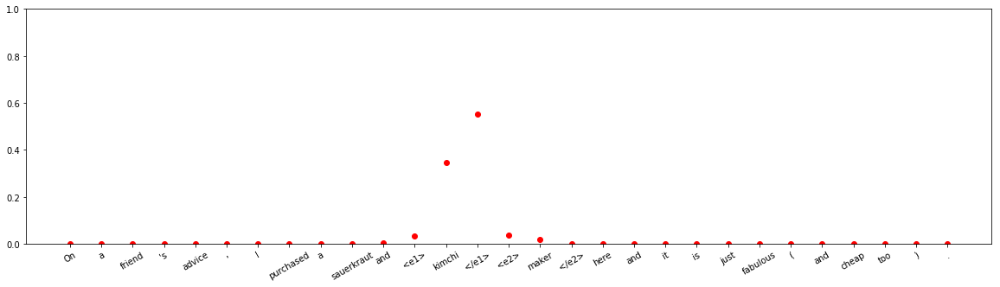


input sentence: The <e1> family </e1> constructed some TCU Horned Frog supporting snow <e2> features </e2> as well as just a really nice picture of an old fashioned light post .
answer label:    Product-Producer(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 9.581499e-10
Entity-Destination(e1,e2) 	:	 1.922119e-15
Cause-Effect(e2,e1) 	:	 4.4715696e-14
Member-Collection(e2,e1) 	:	 2.9076477e-10
Entity-Origin(e1,e2) 	:	 2.0443416e-11
Message-Topic(e1,e2) 	:	 9.480949e-14
Component-Whole(e1,e2) 	:	 8.513963e-11
Component-Whole(e2,e1) 	:	 0.99999726
Instrument-Agency(e2,e1) 	:	 1.6984383e-09
Content-Container(e1,e2) 	:	 4.524577e-12
Product-Producer(e2,e1) 	:	 2.7516778e-06
Cause-Effect(e1,e2) 	:	 1.1345993e-10
Product-Producer(e1,e2) 	:	 5.261418e-13
Content-Container(e2,e1) 	:	 9.6871185e-11
Entity-Origin(e2,e1) 	:	 1.3704295e-14
Message-Topic(e2,e1) 	:	 6.937824e-11
Instrument-Agency(e1,e2) 	:	 1.4950839e-12
Member-Collection(e1,e2) 	:	 4.8107973e-15
Entity-Destination(e2,e1) 	

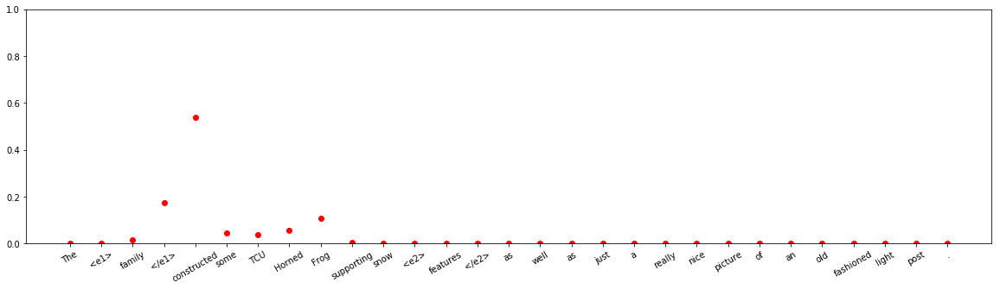


input sentence: Ambassador SUN Shuzhong answered the <e1> questions </e1> from the local <e2> press </e2> after his visit to the Memorial Center in Kigali on Dec. 28 , 2007 .
answer label:    Product-Producer(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 5.22158e-13
Entity-Destination(e1,e2) 	:	 5.723349e-07
Cause-Effect(e2,e1) 	:	 1.8207961e-06
Member-Collection(e2,e1) 	:	 1.3589659e-11
Entity-Origin(e1,e2) 	:	 0.9999784
Message-Topic(e1,e2) 	:	 4.2333923e-12
Component-Whole(e1,e2) 	:	 1.0478997e-09
Component-Whole(e2,e1) 	:	 1.1930934e-11
Instrument-Agency(e2,e1) 	:	 1.1158611e-07
Content-Container(e1,e2) 	:	 1.0148578e-12
Product-Producer(e2,e1) 	:	 4.6869214e-12
Cause-Effect(e1,e2) 	:	 1.7790402e-15
Product-Producer(e1,e2) 	:	 1.9058838e-05
Content-Container(e2,e1) 	:	 3.243204e-13
Entity-Origin(e2,e1) 	:	 1.08962013e-13
Message-Topic(e2,e1) 	:	 2.4797822e-10
Instrument-Agency(e1,e2) 	:	 5.291145e-10
Member-Collection(e1,e2) 	:	 2.7789387e-08
Entity-Destination(e2,e1) 	:	 

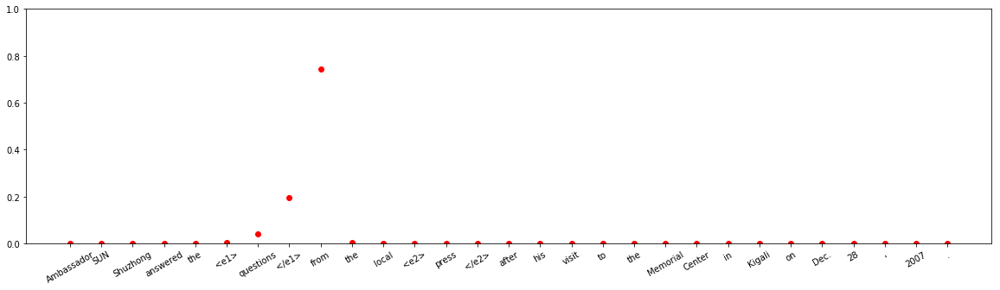



input sentence: The safety <e1> bar </e1> of the <e2> seats </e2> has to be folded down by the passenger and it has to be kept closed during the journey .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.828794
Entity-Destination(e1,e2) 	:	 2.2407317e-13
Cause-Effect(e2,e1) 	:	 6.3134706e-09
Member-Collection(e2,e1) 	:	 1.5828511e-10
Entity-Origin(e1,e2) 	:	 3.5558856e-09
Message-Topic(e1,e2) 	:	 5.867387e-12
Component-Whole(e1,e2) 	:	 0.17119287
Component-Whole(e2,e1) 	:	 7.8278966e-08
Instrument-Agency(e2,e1) 	:	 1.210277e-05
Content-Container(e1,e2) 	:	 2.1178498e-07
Product-Producer(e2,e1) 	:	 6.333367e-10
Cause-Effect(e1,e2) 	:	 1.3940512e-13
Product-Producer(e1,e2) 	:	 9.299535e-10
Content-Container(e2,e1) 	:	 1.6987322e-09
Entity-Origin(e2,e1) 	:	 4.029947e-12
Message-Topic(e2,e1) 	:	 2.6426886e-07
Instrument-Agency(e1,e2) 	:	 4.8090436e-07
Member-Collection(e1,e2) 	:	 1.4499e-08
Entity-Destination(e2,e1) 	:	 6.095545e-12



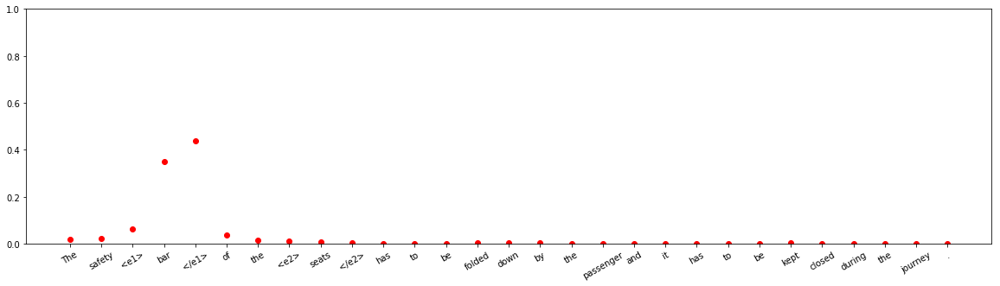



input sentence: Sci-Fi Channel is the <e1> cable network </e1> exclusively dedicated to offering classic <e2> science fiction TV shows </e2> and movies , as well as bold original programming .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 0.00011062945
Entity-Destination(e1,e2) 	:	 1.7323972e-08
Cause-Effect(e2,e1) 	:	 2.729414e-11
Member-Collection(e2,e1) 	:	 3.036572e-06
Entity-Origin(e1,e2) 	:	 0.0002420064
Message-Topic(e1,e2) 	:	 0.97792304
Component-Whole(e1,e2) 	:	 1.9158992e-05
Component-Whole(e2,e1) 	:	 0.018093714
Instrument-Agency(e2,e1) 	:	 5.155663e-08
Content-Container(e1,e2) 	:	 0.00014480384
Product-Producer(e2,e1) 	:	 0.0028974526
Cause-Effect(e1,e2) 	:	 2.2226695e-06
Product-Producer(e1,e2) 	:	 0.00010959635
Content-Container(e2,e1) 	:	 1.1594635e-05
Entity-Origin(e2,e1) 	:	 1.36069475e-05
Message-Topic(e2,e1) 	:	 0.00041901378
Instrument-Agency(e1,e2) 	:	 1.0298261e-05
Member-Collection(e1,e2) 	:	 5.479898e-09
Entity-Destination(e2,e1) 	:	 2

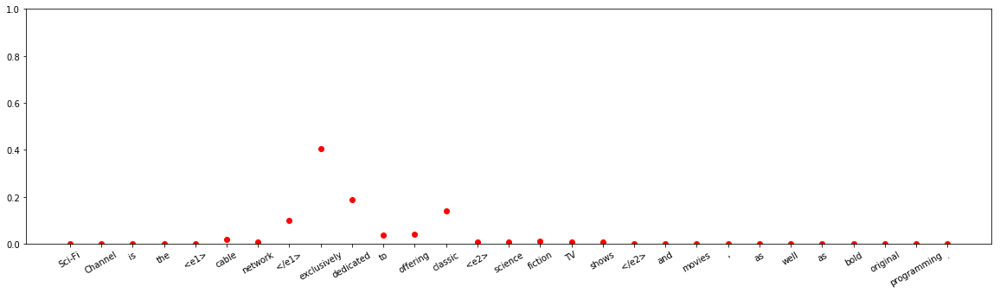


input sentence: In its early years the <e1> farm </e1> had forty <e2> acres </e2> , and was a productive subsistence farm with sheep being the primary source of income .
answer label:    Component-Whole(e2,e1)
wrong label:    Entity-Origin(e2,e1)
Other 	:	 0.017740006
Entity-Destination(e1,e2) 	:	 2.2439592e-09
Cause-Effect(e2,e1) 	:	 1.9755394e-11
Member-Collection(e2,e1) 	:	 0.010958988
Entity-Origin(e1,e2) 	:	 5.1488286e-07
Message-Topic(e1,e2) 	:	 1.513467e-07
Component-Whole(e1,e2) 	:	 1.5758413e-07
Component-Whole(e2,e1) 	:	 0.02056403
Instrument-Agency(e2,e1) 	:	 9.539692e-10
Content-Container(e1,e2) 	:	 2.7213857e-06
Product-Producer(e2,e1) 	:	 0.002053975
Cause-Effect(e1,e2) 	:	 3.7781685e-06
Product-Producer(e1,e2) 	:	 1.2067677e-05
Content-Container(e2,e1) 	:	 5.0023857e-05
Entity-Origin(e2,e1) 	:	 0.9485992
Message-Topic(e2,e1) 	:	 3.1952263e-06
Instrument-Agency(e1,e2) 	:	 1.0922657e-05
Member-Collection(e1,e2) 	:	 2.017495e-07
Entity-Destination(e2,e1) 	:	 2.8800823e-08


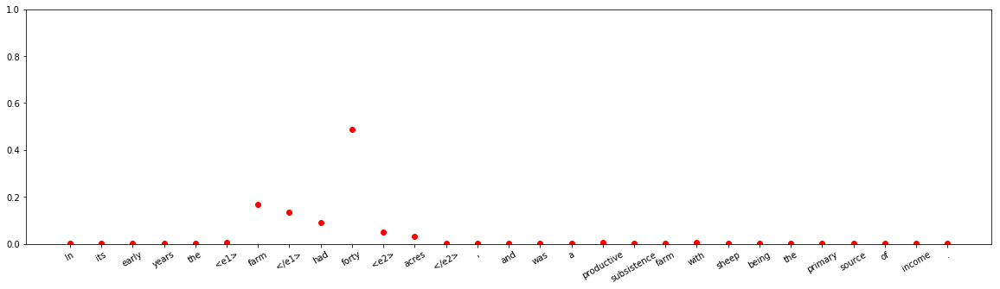


input sentence: Gary Wheelan , a womanizing , adulterous thirty-something Dallas attorney , finally gets what he deserves when his verbal assaults provoke a <e1> telephone </e1> <e2> operator </e2> .
answer label:    Instrument-Agency(e1,e2)
wrong label:    Other
Other 	:	 0.9987936
Entity-Destination(e1,e2) 	:	 7.2033816e-11
Cause-Effect(e2,e1) 	:	 4.2219945e-06
Member-Collection(e2,e1) 	:	 6.251851e-09
Entity-Origin(e1,e2) 	:	 1.6912924e-13
Message-Topic(e1,e2) 	:	 9.026673e-08
Component-Whole(e1,e2) 	:	 7.468552e-10
Component-Whole(e2,e1) 	:	 2.600284e-10
Instrument-Agency(e2,e1) 	:	 0.00024689513
Content-Container(e1,e2) 	:	 2.5699616e-09
Product-Producer(e2,e1) 	:	 9.7559204e-11
Cause-Effect(e1,e2) 	:	 3.100489e-07
Product-Producer(e1,e2) 	:	 7.001811e-08
Content-Container(e2,e1) 	:	 8.32096e-09
Entity-Origin(e2,e1) 	:	 1.0669875e-10
Message-Topic(e2,e1) 	:	 7.255595e-09
Instrument-Agency(e1,e2) 	:	 0.0009546341
Member-Collection(e1,e2) 	:	 2.3963874e-08
Entity-Destination(e2,e1)

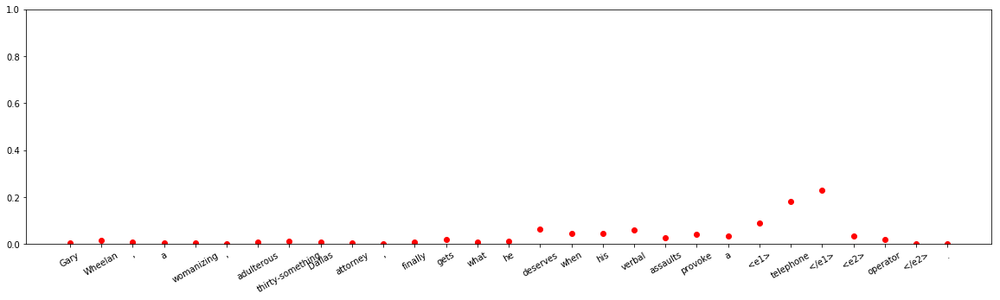










input sentence: We study the influence of an external electromagnetic field of 1.8 GHz in the formation or disaggregation of long <e1> rouleau </e1> of identical erythrocyte <e2> cells </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Other
Other 	:	 0.99517316
Entity-Destination(e1,e2) 	:	 1.2372369e-13
Cause-Effect(e2,e1) 	:	 3.896932e-08
Member-Collection(e2,e1) 	:	 3.136792e-07
Entity-Origin(e1,e2) 	:	 3.624193e-09
Message-Topic(e1,e2) 	:	 7.1283646e-10
Component-Whole(e1,e2) 	:	 0.000828516
Component-Whole(e2,e1) 	:	 0.0039972574
Instrument-Agency(e2,e1) 	:	 5.6035086e-11
Content-Container(e1,e2) 	:	 5.0224505e-09
Product-Producer(e2,e1) 	:	 7.196369e-10
Cause-Effect(e1,e2) 	:	 1.3143538e-10
Product-Producer(e1,e2) 	:	 7.57193e-09
Content-Container(e2,e1) 	:	 1.2572134e-07
Entity-Origin(e2,e1) 	:	 9.462066e-10
Message-Topic(e2,e1) 	:	 5.9638757e-07
Instrument-Agency(e1,e2) 	:	 1.3939747e-08
Member-Collection(e1,e2) 	:	 8.0268396e-11
Entity-Destination(e2,e1)

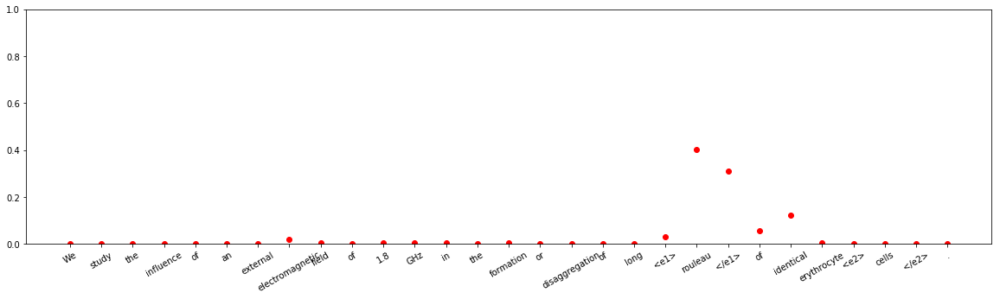



input sentence: The <e1> lychee </e1> stuffed in the meat stirs the palate with a resonating <e2> note </e2> of citrus while the elusive taste of the lotus leaves fades .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.4522075e-09
Entity-Destination(e1,e2) 	:	 2.8131982e-08
Cause-Effect(e2,e1) 	:	 0.00013362344
Member-Collection(e2,e1) 	:	 7.569149e-06
Entity-Origin(e1,e2) 	:	 0.00055444456
Message-Topic(e1,e2) 	:	 1.0434806e-08
Component-Whole(e1,e2) 	:	 1.8793617e-06
Component-Whole(e2,e1) 	:	 0.9120656
Instrument-Agency(e2,e1) 	:	 0.0050461167
Content-Container(e1,e2) 	:	 2.4918343e-05
Product-Producer(e2,e1) 	:	 0.00023282615
Cause-Effect(e1,e2) 	:	 0.0076608052
Product-Producer(e1,e2) 	:	 4.1663802e-07
Content-Container(e2,e1) 	:	 0.07398275
Entity-Origin(e2,e1) 	:	 0.00028885322
Message-Topic(e2,e1) 	:	 1.9586366e-11
Instrument-Agency(e1,e2) 	:	 1.0839327e-07
Member-Collection(e1,e2) 	:	 1.869659e-09
Entity-Destination(e2,e1) 	:	 7.924283e-09



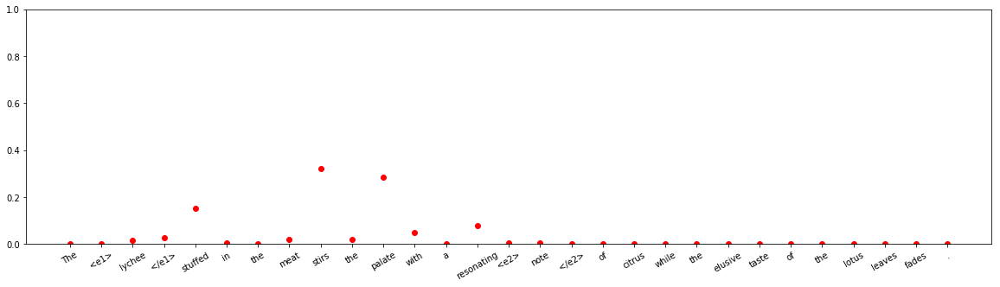
















input sentence: Without wasting time , a medical <e1> team </e1> of the <e2> army </e2> rushed to the house of the militant and provided emergent medical treatment to her .
answer label:    Component-Whole(e1,e2)
wrong label:    Member-Collection(e1,e2)
Other 	:	 1.2887415e-08
Entity-Destination(e1,e2) 	:	 2.674306e-09
Cause-Effect(e2,e1) 	:	 1.5067223e-09
Member-Collection(e2,e1) 	:	 0.020672508
Entity-Origin(e1,e2) 	:	 1.3238397e-07
Message-Topic(e1,e2) 	:	 1.1165483e-10
Component-Whole(e1,e2) 	:	 4.836974e-10
Component-Whole(e2,e1) 	:	 8.138964e-15
Instrument-Agency(e2,e1) 	:	 1.3575809e-08
Content-Container(e1,e2) 	:	 7.9729895e-12
Product-Producer(e2,e1) 	:	 9.5641035e-08
Cause-Effect(e1,e2) 	:	 7.578082e-10
Product-Producer(e1,e2) 	:	 1.3541718e-07
Content-Container(e2,e1) 	:	 1.2983767e-11
Entity-Origin(e2,e1) 	:	 6.9536543e-10
Message-Topic(e2,e1) 	:	 1.3814177e-07
Instrument-Agency(e1,e2) 	:	 1.2092708e-05
Member-Collection(e1,e2) 	:	 0.9793148
Entity-Destinatio

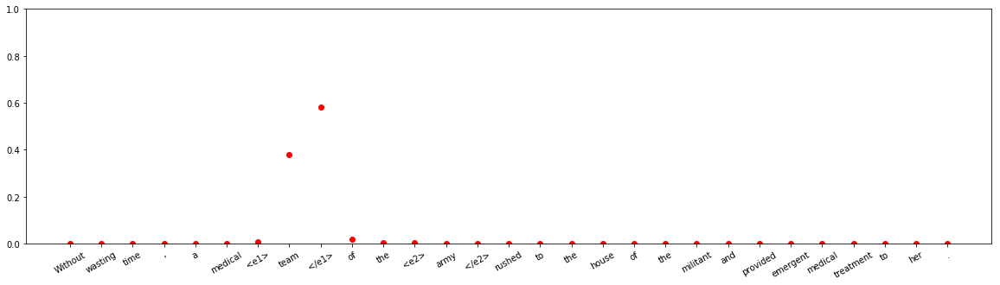





input sentence: Each year , waterfowl enthusiasts and conservationists gather to learn about DU 's priorities , socialize and enjoy the <e1> camaraderie </e1> of other DU <e2> supporters </e2> .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.03823006
Entity-Destination(e1,e2) 	:	 8.272166e-13
Cause-Effect(e2,e1) 	:	 2.0112621e-07
Member-Collection(e2,e1) 	:	 0.9452106
Entity-Origin(e1,e2) 	:	 3.255659e-11
Message-Topic(e1,e2) 	:	 6.5966996e-11
Component-Whole(e1,e2) 	:	 5.2090363e-09
Component-Whole(e2,e1) 	:	 8.6967884e-11
Instrument-Agency(e2,e1) 	:	 1.1238955e-09
Content-Container(e1,e2) 	:	 4.729965e-12
Product-Producer(e2,e1) 	:	 1.928858e-08
Cause-Effect(e1,e2) 	:	 7.0161197e-09
Product-Producer(e1,e2) 	:	 1.732054e-06
Content-Container(e2,e1) 	:	 1.2471071e-11
Entity-Origin(e2,e1) 	:	 2.5280285e-08
Message-Topic(e2,e1) 	:	 0.016537562
Instrument-Agency(e1,e2) 	:	 3.789561e-07
Member-Collection(e1,e2) 	:	 1.9572004e-05
Entity-Destination(e2,e1) 	:

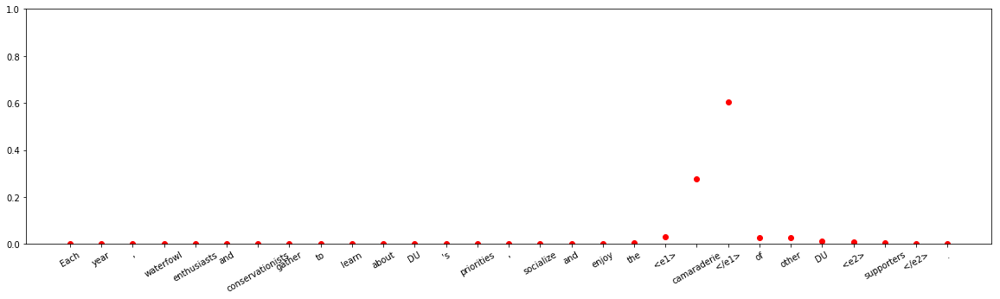


input sentence: The <e1> model </e1> developed from that <e2> event </e2> include academic visits and symposia , alumni and . VIP events , together with government and press relations .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 5.252293e-12
Entity-Destination(e1,e2) 	:	 3.4906175e-11
Cause-Effect(e2,e1) 	:	 1.4332205e-07
Member-Collection(e2,e1) 	:	 1.1820257e-10
Entity-Origin(e1,e2) 	:	 0.9998154
Message-Topic(e1,e2) 	:	 5.018461e-15
Component-Whole(e1,e2) 	:	 1.4139753e-12
Component-Whole(e2,e1) 	:	 2.1824154e-11
Instrument-Agency(e2,e1) 	:	 4.24107e-14
Content-Container(e1,e2) 	:	 2.6201574e-11
Product-Producer(e2,e1) 	:	 9.2343655e-10
Cause-Effect(e1,e2) 	:	 3.900772e-14
Product-Producer(e1,e2) 	:	 0.00018455036
Content-Container(e2,e1) 	:	 2.3862868e-14
Entity-Origin(e2,e1) 	:	 3.008957e-11
Message-Topic(e2,e1) 	:	 9.719245e-10
Instrument-Agency(e1,e2) 	:	 6.2274546e-09
Member-Collection(e1,e2) 	:	 3.6515328e-08
Entity-Destination(e2,e1) 	:	 3.4542447e

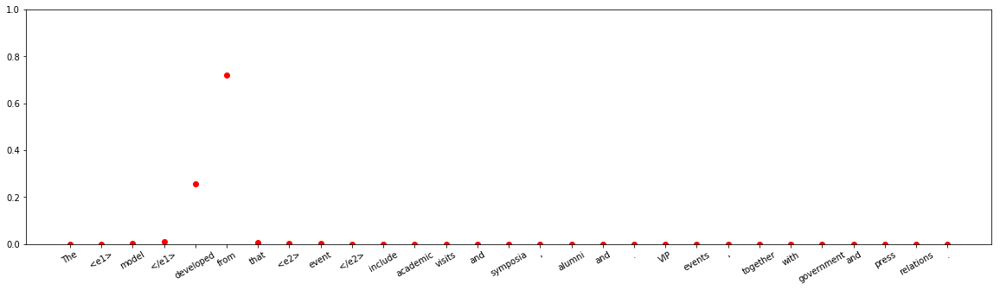


input sentence: I first became acquainted with the book through an audio <e1> book </e1> I was given by a dear <e2> friend </e2> of mine a few years ago .
answer label:    Entity-Origin(e1,e2)
wrong label:    Product-Producer(e1,e2)
Other 	:	 8.754853e-15
Entity-Destination(e1,e2) 	:	 6.787946e-12
Cause-Effect(e2,e1) 	:	 1.7992495e-10
Member-Collection(e2,e1) 	:	 3.2366252e-11
Entity-Origin(e1,e2) 	:	 8.312283e-07
Message-Topic(e1,e2) 	:	 4.8006253e-14
Component-Whole(e1,e2) 	:	 6.303167e-15
Component-Whole(e2,e1) 	:	 4.0666003e-13
Instrument-Agency(e2,e1) 	:	 7.855014e-16
Content-Container(e1,e2) 	:	 1.1775012e-14
Product-Producer(e2,e1) 	:	 6.2314373e-13
Cause-Effect(e1,e2) 	:	 6.2261865e-17
Product-Producer(e1,e2) 	:	 0.99999917
Content-Container(e2,e1) 	:	 5.182095e-15
Entity-Origin(e2,e1) 	:	 1.2790421e-16
Message-Topic(e2,e1) 	:	 3.686441e-12
Instrument-Agency(e1,e2) 	:	 1.2900925e-08
Member-Collection(e1,e2) 	:	 2.0090722e-11
Entity-Destination(e2,e1) 	:	 7.4801076e-17



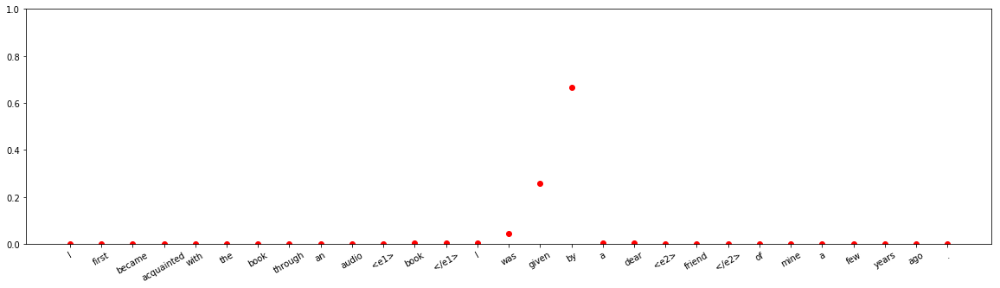



input sentence: The <e1> hostel </e1> comprises of a main <e2> building </e2> of 3 floors , it started its life as a nun 's convent that 's been renovated .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.2350034e-12
Entity-Destination(e1,e2) 	:	 8.7704375e-15
Cause-Effect(e2,e1) 	:	 1.4673866e-13
Member-Collection(e2,e1) 	:	 4.4155035e-09
Entity-Origin(e1,e2) 	:	 2.593901e-08
Message-Topic(e1,e2) 	:	 2.278237e-16
Component-Whole(e1,e2) 	:	 1.1131248e-09
Component-Whole(e2,e1) 	:	 1.0
Instrument-Agency(e2,e1) 	:	 9.581918e-12
Content-Container(e1,e2) 	:	 1.5177323e-11
Product-Producer(e2,e1) 	:	 4.278086e-09
Cause-Effect(e1,e2) 	:	 1.03816105e-11
Product-Producer(e1,e2) 	:	 4.4887341e-13
Content-Container(e2,e1) 	:	 2.5860423e-11
Entity-Origin(e2,e1) 	:	 1.4366045e-14
Message-Topic(e2,e1) 	:	 1.3517774e-11
Instrument-Agency(e1,e2) 	:	 6.747223e-13
Member-Collection(e1,e2) 	:	 1.7744375e-13
Entity-Destination(e2,e1) 	:	 1.2645863e-15



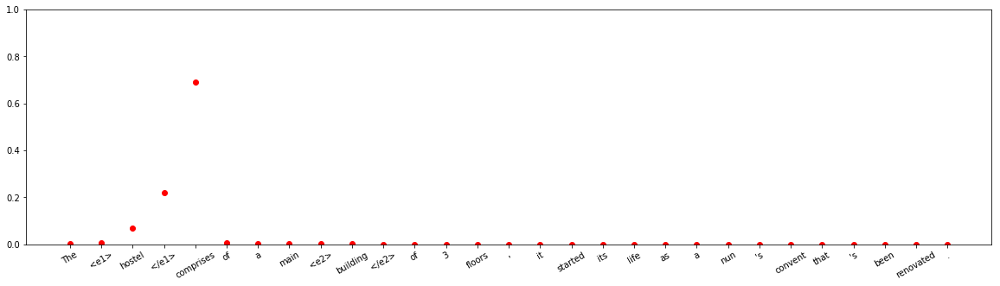





input sentence: The subjects were asked to climb up a total of 10 <e1> steps </e1> on the <e2> ladder </e2> and then down to the floor for each trial .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.99270093
Entity-Destination(e1,e2) 	:	 2.3044172e-11
Cause-Effect(e2,e1) 	:	 6.5752825e-09
Member-Collection(e2,e1) 	:	 3.798843e-14
Entity-Origin(e1,e2) 	:	 5.8596845e-14
Message-Topic(e1,e2) 	:	 5.2689998e-08
Component-Whole(e1,e2) 	:	 0.0072795153
Component-Whole(e2,e1) 	:	 2.8109207e-08
Instrument-Agency(e2,e1) 	:	 1.8603798e-05
Content-Container(e1,e2) 	:	 1.7823101e-10
Product-Producer(e2,e1) 	:	 6.292513e-13
Cause-Effect(e1,e2) 	:	 1.3209739e-13
Product-Producer(e1,e2) 	:	 1.3006647e-10
Content-Container(e2,e1) 	:	 1.8570547e-12
Entity-Origin(e2,e1) 	:	 1.0643181e-15
Message-Topic(e2,e1) 	:	 3.6215756e-08
Instrument-Agency(e1,e2) 	:	 9.515097e-07
Member-Collection(e1,e2) 	:	 2.8786118e-12
Entity-Destination(e2,e1) 	:	 4.5279145e-12



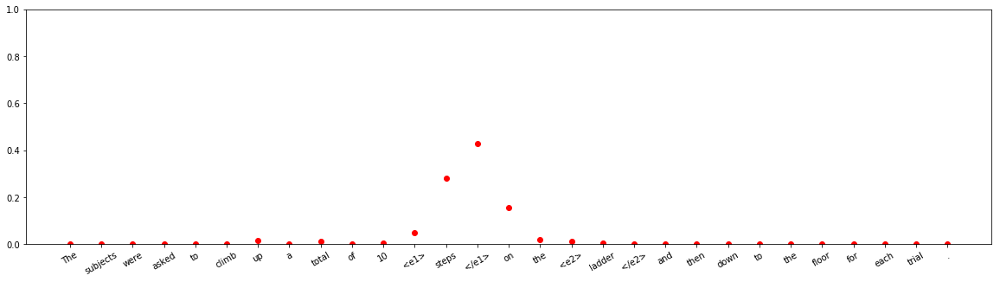





input sentence: The Cornish Pirates have signed a <e1> declaration </e1> to tackle <e2> climate change </e2> as part of their commitment to save energy and reduce their environmental footprint .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.6871713
Entity-Destination(e1,e2) 	:	 0.00029842753
Cause-Effect(e2,e1) 	:	 1.262589e-10
Member-Collection(e2,e1) 	:	 2.8269048e-08
Entity-Origin(e1,e2) 	:	 8.522826e-11
Message-Topic(e1,e2) 	:	 0.31252712
Component-Whole(e1,e2) 	:	 1.5242534e-08
Component-Whole(e2,e1) 	:	 8.780326e-12
Instrument-Agency(e2,e1) 	:	 1.8280662e-10
Content-Container(e1,e2) 	:	 2.7383926e-09
Product-Producer(e2,e1) 	:	 5.3771276e-10
Cause-Effect(e1,e2) 	:	 1.2208512e-08
Product-Producer(e1,e2) 	:	 7.929653e-09
Content-Container(e2,e1) 	:	 3.2516473e-10
Entity-Origin(e2,e1) 	:	 9.332117e-10
Message-Topic(e2,e1) 	:	 2.6502184e-07
Instrument-Agency(e1,e2) 	:	 7.1516394e-07
Member-Collection(e1,e2) 	:	 2.132686e-06
Entity-Destination(e2,e1) 	:	 

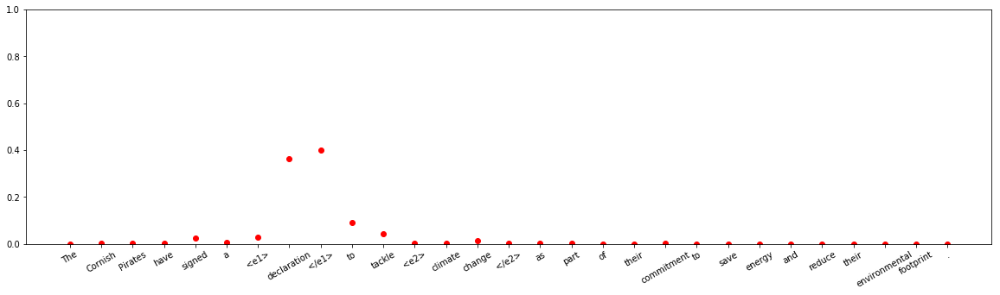


input sentence: KHZZ experienced <e1> competition </e1> from former oldies <e2> station </e2> KHYL , but both stations ended up giving up the format , with KHZZ turning to oldies .
answer label:    Cause-Effect(e2,e1)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 9.003095e-11
Entity-Destination(e1,e2) 	:	 4.699532e-09
Cause-Effect(e2,e1) 	:	 0.058117084
Member-Collection(e2,e1) 	:	 4.0833985e-09
Entity-Origin(e1,e2) 	:	 0.9416621
Message-Topic(e1,e2) 	:	 1.2264038e-14
Component-Whole(e1,e2) 	:	 3.1648924e-13
Component-Whole(e2,e1) 	:	 3.87339e-13
Instrument-Agency(e2,e1) 	:	 1.4096203e-11
Content-Container(e1,e2) 	:	 3.3998924e-13
Product-Producer(e2,e1) 	:	 6.858815e-11
Cause-Effect(e1,e2) 	:	 1.0149295e-12
Product-Producer(e1,e2) 	:	 0.0002171689
Content-Container(e2,e1) 	:	 2.3441367e-14
Entity-Origin(e2,e1) 	:	 9.113929e-11
Message-Topic(e2,e1) 	:	 2.5739223e-06
Instrument-Agency(e1,e2) 	:	 1.3740503e-09
Member-Collection(e1,e2) 	:	 1.0957849e-06
Entity-Destination(e2,e1) 	:	 1.2

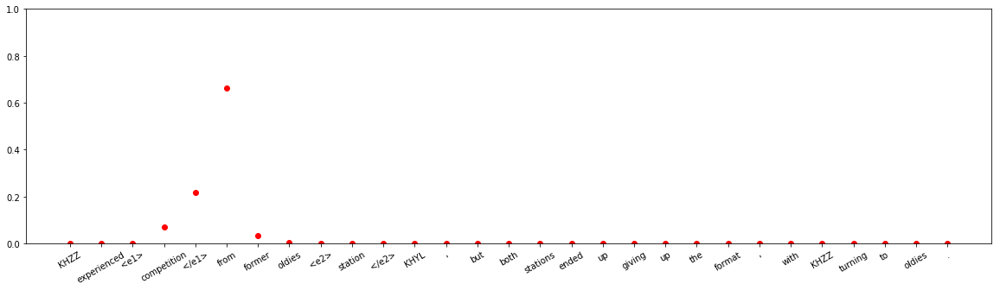






input sentence: The idea is the heatsink removes the heat from the CPU and the <e1> fan </e1> blasts the heatsink with the surrounding <e2> air </e2> cooling it down .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 4.4144155e-08
Entity-Destination(e1,e2) 	:	 3.5424477e-10
Cause-Effect(e2,e1) 	:	 8.189979e-05
Member-Collection(e2,e1) 	:	 3.444243e-09
Entity-Origin(e1,e2) 	:	 4.4454247e-08
Message-Topic(e1,e2) 	:	 9.450388e-09
Component-Whole(e1,e2) 	:	 0.07177123
Component-Whole(e2,e1) 	:	 0.86978585
Instrument-Agency(e2,e1) 	:	 0.0492452
Content-Container(e1,e2) 	:	 5.8832663e-09
Product-Producer(e2,e1) 	:	 4.2580577e-08
Cause-Effect(e1,e2) 	:	 6.5913286e-05
Product-Producer(e1,e2) 	:	 2.4356628e-09
Content-Container(e2,e1) 	:	 1.2437612e-05
Entity-Origin(e2,e1) 	:	 7.6974377e-10
Message-Topic(e2,e1) 	:	 3.4138397e-11
Instrument-Agency(e1,e2) 	:	 0.009037296
Member-Collection(e1,e2) 	:	 2.8266836e-10
Entity-Destination(e2,e1) 	:	 2.65792

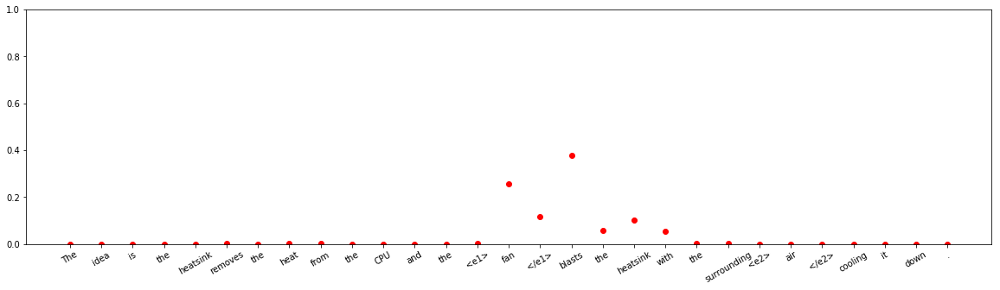







input sentence: He had a wonderful <e1> story </e1> to tell of the <e2> conquest </e2> of a continent by a people through thrift , endurance , sacrifice and grit .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.6561763
Entity-Destination(e1,e2) 	:	 4.1004887e-11
Cause-Effect(e2,e1) 	:	 1.545293e-10
Member-Collection(e2,e1) 	:	 1.4664402e-10
Entity-Origin(e1,e2) 	:	 5.2339196e-12
Message-Topic(e1,e2) 	:	 0.3437959
Component-Whole(e1,e2) 	:	 2.2500073e-05
Component-Whole(e2,e1) 	:	 5.0631844e-08
Instrument-Agency(e2,e1) 	:	 8.3214297e-10
Content-Container(e1,e2) 	:	 3.1553213e-10
Product-Producer(e2,e1) 	:	 2.1104345e-13
Cause-Effect(e1,e2) 	:	 6.9411143e-10
Product-Producer(e1,e2) 	:	 8.3451965e-09
Content-Container(e2,e1) 	:	 1.5524965e-09
Entity-Origin(e2,e1) 	:	 2.8638092e-11
Message-Topic(e2,e1) 	:	 1.5103794e-08
Instrument-Agency(e1,e2) 	:	 5.12493e-06
Member-Collection(e1,e2) 	:	 1.1542126e-09
Entity-Destination(e2,e1) 	:	 1.2098795e-12



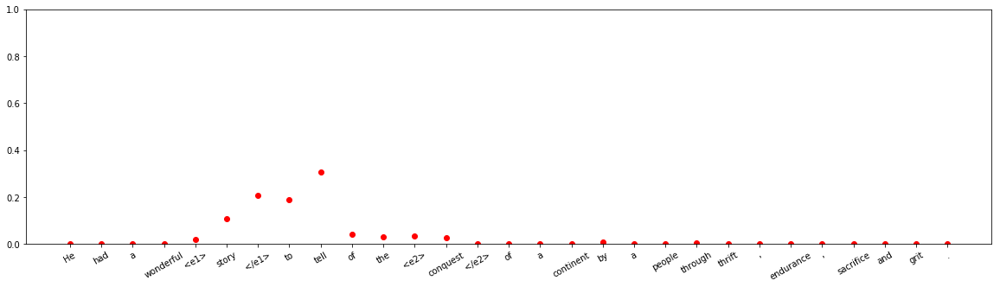







input sentence: The annual residence <e1> league </e1> of various sport <e2> codes </e2> , the Mini Olympics held during the September break has proven very popular amongst our students .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.7305596
Entity-Destination(e1,e2) 	:	 1.0142802e-10
Cause-Effect(e2,e1) 	:	 2.590101e-09
Member-Collection(e2,e1) 	:	 0.06734766
Entity-Origin(e1,e2) 	:	 2.9988618e-07
Message-Topic(e1,e2) 	:	 2.102942e-05
Component-Whole(e1,e2) 	:	 8.241462e-06
Component-Whole(e2,e1) 	:	 0.16881235
Instrument-Agency(e2,e1) 	:	 0.0002657895
Content-Container(e1,e2) 	:	 1.5716928e-06
Product-Producer(e2,e1) 	:	 0.00022672949
Cause-Effect(e1,e2) 	:	 4.1321075e-09
Product-Producer(e1,e2) 	:	 2.3784079e-08
Content-Container(e2,e1) 	:	 5.150754e-06
Entity-Origin(e2,e1) 	:	 2.2251594e-08
Message-Topic(e2,e1) 	:	 0.032743096
Instrument-Agency(e1,e2) 	:	 8.340637e-06
Member-Collection(e1,e2) 	:	 1.3142227e-07
Entity-Destination(e2,e1) 	:	 6.9250

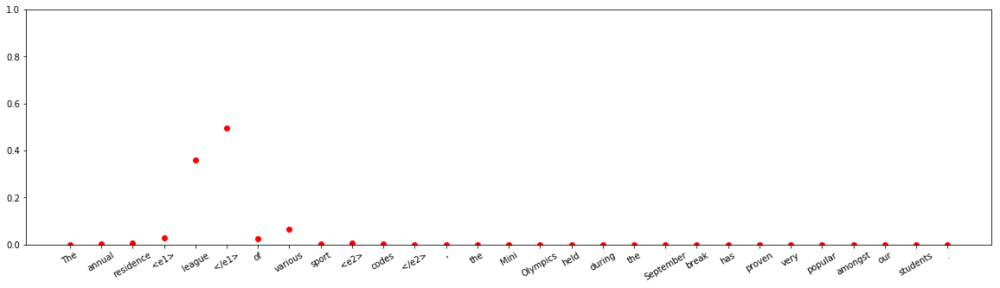


input sentence: A certificated security for which the certificate has been surrendered to the issuer is reached by a <e1> creditor </e1> by legal <e2> process </e2> upon the issuer .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.99998426
Entity-Destination(e1,e2) 	:	 2.4285434e-09
Cause-Effect(e2,e1) 	:	 7.432948e-06
Member-Collection(e2,e1) 	:	 1.3270959e-07
Entity-Origin(e1,e2) 	:	 5.5096347e-08
Message-Topic(e1,e2) 	:	 1.8915534e-09
Component-Whole(e1,e2) 	:	 8.946372e-10
Component-Whole(e2,e1) 	:	 1.0724273e-08
Instrument-Agency(e2,e1) 	:	 3.3604135e-08
Content-Container(e1,e2) 	:	 4.2186785e-10
Product-Producer(e2,e1) 	:	 8.211203e-10
Cause-Effect(e1,e2) 	:	 1.3379452e-12
Product-Producer(e1,e2) 	:	 4.816027e-06
Content-Container(e2,e1) 	:	 1.7866027e-08
Entity-Origin(e2,e1) 	:	 1.4325883e-12
Message-Topic(e2,e1) 	:	 1.5338653e-08
Instrument-Agency(e1,e2) 	:	 3.4852915e-06
Member-Collection(e1,e2) 	:	 4.5274232e-10
Entity-Destination(e2,e1) 	:	 1.145

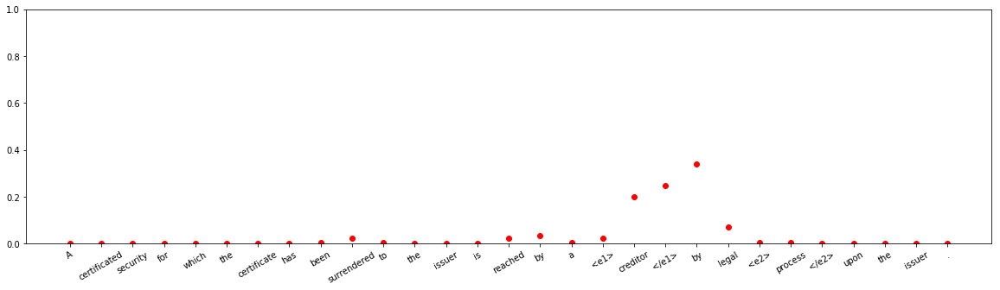



input sentence: A <e1> chain </e1> <e2> saw </e2> is one of those tools that can be described thusly : When you need one , nothing else will really do .
answer label:    Component-Whole(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.002486418
Entity-Destination(e1,e2) 	:	 9.0191736e-11
Cause-Effect(e2,e1) 	:	 2.4996714e-07
Member-Collection(e2,e1) 	:	 8.29448e-06
Entity-Origin(e1,e2) 	:	 5.6729665e-08
Message-Topic(e1,e2) 	:	 1.8562476e-06
Component-Whole(e1,e2) 	:	 1.345077e-05
Component-Whole(e2,e1) 	:	 0.98584217
Instrument-Agency(e2,e1) 	:	 1.2318977e-05
Content-Container(e1,e2) 	:	 0.006068132
Product-Producer(e2,e1) 	:	 5.2609687e-07
Cause-Effect(e1,e2) 	:	 1.8658264e-06
Product-Producer(e1,e2) 	:	 2.5361423e-06
Content-Container(e2,e1) 	:	 0.001293318
Entity-Origin(e2,e1) 	:	 1.8639297e-07
Message-Topic(e2,e1) 	:	 4.366213e-08
Instrument-Agency(e1,e2) 	:	 0.0042675994
Member-Collection(e1,e2) 	:	 3.988301e-09
Entity-Destination(e2,e1) 	:	 9.1406713e-07



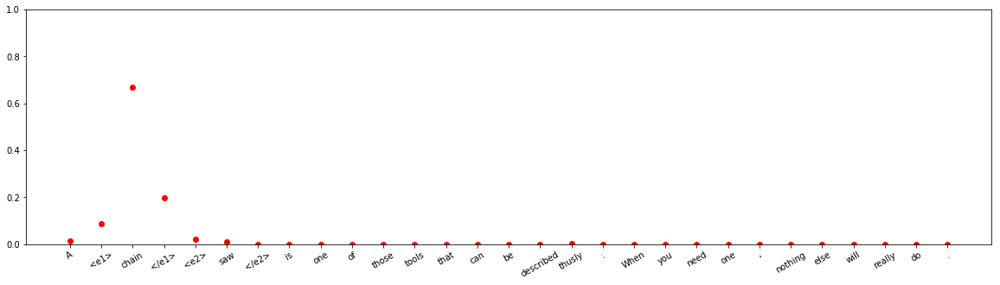





input sentence: It 's a powerful personal <e1> work </e1> by a <e2> man </e2> who still thinks for himself in an era of fear , conformity , and dehumanization .
answer label:    Product-Producer(e1,e2)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 1.2245748e-17
Cause-Effect(e2,e1) 	:	 2.2998138e-12
Member-Collection(e2,e1) 	:	 1.23484806e-17
Entity-Origin(e1,e2) 	:	 1.6171767e-16
Message-Topic(e1,e2) 	:	 4.0838145e-16
Component-Whole(e1,e2) 	:	 1.2922117e-15
Component-Whole(e2,e1) 	:	 1.0682898e-15
Instrument-Agency(e2,e1) 	:	 3.6735534e-14
Content-Container(e1,e2) 	:	 2.462536e-15
Product-Producer(e2,e1) 	:	 4.1536513e-16
Cause-Effect(e1,e2) 	:	 2.5112187e-16
Product-Producer(e1,e2) 	:	 6.164768e-13
Content-Container(e2,e1) 	:	 1.220294e-17
Entity-Origin(e2,e1) 	:	 1.04859775e-17
Message-Topic(e2,e1) 	:	 1.5817743e-12
Instrument-Agency(e1,e2) 	:	 2.6731432e-12
Member-Collection(e1,e2) 	:	 9.742069e-14
Entity-Destination(e2,e1) 	:	 2.4428945e-17



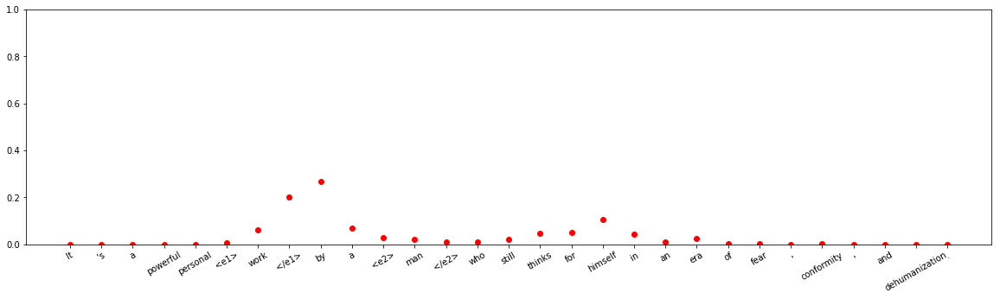








input sentence: In the years following , Detroit 's <e1> population </e1> fell from a <e2> peak </e2> of roughly 1.8 million in 1950 to about half that number today .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.95968e-11
Entity-Destination(e1,e2) 	:	 1.5281735e-13
Cause-Effect(e2,e1) 	:	 1.1610641e-09
Member-Collection(e2,e1) 	:	 3.4606569e-12
Entity-Origin(e1,e2) 	:	 1.0
Message-Topic(e1,e2) 	:	 4.331598e-19
Component-Whole(e1,e2) 	:	 6.5188045e-15
Component-Whole(e2,e1) 	:	 5.7720864e-13
Instrument-Agency(e2,e1) 	:	 2.1000417e-14
Content-Container(e1,e2) 	:	 1.9318729e-10
Product-Producer(e2,e1) 	:	 1.1154084e-11
Cause-Effect(e1,e2) 	:	 3.917879e-16
Product-Producer(e1,e2) 	:	 3.1712197e-10
Content-Container(e2,e1) 	:	 4.960172e-15
Entity-Origin(e2,e1) 	:	 2.8175596e-12
Message-Topic(e2,e1) 	:	 2.4421822e-13
Instrument-Agency(e1,e2) 	:	 1.7411394e-13
Member-Collection(e1,e2) 	:	 2.5229492e-11
Entity-Destination(e2,e1) 	:	 7.611194e-17



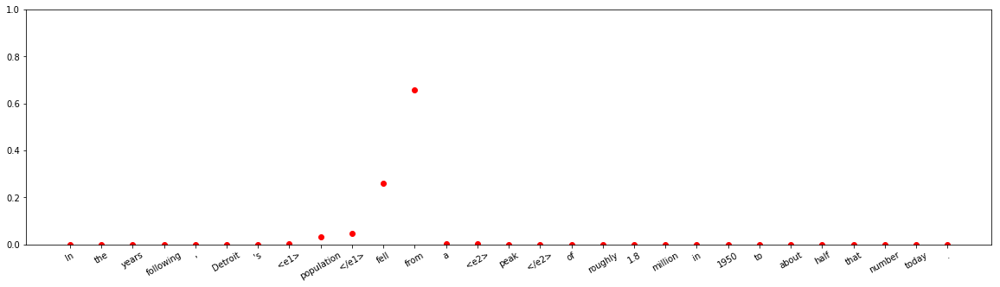










input sentence: Of course , the most common things in <e1> seawater </e1> , besides the hydrogen and oxygen that make up the water itself , are sodium and chloride <e2> ions </e2> , which are the components of common table salt and make ocean water taste salty to us .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 9.606377e-06
Entity-Destination(e1,e2) 	:	 4.4710258e-09
Cause-Effect(e2,e1) 	:	 4.2316152e-08
Member-Collection(e2,e1) 	:	 6.017034e-08
Entity-Origin(e1,e2) 	:	 4.8801468e-08
Message-Topic(e1,e2) 	:	 4.466916e-06
Component-Whole(e1,e2) 	:	 5.879525e-07
Component-Whole(e2,e1) 	:	 6.9282163e-07
Instrument-Agency(e2,e1) 	:	 2.0907619e-08
Content-Container(e1,e2) 	:	 3.5814237e-06
Product-Producer(e2,e1) 	:	 3.1881027e-07
Cause-Effect(e1,e2) 	:	 0.7752727
Product-Producer(e1,e2) 	:	 1.0895477e-08
Content-Container(e2,e1) 	:	 0.00022000785
Entity-Origin(e2,e1) 	:	 0.22448315
Message-Topic(e2,e1) 	:	 8.4072055e-10
Instrument-Agency(e1,e2) 	:	 4.67125

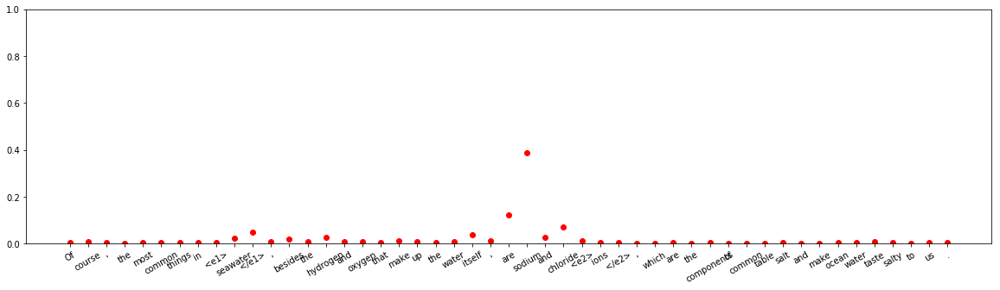



input sentence: Taking time for introductions and a brief tour of the building helps the pre-service <e1> teacher </e1> feel part of the <e2> school </e2> and aids the important transition from college student . Include the pre-service teacher on staff mailing list and in staff workshops and social functions .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.0023730916
Entity-Destination(e1,e2) 	:	 1.5297138e-09
Cause-Effect(e2,e1) 	:	 3.6087238e-07
Member-Collection(e2,e1) 	:	 1.0494877e-07
Entity-Origin(e1,e2) 	:	 4.1453433e-08
Message-Topic(e1,e2) 	:	 6.081994e-11
Component-Whole(e1,e2) 	:	 0.0018769905
Component-Whole(e2,e1) 	:	 7.1782986e-14
Instrument-Agency(e2,e1) 	:	 1.0571215e-06
Content-Container(e1,e2) 	:	 7.990193e-11
Product-Producer(e2,e1) 	:	 5.266771e-07
Cause-Effect(e1,e2) 	:	 1.8586486e-09
Product-Producer(e1,e2) 	:	 1.9077837e-09
Content-Container(e2,e1) 	:	 1.3292628e-11
Entity-Origin(e2,e1) 	:	 2.5960555e-11
Message-Topic(e2,e1) 	:	 1.4

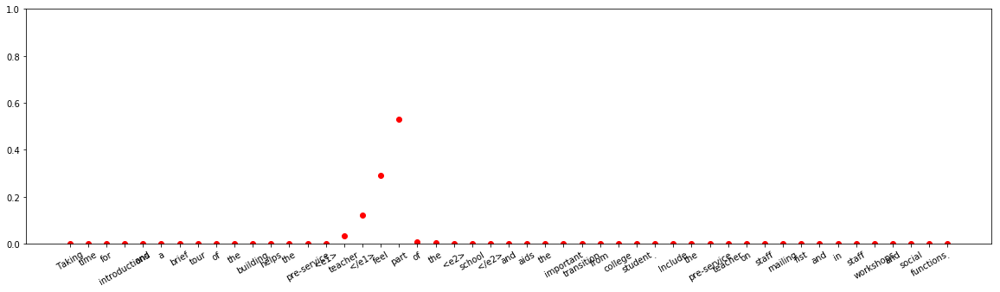





input sentence: <e1> Carpenters </e1> build many things from <e2> wood </e2> and other materials , like buildings and boats .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 8.113665e-09
Entity-Destination(e1,e2) 	:	 7.5936973e-10
Cause-Effect(e2,e1) 	:	 9.999587e-05
Member-Collection(e2,e1) 	:	 1.0232659e-08
Entity-Origin(e1,e2) 	:	 0.9930575
Message-Topic(e1,e2) 	:	 1.0063084e-09
Component-Whole(e1,e2) 	:	 4.0697423e-09
Component-Whole(e2,e1) 	:	 4.0432566e-10
Instrument-Agency(e2,e1) 	:	 9.0037705e-05
Content-Container(e1,e2) 	:	 1.6698654e-09
Product-Producer(e2,e1) 	:	 0.00020669063
Cause-Effect(e1,e2) 	:	 1.7312991e-09
Product-Producer(e1,e2) 	:	 0.0064880494
Content-Container(e2,e1) 	:	 1.6296948e-11
Entity-Origin(e2,e1) 	:	 4.8163105e-09
Message-Topic(e2,e1) 	:	 1.1357127e-05
Instrument-Agency(e1,e2) 	:	 4.7235378e-07
Member-Collection(e1,e2) 	:	 4.5839373e-05
Entity-Destination(e2,e1) 	:	 7.3228965e-11



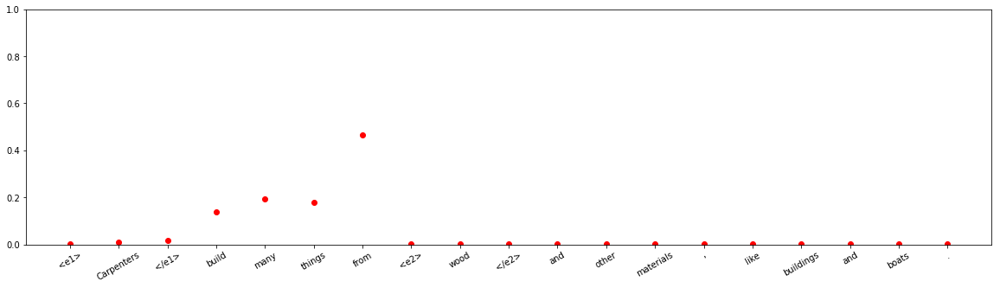





input sentence: They connected the <e1> plug </e1> of the <e2> battery box </e2> to the plug of the charger .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 3.6358e-14
Entity-Destination(e1,e2) 	:	 3.72831e-17
Cause-Effect(e2,e1) 	:	 3.3600906e-14
Member-Collection(e2,e1) 	:	 2.4836764e-16
Entity-Origin(e1,e2) 	:	 6.8830766e-15
Message-Topic(e1,e2) 	:	 9.935842e-18
Component-Whole(e1,e2) 	:	 1.0
Component-Whole(e2,e1) 	:	 1.3217165e-10
Instrument-Agency(e2,e1) 	:	 1.0871899e-13
Content-Container(e1,e2) 	:	 4.0902443e-13
Product-Producer(e2,e1) 	:	 1.5159666e-16
Cause-Effect(e1,e2) 	:	 1.05645514e-17
Product-Producer(e1,e2) 	:	 6.8941917e-15
Content-Container(e2,e1) 	:	 1.3816981e-14
Entity-Origin(e2,e1) 	:	 5.2650977e-20
Message-Topic(e2,e1) 	:	 6.3681335e-16
Instrument-Agency(e1,e2) 	:	 2.3472465e-11
Member-Collection(e1,e2) 	:	 7.537663e-16
Entity-Destination(e2,e1) 	:	 5.13365e-18



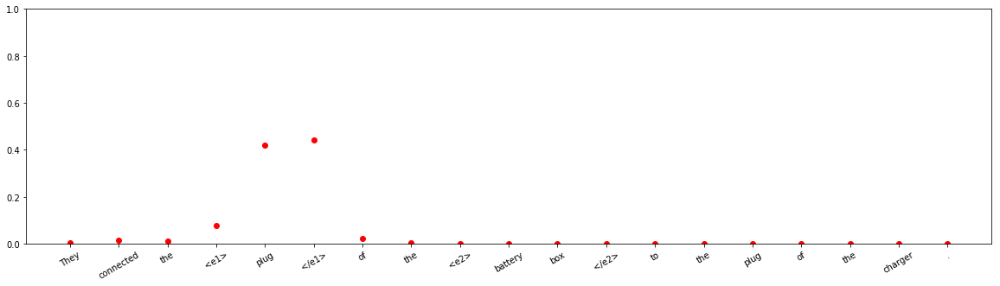









input sentence: The <e1> position </e1> of the Catholic Church on the matter is defined in <e2> canon law </e2> .
answer label:    Message-Topic(e2,e1)
wrong label:    Other
Other 	:	 0.9997644
Entity-Destination(e1,e2) 	:	 1.3430258e-14
Cause-Effect(e2,e1) 	:	 7.343825e-10
Member-Collection(e2,e1) 	:	 4.6626375e-13
Entity-Origin(e1,e2) 	:	 4.7706874e-13
Message-Topic(e1,e2) 	:	 1.2373999e-10
Component-Whole(e1,e2) 	:	 1.8857394e-06
Component-Whole(e2,e1) 	:	 8.624273e-10
Instrument-Agency(e2,e1) 	:	 2.2212551e-10
Content-Container(e1,e2) 	:	 1.8424416e-09
Product-Producer(e2,e1) 	:	 3.517111e-11
Cause-Effect(e1,e2) 	:	 6.61513e-11
Product-Producer(e1,e2) 	:	 1.2777473e-12
Content-Container(e2,e1) 	:	 3.89478e-11
Entity-Origin(e2,e1) 	:	 3.877989e-12
Message-Topic(e2,e1) 	:	 0.00023365523
Instrument-Agency(e1,e2) 	:	 1.3237056e-10
Member-Collection(e1,e2) 	:	 4.0771893e-11
Entity-Destination(e2,e1) 	:	 1.4730334e-12



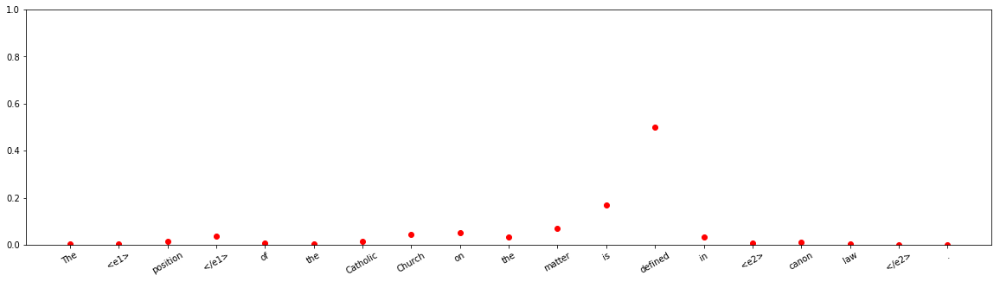



input sentence: In the case of public corporations every <e1> citizen </e1> is a member of the <e2> corporation </e2> .
answer label:    Member-Collection(e1,e2)
wrong label:    Other
Other 	:	 0.78740793
Entity-Destination(e1,e2) 	:	 2.4629535e-10
Cause-Effect(e2,e1) 	:	 8.793593e-12
Member-Collection(e2,e1) 	:	 3.042296e-08
Entity-Origin(e1,e2) 	:	 5.402196e-10
Message-Topic(e1,e2) 	:	 4.867417e-13
Component-Whole(e1,e2) 	:	 6.2108434e-08
Component-Whole(e2,e1) 	:	 6.7846255e-14
Instrument-Agency(e2,e1) 	:	 1.8256648e-09
Content-Container(e1,e2) 	:	 3.753386e-10
Product-Producer(e2,e1) 	:	 4.1145913e-09
Cause-Effect(e1,e2) 	:	 4.470156e-13
Product-Producer(e1,e2) 	:	 3.1639804e-09
Content-Container(e2,e1) 	:	 1.6826818e-11
Entity-Origin(e2,e1) 	:	 2.5185763e-11
Message-Topic(e2,e1) 	:	 2.6717533e-09
Instrument-Agency(e1,e2) 	:	 2.8155793e-09
Member-Collection(e1,e2) 	:	 0.21259195
Entity-Destination(e2,e1) 	:	 7.36805e-12



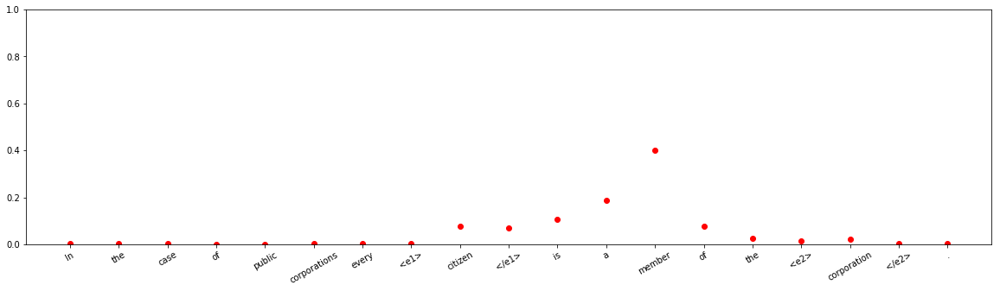


input sentence: Since then , other civil <e1> liberties </e1> have been set out in other constitutional <e2> laws </e2> .
answer label:    Message-Topic(e2,e1)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 1.0325844e-18
Cause-Effect(e2,e1) 	:	 1.8514871e-16
Member-Collection(e2,e1) 	:	 1.4957972e-17
Entity-Origin(e1,e2) 	:	 1.681693e-17
Message-Topic(e1,e2) 	:	 1.0996933e-12
Component-Whole(e1,e2) 	:	 1.5485128e-13
Component-Whole(e2,e1) 	:	 4.4494717e-17
Instrument-Agency(e2,e1) 	:	 8.0519917e-13
Content-Container(e1,e2) 	:	 3.162793e-14
Product-Producer(e2,e1) 	:	 2.80517e-14
Cause-Effect(e1,e2) 	:	 2.1101778e-16
Product-Producer(e1,e2) 	:	 7.1730304e-17
Content-Container(e2,e1) 	:	 4.143304e-15
Entity-Origin(e2,e1) 	:	 1.6151993e-14
Message-Topic(e2,e1) 	:	 3.6204034e-10
Instrument-Agency(e1,e2) 	:	 5.5352875e-15
Member-Collection(e1,e2) 	:	 7.452462e-16
Entity-Destination(e2,e1) 	:	 7.594807e-17



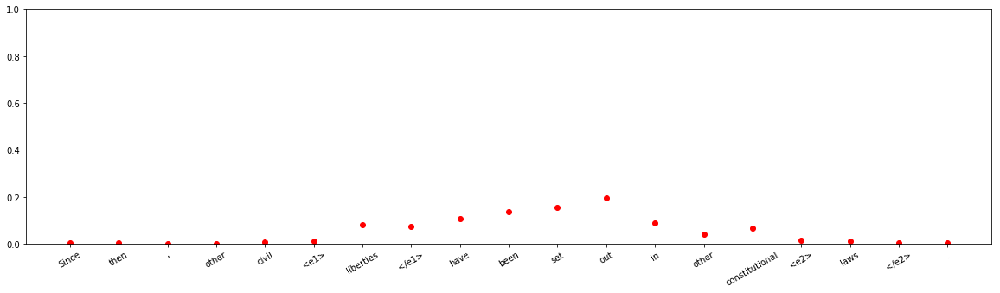



input sentence: Douglas obeyed the king , and the <e1> heart </e1> was enclosed in a silver <e2> casket </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 6.539593e-10
Entity-Destination(e1,e2) 	:	 2.1986348e-06
Cause-Effect(e2,e1) 	:	 1.6976158e-14
Member-Collection(e2,e1) 	:	 6.126516e-14
Entity-Origin(e1,e2) 	:	 2.069255e-10
Message-Topic(e1,e2) 	:	 6.0465013e-16
Component-Whole(e1,e2) 	:	 1.0927517e-06
Component-Whole(e2,e1) 	:	 3.1359418e-10
Instrument-Agency(e2,e1) 	:	 5.1068423e-14
Content-Container(e1,e2) 	:	 0.99998844
Product-Producer(e2,e1) 	:	 1.0084136e-12
Cause-Effect(e1,e2) 	:	 5.6170926e-16
Product-Producer(e1,e2) 	:	 6.48479e-14
Content-Container(e2,e1) 	:	 8.220068e-06
Entity-Origin(e2,e1) 	:	 2.9544346e-11
Message-Topic(e2,e1) 	:	 3.2175324e-12
Instrument-Agency(e1,e2) 	:	 2.0824504e-11
Member-Collection(e1,e2) 	:	 4.569113e-12
Entity-Destination(e2,e1) 	:	 1.7682344e-13



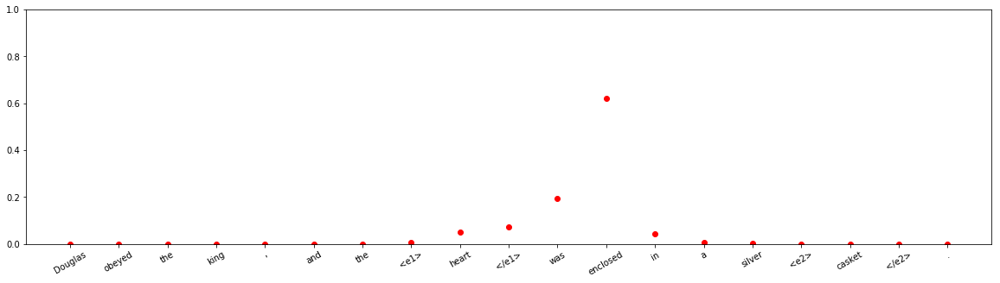




input sentence: Three <e1> men </e1> spent the afternoon inside a record <e2> store </e2> listening to an obscure band .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 0.14562565
Entity-Destination(e1,e2) 	:	 0.0035952937
Cause-Effect(e2,e1) 	:	 5.730364e-10
Member-Collection(e2,e1) 	:	 4.8063282e-09
Entity-Origin(e1,e2) 	:	 0.00018538348
Message-Topic(e1,e2) 	:	 4.158626e-09
Component-Whole(e1,e2) 	:	 5.3865045e-07
Component-Whole(e2,e1) 	:	 4.6436962e-11
Instrument-Agency(e2,e1) 	:	 0.018021002
Content-Container(e1,e2) 	:	 0.79324335
Product-Producer(e2,e1) 	:	 0.033816475
Cause-Effect(e1,e2) 	:	 1.0809799e-09
Product-Producer(e1,e2) 	:	 3.038852e-08
Content-Container(e2,e1) 	:	 0.0001823876
Entity-Origin(e2,e1) 	:	 4.2225562e-07
Message-Topic(e2,e1) 	:	 1.6558816e-06
Instrument-Agency(e1,e2) 	:	 1.4668746e-06
Member-Collection(e1,e2) 	:	 0.005326259
Entity-Destination(e2,e1) 	:	 5.773677e-10



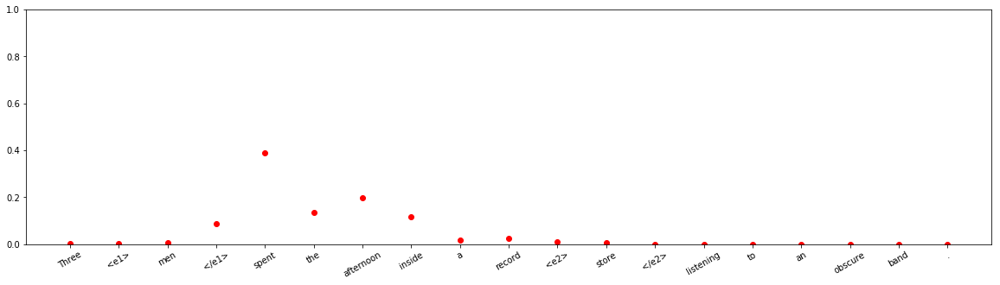




input sentence: It is a formal legal <e1> document </e1> that sets out the <e2> facts </e2> and legal reasons .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.99489945
Entity-Destination(e1,e2) 	:	 8.1935345e-16
Cause-Effect(e2,e1) 	:	 5.589222e-12
Member-Collection(e2,e1) 	:	 8.828168e-12
Entity-Origin(e1,e2) 	:	 2.2355106e-12
Message-Topic(e1,e2) 	:	 0.005100393
Component-Whole(e1,e2) 	:	 2.3198552e-08
Component-Whole(e2,e1) 	:	 1.3230414e-07
Instrument-Agency(e2,e1) 	:	 2.4702256e-09
Content-Container(e1,e2) 	:	 1.6422537e-10
Product-Producer(e2,e1) 	:	 8.4827273e-13
Cause-Effect(e1,e2) 	:	 1.6286868e-11
Product-Producer(e1,e2) 	:	 9.63269e-09
Content-Container(e2,e1) 	:	 2.8624728e-10
Entity-Origin(e2,e1) 	:	 1.7024384e-13
Message-Topic(e2,e1) 	:	 1.6275774e-08
Instrument-Agency(e1,e2) 	:	 5.034677e-09
Member-Collection(e1,e2) 	:	 1.4677673e-13
Entity-Destination(e2,e1) 	:	 1.4280631e-12



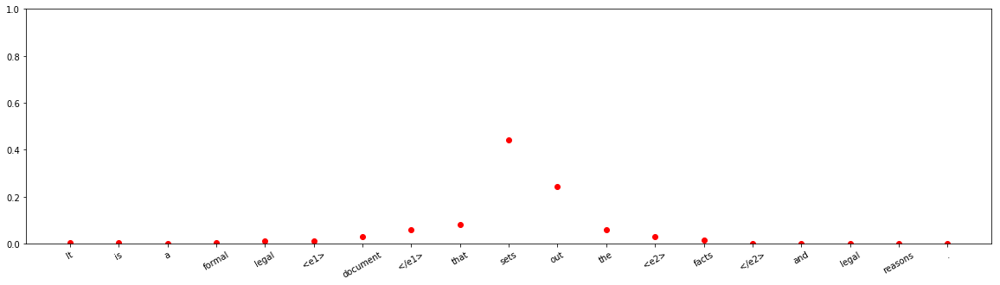



input sentence: The <e1> display </e1> showing signal and battery <e2> status </e2> also incorporates feedback from machinery being operated .
answer label:    Message-Topic(e1,e2)
wrong label:    Cause-Effect(e1,e2)
Other 	:	 2.4261967e-10
Entity-Destination(e1,e2) 	:	 2.7497666e-09
Cause-Effect(e2,e1) 	:	 1.9328409e-06
Member-Collection(e2,e1) 	:	 1.0052836e-05
Entity-Origin(e1,e2) 	:	 1.6145673e-06
Message-Topic(e1,e2) 	:	 0.099559404
Component-Whole(e1,e2) 	:	 0.0017665788
Component-Whole(e2,e1) 	:	 0.0009219144
Instrument-Agency(e2,e1) 	:	 7.0286525e-08
Content-Container(e1,e2) 	:	 2.6855165e-08
Product-Producer(e2,e1) 	:	 3.8161716e-06
Cause-Effect(e1,e2) 	:	 0.8966441
Product-Producer(e1,e2) 	:	 1.0023284e-05
Content-Container(e2,e1) 	:	 2.0892735e-08
Entity-Origin(e2,e1) 	:	 7.0878576e-07
Message-Topic(e2,e1) 	:	 0.0010073773
Instrument-Agency(e1,e2) 	:	 6.212524e-05
Member-Collection(e1,e2) 	:	 1.0197064e-05
Entity-Destination(e2,e1) 	:	 6.7371317e-09



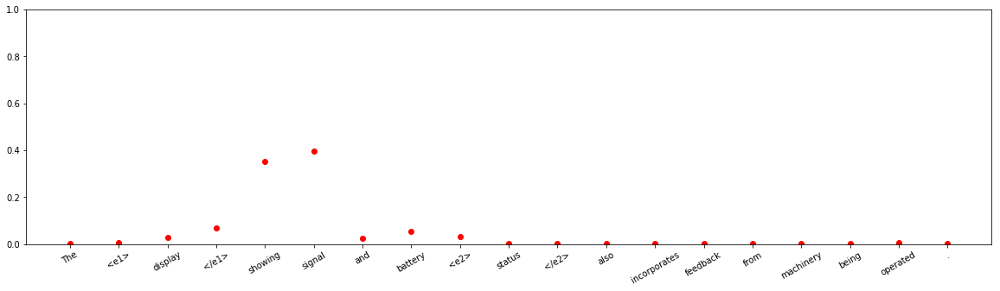





input sentence: The <e1> baboons </e1> have formed themselves into raiding <e2> parties </e2> and frequently descend on the village .
answer label:    Member-Collection(e1,e2)
wrong label:    Other
Other 	:	 0.99999523
Entity-Destination(e1,e2) 	:	 7.246748e-09
Cause-Effect(e2,e1) 	:	 9.261097e-13
Member-Collection(e2,e1) 	:	 9.809025e-12
Entity-Origin(e1,e2) 	:	 1.0609635e-09
Message-Topic(e1,e2) 	:	 2.128593e-12
Component-Whole(e1,e2) 	:	 7.310717e-10
Component-Whole(e2,e1) 	:	 3.720979e-15
Instrument-Agency(e2,e1) 	:	 9.094854e-16
Content-Container(e1,e2) 	:	 5.093385e-10
Product-Producer(e2,e1) 	:	 3.983329e-10
Cause-Effect(e1,e2) 	:	 2.067962e-11
Product-Producer(e1,e2) 	:	 3.336145e-11
Content-Container(e2,e1) 	:	 7.736401e-13
Entity-Origin(e2,e1) 	:	 5.861112e-09
Message-Topic(e2,e1) 	:	 2.421307e-10
Instrument-Agency(e1,e2) 	:	 7.640158e-10
Member-Collection(e1,e2) 	:	 4.722865e-06
Entity-Destination(e2,e1) 	:	 4.9663798e-14



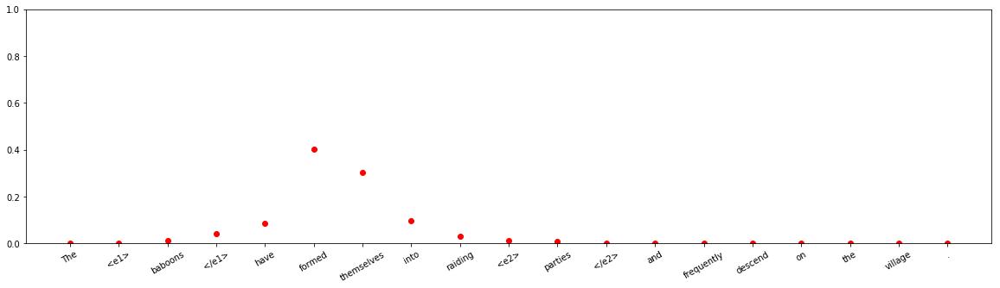




input sentence: At other times , the <e1> researcher </e1> approached the data with predetermined <e2> categories </e2> in mind .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.99960166
Entity-Destination(e1,e2) 	:	 7.56667e-10
Cause-Effect(e2,e1) 	:	 1.4547866e-11
Member-Collection(e2,e1) 	:	 7.677018e-11
Entity-Origin(e1,e2) 	:	 2.2832787e-09
Message-Topic(e1,e2) 	:	 3.6063087e-11
Component-Whole(e1,e2) 	:	 1.1602562e-13
Component-Whole(e2,e1) 	:	 9.75338e-13
Instrument-Agency(e2,e1) 	:	 0.00033319226
Content-Container(e1,e2) 	:	 3.877748e-09
Product-Producer(e2,e1) 	:	 6.40778e-05
Cause-Effect(e1,e2) 	:	 2.6877413e-11
Product-Producer(e1,e2) 	:	 6.816256e-14
Content-Container(e2,e1) 	:	 4.0812075e-08
Entity-Origin(e2,e1) 	:	 3.084051e-11
Message-Topic(e2,e1) 	:	 2.0270548e-10
Instrument-Agency(e1,e2) 	:	 3.0549625e-09
Member-Collection(e1,e2) 	:	 1.0875485e-06
Entity-Destination(e2,e1) 	:	 6.869087e-14



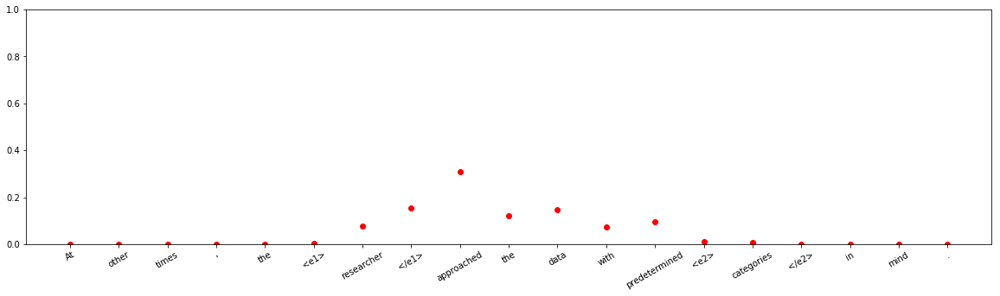


input sentence: This chapter shows how much Nova has accomplished earning the <e1> companionship </e1> of her <e2> teammates </e2> .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.00044056572
Entity-Destination(e1,e2) 	:	 5.2171354e-11
Cause-Effect(e2,e1) 	:	 0.0001235103
Member-Collection(e2,e1) 	:	 0.9990767
Entity-Origin(e1,e2) 	:	 2.3865113e-11
Message-Topic(e1,e2) 	:	 4.822626e-10
Component-Whole(e1,e2) 	:	 5.1356494e-07
Component-Whole(e2,e1) 	:	 2.9576796e-08
Instrument-Agency(e2,e1) 	:	 3.755006e-06
Content-Container(e1,e2) 	:	 1.3381227e-10
Product-Producer(e2,e1) 	:	 9.124481e-09
Cause-Effect(e1,e2) 	:	 1.0939217e-07
Product-Producer(e1,e2) 	:	 3.9322786e-06
Content-Container(e2,e1) 	:	 6.1860345e-10
Entity-Origin(e2,e1) 	:	 6.579171e-11
Message-Topic(e2,e1) 	:	 0.00018082281
Instrument-Agency(e1,e2) 	:	 0.00015788726
Member-Collection(e1,e2) 	:	 1.2176771e-05
Entity-Destination(e2,e1) 	:	 9.2871705e-10



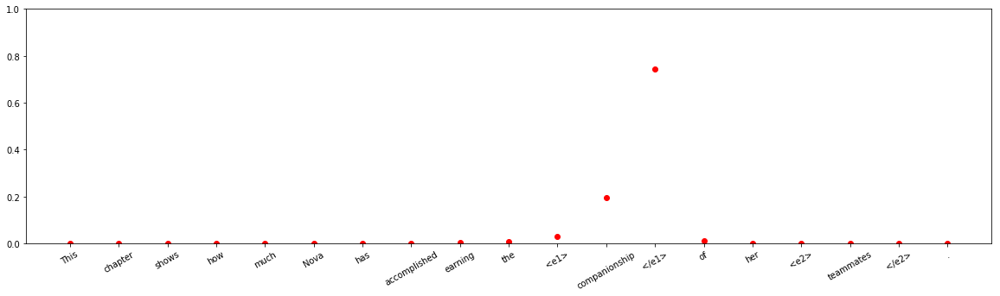


input sentence: It is far more reminiscent of an exit <e1> hole </e1> caused by a real <e2> missile </e2> .
answer label:    Product-Producer(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 4.4536771e-10
Entity-Destination(e1,e2) 	:	 1.7070603e-13
Cause-Effect(e2,e1) 	:	 0.999997
Member-Collection(e2,e1) 	:	 2.9215087e-12
Entity-Origin(e1,e2) 	:	 1.2870002e-12
Message-Topic(e1,e2) 	:	 1.1410396e-15
Component-Whole(e1,e2) 	:	 2.7495373e-09
Component-Whole(e2,e1) 	:	 1.1703686e-08
Instrument-Agency(e2,e1) 	:	 2.3763287e-09
Content-Container(e1,e2) 	:	 4.164243e-13
Product-Producer(e2,e1) 	:	 1.9154608e-12
Cause-Effect(e1,e2) 	:	 3.300422e-08
Product-Producer(e1,e2) 	:	 2.0029418e-06
Content-Container(e2,e1) 	:	 8.756368e-12
Entity-Origin(e2,e1) 	:	 6.3904816e-15
Message-Topic(e2,e1) 	:	 3.6641853e-11
Instrument-Agency(e1,e2) 	:	 9.179866e-07
Member-Collection(e1,e2) 	:	 7.5979796e-15
Entity-Destination(e2,e1) 	:	 9.624948e-13



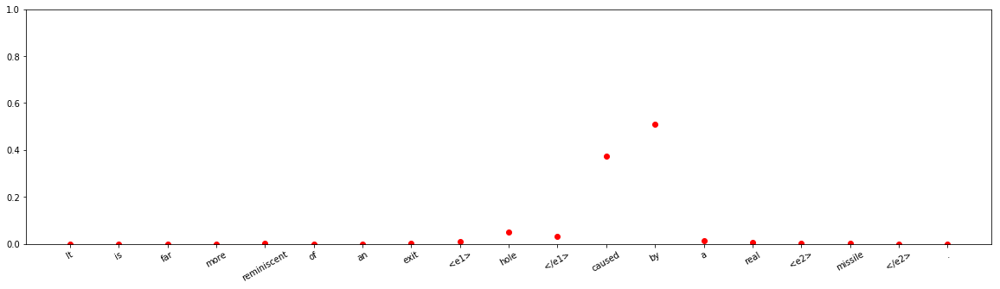


input sentence: Even the thinnest <e1> crack </e1> in a <e2> humidor </e2> is an open invitation to cigar beetles .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 1.3415603e-10
Entity-Destination(e1,e2) 	:	 3.104312e-10
Cause-Effect(e2,e1) 	:	 3.6399577e-17
Member-Collection(e2,e1) 	:	 3.1453076e-16
Entity-Origin(e1,e2) 	:	 2.323516e-09
Message-Topic(e1,e2) 	:	 2.9522516e-17
Component-Whole(e1,e2) 	:	 5.937039e-10
Component-Whole(e2,e1) 	:	 6.3686925e-16
Instrument-Agency(e2,e1) 	:	 8.409787e-12
Content-Container(e1,e2) 	:	 1.0
Product-Producer(e2,e1) 	:	 6.512045e-11
Cause-Effect(e1,e2) 	:	 7.11129e-18
Product-Producer(e1,e2) 	:	 1.07003246e-13
Content-Container(e2,e1) 	:	 1.4273538e-10
Entity-Origin(e2,e1) 	:	 2.2342009e-13
Message-Topic(e2,e1) 	:	 2.7564253e-12
Instrument-Agency(e1,e2) 	:	 4.0044354e-13
Member-Collection(e1,e2) 	:	 6.742371e-10
Entity-Destination(e2,e1) 	:	 1.3515768e-14



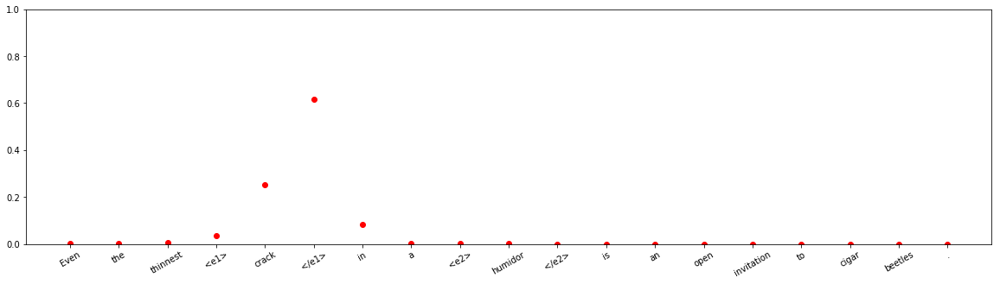






input sentence: The <e1> box </e1> contained a complete British manual telegraph tape-making and high speed sending <e2> system </e2> .
answer label:    Other
wrong label:    Content-Container(e2,e1)
Other 	:	 9.675593e-12
Entity-Destination(e1,e2) 	:	 2.4266353e-09
Cause-Effect(e2,e1) 	:	 3.419734e-10
Member-Collection(e2,e1) 	:	 3.3174276e-11
Entity-Origin(e1,e2) 	:	 6.9763175e-08
Message-Topic(e1,e2) 	:	 3.9415665e-10
Component-Whole(e1,e2) 	:	 0.00094310846
Component-Whole(e2,e1) 	:	 0.0004872908
Instrument-Agency(e2,e1) 	:	 3.3350796e-06
Content-Container(e1,e2) 	:	 3.3393906e-05
Product-Producer(e2,e1) 	:	 1.8438655e-10
Cause-Effect(e1,e2) 	:	 1.3522395e-09
Product-Producer(e1,e2) 	:	 3.075239e-10
Content-Container(e2,e1) 	:	 0.9985318
Entity-Origin(e2,e1) 	:	 2.8991756e-10
Message-Topic(e2,e1) 	:	 2.9420195e-13
Instrument-Agency(e1,e2) 	:	 9.954643e-07
Member-Collection(e1,e2) 	:	 1.8527889e-13
Entity-Destination(e2,e1) 	:	 4.2109085e-12



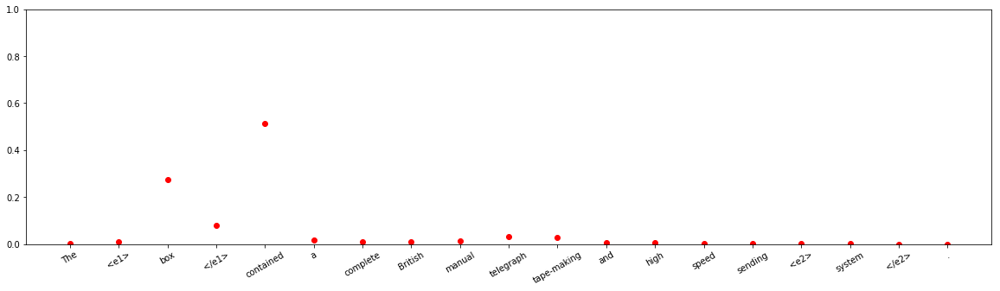




input sentence: One <e1> soldier </e1> was brutally frank in a <e2> message </e2> posted on a website last week .
answer label:    Product-Producer(e2,e1)
wrong label:    Message-Topic(e2,e1)
Other 	:	 5.7937135e-09
Entity-Destination(e1,e2) 	:	 1.750069e-06
Cause-Effect(e2,e1) 	:	 2.0593348e-11
Member-Collection(e2,e1) 	:	 2.0064997e-05
Entity-Origin(e1,e2) 	:	 0.0024327855
Message-Topic(e1,e2) 	:	 8.457956e-07
Component-Whole(e1,e2) 	:	 0.0015774112
Component-Whole(e2,e1) 	:	 8.1445506e-10
Instrument-Agency(e2,e1) 	:	 3.5877783e-05
Content-Container(e1,e2) 	:	 0.17429797
Product-Producer(e2,e1) 	:	 0.29266265
Cause-Effect(e1,e2) 	:	 6.267988e-09
Product-Producer(e1,e2) 	:	 2.0005505e-06
Content-Container(e2,e1) 	:	 8.248329e-07
Entity-Origin(e2,e1) 	:	 8.294332e-09
Message-Topic(e2,e1) 	:	 0.46050775
Instrument-Agency(e1,e2) 	:	 3.7178963e-10
Member-Collection(e1,e2) 	:	 0.06846012
Entity-Destination(e2,e1) 	:	 8.2407095e-11



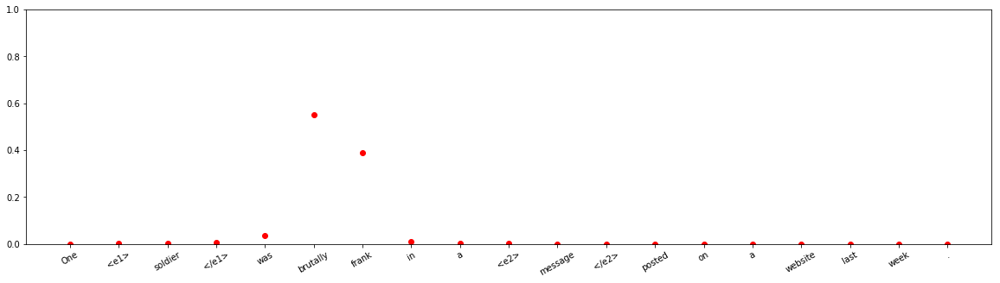









input sentence: A worker inserts the small <e1> spring </e1> in the <e2> device </e2> and then installs the buttons .
answer label:    Entity-Destination(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.9543037e-08
Entity-Destination(e1,e2) 	:	 6.409327e-10
Cause-Effect(e2,e1) 	:	 8.749965e-12
Member-Collection(e2,e1) 	:	 3.3125114e-14
Entity-Origin(e1,e2) 	:	 1.1195416e-10
Message-Topic(e1,e2) 	:	 4.3696947e-15
Component-Whole(e1,e2) 	:	 0.9999999
Component-Whole(e2,e1) 	:	 1.6043669e-10
Instrument-Agency(e2,e1) 	:	 1.0520561e-12
Content-Container(e1,e2) 	:	 1.6368134e-07
Product-Producer(e2,e1) 	:	 2.1450667e-14
Cause-Effect(e1,e2) 	:	 8.347697e-16
Product-Producer(e1,e2) 	:	 4.929019e-12
Content-Container(e2,e1) 	:	 9.261339e-12
Entity-Origin(e2,e1) 	:	 1.2294439e-15
Message-Topic(e2,e1) 	:	 9.753717e-12
Instrument-Agency(e1,e2) 	:	 1.4320221e-10
Member-Collection(e1,e2) 	:	 7.467712e-09
Entity-Destination(e2,e1) 	:	 3.2208098e-13



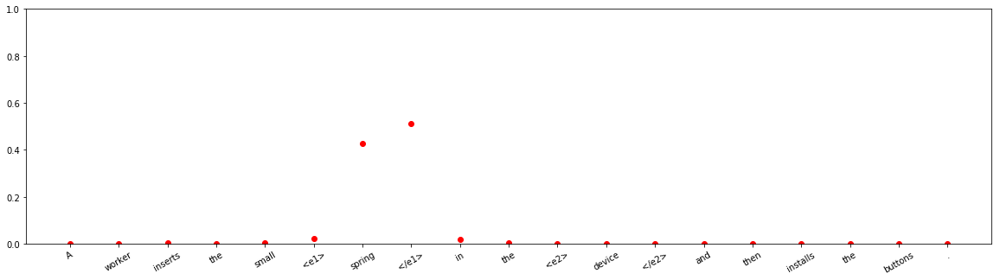








input sentence: <e1> Death </e1> in a <e2> vat </e2> of chocolate was just waiting for some witty hilarious jokes .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 0.00061630434
Entity-Destination(e1,e2) 	:	 0.00330568
Cause-Effect(e2,e1) 	:	 1.8938978e-08
Member-Collection(e2,e1) 	:	 1.131603e-09
Entity-Origin(e1,e2) 	:	 1.6197848e-05
Message-Topic(e1,e2) 	:	 1.55754e-07
Component-Whole(e1,e2) 	:	 7.1678173e-06
Component-Whole(e2,e1) 	:	 2.476087e-10
Instrument-Agency(e2,e1) 	:	 2.9796897e-08
Content-Container(e1,e2) 	:	 0.9832745
Product-Producer(e2,e1) 	:	 4.1169198e-08
Cause-Effect(e1,e2) 	:	 1.2294772e-10
Product-Producer(e1,e2) 	:	 6.646343e-09
Content-Container(e2,e1) 	:	 4.8494186e-08
Entity-Origin(e2,e1) 	:	 1.1656465e-08
Message-Topic(e2,e1) 	:	 0.0126113
Instrument-Agency(e1,e2) 	:	 3.4708811e-09
Member-Collection(e1,e2) 	:	 0.00016860958
Entity-Destination(e2,e1) 	:	 1.3601243e-09



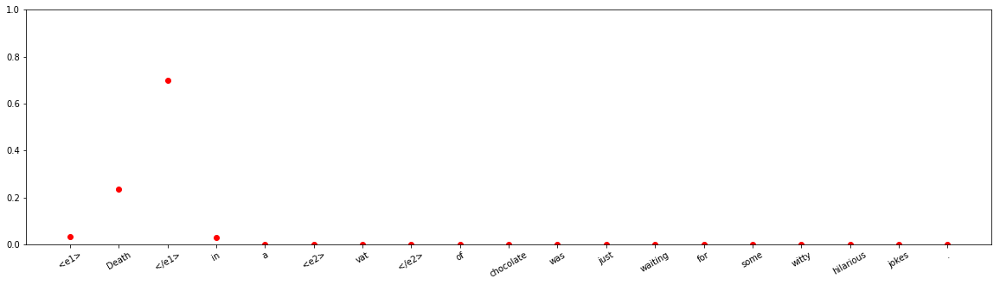









input sentence: When a <e1> joke </e1> driven <e2> comedy </e2> has weaker jokes , there 's nothing behind them .
answer label:    Component-Whole(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.0002546929
Entity-Destination(e1,e2) 	:	 3.7931883e-11
Cause-Effect(e2,e1) 	:	 2.164304e-06
Member-Collection(e2,e1) 	:	 2.6550797e-05
Entity-Origin(e1,e2) 	:	 1.6963348e-07
Message-Topic(e1,e2) 	:	 0.000121241486
Component-Whole(e1,e2) 	:	 3.1386132e-06
Component-Whole(e2,e1) 	:	 0.9265744
Instrument-Agency(e2,e1) 	:	 0.0003551619
Content-Container(e1,e2) 	:	 5.6655364e-07
Product-Producer(e2,e1) 	:	 4.6185605e-08
Cause-Effect(e1,e2) 	:	 0.00069678586
Product-Producer(e1,e2) 	:	 2.2237145e-05
Content-Container(e2,e1) 	:	 5.859705e-08
Entity-Origin(e2,e1) 	:	 7.6490353e-10
Message-Topic(e2,e1) 	:	 1.8484164e-07
Instrument-Agency(e1,e2) 	:	 0.07194252
Member-Collection(e1,e2) 	:	 1.736814e-07
Entity-Destination(e2,e1) 	:	 4.2281423e-09



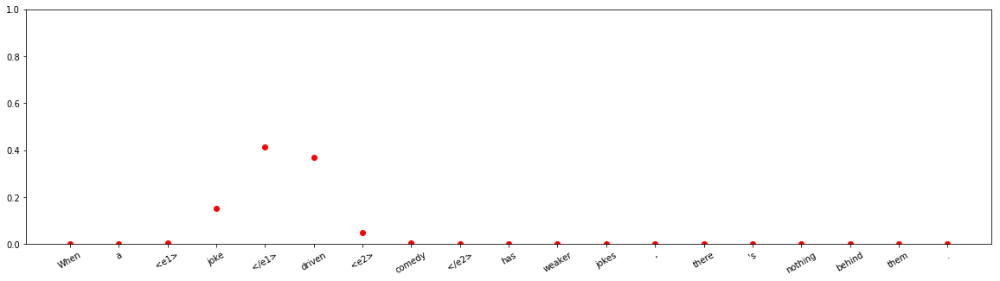




input sentence: <e1> Jug </e1> <e2> wine </e2> has a bad reputation , with many considering it cheap and low-quality .
answer label:    Content-Container(e2,e1)
wrong label:    Entity-Origin(e2,e1)
Other 	:	 6.7227184e-08
Entity-Destination(e1,e2) 	:	 3.0294427e-09
Cause-Effect(e2,e1) 	:	 1.8085988e-11
Member-Collection(e2,e1) 	:	 9.0519256e-07
Entity-Origin(e1,e2) 	:	 7.0073855e-07
Message-Topic(e1,e2) 	:	 2.0118796e-09
Component-Whole(e1,e2) 	:	 8.52236e-10
Component-Whole(e2,e1) 	:	 8.0372287e-10
Instrument-Agency(e2,e1) 	:	 3.160241e-11
Content-Container(e1,e2) 	:	 2.7794297e-07
Product-Producer(e2,e1) 	:	 1.6050554e-07
Cause-Effect(e1,e2) 	:	 1.8720105e-10
Product-Producer(e1,e2) 	:	 4.706017e-07
Content-Container(e2,e1) 	:	 8.5675114e-05
Entity-Origin(e2,e1) 	:	 0.99990475
Message-Topic(e2,e1) 	:	 1.2707898e-09
Instrument-Agency(e1,e2) 	:	 6.568929e-06
Member-Collection(e1,e2) 	:	 4.6205298e-07
Entity-Destination(e2,e1) 	:	 4.2007535e-09



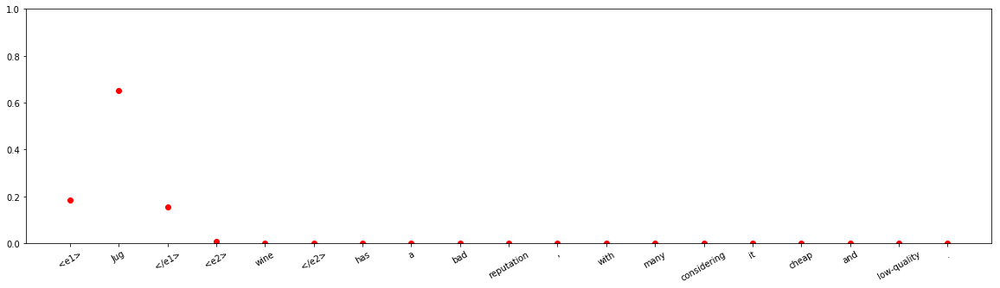




input sentence: The proposed permanent <e1> rules </e1> establish <e2> criteria </e2> and procedures for awarding grants to eligible applicants .
answer label:    Cause-Effect(e1,e2)
wrong label:    Other
Other 	:	 0.92460304
Entity-Destination(e1,e2) 	:	 3.165884e-12
Cause-Effect(e2,e1) 	:	 1.7405292e-11
Member-Collection(e2,e1) 	:	 1.35498714e-08
Entity-Origin(e1,e2) 	:	 4.3511706e-15
Message-Topic(e1,e2) 	:	 0.07525242
Component-Whole(e1,e2) 	:	 3.2328658e-09
Component-Whole(e2,e1) 	:	 4.5284068e-10
Instrument-Agency(e2,e1) 	:	 2.360424e-09
Content-Container(e1,e2) 	:	 7.899579e-12
Product-Producer(e2,e1) 	:	 3.7818023e-07
Cause-Effect(e1,e2) 	:	 2.0094224e-06
Product-Producer(e1,e2) 	:	 1.9706854e-09
Content-Container(e2,e1) 	:	 3.3117015e-10
Entity-Origin(e2,e1) 	:	 1.055318e-07
Message-Topic(e2,e1) 	:	 0.00014159875
Instrument-Agency(e1,e2) 	:	 3.884496e-07
Member-Collection(e1,e2) 	:	 4.635786e-10
Entity-Destination(e2,e1) 	:	 6.4326294e-10



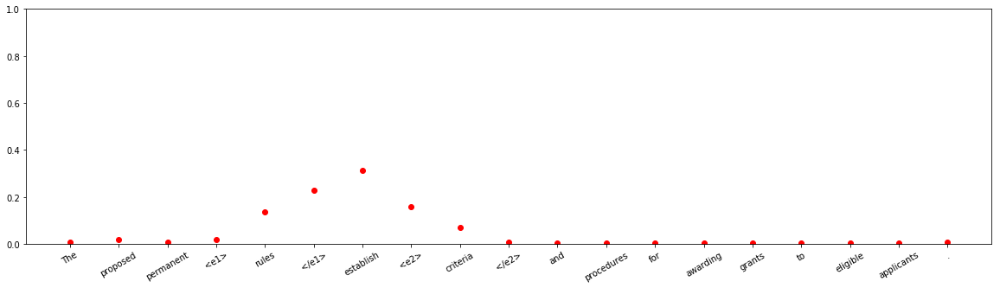




input sentence: A reconstruction <e1> drawing </e1> from 1954 shows a <e2> man </e2> wearing the Cape over his shoulders .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9971903
Entity-Destination(e1,e2) 	:	 6.046296e-11
Cause-Effect(e2,e1) 	:	 5.647686e-07
Member-Collection(e2,e1) 	:	 3.156582e-08
Entity-Origin(e1,e2) 	:	 5.0484124e-07
Message-Topic(e1,e2) 	:	 7.4805066e-05
Component-Whole(e1,e2) 	:	 0.0021876968
Component-Whole(e2,e1) 	:	 0.0001103991
Instrument-Agency(e2,e1) 	:	 7.1680424e-06
Content-Container(e1,e2) 	:	 1.2003004e-06
Product-Producer(e2,e1) 	:	 1.906397e-05
Cause-Effect(e1,e2) 	:	 2.6421117e-07
Product-Producer(e1,e2) 	:	 0.00035475756
Content-Container(e2,e1) 	:	 7.3977244e-06
Entity-Origin(e2,e1) 	:	 2.0245934e-09
Message-Topic(e2,e1) 	:	 1.2738428e-06
Instrument-Agency(e1,e2) 	:	 4.4343487e-05
Member-Collection(e1,e2) 	:	 3.1783932e-07
Entity-Destination(e2,e1) 	:	 1.3229122e-07



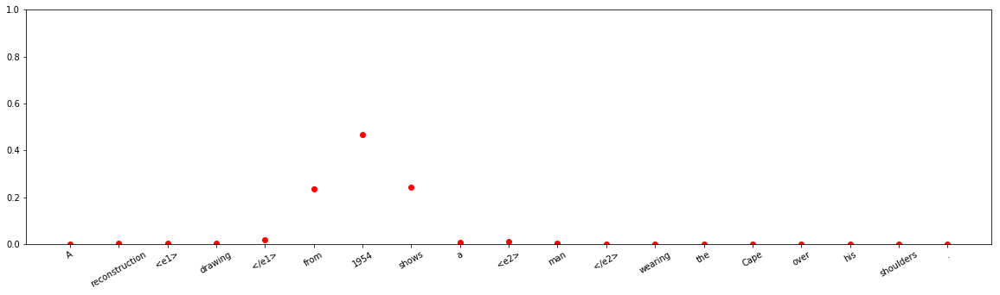



input sentence: The <e1> artwork </e1> arose from an enjoyable <e2> evening </e2> with some friends and too much inspiration .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 2.0152455e-09
Entity-Destination(e1,e2) 	:	 7.125748e-09
Cause-Effect(e2,e1) 	:	 0.9975434
Member-Collection(e2,e1) 	:	 1.1017088e-10
Entity-Origin(e1,e2) 	:	 0.002424458
Message-Topic(e1,e2) 	:	 9.326402e-09
Component-Whole(e1,e2) 	:	 2.370782e-10
Component-Whole(e2,e1) 	:	 5.8400623e-10
Instrument-Agency(e2,e1) 	:	 2.9492464e-11
Content-Container(e1,e2) 	:	 6.778478e-11
Product-Producer(e2,e1) 	:	 6.3225944e-09
Cause-Effect(e1,e2) 	:	 4.8747317e-08
Product-Producer(e1,e2) 	:	 3.1730942e-05
Content-Container(e2,e1) 	:	 5.3732848e-11
Entity-Origin(e2,e1) 	:	 7.7275235e-09
Message-Topic(e2,e1) 	:	 3.5979738e-07
Instrument-Agency(e1,e2) 	:	 2.7443386e-10
Member-Collection(e1,e2) 	:	 2.1379956e-09
Entity-Destination(e2,e1) 	:	 2.659142e-11



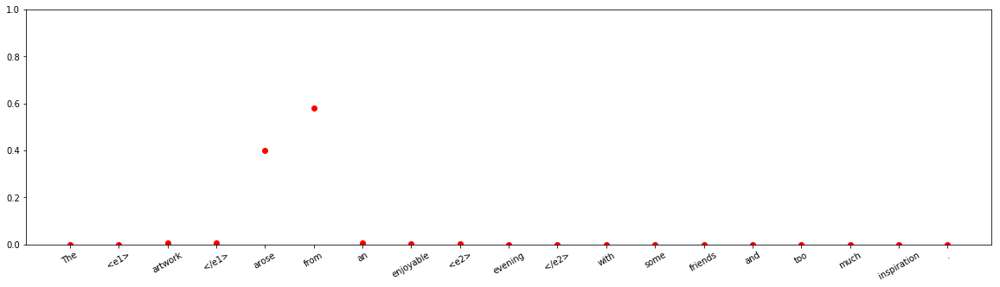



input sentence: Described herein are improved apparatus and method for tissue <e1> treatment </e1> with high intensity-focused <e2> ultrasound </e2> .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.076121e-06
Entity-Destination(e1,e2) 	:	 5.843246e-08
Cause-Effect(e2,e1) 	:	 2.0132791e-07
Member-Collection(e2,e1) 	:	 1.1355333e-07
Entity-Origin(e1,e2) 	:	 2.829175e-07
Message-Topic(e1,e2) 	:	 6.70775e-07
Component-Whole(e1,e2) 	:	 2.1493304e-05
Component-Whole(e2,e1) 	:	 0.99808806
Instrument-Agency(e2,e1) 	:	 0.0017861015
Content-Container(e1,e2) 	:	 1.802258e-07
Product-Producer(e2,e1) 	:	 6.529974e-08
Cause-Effect(e1,e2) 	:	 2.386677e-09
Product-Producer(e1,e2) 	:	 1.7816194e-07
Content-Container(e2,e1) 	:	 1.6769895e-06
Entity-Origin(e2,e1) 	:	 9.864974e-09
Message-Topic(e2,e1) 	:	 4.832075e-05
Instrument-Agency(e1,e2) 	:	 5.046928e-05
Member-Collection(e1,e2) 	:	 5.182354e-11
Entity-Destination(e2,e1) 	:	 3.8743195e-10



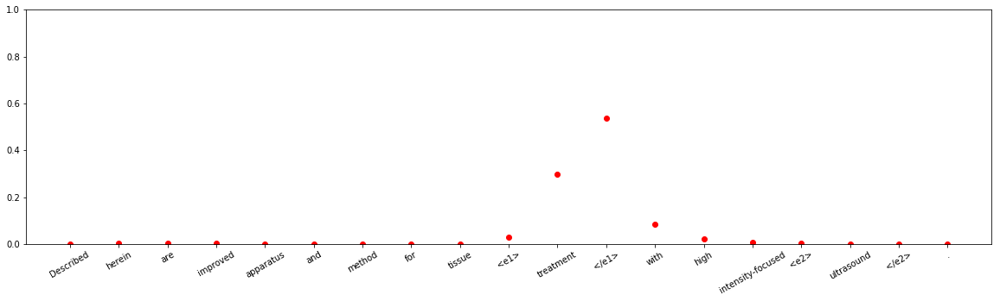



input sentence: The construction work of the <e1> metro </e1> <e2> station </e2> for Line 6 started in September 2007 .
answer label:    Component-Whole(e2,e1)
wrong label:    Other
Other 	:	 0.96498114
Entity-Destination(e1,e2) 	:	 7.091278e-08
Cause-Effect(e2,e1) 	:	 4.5822532e-09
Member-Collection(e2,e1) 	:	 6.2870345e-07
Entity-Origin(e1,e2) 	:	 1.7662701e-06
Message-Topic(e1,e2) 	:	 1.365001e-07
Component-Whole(e1,e2) 	:	 0.00031694295
Component-Whole(e2,e1) 	:	 0.009320532
Instrument-Agency(e2,e1) 	:	 8.595832e-07
Content-Container(e1,e2) 	:	 4.6173186e-06
Product-Producer(e2,e1) 	:	 1.8315351e-06
Cause-Effect(e1,e2) 	:	 1.22636825e-08
Product-Producer(e1,e2) 	:	 0.00040961953
Content-Container(e2,e1) 	:	 2.9597643e-07
Entity-Origin(e2,e1) 	:	 0.0002134769
Message-Topic(e2,e1) 	:	 7.2767025e-06
Instrument-Agency(e1,e2) 	:	 0.024737343
Member-Collection(e1,e2) 	:	 3.5902285e-06
Entity-Destination(e2,e1) 	:	 1.4735068e-08



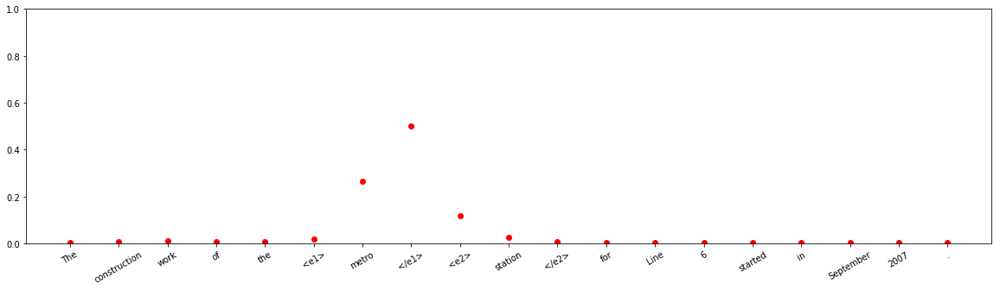


input sentence: 5 Gigahertz is a radio frequency <e1> band </e1> that is used by 802.11a/n Wi-Fi <e2> products </e2> .
answer label:    Instrument-Agency(e1,e2)
wrong label:    Other
Other 	:	 0.99999964
Entity-Destination(e1,e2) 	:	 1.0591917e-15
Cause-Effect(e2,e1) 	:	 3.5032144e-11
Member-Collection(e2,e1) 	:	 4.476271e-15
Entity-Origin(e1,e2) 	:	 2.8279657e-12
Message-Topic(e1,e2) 	:	 3.428842e-16
Component-Whole(e1,e2) 	:	 2.2606103e-12
Component-Whole(e2,e1) 	:	 5.155032e-13
Instrument-Agency(e2,e1) 	:	 6.798991e-08
Content-Container(e1,e2) 	:	 3.523949e-11
Product-Producer(e2,e1) 	:	 2.1002967e-11
Cause-Effect(e1,e2) 	:	 5.573631e-17
Product-Producer(e1,e2) 	:	 1.4097107e-09
Content-Container(e2,e1) 	:	 5.559269e-12
Entity-Origin(e2,e1) 	:	 2.296555e-13
Message-Topic(e2,e1) 	:	 2.2249498e-10
Instrument-Agency(e1,e2) 	:	 2.3367708e-07
Member-Collection(e1,e2) 	:	 9.343981e-13
Entity-Destination(e2,e1) 	:	 1.513766e-14



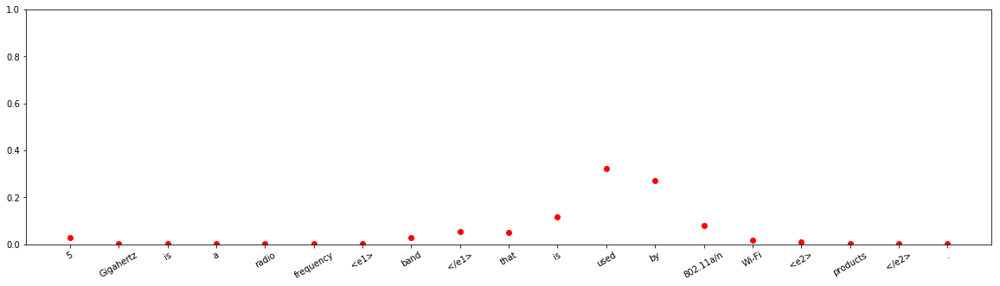



input sentence: The fleeing <e1> convicts </e1> were picked out of the darkness by the watchful prison <e2> guards </e2> .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 9.696843e-07
Entity-Destination(e1,e2) 	:	 3.7639744e-08
Cause-Effect(e2,e1) 	:	 0.5246373
Member-Collection(e2,e1) 	:	 1.285567e-07
Entity-Origin(e1,e2) 	:	 0.0049459743
Message-Topic(e1,e2) 	:	 1.060533e-14
Component-Whole(e1,e2) 	:	 1.1634034e-08
Component-Whole(e2,e1) 	:	 1.4159335e-07
Instrument-Agency(e2,e1) 	:	 0.28072277
Content-Container(e1,e2) 	:	 5.740719e-07
Product-Producer(e2,e1) 	:	 1.3653563e-06
Cause-Effect(e1,e2) 	:	 9.116618e-10
Product-Producer(e1,e2) 	:	 0.18773484
Content-Container(e2,e1) 	:	 2.7457109e-08
Entity-Origin(e2,e1) 	:	 7.54391e-11
Message-Topic(e2,e1) 	:	 1.6252625e-07
Instrument-Agency(e1,e2) 	:	 0.001935712
Member-Collection(e1,e2) 	:	 2.0022897e-05
Entity-Destination(e2,e1) 	:	 1.3779198e-09



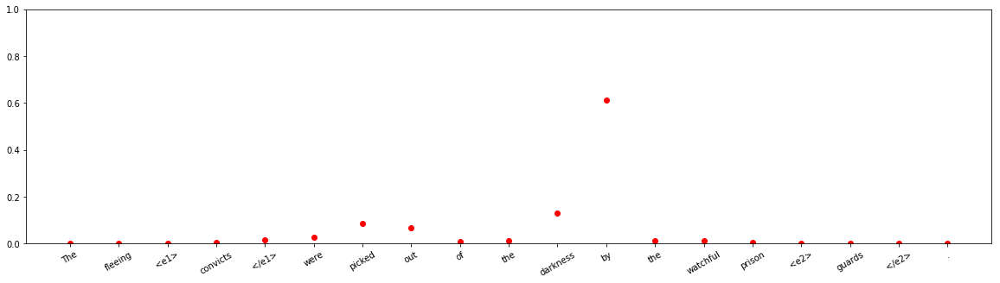





input sentence: It is soon asleep , however , on the pillow of <e1> mother </e1> 's <e2> breast </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.0020437958
Entity-Destination(e1,e2) 	:	 1.5138995e-09
Cause-Effect(e2,e1) 	:	 2.1620942e-06
Member-Collection(e2,e1) 	:	 2.4131912e-08
Entity-Origin(e1,e2) 	:	 3.7232196e-06
Message-Topic(e1,e2) 	:	 9.920331e-10
Component-Whole(e1,e2) 	:	 3.8074807e-06
Component-Whole(e2,e1) 	:	 0.06343124
Instrument-Agency(e2,e1) 	:	 0.21758056
Content-Container(e1,e2) 	:	 1.0089508e-05
Product-Producer(e2,e1) 	:	 0.7169187
Cause-Effect(e1,e2) 	:	 9.0760454e-07
Product-Producer(e1,e2) 	:	 7.103598e-07
Content-Container(e2,e1) 	:	 4.695671e-07
Entity-Origin(e2,e1) 	:	 7.784486e-08
Message-Topic(e2,e1) 	:	 1.0461629e-06
Instrument-Agency(e1,e2) 	:	 2.2675265e-06
Member-Collection(e1,e2) 	:	 4.365246e-07
Entity-Destination(e2,e1) 	:	 2.0367703e-09



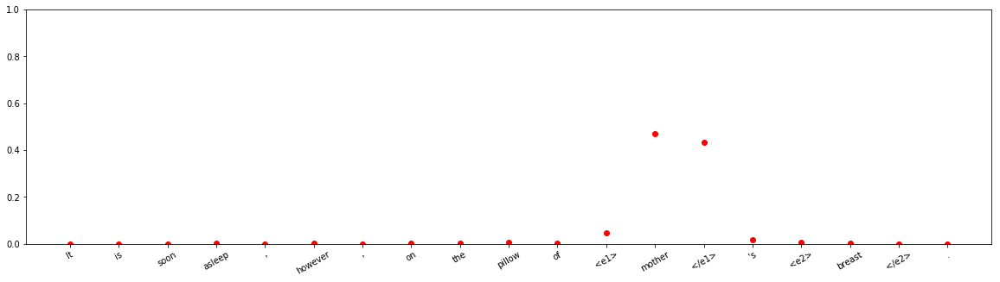



input sentence: The <e1> monks </e1> scaled the sheer rock faces by inserting <e2> pieces </e2> of timber into crevices .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.9265206e-11
Entity-Destination(e1,e2) 	:	 1.004062e-09
Cause-Effect(e2,e1) 	:	 5.4671073e-10
Member-Collection(e2,e1) 	:	 1.5854488e-09
Entity-Origin(e1,e2) 	:	 4.7843617e-08
Message-Topic(e1,e2) 	:	 3.9095947e-14
Component-Whole(e1,e2) 	:	 4.377274e-12
Component-Whole(e2,e1) 	:	 6.3948216e-09
Instrument-Agency(e2,e1) 	:	 2.4363659e-05
Content-Container(e1,e2) 	:	 3.9331538e-11
Product-Producer(e2,e1) 	:	 0.9999747
Cause-Effect(e1,e2) 	:	 2.681472e-11
Product-Producer(e1,e2) 	:	 2.9149092e-08
Content-Container(e2,e1) 	:	 8.226625e-07
Entity-Origin(e2,e1) 	:	 6.0428793e-12
Message-Topic(e2,e1) 	:	 3.6989406e-10
Instrument-Agency(e1,e2) 	:	 6.429119e-11
Member-Collection(e1,e2) 	:	 1.4173614e-10
Entity-Destination(e2,e1) 	:	 3.6107228e-12



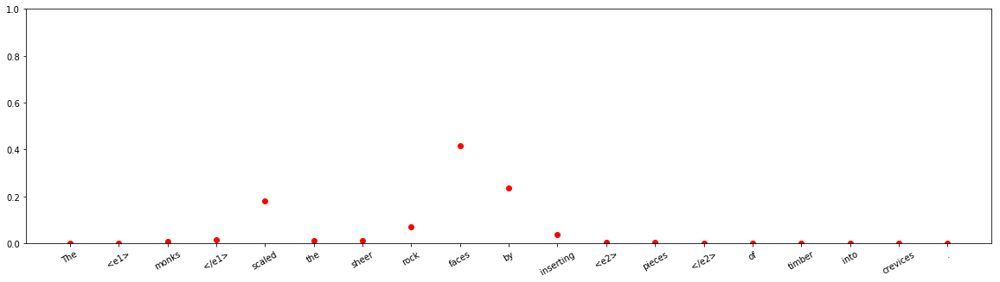




input sentence: The release profiles were modified by delaying additional drug <e1> release </e1> from the press-coated <e2> surfaces </e2> .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 4.4285292e-15
Entity-Destination(e1,e2) 	:	 7.6924654e-11
Cause-Effect(e2,e1) 	:	 1.8044612e-10
Member-Collection(e2,e1) 	:	 3.377267e-13
Entity-Origin(e1,e2) 	:	 1.0
Message-Topic(e1,e2) 	:	 1.9920223e-14
Component-Whole(e1,e2) 	:	 1.3369598e-10
Component-Whole(e2,e1) 	:	 3.3481613e-09
Instrument-Agency(e2,e1) 	:	 5.143278e-13
Content-Container(e1,e2) 	:	 2.0644113e-09
Product-Producer(e2,e1) 	:	 1.7382915e-14
Cause-Effect(e1,e2) 	:	 7.766613e-17
Product-Producer(e1,e2) 	:	 2.4358602e-09
Content-Container(e2,e1) 	:	 1.0356946e-15
Entity-Origin(e2,e1) 	:	 5.6354953e-13
Message-Topic(e2,e1) 	:	 5.7875597e-11
Instrument-Agency(e1,e2) 	:	 4.9351034e-13
Member-Collection(e1,e2) 	:	 5.395635e-12
Entity-Destination(e2,e1) 	:	 1.0509054e-15



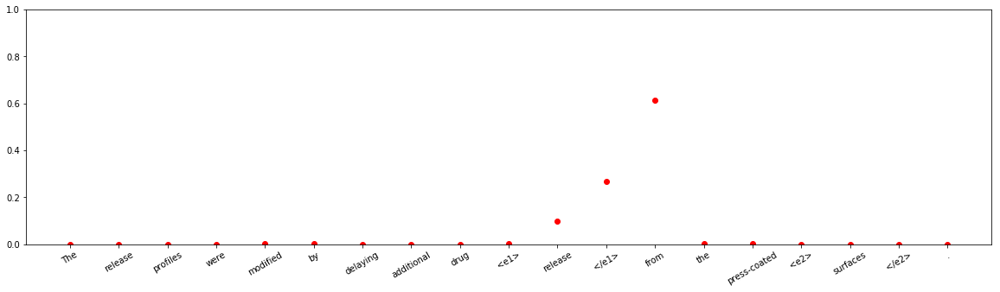


input sentence: I got scrambled eggs , a biscuit , bacon and a <e1> mess </e1> of <e2> grits </e2> .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.00011249126
Entity-Destination(e1,e2) 	:	 1.3647303e-08
Cause-Effect(e2,e1) 	:	 1.6185028e-06
Member-Collection(e2,e1) 	:	 0.9877637
Entity-Origin(e1,e2) 	:	 7.46602e-07
Message-Topic(e1,e2) 	:	 1.240289e-06
Component-Whole(e1,e2) 	:	 1.4503746e-05
Component-Whole(e2,e1) 	:	 5.149147e-06
Instrument-Agency(e2,e1) 	:	 2.362041e-07
Content-Container(e1,e2) 	:	 4.146561e-06
Product-Producer(e2,e1) 	:	 4.9876107e-05
Cause-Effect(e1,e2) 	:	 2.6167512e-05
Product-Producer(e1,e2) 	:	 1.3165057e-05
Content-Container(e2,e1) 	:	 0.010827639
Entity-Origin(e2,e1) 	:	 0.001109815
Message-Topic(e2,e1) 	:	 2.2122616e-07
Instrument-Agency(e1,e2) 	:	 6.929177e-05
Member-Collection(e1,e2) 	:	 5.0029545e-09
Entity-Destination(e2,e1) 	:	 4.6186682e-10



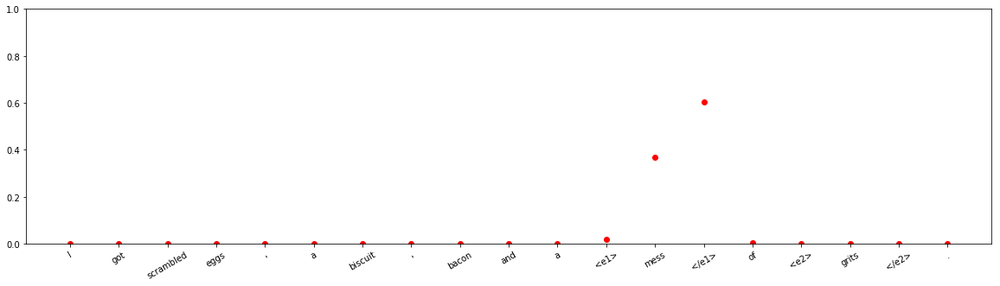











input sentence: Much of his early <e1> teaching experience </e1> involves telling <e2> anecdotes </e2> about his childhood in Ireland .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 5.3358082e-08
Entity-Destination(e1,e2) 	:	 1.3695982e-09
Cause-Effect(e2,e1) 	:	 3.0764124e-08
Member-Collection(e2,e1) 	:	 5.8169996e-07
Entity-Origin(e1,e2) 	:	 3.5189642e-09
Message-Topic(e1,e2) 	:	 0.028055303
Component-Whole(e1,e2) 	:	 8.056654e-08
Component-Whole(e2,e1) 	:	 0.045678917
Instrument-Agency(e2,e1) 	:	 0.0001707598
Content-Container(e1,e2) 	:	 9.994002e-11
Product-Producer(e2,e1) 	:	 0.15255842
Cause-Effect(e1,e2) 	:	 6.907154e-05
Product-Producer(e1,e2) 	:	 6.194695e-06
Content-Container(e2,e1) 	:	 3.2280827e-08
Entity-Origin(e2,e1) 	:	 6.0863194e-08
Message-Topic(e2,e1) 	:	 0.7734599
Instrument-Agency(e1,e2) 	:	 6.224087e-07
Member-Collection(e1,e2) 	:	 2.852406e-11
Entity-Destination(e2,e1) 	:	 1.1120816e-08



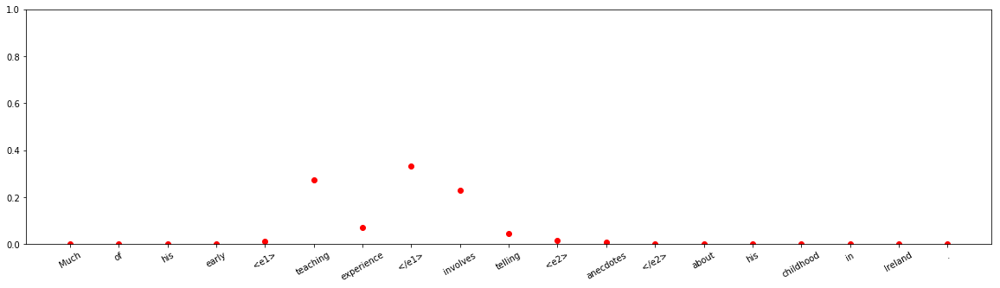




input sentence: There is in fact a <e1> socialist </e1> <e2> party </e2> in America and there are real socialists .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 0.00010940605
Entity-Destination(e1,e2) 	:	 1.894493e-11
Cause-Effect(e2,e1) 	:	 3.9328403e-09
Member-Collection(e2,e1) 	:	 0.019711053
Entity-Origin(e1,e2) 	:	 6.965159e-08
Message-Topic(e1,e2) 	:	 4.4277976e-06
Component-Whole(e1,e2) 	:	 2.8872166e-06
Component-Whole(e2,e1) 	:	 2.9987433e-11
Instrument-Agency(e2,e1) 	:	 1.6366532e-12
Content-Container(e1,e2) 	:	 7.3408245e-11
Product-Producer(e2,e1) 	:	 9.53454e-09
Cause-Effect(e1,e2) 	:	 2.476612e-06
Product-Producer(e1,e2) 	:	 3.556586e-05
Content-Container(e2,e1) 	:	 5.7687162e-12
Entity-Origin(e2,e1) 	:	 7.523542e-07
Message-Topic(e2,e1) 	:	 2.629011e-06
Instrument-Agency(e1,e2) 	:	 4.5722873e-06
Member-Collection(e1,e2) 	:	 0.9801262
Entity-Destination(e2,e1) 	:	 3.6153208e-10



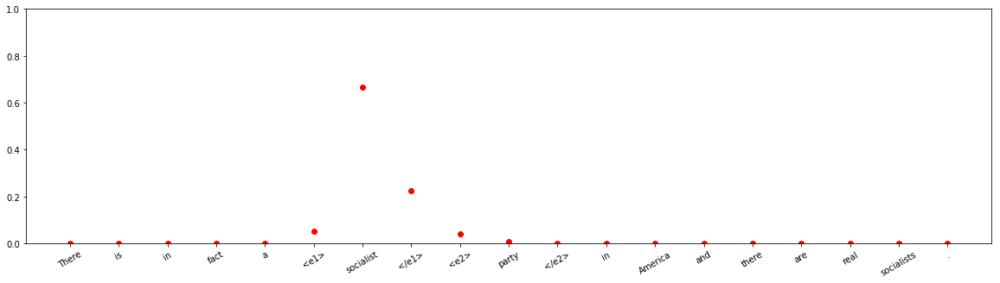










input sentence: The <e1> act </e1> promotes efficiency through <e2> limitation </e2> of the copyright owner 's available monetary damages .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.99999654
Entity-Destination(e1,e2) 	:	 1.1388393e-14
Cause-Effect(e2,e1) 	:	 1.0551464e-06
Member-Collection(e2,e1) 	:	 4.5052043e-13
Entity-Origin(e1,e2) 	:	 8.5554875e-14
Message-Topic(e1,e2) 	:	 4.477078e-07
Component-Whole(e1,e2) 	:	 8.104239e-10
Component-Whole(e2,e1) 	:	 5.3934026e-09
Instrument-Agency(e2,e1) 	:	 3.1485524e-07
Content-Container(e1,e2) 	:	 5.780594e-13
Product-Producer(e2,e1) 	:	 6.0800774e-12
Cause-Effect(e1,e2) 	:	 8.755096e-08
Product-Producer(e1,e2) 	:	 3.0485003e-10
Content-Container(e2,e1) 	:	 1.1776941e-13
Entity-Origin(e2,e1) 	:	 5.5476506e-13
Message-Topic(e2,e1) 	:	 1.4058675e-06
Instrument-Agency(e1,e2) 	:	 4.128891e-08
Member-Collection(e1,e2) 	:	 8.92418e-12
Entity-Destination(e2,e1) 	:	 6.156275e-13



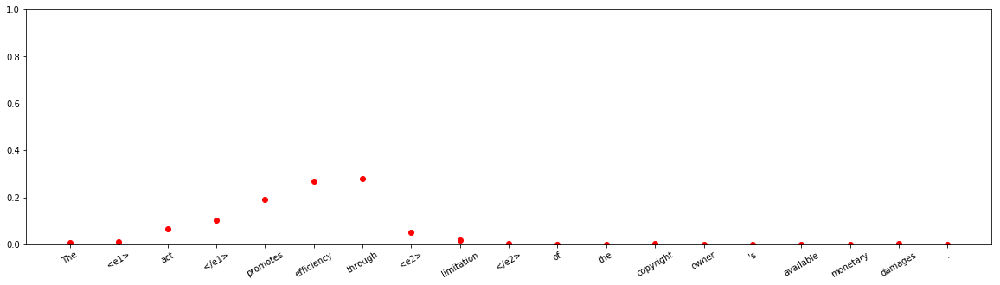







input sentence: The furniture <e1> industry </e1> constitutes of one the most important sectors of the Polish <e2> economy </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Message-Topic(e1,e2)
Other 	:	 0.015354165
Entity-Destination(e1,e2) 	:	 4.666472e-08
Cause-Effect(e2,e1) 	:	 3.4355108e-07
Member-Collection(e2,e1) 	:	 3.231978e-05
Entity-Origin(e1,e2) 	:	 0.0006737438
Message-Topic(e1,e2) 	:	 0.6077444
Component-Whole(e1,e2) 	:	 5.290023e-05
Component-Whole(e2,e1) 	:	 9.526474e-07
Instrument-Agency(e2,e1) 	:	 0.0030140164
Content-Container(e1,e2) 	:	 1.1136052e-05
Product-Producer(e2,e1) 	:	 0.3707005
Cause-Effect(e1,e2) 	:	 0.0019502934
Product-Producer(e1,e2) 	:	 5.3434724e-06
Content-Container(e2,e1) 	:	 3.2560998e-05
Entity-Origin(e2,e1) 	:	 0.00015976132
Message-Topic(e2,e1) 	:	 3.826823e-05
Instrument-Agency(e1,e2) 	:	 9.128388e-05
Member-Collection(e1,e2) 	:	 0.00013804516
Entity-Destination(e2,e1) 	:	 5.0321916e-09



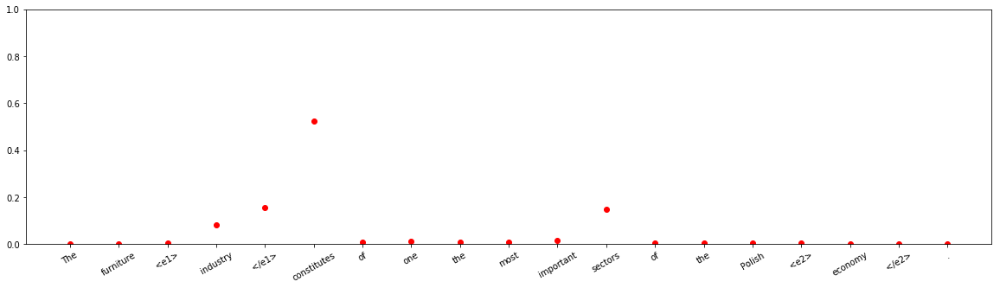


input sentence: At the Volvo Koping factory , seven <e1> robots </e1> make 17 <e2> components </e2> in 30 seconds .
answer label:    Product-Producer(e1,e2)
wrong label:    Product-Producer(e2,e1)
Other 	:	 2.153908e-09
Entity-Destination(e1,e2) 	:	 3.1049195e-12
Cause-Effect(e2,e1) 	:	 6.469918e-14
Member-Collection(e2,e1) 	:	 3.25727e-11
Entity-Origin(e1,e2) 	:	 1.2958903e-10
Message-Topic(e1,e2) 	:	 3.5469305e-12
Component-Whole(e1,e2) 	:	 5.1452935e-12
Component-Whole(e2,e1) 	:	 2.9314204e-08
Instrument-Agency(e2,e1) 	:	 3.9636274e-05
Content-Container(e1,e2) 	:	 1.6693413e-10
Product-Producer(e2,e1) 	:	 0.9999602
Cause-Effect(e1,e2) 	:	 1.1216533e-07
Product-Producer(e1,e2) 	:	 3.9496783e-12
Content-Container(e2,e1) 	:	 1.8665542e-08
Entity-Origin(e2,e1) 	:	 2.8550335e-12
Message-Topic(e2,e1) 	:	 4.782334e-14
Instrument-Agency(e1,e2) 	:	 3.6377803e-09
Member-Collection(e1,e2) 	:	 5.206771e-11
Entity-Destination(e2,e1) 	:	 9.95793e-14



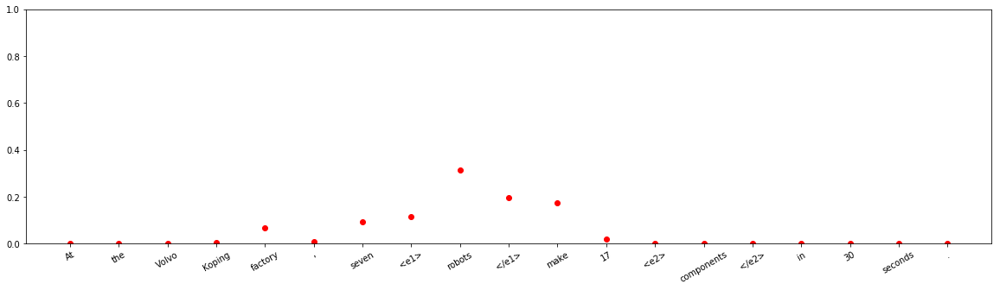






input sentence: Although he initially returns to his wife and children , when they return from <e1> evacuation </e1> after the <e2> war </e2> , Pavel now sees his wife as cloying and bourgeois .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 1.9813056e-11
Entity-Destination(e1,e2) 	:	 3.8466563e-11
Cause-Effect(e2,e1) 	:	 1.0
Member-Collection(e2,e1) 	:	 8.730885e-14
Entity-Origin(e1,e2) 	:	 3.2243646e-12
Message-Topic(e1,e2) 	:	 6.8459373e-17
Component-Whole(e1,e2) 	:	 3.4239078e-13
Component-Whole(e2,e1) 	:	 9.118798e-16
Instrument-Agency(e2,e1) 	:	 1.3458493e-12
Content-Container(e1,e2) 	:	 1.6050623e-17
Product-Producer(e2,e1) 	:	 6.6207463e-17
Cause-Effect(e1,e2) 	:	 4.726728e-13
Product-Producer(e1,e2) 	:	 2.388481e-10
Content-Container(e2,e1) 	:	 2.2030424e-14
Entity-Origin(e2,e1) 	:	 3.1400565e-16
Message-Topic(e2,e1) 	:	 1.3281112e-12
Instrument-Agency(e1,e2) 	:	 1.8411675e-10
Member-Collection(e1,e2) 	:	 4.781032e-13
Entity-Destination(e2,e1) 	:	 3.

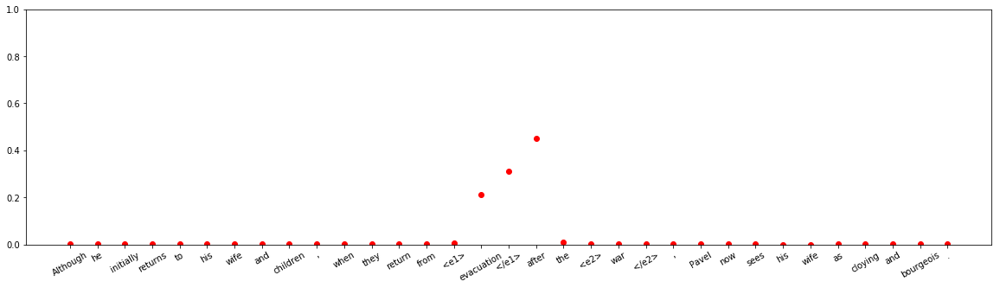











input sentence: The <e1> convention </e1> of splitting tax <e2> bills </e2> is based on the construction of the first paragraph of s 55 that is rejected by the High Court in Permanent Trustee .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 3.3767222e-10
Entity-Destination(e1,e2) 	:	 8.956037e-09
Cause-Effect(e2,e1) 	:	 4.5245257e-12
Member-Collection(e2,e1) 	:	 7.2865216e-05
Entity-Origin(e1,e2) 	:	 5.524173e-07
Message-Topic(e1,e2) 	:	 0.00023099457
Component-Whole(e1,e2) 	:	 5.4127636e-06
Component-Whole(e2,e1) 	:	 0.02647452
Instrument-Agency(e2,e1) 	:	 7.672846e-09
Content-Container(e1,e2) 	:	 4.3797354e-07
Product-Producer(e2,e1) 	:	 0.97317815
Cause-Effect(e1,e2) 	:	 8.420732e-07
Product-Producer(e1,e2) 	:	 5.42528e-08
Content-Container(e2,e1) 	:	 1.8426946e-06
Entity-Origin(e2,e1) 	:	 4.6734417e-08
Message-Topic(e2,e1) 	:	 3.4327666e-05
Instrument-Agency(e1,e2) 	:	 3.3063458e-08
Member-Collection(e1,e2) 	:	 1.0613915e-08
Entity-Destination(e2

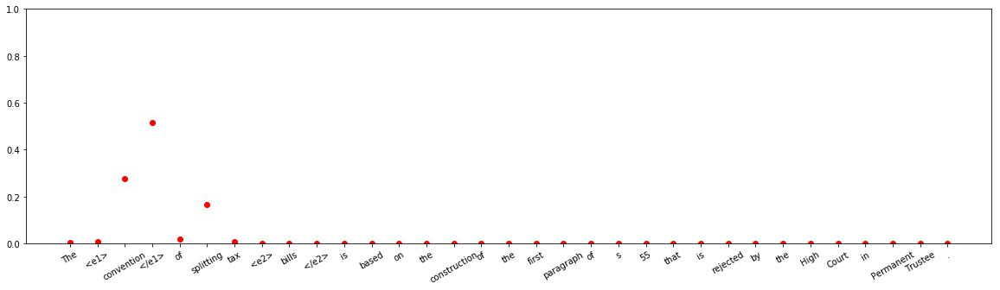




input sentence: This group 0+ baby <e1> car </e1> <e2> seat </e2> fits easily into the car and connects to the Jane Powertwin Pro pushchair ( sold separately ) to make a travel system .
answer label:    Component-Whole(e2,e1)
wrong label:    Content-Container(e1,e2)
Other 	:	 0.0075253304
Entity-Destination(e1,e2) 	:	 0.19100602
Cause-Effect(e2,e1) 	:	 7.8231785e-09
Member-Collection(e2,e1) 	:	 1.7205577e-09
Entity-Origin(e1,e2) 	:	 8.3698105e-05
Message-Topic(e1,e2) 	:	 2.6064e-07
Component-Whole(e1,e2) 	:	 0.00021936027
Component-Whole(e2,e1) 	:	 8.239617e-05
Instrument-Agency(e2,e1) 	:	 0.008894278
Content-Container(e1,e2) 	:	 0.7887848
Product-Producer(e2,e1) 	:	 2.8383769e-05
Cause-Effect(e1,e2) 	:	 1.8039408e-09
Product-Producer(e1,e2) 	:	 5.564914e-07
Content-Container(e2,e1) 	:	 0.00028181772
Entity-Origin(e2,e1) 	:	 4.4522324e-07
Message-Topic(e2,e1) 	:	 7.802271e-09
Instrument-Agency(e1,e2) 	:	 0.003091466
Member-Collection(e1,e2) 	:	 7.5147506e-07
Entity-Destination(e2,e1

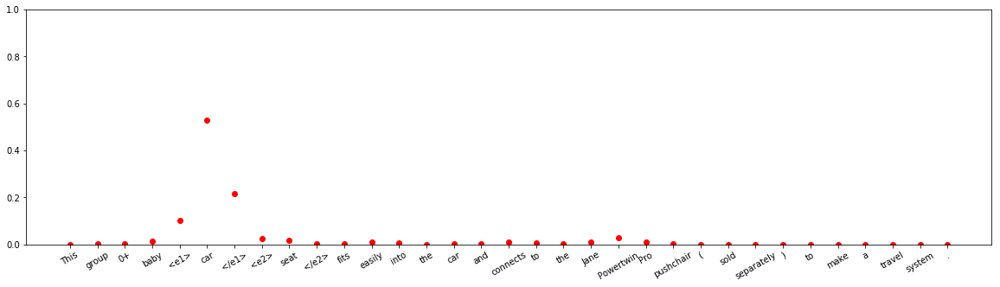


input sentence: Conveyance is any <e1> unit </e1> for <e2> transportation </e2> of explosives or blasting agents , including but not limited to trucks , trailers , rail cars , barges , and vessels .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.020632705
Entity-Destination(e1,e2) 	:	 0.00040829444
Cause-Effect(e2,e1) 	:	 5.1166698e-09
Member-Collection(e2,e1) 	:	 0.00012879586
Entity-Origin(e1,e2) 	:	 3.9833546e-07
Message-Topic(e1,e2) 	:	 3.7842226e-05
Component-Whole(e1,e2) 	:	 1.0782309e-05
Component-Whole(e2,e1) 	:	 2.9582985e-05
Instrument-Agency(e2,e1) 	:	 7.387089e-08
Content-Container(e1,e2) 	:	 2.392088e-06
Product-Producer(e2,e1) 	:	 1.3747233e-06
Cause-Effect(e1,e2) 	:	 3.6635083e-07
Product-Producer(e1,e2) 	:	 8.028205e-08
Content-Container(e2,e1) 	:	 9.7133925e-05
Entity-Origin(e2,e1) 	:	 0.0011926655
Message-Topic(e2,e1) 	:	 3.4782277e-06
Instrument-Agency(e1,e2) 	:	 0.9774474
Member-Collection(e1,e2) 	:	 6.624189e-06
Entity-Destination(e2,e

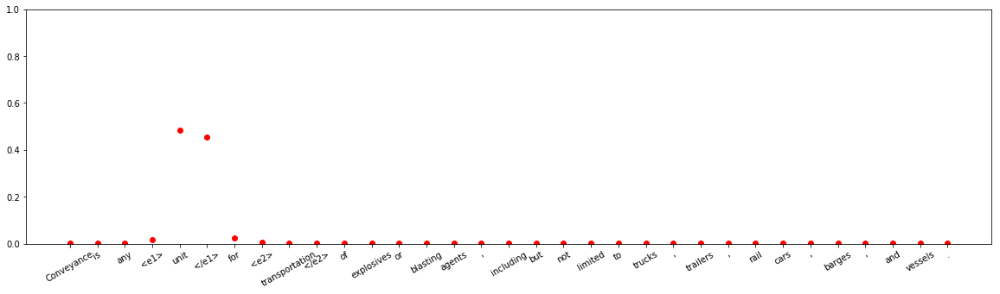


input sentence: The purpose of the <e1> class </e1> was to examine the <e2> therapeutic benefits </e2> of writing and to discern whether writing can be a help or a hinderance in some situations .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9999049
Entity-Destination(e1,e2) 	:	 1.6162746e-11
Cause-Effect(e2,e1) 	:	 1.5368357e-12
Member-Collection(e2,e1) 	:	 1.7526768e-11
Entity-Origin(e1,e2) 	:	 4.6929403e-14
Message-Topic(e1,e2) 	:	 9.495047e-05
Component-Whole(e1,e2) 	:	 1.5805135e-09
Component-Whole(e2,e1) 	:	 1.01197384e-10
Instrument-Agency(e2,e1) 	:	 8.1250034e-11
Content-Container(e1,e2) 	:	 1.8009056e-11
Product-Producer(e2,e1) 	:	 7.561902e-12
Cause-Effect(e1,e2) 	:	 1.6375757e-09
Product-Producer(e1,e2) 	:	 2.5734749e-12
Content-Container(e2,e1) 	:	 4.527804e-11
Entity-Origin(e2,e1) 	:	 1.8372309e-11
Message-Topic(e2,e1) 	:	 1.3928807e-10
Instrument-Agency(e1,e2) 	:	 1.0729053e-07
Member-Collection(e1,e2) 	:	 4.3332695e-11
Entity-Destination(e2,e1)

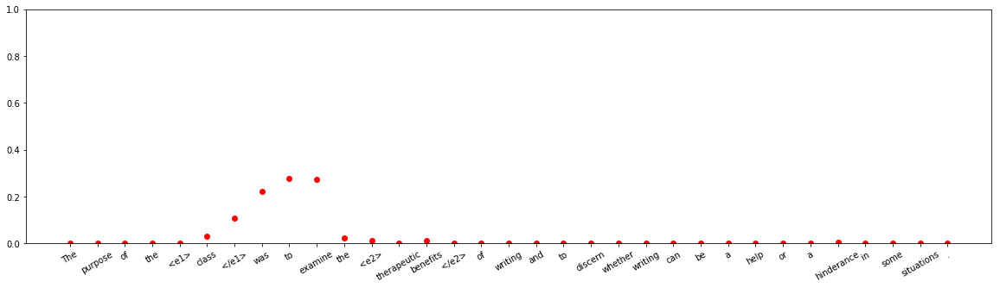




input sentence: Since Sally Industries ' inception , John Wood has been a <e1> key </e1> <e2> member </e2> of the company 's management team and a founding member of the board of directors .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 2.5708549e-09
Entity-Destination(e1,e2) 	:	 8.335104e-12
Cause-Effect(e2,e1) 	:	 2.5978933e-12
Member-Collection(e2,e1) 	:	 0.99863213
Entity-Origin(e1,e2) 	:	 7.6505756e-08
Message-Topic(e1,e2) 	:	 3.1673772e-10
Component-Whole(e1,e2) 	:	 6.624407e-08
Component-Whole(e2,e1) 	:	 2.6151706e-11
Instrument-Agency(e2,e1) 	:	 3.3595386e-16
Content-Container(e1,e2) 	:	 1.12956414e-07
Product-Producer(e2,e1) 	:	 1.14419585e-10
Cause-Effect(e1,e2) 	:	 2.3299648e-10
Product-Producer(e1,e2) 	:	 0.00058767974
Content-Container(e2,e1) 	:	 4.3797183e-08
Entity-Origin(e2,e1) 	:	 1.5135499e-06
Message-Topic(e2,e1) 	:	 3.151428e-09
Instrument-Agency(e1,e2) 	:	 9.622095e-07
Member-Collection(e1,e2) 	:	 0.0007772131
Entity-Destination(e2,e1

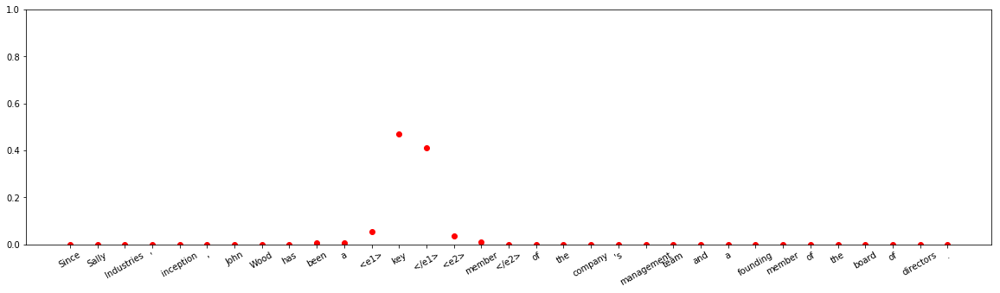



input sentence: The <e1> trail </e1> extended from the Coushatta <e2> village </e2> on the Sabine River through the area of ten present Texas counties and merged with the Atascosito Road in Colorado County .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 1.605613e-05
Entity-Destination(e1,e2) 	:	 2.2783511e-10
Cause-Effect(e2,e1) 	:	 3.345804e-07
Member-Collection(e2,e1) 	:	 3.3432094e-08
Entity-Origin(e1,e2) 	:	 0.9995017
Message-Topic(e1,e2) 	:	 4.7756356e-12
Component-Whole(e1,e2) 	:	 1.6173513e-05
Component-Whole(e2,e1) 	:	 5.1076466e-07
Instrument-Agency(e2,e1) 	:	 1.2660276e-13
Content-Container(e1,e2) 	:	 6.447096e-11
Product-Producer(e2,e1) 	:	 3.3604938e-13
Cause-Effect(e1,e2) 	:	 2.5057989e-14
Product-Producer(e1,e2) 	:	 0.00043990696
Content-Container(e2,e1) 	:	 7.905696e-13
Entity-Origin(e2,e1) 	:	 4.302577e-08
Message-Topic(e2,e1) 	:	 2.3729286e-05
Instrument-Agency(e1,e2) 	:	 9.0797975e-08
Member-Collection(e1,e2) 	:	 1.4682463e-06
Entity-Destinat

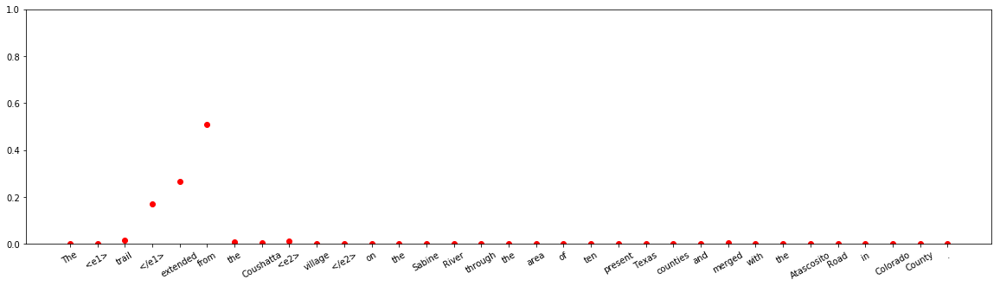






input sentence: The latest <e1> state </e1> of the economy <e2> report </e2> by the Bank of Uganda indicates that overall , export proceeds in the month of October increased by 9.7 per cent .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 1.6246074e-07
Entity-Destination(e1,e2) 	:	 1.720736e-10
Cause-Effect(e2,e1) 	:	 3.3201997e-09
Member-Collection(e2,e1) 	:	 7.5393195e-06
Entity-Origin(e1,e2) 	:	 1.4709836e-07
Message-Topic(e1,e2) 	:	 1.5269896e-07
Component-Whole(e1,e2) 	:	 0.0023812049
Component-Whole(e2,e1) 	:	 1.2739467e-06
Instrument-Agency(e2,e1) 	:	 3.3051947e-08
Content-Container(e1,e2) 	:	 1.8463812e-08
Product-Producer(e2,e1) 	:	 0.0057526357
Cause-Effect(e1,e2) 	:	 3.6741377e-09
Product-Producer(e1,e2) 	:	 1.7024277e-07
Content-Container(e2,e1) 	:	 2.177137e-09
Entity-Origin(e2,e1) 	:	 4.3642012e-10
Message-Topic(e2,e1) 	:	 0.99184716
Instrument-Agency(e1,e2) 	:	 5.149136e-10
Member-Collection(e1,e2) 	:	 9.425507e-06
Entity-Destination(e2,e1) 	:

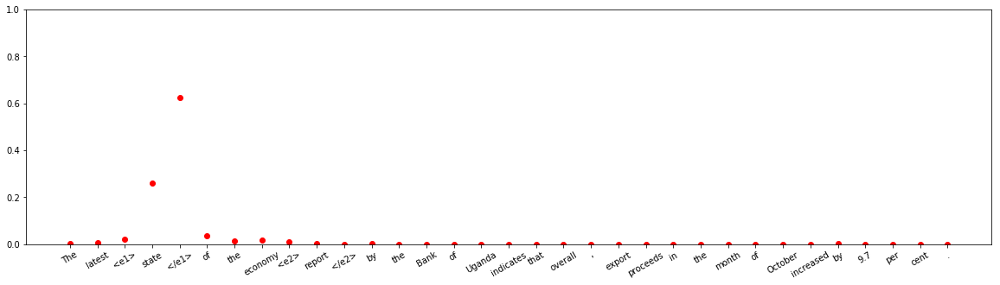



input sentence: The handpiece contains a primary coil and the <e1> sleeve </e1> encloses a secondary <e2> coil </e2> , which are inductively coupled together so that electromagnetic energy can be transferred between them .
answer label:    Component-Whole(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 8.942506e-15
Entity-Destination(e1,e2) 	:	 2.408309e-14
Cause-Effect(e2,e1) 	:	 1.1300066e-12
Member-Collection(e2,e1) 	:	 1.4011138e-12
Entity-Origin(e1,e2) 	:	 1.3171255e-13
Message-Topic(e1,e2) 	:	 1.4557853e-17
Component-Whole(e1,e2) 	:	 2.8344162e-05
Component-Whole(e2,e1) 	:	 0.99997044
Instrument-Agency(e2,e1) 	:	 4.4140085e-13
Content-Container(e1,e2) 	:	 2.64712e-10
Product-Producer(e2,e1) 	:	 1.8070625e-11
Cause-Effect(e1,e2) 	:	 9.141016e-11
Product-Producer(e1,e2) 	:	 3.884492e-14
Content-Container(e2,e1) 	:	 1.1875868e-06
Entity-Origin(e2,e1) 	:	 6.9742677e-15
Message-Topic(e2,e1) 	:	 3.62617e-18
Instrument-Agency(e1,e2) 	:	 8.9316325e-11
Member-Collection(e1,e2) 	

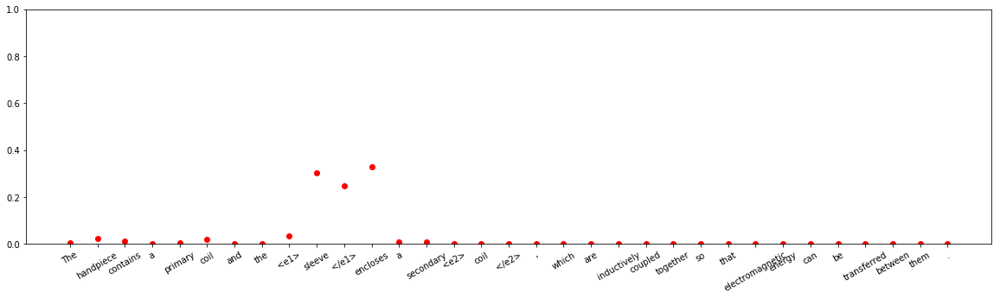



input sentence: In late summer ( July to September ) , the robins disperse and the Culex shift to feeding on humans , again despite the <e1> ubiquity </e1> of house <e2> sparrows </e2> .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.00041411456
Entity-Destination(e1,e2) 	:	 4.2467943e-12
Cause-Effect(e2,e1) 	:	 6.833617e-07
Member-Collection(e2,e1) 	:	 0.9992448
Entity-Origin(e1,e2) 	:	 2.0512896e-09
Message-Topic(e1,e2) 	:	 9.208053e-09
Component-Whole(e1,e2) 	:	 2.911576e-08
Component-Whole(e2,e1) 	:	 2.6388785e-11
Instrument-Agency(e2,e1) 	:	 2.4534233e-10
Content-Container(e1,e2) 	:	 3.593145e-11
Product-Producer(e2,e1) 	:	 3.6198176e-09
Cause-Effect(e1,e2) 	:	 2.4849607e-08
Product-Producer(e1,e2) 	:	 5.394923e-05
Content-Container(e2,e1) 	:	 1.7884458e-10
Entity-Origin(e2,e1) 	:	 3.2222065e-08
Message-Topic(e2,e1) 	:	 0.00025673312
Instrument-Agency(e1,e2) 	:	 1.7678789e-05
Member-Collection(e1,e2) 	:	 1.219744e-05
Entity-Destination(e2,e1) 	:	 3.8

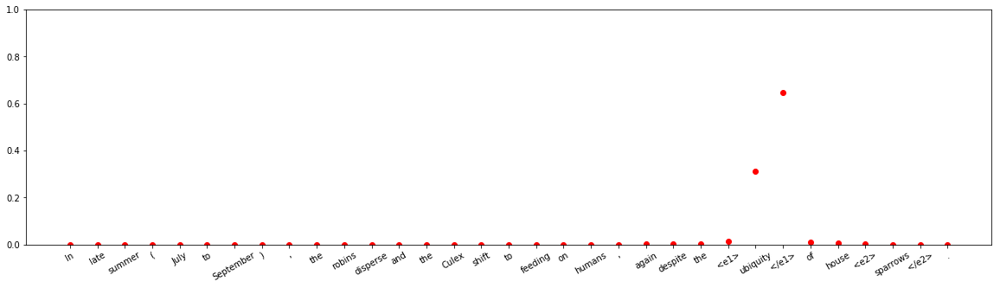


input sentence: <e1> Scientists </e1> responsible for analysing the seizures have given a <e2> warning </e2> that traffickers are turning to hospital X-ray equipment and laboratory supplies as an illicit source of radioactive material .
answer label:    Product-Producer(e2,e1)
wrong label:    Cause-Effect(e1,e2)
Other 	:	 5.900117e-13
Entity-Destination(e1,e2) 	:	 7.3417453e-07
Cause-Effect(e2,e1) 	:	 1.5088007e-06
Member-Collection(e2,e1) 	:	 6.995427e-09
Entity-Origin(e1,e2) 	:	 6.8849006e-12
Message-Topic(e1,e2) 	:	 1.2850685e-09
Component-Whole(e1,e2) 	:	 8.9501204e-13
Component-Whole(e2,e1) 	:	 2.0213388e-12
Instrument-Agency(e2,e1) 	:	 3.5205876e-06
Content-Container(e1,e2) 	:	 1.6326707e-12
Product-Producer(e2,e1) 	:	 0.17244041
Cause-Effect(e1,e2) 	:	 0.82755375
Product-Producer(e1,e2) 	:	 1.07273385e-10
Content-Container(e2,e1) 	:	 3.3788613e-08
Entity-Origin(e2,e1) 	:	 2.9382539e-09
Message-Topic(e2,e1) 	:	 4.8127013e-08
Instrument-Agency(e1,e2) 	:	 6.532713e-10
Member-Colle

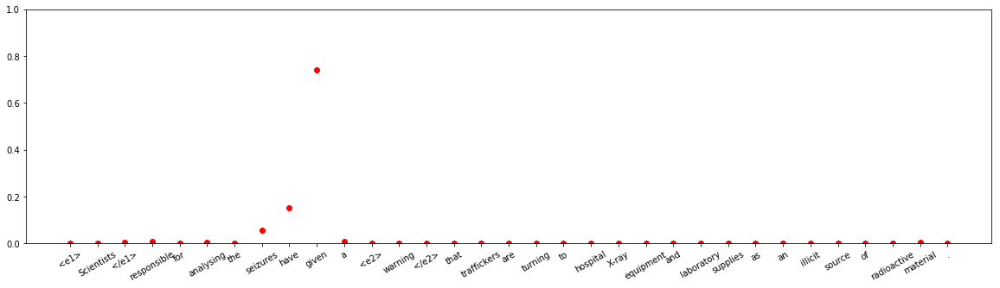





input sentence: I crawled over to the edge of the <e1> building </e1> where there was still a fragment of <e2> wall </e2> and peered over , trying to see what was going on .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.5115004e-06
Entity-Destination(e1,e2) 	:	 6.606729e-08
Cause-Effect(e2,e1) 	:	 1.0769792e-08
Member-Collection(e2,e1) 	:	 0.00097344787
Entity-Origin(e1,e2) 	:	 1.5001848e-05
Message-Topic(e1,e2) 	:	 1.4913591e-07
Component-Whole(e1,e2) 	:	 0.00016749927
Component-Whole(e2,e1) 	:	 0.9981238
Instrument-Agency(e2,e1) 	:	 3.4784355e-06
Content-Container(e1,e2) 	:	 3.8695066e-06
Product-Producer(e2,e1) 	:	 0.00030029402
Cause-Effect(e1,e2) 	:	 3.9450956e-08
Product-Producer(e1,e2) 	:	 4.4303e-07
Content-Container(e2,e1) 	:	 0.0004067935
Entity-Origin(e2,e1) 	:	 7.453422e-08
Message-Topic(e2,e1) 	:	 3.3452968e-06
Instrument-Agency(e1,e2) 	:	 1.6255374e-08
Member-Collection(e1,e2) 	:	 1.2965834e-10
Entity-Destination(e2,e1) 	:	 4.069733e-10



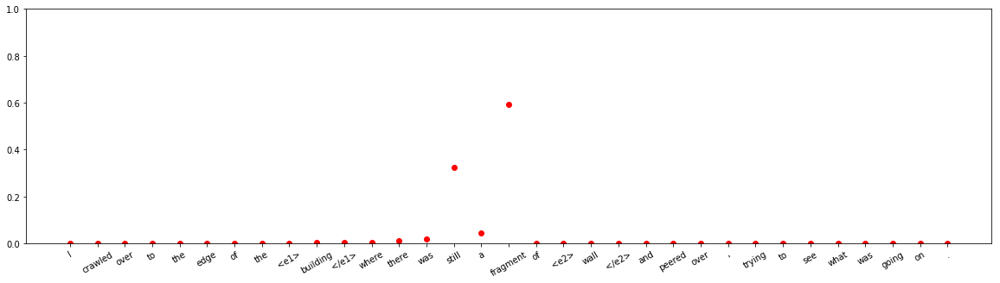




input sentence: Synaesthesia literally means ' <e1> union </e1> of the <e2> senses </e2> ' and is defined as the stimulation of one sensory modality by another ( e.g. , sound by vision ) .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.16112196e-10
Entity-Destination(e1,e2) 	:	 3.2094005e-09
Cause-Effect(e2,e1) 	:	 1.6911614e-05
Member-Collection(e2,e1) 	:	 0.9948356
Entity-Origin(e1,e2) 	:	 4.276482e-07
Message-Topic(e1,e2) 	:	 6.516191e-06
Component-Whole(e1,e2) 	:	 0.0050501274
Component-Whole(e2,e1) 	:	 1.2544036e-06
Instrument-Agency(e2,e1) 	:	 5.561185e-08
Content-Container(e1,e2) 	:	 4.9336034e-12
Product-Producer(e2,e1) 	:	 1.8495369e-08
Cause-Effect(e1,e2) 	:	 1.7356492e-06
Product-Producer(e1,e2) 	:	 6.3493735e-09
Content-Container(e2,e1) 	:	 9.897323e-10
Entity-Origin(e2,e1) 	:	 1.9127705e-11
Message-Topic(e2,e1) 	:	 2.366861e-07
Instrument-Agency(e1,e2) 	:	 2.0358737e-05
Member-Collection(e1,e2) 	:	 6.662647e-05
Entity-Destination(e2,e1) 	:	 

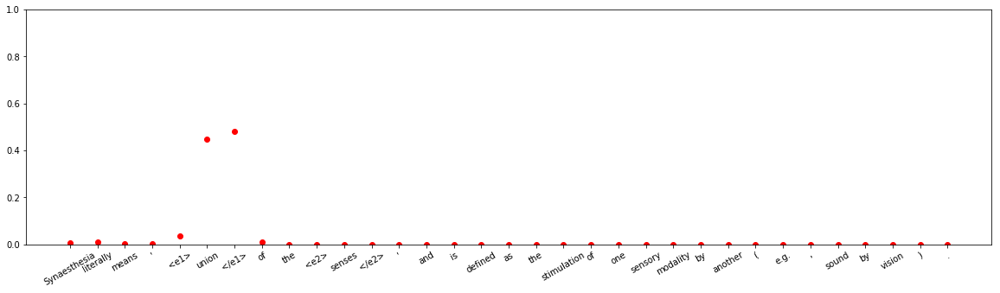






input sentence: The elections to the minority seats are held on separate electorate <e1> basis </e1> consisting of non-Muslim <e2> population </e2> of the country under the same general procedures as those for the Muslim seats and at the same time .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 3.520712e-07
Entity-Destination(e1,e2) 	:	 2.8790377e-16
Cause-Effect(e2,e1) 	:	 6.771957e-11
Member-Collection(e2,e1) 	:	 0.99999213
Entity-Origin(e1,e2) 	:	 6.7936994e-09
Message-Topic(e1,e2) 	:	 6.0703115e-10
Component-Whole(e1,e2) 	:	 5.94038e-06
Component-Whole(e2,e1) 	:	 3.7591807e-08
Instrument-Agency(e2,e1) 	:	 3.0297431e-16
Content-Container(e1,e2) 	:	 1.6627735e-12
Product-Producer(e2,e1) 	:	 1.41224245e-14
Cause-Effect(e1,e2) 	:	 7.651218e-10
Product-Producer(e1,e2) 	:	 6.599342e-08
Content-Container(e2,e1) 	:	 1.2251402e-09
Entity-Origin(e2,e1) 	:	 9.887551e-08
Message-Topic(e2,e1) 	:	 1.0694095e-10
Instrument-Agency(e1,e2) 	:	 4.0758927e-08
Member-Co

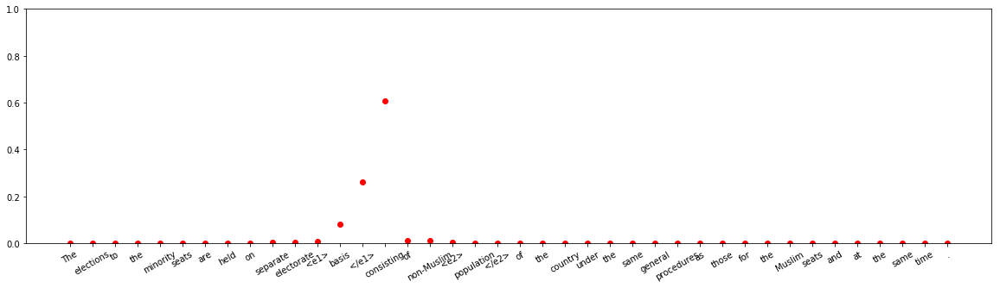


input sentence: Lopez and Espinoza took plea <e1> agreements </e1> that resulted in <e2> diversion </e2> -- the completion of requirements such as community service and a fine during a probation period that ended with a clean slate and no conviction .
answer label:    Cause-Effect(e1,e2)
wrong label:    Other
Other 	:	 0.9848053
Entity-Destination(e1,e2) 	:	 1.9766057e-13
Cause-Effect(e2,e1) 	:	 1.9103457e-08
Member-Collection(e2,e1) 	:	 2.0575437e-11
Entity-Origin(e1,e2) 	:	 7.657747e-15
Message-Topic(e1,e2) 	:	 5.419189e-11
Component-Whole(e1,e2) 	:	 7.383382e-12
Component-Whole(e2,e1) 	:	 3.1744372e-13
Instrument-Agency(e2,e1) 	:	 8.3911315e-11
Content-Container(e1,e2) 	:	 1.5698817e-09
Product-Producer(e2,e1) 	:	 2.7432007e-08
Cause-Effect(e1,e2) 	:	 0.015194727
Product-Producer(e1,e2) 	:	 5.03819e-12
Content-Container(e2,e1) 	:	 2.8394087e-10
Entity-Origin(e2,e1) 	:	 4.0153223e-09
Message-Topic(e2,e1) 	:	 3.3707657e-08
Instrument-Agency(e1,e2) 	:	 9.307585e-12
Member-Collection(e

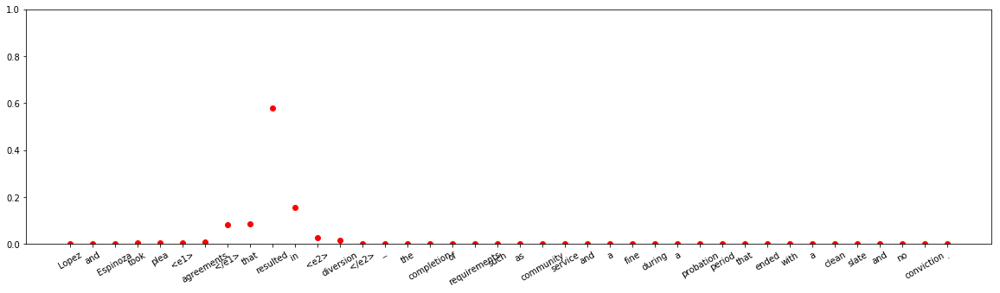





input sentence: The <e1> artwork </e1> and artifacts that make-up this <e2> exhibit </e2> give students the opportunity to physically and personally experience some of the things ( and weight of the things ) that `` grunts '' carried in Vietnam .
answer label:    Component-Whole(e1,e2)
wrong label:    Message-Topic(e1,e2)
Other 	:	 8.069024e-06
Entity-Destination(e1,e2) 	:	 7.589945e-09
Cause-Effect(e2,e1) 	:	 8.85439e-05
Member-Collection(e2,e1) 	:	 3.6054385e-05
Entity-Origin(e1,e2) 	:	 5.6398007e-06
Message-Topic(e1,e2) 	:	 0.6389158
Component-Whole(e1,e2) 	:	 0.19616973
Component-Whole(e2,e1) 	:	 0.00044078074
Instrument-Agency(e2,e1) 	:	 0.14904533
Content-Container(e1,e2) 	:	 6.08108e-06
Product-Producer(e2,e1) 	:	 0.0009174035
Cause-Effect(e1,e2) 	:	 0.00149918
Product-Producer(e1,e2) 	:	 0.0014127694
Content-Container(e2,e1) 	:	 0.00029024496
Entity-Origin(e2,e1) 	:	 3.4172394e-06
Message-Topic(e2,e1) 	:	 0.005402586
Instrument-Agency(e1,e2) 	:	 0.005746818
Member-Collectio

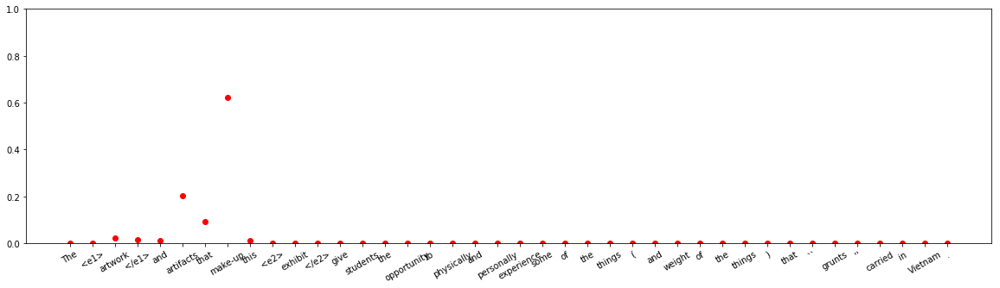












input sentence: Mud-plastered walls , traditional display of art , handicrafts from all parts of the nation and the exclusivity of each theme state every year makes the Surajkund Mela stand apart in the <e1> league </e1> of various <e2> exhibitions </e2> of arts and crafts .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.91126937
Entity-Destination(e1,e2) 	:	 4.773303e-13
Cause-Effect(e2,e1) 	:	 3.9911727e-10
Member-Collection(e2,e1) 	:	 0.039938085
Entity-Origin(e1,e2) 	:	 1.9865098e-09
Message-Topic(e1,e2) 	:	 3.1173504e-06
Component-Whole(e1,e2) 	:	 3.1875578e-07
Component-Whole(e2,e1) 	:	 3.431655e-07
Instrument-Agency(e2,e1) 	:	 1.7303332e-09
Content-Container(e1,e2) 	:	 7.321411e-10
Product-Producer(e2,e1) 	:	 6.8821635e-07
Cause-Effect(e1,e2) 	:	 4.648378e-10
Product-Producer(e1,e2) 	:	 4.5467008e-08
Content-Container(e2,e1) 	:	 5.1935816e-09
Entity-Origin(e2,e1) 	:	 1.0081213e-08
Message-Topic(e2,e1) 	:	 0.048786987
Instrument-Agency(e1,e

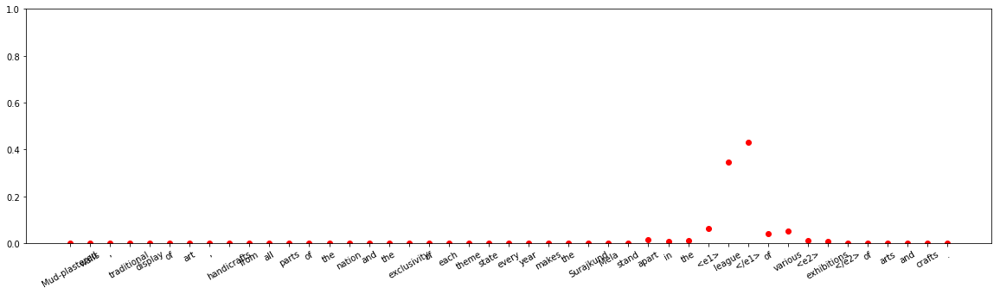



input sentence: The same <e1> effect </e1> is achieved the traditional <e2> way </e2> , with a team of workers like Keebler elves .
answer label:    Cause-Effect(e2,e1)
wrong label:    Other
Other 	:	 0.8546374
Entity-Destination(e1,e2) 	:	 0.0006649536
Cause-Effect(e2,e1) 	:	 4.825911e-05
Member-Collection(e2,e1) 	:	 7.748821e-07
Entity-Origin(e1,e2) 	:	 2.8168165e-07
Message-Topic(e1,e2) 	:	 8.0657024e-05
Component-Whole(e1,e2) 	:	 4.3414684e-06
Component-Whole(e2,e1) 	:	 2.1900223e-05
Instrument-Agency(e2,e1) 	:	 3.0172988e-08
Content-Container(e1,e2) 	:	 3.4067444e-08
Product-Producer(e2,e1) 	:	 0.0005271005
Cause-Effect(e1,e2) 	:	 0.00041806843
Product-Producer(e1,e2) 	:	 0.00043072455
Content-Container(e2,e1) 	:	 5.4877688e-08
Entity-Origin(e2,e1) 	:	 0.00019301749
Message-Topic(e2,e1) 	:	 0.11952289
Instrument-Agency(e1,e2) 	:	 0.023448696
Member-Collection(e1,e2) 	:	 1.3449106e-07
Entity-Destination(e2,e1) 	:	 4.3253158e-07



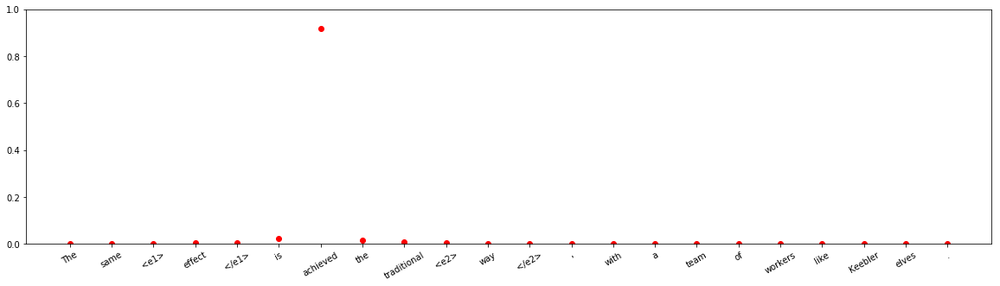






input sentence: The <e1> technique </e1> used for <e2> combination </e2> of information from the different subdetectors was presented during the Tracking-PID-physics meeting .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.00037925525
Entity-Destination(e1,e2) 	:	 7.950674e-11
Cause-Effect(e2,e1) 	:	 8.346913e-08
Member-Collection(e2,e1) 	:	 2.8560066e-11
Entity-Origin(e1,e2) 	:	 4.5922843e-10
Message-Topic(e1,e2) 	:	 1.21409e-07
Component-Whole(e1,e2) 	:	 2.4937453e-06
Component-Whole(e2,e1) 	:	 0.00012444357
Instrument-Agency(e2,e1) 	:	 0.06792857
Content-Container(e1,e2) 	:	 7.714227e-09
Product-Producer(e2,e1) 	:	 6.9554855e-11
Cause-Effect(e1,e2) 	:	 5.0613913e-09
Product-Producer(e1,e2) 	:	 8.0623236e-10
Content-Container(e2,e1) 	:	 6.325639e-08
Entity-Origin(e2,e1) 	:	 5.5236247e-09
Message-Topic(e2,e1) 	:	 7.1882424e-09
Instrument-Agency(e1,e2) 	:	 0.9315649
Member-Collection(e1,e2) 	:	 7.284283e-11
Entity-Destination(e2,e1) 	:	 2.2536159e-10



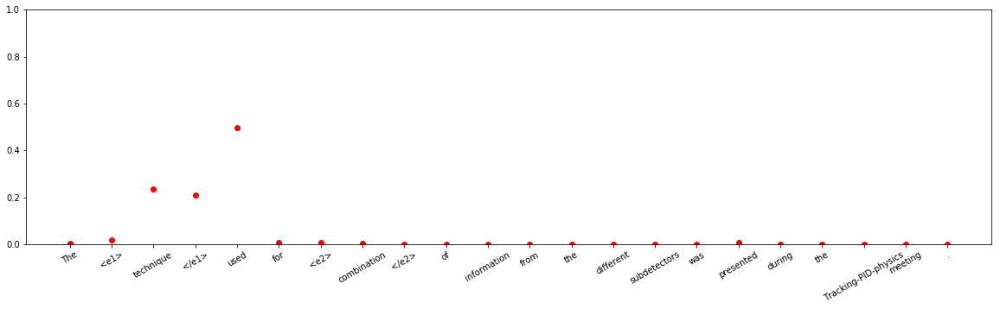


input sentence: We dissolved the <e1> contents </e1> of one packet in a <e2> carafe </e2> of water and ran the brew cycle .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 9.8447146e-11
Entity-Destination(e1,e2) 	:	 1.7464477e-05
Cause-Effect(e2,e1) 	:	 1.2456003e-13
Member-Collection(e2,e1) 	:	 4.312799e-14
Entity-Origin(e1,e2) 	:	 9.243136e-08
Message-Topic(e1,e2) 	:	 2.3057645e-14
Component-Whole(e1,e2) 	:	 3.4668078e-06
Component-Whole(e2,e1) 	:	 1.820523e-11
Instrument-Agency(e2,e1) 	:	 6.862839e-08
Content-Container(e1,e2) 	:	 0.99929905
Product-Producer(e2,e1) 	:	 1.6786295e-11
Cause-Effect(e1,e2) 	:	 1.3195052e-15
Product-Producer(e1,e2) 	:	 7.95537e-12
Content-Container(e2,e1) 	:	 0.0006798207
Entity-Origin(e2,e1) 	:	 1.120357e-09
Message-Topic(e2,e1) 	:	 3.931362e-13
Instrument-Agency(e1,e2) 	:	 1.3191133e-10
Member-Collection(e1,e2) 	:	 8.4058836e-11
Entity-Destination(e2,e1) 	:	 6.530505e-12



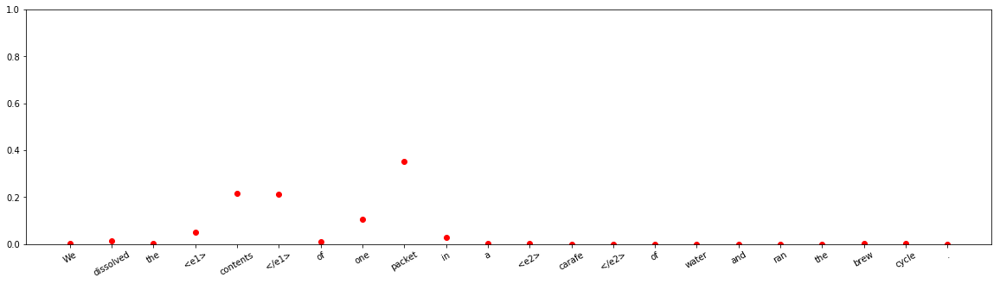


input sentence: A <e1> tableau </e1> like this one is placed inside the king 's <e2> room </e2> and refers to court ceremonies .
answer label:    Content-Container(e1,e2)
wrong label:    Entity-Destination(e1,e2)
Other 	:	 4.4882945e-08
Entity-Destination(e1,e2) 	:	 0.94183743
Cause-Effect(e2,e1) 	:	 1.3928286e-13
Member-Collection(e2,e1) 	:	 7.0552686e-10
Entity-Origin(e1,e2) 	:	 4.8997947e-05
Message-Topic(e1,e2) 	:	 2.6934777e-09
Component-Whole(e1,e2) 	:	 0.00012672103
Component-Whole(e2,e1) 	:	 2.3549082e-10
Instrument-Agency(e2,e1) 	:	 9.826483e-10
Content-Container(e1,e2) 	:	 0.0579703
Product-Producer(e2,e1) 	:	 5.0355733e-09
Cause-Effect(e1,e2) 	:	 3.4008935e-14
Product-Producer(e1,e2) 	:	 1.0899215e-08
Content-Container(e2,e1) 	:	 1.0780288e-05
Entity-Origin(e2,e1) 	:	 8.756979e-09
Message-Topic(e2,e1) 	:	 2.8731026e-10
Instrument-Agency(e1,e2) 	:	 6.3932887e-10
Member-Collection(e1,e2) 	:	 5.7699367e-06
Entity-Destination(e2,e1) 	:	 3.385581e-10



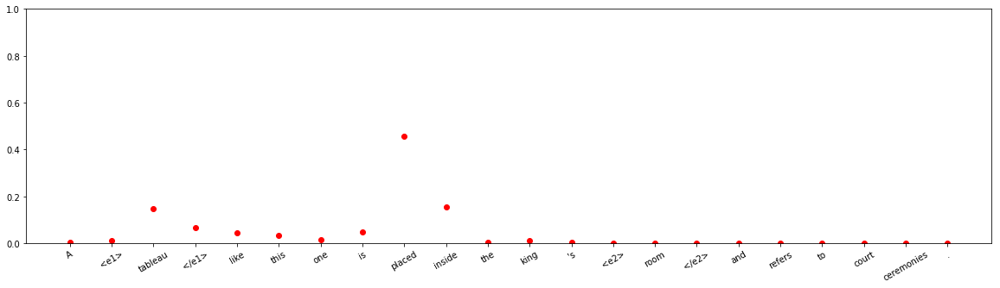




input sentence: <e1> Bone </e1> is built up of many <e2> cell </e2> types and so far we have only investigated human osteoblasts .
answer label:    Component-Whole(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.34612614
Entity-Destination(e1,e2) 	:	 1.0244716e-07
Cause-Effect(e2,e1) 	:	 4.82805e-08
Member-Collection(e2,e1) 	:	 0.0015917654
Entity-Origin(e1,e2) 	:	 6.5624015e-05
Message-Topic(e1,e2) 	:	 0.00040677245
Component-Whole(e1,e2) 	:	 2.0827374e-05
Component-Whole(e2,e1) 	:	 0.031162804
Instrument-Agency(e2,e1) 	:	 5.2188087e-10
Content-Container(e1,e2) 	:	 4.6859914e-06
Product-Producer(e2,e1) 	:	 0.6180636
Cause-Effect(e1,e2) 	:	 0.00048307085
Product-Producer(e1,e2) 	:	 8.871912e-05
Content-Container(e2,e1) 	:	 0.00033194482
Entity-Origin(e2,e1) 	:	 4.2211024e-05
Message-Topic(e2,e1) 	:	 0.0015632365
Instrument-Agency(e1,e2) 	:	 4.8437472e-05
Member-Collection(e1,e2) 	:	 1.2673696e-07
Entity-Destination(e2,e1) 	:	 2.9051046e-09



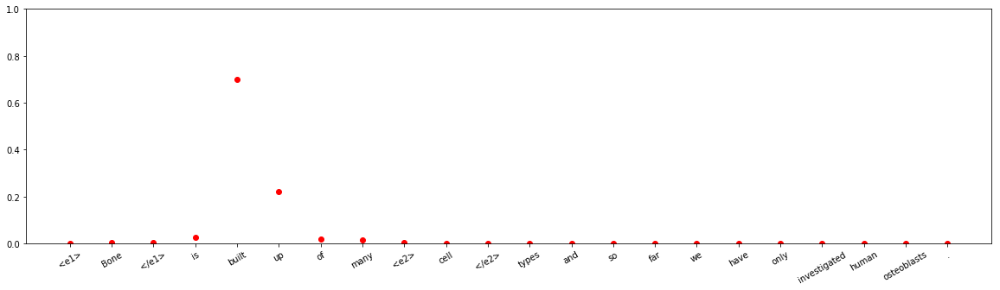






input sentence: The <e1> text </e1> handles all of this <e2> material </e2> well , integrating it into the flow of the argument .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.35543832
Entity-Destination(e1,e2) 	:	 8.12234e-09
Cause-Effect(e2,e1) 	:	 1.6161514e-09
Member-Collection(e2,e1) 	:	 5.3681676e-10
Entity-Origin(e1,e2) 	:	 5.99208e-08
Message-Topic(e1,e2) 	:	 0.0027254738
Component-Whole(e1,e2) 	:	 0.5964007
Component-Whole(e2,e1) 	:	 0.0006445059
Instrument-Agency(e2,e1) 	:	 0.00014157173
Content-Container(e1,e2) 	:	 3.6426412e-05
Product-Producer(e2,e1) 	:	 1.1024623e-07
Cause-Effect(e1,e2) 	:	 7.7128455e-09
Product-Producer(e1,e2) 	:	 8.079386e-09
Content-Container(e2,e1) 	:	 0.0434852
Entity-Origin(e2,e1) 	:	 3.0348855e-07
Message-Topic(e2,e1) 	:	 4.539513e-09
Instrument-Agency(e1,e2) 	:	 0.0011274405
Member-Collection(e1,e2) 	:	 3.4028595e-08
Entity-Destination(e2,e1) 	:	 1.0488158e-08



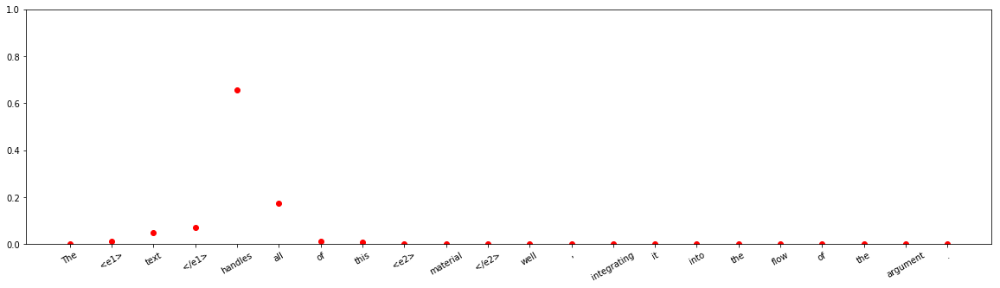


input sentence: There is a curb between the sidewalk and the shared bus and bike <e1> lane </e1> on the <e2> road </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.99997747
Entity-Destination(e1,e2) 	:	 5.3485882e-11
Cause-Effect(e2,e1) 	:	 2.2391783e-11
Member-Collection(e2,e1) 	:	 2.6523908e-13
Entity-Origin(e1,e2) 	:	 7.79748e-12
Message-Topic(e1,e2) 	:	 4.6314869e-10
Component-Whole(e1,e2) 	:	 2.2392984e-05
Component-Whole(e2,e1) 	:	 4.2956483e-10
Instrument-Agency(e2,e1) 	:	 2.7042288e-10
Content-Container(e1,e2) 	:	 5.2581894e-11
Product-Producer(e2,e1) 	:	 1.821315e-14
Cause-Effect(e1,e2) 	:	 7.2163257e-14
Product-Producer(e1,e2) 	:	 1.6807168e-12
Content-Container(e2,e1) 	:	 1.3265572e-12
Entity-Origin(e2,e1) 	:	 4.511387e-13
Message-Topic(e2,e1) 	:	 6.730399e-10
Instrument-Agency(e1,e2) 	:	 9.5608186e-08
Member-Collection(e1,e2) 	:	 3.99233e-11
Entity-Destination(e2,e1) 	:	 1.3240457e-14



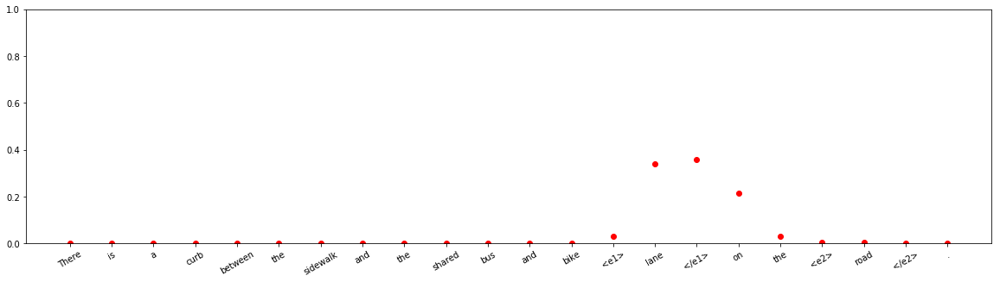




input sentence: It is used by the <e1> grasshoppers </e1> to force a <e2> burrow </e2> in the earth to receive the eggs .
answer label:    Product-Producer(e2,e1)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.32593066
Entity-Destination(e1,e2) 	:	 0.00041598125
Cause-Effect(e2,e1) 	:	 2.5854096e-08
Member-Collection(e2,e1) 	:	 1.5985259e-07
Entity-Origin(e1,e2) 	:	 7.1613813e-06
Message-Topic(e1,e2) 	:	 4.5365136e-06
Component-Whole(e1,e2) 	:	 0.06104597
Component-Whole(e2,e1) 	:	 7.118243e-05
Instrument-Agency(e2,e1) 	:	 0.011271564
Content-Container(e1,e2) 	:	 0.00016031665
Product-Producer(e2,e1) 	:	 0.04847491
Cause-Effect(e1,e2) 	:	 1.7685406e-06
Product-Producer(e1,e2) 	:	 0.00012937935
Content-Container(e2,e1) 	:	 9.066917e-06
Entity-Origin(e2,e1) 	:	 3.5687365e-06
Message-Topic(e2,e1) 	:	 1.8064704e-08
Instrument-Agency(e1,e2) 	:	 0.55238825
Member-Collection(e1,e2) 	:	 8.547546e-05
Entity-Destination(e2,e1) 	:	 8.363998e-09



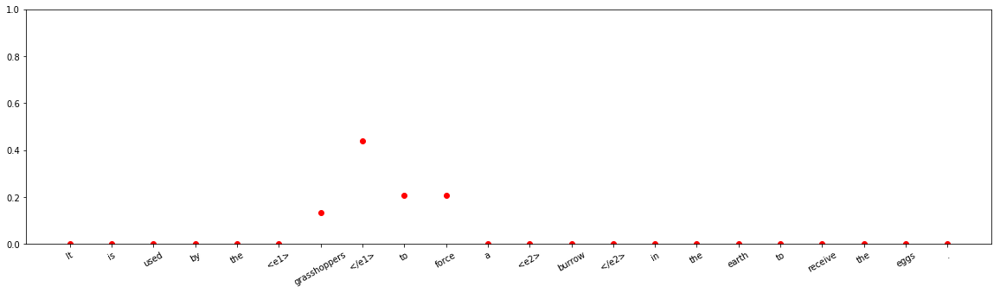





input sentence: Paul Bunyan 's parents took the <e1> boy </e1> and put him in a <e2> cradle </e2> out in the ocean .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 0.15898432
Entity-Destination(e1,e2) 	:	 0.22863808
Cause-Effect(e2,e1) 	:	 9.537993e-10
Member-Collection(e2,e1) 	:	 1.1691242e-11
Entity-Origin(e1,e2) 	:	 1.892744e-05
Message-Topic(e1,e2) 	:	 4.3433597e-11
Component-Whole(e1,e2) 	:	 9.1636673e-07
Component-Whole(e2,e1) 	:	 1.0879871e-10
Instrument-Agency(e2,e1) 	:	 0.20462915
Content-Container(e1,e2) 	:	 0.37478158
Product-Producer(e2,e1) 	:	 0.030988704
Cause-Effect(e1,e2) 	:	 4.2308664e-11
Product-Producer(e1,e2) 	:	 2.4159815e-08
Content-Container(e2,e1) 	:	 3.221063e-07
Entity-Origin(e2,e1) 	:	 1.6742022e-10
Message-Topic(e2,e1) 	:	 7.871408e-08
Instrument-Agency(e1,e2) 	:	 1.6392903e-08
Member-Collection(e1,e2) 	:	 0.001957805
Entity-Destination(e2,e1) 	:	 2.1413709e-09



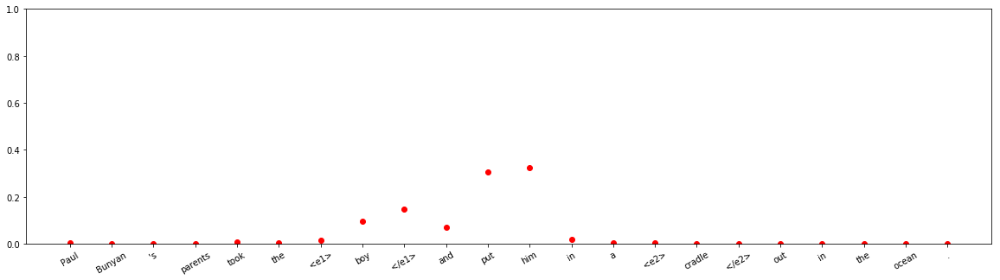








input sentence: The <e1> film </e1> departed from typical documentary <e2> fare </e2> by emphasizing the commentaries of Thompson 's friends and peers .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.4681454e-19
Entity-Destination(e1,e2) 	:	 6.010584e-15
Cause-Effect(e2,e1) 	:	 8.972166e-13
Member-Collection(e2,e1) 	:	 1.3385436e-11
Entity-Origin(e1,e2) 	:	 1.0
Message-Topic(e1,e2) 	:	 3.1432884e-11
Component-Whole(e1,e2) 	:	 9.425144e-16
Component-Whole(e2,e1) 	:	 3.0668173e-14
Instrument-Agency(e2,e1) 	:	 1.9002526e-15
Content-Container(e1,e2) 	:	 3.4757906e-13
Product-Producer(e2,e1) 	:	 2.6580495e-11
Cause-Effect(e1,e2) 	:	 7.621857e-17
Product-Producer(e1,e2) 	:	 1.6466027e-08
Content-Container(e2,e1) 	:	 1.8510855e-15
Entity-Origin(e2,e1) 	:	 2.2882406e-12
Message-Topic(e2,e1) 	:	 3.0126096e-10
Instrument-Agency(e1,e2) 	:	 1.1136375e-15
Member-Collection(e1,e2) 	:	 7.7546025e-11
Entity-Destination(e2,e1) 	:	 7.163269e-17



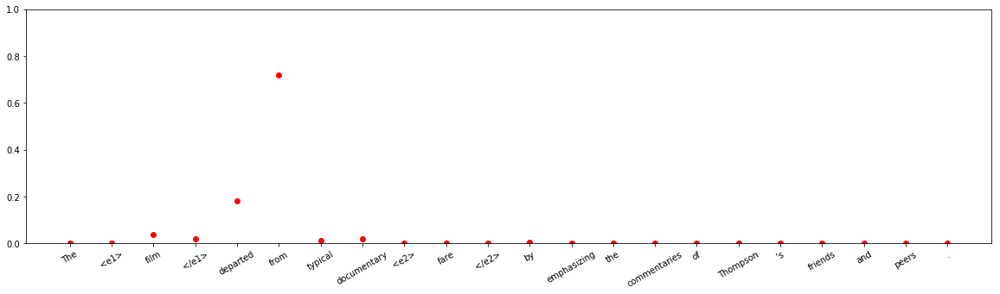


input sentence: A more spare , less robust use of classical <e1> motifs </e1> is evident in a <e2> ewer </e2> of 1784-85 .
answer label:    Component-Whole(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 0.1903006
Entity-Destination(e1,e2) 	:	 3.4183497e-08
Cause-Effect(e2,e1) 	:	 3.9753758e-07
Member-Collection(e2,e1) 	:	 8.518701e-10
Entity-Origin(e1,e2) 	:	 0.0001732785
Message-Topic(e1,e2) 	:	 0.0008024559
Component-Whole(e1,e2) 	:	 0.0061086975
Component-Whole(e2,e1) 	:	 1.603898e-05
Instrument-Agency(e2,e1) 	:	 5.315452e-07
Content-Container(e1,e2) 	:	 0.5316077
Product-Producer(e2,e1) 	:	 5.0509117e-09
Cause-Effect(e1,e2) 	:	 1.9082395e-07
Product-Producer(e1,e2) 	:	 2.2603728e-05
Content-Container(e2,e1) 	:	 2.464466e-08
Entity-Origin(e2,e1) 	:	 1.5222926e-07
Message-Topic(e2,e1) 	:	 0.2709653
Instrument-Agency(e1,e2) 	:	 2.3072597e-07
Member-Collection(e1,e2) 	:	 1.6891681e-06
Entity-Destination(e2,e1) 	:	 1.1702663e-07



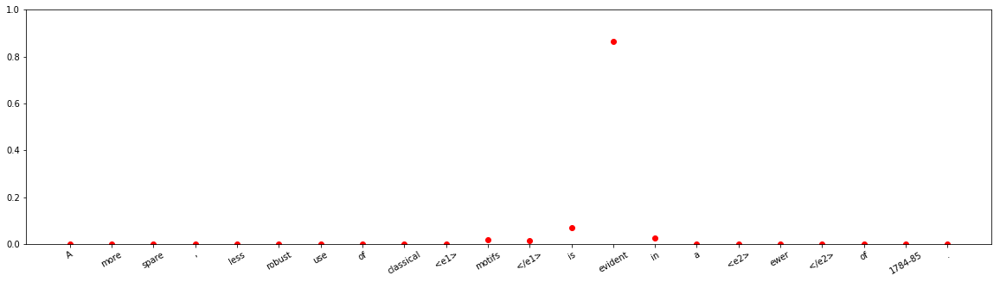


input sentence: General contract law issues are examined , as is the <e1> law </e1> covering the <e2> registration </e2> of hotel guests .
answer label:    Message-Topic(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.0374349e-06
Entity-Destination(e1,e2) 	:	 4.798956e-09
Cause-Effect(e2,e1) 	:	 1.3347402e-10
Member-Collection(e2,e1) 	:	 1.1500707e-08
Entity-Origin(e1,e2) 	:	 1.7311922e-12
Message-Topic(e1,e2) 	:	 0.22361259
Component-Whole(e1,e2) 	:	 0.7763564
Component-Whole(e2,e1) 	:	 2.1462241e-05
Instrument-Agency(e2,e1) 	:	 1.22619985e-08
Content-Container(e1,e2) 	:	 2.4531435e-09
Product-Producer(e2,e1) 	:	 9.099171e-07
Cause-Effect(e1,e2) 	:	 2.2126848e-07
Product-Producer(e1,e2) 	:	 1.00651905e-08
Content-Container(e2,e1) 	:	 1.139683e-06
Entity-Origin(e2,e1) 	:	 2.0439889e-10
Message-Topic(e2,e1) 	:	 4.3782924e-07
Instrument-Agency(e1,e2) 	:	 5.759728e-06
Member-Collection(e1,e2) 	:	 4.733214e-09
Entity-Destination(e2,e1) 	:	 7.3909195e-10



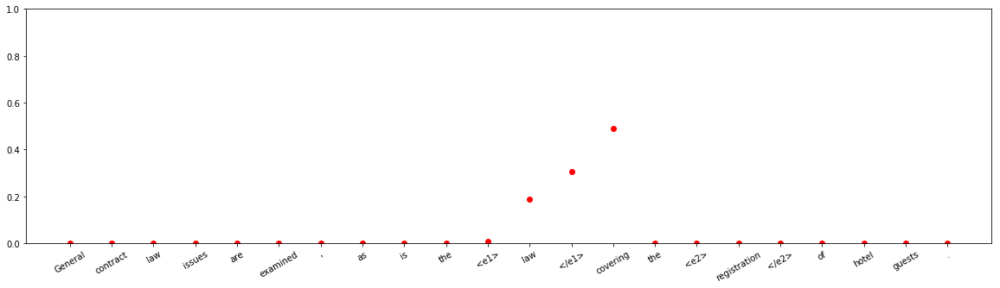








input sentence: The target of those <e1> activities </e1> is <e2> development </e2> of meta-information systems , which enables record metadata of geodata .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 0.26984343
Entity-Destination(e1,e2) 	:	 4.4371986e-06
Cause-Effect(e2,e1) 	:	 0.0010886887
Member-Collection(e2,e1) 	:	 0.00064469984
Entity-Origin(e1,e2) 	:	 3.4212084e-09
Message-Topic(e1,e2) 	:	 0.24817842
Component-Whole(e1,e2) 	:	 0.0050384607
Component-Whole(e2,e1) 	:	 0.028248392
Instrument-Agency(e2,e1) 	:	 1.0195693e-06
Content-Container(e1,e2) 	:	 1.7578748e-06
Product-Producer(e2,e1) 	:	 2.8832428e-06
Cause-Effect(e1,e2) 	:	 0.16929182
Product-Producer(e1,e2) 	:	 6.3916654e-05
Content-Container(e2,e1) 	:	 0.00014006958
Entity-Origin(e2,e1) 	:	 0.00075535325
Message-Topic(e2,e1) 	:	 0.0068152347
Instrument-Agency(e1,e2) 	:	 0.2698688
Member-Collection(e1,e2) 	:	 3.6142799e-06
Entity-Destination(e2,e1) 	:	 8.9759615e-06



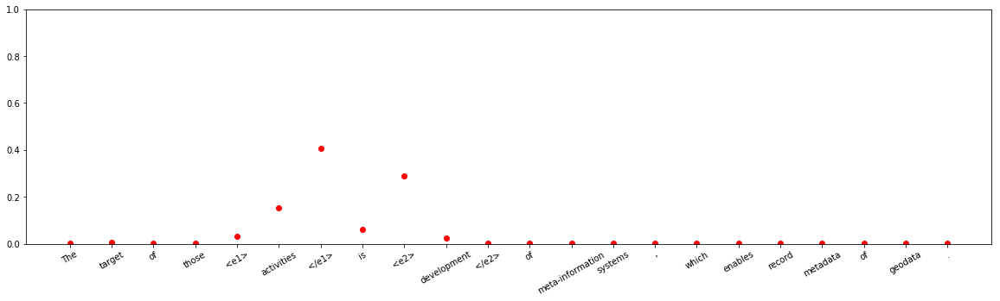





input sentence: The seven <e1> chains </e1> have given away a total of 5.6 billion single-use <e2> bags </e2> in the past year .
answer label:    Entity-Origin(e2,e1)
wrong label:    Content-Container(e1,e2)
Other 	:	 0.00089979626
Entity-Destination(e1,e2) 	:	 2.7266982e-05
Cause-Effect(e2,e1) 	:	 9.973131e-13
Member-Collection(e2,e1) 	:	 3.640756e-12
Entity-Origin(e1,e2) 	:	 1.8670099e-06
Message-Topic(e1,e2) 	:	 2.8396233e-12
Component-Whole(e1,e2) 	:	 5.780223e-06
Component-Whole(e2,e1) 	:	 3.3990386e-08
Instrument-Agency(e2,e1) 	:	 5.913114e-07
Content-Container(e1,e2) 	:	 0.99746007
Product-Producer(e2,e1) 	:	 1.4375748e-05
Cause-Effect(e1,e2) 	:	 2.2306303e-10
Product-Producer(e1,e2) 	:	 8.713334e-09
Content-Container(e2,e1) 	:	 0.001590061
Entity-Origin(e2,e1) 	:	 2.2463391e-07
Message-Topic(e2,e1) 	:	 3.3949743e-09
Instrument-Agency(e1,e2) 	:	 5.7681245e-08
Member-Collection(e1,e2) 	:	 1.821203e-09
Entity-Destination(e2,e1) 	:	 6.2909206e-10



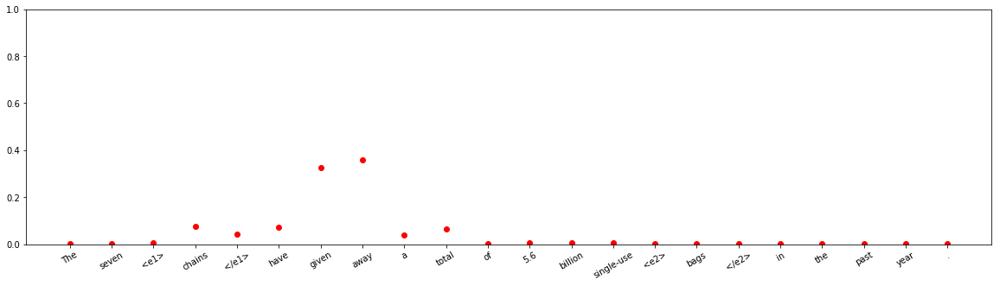




input sentence: He then maps the development of Anglo-American <e1> formalism </e1> from Modernist <e2> literature </e2> to the American and British academies .
answer label:    Entity-Origin(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 0.0035014318
Entity-Destination(e1,e2) 	:	 1.119369e-11
Cause-Effect(e2,e1) 	:	 1.1580003e-08
Member-Collection(e2,e1) 	:	 1.2731742e-07
Entity-Origin(e1,e2) 	:	 0.017963726
Message-Topic(e1,e2) 	:	 1.1449446e-10
Component-Whole(e1,e2) 	:	 2.512516e-05
Component-Whole(e2,e1) 	:	 1.6607373e-08
Instrument-Agency(e2,e1) 	:	 2.6103314e-11
Content-Container(e1,e2) 	:	 1.0546226e-08
Product-Producer(e2,e1) 	:	 5.1315606e-06
Cause-Effect(e1,e2) 	:	 2.3367383e-14
Product-Producer(e1,e2) 	:	 0.00038689608
Content-Container(e2,e1) 	:	 2.171704e-10
Entity-Origin(e2,e1) 	:	 1.0550965e-06
Message-Topic(e2,e1) 	:	 0.9781165
Instrument-Agency(e1,e2) 	:	 3.738229e-11
Member-Collection(e1,e2) 	:	 2.0975877e-08
Entity-Destination(e2,e1) 	:	 2.4524394e-09



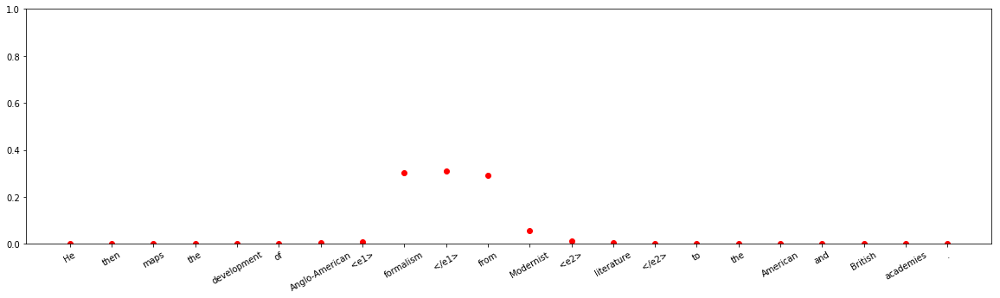









input sentence: <e1> Science </e1> is part of our daily <e2> lives </e2> : all day , every day , everywhere we go .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 4.422354e-08
Entity-Destination(e1,e2) 	:	 1.1775925e-06
Cause-Effect(e2,e1) 	:	 6.126349e-10
Member-Collection(e2,e1) 	:	 3.2122713e-07
Entity-Origin(e1,e2) 	:	 4.5363668e-05
Message-Topic(e1,e2) 	:	 1.2170129e-10
Component-Whole(e1,e2) 	:	 0.96270466
Component-Whole(e2,e1) 	:	 1.0356029e-11
Instrument-Agency(e2,e1) 	:	 1.4490076e-12
Content-Container(e1,e2) 	:	 5.1679856e-09
Product-Producer(e2,e1) 	:	 2.145093e-11
Cause-Effect(e1,e2) 	:	 2.8384532e-12
Product-Producer(e1,e2) 	:	 1.3352323e-08
Content-Container(e2,e1) 	:	 4.9009925e-09
Entity-Origin(e2,e1) 	:	 3.237845e-09
Message-Topic(e2,e1) 	:	 1.7257377e-09
Instrument-Agency(e1,e2) 	:	 1.353165e-06
Member-Collection(e1,e2) 	:	 0.03724696
Entity-Destination(e2,e1) 	:	 7.827257e-12



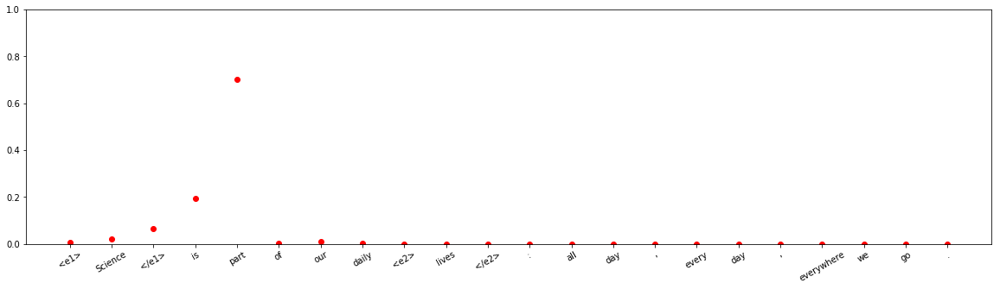






input sentence: The Earth 's <e1> surface </e1> is divided into huge , thick <e2> plates </e2> that drift atop the soft mantle .
answer label:    Component-Whole(e2,e1)
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.35115677
Entity-Destination(e1,e2) 	:	 5.977369e-06
Cause-Effect(e2,e1) 	:	 9.508545e-10
Member-Collection(e2,e1) 	:	 3.203754e-06
Entity-Origin(e1,e2) 	:	 1.970066e-07
Message-Topic(e1,e2) 	:	 8.348864e-09
Component-Whole(e1,e2) 	:	 0.53005904
Component-Whole(e2,e1) 	:	 0.030522546
Instrument-Agency(e2,e1) 	:	 7.0447136e-08
Content-Container(e1,e2) 	:	 2.1331276e-05
Product-Producer(e2,e1) 	:	 0.0012141811
Cause-Effect(e1,e2) 	:	 9.4628895e-06
Product-Producer(e1,e2) 	:	 5.8860985e-07
Content-Container(e2,e1) 	:	 0.08684171
Entity-Origin(e2,e1) 	:	 0.00015861866
Message-Topic(e2,e1) 	:	 1.7191433e-09
Instrument-Agency(e1,e2) 	:	 6.0882553e-06
Member-Collection(e1,e2) 	:	 1.3440194e-07
Entity-Destination(e2,e1) 	:	 1.5295846e-07



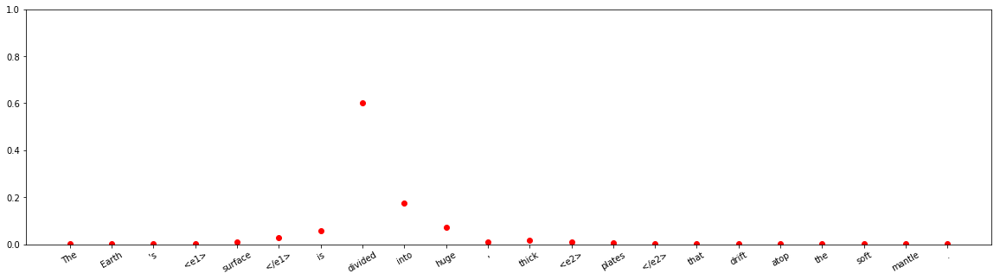


input sentence: A <e1> man </e1> relaxes with higher levels of <e2> testosterone </e2> , and a woman relaxes by secretion of oxytocin .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 1.8971326e-05
Entity-Destination(e1,e2) 	:	 4.5722634e-10
Cause-Effect(e2,e1) 	:	 0.0038302108
Member-Collection(e2,e1) 	:	 0.000110103116
Entity-Origin(e1,e2) 	:	 4.1461297e-07
Message-Topic(e1,e2) 	:	 2.4106832e-09
Component-Whole(e1,e2) 	:	 2.0459264e-07
Component-Whole(e2,e1) 	:	 5.6057286e-07
Instrument-Agency(e2,e1) 	:	 0.5237932
Content-Container(e1,e2) 	:	 2.6700038e-08
Product-Producer(e2,e1) 	:	 0.003295127
Cause-Effect(e1,e2) 	:	 0.46891797
Product-Producer(e1,e2) 	:	 7.610337e-09
Content-Container(e2,e1) 	:	 1.6036549e-05
Entity-Origin(e2,e1) 	:	 6.054781e-08
Message-Topic(e2,e1) 	:	 1.4300248e-05
Instrument-Agency(e1,e2) 	:	 2.989445e-07
Member-Collection(e1,e2) 	:	 2.514708e-06
Entity-Destination(e2,e1) 	:	 6.007216e-10



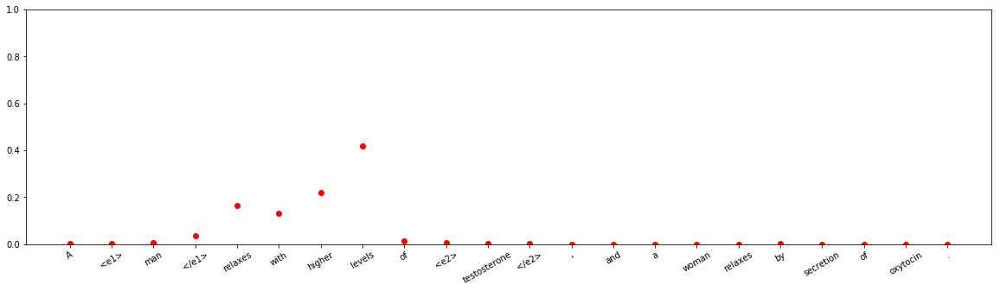





input sentence: As a strategic move , the <e1> researcher </e1> started the school with a third-year <e2> programme </e2> with mature students .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 5.681719e-10
Entity-Destination(e1,e2) 	:	 4.5806555e-13
Cause-Effect(e2,e1) 	:	 5.219525e-12
Member-Collection(e2,e1) 	:	 8.008089e-11
Entity-Origin(e1,e2) 	:	 1.3693611e-06
Message-Topic(e1,e2) 	:	 4.1711036e-15
Component-Whole(e1,e2) 	:	 1.5162338e-11
Component-Whole(e2,e1) 	:	 2.438971e-07
Instrument-Agency(e2,e1) 	:	 0.03246065
Content-Container(e1,e2) 	:	 2.4448996e-09
Product-Producer(e2,e1) 	:	 0.9675377
Cause-Effect(e1,e2) 	:	 2.3174316e-12
Product-Producer(e1,e2) 	:	 9.5033675e-11
Content-Container(e2,e1) 	:	 2.039302e-09
Entity-Origin(e2,e1) 	:	 3.6862556e-15
Message-Topic(e2,e1) 	:	 4.128226e-09
Instrument-Agency(e1,e2) 	:	 3.5720926e-11
Member-Collection(e1,e2) 	:	 1.8402732e-09
Entity-Destination(e2,e1) 	:	 6.8951165e-14



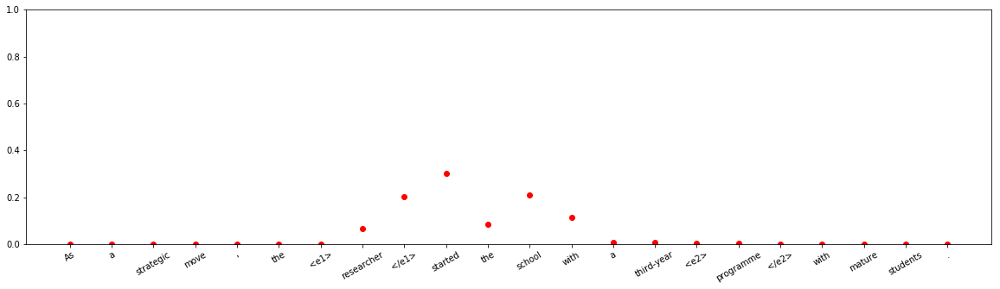




input sentence: The <e1> paddle </e1> , called a dasher , fits inside a <e2> canister </e2> that holds the ice cream mixture .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 1.0650624e-06
Entity-Destination(e1,e2) 	:	 2.3701189e-08
Cause-Effect(e2,e1) 	:	 6.0816066e-13
Member-Collection(e2,e1) 	:	 3.7021696e-14
Entity-Origin(e1,e2) 	:	 2.594023e-10
Message-Topic(e1,e2) 	:	 4.7321543e-12
Component-Whole(e1,e2) 	:	 0.0022204258
Component-Whole(e2,e1) 	:	 5.906485e-08
Instrument-Agency(e2,e1) 	:	 1.2753164e-09
Content-Container(e1,e2) 	:	 0.99777526
Product-Producer(e2,e1) 	:	 8.757455e-11
Cause-Effect(e1,e2) 	:	 4.0645184e-14
Product-Producer(e1,e2) 	:	 4.0257644e-10
Content-Container(e2,e1) 	:	 3.132262e-06
Entity-Origin(e2,e1) 	:	 3.3279117e-12
Message-Topic(e2,e1) 	:	 3.6082136e-12
Instrument-Agency(e1,e2) 	:	 6.731703e-08
Member-Collection(e1,e2) 	:	 2.0619724e-09
Entity-Destination(e2,e1) 	:	 2.7698954e-10



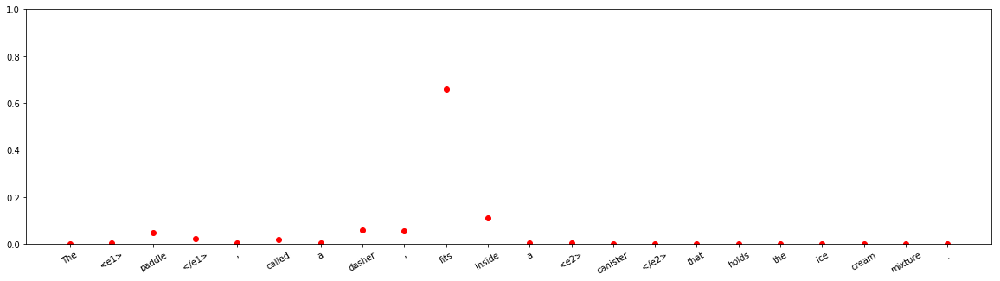


input sentence: That is one of the many reasons that a CEO 's <e1> team </e1> includes an experienced <e2> general counsel </e2> .
answer label:    Member-Collection(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.25461343
Entity-Destination(e1,e2) 	:	 6.7607875e-10
Cause-Effect(e2,e1) 	:	 3.2752192e-05
Member-Collection(e2,e1) 	:	 0.13800648
Entity-Origin(e1,e2) 	:	 0.0030753054
Message-Topic(e1,e2) 	:	 1.1259805e-08
Component-Whole(e1,e2) 	:	 1.5324912e-09
Component-Whole(e2,e1) 	:	 0.033200093
Instrument-Agency(e2,e1) 	:	 0.5073112
Content-Container(e1,e2) 	:	 0.00013694294
Product-Producer(e2,e1) 	:	 0.025333552
Cause-Effect(e1,e2) 	:	 1.979516e-05
Product-Producer(e1,e2) 	:	 1.5795302e-06
Content-Container(e2,e1) 	:	 0.0082517285
Entity-Origin(e2,e1) 	:	 9.808561e-08
Message-Topic(e2,e1) 	:	 4.780074e-06
Instrument-Agency(e1,e2) 	:	 0.024350846
Member-Collection(e1,e2) 	:	 0.0056614196
Entity-Destination(e2,e1) 	:	 2.8939821e-08



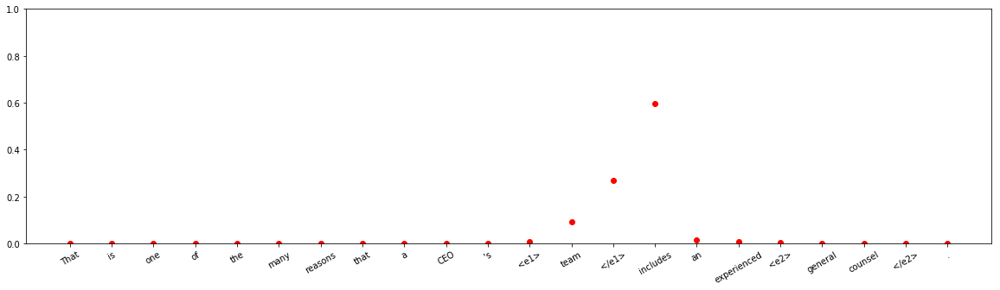


input sentence: The <e1> meeting </e1> decided definitively by secret <e2> vote </e2> of at least 2/3 of those present entitled to vote .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.0935983e-08
Entity-Destination(e1,e2) 	:	 1.4767097e-07
Cause-Effect(e2,e1) 	:	 1.2922366e-07
Member-Collection(e2,e1) 	:	 5.0912854e-07
Entity-Origin(e1,e2) 	:	 0.0003792127
Message-Topic(e1,e2) 	:	 6.9902408e-06
Component-Whole(e1,e2) 	:	 1.6023565e-08
Component-Whole(e2,e1) 	:	 1.5438123e-05
Instrument-Agency(e2,e1) 	:	 6.9272886e-08
Content-Container(e1,e2) 	:	 9.803448e-07
Product-Producer(e2,e1) 	:	 0.00080319267
Cause-Effect(e1,e2) 	:	 1.5629631e-10
Product-Producer(e1,e2) 	:	 0.99669623
Content-Container(e2,e1) 	:	 5.9879794e-09
Entity-Origin(e2,e1) 	:	 2.1188284e-09
Message-Topic(e2,e1) 	:	 0.0020757404
Instrument-Agency(e1,e2) 	:	 2.1332608e-05
Member-Collection(e1,e2) 	:	 3.8519115e-08
Entity-Destination(e2,e1) 	:	 2.6913843e-10



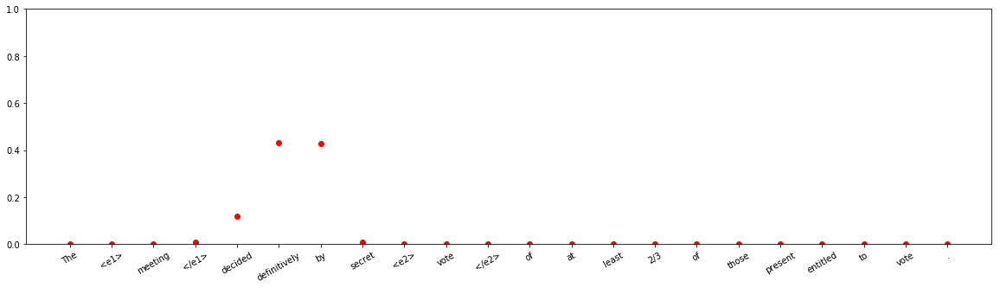


input sentence: The bulbar region is an area of the <e1> brain </e1> composed of the <e2> cerebellum </e2> , medulla and pons .
answer label:    Component-Whole(e2,e1)
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.7474584e-06
Entity-Destination(e1,e2) 	:	 8.566931e-16
Cause-Effect(e2,e1) 	:	 2.4505614e-08
Member-Collection(e2,e1) 	:	 2.5235337e-07
Entity-Origin(e1,e2) 	:	 5.8519595e-10
Message-Topic(e1,e2) 	:	 1.423676e-14
Component-Whole(e1,e2) 	:	 0.98862016
Component-Whole(e2,e1) 	:	 0.011377797
Instrument-Agency(e2,e1) 	:	 1.4755333e-12
Content-Container(e1,e2) 	:	 3.4601586e-12
Product-Producer(e2,e1) 	:	 4.3510413e-09
Cause-Effect(e1,e2) 	:	 5.234149e-10
Product-Producer(e1,e2) 	:	 9.2594504e-10
Content-Container(e2,e1) 	:	 6.332014e-11
Entity-Origin(e2,e1) 	:	 7.925848e-13
Message-Topic(e2,e1) 	:	 1.1892913e-08
Instrument-Agency(e1,e2) 	:	 1.3465213e-11
Member-Collection(e1,e2) 	:	 5.0170695e-10
Entity-Destination(e2,e1) 	:	 6.86886e-13



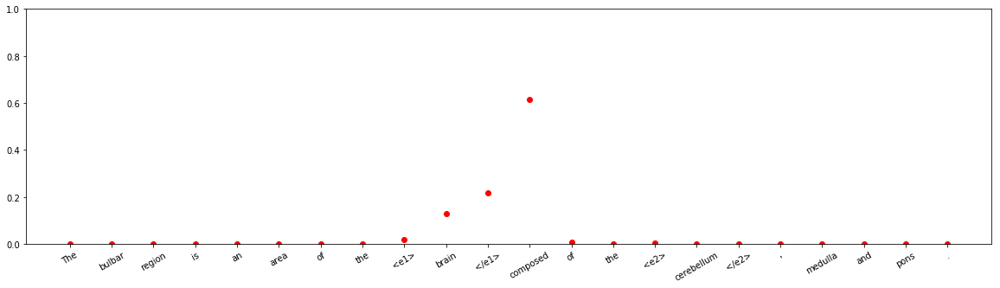


input sentence: The <e1> folks </e1> at the Lilly Endowment were interested in the study of philanthropy through a biographical <e2> lens </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 2.4252325e-09
Entity-Destination(e1,e2) 	:	 2.574874e-10
Cause-Effect(e2,e1) 	:	 6.4096196e-07
Member-Collection(e2,e1) 	:	 1.1066493e-05
Entity-Origin(e1,e2) 	:	 1.1819867e-05
Message-Topic(e1,e2) 	:	 1.0242058e-07
Component-Whole(e1,e2) 	:	 0.00024652688
Component-Whole(e2,e1) 	:	 0.999065
Instrument-Agency(e2,e1) 	:	 0.00050068117
Content-Container(e1,e2) 	:	 7.5020384e-06
Product-Producer(e2,e1) 	:	 1.8039584e-05
Cause-Effect(e1,e2) 	:	 2.5880968e-08
Product-Producer(e1,e2) 	:	 2.139028e-07
Content-Container(e2,e1) 	:	 2.6501124e-07
Entity-Origin(e2,e1) 	:	 8.207332e-10
Message-Topic(e2,e1) 	:	 0.0001383257
Instrument-Agency(e1,e2) 	:	 4.245359e-08
Member-Collection(e1,e2) 	:	 2.6521182e-10
Entity-Destination(e2,e1) 	:	 1.6449304e-09



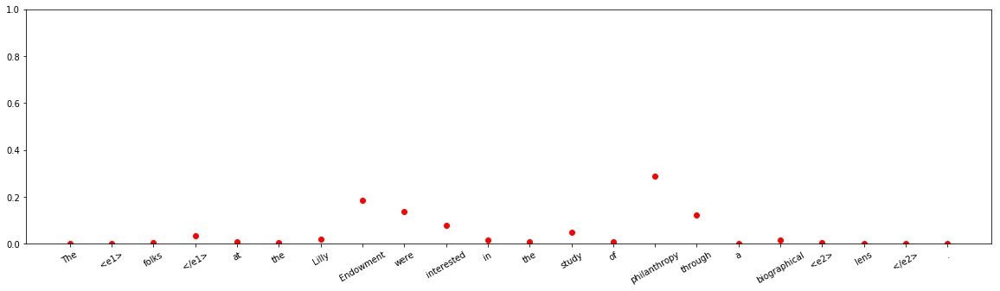





input sentence: We dissolved the <e1> contents </e1> of one <e2> packet </e2> in a carafe of water and ran the brew cycle .
answer label:    Content-Container(e1,e2)
wrong label:    Content-Container(e2,e1)
Other 	:	 3.551216e-09
Entity-Destination(e1,e2) 	:	 1.7527849e-07
Cause-Effect(e2,e1) 	:	 4.8058966e-12
Member-Collection(e2,e1) 	:	 9.298527e-10
Entity-Origin(e1,e2) 	:	 3.2587995e-08
Message-Topic(e1,e2) 	:	 5.8599875e-11
Component-Whole(e1,e2) 	:	 0.00010258513
Component-Whole(e2,e1) 	:	 1.6165183e-08
Instrument-Agency(e2,e1) 	:	 1.0245997e-06
Content-Container(e1,e2) 	:	 0.0006102976
Product-Producer(e2,e1) 	:	 3.697764e-08
Cause-Effect(e1,e2) 	:	 1.07223366e-13
Product-Producer(e1,e2) 	:	 5.7292243e-10
Content-Container(e2,e1) 	:	 0.99928576
Entity-Origin(e2,e1) 	:	 7.654791e-09
Message-Topic(e2,e1) 	:	 3.1436027e-11
Instrument-Agency(e1,e2) 	:	 9.127874e-08
Member-Collection(e1,e2) 	:	 5.8768745e-12
Entity-Destination(e2,e1) 	:	 6.2801812e-12



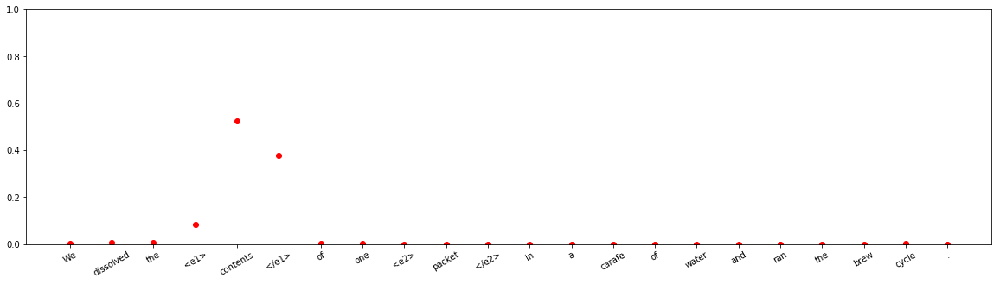


input sentence: This is the right time to apply as many new <e1> projects </e1> are landing into <e2> markets </e2> in India .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9789494
Entity-Destination(e1,e2) 	:	 0.0083135385
Cause-Effect(e2,e1) 	:	 4.1290638e-10
Member-Collection(e2,e1) 	:	 1.1319204e-08
Entity-Origin(e1,e2) 	:	 2.3926676e-08
Message-Topic(e1,e2) 	:	 0.011832722
Component-Whole(e1,e2) 	:	 0.00082394143
Component-Whole(e2,e1) 	:	 3.4724528e-07
Instrument-Agency(e2,e1) 	:	 7.179005e-14
Content-Container(e1,e2) 	:	 2.3847548e-07
Product-Producer(e2,e1) 	:	 1.815799e-09
Cause-Effect(e1,e2) 	:	 2.9388132e-06
Product-Producer(e1,e2) 	:	 8.288383e-06
Content-Container(e2,e1) 	:	 1.5211431e-10
Entity-Origin(e2,e1) 	:	 2.0799735e-06
Message-Topic(e2,e1) 	:	 3.6617836e-05
Instrument-Agency(e1,e2) 	:	 2.0404133e-05
Member-Collection(e1,e2) 	:	 9.443737e-06
Entity-Destination(e2,e1) 	:	 9.168913e-09



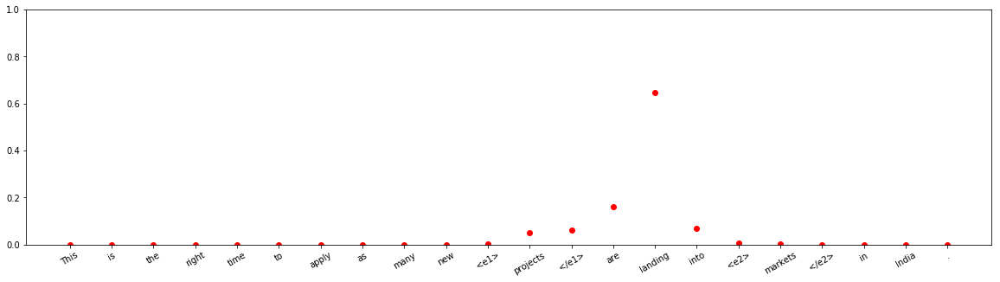


input sentence: Paint <e1> dust </e1> collected from a grit-blasting operation inside a <e2> caisson </e2> was stirred up using a leave blower .
answer label:    Entity-Origin(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 3.53879e-08
Entity-Destination(e1,e2) 	:	 0.07107011
Cause-Effect(e2,e1) 	:	 0.33156335
Member-Collection(e2,e1) 	:	 2.8383557e-08
Entity-Origin(e1,e2) 	:	 0.006907797
Message-Topic(e1,e2) 	:	 8.9030106e-10
Component-Whole(e1,e2) 	:	 0.5889902
Component-Whole(e2,e1) 	:	 5.9478665e-05
Instrument-Agency(e2,e1) 	:	 0.00064101315
Content-Container(e1,e2) 	:	 0.0007546903
Product-Producer(e2,e1) 	:	 1.03869574e-07
Cause-Effect(e1,e2) 	:	 1.5228053e-07
Product-Producer(e1,e2) 	:	 2.4030314e-07
Content-Container(e2,e1) 	:	 2.4157182e-06
Entity-Origin(e2,e1) 	:	 2.2852177e-10
Message-Topic(e2,e1) 	:	 1.3716336e-06
Instrument-Agency(e1,e2) 	:	 3.813894e-07
Member-Collection(e1,e2) 	:	 8.626799e-06
Entity-Destination(e2,e1) 	:	 2.2972992e-08



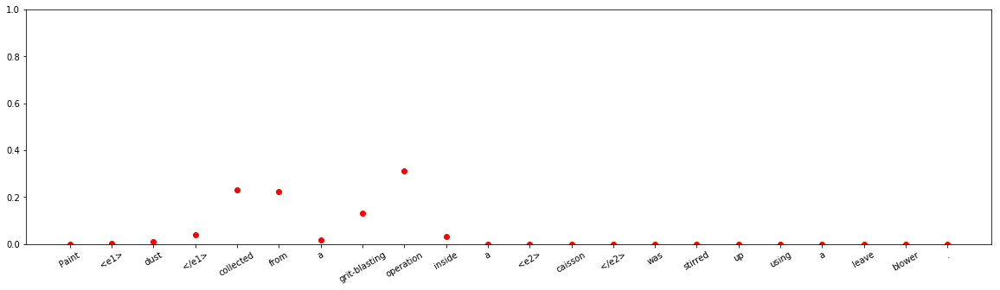


input sentence: It took the <e1> dirt </e1> out of the house into a <e2> canister </e2> which was located in the garage .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.977393
Entity-Destination(e1,e2) 	:	 0.0004907907
Cause-Effect(e2,e1) 	:	 5.92867e-10
Member-Collection(e2,e1) 	:	 1.9796128e-13
Entity-Origin(e1,e2) 	:	 1.7664363e-05
Message-Topic(e1,e2) 	:	 1.123762e-09
Component-Whole(e1,e2) 	:	 0.00079978845
Component-Whole(e2,e1) 	:	 2.7398118e-08
Instrument-Agency(e2,e1) 	:	 5.1394895e-08
Content-Container(e1,e2) 	:	 0.021295058
Product-Producer(e2,e1) 	:	 1.4256872e-06
Cause-Effect(e1,e2) 	:	 9.2099495e-11
Product-Producer(e1,e2) 	:	 1.2363322e-06
Content-Container(e2,e1) 	:	 6.571004e-07
Entity-Origin(e2,e1) 	:	 2.0481687e-08
Message-Topic(e2,e1) 	:	 4.235308e-10
Instrument-Agency(e1,e2) 	:	 3.582996e-07
Member-Collection(e1,e2) 	:	 5.7103776e-08
Entity-Destination(e2,e1) 	:	 9.843969e-10



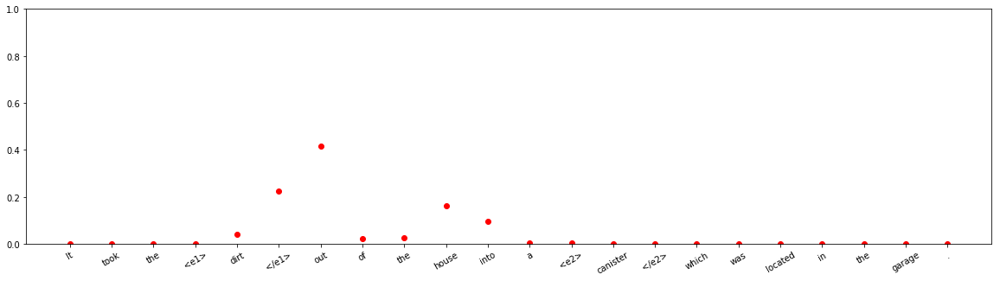







input sentence: That 's why I gave birth in the toilet and hid the <e1> baby </e1> in a <e2> cupboard drawer </e2> .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 1.956425e-10
Entity-Destination(e1,e2) 	:	 0.0141772395
Cause-Effect(e2,e1) 	:	 1.1028246e-10
Member-Collection(e2,e1) 	:	 3.0667515e-12
Entity-Origin(e1,e2) 	:	 1.3800456e-05
Message-Topic(e1,e2) 	:	 5.0364433e-14
Component-Whole(e1,e2) 	:	 0.0035469646
Component-Whole(e2,e1) 	:	 3.002077e-08
Instrument-Agency(e2,e1) 	:	 1.7394972e-09
Content-Container(e1,e2) 	:	 0.9822611
Product-Producer(e2,e1) 	:	 6.122882e-08
Cause-Effect(e1,e2) 	:	 6.082511e-13
Product-Producer(e1,e2) 	:	 1.1933364e-10
Content-Container(e2,e1) 	:	 3.5227762e-07
Entity-Origin(e2,e1) 	:	 6.181049e-11
Message-Topic(e2,e1) 	:	 2.123e-09
Instrument-Agency(e1,e2) 	:	 6.460447e-11
Member-Collection(e1,e2) 	:	 3.4915573e-07
Entity-Destination(e2,e1) 	:	 1.9881506e-11



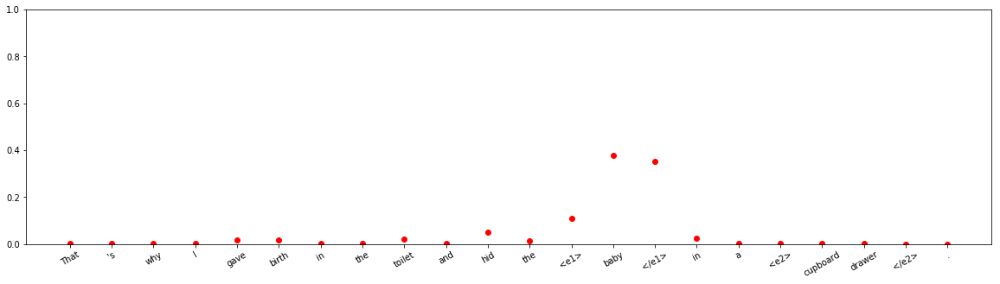






input sentence: The <e1> letter </e1> contains <e2> instructions </e2> for completion , and encloses a blank copy of the Assurance of Compliance .
answer label:    Component-Whole(e2,e1)
wrong label:    Content-Container(e2,e1)
Other 	:	 8.0589334e-11
Entity-Destination(e1,e2) 	:	 4.342293e-09
Cause-Effect(e2,e1) 	:	 3.3573648e-13
Member-Collection(e2,e1) 	:	 2.1951605e-06
Entity-Origin(e1,e2) 	:	 2.6471671e-08
Message-Topic(e1,e2) 	:	 0.0016354477
Component-Whole(e1,e2) 	:	 1.5835806e-08
Component-Whole(e2,e1) 	:	 0.0055593695
Instrument-Agency(e2,e1) 	:	 2.2899014e-06
Content-Container(e1,e2) 	:	 0.0007384529
Product-Producer(e2,e1) 	:	 0.0027538382
Cause-Effect(e1,e2) 	:	 6.8347583e-10
Product-Producer(e1,e2) 	:	 6.7498274e-09
Content-Container(e2,e1) 	:	 0.9893083
Entity-Origin(e2,e1) 	:	 8.733132e-08
Message-Topic(e2,e1) 	:	 5.067658e-09
Instrument-Agency(e1,e2) 	:	 1.0878839e-08
Member-Collection(e1,e2) 	:	 4.9207582e-11
Entity-Destination(e2,e1) 	:	 1.0770406e-08



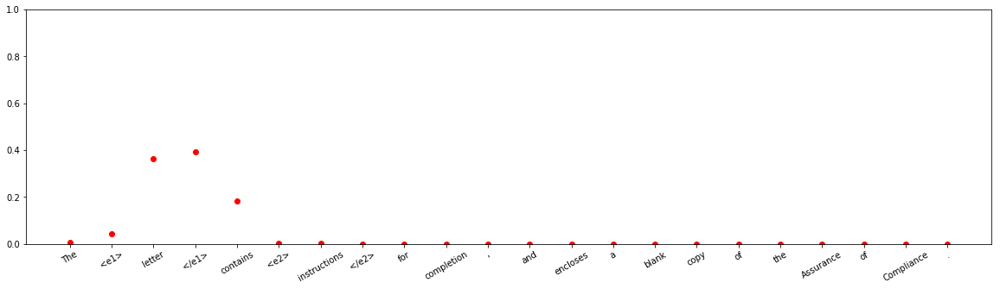


input sentence: A <e1> photograph </e1> reminds Frederic about a forgotten childhood <e2> memory </e2> about a mysterious woman in white a young .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.6515797e-12
Entity-Destination(e1,e2) 	:	 2.6288157e-13
Cause-Effect(e2,e1) 	:	 1.3797134e-14
Member-Collection(e2,e1) 	:	 1.2331557e-11
Entity-Origin(e1,e2) 	:	 1.6411716e-10
Message-Topic(e1,e2) 	:	 0.9999988
Component-Whole(e1,e2) 	:	 4.3128843e-09
Component-Whole(e2,e1) 	:	 9.316189e-14
Instrument-Agency(e2,e1) 	:	 1.1366284e-10
Content-Container(e1,e2) 	:	 6.8572675e-11
Product-Producer(e2,e1) 	:	 1.2422595e-06
Cause-Effect(e1,e2) 	:	 1.0093321e-09
Product-Producer(e1,e2) 	:	 3.9611937e-08
Content-Container(e2,e1) 	:	 7.222598e-09
Entity-Origin(e2,e1) 	:	 2.2723943e-11
Message-Topic(e2,e1) 	:	 3.709741e-10
Instrument-Agency(e1,e2) 	:	 7.058264e-12
Member-Collection(e1,e2) 	:	 2.0465607e-11
Entity-Destination(e2,e1) 	:	 6.101432e-12



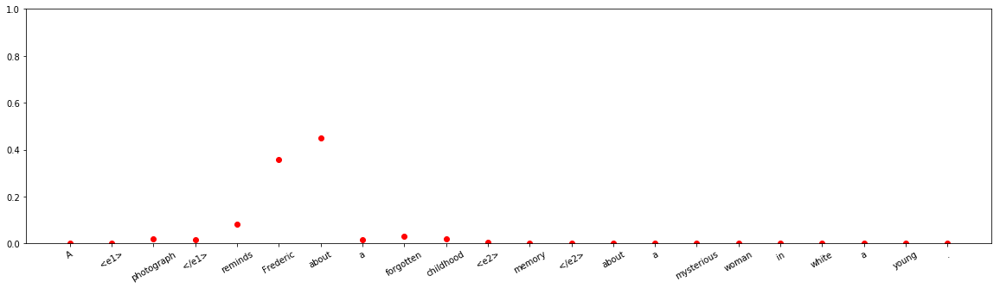


input sentence: The <e1> matter </e1> inside a supermassive <e2> black hole </e2> is not as dense as inside a stellar-sized black hole .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 0.0290553
Entity-Destination(e1,e2) 	:	 1.563587e-05
Cause-Effect(e2,e1) 	:	 4.2497224e-09
Member-Collection(e2,e1) 	:	 5.3401733e-10
Entity-Origin(e1,e2) 	:	 0.00012735503
Message-Topic(e1,e2) 	:	 1.9733126e-10
Component-Whole(e1,e2) 	:	 0.00010944423
Component-Whole(e2,e1) 	:	 2.669552e-09
Instrument-Agency(e2,e1) 	:	 1.991217e-08
Content-Container(e1,e2) 	:	 0.97008103
Product-Producer(e2,e1) 	:	 5.8682836e-08
Cause-Effect(e1,e2) 	:	 7.854986e-11
Product-Producer(e1,e2) 	:	 7.972087e-10
Content-Container(e2,e1) 	:	 1.4279432e-06
Entity-Origin(e2,e1) 	:	 5.3965458e-08
Message-Topic(e2,e1) 	:	 1.7926176e-06
Instrument-Agency(e1,e2) 	:	 2.254998e-08
Member-Collection(e1,e2) 	:	 0.000607869
Entity-Destination(e2,e1) 	:	 2.15529e-09



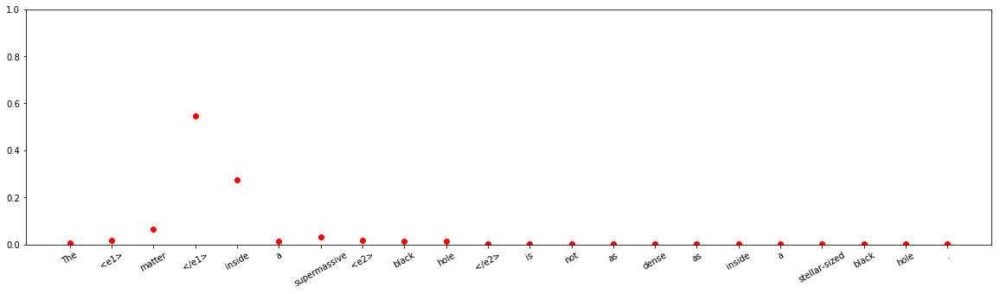


input sentence: A <e1> stone </e1> was put inside a freshly made <e2> pot </e2> , then it was pressed against the metal .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 1.4918735e-08
Entity-Destination(e1,e2) 	:	 0.08050738
Cause-Effect(e2,e1) 	:	 2.5557409e-11
Member-Collection(e2,e1) 	:	 5.440828e-10
Entity-Origin(e1,e2) 	:	 0.012238633
Message-Topic(e1,e2) 	:	 2.9862716e-11
Component-Whole(e1,e2) 	:	 4.0200246e-07
Component-Whole(e2,e1) 	:	 1.2162542e-06
Instrument-Agency(e2,e1) 	:	 3.7574e-08
Content-Container(e1,e2) 	:	 0.90641844
Product-Producer(e2,e1) 	:	 0.00014423898
Cause-Effect(e1,e2) 	:	 1.7919638e-11
Product-Producer(e1,e2) 	:	 2.6376338e-07
Content-Container(e2,e1) 	:	 0.0006881762
Entity-Origin(e2,e1) 	:	 1.2158226e-06
Message-Topic(e2,e1) 	:	 2.9669374e-09
Instrument-Agency(e1,e2) 	:	 9.384604e-10
Member-Collection(e1,e2) 	:	 1.2090966e-08
Entity-Destination(e2,e1) 	:	 1.0560354e-09



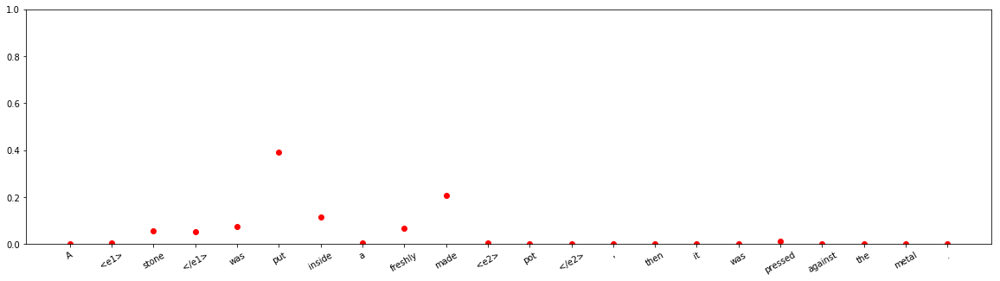











input sentence: Little Irish girl Becky called a <e1> demolition </e1> <e2> company </e2> and asked if they would knock her school down .
answer label:    Cause-Effect(e2,e1)
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.3955884e-08
Entity-Destination(e1,e2) 	:	 1.1922928e-11
Cause-Effect(e2,e1) 	:	 1.515053e-06
Member-Collection(e2,e1) 	:	 2.3286573e-09
Entity-Origin(e1,e2) 	:	 2.1832367e-12
Message-Topic(e1,e2) 	:	 2.5290171e-12
Component-Whole(e1,e2) 	:	 1.6091657e-10
Component-Whole(e2,e1) 	:	 7.538203e-13
Instrument-Agency(e2,e1) 	:	 3.1538035e-14
Content-Container(e1,e2) 	:	 7.1895296e-14
Product-Producer(e2,e1) 	:	 5.1287627e-11
Cause-Effect(e1,e2) 	:	 1.3050007e-07
Product-Producer(e1,e2) 	:	 0.9999232
Content-Container(e2,e1) 	:	 1.02928896e-13
Entity-Origin(e2,e1) 	:	 1.0501612e-12
Message-Topic(e2,e1) 	:	 6.154691e-11
Instrument-Agency(e1,e2) 	:	 7.497611e-05
Member-Collection(e1,e2) 	:	 1.5066936e-07
Entity-Destination(e2,e1) 	:	 7.173319e-12



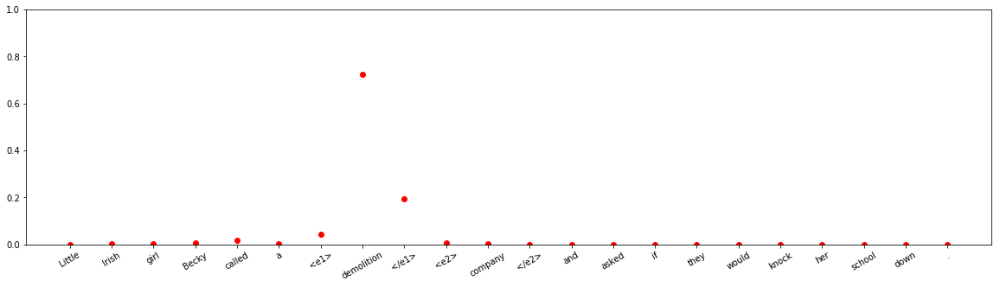







input sentence: He spent that time slaughtering a young pig and carefully catching all its <e1> blood </e1> in a <e2> ewer </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 1.9879383e-07
Entity-Destination(e1,e2) 	:	 2.9172702e-06
Cause-Effect(e2,e1) 	:	 4.907237e-13
Member-Collection(e2,e1) 	:	 8.2583636e-13
Entity-Origin(e1,e2) 	:	 1.11284555e-08
Message-Topic(e1,e2) 	:	 1.2026762e-12
Component-Whole(e1,e2) 	:	 1.5571e-05
Component-Whole(e2,e1) 	:	 1.9038364e-09
Instrument-Agency(e2,e1) 	:	 2.6476232e-10
Content-Container(e1,e2) 	:	 0.9999813
Product-Producer(e2,e1) 	:	 2.5048064e-11
Cause-Effect(e1,e2) 	:	 1.33249235e-14
Product-Producer(e1,e2) 	:	 9.732388e-12
Content-Container(e2,e1) 	:	 4.798739e-09
Entity-Origin(e2,e1) 	:	 5.5156133e-11
Message-Topic(e2,e1) 	:	 1.3631645e-08
Instrument-Agency(e1,e2) 	:	 1.0179116e-09
Member-Collection(e1,e2) 	:	 1.685439e-08
Entity-Destination(e2,e1) 	:	 2.9172514e-13



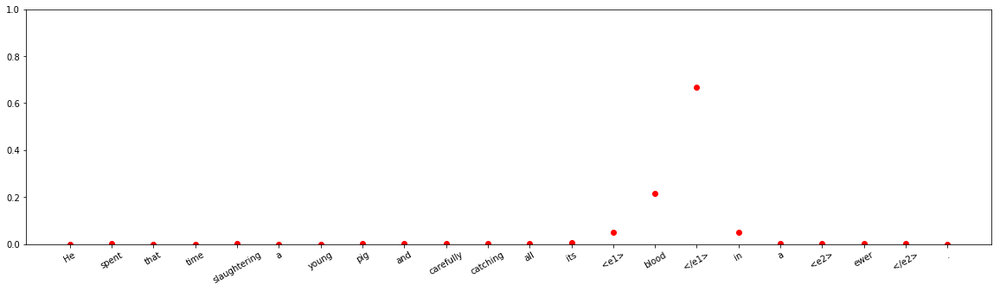







input sentence: In Dutch camping culture empty beer cases are saved and stacked up into a <e1> wall </e1> by <e2> youths </e2> .
answer label:    Product-Producer(e1,e2)
wrong label:    Other
Other 	:	 0.4474739
Entity-Destination(e1,e2) 	:	 2.2210567e-10
Cause-Effect(e2,e1) 	:	 4.9159167e-05
Member-Collection(e2,e1) 	:	 6.2577806e-07
Entity-Origin(e1,e2) 	:	 4.717972e-08
Message-Topic(e1,e2) 	:	 1.8175156e-11
Component-Whole(e1,e2) 	:	 0.0038766095
Component-Whole(e2,e1) 	:	 2.906786e-08
Instrument-Agency(e2,e1) 	:	 1.2156641e-08
Content-Container(e1,e2) 	:	 2.2764015e-09
Product-Producer(e2,e1) 	:	 1.4718326e-11
Cause-Effect(e1,e2) 	:	 7.4876737e-13
Product-Producer(e1,e2) 	:	 0.11913642
Content-Container(e2,e1) 	:	 1.5091847e-06
Entity-Origin(e2,e1) 	:	 2.7485617e-10
Message-Topic(e2,e1) 	:	 1.3480861e-08
Instrument-Agency(e1,e2) 	:	 0.4294594
Member-Collection(e1,e2) 	:	 2.2203028e-06
Entity-Destination(e2,e1) 	:	 2.008588e-09



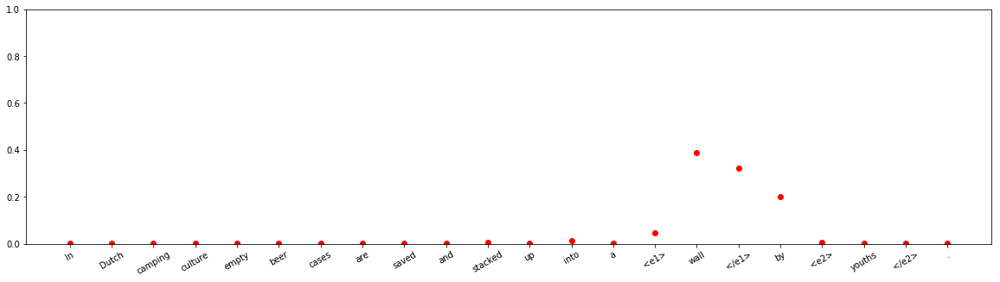




input sentence: She left the engine running because the <e1> car </e1> was full of <e2> snakes </e2> used in her exotic routine .
answer label:    Content-Container(e2,e1)
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.4641506e-09
Entity-Destination(e1,e2) 	:	 1.9420342e-10
Cause-Effect(e2,e1) 	:	 2.364603e-11
Member-Collection(e2,e1) 	:	 0.70092434
Entity-Origin(e1,e2) 	:	 2.3484683e-06
Message-Topic(e1,e2) 	:	 9.273312e-09
Component-Whole(e1,e2) 	:	 6.694854e-08
Component-Whole(e2,e1) 	:	 0.0011758199
Instrument-Agency(e2,e1) 	:	 3.134951e-11
Content-Container(e1,e2) 	:	 1.3280525e-05
Product-Producer(e2,e1) 	:	 1.7987907e-07
Cause-Effect(e1,e2) 	:	 1.3481958e-09
Product-Producer(e1,e2) 	:	 2.1563565e-06
Content-Container(e2,e1) 	:	 0.29781303
Entity-Origin(e2,e1) 	:	 6.244886e-06
Message-Topic(e2,e1) 	:	 3.0391466e-06
Instrument-Agency(e1,e2) 	:	 5.9512997e-05
Member-Collection(e1,e2) 	:	 1.2024242e-09
Entity-Destination(e2,e1) 	:	 1.8953508e-10



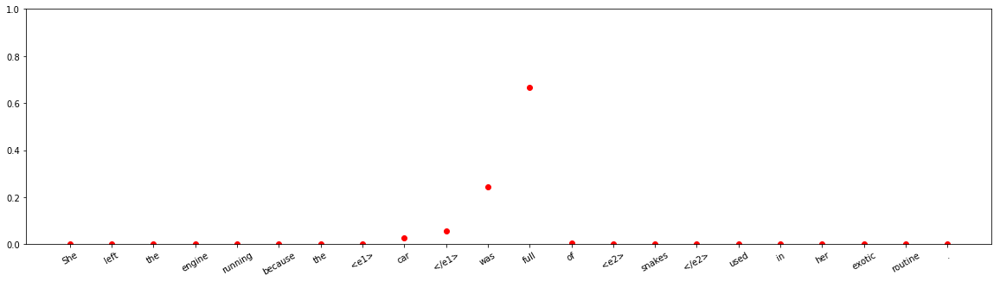






input sentence: The <e1> exhibition </e1> displayed a historical <e2> view </e2> of video game development from early arcade games to the present .
answer label:    Message-Topic(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 3.3727132e-15
Entity-Destination(e1,e2) 	:	 1.3286891e-12
Cause-Effect(e2,e1) 	:	 5.3263687e-13
Member-Collection(e2,e1) 	:	 2.2765148e-07
Entity-Origin(e1,e2) 	:	 2.8502892e-08
Message-Topic(e1,e2) 	:	 2.7587528e-05
Component-Whole(e1,e2) 	:	 3.652532e-06
Component-Whole(e2,e1) 	:	 0.9999659
Instrument-Agency(e2,e1) 	:	 1.536925e-10
Content-Container(e1,e2) 	:	 5.553524e-10
Product-Producer(e2,e1) 	:	 4.4348118e-07
Cause-Effect(e1,e2) 	:	 4.6787757e-10
Product-Producer(e1,e2) 	:	 3.3478684e-09
Content-Container(e2,e1) 	:	 2.009005e-06
Entity-Origin(e2,e1) 	:	 4.5746802e-11
Message-Topic(e2,e1) 	:	 1.6641779e-07
Instrument-Agency(e1,e2) 	:	 6.2127387e-10
Member-Collection(e1,e2) 	:	 2.286473e-13
Entity-Destination(e2,e1) 	:	 1.5302025e-11



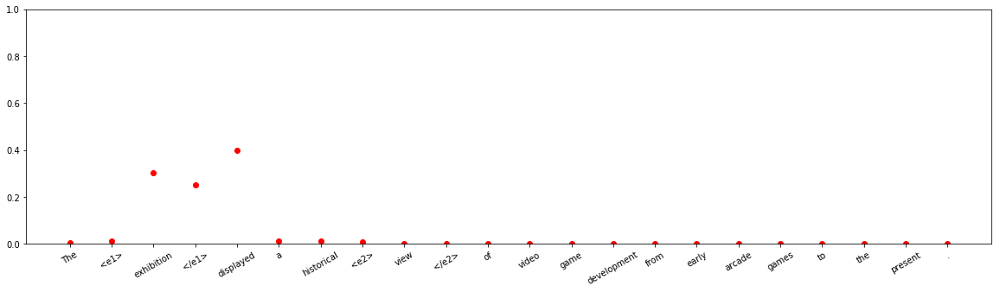







input sentence: The famous <e1> actress </e1> arrived at the <e2> airport </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 0.00039431054
Entity-Destination(e1,e2) 	:	 0.023973156
Cause-Effect(e2,e1) 	:	 3.1278855e-10
Member-Collection(e2,e1) 	:	 4.7626405e-09
Entity-Origin(e1,e2) 	:	 0.9732685
Message-Topic(e1,e2) 	:	 6.1141464e-10
Component-Whole(e1,e2) 	:	 3.6399226e-07
Component-Whole(e2,e1) 	:	 1.1854674e-09
Instrument-Agency(e2,e1) 	:	 0.0017886147
Content-Container(e1,e2) 	:	 0.00012421243
Product-Producer(e2,e1) 	:	 7.965698e-05
Cause-Effect(e1,e2) 	:	 2.1218946e-13
Product-Producer(e1,e2) 	:	 2.6030863e-08
Content-Container(e2,e1) 	:	 1.0251864e-07
Entity-Origin(e2,e1) 	:	 1.544243e-07
Message-Topic(e2,e1) 	:	 3.1026528e-05
Instrument-Agency(e1,e2) 	:	 1.1905778e-06
Member-Collection(e1,e2) 	:	 0.0003387744
Entity-Destination(e2,e1) 	:	 1.3907301e-11



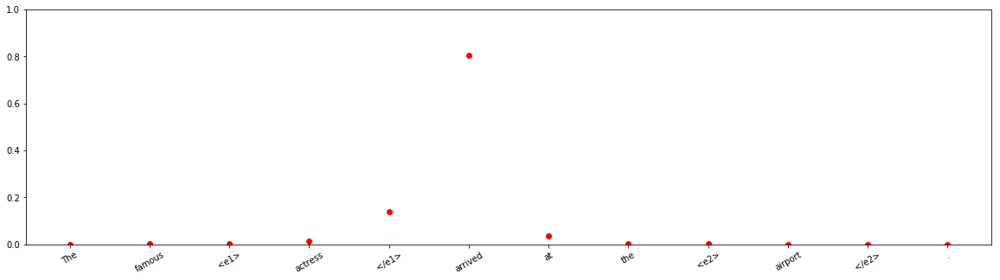


input sentence: These <e1> attributes </e1> are inherited to their <e2> children </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.99999976
Entity-Destination(e1,e2) 	:	 2.080664e-07
Cause-Effect(e2,e1) 	:	 5.903908e-13
Member-Collection(e2,e1) 	:	 1.9367862e-14
Entity-Origin(e1,e2) 	:	 1.3045505e-13
Message-Topic(e1,e2) 	:	 4.830167e-10
Component-Whole(e1,e2) 	:	 1.4644032e-09
Component-Whole(e2,e1) 	:	 1.0485311e-14
Instrument-Agency(e2,e1) 	:	 7.872854e-12
Content-Container(e1,e2) 	:	 3.7421132e-11
Product-Producer(e2,e1) 	:	 2.0217426e-12
Cause-Effect(e1,e2) 	:	 1.2485523e-11
Product-Producer(e1,e2) 	:	 1.681e-13
Content-Container(e2,e1) 	:	 2.1218435e-14
Entity-Origin(e2,e1) 	:	 9.138194e-12
Message-Topic(e2,e1) 	:	 1.9888692e-08
Instrument-Agency(e1,e2) 	:	 2.6460265e-10
Member-Collection(e1,e2) 	:	 1.05031175e-08
Entity-Destination(e2,e1) 	:	 5.0701283e-13



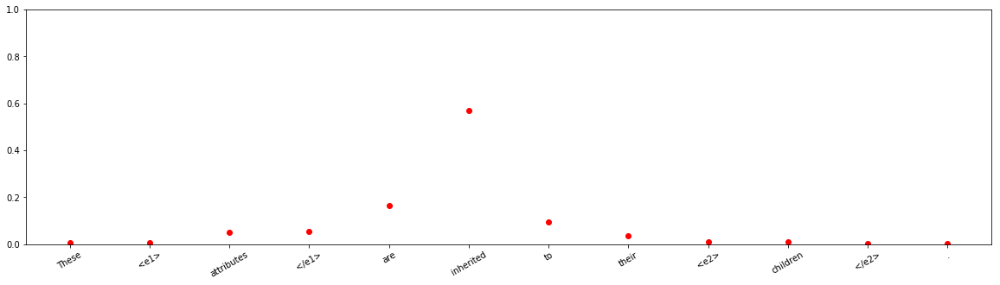










input sentence: The numismatic <e1> topics </e1> were placed into <e2> categories </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9057016
Entity-Destination(e1,e2) 	:	 0.09143306
Cause-Effect(e2,e1) 	:	 8.210563e-09
Member-Collection(e2,e1) 	:	 3.177538e-07
Entity-Origin(e1,e2) 	:	 5.617997e-06
Message-Topic(e1,e2) 	:	 0.00045474264
Component-Whole(e1,e2) 	:	 1.281024e-06
Component-Whole(e2,e1) 	:	 9.134335e-09
Instrument-Agency(e2,e1) 	:	 4.8651476e-08
Content-Container(e1,e2) 	:	 0.0021908751
Product-Producer(e2,e1) 	:	 1.5644908e-08
Cause-Effect(e1,e2) 	:	 8.037921e-08
Product-Producer(e1,e2) 	:	 4.5512846e-10
Content-Container(e2,e1) 	:	 0.00018158591
Entity-Origin(e2,e1) 	:	 2.2804384e-06
Message-Topic(e2,e1) 	:	 4.9182265e-08
Instrument-Agency(e1,e2) 	:	 8.525061e-06
Member-Collection(e1,e2) 	:	 1.9955516e-05
Entity-Destination(e2,e1) 	:	 2.4047197e-11



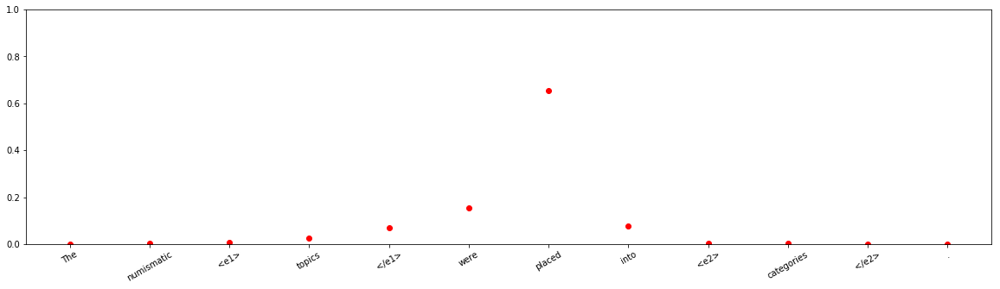




input sentence: Extending Ninject injects <e1> dependencies </e1> into action <e2> filters </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9788189
Entity-Destination(e1,e2) 	:	 0.021004668
Cause-Effect(e2,e1) 	:	 0.00016236203
Member-Collection(e2,e1) 	:	 3.6600745e-10
Entity-Origin(e1,e2) 	:	 1.7311017e-09
Message-Topic(e1,e2) 	:	 8.140273e-08
Component-Whole(e1,e2) 	:	 2.7789295e-07
Component-Whole(e2,e1) 	:	 3.671132e-06
Instrument-Agency(e2,e1) 	:	 2.1274377e-06
Content-Container(e1,e2) 	:	 1.9411603e-07
Product-Producer(e2,e1) 	:	 5.97735e-10
Cause-Effect(e1,e2) 	:	 2.8612462e-06
Product-Producer(e1,e2) 	:	 1.4810139e-10
Content-Container(e2,e1) 	:	 5.3383385e-08
Entity-Origin(e2,e1) 	:	 5.9091876e-10
Message-Topic(e2,e1) 	:	 1.2097418e-06
Instrument-Agency(e1,e2) 	:	 3.6446029e-06
Member-Collection(e1,e2) 	:	 7.119505e-08
Entity-Destination(e2,e1) 	:	 1.0862442e-09



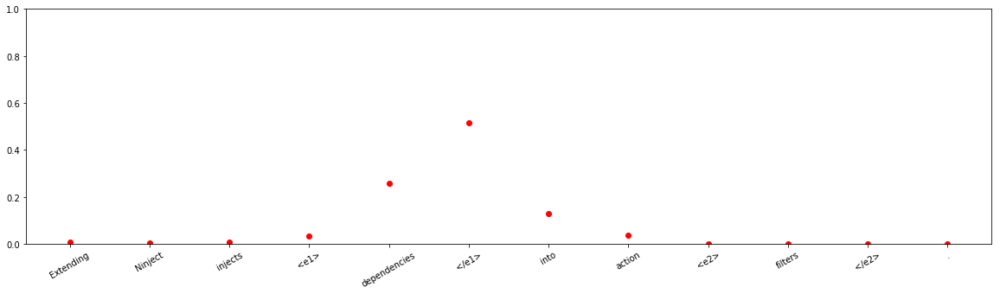



input sentence: The <e1> controversy </e1> has centered mainly on <e2> intelligence </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 6.042835e-10
Entity-Destination(e1,e2) 	:	 1.6148755e-08
Cause-Effect(e2,e1) 	:	 0.00024835038
Member-Collection(e2,e1) 	:	 7.8392895e-06
Entity-Origin(e1,e2) 	:	 1.3873407e-05
Message-Topic(e1,e2) 	:	 0.005450791
Component-Whole(e1,e2) 	:	 2.3066457e-05
Component-Whole(e2,e1) 	:	 1.8220779e-05
Instrument-Agency(e2,e1) 	:	 1.0022927e-10
Content-Container(e1,e2) 	:	 1.3046057e-10
Product-Producer(e2,e1) 	:	 3.779701e-09
Cause-Effect(e1,e2) 	:	 9.918039e-09
Product-Producer(e1,e2) 	:	 3.3793967e-05
Content-Container(e2,e1) 	:	 7.2809807e-09
Entity-Origin(e2,e1) 	:	 9.480119e-07
Message-Topic(e2,e1) 	:	 0.99420196
Instrument-Agency(e1,e2) 	:	 1.018808e-06
Member-Collection(e1,e2) 	:	 2.91257e-10
Entity-Destination(e2,e1) 	:	 4.203232e-09



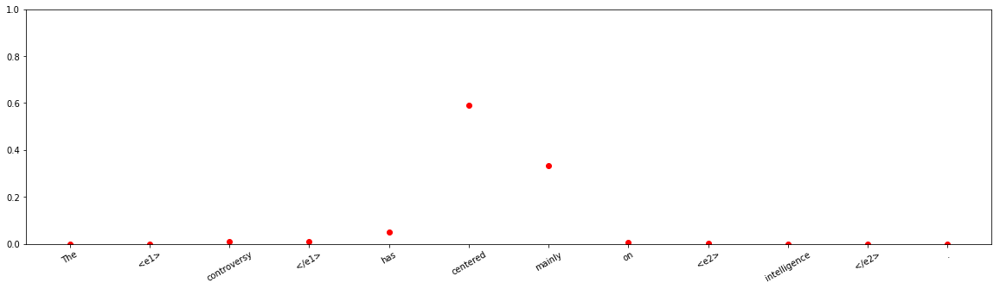












input sentence: The <e1> archive </e1> contains reviews from previous <e2> months </e2> .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 3.9264854e-08
Entity-Destination(e1,e2) 	:	 7.231742e-11
Cause-Effect(e2,e1) 	:	 4.622177e-10
Member-Collection(e2,e1) 	:	 5.5337552e-09
Entity-Origin(e1,e2) 	:	 0.9986625
Message-Topic(e1,e2) 	:	 1.0694583e-08
Component-Whole(e1,e2) 	:	 1.6985387e-08
Component-Whole(e2,e1) 	:	 2.7056124e-06
Instrument-Agency(e2,e1) 	:	 3.4290208e-09
Content-Container(e1,e2) 	:	 0.0013284929
Product-Producer(e2,e1) 	:	 8.688844e-10
Cause-Effect(e1,e2) 	:	 9.6942286e-15
Product-Producer(e1,e2) 	:	 3.6973577e-06
Content-Container(e2,e1) 	:	 2.5784752e-06
Entity-Origin(e2,e1) 	:	 3.4718195e-08
Message-Topic(e2,e1) 	:	 4.918314e-09
Instrument-Agency(e1,e2) 	:	 4.9249913e-08
Member-Collection(e1,e2) 	:	 2.7915057e-08
Entity-Destination(e2,e1) 	:	 9.969522e-11



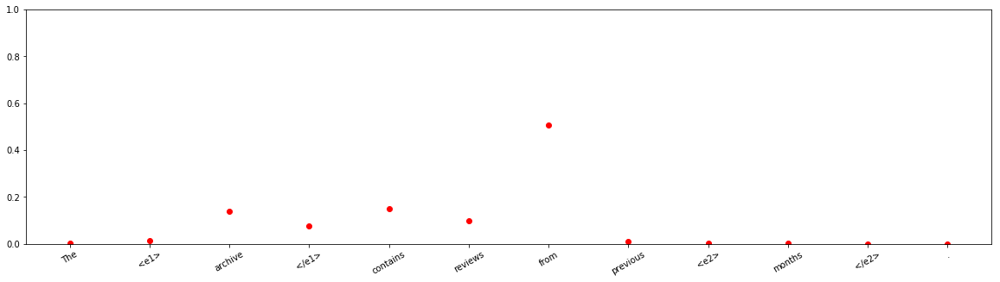





input sentence: <e1> Rumors </e1> have been leaked to the <e2> public </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 1.3873375e-12
Entity-Destination(e1,e2) 	:	 1.0
Cause-Effect(e2,e1) 	:	 1.9008978e-15
Member-Collection(e2,e1) 	:	 1.4281897e-14
Entity-Origin(e1,e2) 	:	 3.4884533e-11
Message-Topic(e1,e2) 	:	 5.532331e-08
Component-Whole(e1,e2) 	:	 2.763834e-11
Component-Whole(e2,e1) 	:	 1.1274607e-16
Instrument-Agency(e2,e1) 	:	 1.5357149e-17
Content-Container(e1,e2) 	:	 3.8027861e-10
Product-Producer(e2,e1) 	:	 2.921172e-12
Cause-Effect(e1,e2) 	:	 2.1793663e-14
Product-Producer(e1,e2) 	:	 1.5900981e-13
Content-Container(e2,e1) 	:	 2.533071e-14
Entity-Origin(e2,e1) 	:	 7.814144e-14
Message-Topic(e2,e1) 	:	 4.5907558e-10
Instrument-Agency(e1,e2) 	:	 8.469951e-14
Member-Collection(e1,e2) 	:	 9.925379e-12
Entity-Destination(e2,e1) 	:	 4.106374e-15



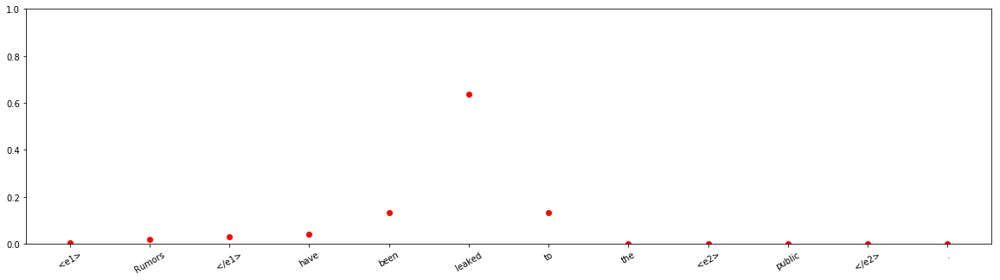



input sentence: My <e1> answer </e1> came in the last <e2> paragraph </e2> .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 9.0628815e-12
Entity-Destination(e1,e2) 	:	 0.0012203768
Cause-Effect(e2,e1) 	:	 3.1302971e-09
Member-Collection(e2,e1) 	:	 1.0753405e-08
Entity-Origin(e1,e2) 	:	 0.21223682
Message-Topic(e1,e2) 	:	 4.0867068e-08
Component-Whole(e1,e2) 	:	 8.643819e-07
Component-Whole(e2,e1) 	:	 7.585382e-10
Instrument-Agency(e2,e1) 	:	 1.3273296e-07
Content-Container(e1,e2) 	:	 0.051380172
Product-Producer(e2,e1) 	:	 0.7275454
Cause-Effect(e1,e2) 	:	 3.134662e-05
Product-Producer(e1,e2) 	:	 3.544996e-08
Content-Container(e2,e1) 	:	 8.2257e-08
Entity-Origin(e2,e1) 	:	 1.2190762e-06
Message-Topic(e2,e1) 	:	 0.007582646
Instrument-Agency(e1,e2) 	:	 1.030508e-12
Member-Collection(e1,e2) 	:	 9.724199e-07
Entity-Destination(e2,e1) 	:	 7.9119544e-11



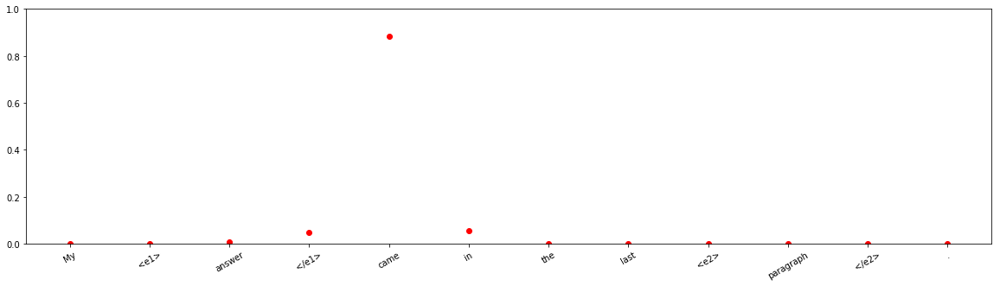






input sentence: Parent <e1> verbalizations </e1> were focused on story-relevant <e2> questions </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Message-Topic(e2,e1)
Other 	:	 5.171809e-08
Entity-Destination(e1,e2) 	:	 1.8875024e-10
Cause-Effect(e2,e1) 	:	 1.2580844e-06
Member-Collection(e2,e1) 	:	 2.400132e-09
Entity-Origin(e1,e2) 	:	 1.2174277e-13
Message-Topic(e1,e2) 	:	 0.11713868
Component-Whole(e1,e2) 	:	 5.8530554e-06
Component-Whole(e2,e1) 	:	 2.5170734e-09
Instrument-Agency(e2,e1) 	:	 2.2004222e-10
Content-Container(e1,e2) 	:	 6.569961e-10
Product-Producer(e2,e1) 	:	 2.7975913e-08
Cause-Effect(e1,e2) 	:	 1.04006285e-05
Product-Producer(e1,e2) 	:	 3.299639e-08
Content-Container(e2,e1) 	:	 1.0223087e-09
Entity-Origin(e2,e1) 	:	 6.0279925e-10
Message-Topic(e2,e1) 	:	 0.88284373
Instrument-Agency(e1,e2) 	:	 4.1386272e-08
Member-Collection(e1,e2) 	:	 1.9174439e-12
Entity-Destination(e2,e1) 	:	 2.5407372e-09



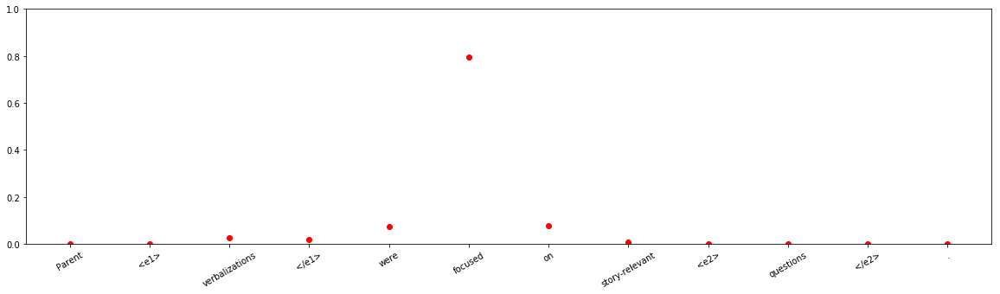




input sentence: The <e1> conference </e1> was organised around four <e2> roundtables </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.6363795e-07
Entity-Destination(e1,e2) 	:	 5.182135e-07
Cause-Effect(e2,e1) 	:	 8.3827406e-13
Member-Collection(e2,e1) 	:	 0.017152458
Entity-Origin(e1,e2) 	:	 2.12795e-06
Message-Topic(e1,e2) 	:	 0.6477003
Component-Whole(e1,e2) 	:	 8.249121e-05
Component-Whole(e2,e1) 	:	 0.083014734
Instrument-Agency(e2,e1) 	:	 1.0818211e-09
Content-Container(e1,e2) 	:	 0.0001124937
Product-Producer(e2,e1) 	:	 6.1309336e-05
Cause-Effect(e1,e2) 	:	 2.5381834e-08
Product-Producer(e1,e2) 	:	 9.6744735e-08
Content-Container(e2,e1) 	:	 0.00028559007
Entity-Origin(e2,e1) 	:	 7.630103e-06
Message-Topic(e2,e1) 	:	 0.25157923
Instrument-Agency(e1,e2) 	:	 8.969942e-07
Member-Collection(e1,e2) 	:	 5.115664e-09
Entity-Destination(e2,e1) 	:	 1.5745997e-08



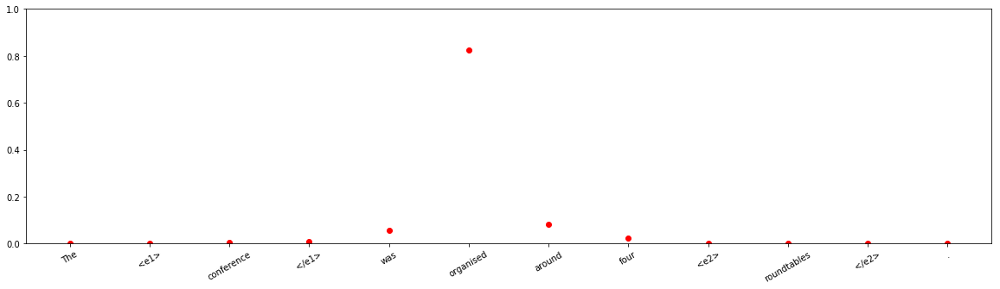





input sentence: He gave two <e1> candies </e1> to each <e2> child </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9827314
Entity-Destination(e1,e2) 	:	 0.015167371
Cause-Effect(e2,e1) 	:	 5.048052e-10
Member-Collection(e2,e1) 	:	 5.7295148e-11
Entity-Origin(e1,e2) 	:	 4.5604457e-07
Message-Topic(e1,e2) 	:	 3.317311e-07
Component-Whole(e1,e2) 	:	 5.4579734e-05
Component-Whole(e2,e1) 	:	 6.8926737e-10
Instrument-Agency(e2,e1) 	:	 1.3437974e-09
Content-Container(e1,e2) 	:	 0.0019825108
Product-Producer(e2,e1) 	:	 6.815806e-09
Cause-Effect(e1,e2) 	:	 1.9964406e-09
Product-Producer(e1,e2) 	:	 2.4340636e-09
Content-Container(e2,e1) 	:	 2.7485166e-05
Entity-Origin(e2,e1) 	:	 2.6935464e-05
Message-Topic(e2,e1) 	:	 4.361525e-09
Instrument-Agency(e1,e2) 	:	 8.596834e-06
Member-Collection(e1,e2) 	:	 2.3879662e-07
Entity-Destination(e2,e1) 	:	 1.0513896e-10



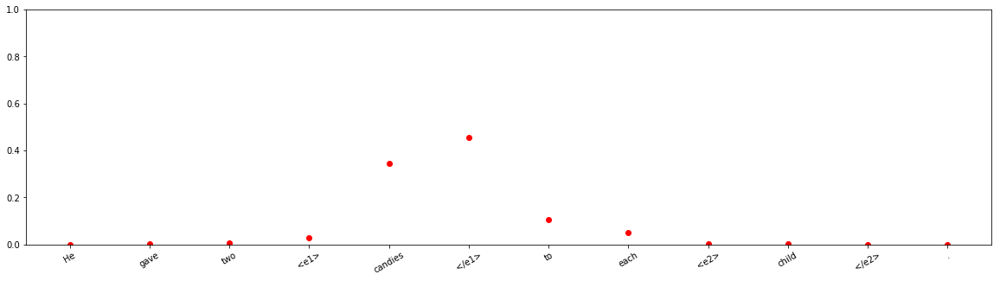






input sentence: My <e1> equipment </e1> was built in another <e2> country </e2> .
answer label:    Entity-Origin(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 0.00023966441
Entity-Destination(e1,e2) 	:	 0.046340924
Cause-Effect(e2,e1) 	:	 3.899151e-10
Member-Collection(e2,e1) 	:	 4.586948e-07
Entity-Origin(e1,e2) 	:	 0.023261504
Message-Topic(e1,e2) 	:	 5.2978514e-08
Component-Whole(e1,e2) 	:	 4.338599e-06
Component-Whole(e2,e1) 	:	 0.0001365107
Instrument-Agency(e2,e1) 	:	 4.359583e-11
Content-Container(e1,e2) 	:	 0.88362235
Product-Producer(e2,e1) 	:	 0.045883905
Cause-Effect(e1,e2) 	:	 1.700974e-07
Product-Producer(e1,e2) 	:	 9.015289e-05
Content-Container(e2,e1) 	:	 5.840517e-06
Entity-Origin(e2,e1) 	:	 0.00031993355
Message-Topic(e2,e1) 	:	 4.030668e-05
Instrument-Agency(e1,e2) 	:	 1.8076702e-05
Member-Collection(e1,e2) 	:	 3.5718796e-05
Entity-Destination(e2,e1) 	:	 9.630613e-10



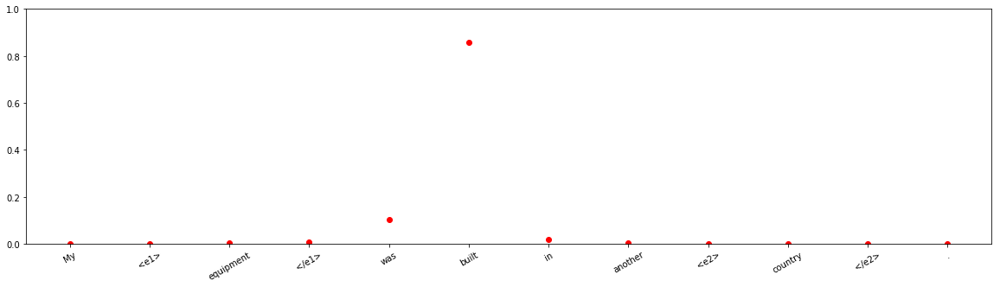





input sentence: There were concrete <e1> blocks </e1> inside a <e2> caisson </e2> .
answer label:    Content-Container(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 2.1659427e-05
Entity-Destination(e1,e2) 	:	 1.5137042e-06
Cause-Effect(e2,e1) 	:	 1.5869549e-12
Member-Collection(e2,e1) 	:	 3.1368293e-14
Entity-Origin(e1,e2) 	:	 4.8293436e-09
Message-Topic(e1,e2) 	:	 3.4220638e-12
Component-Whole(e1,e2) 	:	 0.9293036
Component-Whole(e2,e1) 	:	 1.9635076e-08
Instrument-Agency(e2,e1) 	:	 5.826673e-11
Content-Container(e1,e2) 	:	 0.07067318
Product-Producer(e2,e1) 	:	 7.0174283e-12
Cause-Effect(e1,e2) 	:	 2.5519856e-14
Product-Producer(e1,e2) 	:	 3.0073294e-10
Content-Container(e2,e1) 	:	 2.7110323e-09
Entity-Origin(e2,e1) 	:	 1.7850622e-11
Message-Topic(e2,e1) 	:	 1.9937618e-09
Instrument-Agency(e1,e2) 	:	 7.152752e-08
Member-Collection(e1,e2) 	:	 1.4352155e-08
Entity-Destination(e2,e1) 	:	 4.7275017e-11



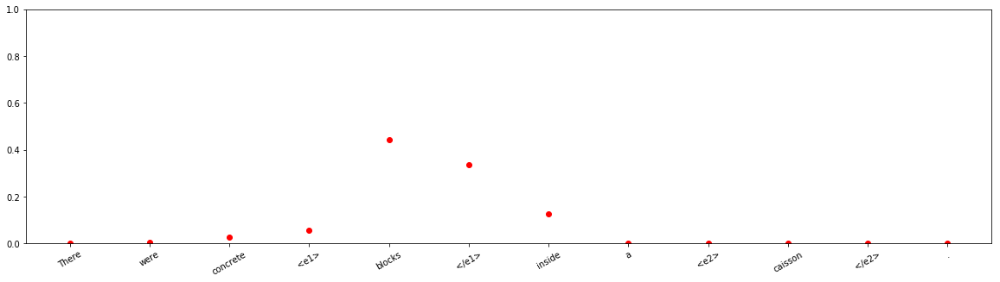


input sentence: The <e1> bungalow </e1> was built inside a <e2> barn </e2> .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 4.3968717e-05
Entity-Destination(e1,e2) 	:	 0.00047959082
Cause-Effect(e2,e1) 	:	 5.628172e-10
Member-Collection(e2,e1) 	:	 9.2385726e-08
Entity-Origin(e1,e2) 	:	 0.00071557163
Message-Topic(e1,e2) 	:	 1.3604008e-09
Component-Whole(e1,e2) 	:	 0.40600604
Component-Whole(e2,e1) 	:	 0.08778645
Instrument-Agency(e2,e1) 	:	 9.522149e-12
Content-Container(e1,e2) 	:	 0.5041573
Product-Producer(e2,e1) 	:	 0.00017377349
Cause-Effect(e1,e2) 	:	 2.595238e-09
Product-Producer(e1,e2) 	:	 0.00017423181
Content-Container(e2,e1) 	:	 1.1084982e-06
Entity-Origin(e2,e1) 	:	 4.1857447e-07
Message-Topic(e2,e1) 	:	 0.0004607577
Instrument-Agency(e1,e2) 	:	 2.675167e-07
Member-Collection(e1,e2) 	:	 5.537976e-07
Entity-Destination(e2,e1) 	:	 1.6820872e-08



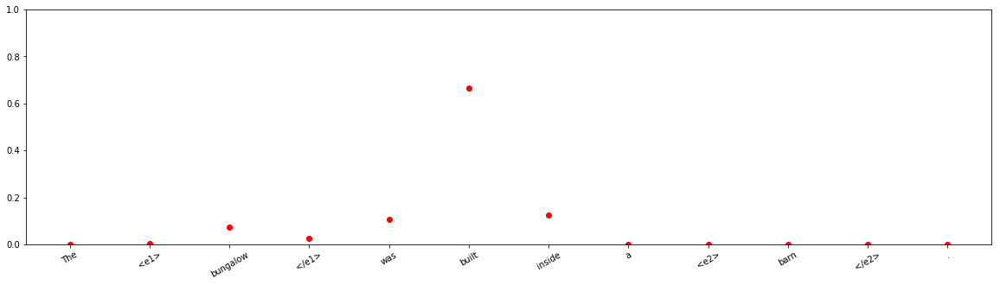





input sentence: This <e1> invertebrate </e1> builds armor from coconut <e2> halves </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.9238333e-10
Entity-Destination(e1,e2) 	:	 7.3251547e-09
Cause-Effect(e2,e1) 	:	 1.2404167e-08
Member-Collection(e2,e1) 	:	 2.030796e-09
Entity-Origin(e1,e2) 	:	 0.016334452
Message-Topic(e1,e2) 	:	 3.3367586e-10
Component-Whole(e1,e2) 	:	 4.2610647e-08
Component-Whole(e2,e1) 	:	 0.00030237387
Instrument-Agency(e2,e1) 	:	 0.00025398456
Content-Container(e1,e2) 	:	 1.4634992e-07
Product-Producer(e2,e1) 	:	 0.9830565
Cause-Effect(e1,e2) 	:	 6.849552e-09
Product-Producer(e1,e2) 	:	 5.221142e-05
Content-Container(e2,e1) 	:	 1.3037546e-08
Entity-Origin(e2,e1) 	:	 7.779734e-08
Message-Topic(e2,e1) 	:	 2.539001e-09
Instrument-Agency(e1,e2) 	:	 1.0735014e-08
Member-Collection(e1,e2) 	:	 9.39015e-08
Entity-Destination(e2,e1) 	:	 8.897887e-10



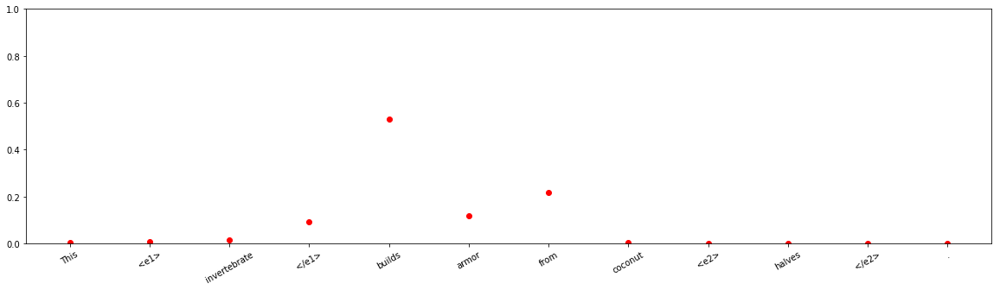






















input sentence: Over the past decade , robotics has driven forward the concept of minimally invasive surgery , building on the <e1> skills </e1> developed in keyhole <e2> surgery </e2> and moving away from open-body operations .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.00093078904
Entity-Destination(e1,e2) 	:	 5.3734498e-06
Cause-Effect(e2,e1) 	:	 5.9369324e-07
Member-Collection(e2,e1) 	:	 2.2350473e-08
Entity-Origin(e1,e2) 	:	 1.2722364e-06
Message-Topic(e1,e2) 	:	 2.7580245e-09
Component-Whole(e1,e2) 	:	 5.9182466e-06
Component-Whole(e2,e1) 	:	 0.93897647
Instrument-Agency(e2,e1) 	:	 4.201054e-06
Content-Container(e1,e2) 	:	 3.5402525e-05
Product-Producer(e2,e1) 	:	 0.021686886
Cause-Effect(e1,e2) 	:	 1.8147184e-06
Product-Producer(e1,e2) 	:	 4.5406017e-05
Content-Container(e2,e1) 	:	 2.1552883e-10
Entity-Origin(e2,e1) 	:	 4.0239083e-09
Message-Topic(e2,e1) 	:	 0.03830574
Instrument-Agency(e1,e2) 	:	 5.2210383e-09
Member-Collectio

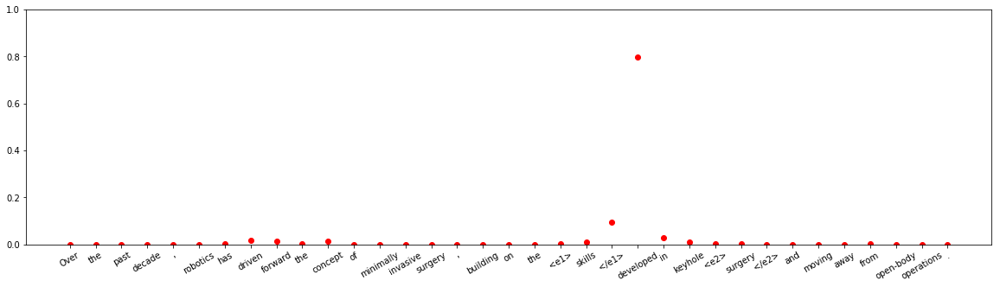






input sentence: The French Government published on 13 January 2010 new guaranteed tariffs for the purchase of <e1> electricity </e1> produced from <e2> biomass </e2> , geothermal and solar by the public electricity grid management companies .
answer label:    Entity-Origin(e1,e2)
wrong label:    Product-Producer(e1,e2)
Other 	:	 7.886188e-12
Entity-Destination(e1,e2) 	:	 2.4536628e-10
Cause-Effect(e2,e1) 	:	 0.006956523
Member-Collection(e2,e1) 	:	 2.2631217e-09
Entity-Origin(e1,e2) 	:	 0.4197015
Message-Topic(e1,e2) 	:	 4.4797655e-12
Component-Whole(e1,e2) 	:	 5.5438715e-10
Component-Whole(e2,e1) 	:	 4.0620293e-10
Instrument-Agency(e2,e1) 	:	 5.8361074e-13
Content-Container(e1,e2) 	:	 1.2351901e-09
Product-Producer(e2,e1) 	:	 1.1480637e-06
Cause-Effect(e1,e2) 	:	 4.034124e-07
Product-Producer(e1,e2) 	:	 0.57333577
Content-Container(e2,e1) 	:	 2.8632242e-12
Entity-Origin(e2,e1) 	:	 4.4201855e-07
Message-Topic(e2,e1) 	:	 7.5846566e-07
Instrument-Agency(e1,e2) 	:	 3.4388036e-06
Memb

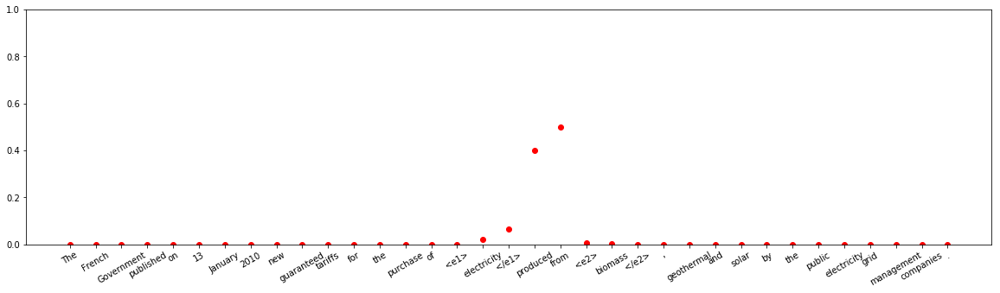








input sentence: Why exactly the <e1> physicist </e1> came up with the <e2> term </e2> `` black hole '' I 'm not sure of , but you might be able to find out in his autobiography .
answer label:    Product-Producer(e2,e1)
wrong label:    Other
Other 	:	 0.9630418
Entity-Destination(e1,e2) 	:	 2.0674862e-12
Cause-Effect(e2,e1) 	:	 2.4982958e-07
Member-Collection(e2,e1) 	:	 1.1967734e-10
Entity-Origin(e1,e2) 	:	 1.2283054e-07
Message-Topic(e1,e2) 	:	 7.355479e-11
Component-Whole(e1,e2) 	:	 5.922648e-12
Component-Whole(e2,e1) 	:	 1.9115915e-11
Instrument-Agency(e2,e1) 	:	 0.015661195
Content-Container(e1,e2) 	:	 3.775555e-10
Product-Producer(e2,e1) 	:	 0.021296054
Cause-Effect(e1,e2) 	:	 5.99326e-07
Product-Producer(e1,e2) 	:	 4.7739663e-11
Content-Container(e2,e1) 	:	 6.3357364e-09
Entity-Origin(e2,e1) 	:	 4.0990277e-11
Message-Topic(e2,e1) 	:	 5.5900204e-09
Instrument-Agency(e1,e2) 	:	 3.3912187e-08
Member-Collection(e1,e2) 	:	 1.2484209e-07
Entity-Destination(e2,e1) 	:	 2.099831e-

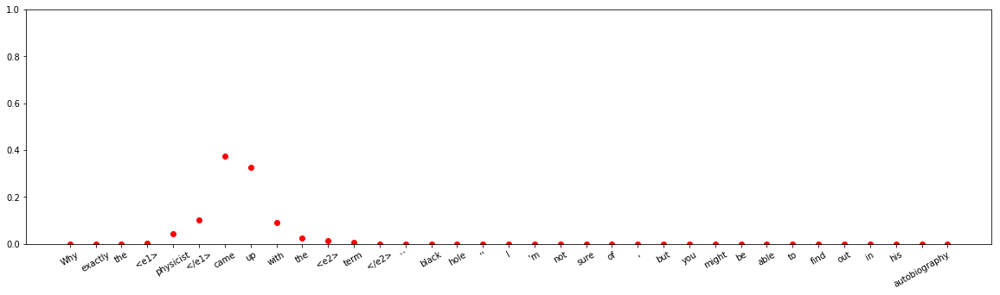






input sentence: An <e1> eyewitness </e1> <e2> account </e2> to a turning point in the Civil War , From the Pen of a She-Rebel chronicles not only a community 's near destruction but also its endurance .
answer label:    Product-Producer(e2,e1)
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.0887874e-06
Entity-Destination(e1,e2) 	:	 1.1092139e-06
Cause-Effect(e2,e1) 	:	 1.174519e-08
Member-Collection(e2,e1) 	:	 3.9494117e-07
Entity-Origin(e1,e2) 	:	 6.4513955e-08
Message-Topic(e1,e2) 	:	 0.8652387
Component-Whole(e1,e2) 	:	 3.21007e-06
Component-Whole(e2,e1) 	:	 0.0003698999
Instrument-Agency(e2,e1) 	:	 0.098433524
Content-Container(e1,e2) 	:	 0.034968454
Product-Producer(e2,e1) 	:	 0.00077331235
Cause-Effect(e1,e2) 	:	 1.0460924e-06
Product-Producer(e1,e2) 	:	 2.3891369e-08
Content-Container(e2,e1) 	:	 0.00011789327
Entity-Origin(e2,e1) 	:	 3.936948e-08
Message-Topic(e2,e1) 	:	 2.0397454e-05
Instrument-Agency(e1,e2) 	:	 6.9249785e-05
Member-Collection(e1,e2) 	:	 7.413214e-08
Enti

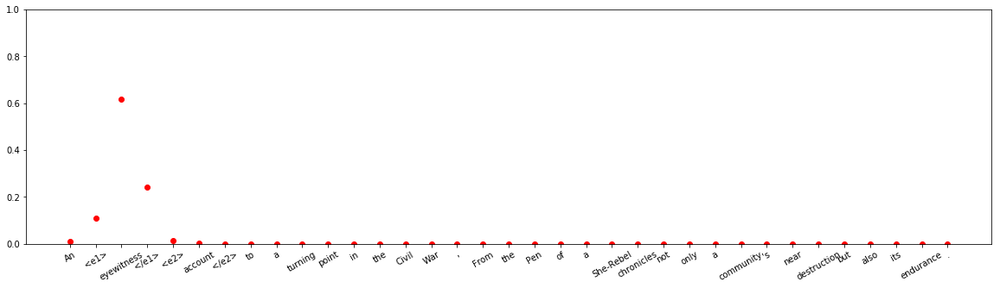






input sentence: Toward the end of the novel , Chike 's father , a former slave whose wealth was based , in part , on a large <e1> plantation </e1> of cocoa <e2> beans </e2> and coconuts , wakes up one morning to find that all his plants have been cut down .
answer label:    Component-Whole(e2,e1)
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.004023669
Entity-Destination(e1,e2) 	:	 4.398482e-12
Cause-Effect(e2,e1) 	:	 1.7286975e-08
Member-Collection(e2,e1) 	:	 0.9947149
Entity-Origin(e1,e2) 	:	 1.1574276e-05
Message-Topic(e1,e2) 	:	 1.5203089e-09
Component-Whole(e1,e2) 	:	 8.101439e-05
Component-Whole(e2,e1) 	:	 9.15657e-05
Instrument-Agency(e2,e1) 	:	 4.7101645e-10
Content-Container(e1,e2) 	:	 1.7212912e-08
Product-Producer(e2,e1) 	:	 6.415398e-06
Cause-Effect(e1,e2) 	:	 3.218363e-10
Product-Producer(e1,e2) 	:	 0.00038587843
Content-Container(e2,e1) 	:	 1.08579385e-07
Entity-Origin(e2,e1) 	:	 0.0006607616
Message-Topic(e2,e1) 	:	 8.414043e-06
Instrument-Agency(e1,e2) 	:	 1.

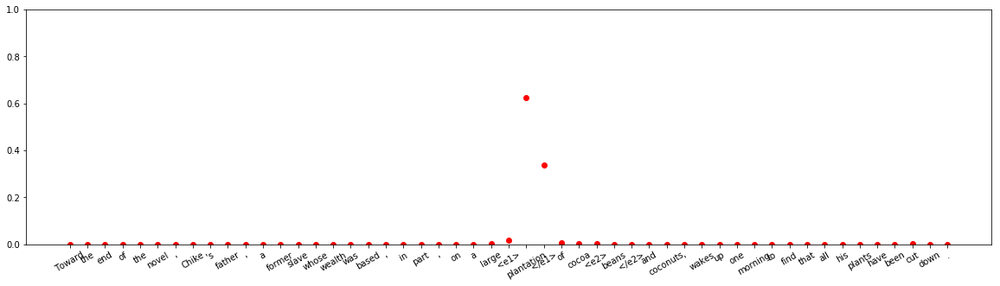









input sentence: After months of sieges , with some of the most fierce human assaults by numbers many times their own , and when the smoke had cleared , the <e1> banner </e1> of the <e2> knights </e2> still stood on the ramparts .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 3.300571e-08
Entity-Destination(e1,e2) 	:	 4.8665596e-09
Cause-Effect(e2,e1) 	:	 4.3961036e-06
Member-Collection(e2,e1) 	:	 0.6282465
Entity-Origin(e1,e2) 	:	 2.4166786e-07
Message-Topic(e1,e2) 	:	 2.4686258e-06
Component-Whole(e1,e2) 	:	 0.037626974
Component-Whole(e2,e1) 	:	 1.1273879e-08
Instrument-Agency(e2,e1) 	:	 2.6535794e-09
Content-Container(e1,e2) 	:	 1.6502397e-09
Product-Producer(e2,e1) 	:	 4.598065e-06
Cause-Effect(e1,e2) 	:	 2.615668e-07
Product-Producer(e1,e2) 	:	 0.28582993
Content-Container(e2,e1) 	:	 5.32612e-07
Entity-Origin(e2,e1) 	:	 2.0978335e-09
Message-Topic(e2,e1) 	:	 8.074941e-07
Instrument-Agency(e1,e2) 	:	 0.048024453
Member-Collection(e1,e2) 	:	 0.000

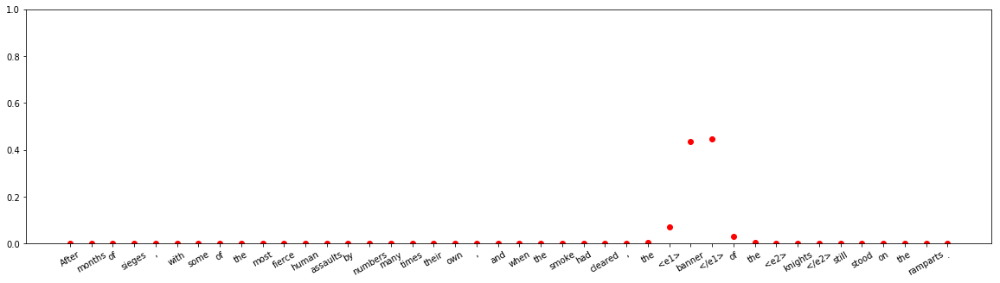


input sentence: The <e1> time </e1> <e2> machine </e2> itself is a plain gray box , with a distinctive electronic `` hum '' created by overlaying the sounds of a mechanical grinder and a car engine , rather than a processed digital effect .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.1278043e-05
Entity-Destination(e1,e2) 	:	 4.072953e-09
Cause-Effect(e2,e1) 	:	 0.014166201
Member-Collection(e2,e1) 	:	 1.8878036e-07
Entity-Origin(e1,e2) 	:	 2.1196321e-07
Message-Topic(e1,e2) 	:	 6.199117e-08
Component-Whole(e1,e2) 	:	 0.0005141652
Component-Whole(e2,e1) 	:	 0.49292335
Instrument-Agency(e2,e1) 	:	 0.35252747
Content-Container(e1,e2) 	:	 1.2607474e-05
Product-Producer(e2,e1) 	:	 4.126558e-08
Cause-Effect(e1,e2) 	:	 1.764091e-05
Product-Producer(e1,e2) 	:	 0.00015935904
Content-Container(e2,e1) 	:	 3.7047105e-06
Entity-Origin(e2,e1) 	:	 2.1235855e-09
Message-Topic(e2,e1) 	:	 2.026735e-06
Instrument-Agency(e1,e2) 	:	 0.13966134
Member-Collection(e1,e2) 	:	 7.7

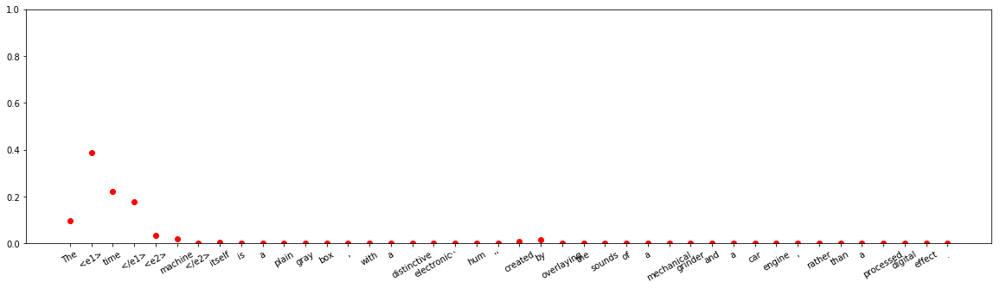







input sentence: The <e1> communion </e1> of <e2> saints </e2> ( in Latin , communio sanctorum ) is the spiritual union of all Christians living and the dead , those on earth , in heaven and , in Catholic belief , in purgatory .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.7942081e-10
Entity-Destination(e1,e2) 	:	 7.305901e-12
Cause-Effect(e2,e1) 	:	 2.8469002e-12
Member-Collection(e2,e1) 	:	 0.9999875
Entity-Origin(e1,e2) 	:	 2.6125462e-09
Message-Topic(e1,e2) 	:	 1.5847414e-08
Component-Whole(e1,e2) 	:	 4.0531574e-09
Component-Whole(e2,e1) 	:	 5.0200026e-12
Instrument-Agency(e2,e1) 	:	 7.19246e-14
Content-Container(e1,e2) 	:	 1.1235589e-12
Product-Producer(e2,e1) 	:	 1.8295851e-10
Cause-Effect(e1,e2) 	:	 8.6996875e-11
Product-Producer(e1,e2) 	:	 2.1958424e-09
Content-Container(e2,e1) 	:	 6.1500305e-07
Entity-Origin(e2,e1) 	:	 1.177768e-05
Message-Topic(e2,e1) 	:	 1.5321083e-10
Instrument-Agency(e1,e2) 	:	 1.16275615e-07
Member-Collection(e1,e2) 	:	

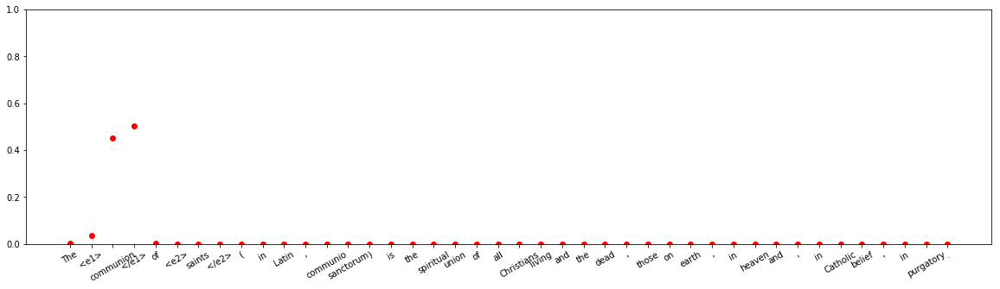













input sentence: Six Flags ' reorganization plan is supported by a steering <e1> committee </e1> of its secured <e2> creditors </e2> and led by investment firm Avenue Capital Management , which would take control of the company under the plan .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.7069687
Entity-Destination(e1,e2) 	:	 7.907036e-08
Cause-Effect(e2,e1) 	:	 3.4665473e-07
Member-Collection(e2,e1) 	:	 0.20238928
Entity-Origin(e1,e2) 	:	 3.2647242e-06
Message-Topic(e1,e2) 	:	 4.556773e-07
Component-Whole(e1,e2) 	:	 7.9675165e-06
Component-Whole(e2,e1) 	:	 4.92373e-07
Instrument-Agency(e2,e1) 	:	 5.09641e-08
Content-Container(e1,e2) 	:	 1.3764405e-05
Product-Producer(e2,e1) 	:	 1.9218654e-05
Cause-Effect(e1,e2) 	:	 4.4925996e-09
Product-Producer(e1,e2) 	:	 0.0016075026
Content-Container(e2,e1) 	:	 1.9000032e-06
Entity-Origin(e2,e1) 	:	 4.2877293e-08
Message-Topic(e2,e1) 	:	 3.0766637e-07
Instrument-Agency(e1,e2) 	:	 0.027745437
Member-Collecti

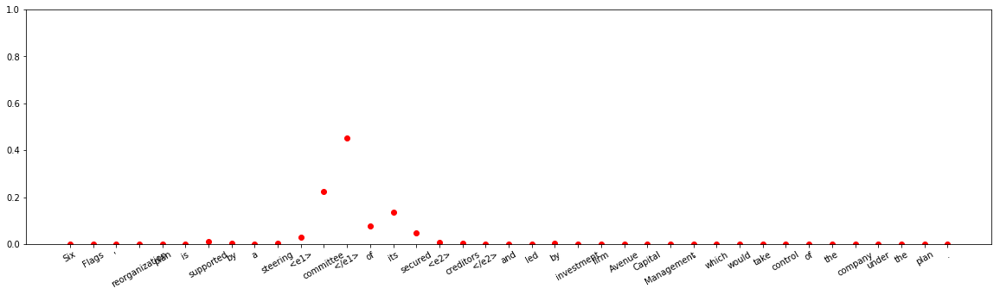


input sentence: Impressed by the strategic <e1> advantages </e1> of this <e2> fortress </e2> and its protection of the city on the slope beneath , King Vakhtang Gorgasali of Iberia decided to move his capital here from Mtskheta in 458 .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 0.15783711
Entity-Destination(e1,e2) 	:	 2.0543902e-09
Cause-Effect(e2,e1) 	:	 4.6540963e-06
Member-Collection(e2,e1) 	:	 0.00047217045
Entity-Origin(e1,e2) 	:	 0.00010956389
Message-Topic(e1,e2) 	:	 1.7285504e-07
Component-Whole(e1,e2) 	:	 0.1899001
Component-Whole(e2,e1) 	:	 2.3695348e-07
Instrument-Agency(e2,e1) 	:	 1.046984e-07
Content-Container(e1,e2) 	:	 2.3751005e-07
Product-Producer(e2,e1) 	:	 7.713625e-06
Cause-Effect(e1,e2) 	:	 3.9514e-09
Product-Producer(e1,e2) 	:	 0.0011749397
Content-Container(e2,e1) 	:	 1.0066359e-08
Entity-Origin(e2,e1) 	:	 1.053673e-07
Message-Topic(e2,e1) 	:	 0.6446319
Instrument-Agency(e1,e2) 	:	 0.00017852234
Member-Collection(e1,e2) 	:	 0.00568249

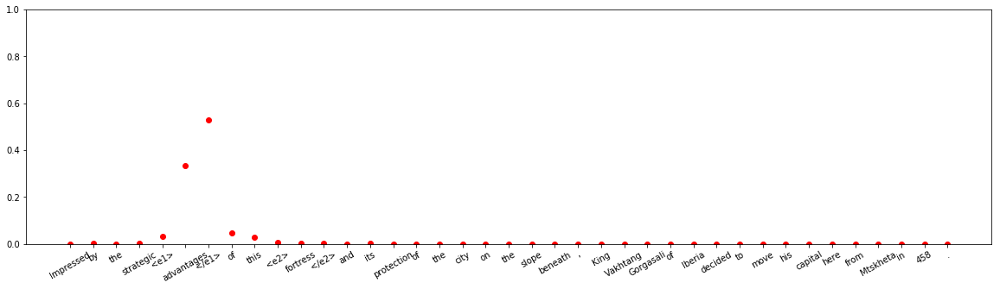


input sentence: Scientists in Cambridge have discovered that a lowly grape <e1> variety </e1> grown by <e2> peasants </e2> - but despised by noblemen - during the Middle Ages was the mother of many of today 's greatest grape varieties .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 8.170901e-08
Entity-Destination(e1,e2) 	:	 5.228872e-14
Cause-Effect(e2,e1) 	:	 7.7002234e-08
Member-Collection(e2,e1) 	:	 9.688539e-08
Entity-Origin(e1,e2) 	:	 1.1255689e-05
Message-Topic(e1,e2) 	:	 6.260504e-14
Component-Whole(e1,e2) 	:	 1.2154454e-13
Component-Whole(e2,e1) 	:	 7.5529054e-14
Instrument-Agency(e2,e1) 	:	 2.2091937e-13
Content-Container(e1,e2) 	:	 6.167549e-10
Product-Producer(e2,e1) 	:	 1.5040974e-11
Cause-Effect(e1,e2) 	:	 4.4183874e-14
Product-Producer(e1,e2) 	:	 0.9999554
Content-Container(e2,e1) 	:	 1.8889229e-11
Entity-Origin(e2,e1) 	:	 1.2208714e-08
Message-Topic(e2,e1) 	:	 9.677705e-10
Instrument-Agency(e1,e2) 	:	 3.2761316e-05
Member-Collection(e1,e2) 	:	

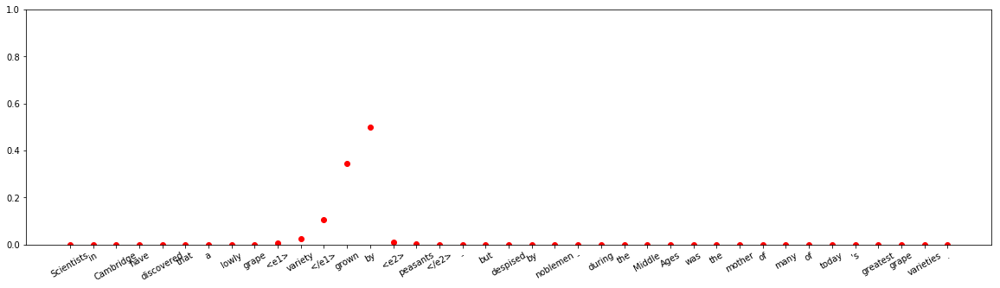












input sentence: Orion , a giant stellar <e1> nursery </e1> which has spawned roughly 20,000 low-mass <e2> stars </e2> like the sun in the last 10 million years , also harbors a handful of massive type O and B stars that emit blowtorch-like radiation .
answer label:    Member-Collection(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.0794728e-08
Entity-Destination(e1,e2) 	:	 6.852499e-08
Cause-Effect(e2,e1) 	:	 7.927122e-08
Member-Collection(e2,e1) 	:	 0.02183765
Entity-Origin(e1,e2) 	:	 0.0002694637
Message-Topic(e1,e2) 	:	 5.7580055e-11
Component-Whole(e1,e2) 	:	 1.0315815e-08
Component-Whole(e2,e1) 	:	 0.25222853
Instrument-Agency(e2,e1) 	:	 1.5440643e-10
Content-Container(e1,e2) 	:	 3.76586e-09
Product-Producer(e2,e1) 	:	 0.58503395
Cause-Effect(e1,e2) 	:	 0.00015100726
Product-Producer(e1,e2) 	:	 0.14047606
Content-Container(e2,e1) 	:	 4.3526012e-07
Entity-Origin(e2,e1) 	:	 8.95922e-07
Message-Topic(e2,e1) 	:	 4.3143575e-07
Instrument-Agency(e1,e2) 	:	 9.93213

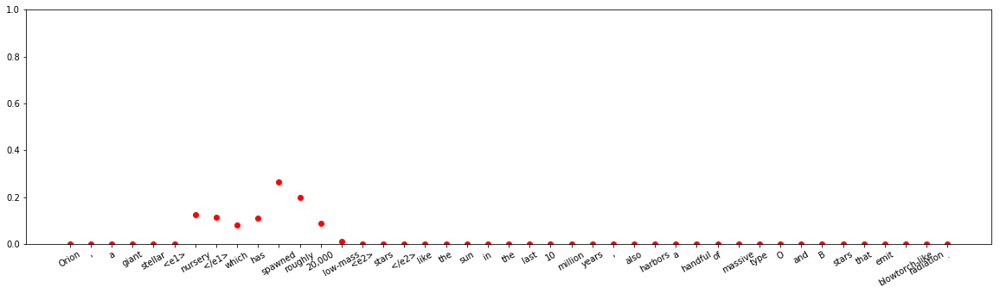


input sentence: The ladder shield comprises a rigid yet slightly flexible shell of plastic which is sized and shaped to fit around the front and sides of the ladder so as to block access to the <e1> steps </e1> on the <e2> ladder </e2> .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 0.6876181
Entity-Destination(e1,e2) 	:	 5.9626726e-10
Cause-Effect(e2,e1) 	:	 3.0934327e-08
Member-Collection(e2,e1) 	:	 1.28404214e-11
Entity-Origin(e1,e2) 	:	 1.0492112e-10
Message-Topic(e1,e2) 	:	 9.709034e-09
Component-Whole(e1,e2) 	:	 0.31148943
Component-Whole(e2,e1) 	:	 0.0004723296
Instrument-Agency(e2,e1) 	:	 5.928293e-05
Content-Container(e1,e2) 	:	 1.7779588e-07
Product-Producer(e2,e1) 	:	 2.5770944e-11
Cause-Effect(e1,e2) 	:	 9.524971e-12
Product-Producer(e1,e2) 	:	 4.438985e-09
Content-Container(e2,e1) 	:	 1.0529557e-07
Entity-Origin(e2,e1) 	:	 1.6657381e-12
Message-Topic(e2,e1) 	:	 1.5959557e-09
Instrument-Agency(e1,e2) 	:	 0.00036070033
Member-Collection(e1,e2) 	:	 

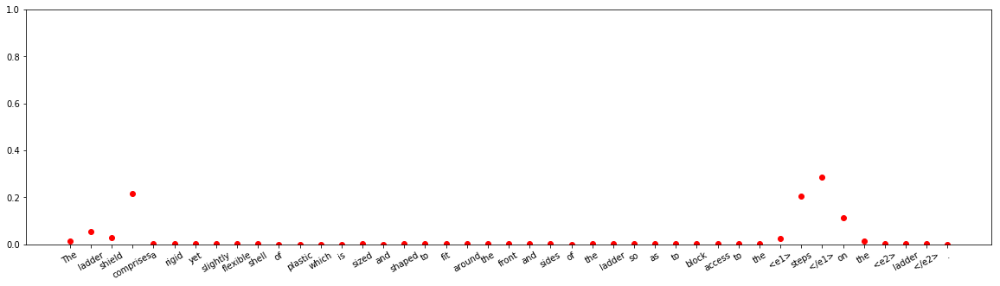



input sentence: The <e1> narrative </e1> comprises the <e2> interplay </e2> of two themes that are woven together as it criss-crosses back and forth between the life of nineteen year old Greg Kowalski 's desire to become a firefighter and his heart-rending life growing up in Saginaw Michigan where he had to endure the physical and verbal abuse handed out by his appalling father .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.00023751434
Entity-Destination(e1,e2) 	:	 9.715344e-13
Cause-Effect(e2,e1) 	:	 7.70056e-08
Member-Collection(e2,e1) 	:	 4.278054e-07
Entity-Origin(e1,e2) 	:	 6.196167e-09
Message-Topic(e1,e2) 	:	 0.00088977336
Component-Whole(e1,e2) 	:	 2.1024181e-05
Component-Whole(e2,e1) 	:	 0.99884963
Instrument-Agency(e2,e1) 	:	 3.7567485e-08
Content-Container(e1,e2) 	:	 2.080811e-09
Product-Producer(e2,e1) 	:	 2.4082531e-11
Cause-Effect(e1,e2) 	:	 4.7244487e-07
Product-Producer(e1,e2) 	:	 3.2854803e-08
Content-Container(e2,e1) 	:	 6.272346e-07
Ent

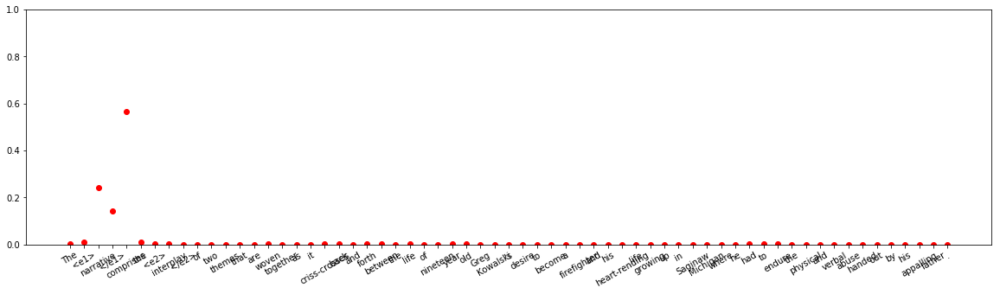


input sentence: Fuller 's is a <e1> brewer </e1> of distinguished , prize-winning British <e2> ales </e2> crafted with over 150 years of pride and tradition .
answer label:    Product-Producer(e2,e1)
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.4542845e-11
Entity-Destination(e1,e2) 	:	 2.8310695e-13
Cause-Effect(e2,e1) 	:	 8.689708e-13
Member-Collection(e2,e1) 	:	 0.9590129
Entity-Origin(e1,e2) 	:	 6.699076e-05
Message-Topic(e1,e2) 	:	 8.189647e-12
Component-Whole(e1,e2) 	:	 2.3032956e-12
Component-Whole(e2,e1) 	:	 7.218311e-13
Instrument-Agency(e2,e1) 	:	 2.4388278e-12
Content-Container(e1,e2) 	:	 4.4606202e-10
Product-Producer(e2,e1) 	:	 0.04072558
Cause-Effect(e1,e2) 	:	 3.8365296e-12
Product-Producer(e1,e2) 	:	 6.3475076e-05
Content-Container(e2,e1) 	:	 2.5608376e-08
Entity-Origin(e2,e1) 	:	 1.4939911e-06
Message-Topic(e2,e1) 	:	 2.2209004e-08
Instrument-Agency(e1,e2) 	:	 1.9506922e-08
Member-Collection(e1,e2) 	:	 0.00012954212
Entity-Destination(e2,e1) 	:	 2.5600412e-12



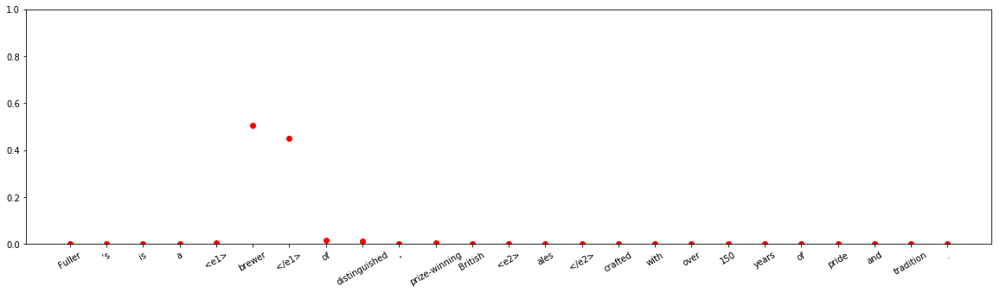


input sentence: This is the `` best <e1> time </e1> of day for <e2> painters </e2> to capture the 'inner state ' of a landscape '' .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 1.01456656e-07
Entity-Destination(e1,e2) 	:	 1.1857842e-11
Cause-Effect(e2,e1) 	:	 4.4087345e-10
Member-Collection(e2,e1) 	:	 0.00011376243
Entity-Origin(e1,e2) 	:	 2.4051013e-11
Message-Topic(e1,e2) 	:	 5.4032245e-08
Component-Whole(e1,e2) 	:	 8.117036e-08
Component-Whole(e2,e1) 	:	 5.144148e-10
Instrument-Agency(e2,e1) 	:	 6.1829936e-10
Content-Container(e1,e2) 	:	 1.251882e-10
Product-Producer(e2,e1) 	:	 7.0076625e-11
Cause-Effect(e1,e2) 	:	 6.6573937e-09
Product-Producer(e1,e2) 	:	 0.00011122658
Content-Container(e2,e1) 	:	 3.5626016e-10
Entity-Origin(e2,e1) 	:	 2.3697282e-08
Message-Topic(e2,e1) 	:	 2.4700932e-07
Instrument-Agency(e1,e2) 	:	 0.99975187
Member-Collection(e1,e2) 	:	 2.2590242e-05
Entity-Destination(e2,e1) 	:	 3.3799054e-11



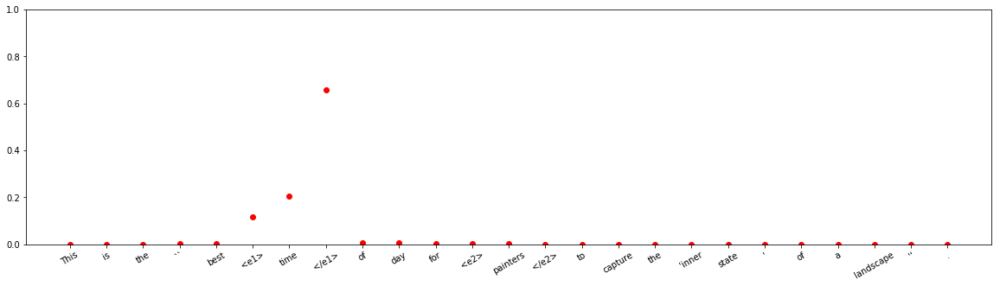












input sentence: The <e1> high-wheelers </e1> were descended from an early type of <e2> push-bike </e2> , without pedals .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 8.384671e-09
Entity-Destination(e1,e2) 	:	 1.4972424e-07
Cause-Effect(e2,e1) 	:	 8.725329e-06
Member-Collection(e2,e1) 	:	 2.0581803e-09
Entity-Origin(e1,e2) 	:	 0.999985
Message-Topic(e1,e2) 	:	 6.9845464e-13
Component-Whole(e1,e2) 	:	 2.8720937e-10
Component-Whole(e2,e1) 	:	 1.8582783e-07
Instrument-Agency(e2,e1) 	:	 5.8715004e-06
Content-Container(e1,e2) 	:	 1.2513346e-08
Product-Producer(e2,e1) 	:	 4.507144e-10
Cause-Effect(e1,e2) 	:	 1.893606e-12
Product-Producer(e1,e2) 	:	 8.667741e-09
Content-Container(e2,e1) 	:	 4.212233e-10
Entity-Origin(e2,e1) 	:	 1.0702752e-10
Message-Topic(e2,e1) 	:	 2.0463519e-08
Instrument-Agency(e1,e2) 	:	 5.753286e-08
Member-Collection(e1,e2) 	:	 1.1709114e-10
Entity-Destination(e2,e1) 	:	 2.020243e-13



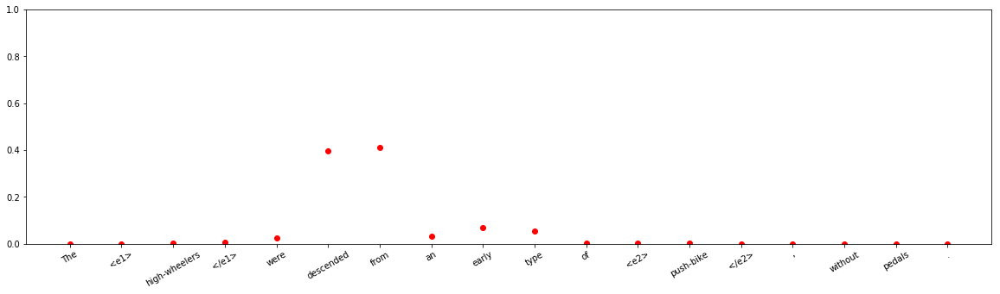




input sentence: A `` green bean '' which is actually a <e1> fruit </e1> with <e2> seeds </e2> inside .
answer label:    Component-Whole(e1,e2)
wrong label:    Content-Container(e2,e1)
Other 	:	 7.228547e-07
Entity-Destination(e1,e2) 	:	 7.727999e-08
Cause-Effect(e2,e1) 	:	 6.3513217e-10
Member-Collection(e2,e1) 	:	 6.4351925e-06
Entity-Origin(e1,e2) 	:	 4.0408533e-05
Message-Topic(e1,e2) 	:	 2.0062277e-10
Component-Whole(e1,e2) 	:	 3.0924832e-10
Component-Whole(e2,e1) 	:	 1.990047e-05
Instrument-Agency(e2,e1) 	:	 2.0547024e-07
Content-Container(e1,e2) 	:	 8.565659e-06
Product-Producer(e2,e1) 	:	 1.8703e-05
Cause-Effect(e1,e2) 	:	 2.1048238e-10
Product-Producer(e1,e2) 	:	 6.0018e-08
Content-Container(e2,e1) 	:	 0.9978574
Entity-Origin(e2,e1) 	:	 0.002046581
Message-Topic(e2,e1) 	:	 3.882048e-10
Instrument-Agency(e1,e2) 	:	 9.373688e-07
Member-Collection(e1,e2) 	:	 2.398713e-11
Entity-Destination(e2,e1) 	:	 1.4607517e-11



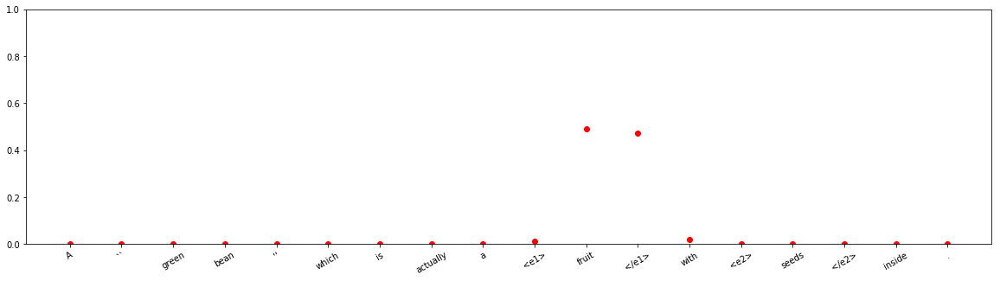



input sentence: The <e1> book </e1> takes into account various <e2> phases </e2> of the life of the Muhammad .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.90801704
Entity-Destination(e1,e2) 	:	 2.9912037e-06
Cause-Effect(e2,e1) 	:	 2.5955316e-11
Member-Collection(e2,e1) 	:	 3.8072536e-09
Entity-Origin(e1,e2) 	:	 1.5137921e-08
Message-Topic(e1,e2) 	:	 0.091949746
Component-Whole(e1,e2) 	:	 1.3528256e-05
Component-Whole(e2,e1) 	:	 8.574239e-06
Instrument-Agency(e2,e1) 	:	 2.4362754e-09
Content-Container(e1,e2) 	:	 2.0208e-06
Product-Producer(e2,e1) 	:	 6.781047e-08
Cause-Effect(e1,e2) 	:	 4.8201624e-08
Product-Producer(e1,e2) 	:	 4.1458623e-10
Content-Container(e2,e1) 	:	 2.6329649e-06
Entity-Origin(e2,e1) 	:	 1.763269e-08
Message-Topic(e2,e1) 	:	 1.5886965e-08
Instrument-Agency(e1,e2) 	:	 2.2093773e-06
Member-Collection(e1,e2) 	:	 1.19749e-06
Entity-Destination(e2,e1) 	:	 2.5007985e-10



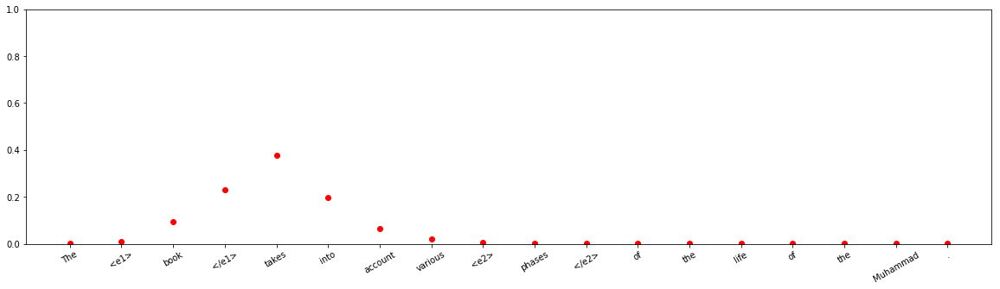



input sentence: As the <e1> downturn </e1> has made <e2> people </e2> more frugal , landfill volumes have dropped .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 5.695138e-08
Entity-Destination(e1,e2) 	:	 1.3978355e-08
Cause-Effect(e2,e1) 	:	 0.9956631
Member-Collection(e2,e1) 	:	 1.0380225e-08
Entity-Origin(e1,e2) 	:	 5.2716463e-11
Message-Topic(e1,e2) 	:	 1.350183e-11
Component-Whole(e1,e2) 	:	 3.4684564e-12
Component-Whole(e2,e1) 	:	 4.9021134e-12
Instrument-Agency(e2,e1) 	:	 3.0433182e-14
Content-Container(e1,e2) 	:	 1.9590109e-12
Product-Producer(e2,e1) 	:	 1.0356672e-08
Cause-Effect(e1,e2) 	:	 0.0042525316
Product-Producer(e1,e2) 	:	 7.974121e-05
Content-Container(e2,e1) 	:	 3.8922413e-10
Entity-Origin(e2,e1) 	:	 3.089974e-08
Message-Topic(e2,e1) 	:	 3.907058e-06
Instrument-Agency(e1,e2) 	:	 6.008456e-07
Member-Collection(e1,e2) 	:	 1.8948703e-09
Entity-Destination(e2,e1) 	:	 9.519505e-10



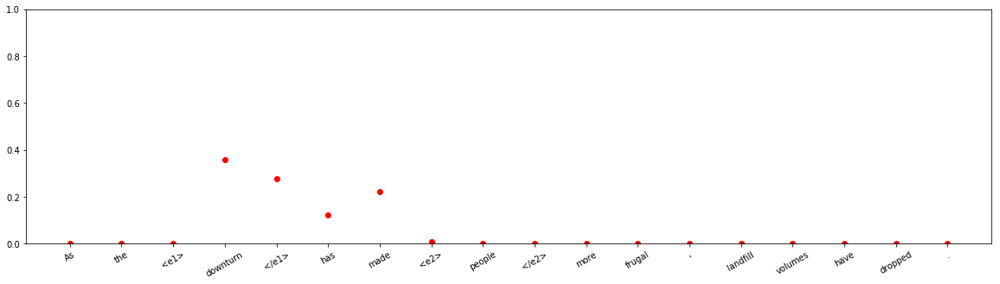





input sentence: The <e1> shell </e1> encloses a <e2> rod </e2> having a nickel layer with a phosphorous content .
answer label:    Content-Container(e2,e1)
wrong label:    Other
Other 	:	 0.99469334
Entity-Destination(e1,e2) 	:	 1.7459312e-11
Cause-Effect(e2,e1) 	:	 5.0158007e-12
Member-Collection(e2,e1) 	:	 1.1237018e-13
Entity-Origin(e1,e2) 	:	 3.149344e-12
Message-Topic(e1,e2) 	:	 1.136804e-14
Component-Whole(e1,e2) 	:	 2.8441839e-06
Component-Whole(e2,e1) 	:	 1.0978747e-05
Instrument-Agency(e2,e1) 	:	 1.4932532e-07
Content-Container(e1,e2) 	:	 0.0012246708
Product-Producer(e2,e1) 	:	 6.7246816e-07
Cause-Effect(e1,e2) 	:	 1.7725599e-11
Product-Producer(e1,e2) 	:	 4.7330395e-12
Content-Container(e2,e1) 	:	 0.00406553
Entity-Origin(e2,e1) 	:	 2.8636002e-10
Message-Topic(e2,e1) 	:	 1.4192357e-13
Instrument-Agency(e1,e2) 	:	 1.826259e-06
Member-Collection(e1,e2) 	:	 2.0923499e-11
Entity-Destination(e2,e1) 	:	 3.8807002e-10



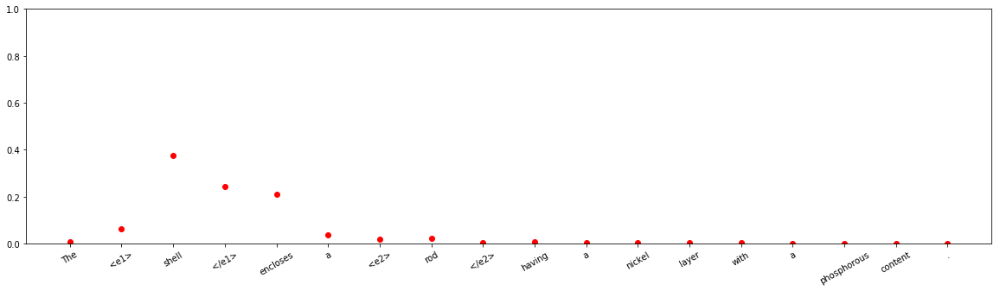


input sentence: Desperados is a CBBC children 's <e1> drama series </e1> following a wheelchair basketball <e2> team </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Product-Producer(e1,e2)
Other 	:	 0.010834541
Entity-Destination(e1,e2) 	:	 5.212814e-07
Cause-Effect(e2,e1) 	:	 5.63832e-07
Member-Collection(e2,e1) 	:	 5.285739e-06
Entity-Origin(e1,e2) 	:	 1.3825469e-07
Message-Topic(e1,e2) 	:	 0.1154918
Component-Whole(e1,e2) 	:	 3.9866507e-05
Component-Whole(e2,e1) 	:	 5.8414407e-06
Instrument-Agency(e2,e1) 	:	 1.2513102e-07
Content-Container(e1,e2) 	:	 7.196118e-07
Product-Producer(e2,e1) 	:	 1.3400672e-10
Cause-Effect(e1,e2) 	:	 8.109643e-08
Product-Producer(e1,e2) 	:	 0.554413
Content-Container(e2,e1) 	:	 7.480075e-09
Entity-Origin(e2,e1) 	:	 1.2700431e-10
Message-Topic(e2,e1) 	:	 0.002397826
Instrument-Agency(e1,e2) 	:	 0.31642294
Member-Collection(e1,e2) 	:	 0.00038668638
Entity-Destination(e2,e1) 	:	 4.8997855e-08



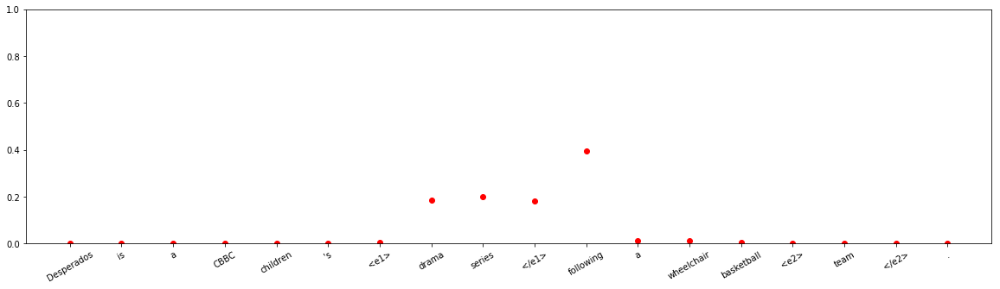




input sentence: The rainbow <e1> flower </e1> was made with spool knitted <e2> cord </e2> on a flower loom .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.08733245e-08
Entity-Destination(e1,e2) 	:	 5.3616725e-12
Cause-Effect(e2,e1) 	:	 2.9736678e-09
Member-Collection(e2,e1) 	:	 1.1771894e-13
Entity-Origin(e1,e2) 	:	 2.5225152e-06
Message-Topic(e1,e2) 	:	 8.7017733e-16
Component-Whole(e1,e2) 	:	 4.4184031e-10
Component-Whole(e2,e1) 	:	 0.99998367
Instrument-Agency(e2,e1) 	:	 7.351326e-09
Content-Container(e1,e2) 	:	 1.36866565e-05
Product-Producer(e2,e1) 	:	 1.6639963e-07
Cause-Effect(e1,e2) 	:	 1.775752e-10
Product-Producer(e1,e2) 	:	 2.7453906e-10
Content-Container(e2,e1) 	:	 1.350997e-08
Entity-Origin(e2,e1) 	:	 8.9125446e-13
Message-Topic(e2,e1) 	:	 5.17977e-12
Instrument-Agency(e1,e2) 	:	 1.5569082e-08
Member-Collection(e1,e2) 	:	 5.131303e-15
Entity-Destination(e2,e1) 	:	 3.7267495e-13



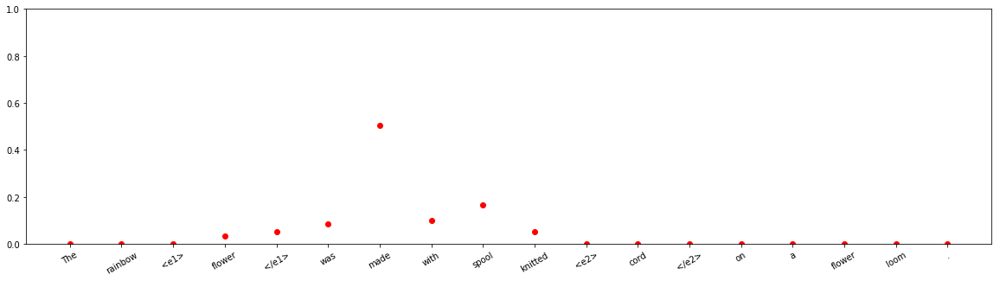









input sentence: The two central <e1> areas </e1> of controversy have to do with <e2> composition </e2> and titles .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.20457178
Entity-Destination(e1,e2) 	:	 2.1242937e-05
Cause-Effect(e2,e1) 	:	 8.2659235e-06
Member-Collection(e2,e1) 	:	 1.377732e-07
Entity-Origin(e1,e2) 	:	 8.232417e-10
Message-Topic(e1,e2) 	:	 0.13495038
Component-Whole(e1,e2) 	:	 0.0016244771
Component-Whole(e2,e1) 	:	 0.5996559
Instrument-Agency(e2,e1) 	:	 0.056330632
Content-Container(e1,e2) 	:	 2.4598785e-06
Product-Producer(e2,e1) 	:	 2.618657e-06
Cause-Effect(e1,e2) 	:	 0.00011147648
Product-Producer(e1,e2) 	:	 4.7453284e-07
Content-Container(e2,e1) 	:	 0.00061648444
Entity-Origin(e2,e1) 	:	 2.4100248e-07
Message-Topic(e2,e1) 	:	 0.0010330376
Instrument-Agency(e1,e2) 	:	 0.00107004
Member-Collection(e1,e2) 	:	 2.0969701e-10
Entity-Destination(e2,e1) 	:	 3.1533202e-07



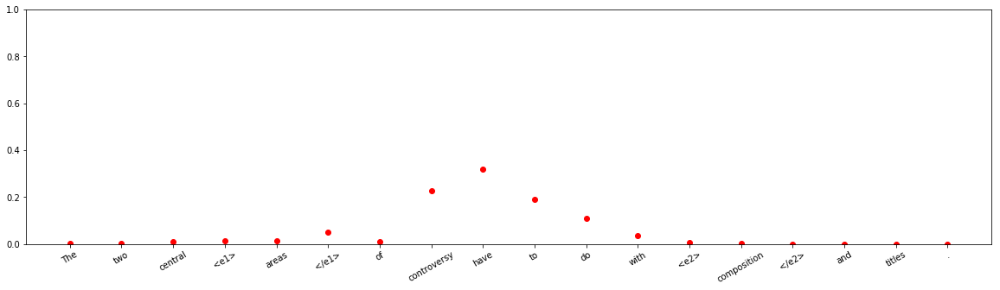







input sentence: Cooking and fermenting the <e1> grain </e1> produced a tasty nutritious <e2> drink </e2> which stored well .
answer label:    Entity-Origin(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.6693682e-06
Entity-Destination(e1,e2) 	:	 4.7754094e-09
Cause-Effect(e2,e1) 	:	 1.0253648e-09
Member-Collection(e2,e1) 	:	 3.2472174e-09
Entity-Origin(e1,e2) 	:	 0.014456802
Message-Topic(e1,e2) 	:	 7.736125e-10
Component-Whole(e1,e2) 	:	 1.4900832e-12
Component-Whole(e2,e1) 	:	 1.8114339e-10
Instrument-Agency(e2,e1) 	:	 8.8795065e-12
Content-Container(e1,e2) 	:	 4.796965e-06
Product-Producer(e2,e1) 	:	 0.9005757
Cause-Effect(e1,e2) 	:	 0.0053869863
Product-Producer(e1,e2) 	:	 1.0068236e-06
Content-Container(e2,e1) 	:	 5.1658673e-05
Entity-Origin(e2,e1) 	:	 0.07952143
Message-Topic(e2,e1) 	:	 1.28632935e-08
Instrument-Agency(e1,e2) 	:	 1.0327428e-09
Member-Collection(e1,e2) 	:	 1.1201404e-09
Entity-Destination(e2,e1) 	:	 2.543022e-12



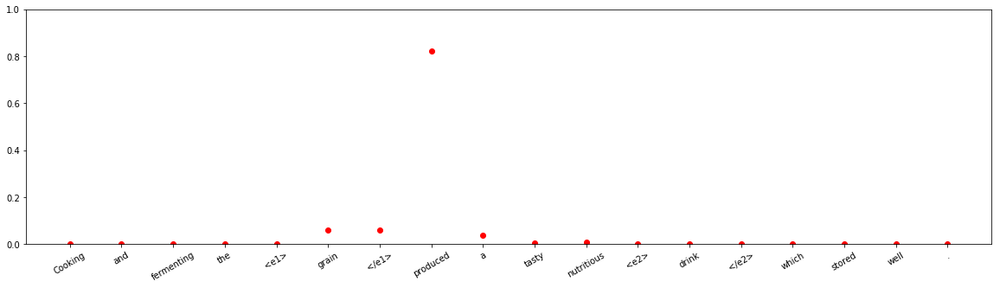


input sentence: The estranged <e1> couple </e1> transferred funds into these <e2> accounts </e2> from their own personal accounts .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 1.8054531e-09
Entity-Destination(e1,e2) 	:	 0.9675078
Cause-Effect(e2,e1) 	:	 8.937311e-15
Member-Collection(e2,e1) 	:	 3.0600753e-09
Entity-Origin(e1,e2) 	:	 3.643434e-05
Message-Topic(e1,e2) 	:	 1.7528923e-12
Component-Whole(e1,e2) 	:	 1.6031391e-11
Component-Whole(e2,e1) 	:	 1.6128231e-13
Instrument-Agency(e2,e1) 	:	 6.767825e-11
Content-Container(e1,e2) 	:	 3.468843e-07
Product-Producer(e2,e1) 	:	 0.032453947
Cause-Effect(e1,e2) 	:	 5.5356314e-12
Product-Producer(e1,e2) 	:	 1.7281522e-10
Content-Container(e2,e1) 	:	 1.3864591e-06
Entity-Origin(e2,e1) 	:	 3.0082807e-09
Message-Topic(e2,e1) 	:	 1.4264505e-09
Instrument-Agency(e1,e2) 	:	 6.153474e-14
Member-Collection(e1,e2) 	:	 1.108676e-07
Entity-Destination(e2,e1) 	:	 1.0852142e-11



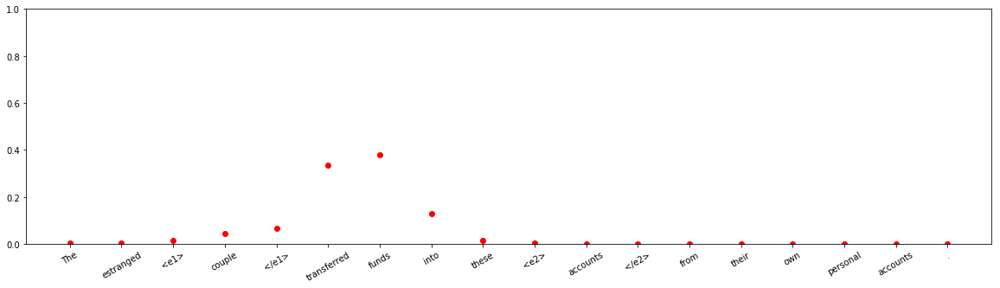


input sentence: Work was completed by <e1> contractors </e1> using a temporary <e2> entrance </e2> off Old Renwick Road .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 9.267883e-11
Entity-Destination(e1,e2) 	:	 1.5521613e-10
Cause-Effect(e2,e1) 	:	 8.994102e-12
Member-Collection(e2,e1) 	:	 4.8790473e-14
Entity-Origin(e1,e2) 	:	 3.4909142e-08
Message-Topic(e1,e2) 	:	 4.3298228e-15
Component-Whole(e1,e2) 	:	 1.2253478e-14
Component-Whole(e2,e1) 	:	 1.3084258e-09
Instrument-Agency(e2,e1) 	:	 1.0
Content-Container(e1,e2) 	:	 8.71242e-14
Product-Producer(e2,e1) 	:	 3.9064112e-08
Cause-Effect(e1,e2) 	:	 1.041324e-15
Product-Producer(e1,e2) 	:	 5.2908275e-13
Content-Container(e2,e1) 	:	 1.8051823e-12
Entity-Origin(e2,e1) 	:	 1.3842158e-16
Message-Topic(e2,e1) 	:	 4.064644e-12
Instrument-Agency(e1,e2) 	:	 3.2030034e-08
Member-Collection(e1,e2) 	:	 8.202127e-14
Entity-Destination(e2,e1) 	:	 2.7136092e-15



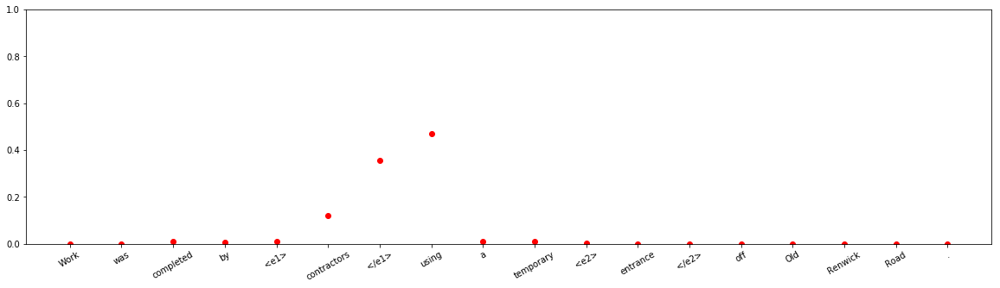








input sentence: However several <e1> problems </e1> were pointed out during the course of this feasibility <e2> study </e2> .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 2.172482e-12
Entity-Destination(e1,e2) 	:	 2.3811676e-08
Cause-Effect(e2,e1) 	:	 9.874769e-08
Member-Collection(e2,e1) 	:	 2.7885954e-09
Entity-Origin(e1,e2) 	:	 1.1393913e-08
Message-Topic(e1,e2) 	:	 3.503829e-05
Component-Whole(e1,e2) 	:	 4.3069663e-06
Component-Whole(e2,e1) 	:	 2.0516899e-07
Instrument-Agency(e2,e1) 	:	 8.531373e-08
Content-Container(e1,e2) 	:	 4.304675e-10
Product-Producer(e2,e1) 	:	 3.8105225e-07
Cause-Effect(e1,e2) 	:	 4.352417e-07
Product-Producer(e1,e2) 	:	 2.201102e-09
Content-Container(e2,e1) 	:	 6.3313585e-09
Entity-Origin(e2,e1) 	:	 9.414643e-09
Message-Topic(e2,e1) 	:	 0.99995935
Instrument-Agency(e1,e2) 	:	 6.334133e-10
Member-Collection(e1,e2) 	:	 1.4717177e-11
Entity-Destination(e2,e1) 	:	 1.0379882e-11



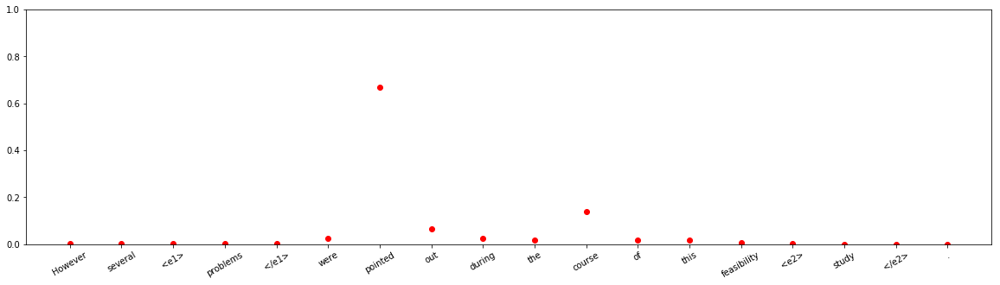













input sentence: A <e1> person </e1> who prepares baked <e2> goods </e2> as a profession is called a baker .
answer label:    Product-Producer(e2,e1)
wrong label:    Other
Other 	:	 0.9995536
Entity-Destination(e1,e2) 	:	 4.3151016e-13
Cause-Effect(e2,e1) 	:	 1.575974e-12
Member-Collection(e2,e1) 	:	 2.7506005e-12
Entity-Origin(e1,e2) 	:	 9.836035e-11
Message-Topic(e1,e2) 	:	 3.3329633e-10
Component-Whole(e1,e2) 	:	 1.3865204e-15
Component-Whole(e2,e1) 	:	 4.5052793e-13
Instrument-Agency(e2,e1) 	:	 9.724318e-05
Content-Container(e1,e2) 	:	 3.4663217e-10
Product-Producer(e2,e1) 	:	 0.0003490109
Cause-Effect(e1,e2) 	:	 4.0608814e-10
Product-Producer(e1,e2) 	:	 7.668714e-12
Content-Container(e2,e1) 	:	 4.629491e-09
Entity-Origin(e2,e1) 	:	 1.0707746e-07
Message-Topic(e2,e1) 	:	 4.529031e-10
Instrument-Agency(e1,e2) 	:	 5.2306737e-09
Member-Collection(e1,e2) 	:	 3.366501e-09
Entity-Destination(e2,e1) 	:	 4.4384188e-13



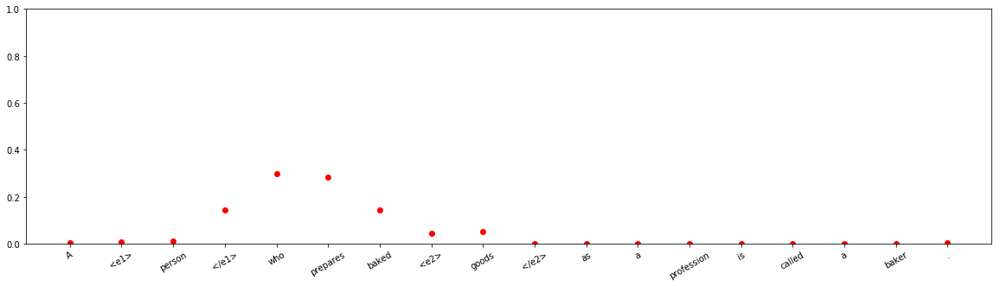









input sentence: The <e1> energy </e1> is going away from the <e2> source </e2> at the group velocity Cg .
answer label:    Cause-Effect(e2,e1)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 4.1576023e-10
Entity-Destination(e1,e2) 	:	 1.4036505e-08
Cause-Effect(e2,e1) 	:	 3.4786586e-07
Member-Collection(e2,e1) 	:	 1.4937977e-14
Entity-Origin(e1,e2) 	:	 0.99999964
Message-Topic(e1,e2) 	:	 2.3819931e-17
Component-Whole(e1,e2) 	:	 1.0590889e-11
Component-Whole(e2,e1) 	:	 3.515616e-12
Instrument-Agency(e2,e1) 	:	 4.9723165e-14
Content-Container(e1,e2) 	:	 7.419042e-13
Product-Producer(e2,e1) 	:	 1.9703577e-14
Cause-Effect(e1,e2) 	:	 5.3306663e-16
Product-Producer(e1,e2) 	:	 1.8301632e-09
Content-Container(e2,e1) 	:	 5.749995e-14
Entity-Origin(e2,e1) 	:	 5.9625646e-12
Message-Topic(e2,e1) 	:	 1.3501689e-11
Instrument-Agency(e1,e2) 	:	 6.5932926e-11
Member-Collection(e1,e2) 	:	 2.1478411e-11
Entity-Destination(e2,e1) 	:	 1.5108922e-15



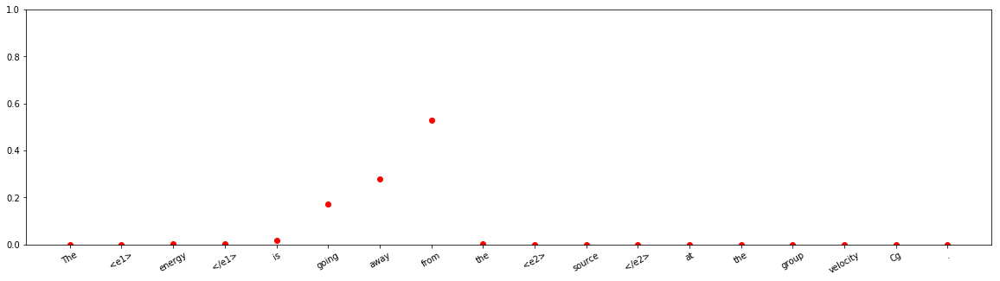




input sentence: The <e1> dialogue </e1> at the Summit also covered the <e2> economic impact </e2> of ICT literacy .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9999995
Entity-Destination(e1,e2) 	:	 3.641956e-17
Cause-Effect(e2,e1) 	:	 1.800249e-14
Member-Collection(e2,e1) 	:	 1.5181767e-16
Entity-Origin(e1,e2) 	:	 2.918988e-19
Message-Topic(e1,e2) 	:	 4.8078743e-07
Component-Whole(e1,e2) 	:	 2.2219702e-12
Component-Whole(e2,e1) 	:	 1.6818271e-13
Instrument-Agency(e2,e1) 	:	 2.7730465e-15
Content-Container(e1,e2) 	:	 3.2093013e-15
Product-Producer(e2,e1) 	:	 5.599822e-17
Cause-Effect(e1,e2) 	:	 1.3804536e-11
Product-Producer(e1,e2) 	:	 1.2711423e-14
Content-Container(e2,e1) 	:	 3.5015019e-16
Entity-Origin(e2,e1) 	:	 1.8473787e-14
Message-Topic(e2,e1) 	:	 2.3504992e-10
Instrument-Agency(e1,e2) 	:	 3.4493734e-12
Member-Collection(e1,e2) 	:	 8.843908e-15
Entity-Destination(e2,e1) 	:	 1.4504022e-15



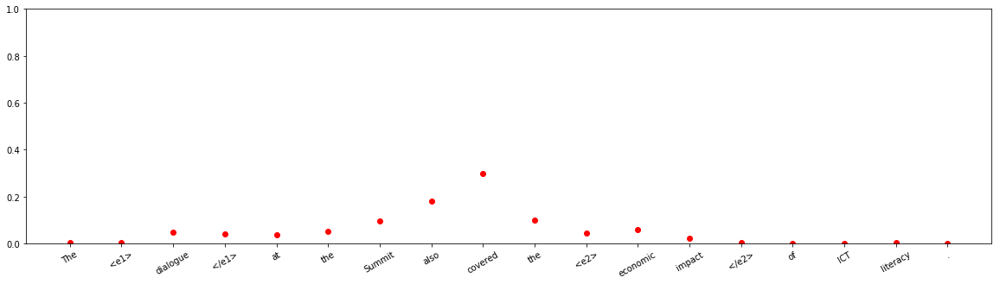




input sentence: A local FM <e1> radio </e1> keeps the town informed about local and international <e2> development </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.99999833
Entity-Destination(e1,e2) 	:	 1.4975449e-13
Cause-Effect(e2,e1) 	:	 2.8146973e-12
Member-Collection(e2,e1) 	:	 5.69814e-14
Entity-Origin(e1,e2) 	:	 5.1706827e-13
Message-Topic(e1,e2) 	:	 1.5477657e-06
Component-Whole(e1,e2) 	:	 1.4720425e-10
Component-Whole(e2,e1) 	:	 3.383343e-12
Instrument-Agency(e2,e1) 	:	 8.119126e-09
Content-Container(e1,e2) 	:	 1.3107328e-11
Product-Producer(e2,e1) 	:	 2.6594903e-11
Cause-Effect(e1,e2) 	:	 2.9234594e-11
Product-Producer(e1,e2) 	:	 6.9991034e-11
Content-Container(e2,e1) 	:	 2.4412373e-13
Entity-Origin(e2,e1) 	:	 8.399801e-12
Message-Topic(e2,e1) 	:	 8.235388e-08
Instrument-Agency(e1,e2) 	:	 6.23363e-10
Member-Collection(e1,e2) 	:	 7.400907e-11
Entity-Destination(e2,e1) 	:	 3.5706046e-13



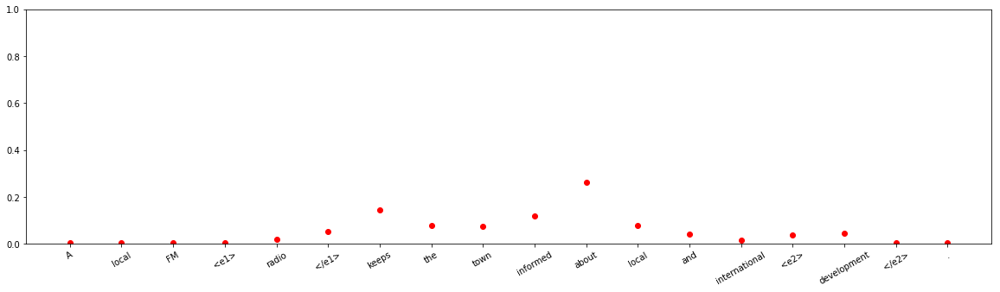


input sentence: The <e1> convict </e1> protects Pip with a <e2> claim </e2> that he stole the items himself .
answer label:    Product-Producer(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.0010336774
Entity-Destination(e1,e2) 	:	 1.1792197e-12
Cause-Effect(e2,e1) 	:	 1.7818722e-11
Member-Collection(e2,e1) 	:	 9.8265065e-14
Entity-Origin(e1,e2) 	:	 1.2289193e-09
Message-Topic(e1,e2) 	:	 3.0673722e-13
Component-Whole(e1,e2) 	:	 1.5116419e-10
Component-Whole(e2,e1) 	:	 9.705499e-06
Instrument-Agency(e2,e1) 	:	 0.997051
Content-Container(e1,e2) 	:	 2.2171774e-08
Product-Producer(e2,e1) 	:	 0.0019009152
Cause-Effect(e1,e2) 	:	 8.3073694e-11
Product-Producer(e1,e2) 	:	 1.482412e-11
Content-Container(e2,e1) 	:	 4.7126714e-06
Entity-Origin(e2,e1) 	:	 1.9252373e-12
Message-Topic(e2,e1) 	:	 4.8221323e-12
Instrument-Agency(e1,e2) 	:	 9.932868e-09
Member-Collection(e1,e2) 	:	 3.6142977e-12
Entity-Destination(e2,e1) 	:	 4.773902e-13



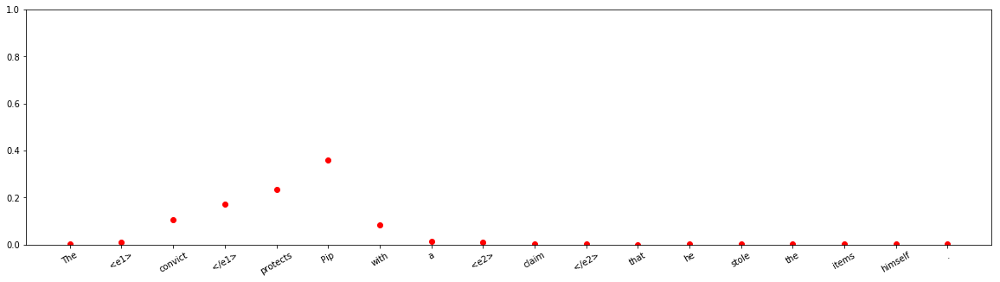






input sentence: The <e1> quarterback </e1> then wins the game with a `` Hail Mary '' <e2> pass </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.9935828
Entity-Destination(e1,e2) 	:	 9.534958e-10
Cause-Effect(e2,e1) 	:	 2.145655e-10
Member-Collection(e2,e1) 	:	 7.367415e-13
Entity-Origin(e1,e2) 	:	 2.7531272e-10
Message-Topic(e1,e2) 	:	 1.7210086e-12
Component-Whole(e1,e2) 	:	 8.8551074e-13
Component-Whole(e2,e1) 	:	 4.9824048e-11
Instrument-Agency(e2,e1) 	:	 0.0063012713
Content-Container(e1,e2) 	:	 1.563554e-08
Product-Producer(e2,e1) 	:	 0.00011568698
Cause-Effect(e1,e2) 	:	 2.8221123e-09
Product-Producer(e1,e2) 	:	 1.4932212e-11
Content-Container(e2,e1) 	:	 7.6419184e-08
Entity-Origin(e2,e1) 	:	 3.8349695e-11
Message-Topic(e2,e1) 	:	 3.3281275e-10
Instrument-Agency(e1,e2) 	:	 1.2469468e-07
Member-Collection(e1,e2) 	:	 1.6811159e-08
Entity-Destination(e2,e1) 	:	 1.1174733e-11



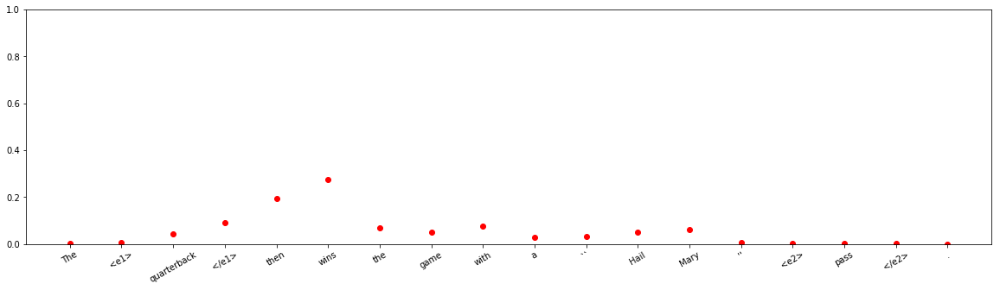


input sentence: EU enlargement <e1> policy </e1> was presented as a central instrument for EU conflict <e2> prevention </e2> .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 8.054208e-07
Entity-Destination(e1,e2) 	:	 2.4717103e-06
Cause-Effect(e2,e1) 	:	 9.004437e-05
Member-Collection(e2,e1) 	:	 1.7256398e-05
Entity-Origin(e1,e2) 	:	 0.00013960079
Message-Topic(e1,e2) 	:	 0.5510853
Component-Whole(e1,e2) 	:	 0.00033620792
Component-Whole(e2,e1) 	:	 0.1361674
Instrument-Agency(e2,e1) 	:	 7.05122e-06
Content-Container(e1,e2) 	:	 1.6573734e-06
Product-Producer(e2,e1) 	:	 2.3043212e-07
Cause-Effect(e1,e2) 	:	 0.05229695
Product-Producer(e1,e2) 	:	 2.7170112e-05
Content-Container(e2,e1) 	:	 1.5023404e-07
Entity-Origin(e2,e1) 	:	 6.8994095e-06
Message-Topic(e2,e1) 	:	 0.25976372
Instrument-Agency(e1,e2) 	:	 5.6958906e-05
Member-Collection(e1,e2) 	:	 1.729655e-07
Entity-Destination(e2,e1) 	:	 1.5658852e-08



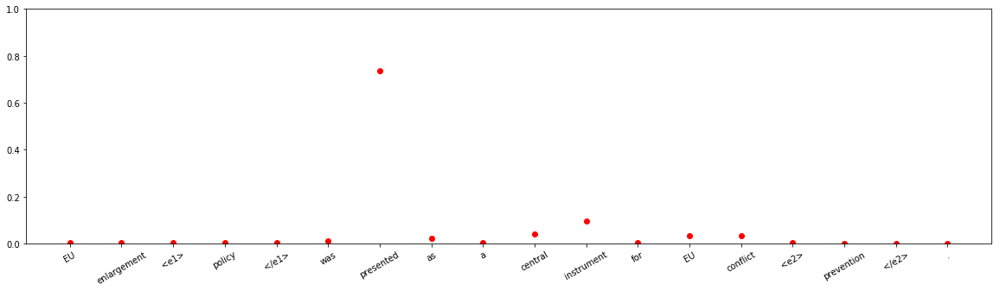










input sentence: The clutch holder was made with a <e1> lathe </e1> by a <e2> friend </e2> of mine .
answer label:    Instrument-Agency(e1,e2)
wrong label:    Product-Producer(e1,e2)
Other 	:	 7.0936585e-06
Entity-Destination(e1,e2) 	:	 8.445431e-15
Cause-Effect(e2,e1) 	:	 3.1462204e-09
Member-Collection(e2,e1) 	:	 3.5616207e-13
Entity-Origin(e1,e2) 	:	 5.1800946e-08
Message-Topic(e1,e2) 	:	 1.5213377e-16
Component-Whole(e1,e2) 	:	 2.3581503e-09
Component-Whole(e2,e1) 	:	 1.0531581e-10
Instrument-Agency(e2,e1) 	:	 1.362455e-12
Content-Container(e1,e2) 	:	 3.1659575e-10
Product-Producer(e2,e1) 	:	 5.5485887e-11
Cause-Effect(e1,e2) 	:	 3.3455983e-16
Product-Producer(e1,e2) 	:	 0.9893272
Content-Container(e2,e1) 	:	 4.4630144e-13
Entity-Origin(e2,e1) 	:	 4.9133578e-15
Message-Topic(e2,e1) 	:	 2.8148052e-12
Instrument-Agency(e1,e2) 	:	 0.01066569
Member-Collection(e1,e2) 	:	 3.7782377e-09
Entity-Destination(e2,e1) 	:	 1.8512013e-13



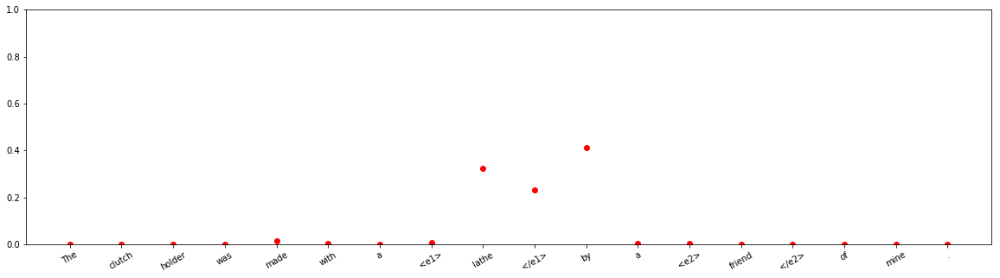



input sentence: Most of the <e1> verses </e1> of the plantation songs had some reference to <e2> freedom </e2> .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.99903935
Entity-Destination(e1,e2) 	:	 6.6161384e-14
Cause-Effect(e2,e1) 	:	 2.4894363e-11
Member-Collection(e2,e1) 	:	 4.450019e-12
Entity-Origin(e1,e2) 	:	 2.5262756e-12
Message-Topic(e1,e2) 	:	 0.0009604446
Component-Whole(e1,e2) 	:	 3.61557e-08
Component-Whole(e2,e1) 	:	 6.5554645e-11
Instrument-Agency(e2,e1) 	:	 2.1974143e-11
Content-Container(e1,e2) 	:	 3.994672e-09
Product-Producer(e2,e1) 	:	 7.974899e-13
Cause-Effect(e1,e2) 	:	 2.944189e-09
Product-Producer(e1,e2) 	:	 3.5611105e-09
Content-Container(e2,e1) 	:	 2.6165665e-11
Entity-Origin(e2,e1) 	:	 1.01887165e-08
Message-Topic(e2,e1) 	:	 3.481958e-08
Instrument-Agency(e1,e2) 	:	 9.9678985e-08
Member-Collection(e1,e2) 	:	 1.461883e-10
Entity-Destination(e2,e1) 	:	 1.4457792e-12



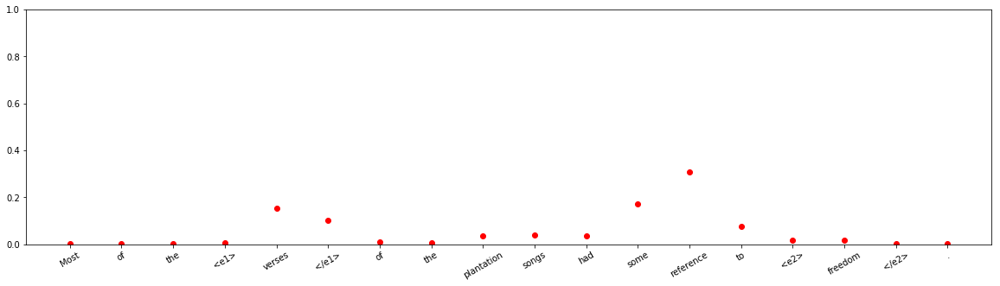











input sentence: The deepest <e1> portion </e1> of the photosphere is the source of a continuous <e2> spectrum </e2> .
answer label:    Entity-Origin(e2,e1)
wrong label:    Other
Other 	:	 0.99998665
Entity-Destination(e1,e2) 	:	 5.6893306e-14
Cause-Effect(e2,e1) 	:	 1.7950606e-08
Member-Collection(e2,e1) 	:	 1.4175838e-10
Entity-Origin(e1,e2) 	:	 4.448013e-13
Message-Topic(e1,e2) 	:	 1.4192213e-09
Component-Whole(e1,e2) 	:	 1.251748e-05
Component-Whole(e2,e1) 	:	 2.0597868e-08
Instrument-Agency(e2,e1) 	:	 1.5001912e-10
Content-Container(e1,e2) 	:	 2.219919e-10
Product-Producer(e2,e1) 	:	 2.309414e-12
Cause-Effect(e1,e2) 	:	 6.38245e-07
Product-Producer(e1,e2) 	:	 1.6531047e-11
Content-Container(e2,e1) 	:	 1.2972461e-07
Entity-Origin(e2,e1) 	:	 6.3807676e-08
Message-Topic(e2,e1) 	:	 1.04807954e-10
Instrument-Agency(e1,e2) 	:	 3.330228e-08
Member-Collection(e1,e2) 	:	 9.913446e-11
Entity-Destination(e2,e1) 	:	 7.87167e-12



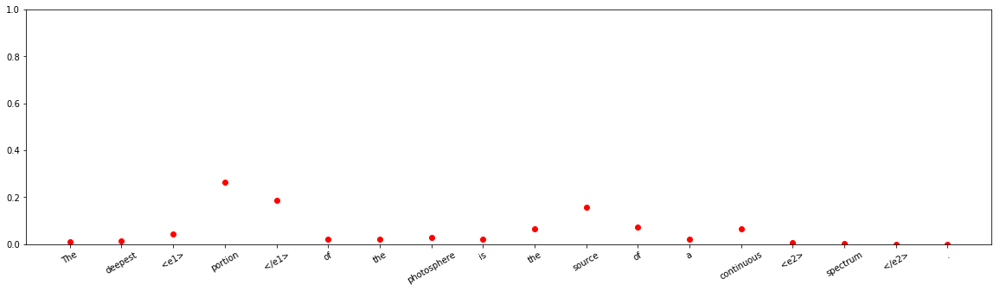



input sentence: The arts minister eagerly put this famous <e1> oil painting </e1> into a cultural <e2> frame </e2> .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 3.4138118e-14
Entity-Destination(e1,e2) 	:	 1.0
Cause-Effect(e2,e1) 	:	 3.3033643e-17
Member-Collection(e2,e1) 	:	 4.273736e-14
Entity-Origin(e1,e2) 	:	 1.0478188e-08
Message-Topic(e1,e2) 	:	 3.7735003e-11
Component-Whole(e1,e2) 	:	 1.6616185e-10
Component-Whole(e2,e1) 	:	 9.900298e-14
Instrument-Agency(e2,e1) 	:	 3.413185e-15
Content-Container(e1,e2) 	:	 3.5864804e-09
Product-Producer(e2,e1) 	:	 8.081706e-12
Cause-Effect(e1,e2) 	:	 1.4161122e-16
Product-Producer(e1,e2) 	:	 4.1102256e-13
Content-Container(e2,e1) 	:	 1.6623491e-12
Entity-Origin(e2,e1) 	:	 2.1730084e-13
Message-Topic(e2,e1) 	:	 1.550825e-12
Instrument-Agency(e1,e2) 	:	 2.2993133e-16
Member-Collection(e1,e2) 	:	 8.493016e-11
Entity-Destination(e2,e1) 	:	 4.4227666e-14



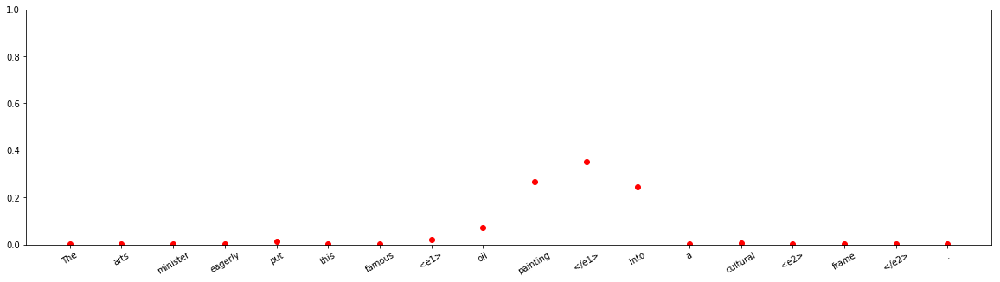











input sentence: The Israeli <e1> media </e1> treated the event with a <e2> mixture </e2> of derision and pity .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 1.862281e-09
Entity-Destination(e1,e2) 	:	 2.0922746e-08
Cause-Effect(e2,e1) 	:	 7.2295636e-09
Member-Collection(e2,e1) 	:	 4.673704e-07
Entity-Origin(e1,e2) 	:	 1.579771e-07
Message-Topic(e1,e2) 	:	 1.12466346e-07
Component-Whole(e1,e2) 	:	 6.6826294e-10
Component-Whole(e2,e1) 	:	 9.452246e-06
Instrument-Agency(e2,e1) 	:	 0.9989091
Content-Container(e1,e2) 	:	 3.6521982e-08
Product-Producer(e2,e1) 	:	 5.596426e-06
Cause-Effect(e1,e2) 	:	 6.6000865e-07
Product-Producer(e1,e2) 	:	 5.9113525e-10
Content-Container(e2,e1) 	:	 0.0010729139
Entity-Origin(e2,e1) 	:	 1.4344792e-10
Message-Topic(e2,e1) 	:	 3.0659666e-11
Instrument-Agency(e1,e2) 	:	 1.4617108e-06
Member-Collection(e1,e2) 	:	 2.234345e-09
Entity-Destination(e2,e1) 	:	 7.926024e-12



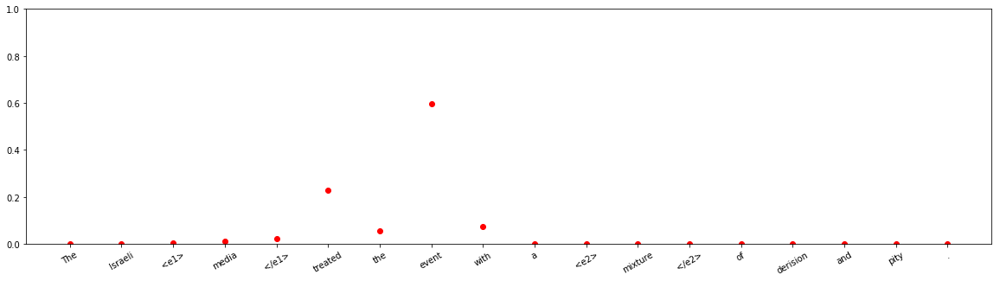







input sentence: His tenure was marked by absolute discipline among the <e1> staff </e1> of the <e2> hospital </e2> .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 5.8751386e-05
Entity-Destination(e1,e2) 	:	 7.498927e-08
Cause-Effect(e2,e1) 	:	 7.0654883e-06
Member-Collection(e2,e1) 	:	 0.5220058
Entity-Origin(e1,e2) 	:	 7.6597604e-07
Message-Topic(e1,e2) 	:	 1.1776117e-06
Component-Whole(e1,e2) 	:	 0.39652276
Component-Whole(e2,e1) 	:	 1.5157897e-06
Instrument-Agency(e2,e1) 	:	 0.0020227865
Content-Container(e1,e2) 	:	 8.7401077e-07
Product-Producer(e2,e1) 	:	 2.5665378e-05
Cause-Effect(e1,e2) 	:	 1.1495569e-08
Product-Producer(e1,e2) 	:	 3.116744e-05
Content-Container(e2,e1) 	:	 2.1136987e-07
Entity-Origin(e2,e1) 	:	 6.837935e-09
Message-Topic(e2,e1) 	:	 0.0024220727
Instrument-Agency(e1,e2) 	:	 0.015867142
Member-Collection(e1,e2) 	:	 0.061032236
Entity-Destination(e2,e1) 	:	 9.90938e-10



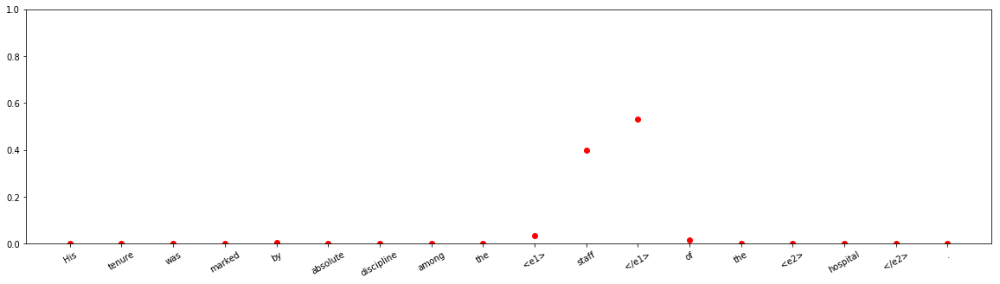





input sentence: It was in this period that the new <e1> religion </e1> spread into the <e2> empire </e2> .
answer label:    Entity-Destination(e1,e2)
wrong label:    Other
Other 	:	 0.9999727
Entity-Destination(e1,e2) 	:	 2.2743669e-05
Cause-Effect(e2,e1) 	:	 2.4344351e-11
Member-Collection(e2,e1) 	:	 2.3398564e-11
Entity-Origin(e1,e2) 	:	 3.0048707e-11
Message-Topic(e1,e2) 	:	 2.7790738e-06
Component-Whole(e1,e2) 	:	 1.4279473e-07
Component-Whole(e2,e1) 	:	 1.3918764e-13
Instrument-Agency(e2,e1) 	:	 1.9120413e-12
Content-Container(e1,e2) 	:	 8.8549575e-07
Product-Producer(e2,e1) 	:	 2.142587e-11
Cause-Effect(e1,e2) 	:	 2.5201333e-08
Product-Producer(e1,e2) 	:	 7.416604e-10
Content-Container(e2,e1) 	:	 2.7426392e-10
Entity-Origin(e2,e1) 	:	 3.8808374e-09
Message-Topic(e2,e1) 	:	 1.9151666e-11
Instrument-Agency(e1,e2) 	:	 2.3356062e-08
Member-Collection(e1,e2) 	:	 8.646624e-07
Entity-Destination(e2,e1) 	:	 7.394646e-12



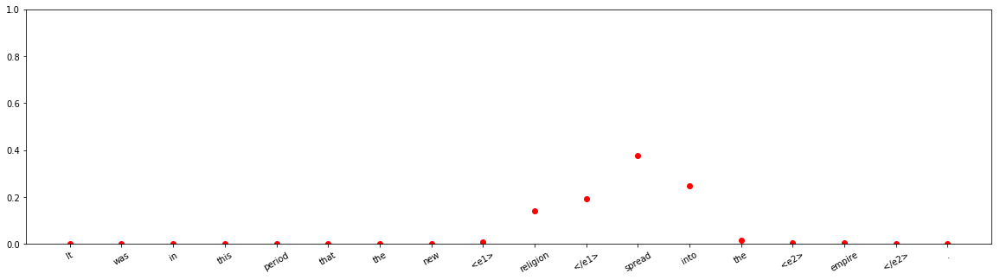




input sentence: The next two <e1> generations </e1> have departed into an uncertain <e2> future survival </e2> without Mother .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 0.1365685
Entity-Destination(e1,e2) 	:	 0.86339635
Cause-Effect(e2,e1) 	:	 1.2781863e-13
Member-Collection(e2,e1) 	:	 2.551695e-11
Entity-Origin(e1,e2) 	:	 3.0419326e-06
Message-Topic(e1,e2) 	:	 1.0234574e-09
Component-Whole(e1,e2) 	:	 4.2707327e-08
Component-Whole(e2,e1) 	:	 1.4127713e-13
Instrument-Agency(e2,e1) 	:	 6.3437225e-14
Content-Container(e1,e2) 	:	 3.2340847e-07
Product-Producer(e2,e1) 	:	 2.5841596e-06
Cause-Effect(e1,e2) 	:	 4.85542e-10
Product-Producer(e1,e2) 	:	 2.221049e-10
Content-Container(e2,e1) 	:	 1.3863227e-10
Entity-Origin(e2,e1) 	:	 7.546017e-07
Message-Topic(e2,e1) 	:	 1.2952456e-09
Instrument-Agency(e1,e2) 	:	 7.049139e-11
Member-Collection(e1,e2) 	:	 2.8370092e-05
Entity-Destination(e2,e1) 	:	 4.222668e-12



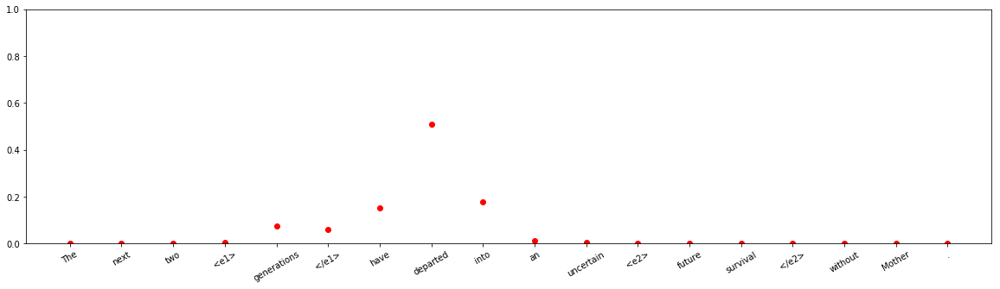


input sentence: Additionally , all <e1> hydrants </e1> and valves are pressure tested at the manufacturing <e2> facility </e2> .
answer label:    Product-Producer(e1,e2)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 1.0148981e-06
Entity-Destination(e1,e2) 	:	 1.5817266e-09
Cause-Effect(e2,e1) 	:	 4.4531416e-06
Member-Collection(e2,e1) 	:	 4.171268e-14
Entity-Origin(e1,e2) 	:	 6.448734e-09
Message-Topic(e1,e2) 	:	 3.0622401e-12
Component-Whole(e1,e2) 	:	 0.16420527
Component-Whole(e2,e1) 	:	 1.2656775e-08
Instrument-Agency(e2,e1) 	:	 8.211304e-07
Content-Container(e1,e2) 	:	 4.4957858e-07
Product-Producer(e2,e1) 	:	 3.5311896e-09
Cause-Effect(e1,e2) 	:	 2.0635834e-08
Product-Producer(e1,e2) 	:	 0.00036443438
Content-Container(e2,e1) 	:	 2.4430145e-08
Entity-Origin(e2,e1) 	:	 3.616605e-09
Message-Topic(e2,e1) 	:	 1.4545336e-09
Instrument-Agency(e1,e2) 	:	 0.8354235
Member-Collection(e1,e2) 	:	 8.294075e-09
Entity-Destination(e2,e1) 	:	 9.9363025e-11



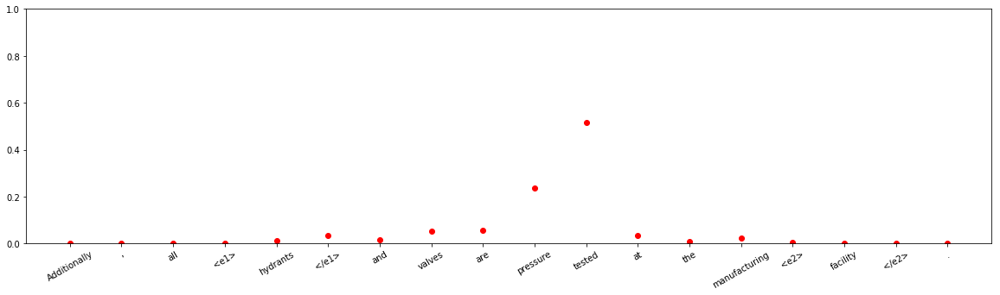






input sentence: In addition , the <e1> plant </e1> builds four-cylinder `` Ecotec '' that are used in <e2> vehicles </e2> like the Chevy Malibu and Cobalt .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 2.2494269e-05
Entity-Destination(e1,e2) 	:	 1.442746e-09
Cause-Effect(e2,e1) 	:	 7.797705e-08
Member-Collection(e2,e1) 	:	 1.906402e-09
Entity-Origin(e1,e2) 	:	 4.479165e-06
Message-Topic(e1,e2) 	:	 5.0494324e-09
Component-Whole(e1,e2) 	:	 2.3332202e-06
Component-Whole(e2,e1) 	:	 1.205562e-05
Instrument-Agency(e2,e1) 	:	 0.774173
Content-Container(e1,e2) 	:	 1.5073749e-07
Product-Producer(e2,e1) 	:	 0.008686191
Cause-Effect(e1,e2) 	:	 1.7078458e-08
Product-Producer(e1,e2) 	:	 3.3481622e-06
Content-Container(e2,e1) 	:	 6.799891e-08
Entity-Origin(e2,e1) 	:	 2.4926137e-09
Message-Topic(e2,e1) 	:	 9.8478295e-11
Instrument-Agency(e1,e2) 	:	 0.21709555
Member-Collection(e1,e2) 	:	 1.870135e-07
Entity-Destination(e2,e1) 	:	 1.631875e-11



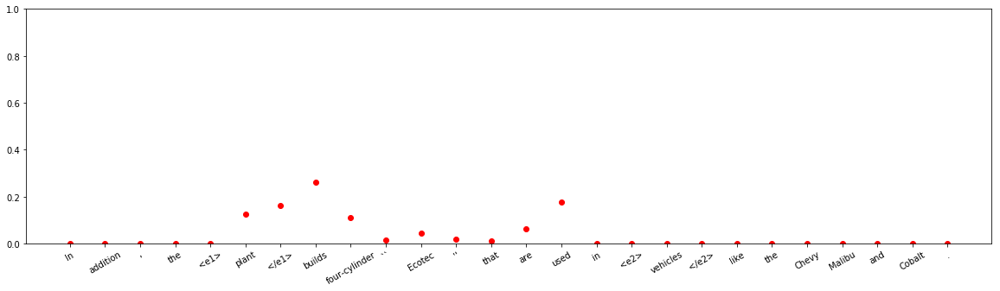



input sentence: With our help , non-profit human service <e1> organizations </e1> effectively manage their <e2> resources </e2> and succeed in the modern era of human services .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 4.6616924e-16
Cause-Effect(e2,e1) 	:	 9.814153e-14
Member-Collection(e2,e1) 	:	 2.000661e-15
Entity-Origin(e1,e2) 	:	 2.9128742e-17
Message-Topic(e1,e2) 	:	 3.7644676e-13
Component-Whole(e1,e2) 	:	 3.1368002e-16
Component-Whole(e2,e1) 	:	 6.991889e-17
Instrument-Agency(e2,e1) 	:	 2.1906422e-08
Content-Container(e1,e2) 	:	 6.1984473e-15
Product-Producer(e2,e1) 	:	 1.16862145e-11
Cause-Effect(e1,e2) 	:	 3.455794e-13
Product-Producer(e1,e2) 	:	 2.033104e-16
Content-Container(e2,e1) 	:	 1.8853713e-15
Entity-Origin(e2,e1) 	:	 3.8924798e-16
Message-Topic(e2,e1) 	:	 8.937562e-13
Instrument-Agency(e1,e2) 	:	 1.07373666e-10
Member-Collection(e1,e2) 	:	 7.1284628e-12
Entity-Destination(e2,e1) 	:	 1.1836076e-16



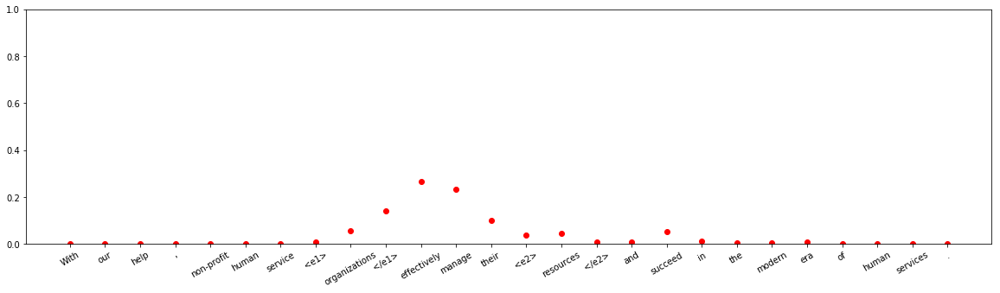



input sentence: A busy <e1> crew </e1> behind the counter assembles the sandwiches with two pieces of fried chicken <e2> breast </e2> , which are beautifully battered .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 4.047307e-08
Entity-Destination(e1,e2) 	:	 1.7579139e-09
Cause-Effect(e2,e1) 	:	 7.101152e-10
Member-Collection(e2,e1) 	:	 0.0004367908
Entity-Origin(e1,e2) 	:	 0.065831944
Message-Topic(e1,e2) 	:	 5.553219e-08
Component-Whole(e1,e2) 	:	 1.1125049e-05
Component-Whole(e2,e1) 	:	 0.5971681
Instrument-Agency(e2,e1) 	:	 0.08635705
Content-Container(e1,e2) 	:	 0.00088660856
Product-Producer(e2,e1) 	:	 0.22166981
Cause-Effect(e1,e2) 	:	 1.6312623e-07
Product-Producer(e1,e2) 	:	 4.2257384e-06
Content-Container(e2,e1) 	:	 0.027633846
Entity-Origin(e2,e1) 	:	 2.383146e-07
Message-Topic(e2,e1) 	:	 2.5646733e-08
Instrument-Agency(e1,e2) 	:	 1.1927565e-08
Member-Collection(e1,e2) 	:	 5.8725107e-08
Entity-Destination(e2,e1) 	:	 4.972728e-09


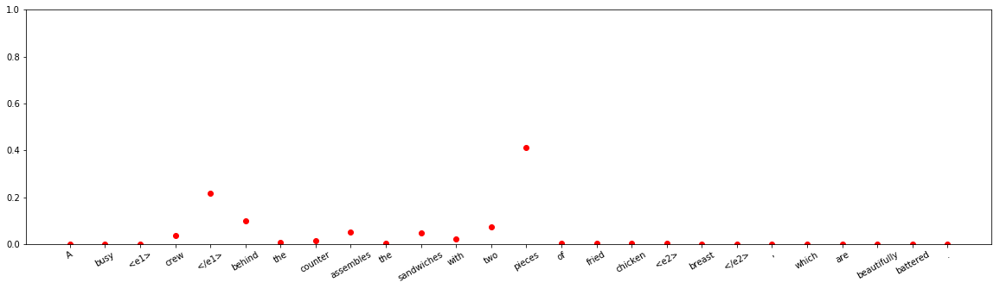



input sentence: <e1> Barrages </e1> make use of the potential <e2> energy </e2> in the difference in height ( or head ) between high and low tides .
answer label:    Other
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 5.4870445e-05
Entity-Destination(e1,e2) 	:	 1.0104001e-07
Cause-Effect(e2,e1) 	:	 0.113095924
Member-Collection(e2,e1) 	:	 1.3116863e-09
Entity-Origin(e1,e2) 	:	 1.0479959e-09
Message-Topic(e1,e2) 	:	 2.3203314e-05
Component-Whole(e1,e2) 	:	 0.017303295
Component-Whole(e2,e1) 	:	 1.0796581e-06
Instrument-Agency(e2,e1) 	:	 2.0568019e-05
Content-Container(e1,e2) 	:	 2.4244143e-10
Product-Producer(e2,e1) 	:	 1.1889327e-10
Cause-Effect(e1,e2) 	:	 0.008183693
Product-Producer(e1,e2) 	:	 1.6294284e-06
Content-Container(e2,e1) 	:	 4.8611055e-06
Entity-Origin(e2,e1) 	:	 3.006149e-08
Message-Topic(e2,e1) 	:	 2.580831e-09
Instrument-Agency(e1,e2) 	:	 0.8613108
Member-Collection(e1,e2) 	:	 5.1869002e-09
Entity-Destination(e2,e1) 	:	 3.2612193e-09



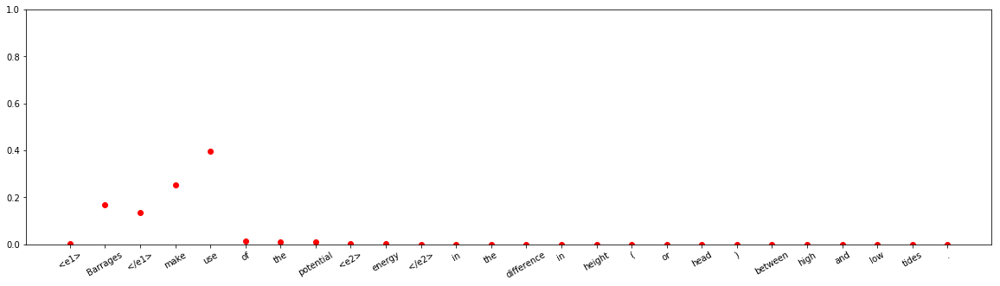


input sentence: The Meon <e1> activation </e1> was done with a light <e2> source </e2> by bouncing , splitting , and changing the color of the beams .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 5.580149e-05
Entity-Destination(e1,e2) 	:	 2.1879742e-07
Cause-Effect(e2,e1) 	:	 0.00030325944
Member-Collection(e2,e1) 	:	 4.675311e-10
Entity-Origin(e1,e2) 	:	 2.1915255e-06
Message-Topic(e1,e2) 	:	 1.1854814e-07
Component-Whole(e1,e2) 	:	 6.917638e-07
Component-Whole(e2,e1) 	:	 0.9995097
Instrument-Agency(e2,e1) 	:	 3.3356312e-06
Content-Container(e1,e2) 	:	 1.2034421e-08
Product-Producer(e2,e1) 	:	 3.215323e-07
Cause-Effect(e1,e2) 	:	 5.111835e-05
Product-Producer(e1,e2) 	:	 6.938646e-08
Content-Container(e2,e1) 	:	 2.3213905e-08
Entity-Origin(e2,e1) 	:	 2.5296678e-09
Message-Topic(e2,e1) 	:	 3.038797e-05
Instrument-Agency(e1,e2) 	:	 4.2709435e-05
Member-Collection(e1,e2) 	:	 1.9807639e-12
Entity-Destination(e2,e1) 	:	 1.5087508e-10



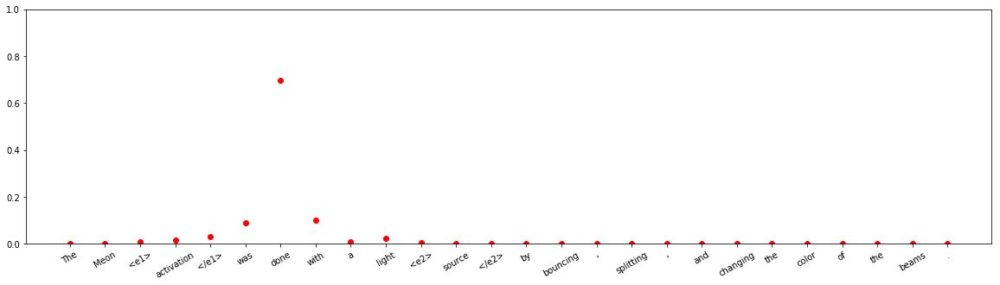












input sentence: Mosul 's al-Qaeda leader dies from carpal tunnel syndrome and a <e1> hailstorm </e1> of <e2> bullets </e2> - but mostly a hailstorm of bullets ...
answer label:    Member-Collection(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 4.1215226e-11
Entity-Destination(e1,e2) 	:	 3.4809563e-07
Cause-Effect(e2,e1) 	:	 0.027018903
Member-Collection(e2,e1) 	:	 0.4567544
Entity-Origin(e1,e2) 	:	 1.3662725e-07
Message-Topic(e1,e2) 	:	 1.3679445e-12
Component-Whole(e1,e2) 	:	 5.856128e-09
Component-Whole(e2,e1) 	:	 0.0019961554
Instrument-Agency(e2,e1) 	:	 0.51412934
Content-Container(e1,e2) 	:	 5.696729e-07
Product-Producer(e2,e1) 	:	 4.179574e-05
Cause-Effect(e1,e2) 	:	 9.656873e-07
Product-Producer(e1,e2) 	:	 2.799925e-09
Content-Container(e2,e1) 	:	 5.6044268e-05
Entity-Origin(e2,e1) 	:	 1.480949e-09
Message-Topic(e2,e1) 	:	 2.7468289e-08
Instrument-Agency(e1,e2) 	:	 1.3491302e-06
Member-Collection(e1,e2) 	:	 1.2813937e-08
Entity-Destination(e2,e1) 	:	 4.954

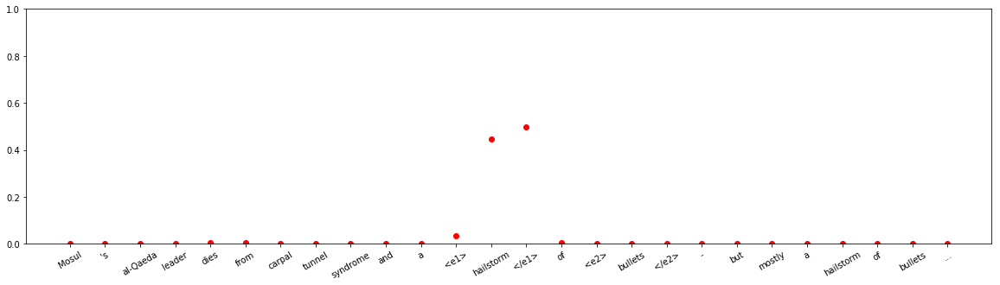



input sentence: As a result , the brain is depleted of <e1> dopamine </e1> , which causes the severe <e2> depression </e2> after the cocaine has dissipated .
answer label:    Other
wrong label:    Cause-Effect(e1,e2)
Other 	:	 3.6462305e-14
Entity-Destination(e1,e2) 	:	 1.2482714e-15
Cause-Effect(e2,e1) 	:	 1.05112996e-07
Member-Collection(e2,e1) 	:	 1.1607682e-15
Entity-Origin(e1,e2) 	:	 1.3566024e-18
Message-Topic(e1,e2) 	:	 6.837833e-13
Component-Whole(e1,e2) 	:	 4.6395944e-13
Component-Whole(e2,e1) 	:	 9.298756e-16
Instrument-Agency(e2,e1) 	:	 1.7883798e-15
Content-Container(e1,e2) 	:	 4.708456e-19
Product-Producer(e2,e1) 	:	 4.561915e-14
Cause-Effect(e1,e2) 	:	 0.9999999
Product-Producer(e1,e2) 	:	 3.4175361e-15
Content-Container(e2,e1) 	:	 2.6188655e-16
Entity-Origin(e2,e1) 	:	 2.1796072e-14
Message-Topic(e2,e1) 	:	 9.947537e-15
Instrument-Agency(e1,e2) 	:	 1.4509266e-14
Member-Collection(e1,e2) 	:	 1.9399716e-16
Entity-Destination(e2,e1) 	:	 4.4481625e-18



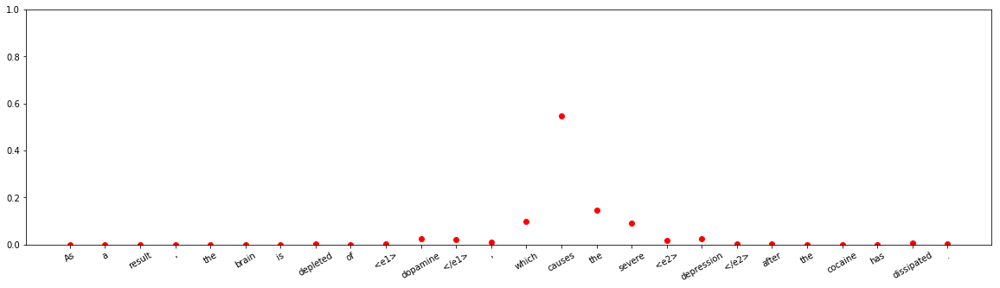



input sentence: Three friends are forced to question what keeps them together after a <e1> quarrel </e1> over the <e2> purchase </e2> of a work of art .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.0011167692
Entity-Destination(e1,e2) 	:	 2.3183795e-05
Cause-Effect(e2,e1) 	:	 0.044858716
Member-Collection(e2,e1) 	:	 3.0895917e-05
Entity-Origin(e1,e2) 	:	 2.0683253e-09
Message-Topic(e1,e2) 	:	 0.00056352
Component-Whole(e1,e2) 	:	 0.10266471
Component-Whole(e2,e1) 	:	 9.6538685e-08
Instrument-Agency(e2,e1) 	:	 0.8331555
Content-Container(e1,e2) 	:	 9.390592e-07
Product-Producer(e2,e1) 	:	 0.00062488654
Cause-Effect(e1,e2) 	:	 7.558362e-06
Product-Producer(e1,e2) 	:	 0.0001765131
Content-Container(e2,e1) 	:	 2.3791667e-05
Entity-Origin(e2,e1) 	:	 6.860777e-09
Message-Topic(e2,e1) 	:	 0.016155468
Instrument-Agency(e1,e2) 	:	 0.0005924872
Member-Collection(e1,e2) 	:	 1.3846562e-06
Entity-Destination(e2,e1) 	:	 3.591857e-06



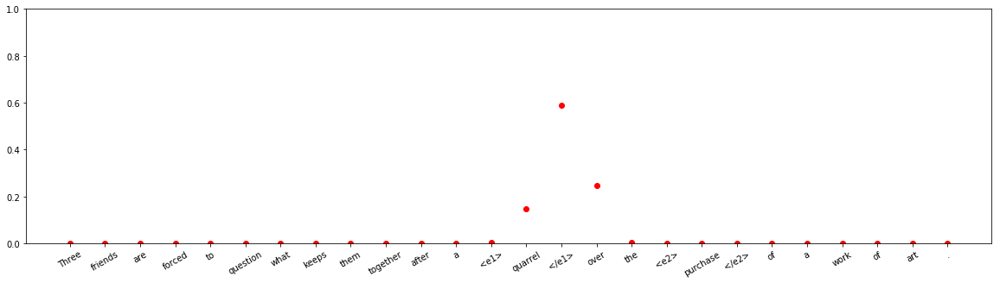








input sentence: The <e1> exaltation </e1> of the <e2> larks </e2> were heard in high-exalting by the mallards who were rather flushed from playing in the puddling .
answer label:    Member-Collection(e2,e1)
wrong label:    Component-Whole(e1,e2)
Other 	:	 3.815537e-06
Entity-Destination(e1,e2) 	:	 4.755201e-10
Cause-Effect(e2,e1) 	:	 0.00087474025
Member-Collection(e2,e1) 	:	 0.009877955
Entity-Origin(e1,e2) 	:	 9.718449e-09
Message-Topic(e1,e2) 	:	 3.7038102e-08
Component-Whole(e1,e2) 	:	 0.91223824
Component-Whole(e2,e1) 	:	 4.4104304e-08
Instrument-Agency(e2,e1) 	:	 4.530341e-08
Content-Container(e1,e2) 	:	 1.6828629e-11
Product-Producer(e2,e1) 	:	 1.5377994e-07
Cause-Effect(e1,e2) 	:	 2.858166e-06
Product-Producer(e1,e2) 	:	 5.062854e-07
Content-Container(e2,e1) 	:	 7.862813e-09
Entity-Origin(e2,e1) 	:	 7.650435e-09
Message-Topic(e2,e1) 	:	 0.07698776
Instrument-Agency(e1,e2) 	:	 2.3543773e-06
Member-Collection(e1,e2) 	:	 1.1660344e-05
Entity-Destination(e2,e1) 	:	 2.1814095

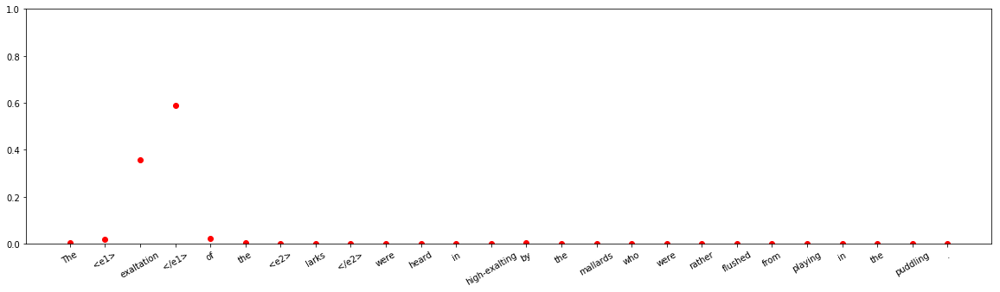









input sentence: The photodeflection <e1> technique </e1> or mirage method consists in periodically heating a sample with a pump <e2> laser </e2> modulated by an optical chopper .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.2716667e-08
Entity-Destination(e1,e2) 	:	 2.9573366e-10
Cause-Effect(e2,e1) 	:	 3.057489e-05
Member-Collection(e2,e1) 	:	 4.1318295e-09
Entity-Origin(e1,e2) 	:	 4.944992e-09
Message-Topic(e1,e2) 	:	 3.666029e-08
Component-Whole(e1,e2) 	:	 0.12921579
Component-Whole(e2,e1) 	:	 0.8694822
Instrument-Agency(e2,e1) 	:	 0.00124441
Content-Container(e1,e2) 	:	 3.1409343e-08
Product-Producer(e2,e1) 	:	 7.6392066e-11
Cause-Effect(e1,e2) 	:	 1.3304552e-06
Product-Producer(e1,e2) 	:	 1.08988175e-07
Content-Container(e2,e1) 	:	 8.557163e-07
Entity-Origin(e2,e1) 	:	 2.7273767e-12
Message-Topic(e2,e1) 	:	 7.0855766e-09
Instrument-Agency(e1,e2) 	:	 2.4694365e-05
Member-Collection(e1,e2) 	:	 3.6086707e-11
Entity-Destination(e2,e1) 	:	 7.388292e-

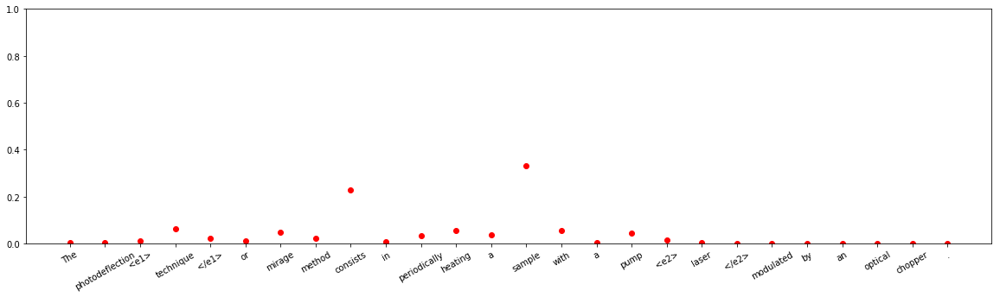


input sentence: Until 1864 <e1> vessels </e1> in the service of certain UK public offices defaced the Red Ensign with the <e2> badge </e2> of their office .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Other
Other 	:	 0.9998598
Entity-Destination(e1,e2) 	:	 2.535703e-14
Cause-Effect(e2,e1) 	:	 6.9513634e-10
Member-Collection(e2,e1) 	:	 9.105131e-12
Entity-Origin(e1,e2) 	:	 3.6733646e-12
Message-Topic(e1,e2) 	:	 9.755704e-11
Component-Whole(e1,e2) 	:	 2.2842946e-06
Component-Whole(e2,e1) 	:	 1.4774874e-09
Instrument-Agency(e2,e1) 	:	 0.00013774911
Content-Container(e1,e2) 	:	 5.103255e-10
Product-Producer(e2,e1) 	:	 1.0985566e-11
Cause-Effect(e1,e2) 	:	 4.4184388e-13
Product-Producer(e1,e2) 	:	 1.410044e-08
Content-Container(e2,e1) 	:	 2.348793e-08
Entity-Origin(e2,e1) 	:	 6.7714416e-13
Message-Topic(e2,e1) 	:	 1.405468e-09
Instrument-Agency(e1,e2) 	:	 6.200498e-08
Member-Collection(e1,e2) 	:	 6.310902e-11
Entity-Destination(e2,e1) 	:	 2.891639e-12



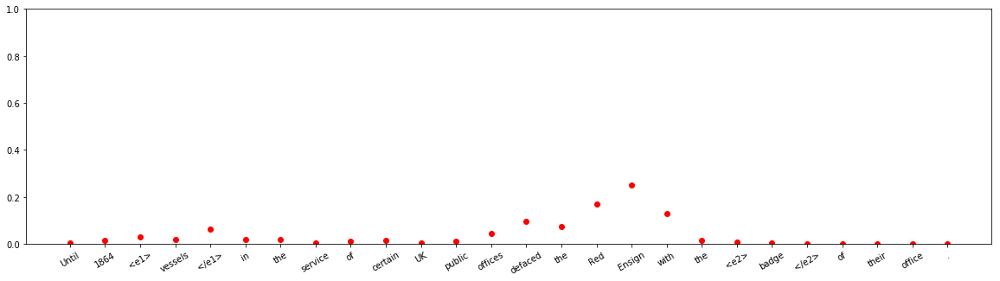


input sentence: Thus , the <e1> princess </e1> was born in the midst of the <e2> storm </e2> that swept over the world in March , 1848 .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 2.9095503e-08
Entity-Destination(e1,e2) 	:	 7.0193087e-09
Cause-Effect(e2,e1) 	:	 6.72257e-06
Member-Collection(e2,e1) 	:	 4.6539932e-07
Entity-Origin(e1,e2) 	:	 0.9988714
Message-Topic(e1,e2) 	:	 7.4108386e-10
Component-Whole(e1,e2) 	:	 1.852179e-07
Component-Whole(e2,e1) 	:	 4.7216776e-11
Instrument-Agency(e2,e1) 	:	 4.9356683e-09
Content-Container(e1,e2) 	:	 1.7609723e-08
Product-Producer(e2,e1) 	:	 1.4144239e-06
Cause-Effect(e1,e2) 	:	 1.6538617e-07
Product-Producer(e1,e2) 	:	 8.4458264e-08
Content-Container(e2,e1) 	:	 3.0048204e-11
Entity-Origin(e2,e1) 	:	 1.276334e-07
Message-Topic(e2,e1) 	:	 9.710759e-07
Instrument-Agency(e1,e2) 	:	 4.5431492e-11
Member-Collection(e1,e2) 	:	 0.001118406
Entity-Destination(e2,e1) 	:	 1.6125227e-12



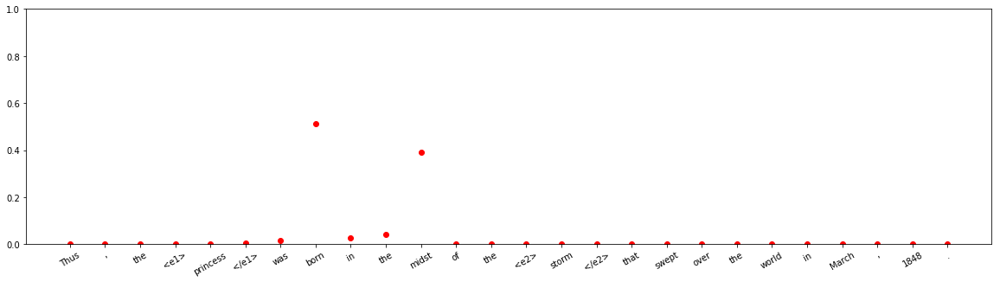










input sentence: Washington 's <e1> forces </e1> defeated the British in 1781 with the help of French <e2> troops </e2> and German military officer Baron Von Steuben .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 1.621082e-05
Entity-Destination(e1,e2) 	:	 1.596138e-07
Cause-Effect(e2,e1) 	:	 4.2494483e-07
Member-Collection(e2,e1) 	:	 0.03521797
Entity-Origin(e1,e2) 	:	 0.00068492175
Message-Topic(e1,e2) 	:	 5.2461934e-07
Component-Whole(e1,e2) 	:	 1.011385e-05
Component-Whole(e2,e1) 	:	 3.750038e-08
Instrument-Agency(e2,e1) 	:	 0.29727763
Content-Container(e1,e2) 	:	 5.779465e-07
Product-Producer(e2,e1) 	:	 9.989897e-05
Cause-Effect(e1,e2) 	:	 1.7993221e-08
Product-Producer(e1,e2) 	:	 0.089889705
Content-Container(e2,e1) 	:	 3.7115744e-05
Entity-Origin(e2,e1) 	:	 1.3443439e-06
Message-Topic(e2,e1) 	:	 1.0054632e-06
Instrument-Agency(e1,e2) 	:	 0.13841382
Member-Collection(e1,e2) 	:	 0.43834847
Entity-Destination(e2,e1) 	:	 6.1451186e-09



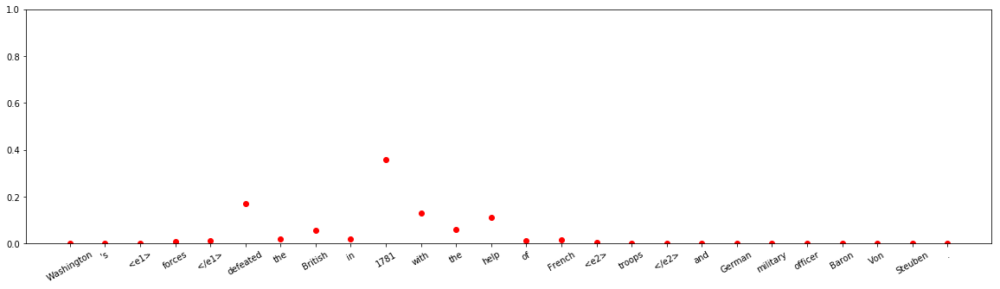




input sentence: The Unofficial Charles Portis website aims to be a virtual <e1> cornucopia </e1> of book <e2> reviews </e2> and biographical pieces related to its namesake .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 4.0755716e-05
Entity-Destination(e1,e2) 	:	 1.10518365e-11
Cause-Effect(e2,e1) 	:	 4.62777e-12
Member-Collection(e2,e1) 	:	 0.072281286
Entity-Origin(e1,e2) 	:	 2.6902621e-06
Message-Topic(e1,e2) 	:	 4.1108676e-09
Component-Whole(e1,e2) 	:	 1.46724135e-08
Component-Whole(e2,e1) 	:	 2.6709551e-05
Instrument-Agency(e2,e1) 	:	 1.9403748e-08
Content-Container(e1,e2) 	:	 3.8477612e-08
Product-Producer(e2,e1) 	:	 0.7936824
Cause-Effect(e1,e2) 	:	 3.0106053e-09
Product-Producer(e1,e2) 	:	 2.6177608e-05
Content-Container(e2,e1) 	:	 1.0732899e-06
Entity-Origin(e2,e1) 	:	 3.8578494e-07
Message-Topic(e2,e1) 	:	 0.13393839
Instrument-Agency(e1,e2) 	:	 5.329572e-11
Member-Collection(e1,e2) 	:	 1.3266702e-08
Entity-Destination(e2,e1) 	:	 4.539616e-10



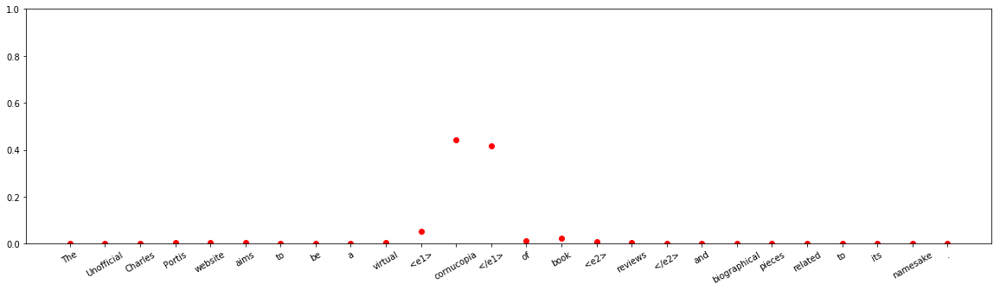


input sentence: The purpose of this article is to report the findings of a <e1> study </e1> on the <e2> effects </e2> of the federal truth-in-lending legislation .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 3.091064e-05
Entity-Destination(e1,e2) 	:	 3.1250861e-12
Cause-Effect(e2,e1) 	:	 1.941818e-11
Member-Collection(e2,e1) 	:	 8.368087e-10
Entity-Origin(e1,e2) 	:	 6.174284e-12
Message-Topic(e1,e2) 	:	 0.99851984
Component-Whole(e1,e2) 	:	 0.0014486532
Component-Whole(e2,e1) 	:	 1.523769e-08
Instrument-Agency(e2,e1) 	:	 2.2564216e-12
Content-Container(e1,e2) 	:	 4.9134904e-11
Product-Producer(e2,e1) 	:	 8.061463e-13
Cause-Effect(e1,e2) 	:	 7.267807e-11
Product-Producer(e1,e2) 	:	 4.2492196e-09
Content-Container(e2,e1) 	:	 4.009255e-12
Entity-Origin(e2,e1) 	:	 1.206741e-13
Message-Topic(e2,e1) 	:	 5.6115437e-07
Instrument-Agency(e1,e2) 	:	 1.2260227e-09
Member-Collection(e1,e2) 	:	 8.0906815e-10
Entity-Destination(e2,e1) 	:	 7.430195e-13



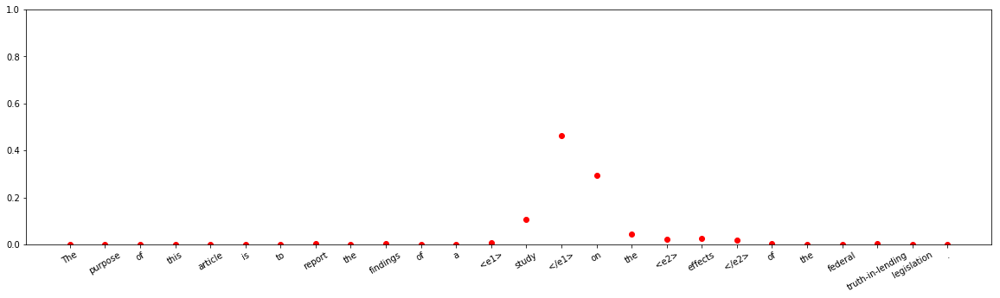









input sentence: The <e1> license </e1> is issued from the new <e2> state </e2> after verifying the particulars of the applicant license from the original issuing state .
answer label:    Product-Producer(e1,e2)
wrong label:    Entity-Origin(e1,e2)
Other 	:	 6.133633e-14
Entity-Destination(e1,e2) 	:	 5.209312e-10
Cause-Effect(e2,e1) 	:	 2.2615482e-06
Member-Collection(e2,e1) 	:	 3.8543818e-10
Entity-Origin(e1,e2) 	:	 0.99998975
Message-Topic(e1,e2) 	:	 1.0419626e-12
Component-Whole(e1,e2) 	:	 2.8529062e-13
Component-Whole(e2,e1) 	:	 4.0404026e-15
Instrument-Agency(e2,e1) 	:	 1.4838842e-13
Content-Container(e1,e2) 	:	 4.0028462e-12
Product-Producer(e2,e1) 	:	 5.5613576e-08
Cause-Effect(e1,e2) 	:	 3.498157e-12
Product-Producer(e1,e2) 	:	 7.5608646e-06
Content-Container(e2,e1) 	:	 8.4645026e-14
Entity-Origin(e2,e1) 	:	 1.1358532e-10
Message-Topic(e2,e1) 	:	 4.314923e-07
Instrument-Agency(e1,e2) 	:	 1.7930702e-13
Member-Collection(e1,e2) 	:	 3.9255596e-08
Entity-Destination(e2,e1) 	

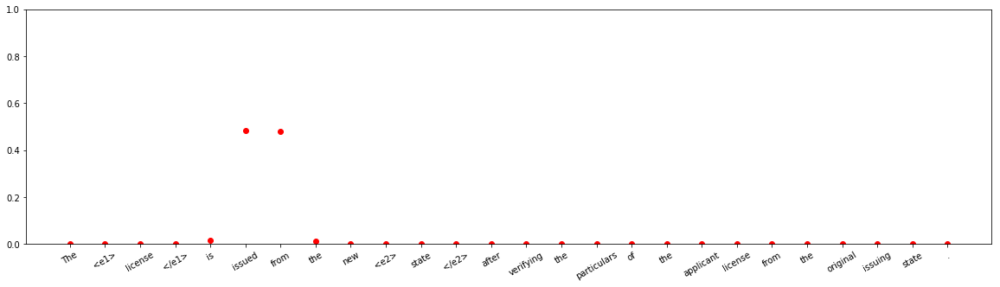





input sentence: In this way he gathered materials for weekly epistles destined to enlighten some county town or some <e1> bench </e1> of rustic <e2> magistrates </e2> .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.53443605
Entity-Destination(e1,e2) 	:	 7.8432755e-10
Cause-Effect(e2,e1) 	:	 1.0955266e-09
Member-Collection(e2,e1) 	:	 0.46115533
Entity-Origin(e1,e2) 	:	 3.5791302e-07
Message-Topic(e1,e2) 	:	 2.8563142e-07
Component-Whole(e1,e2) 	:	 1.4341933e-05
Component-Whole(e2,e1) 	:	 3.82302e-07
Instrument-Agency(e2,e1) 	:	 1.4573537e-09
Content-Container(e1,e2) 	:	 1.0325423e-06
Product-Producer(e2,e1) 	:	 4.927651e-10
Cause-Effect(e1,e2) 	:	 6.904943e-11
Product-Producer(e1,e2) 	:	 1.7695507e-05
Content-Container(e2,e1) 	:	 2.3539202e-05
Entity-Origin(e2,e1) 	:	 6.338418e-07
Message-Topic(e2,e1) 	:	 3.420913e-08
Instrument-Agency(e1,e2) 	:	 0.0042900485
Member-Collection(e1,e2) 	:	 6.0306404e-05
Entity-Destination(e2,e1) 	:	 6.137276e-10



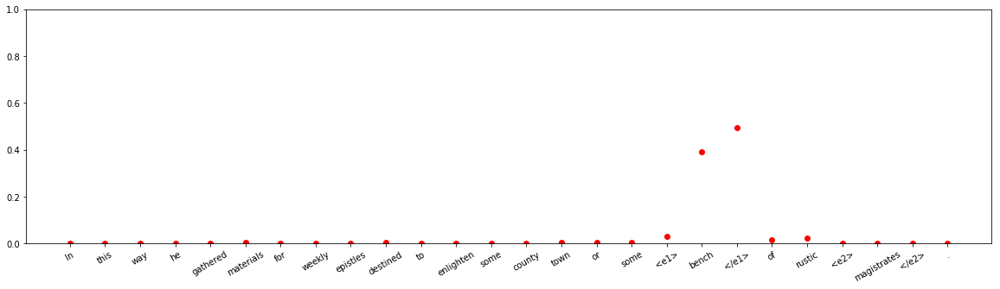


input sentence: The <e1> illusion </e1> has been examined in a number of different psychological <e2> experiments </e2> , and suggested as a basis for other biases .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 1.713488e-10
Entity-Destination(e1,e2) 	:	 4.8627595e-11
Cause-Effect(e2,e1) 	:	 3.3785477e-10
Member-Collection(e2,e1) 	:	 3.222276e-11
Entity-Origin(e1,e2) 	:	 5.7015794e-12
Message-Topic(e1,e2) 	:	 5.0149e-11
Component-Whole(e1,e2) 	:	 2.9477748e-08
Component-Whole(e2,e1) 	:	 1.541104e-11
Instrument-Agency(e2,e1) 	:	 2.2366067e-12
Content-Container(e1,e2) 	:	 2.3528957e-10
Product-Producer(e2,e1) 	:	 2.1227406e-12
Cause-Effect(e1,e2) 	:	 8.39487e-11
Product-Producer(e1,e2) 	:	 2.7593765e-12
Content-Container(e2,e1) 	:	 9.605389e-13
Entity-Origin(e2,e1) 	:	 7.3898346e-14
Message-Topic(e2,e1) 	:	 1.0
Instrument-Agency(e1,e2) 	:	 3.87881e-14
Member-Collection(e1,e2) 	:	 4.082156e-12
Entity-Destination(e2,e1) 	:	 3.8664818e-14



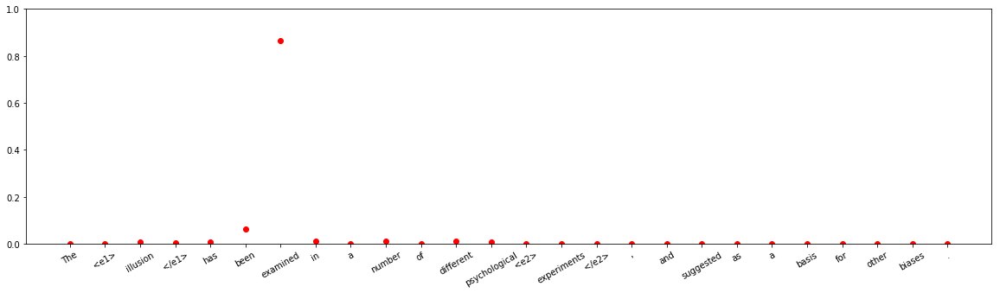





input sentence: Each time a <e1> neuron </e1> unleashes its tiny <e2> jolt </e2> , it needs to replenish its stores of energy for the next spark .
answer label:    Cause-Effect(e1,e2)
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.9118762e-11
Entity-Destination(e1,e2) 	:	 1.7007418e-09
Cause-Effect(e2,e1) 	:	 1.4280119e-08
Member-Collection(e2,e1) 	:	 5.56878e-07
Entity-Origin(e1,e2) 	:	 1.11100526e-07
Message-Topic(e1,e2) 	:	 2.0873675e-10
Component-Whole(e1,e2) 	:	 6.632595e-05
Component-Whole(e2,e1) 	:	 0.2923438
Instrument-Agency(e2,e1) 	:	 2.3601261e-08
Content-Container(e1,e2) 	:	 6.176664e-11
Product-Producer(e2,e1) 	:	 0.70135593
Cause-Effect(e1,e2) 	:	 0.0033011185
Product-Producer(e1,e2) 	:	 0.002931051
Content-Container(e2,e1) 	:	 1.1044192e-06
Entity-Origin(e2,e1) 	:	 3.0195788e-09
Message-Topic(e2,e1) 	:	 2.1677198e-12
Instrument-Agency(e1,e2) 	:	 8.51754e-09
Member-Collection(e1,e2) 	:	 8.198518e-10
Entity-Destination(e2,e1) 	:	 2.019627e-09



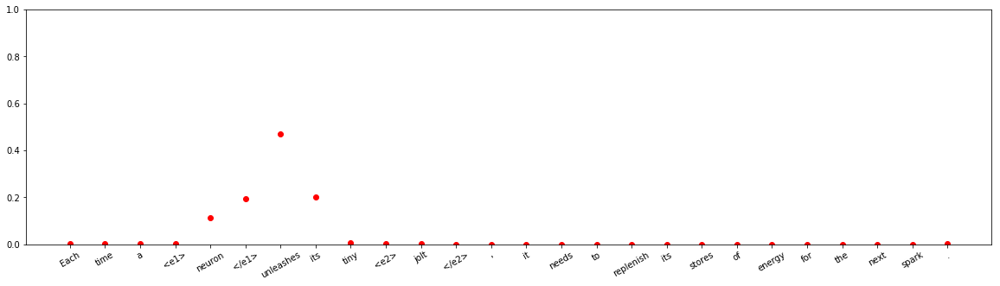



input sentence: The <e1> pipeline </e1> that the <e2> gas </e2> leaked from belongs to Puyang company , and was constructed by Nanjing Sanye utility installment company .
answer label:    Entity-Origin(e2,e1)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 9.808152e-05
Entity-Destination(e1,e2) 	:	 5.127169e-06
Cause-Effect(e2,e1) 	:	 3.1252002e-06
Member-Collection(e2,e1) 	:	 4.5058948e-09
Entity-Origin(e1,e2) 	:	 5.0154335e-06
Message-Topic(e1,e2) 	:	 6.315878e-06
Component-Whole(e1,e2) 	:	 0.0005394746
Component-Whole(e2,e1) 	:	 0.0058649345
Instrument-Agency(e2,e1) 	:	 0.44503137
Content-Container(e1,e2) 	:	 1.6979475e-05
Product-Producer(e2,e1) 	:	 0.0025075187
Cause-Effect(e1,e2) 	:	 3.7523619e-06
Product-Producer(e1,e2) 	:	 9.813069e-06
Content-Container(e2,e1) 	:	 7.027042e-06
Entity-Origin(e2,e1) 	:	 1.0391263e-08
Message-Topic(e2,e1) 	:	 2.8337487e-05
Instrument-Agency(e1,e2) 	:	 0.5458731
Member-Collection(e1,e2) 	:	 1.6795033e-08
Entity-Destination(e2,e1) 	:	 5.6982445

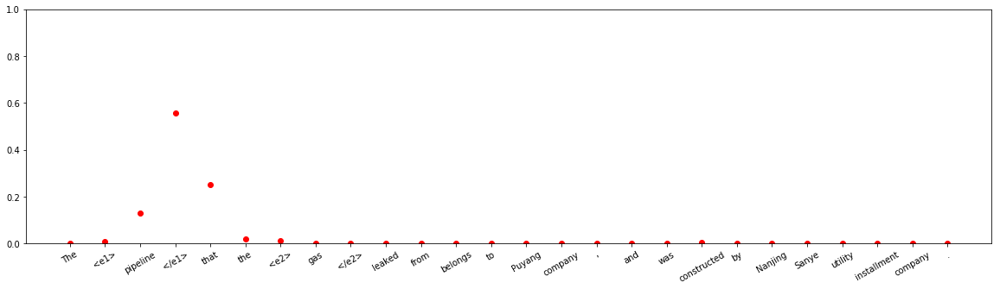




input sentence: Instead of sounding self-centered , the <e1> remark </e1> came from a <e2> person </e2> who is confused and unaccustomed to anything but personal success .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 3.5992927e-11
Entity-Destination(e1,e2) 	:	 9.273006e-09
Cause-Effect(e2,e1) 	:	 0.75675136
Member-Collection(e2,e1) 	:	 2.2905603e-08
Entity-Origin(e1,e2) 	:	 0.13540813
Message-Topic(e1,e2) 	:	 1.453125e-08
Component-Whole(e1,e2) 	:	 5.026166e-10
Component-Whole(e2,e1) 	:	 6.9689285e-12
Instrument-Agency(e2,e1) 	:	 1.9977202e-09
Content-Container(e1,e2) 	:	 6.406045e-09
Product-Producer(e2,e1) 	:	 4.060971e-09
Cause-Effect(e1,e2) 	:	 1.6695598e-08
Product-Producer(e1,e2) 	:	 0.10783475
Content-Container(e2,e1) 	:	 7.311156e-11
Entity-Origin(e2,e1) 	:	 3.6076748e-09
Message-Topic(e2,e1) 	:	 2.0268707e-09
Instrument-Agency(e1,e2) 	:	 1.5882932e-06
Member-Collection(e1,e2) 	:	 4.0455075e-06
Entity-Destination(e2,e1) 	:	 1.93959e-10


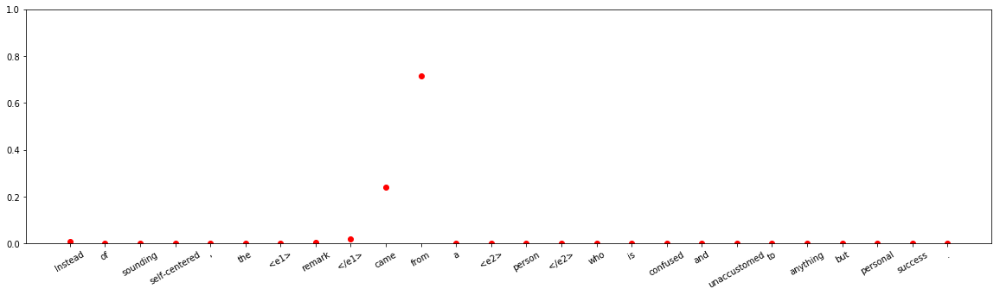







input sentence: The <e1> name </e1> was leaked in <e2> chatrooms </e2> as people gave clues as to who it is and some also said his name .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 3.18487e-06
Entity-Destination(e1,e2) 	:	 0.005636019
Cause-Effect(e2,e1) 	:	 3.090749e-10
Member-Collection(e2,e1) 	:	 0.0019372312
Entity-Origin(e1,e2) 	:	 0.5555914
Message-Topic(e1,e2) 	:	 1.3190109e-05
Component-Whole(e1,e2) 	:	 7.986415e-08
Component-Whole(e2,e1) 	:	 1.3406923e-07
Instrument-Agency(e2,e1) 	:	 1.03914524e-13
Content-Container(e1,e2) 	:	 0.0010932921
Product-Producer(e2,e1) 	:	 0.010429854
Cause-Effect(e1,e2) 	:	 5.797759e-08
Product-Producer(e1,e2) 	:	 6.069281e-08
Content-Container(e2,e1) 	:	 1.2792598e-05
Entity-Origin(e2,e1) 	:	 0.00035447485
Message-Topic(e2,e1) 	:	 0.4249216
Instrument-Agency(e1,e2) 	:	 1.5830393e-09
Member-Collection(e1,e2) 	:	 6.5991594e-06
Entity-Destination(e2,e1) 	:	 2.6518188e-10



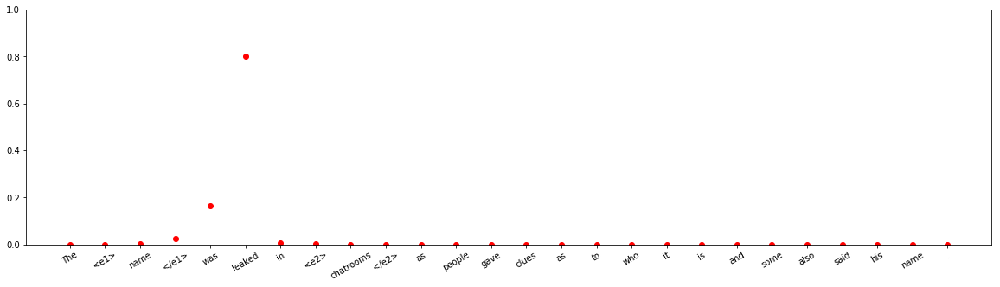


input sentence: The JNC also is currently accepting applications for the <e1> vacancy </e1> created by the <e2> retirement </e2> of Judge Edwin B. Browning , Jr .
answer label:    Cause-Effect(e2,e1)
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.0019569e-08
Entity-Destination(e1,e2) 	:	 1.3294686e-10
Cause-Effect(e2,e1) 	:	 0.000497565
Member-Collection(e2,e1) 	:	 1.1213592e-05
Entity-Origin(e1,e2) 	:	 2.4289839e-06
Message-Topic(e1,e2) 	:	 1.5193473e-09
Component-Whole(e1,e2) 	:	 2.341827e-11
Component-Whole(e2,e1) 	:	 3.2194445e-11
Instrument-Agency(e2,e1) 	:	 1.9008113e-11
Content-Container(e1,e2) 	:	 1.4407634e-12
Product-Producer(e2,e1) 	:	 6.06738e-08
Cause-Effect(e1,e2) 	:	 6.64096e-09
Product-Producer(e1,e2) 	:	 0.9994491
Content-Container(e2,e1) 	:	 5.486763e-13
Entity-Origin(e2,e1) 	:	 5.833948e-13
Message-Topic(e2,e1) 	:	 3.7446178e-05
Instrument-Agency(e1,e2) 	:	 1.1771625e-06
Member-Collection(e1,e2) 	:	 1.0646152e-06
Entity-Destination(e2,e1) 	:	 5.840027e-13



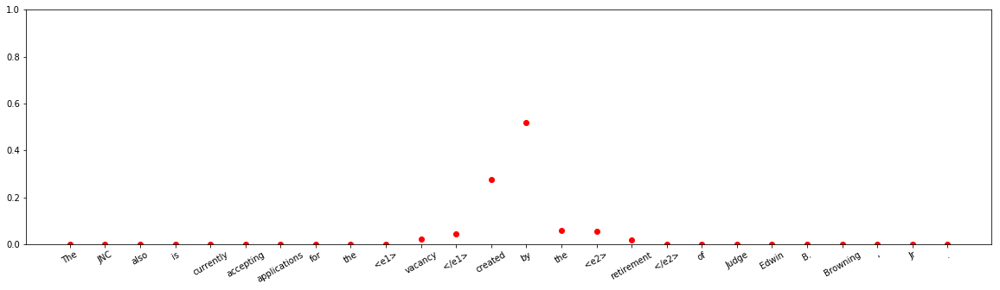


input sentence: The members of committee of the program are formed by the <e1> chairman </e1> of the <e2> college </e2> and the chairman of each department .
answer label:    Other
wrong label:    Member-Collection(e1,e2)
Other 	:	 1.0148251e-06
Entity-Destination(e1,e2) 	:	 4.6529495e-12
Cause-Effect(e2,e1) 	:	 1.5994386e-09
Member-Collection(e2,e1) 	:	 0.0005123046
Entity-Origin(e1,e2) 	:	 2.8179332e-07
Message-Topic(e1,e2) 	:	 1.9543411e-07
Component-Whole(e1,e2) 	:	 1.4739646e-06
Component-Whole(e2,e1) 	:	 9.939894e-14
Instrument-Agency(e2,e1) 	:	 1.0247546e-08
Content-Container(e1,e2) 	:	 5.629538e-10
Product-Producer(e2,e1) 	:	 0.05669809
Cause-Effect(e1,e2) 	:	 5.62781e-10
Product-Producer(e1,e2) 	:	 6.633176e-07
Content-Container(e2,e1) 	:	 1.5366014e-10
Entity-Origin(e2,e1) 	:	 2.8493667e-09
Message-Topic(e2,e1) 	:	 0.00016227626
Instrument-Agency(e1,e2) 	:	 1.6882892e-07
Member-Collection(e1,e2) 	:	 0.9426235
Entity-Destination(e2,e1) 	:	 1.0794898e-10



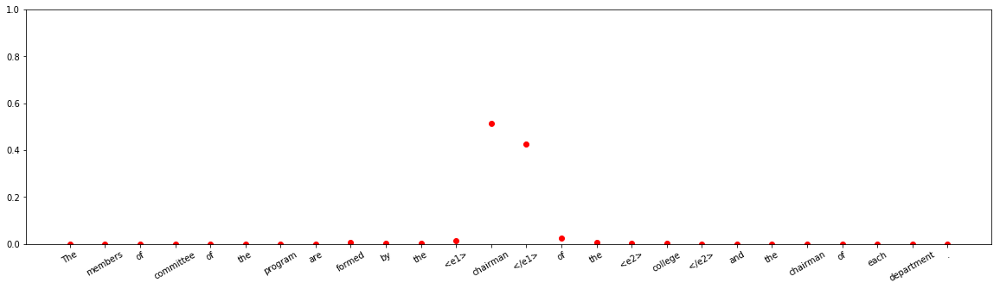









input sentence: The monitoring <e1> station </e1> receives the signal through a communication <e2> device </e2> and the combined signal is processed to retrieve GPS data .
answer label:    Component-Whole(e2,e1)
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 3.2036862e-06
Entity-Destination(e1,e2) 	:	 1.2123519e-10
Cause-Effect(e2,e1) 	:	 3.3640034e-05
Member-Collection(e2,e1) 	:	 1.2353936e-10
Entity-Origin(e1,e2) 	:	 1.2361602e-07
Message-Topic(e1,e2) 	:	 8.471931e-11
Component-Whole(e1,e2) 	:	 4.8743135e-07
Component-Whole(e2,e1) 	:	 9.681582e-05
Instrument-Agency(e2,e1) 	:	 0.9997725
Content-Container(e1,e2) 	:	 4.2576187e-09
Product-Producer(e2,e1) 	:	 2.281527e-07
Cause-Effect(e1,e2) 	:	 7.8306766e-09
Product-Producer(e1,e2) 	:	 4.3988507e-08
Content-Container(e2,e1) 	:	 2.5540485e-09
Entity-Origin(e2,e1) 	:	 6.3599737e-12
Message-Topic(e2,e1) 	:	 3.9634577e-07
Instrument-Agency(e1,e2) 	:	 9.26355e-05
Member-Collection(e1,e2) 	:	 6.3586575e-10
Entity-Destination(e2,e1

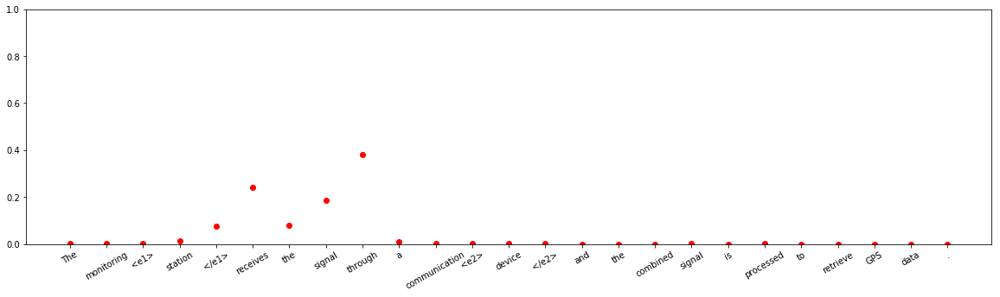







input sentence: The article does a great job of tying the three procedural <e1> cases </e1> from last <e2> term </e2> with larger complex litigation issues .
answer label:    Entity-Origin(e1,e2)
wrong label:    Other
Other 	:	 0.5399655
Entity-Destination(e1,e2) 	:	 1.0152752e-09
Cause-Effect(e2,e1) 	:	 0.11275311
Member-Collection(e2,e1) 	:	 1.028589e-07
Entity-Origin(e1,e2) 	:	 0.32822227
Message-Topic(e1,e2) 	:	 7.853626e-07
Component-Whole(e1,e2) 	:	 0.00026182286
Component-Whole(e2,e1) 	:	 2.5737188e-05
Instrument-Agency(e2,e1) 	:	 8.970332e-08
Content-Container(e1,e2) 	:	 0.0014926115
Product-Producer(e2,e1) 	:	 1.488159e-08
Cause-Effect(e1,e2) 	:	 1.0652924e-06
Product-Producer(e1,e2) 	:	 0.017089652
Content-Container(e2,e1) 	:	 9.090297e-06
Entity-Origin(e2,e1) 	:	 1.4510584e-06
Message-Topic(e2,e1) 	:	 4.1738982e-05
Instrument-Agency(e1,e2) 	:	 0.00012503157
Member-Collection(e1,e2) 	:	 9.9762465e-06
Entity-Destination(e2,e1) 	:	 1.2869857e-08



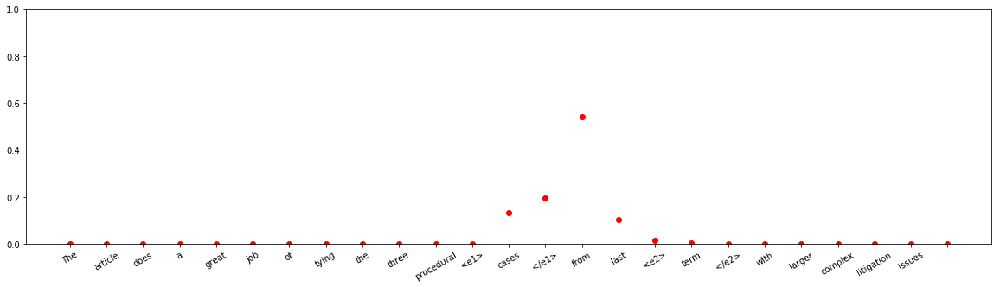



input sentence: The film trilogy has contributed to a dumbing down of the reception of the <e1> novel </e1> by the <e2> forces </e2> of mass-commercialization .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 1.9601414e-09
Entity-Destination(e1,e2) 	:	 2.0993203e-14
Cause-Effect(e2,e1) 	:	 4.8821796e-08
Member-Collection(e2,e1) 	:	 4.3869838e-10
Entity-Origin(e1,e2) 	:	 1.51158e-09
Message-Topic(e1,e2) 	:	 3.991342e-09
Component-Whole(e1,e2) 	:	 3.0277622e-08
Component-Whole(e2,e1) 	:	 7.2433295e-08
Instrument-Agency(e2,e1) 	:	 1.5862938e-12
Content-Container(e1,e2) 	:	 2.241451e-14
Product-Producer(e2,e1) 	:	 7.2361686e-14
Cause-Effect(e1,e2) 	:	 4.790021e-13
Product-Producer(e1,e2) 	:	 0.99996734
Content-Container(e2,e1) 	:	 8.979734e-16
Entity-Origin(e2,e1) 	:	 3.2520583e-16
Message-Topic(e2,e1) 	:	 4.3591747e-10
Instrument-Agency(e1,e2) 	:	 3.255434e-05
Member-Collection(e1,e2) 	:	 3.4342478e-09
Entity-Destination(e2,e1) 	:	 1.6069941e-14



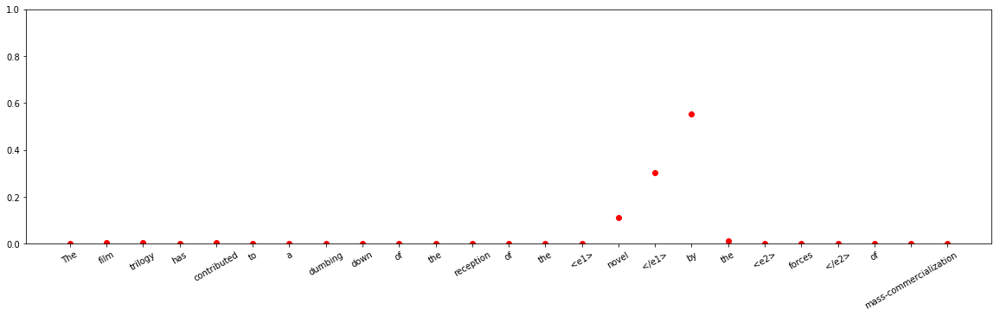



input sentence: The <e1> grandstand </e1> completes the <e2> concourse </e2> around the ground , and it will increase seating capacity to where it should be .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.27037317
Entity-Destination(e1,e2) 	:	 4.3301217e-08
Cause-Effect(e2,e1) 	:	 1.466982e-09
Member-Collection(e2,e1) 	:	 1.1219602e-10
Entity-Origin(e1,e2) 	:	 1.2488281e-10
Message-Topic(e1,e2) 	:	 9.4113574e-08
Component-Whole(e1,e2) 	:	 0.7292046
Component-Whole(e2,e1) 	:	 0.00022647457
Instrument-Agency(e2,e1) 	:	 5.20391e-07
Content-Container(e1,e2) 	:	 3.9979824e-09
Product-Producer(e2,e1) 	:	 2.4986883e-07
Cause-Effect(e1,e2) 	:	 4.0879313e-09
Product-Producer(e1,e2) 	:	 5.2798335e-09
Content-Container(e2,e1) 	:	 9.462317e-07
Entity-Origin(e2,e1) 	:	 1.4366213e-11
Message-Topic(e2,e1) 	:	 1.3660058e-10
Instrument-Agency(e1,e2) 	:	 0.0001939197
Member-Collection(e1,e2) 	:	 6.7787034e-09
Entity-Destination(e2,e1) 	:	 3.360587e-10



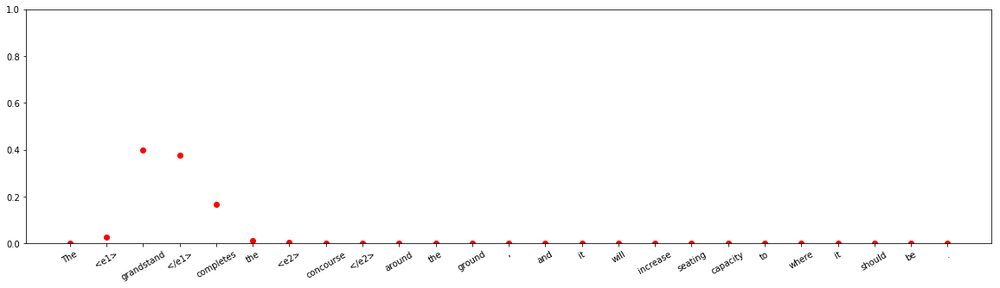






input sentence: Personal <e1> anecdotes </e1> gathered in oral interviews with rural <e2> workers </e2> and their allies add a compelling human element to the book .
answer label:    Product-Producer(e1,e2)
wrong label:    Message-Topic(e1,e2)
Other 	:	 9.888805e-13
Entity-Destination(e1,e2) 	:	 3.9824206e-09
Cause-Effect(e2,e1) 	:	 1.3072282e-12
Member-Collection(e2,e1) 	:	 0.00093450537
Entity-Origin(e1,e2) 	:	 4.4681908e-08
Message-Topic(e1,e2) 	:	 0.9990595
Component-Whole(e1,e2) 	:	 1.533952e-07
Component-Whole(e2,e1) 	:	 5.1923816e-09
Instrument-Agency(e2,e1) 	:	 2.4938787e-10
Content-Container(e1,e2) 	:	 2.4968562e-08
Product-Producer(e2,e1) 	:	 3.7396916e-08
Cause-Effect(e1,e2) 	:	 1.1036768e-08
Product-Producer(e1,e2) 	:	 1.9088186e-06
Content-Container(e2,e1) 	:	 1.8365772e-06
Entity-Origin(e2,e1) 	:	 2.7318802e-07
Message-Topic(e2,e1) 	:	 3.257336e-07
Instrument-Agency(e1,e2) 	:	 2.352551e-08
Member-Collection(e1,e2) 	:	 1.5810045e-06
Entity-Destination(e2,e1) 	:	 3.447

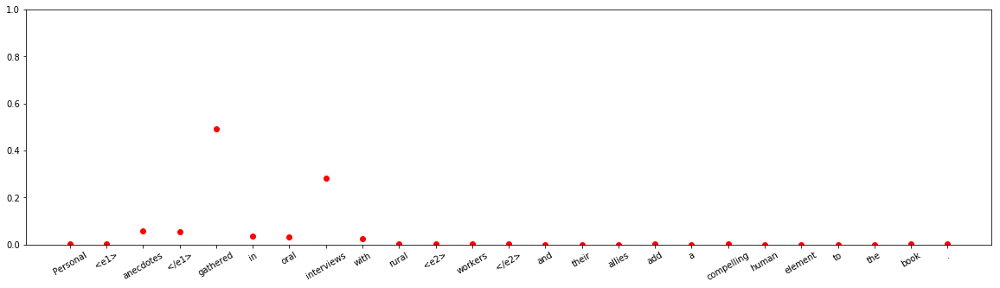



input sentence: This <e1> export </e1> <e2> company </e2> is involved in sourcing various manufacturing commodities and exporting these products to different countries around the world .
answer label:    Other
wrong label:    Product-Producer(e1,e2)
Other 	:	 0.0018691665
Entity-Destination(e1,e2) 	:	 1.4193934e-06
Cause-Effect(e2,e1) 	:	 9.487114e-08
Member-Collection(e2,e1) 	:	 4.3162473e-08
Entity-Origin(e1,e2) 	:	 2.3227011e-08
Message-Topic(e1,e2) 	:	 1.5097043e-05
Component-Whole(e1,e2) 	:	 3.877302e-09
Component-Whole(e2,e1) 	:	 6.0024676e-12
Instrument-Agency(e2,e1) 	:	 1.6888912e-11
Content-Container(e1,e2) 	:	 1.3650843e-07
Product-Producer(e2,e1) 	:	 6.0827645e-08
Cause-Effect(e1,e2) 	:	 8.232127e-07
Product-Producer(e1,e2) 	:	 0.9528841
Content-Container(e2,e1) 	:	 2.8419087e-10
Entity-Origin(e2,e1) 	:	 1.1203297e-06
Message-Topic(e2,e1) 	:	 4.814128e-07
Instrument-Agency(e1,e2) 	:	 0.04030721
Member-Collection(e1,e2) 	:	 0.0049202484
Entity-Destination(e2,e1) 	:	 7.04116

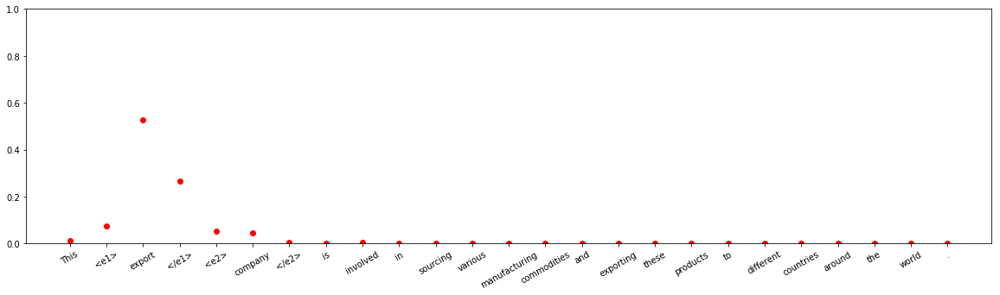









input sentence: TV total started as a <e1> comedy format </e1> mainly showing and commenting on funny and embarrassing <e2> sequences </e2> from other TV programs .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.004320788
Entity-Destination(e1,e2) 	:	 7.4160133e-13
Cause-Effect(e2,e1) 	:	 4.2905268e-10
Member-Collection(e2,e1) 	:	 1.9168974e-07
Entity-Origin(e1,e2) 	:	 3.7739216e-08
Message-Topic(e1,e2) 	:	 0.046392735
Component-Whole(e1,e2) 	:	 1.2547167e-06
Component-Whole(e2,e1) 	:	 0.8435388
Instrument-Agency(e2,e1) 	:	 2.2200345e-08
Content-Container(e1,e2) 	:	 1.0945666e-07
Product-Producer(e2,e1) 	:	 4.1442473e-07
Cause-Effect(e1,e2) 	:	 1.3462191e-07
Product-Producer(e1,e2) 	:	 1.1986643e-06
Content-Container(e2,e1) 	:	 1.4032675e-08
Entity-Origin(e2,e1) 	:	 1.6395872e-09
Message-Topic(e2,e1) 	:	 0.10574432
Instrument-Agency(e1,e2) 	:	 5.777019e-09
Member-Collection(e1,e2) 	:	 1.3099988e-12
Entity-Destination(e2,e1) 	:	 2.3096529e-10



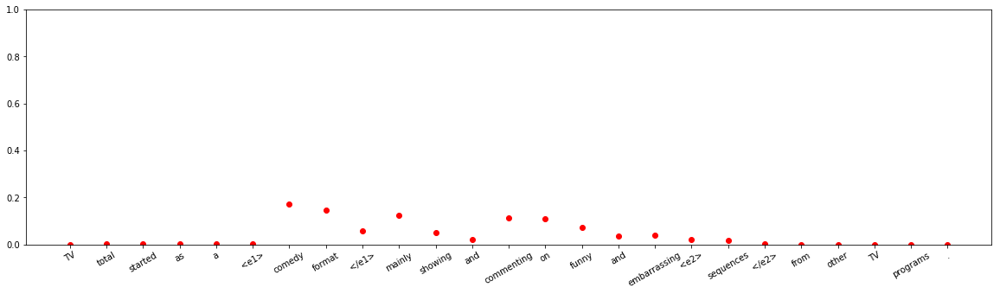










input sentence: The <e1> launcher </e1> receives the balls through a similar belt <e2> system </e2> leading up the neck of the robot from the ground .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 4.4252845e-13
Entity-Destination(e1,e2) 	:	 1.9292689e-11
Cause-Effect(e2,e1) 	:	 1.6813884e-10
Member-Collection(e2,e1) 	:	 9.892605e-13
Entity-Origin(e1,e2) 	:	 5.8822246e-07
Message-Topic(e1,e2) 	:	 8.1320625e-14
Component-Whole(e1,e2) 	:	 6.5177915e-06
Component-Whole(e2,e1) 	:	 0.9996189
Instrument-Agency(e2,e1) 	:	 0.0003687687
Content-Container(e1,e2) 	:	 2.814145e-08
Product-Producer(e2,e1) 	:	 9.692014e-10
Cause-Effect(e1,e2) 	:	 4.0072273e-12
Product-Producer(e1,e2) 	:	 9.3933146e-11
Content-Container(e2,e1) 	:	 8.370328e-08
Entity-Origin(e2,e1) 	:	 1.2758433e-14
Message-Topic(e2,e1) 	:	 1.3696733e-14
Instrument-Agency(e1,e2) 	:	 4.9486293e-06
Member-Collection(e1,e2) 	:	 1.0042145e-12
Entity-Destination(e2,e1) 	:	 8.490957e-12



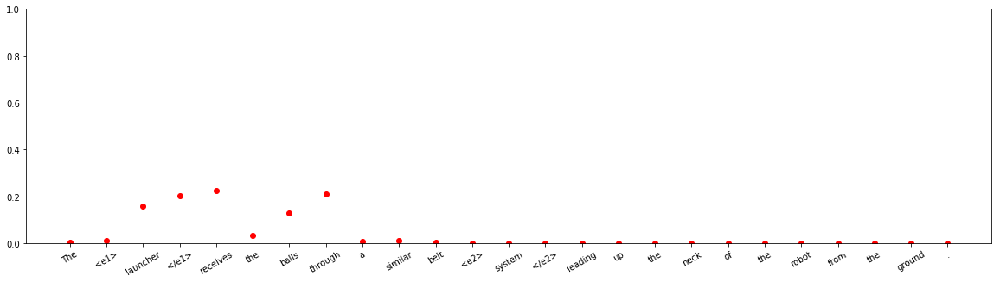












input sentence: The innovative techniques consist of <e1> plantation </e1> of appropriate horticultural <e2> crops </e2> , fodder trees and medicinal plants along with micro-irrigation facilities .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.4375927
Entity-Destination(e1,e2) 	:	 3.3696435e-10
Cause-Effect(e2,e1) 	:	 2.8850073e-07
Member-Collection(e2,e1) 	:	 0.06848055
Entity-Origin(e1,e2) 	:	 0.0010875674
Message-Topic(e1,e2) 	:	 8.9188205e-07
Component-Whole(e1,e2) 	:	 0.47200304
Component-Whole(e2,e1) 	:	 0.00089288177
Instrument-Agency(e2,e1) 	:	 4.5859764e-08
Content-Container(e1,e2) 	:	 2.6329901e-06
Product-Producer(e2,e1) 	:	 0.0012404951
Cause-Effect(e1,e2) 	:	 1.23724275e-08
Product-Producer(e1,e2) 	:	 0.0026526079
Content-Container(e2,e1) 	:	 6.628597e-06
Entity-Origin(e2,e1) 	:	 0.0062559526
Message-Topic(e2,e1) 	:	 0.0037261783
Instrument-Agency(e1,e2) 	:	 0.0055726697
Member-Collection(e1,e2) 	:	 0.00048507837
Entity-Destination(e2

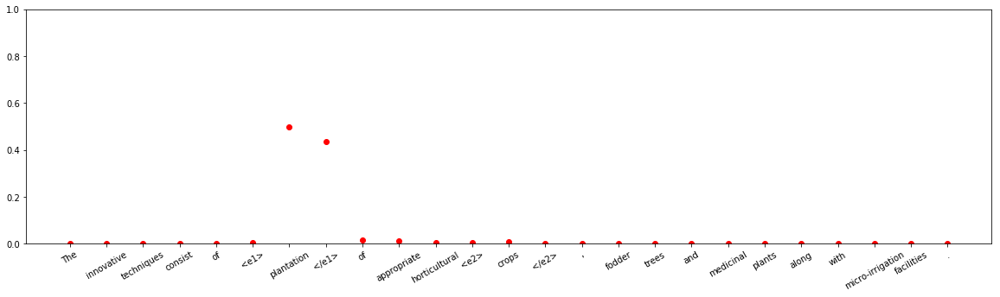




input sentence: The Seattle women 's <e1> group </e1> distributes a number of small <e2> scholarships </e2> for single mothers who want to go to college .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 1.1655956e-11
Entity-Destination(e1,e2) 	:	 2.3206827e-11
Cause-Effect(e2,e1) 	:	 4.9217614e-17
Member-Collection(e2,e1) 	:	 6.3113688e-09
Entity-Origin(e1,e2) 	:	 1.105444e-09
Message-Topic(e1,e2) 	:	 1.2857779e-10
Component-Whole(e1,e2) 	:	 8.684687e-15
Component-Whole(e2,e1) 	:	 9.782367e-12
Instrument-Agency(e2,e1) 	:	 0.034981955
Content-Container(e1,e2) 	:	 8.717483e-11
Product-Producer(e2,e1) 	:	 0.9649957
Cause-Effect(e1,e2) 	:	 1.0321687e-10
Product-Producer(e1,e2) 	:	 6.525803e-12
Content-Container(e2,e1) 	:	 2.232475e-05
Entity-Origin(e2,e1) 	:	 7.557685e-12
Message-Topic(e2,e1) 	:	 1.9987882e-14
Instrument-Agency(e1,e2) 	:	 1.960268e-09
Member-Collection(e1,e2) 	:	 1.2203659e-09
Entity-Destination(e2,e1) 	:	 4.274541e-14



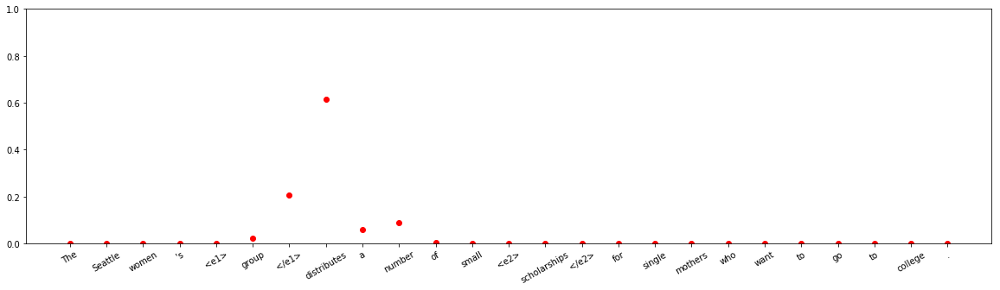



input sentence: We propose a <e1> rule </e1> driven <e2> approach </e2> for adaptive business collaboration development in which rules drive and govern the development process .
answer label:    Component-Whole(e1,e2)
wrong label:    Other
Other 	:	 1.0
Entity-Destination(e1,e2) 	:	 7.118886e-19
Cause-Effect(e2,e1) 	:	 2.4868538e-15
Member-Collection(e2,e1) 	:	 1.7879982e-15
Entity-Origin(e1,e2) 	:	 3.123291e-19
Message-Topic(e1,e2) 	:	 1.220495e-12
Component-Whole(e1,e2) 	:	 3.9976262e-14
Component-Whole(e2,e1) 	:	 3.460746e-14
Instrument-Agency(e2,e1) 	:	 1.2320052e-11
Content-Container(e1,e2) 	:	 3.4340024e-15
Product-Producer(e2,e1) 	:	 8.5713805e-17
Cause-Effect(e1,e2) 	:	 2.1312202e-15
Product-Producer(e1,e2) 	:	 3.7629777e-15
Content-Container(e2,e1) 	:	 3.9308753e-15
Entity-Origin(e2,e1) 	:	 4.6797416e-16
Message-Topic(e2,e1) 	:	 1.1857606e-13
Instrument-Agency(e1,e2) 	:	 7.380718e-11
Member-Collection(e1,e2) 	:	 1.1802268e-15
Entity-Destination(e2,e1) 	:	 4.1884173e-16



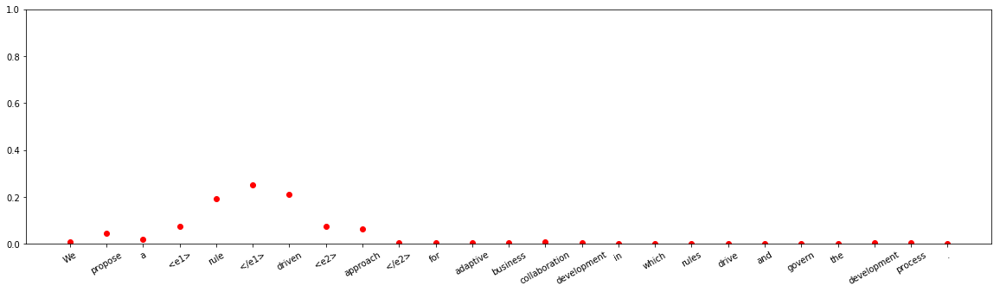



input sentence: <e1> Seminars </e1> and conferences have been organised around the Asia-Pacific <e2> area </e2> in the most recent years by different organisations and institutions .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 1.1881261e-10
Entity-Destination(e1,e2) 	:	 2.696076e-06
Cause-Effect(e2,e1) 	:	 1.0632899e-10
Member-Collection(e2,e1) 	:	 1.8775936e-05
Entity-Origin(e1,e2) 	:	 5.019547e-09
Message-Topic(e1,e2) 	:	 0.99589443
Component-Whole(e1,e2) 	:	 9.740368e-05
Component-Whole(e2,e1) 	:	 5.5996676e-05
Instrument-Agency(e2,e1) 	:	 3.5109052e-13
Content-Container(e1,e2) 	:	 1.5351408e-10
Product-Producer(e2,e1) 	:	 4.6673904e-11
Cause-Effect(e1,e2) 	:	 1.1286418e-07
Product-Producer(e1,e2) 	:	 2.4720888e-08
Content-Container(e2,e1) 	:	 7.308811e-11
Entity-Origin(e2,e1) 	:	 3.8057873e-08
Message-Topic(e2,e1) 	:	 0.0039305775
Instrument-Agency(e1,e2) 	:	 1.8951596e-08
Member-Collection(e1,e2) 	:	 1.7740456e-09
Entity-Destination(e2,e1) 	:	 3.5443706

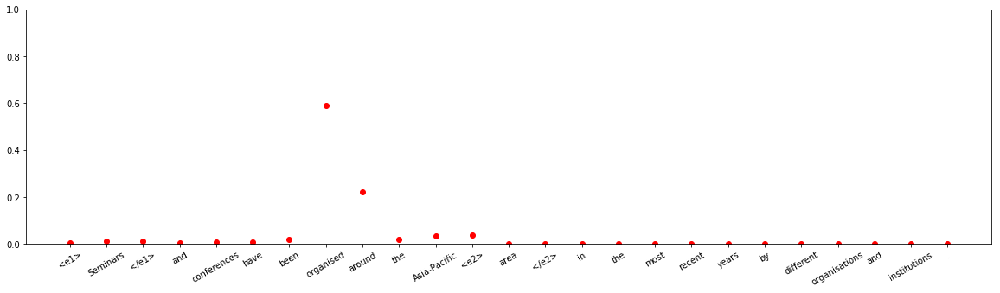




input sentence: I maintained an even temperature in my ward by bringing in a <e1> scuttle </e1> of <e2> coal </e2> for the day 's business .
answer label:    Content-Container(e2,e1)
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.00088755036
Entity-Destination(e1,e2) 	:	 1.40057015e-08
Cause-Effect(e2,e1) 	:	 2.716626e-09
Member-Collection(e2,e1) 	:	 0.512886
Entity-Origin(e1,e2) 	:	 1.0868749e-07
Message-Topic(e1,e2) 	:	 5.690936e-07
Component-Whole(e1,e2) 	:	 0.4147852
Component-Whole(e2,e1) 	:	 0.005126534
Instrument-Agency(e2,e1) 	:	 0.00012536567
Content-Container(e1,e2) 	:	 5.9861475e-05
Product-Producer(e2,e1) 	:	 0.00021441656
Cause-Effect(e1,e2) 	:	 1.2046749e-09
Product-Producer(e1,e2) 	:	 0.0002625355
Content-Container(e2,e1) 	:	 0.064510815
Entity-Origin(e2,e1) 	:	 4.2874453e-06
Message-Topic(e2,e1) 	:	 2.8723983e-07
Instrument-Agency(e1,e2) 	:	 0.0011356025
Member-Collection(e1,e2) 	:	 8.2272885e-07
Entity-Destination(e2,e1) 	:	 3.3836457e-08



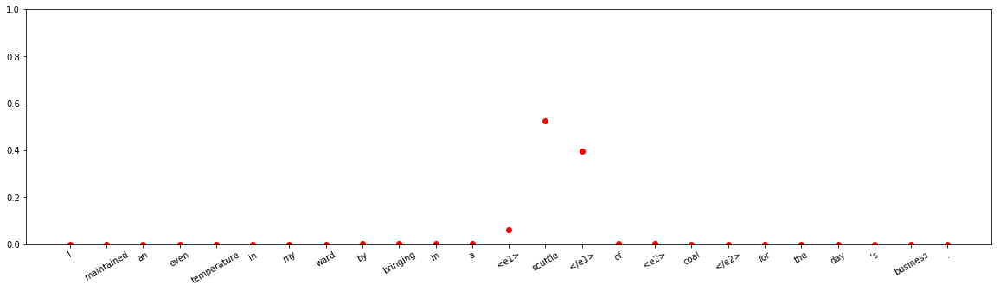





input sentence: The <e1> correspondence </e1> encloses a purported <e2> cheque </e2> , as described above , for $ 2980.00 , to go towards these fees .
answer label:    Content-Container(e2,e1)
wrong label:    Product-Producer(e2,e1)
Other 	:	 2.2553676e-12
Entity-Destination(e1,e2) 	:	 3.0552758e-11
Cause-Effect(e2,e1) 	:	 2.0505682e-16
Member-Collection(e2,e1) 	:	 1.7235866e-08
Entity-Origin(e1,e2) 	:	 3.5817333e-08
Message-Topic(e1,e2) 	:	 1.1467758e-05
Component-Whole(e1,e2) 	:	 4.9239373e-09
Component-Whole(e2,e1) 	:	 1.3251758e-06
Instrument-Agency(e2,e1) 	:	 1.5369112e-10
Content-Container(e1,e2) 	:	 4.0105046e-05
Product-Producer(e2,e1) 	:	 0.9898483
Cause-Effect(e1,e2) 	:	 1.9021444e-10
Product-Producer(e1,e2) 	:	 1.1511164e-08
Content-Container(e2,e1) 	:	 0.010098719
Entity-Origin(e2,e1) 	:	 4.3473015e-08
Message-Topic(e2,e1) 	:	 6.0631986e-11
Instrument-Agency(e1,e2) 	:	 8.6554625e-11
Member-Collection(e1,e2) 	:	 4.5799406e-10
Entity-Destination(e2,e1) 	:	 2.3425623e-10



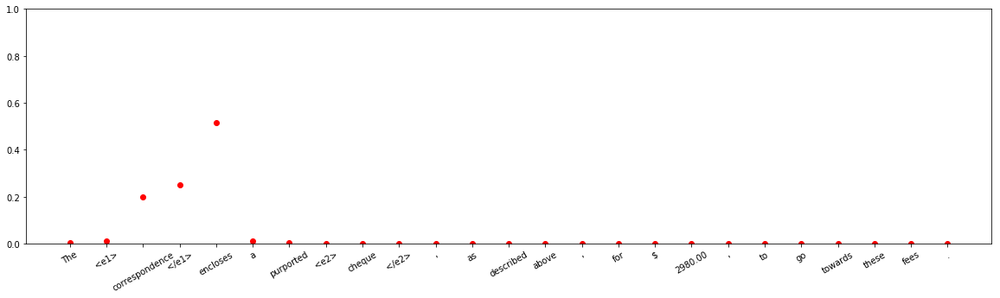


input sentence: Inside of it , the first <e1> details </e1> about the game were revealed through an <e2> interview </e2> with series director Masahiro Yasuma .
answer label:    Message-Topic(e2,e1)
wrong label:    Product-Producer(e1,e2)
Other 	:	 2.5968452e-10
Entity-Destination(e1,e2) 	:	 2.3722455e-11
Cause-Effect(e2,e1) 	:	 5.937103e-09
Member-Collection(e2,e1) 	:	 1.0452351e-07
Entity-Origin(e1,e2) 	:	 8.762261e-05
Message-Topic(e1,e2) 	:	 3.3783235e-05
Component-Whole(e1,e2) 	:	 2.2702005e-05
Component-Whole(e2,e1) 	:	 0.00073216006
Instrument-Agency(e2,e1) 	:	 1.0578555e-09
Content-Container(e1,e2) 	:	 2.9205669e-08
Product-Producer(e2,e1) 	:	 2.4537414e-08
Cause-Effect(e1,e2) 	:	 5.023859e-13
Product-Producer(e1,e2) 	:	 0.94581777
Content-Container(e2,e1) 	:	 7.0579103e-09
Entity-Origin(e2,e1) 	:	 1.2861564e-11
Message-Topic(e2,e1) 	:	 0.053305674
Instrument-Agency(e1,e2) 	:	 1.537538e-07
Member-Collection(e1,e2) 	:	 2.488559e-11
Entity-Destination(e2,e1) 	:	 9.3704315e-11



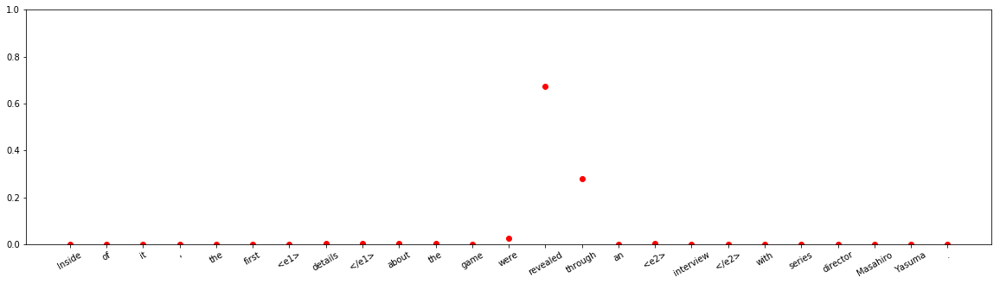


input sentence: There is the evidence , photographic and otherwise , recording the <e1> debris </e1> caused by the subsequent <e2> fire </e2> and the explosions .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 5.867625e-17
Entity-Destination(e1,e2) 	:	 1.4933735e-14
Cause-Effect(e2,e1) 	:	 0.9999999
Member-Collection(e2,e1) 	:	 1.9462507e-15
Entity-Origin(e1,e2) 	:	 3.7726305e-14
Message-Topic(e1,e2) 	:	 5.833434e-17
Component-Whole(e1,e2) 	:	 5.5917376e-12
Component-Whole(e2,e1) 	:	 2.764669e-13
Instrument-Agency(e2,e1) 	:	 6.4992784e-14
Content-Container(e1,e2) 	:	 1.9539696e-18
Product-Producer(e2,e1) 	:	 2.3588387e-15
Cause-Effect(e1,e2) 	:	 8.275836e-08
Product-Producer(e1,e2) 	:	 9.826013e-09
Content-Container(e2,e1) 	:	 1.0167051e-15
Entity-Origin(e2,e1) 	:	 7.273849e-18
Message-Topic(e2,e1) 	:	 1.838237e-14
Instrument-Agency(e1,e2) 	:	 1.9979203e-10
Member-Collection(e1,e2) 	:	 2.8960898e-16
Entity-Destination(e2,e1) 	:	 3.9871723e-17



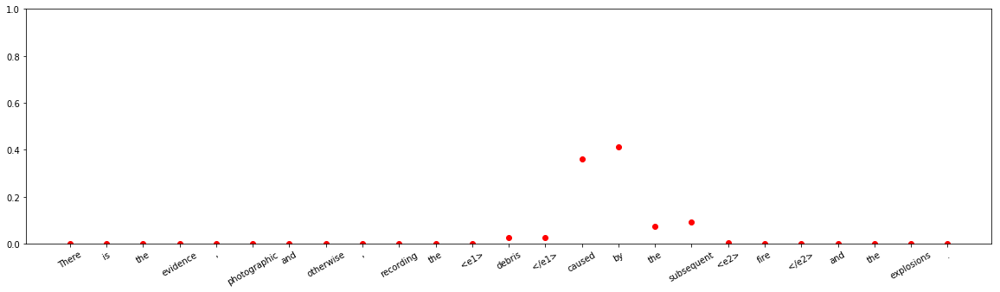





input sentence: Tuesday night , a mysterious white <e1> powder </e1> was discovered inside a <e2> roll </e2> of quarters at the Lakeshore Mall movie theater .
answer label:    Content-Container(e1,e2)
wrong label:    Other
Other 	:	 0.99999964
Entity-Destination(e1,e2) 	:	 1.828661e-15
Cause-Effect(e2,e1) 	:	 7.265699e-13
Member-Collection(e2,e1) 	:	 8.033813e-16
Entity-Origin(e1,e2) 	:	 4.456905e-12
Message-Topic(e1,e2) 	:	 1.03774335e-14
Component-Whole(e1,e2) 	:	 6.4775854e-13
Component-Whole(e2,e1) 	:	 3.4327586e-14
Instrument-Agency(e2,e1) 	:	 2.873783e-15
Content-Container(e1,e2) 	:	 3.5511584e-07
Product-Producer(e2,e1) 	:	 1.1675059e-13
Cause-Effect(e1,e2) 	:	 3.449227e-13
Product-Producer(e1,e2) 	:	 7.6291966e-14
Content-Container(e2,e1) 	:	 5.3141103e-12
Entity-Origin(e2,e1) 	:	 1.2112929e-11
Message-Topic(e2,e1) 	:	 1.7417384e-11
Instrument-Agency(e1,e2) 	:	 5.7906796e-12
Member-Collection(e1,e2) 	:	 8.246757e-13
Entity-Destination(e2,e1) 	:	 3.9217805e-16



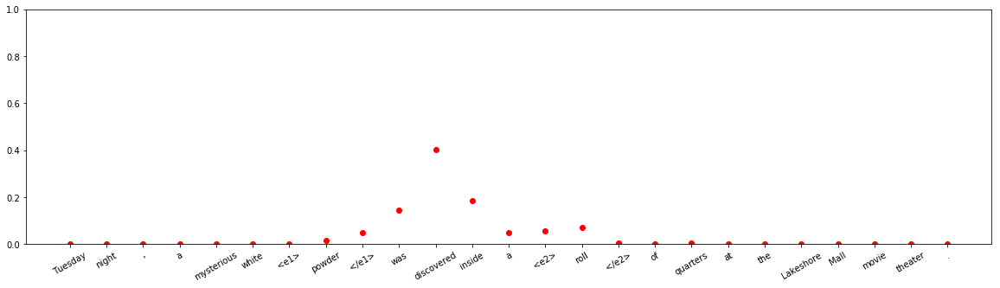


input sentence: The <e1> pilots </e1> have flown into <e2> trouble </e2> before they have even seen it by flying near the base of the clouds .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 0.00051657873
Entity-Destination(e1,e2) 	:	 0.8931024
Cause-Effect(e2,e1) 	:	 1.4991929e-07
Member-Collection(e2,e1) 	:	 4.007207e-07
Entity-Origin(e1,e2) 	:	 4.214687e-05
Message-Topic(e1,e2) 	:	 1.6838203e-07
Component-Whole(e1,e2) 	:	 5.438186e-11
Component-Whole(e2,e1) 	:	 2.6836538e-11
Instrument-Agency(e2,e1) 	:	 1.7966309e-07
Content-Container(e1,e2) 	:	 2.7076017e-06
Product-Producer(e2,e1) 	:	 1.0631836e-06
Cause-Effect(e1,e2) 	:	 0.0076828245
Product-Producer(e1,e2) 	:	 1.149632e-09
Content-Container(e2,e1) 	:	 2.6881608e-08
Entity-Origin(e2,e1) 	:	 7.722344e-06
Message-Topic(e2,e1) 	:	 3.4596714e-10
Instrument-Agency(e1,e2) 	:	 2.9019462e-05
Member-Collection(e1,e2) 	:	 0.09861453
Entity-Destination(e2,e1) 	:	 3.0798655e-11



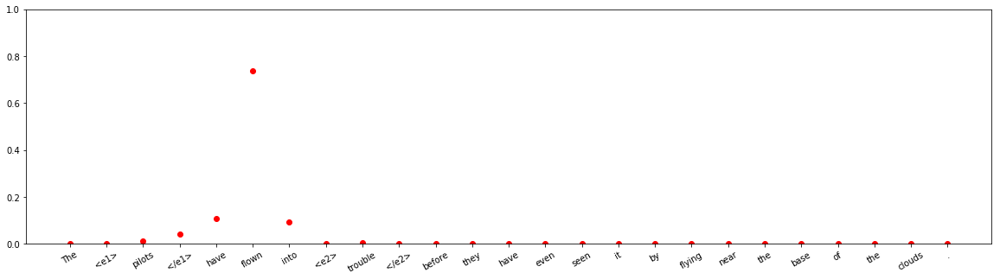







input sentence: <e1> Stimulation </e1> of the posterior horn of the medial meniscus produced a measurable amount of CMAP <e2> latency </e2> for the semimembranosus muscle .
answer label:    Cause-Effect(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 0.0013706059
Entity-Destination(e1,e2) 	:	 1.923173e-06
Cause-Effect(e2,e1) 	:	 0.26026303
Member-Collection(e2,e1) 	:	 1.3150005e-06
Entity-Origin(e1,e2) 	:	 1.351333e-09
Message-Topic(e1,e2) 	:	 2.0245163e-06
Component-Whole(e1,e2) 	:	 0.69651395
Component-Whole(e2,e1) 	:	 0.040687397
Instrument-Agency(e2,e1) 	:	 0.00028895508
Content-Container(e1,e2) 	:	 8.248497e-08
Product-Producer(e2,e1) 	:	 6.7845853e-09
Cause-Effect(e1,e2) 	:	 0.00078186626
Product-Producer(e1,e2) 	:	 2.6036862e-08
Content-Container(e2,e1) 	:	 1.9772666e-07
Entity-Origin(e2,e1) 	:	 1.0334168e-09
Message-Topic(e2,e1) 	:	 5.4626897e-05
Instrument-Agency(e1,e2) 	:	 3.383529e-05
Member-Collection(e1,e2) 	:	 4.485357e-08
Entity-Destination(e2,e1) 	:	 1.855

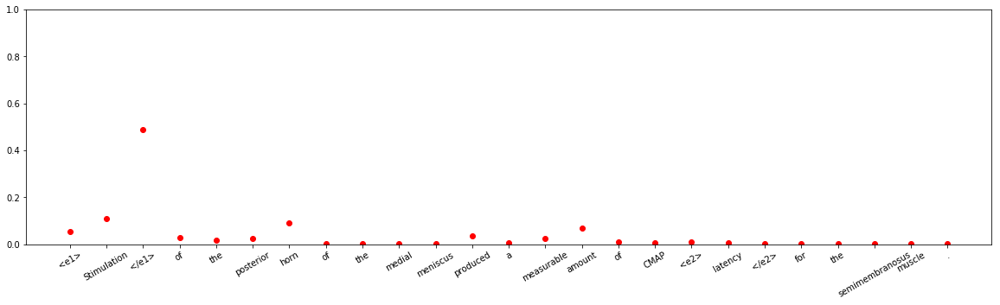


input sentence: The US <e1> price </e1> of gasoline went unchanged from two <e2> weeks </e2> ago , holding an average of $ 2.64 a gallon .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 5.9545556e-07
Entity-Destination(e1,e2) 	:	 2.393477e-11
Cause-Effect(e2,e1) 	:	 3.060117e-08
Member-Collection(e2,e1) 	:	 1.2300605e-11
Entity-Origin(e1,e2) 	:	 0.9999881
Message-Topic(e1,e2) 	:	 1.3102836e-16
Component-Whole(e1,e2) 	:	 2.2075599e-13
Component-Whole(e2,e1) 	:	 1.6193819e-06
Instrument-Agency(e2,e1) 	:	 1.1556798e-08
Content-Container(e1,e2) 	:	 9.6365975e-06
Product-Producer(e2,e1) 	:	 1.5996578e-10
Cause-Effect(e1,e2) 	:	 5.2280852e-14
Product-Producer(e1,e2) 	:	 1.4694559e-09
Content-Container(e2,e1) 	:	 1.1759779e-10
Entity-Origin(e2,e1) 	:	 2.4772534e-10
Message-Topic(e2,e1) 	:	 4.0691632e-09
Instrument-Agency(e1,e2) 	:	 9.260157e-11
Member-Collection(e1,e2) 	:	 1.099232e-11
Entity-Destination(e2,e1) 	:	 1.7806819e-13



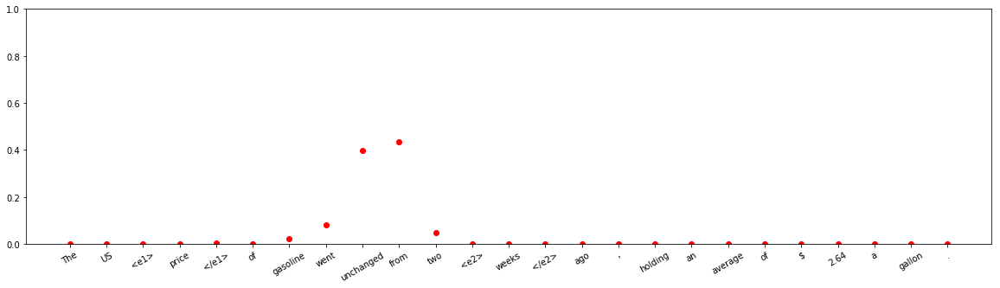















input sentence: Over the six years , this club donated a large <e1> amount </e1> of money to local children 's <e2> charities </e2> and families .
answer label:    Entity-Destination(e1,e2)
wrong label:    Message-Topic(e1,e2)
Other 	:	 8.552584e-06
Entity-Destination(e1,e2) 	:	 0.025377508
Cause-Effect(e2,e1) 	:	 2.5585268e-05
Member-Collection(e2,e1) 	:	 0.07927224
Entity-Origin(e1,e2) 	:	 3.1746852e-06
Message-Topic(e1,e2) 	:	 0.69196475
Component-Whole(e1,e2) 	:	 0.00011269623
Component-Whole(e2,e1) 	:	 2.6479396e-09
Instrument-Agency(e2,e1) 	:	 7.1503996e-07
Content-Container(e1,e2) 	:	 1.5506444e-05
Product-Producer(e2,e1) 	:	 1.8053353e-05
Cause-Effect(e1,e2) 	:	 0.093140095
Product-Producer(e1,e2) 	:	 0.011750472
Content-Container(e2,e1) 	:	 0.0044660796
Entity-Origin(e2,e1) 	:	 0.024466075
Message-Topic(e2,e1) 	:	 1.3563595e-05
Instrument-Agency(e1,e2) 	:	 0.0688695
Member-Collection(e1,e2) 	:	 0.00049525267
Entity-Destination(e2,e1) 	:	 9.6094745e-08



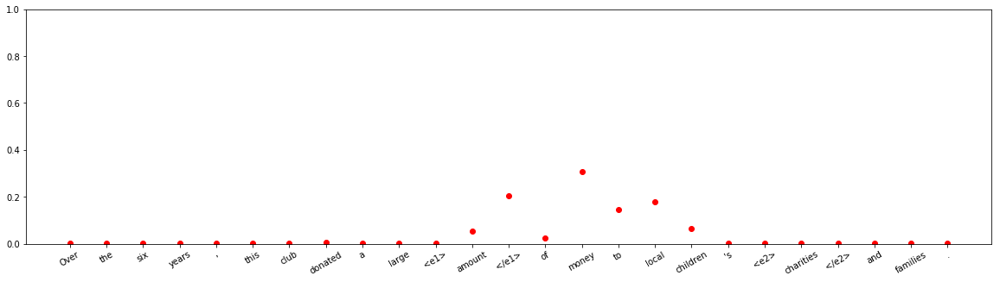





input sentence: He then escalated a <e1> quarrel </e1> with Austria and its German allies over the <e2> administration </e2> of these provinces into a war .
answer label:    Other
wrong label:    Message-Topic(e1,e2)
Other 	:	 9.922106e-06
Entity-Destination(e1,e2) 	:	 3.2289008e-06
Cause-Effect(e2,e1) 	:	 0.0072491453
Member-Collection(e2,e1) 	:	 0.023280159
Entity-Origin(e1,e2) 	:	 2.3433374e-07
Message-Topic(e1,e2) 	:	 0.4922602
Component-Whole(e1,e2) 	:	 9.1707483e-07
Component-Whole(e2,e1) 	:	 3.0222182e-08
Instrument-Agency(e2,e1) 	:	 0.015488797
Content-Container(e1,e2) 	:	 2.9018937e-10
Product-Producer(e2,e1) 	:	 0.025844393
Cause-Effect(e1,e2) 	:	 0.34970814
Product-Producer(e1,e2) 	:	 0.00036596743
Content-Container(e2,e1) 	:	 2.669782e-07
Entity-Origin(e2,e1) 	:	 2.4155173e-05
Message-Topic(e2,e1) 	:	 0.003712994
Instrument-Agency(e1,e2) 	:	 0.061119996
Member-Collection(e1,e2) 	:	 0.020931404
Entity-Destination(e2,e1) 	:	 4.0976726e-08



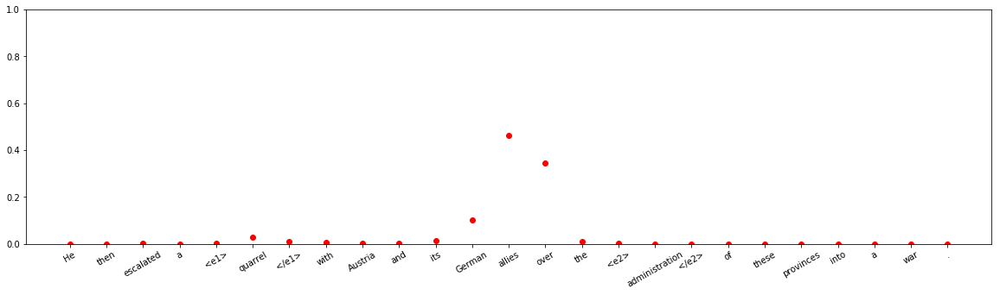











input sentence: The flux <e1> sensor </e1> moves a half <e2> circle </e2> around the filament in order to measure the spatial directivity of each heater .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 9.384123e-08
Entity-Destination(e1,e2) 	:	 2.268288e-11
Cause-Effect(e2,e1) 	:	 2.4870857e-08
Member-Collection(e2,e1) 	:	 1.9942381e-11
Entity-Origin(e1,e2) 	:	 2.5563425e-08
Message-Topic(e1,e2) 	:	 5.190046e-14
Component-Whole(e1,e2) 	:	 2.5356787e-05
Component-Whole(e2,e1) 	:	 0.9999372
Instrument-Agency(e2,e1) 	:	 5.141465e-07
Content-Container(e1,e2) 	:	 1.1521382e-10
Product-Producer(e2,e1) 	:	 4.2314943e-10
Cause-Effect(e1,e2) 	:	 2.8630058e-08
Product-Producer(e1,e2) 	:	 5.3173976e-12
Content-Container(e2,e1) 	:	 3.8095602e-10
Entity-Origin(e2,e1) 	:	 2.9120766e-12
Message-Topic(e2,e1) 	:	 1.0269331e-12
Instrument-Agency(e1,e2) 	:	 3.685755e-05
Member-Collection(e1,e2) 	:	 2.4647874e-11
Entity-Destination(e2,e1) 	:	 3.4137636e-12



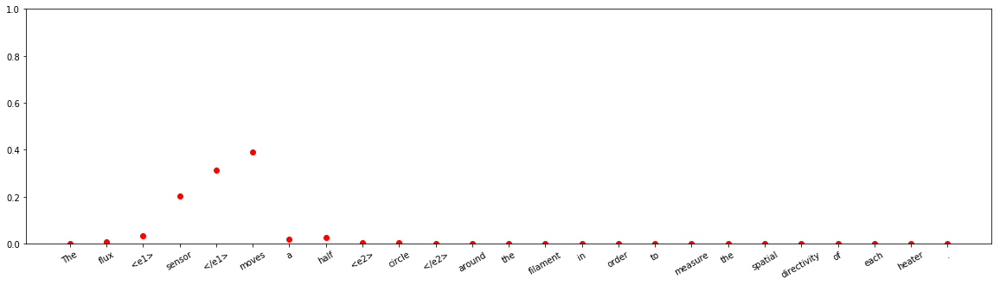







input sentence: Accidentally , one <e1> worker </e1> was locked in a refrigerator <e2> boxcar </e2> , and the rest of the workmen left the site .
answer label:    Other
wrong label:    Content-Container(e1,e2)
Other 	:	 8.9295427e-10
Entity-Destination(e1,e2) 	:	 0.3547796
Cause-Effect(e2,e1) 	:	 2.0158049e-11
Member-Collection(e2,e1) 	:	 4.2166312e-11
Entity-Origin(e1,e2) 	:	 6.152208e-05
Message-Topic(e1,e2) 	:	 6.6833106e-15
Component-Whole(e1,e2) 	:	 5.417886e-08
Component-Whole(e2,e1) 	:	 5.640346e-11
Instrument-Agency(e2,e1) 	:	 1.1987126e-05
Content-Container(e1,e2) 	:	 0.6449649
Product-Producer(e2,e1) 	:	 4.2655515e-07
Cause-Effect(e1,e2) 	:	 4.32597e-12
Product-Producer(e1,e2) 	:	 1.2346429e-12
Content-Container(e2,e1) 	:	 4.442617e-09
Entity-Origin(e2,e1) 	:	 1.529478e-10
Message-Topic(e2,e1) 	:	 1.3725315e-08
Instrument-Agency(e1,e2) 	:	 9.40046e-10
Member-Collection(e1,e2) 	:	 0.0001815182
Entity-Destination(e2,e1) 	:	 2.1372761e-11



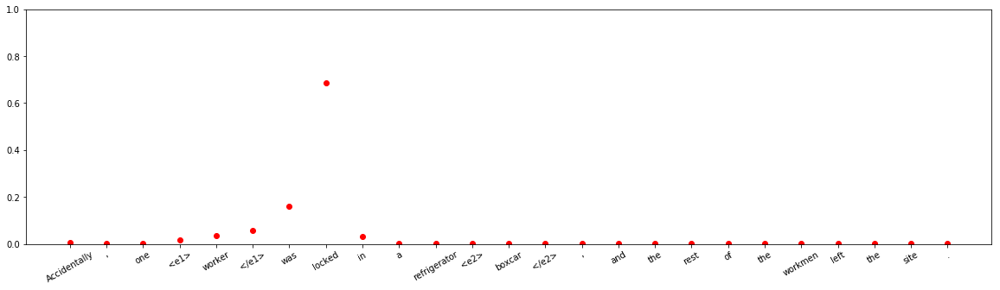


input sentence: Godfrey and I , caught up in the <e1> whirl </e1> of <e2> insects </e2> , had become part of the forest , too .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 1.5886622e-11
Entity-Destination(e1,e2) 	:	 6.2984444e-12
Cause-Effect(e2,e1) 	:	 1.1523689e-09
Member-Collection(e2,e1) 	:	 0.9999939
Entity-Origin(e1,e2) 	:	 9.229776e-11
Message-Topic(e1,e2) 	:	 1.0716574e-10
Component-Whole(e1,e2) 	:	 6.0482203e-06
Component-Whole(e2,e1) 	:	 2.0853734e-09
Instrument-Agency(e2,e1) 	:	 1.6006274e-15
Content-Container(e1,e2) 	:	 2.2196764e-14
Product-Producer(e2,e1) 	:	 5.4248647e-13
Cause-Effect(e1,e2) 	:	 3.738186e-09
Product-Producer(e1,e2) 	:	 5.920775e-10
Content-Container(e2,e1) 	:	 1.39505625e-08
Entity-Origin(e2,e1) 	:	 6.799892e-10
Message-Topic(e2,e1) 	:	 1.2020414e-10
Instrument-Agency(e1,e2) 	:	 6.3582983e-09
Member-Collection(e1,e2) 	:	 1.064408e-09
Entity-Destination(e2,e1) 	:	 9.528088e-14



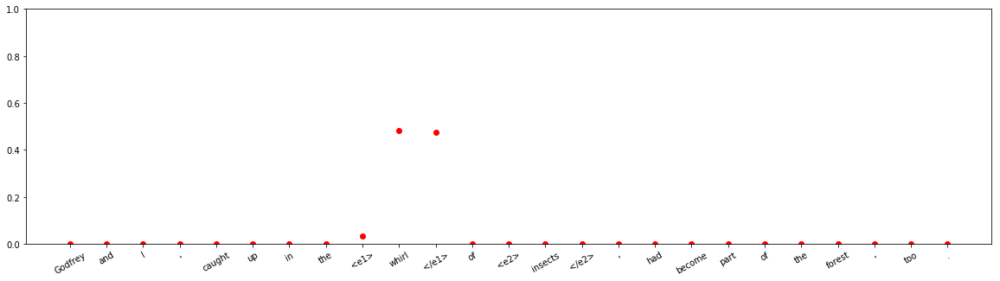


input sentence: The engine revved a bit in the lower gears , but was adjusted immediately by the <e1> guy </e1> with a <e2> knob </e2> .
answer label:    Instrument-Agency(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.3791397e-06
Entity-Destination(e1,e2) 	:	 4.78793e-12
Cause-Effect(e2,e1) 	:	 3.472451e-08
Member-Collection(e2,e1) 	:	 1.4124461e-11
Entity-Origin(e1,e2) 	:	 7.032961e-09
Message-Topic(e1,e2) 	:	 4.4067626e-15
Component-Whole(e1,e2) 	:	 7.388813e-11
Component-Whole(e2,e1) 	:	 0.8808937
Instrument-Agency(e2,e1) 	:	 0.11910463
Content-Container(e1,e2) 	:	 6.078295e-09
Product-Producer(e2,e1) 	:	 7.1753725e-08
Cause-Effect(e1,e2) 	:	 2.3847684e-11
Product-Producer(e1,e2) 	:	 3.8977325e-11
Content-Container(e2,e1) 	:	 1.2706592e-11
Entity-Origin(e2,e1) 	:	 9.494984e-16
Message-Topic(e2,e1) 	:	 2.609425e-09
Instrument-Agency(e1,e2) 	:	 6.265206e-08
Member-Collection(e1,e2) 	:	 1.8940919e-12
Entity-Destination(e2,e1) 	:	 1.1113828e-12



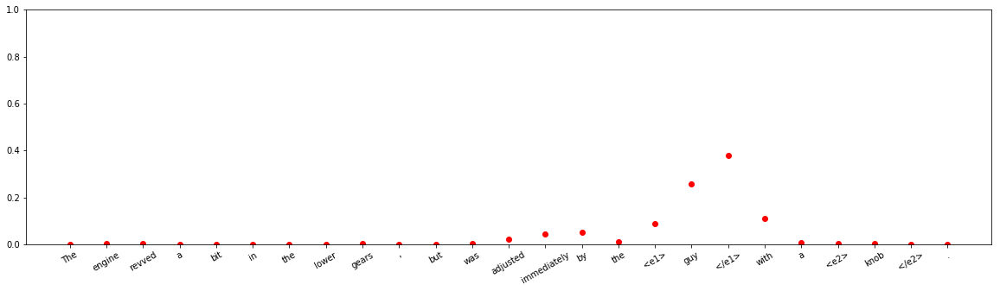


input sentence: Overcome with hunger , the <e1> fox </e1> tore into the carcass with a <e2> fury </e2> , sending feathers scattering every which way .
answer label:    Other
wrong label:    Entity-Destination(e1,e2)
Other 	:	 0.004463586
Entity-Destination(e1,e2) 	:	 0.855431
Cause-Effect(e2,e1) 	:	 0.00090292504
Member-Collection(e2,e1) 	:	 2.9043156e-05
Entity-Origin(e1,e2) 	:	 6.868963e-06
Message-Topic(e1,e2) 	:	 2.4262668e-05
Component-Whole(e1,e2) 	:	 0.00054006977
Component-Whole(e2,e1) 	:	 0.0017909153
Instrument-Agency(e2,e1) 	:	 0.0002701661
Content-Container(e1,e2) 	:	 5.4097876e-05
Product-Producer(e2,e1) 	:	 7.503015e-05
Cause-Effect(e1,e2) 	:	 0.11980949
Product-Producer(e1,e2) 	:	 1.1265824e-07
Content-Container(e2,e1) 	:	 9.339808e-05
Entity-Origin(e2,e1) 	:	 2.9515249e-08
Message-Topic(e2,e1) 	:	 1.3580815e-08
Instrument-Agency(e1,e2) 	:	 0.012053965
Member-Collection(e1,e2) 	:	 0.0044552465
Entity-Destination(e2,e1) 	:	 3.6506211e-09



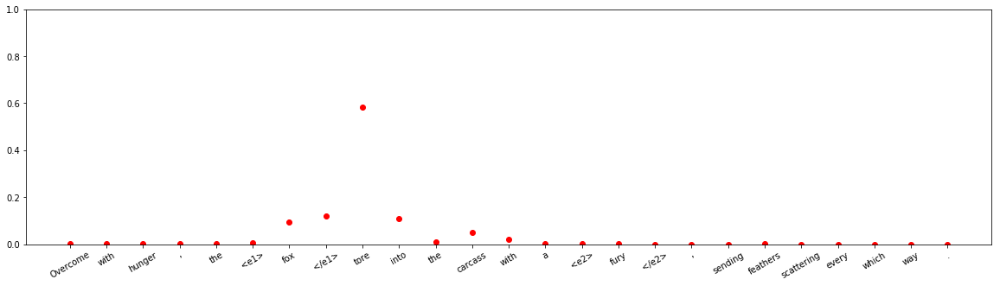





input sentence: The disease most often starts in the palm of the <e1> hand </e1> at the base of the ring or small <e2> fingers </e2> .
answer label:    Component-Whole(e2,e1)
wrong label:    Component-Whole(e1,e2)
Other 	:	 2.7253835e-11
Entity-Destination(e1,e2) 	:	 2.9365968e-11
Cause-Effect(e2,e1) 	:	 1.4620734e-08
Member-Collection(e2,e1) 	:	 8.61485e-12
Entity-Origin(e1,e2) 	:	 7.560442e-08
Message-Topic(e1,e2) 	:	 1.7006117e-12
Component-Whole(e1,e2) 	:	 0.9383795
Component-Whole(e2,e1) 	:	 0.061618153
Instrument-Agency(e2,e1) 	:	 1.0833721e-06
Content-Container(e1,e2) 	:	 9.075182e-07
Product-Producer(e2,e1) 	:	 1.5720619e-12
Cause-Effect(e1,e2) 	:	 1.8510922e-11
Product-Producer(e1,e2) 	:	 6.595629e-12
Content-Container(e2,e1) 	:	 1.0472632e-08
Entity-Origin(e2,e1) 	:	 5.9807747e-13
Message-Topic(e2,e1) 	:	 1.7312872e-13
Instrument-Agency(e1,e2) 	:	 2.0494222e-07
Member-Collection(e1,e2) 	:	 2.680736e-11
Entity-Destination(e2,e1) 	:	 6.2261346e-12



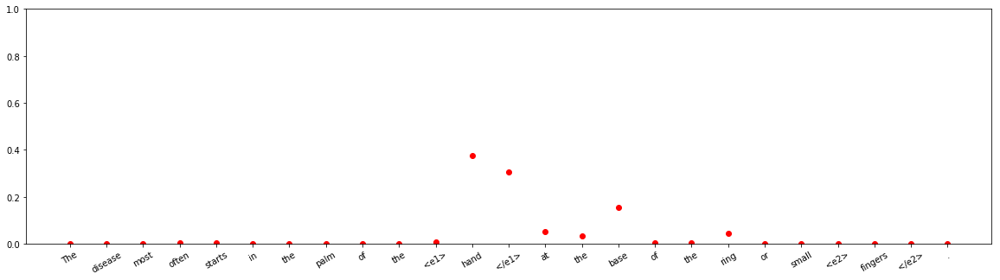



input sentence: In particular , the 'historical inevitability ' of a united <e1> proletariat </e1> of various <e2> nationalities </e2> was understood as a state interest .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 3.1585292e-05
Entity-Destination(e1,e2) 	:	 1.7208912e-10
Cause-Effect(e2,e1) 	:	 2.4953074e-08
Member-Collection(e2,e1) 	:	 0.9994935
Entity-Origin(e1,e2) 	:	 4.5011888e-08
Message-Topic(e1,e2) 	:	 3.7797022e-07
Component-Whole(e1,e2) 	:	 2.6397004e-08
Component-Whole(e2,e1) 	:	 1.5345707e-10
Instrument-Agency(e2,e1) 	:	 1.4464716e-09
Content-Container(e1,e2) 	:	 1.1769514e-09
Product-Producer(e2,e1) 	:	 3.0650367e-06
Cause-Effect(e1,e2) 	:	 1.8590076e-07
Product-Producer(e1,e2) 	:	 3.020142e-07
Content-Container(e2,e1) 	:	 1.1300566e-07
Entity-Origin(e2,e1) 	:	 3.5741689e-06
Message-Topic(e2,e1) 	:	 1.0257416e-08
Instrument-Agency(e1,e2) 	:	 0.0001855268
Member-Collection(e1,e2) 	:	 0.00028171382
Entity-Destination(e2,e1) 	:	 1.5017376e-11


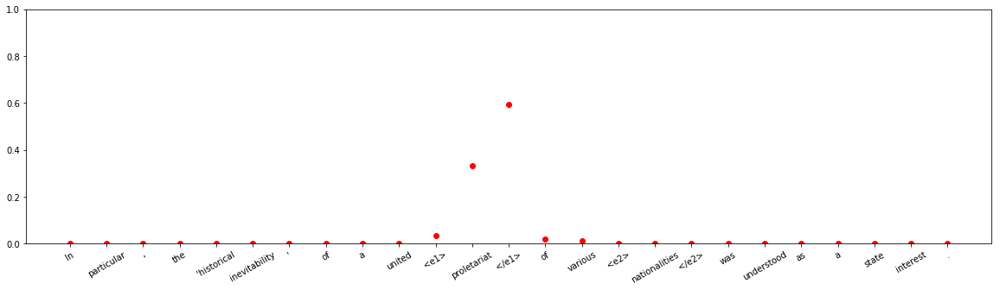



input sentence: The deputy <e1> commissioner </e1> is assisted by a number of <e2> officers </e2> belonging to Uttar Pradesh Civil Service and other Uttar Pradesh .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.005018096
Entity-Destination(e1,e2) 	:	 1.2564382e-08
Cause-Effect(e2,e1) 	:	 1.5392928e-06
Member-Collection(e2,e1) 	:	 0.00029979108
Entity-Origin(e1,e2) 	:	 6.186581e-05
Message-Topic(e1,e2) 	:	 8.022395e-12
Component-Whole(e1,e2) 	:	 7.4014226e-09
Component-Whole(e2,e1) 	:	 2.1368243e-05
Instrument-Agency(e2,e1) 	:	 0.9847727
Content-Container(e1,e2) 	:	 2.1864723e-08
Product-Producer(e2,e1) 	:	 0.0001834688
Cause-Effect(e1,e2) 	:	 4.0848543e-11
Product-Producer(e1,e2) 	:	 0.00623435
Content-Container(e2,e1) 	:	 1.1161073e-06
Entity-Origin(e2,e1) 	:	 1.1650363e-11
Message-Topic(e2,e1) 	:	 0.00034753847
Instrument-Agency(e1,e2) 	:	 0.002865592
Member-Collection(e1,e2) 	:	 0.0001925008
Entity-Destination(e2,e1) 	:	 2.8462066e-10



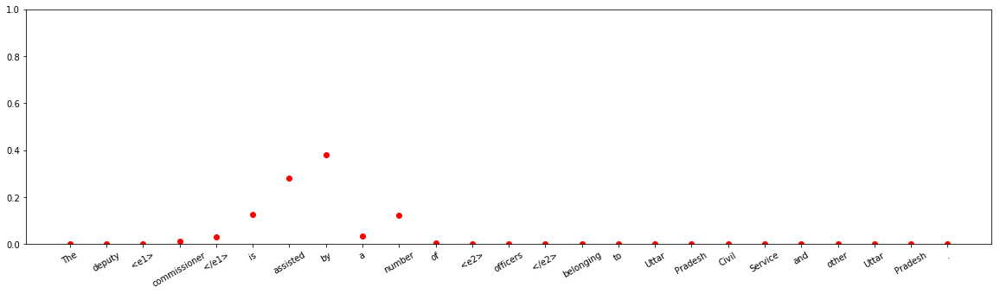




input sentence: State police are investigating the discovery of a human <e1> skull </e1> in a black <e2> cauldron </e2> in a wooded area in Conowingo .
answer label:    Content-Container(e1,e2)
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.1829325e-06
Entity-Destination(e1,e2) 	:	 0.00090379716
Cause-Effect(e2,e1) 	:	 2.394528e-08
Member-Collection(e2,e1) 	:	 4.7174438e-09
Entity-Origin(e1,e2) 	:	 3.0492058e-07
Message-Topic(e1,e2) 	:	 7.723716e-13
Component-Whole(e1,e2) 	:	 0.9692797
Component-Whole(e2,e1) 	:	 4.2106268e-10
Instrument-Agency(e2,e1) 	:	 1.6847945e-10
Content-Container(e1,e2) 	:	 0.029695023
Product-Producer(e2,e1) 	:	 1.3526302e-09
Cause-Effect(e1,e2) 	:	 1.6602805e-12
Product-Producer(e1,e2) 	:	 7.023875e-10
Content-Container(e2,e1) 	:	 9.6363605e-05
Entity-Origin(e2,e1) 	:	 8.8987394e-11
Message-Topic(e2,e1) 	:	 1.4390273e-09
Instrument-Agency(e1,e2) 	:	 4.226835e-09
Member-Collection(e1,e2) 	:	 2.3562256e-05
Entity-Destination(e2,e1) 	:	 1.2595041e-09



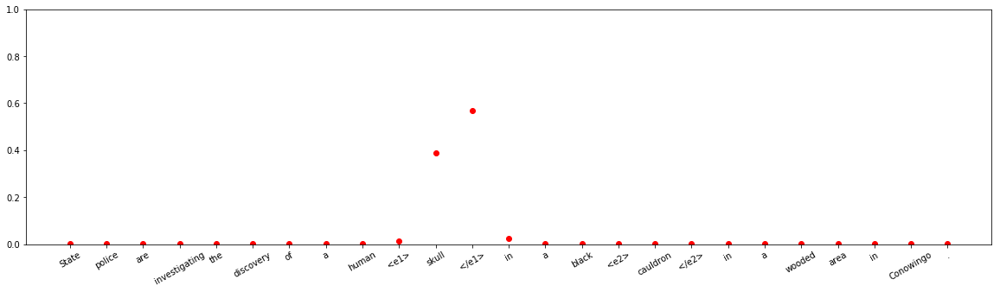









input sentence: The size of the hole meant that when the <e1> server </e1> was put inside the <e2> cabinet </e2> it was dead easy to put the power and network wires through the hole .
answer label:    Entity-Destination(e1,e2)
wrong label:    Content-Container(e1,e2)
Other 	:	 2.749566e-06
Entity-Destination(e1,e2) 	:	 0.021910103
Cause-Effect(e2,e1) 	:	 6.735388e-13
Member-Collection(e2,e1) 	:	 4.0936164e-11
Entity-Origin(e1,e2) 	:	 1.6360232e-06
Message-Topic(e1,e2) 	:	 2.5710137e-12
Component-Whole(e1,e2) 	:	 8.0724185e-06
Component-Whole(e2,e1) 	:	 1.4534655e-10
Instrument-Agency(e2,e1) 	:	 7.836317e-10
Content-Container(e1,e2) 	:	 0.9780758
Product-Producer(e2,e1) 	:	 2.918011e-07
Cause-Effect(e1,e2) 	:	 2.3336804e-13
Product-Producer(e1,e2) 	:	 2.5699e-09
Content-Container(e2,e1) 	:	 2.5569008e-08
Entity-Origin(e2,e1) 	:	 4.2054532e-10
Message-Topic(e2,e1) 	:	 7.901263e-09
Instrument-Agency(e1,e2) 	:	 1.2642247e-09
Member-Collection(e1,e2) 	:	 1.233011e-06
Entity-Destinat

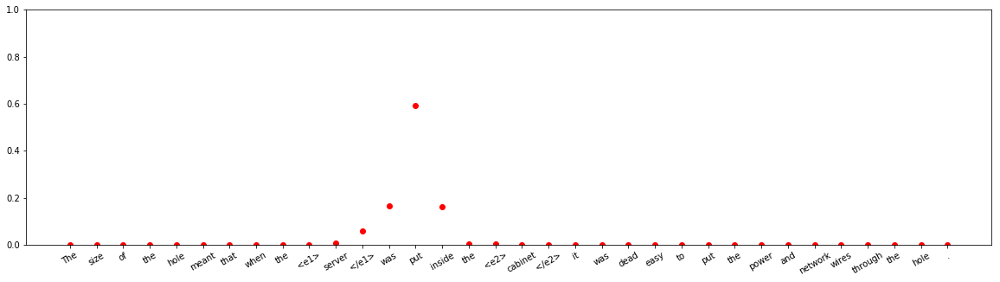





input sentence: He preserved the working ranches of the west , while achieving an <e1> expansion </e1> of the ranch 's value through <e2> development </e2> and management of the recreational ecosystem within the ranch .
answer label:    Cause-Effect(e2,e1)
wrong label:    Other
Other 	:	 0.87781316
Entity-Destination(e1,e2) 	:	 6.9336688e-09
Cause-Effect(e2,e1) 	:	 0.0001063221
Member-Collection(e2,e1) 	:	 8.310031e-05
Entity-Origin(e1,e2) 	:	 2.5215735e-07
Message-Topic(e1,e2) 	:	 0.00043127502
Component-Whole(e1,e2) 	:	 0.049735483
Component-Whole(e2,e1) 	:	 0.001218621
Instrument-Agency(e2,e1) 	:	 5.025519e-07
Content-Container(e1,e2) 	:	 1.10141955e-05
Product-Producer(e2,e1) 	:	 7.557412e-09
Cause-Effect(e1,e2) 	:	 4.1108597e-06
Product-Producer(e1,e2) 	:	 0.007964377
Content-Container(e2,e1) 	:	 0.00013443451
Entity-Origin(e2,e1) 	:	 3.0182136e-05
Message-Topic(e2,e1) 	:	 9.809986e-05
Instrument-Agency(e1,e2) 	:	 0.06236044
Member-Collection(e1,e2) 	:	 8.861564e-06
Entity-Des

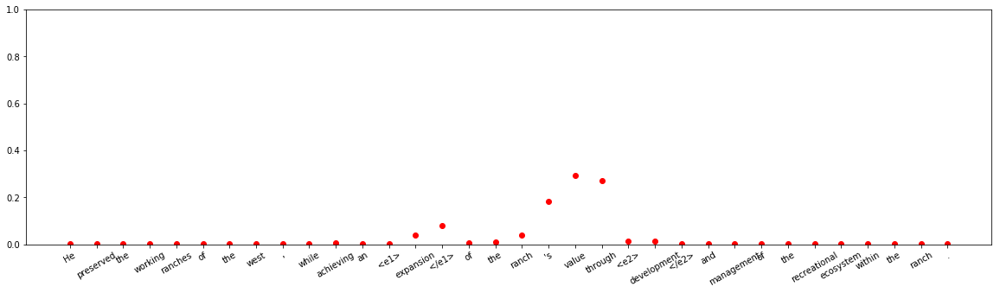


input sentence: Ceres is the largest known asteroid at approximately 950 km ( 590 miles ) in diameter , and it lies in the <e1> belt </e1> of <e2> asteroids </e2> between Mars and Jupiter .
answer label:    Member-Collection(e2,e1)
wrong label:    Component-Whole(e2,e1)
Other 	:	 0.0001605655
Entity-Destination(e1,e2) 	:	 2.2363728e-12
Cause-Effect(e2,e1) 	:	 1.8146626e-08
Member-Collection(e2,e1) 	:	 0.2926618
Entity-Origin(e1,e2) 	:	 1.2033584e-07
Message-Topic(e1,e2) 	:	 3.6666667e-10
Component-Whole(e1,e2) 	:	 0.17113845
Component-Whole(e2,e1) 	:	 0.53566706
Instrument-Agency(e2,e1) 	:	 6.243108e-08
Content-Container(e1,e2) 	:	 6.788317e-08
Product-Producer(e2,e1) 	:	 1.3094218e-06
Cause-Effect(e1,e2) 	:	 1.406197e-08
Product-Producer(e1,e2) 	:	 2.1575245e-07
Content-Container(e2,e1) 	:	 0.0001712399
Entity-Origin(e2,e1) 	:	 9.138979e-09
Message-Topic(e2,e1) 	:	 1.4082457e-07
Instrument-Agency(e1,e2) 	:	 0.00019895175
Member-Collection(e1,e2) 	:	 1.4985174e-08
Entity-Destination(e

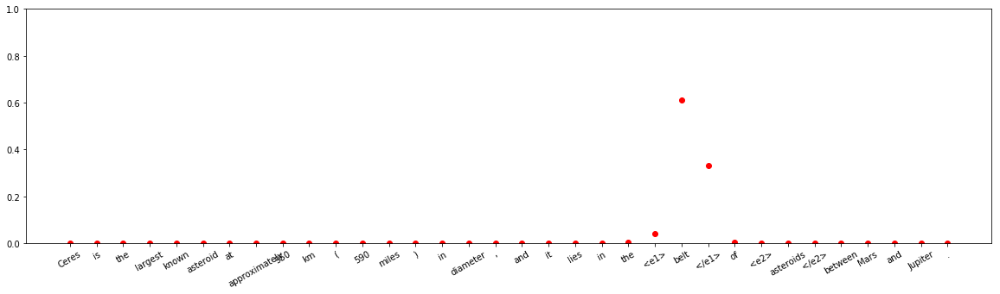



input sentence: The <e1> founder </e1> of a growing advertising <e2> agency </e2> is happy to see his business flourish , but is left wondering what his role is now that others have taken over .
answer label:    Product-Producer(e2,e1)
wrong label:    Other
Other 	:	 0.5503565
Entity-Destination(e1,e2) 	:	 1.1635239e-07
Cause-Effect(e2,e1) 	:	 5.0102612e-06
Member-Collection(e2,e1) 	:	 2.6206067e-07
Entity-Origin(e1,e2) 	:	 1.491333e-06
Message-Topic(e1,e2) 	:	 6.364119e-07
Component-Whole(e1,e2) 	:	 1.0968358e-05
Component-Whole(e2,e1) 	:	 9.654059e-10
Instrument-Agency(e2,e1) 	:	 5.7887642e-05
Content-Container(e1,e2) 	:	 5.396992e-07
Product-Producer(e2,e1) 	:	 0.15454094
Cause-Effect(e1,e2) 	:	 7.00164e-07
Product-Producer(e1,e2) 	:	 0.00012216702
Content-Container(e2,e1) 	:	 1.3576081e-07
Entity-Origin(e2,e1) 	:	 9.852588e-09
Message-Topic(e2,e1) 	:	 4.0391105e-06
Instrument-Agency(e1,e2) 	:	 0.003123084
Member-Collection(e1,e2) 	:	 0.29177552
Entity-Destination(e2,e1) 	:	 1.103

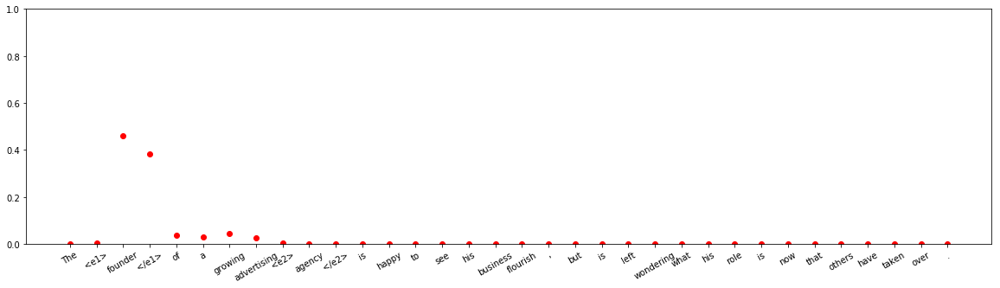




input sentence: In time we found that those pains and <e1> hurts </e1> from past <e2> memories </e2> were beginning to be mended and those past hurts became our scars , our badge of honor .
answer label:    Entity-Origin(e1,e2)
wrong label:    Cause-Effect(e2,e1)
Other 	:	 7.32486e-13
Entity-Destination(e1,e2) 	:	 5.1643516e-12
Cause-Effect(e2,e1) 	:	 0.99999726
Member-Collection(e2,e1) 	:	 5.5743123e-12
Entity-Origin(e1,e2) 	:	 2.3430325e-06
Message-Topic(e1,e2) 	:	 6.4767163e-17
Component-Whole(e1,e2) 	:	 3.5788856e-09
Component-Whole(e2,e1) 	:	 5.660861e-13
Instrument-Agency(e2,e1) 	:	 5.4033285e-14
Content-Container(e1,e2) 	:	 2.482073e-13
Product-Producer(e2,e1) 	:	 1.4112387e-12
Cause-Effect(e1,e2) 	:	 3.3093357e-12
Product-Producer(e1,e2) 	:	 1.8372363e-07
Content-Container(e2,e1) 	:	 1.7501343e-13
Entity-Origin(e2,e1) 	:	 5.195944e-10
Message-Topic(e2,e1) 	:	 1.0100035e-07
Instrument-Agency(e1,e2) 	:	 1.959327e-11
Member-Collection(e1,e2) 	:	 4.0311733e-11
Entity-Destination

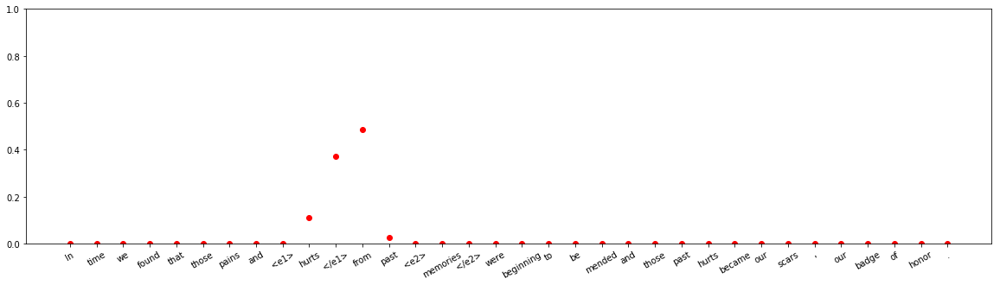



input sentence: The twenty-fifth ship , the <e1> fleet </e1> 's command <e2> ship </e2> Shinbatsu , continued on into Saturn space instead of returning home , escorted by the command ships Shugotenshi and Kergueren .
answer label:    Member-Collection(e2,e1)
wrong label:    Instrument-Agency(e1,e2)
Other 	:	 1.1109466e-09
Entity-Destination(e1,e2) 	:	 1.062738e-05
Cause-Effect(e2,e1) 	:	 8.192907e-09
Member-Collection(e2,e1) 	:	 0.0021382594
Entity-Origin(e1,e2) 	:	 0.018978057
Message-Topic(e1,e2) 	:	 5.9184348e-08
Component-Whole(e1,e2) 	:	 0.0012268028
Component-Whole(e2,e1) 	:	 0.0029791456
Instrument-Agency(e2,e1) 	:	 6.53038e-05
Content-Container(e1,e2) 	:	 6.4015953e-06
Product-Producer(e2,e1) 	:	 0.0014990468
Cause-Effect(e1,e2) 	:	 1.8433234e-08
Product-Producer(e1,e2) 	:	 0.25905308
Content-Container(e2,e1) 	:	 2.5025436e-06
Entity-Origin(e2,e1) 	:	 7.3983692e-06
Message-Topic(e2,e1) 	:	 1.3209373e-07
Instrument-Agency(e1,e2) 	:	 0.7131645
Member-Collection(e1,e2) 	:	 0.000

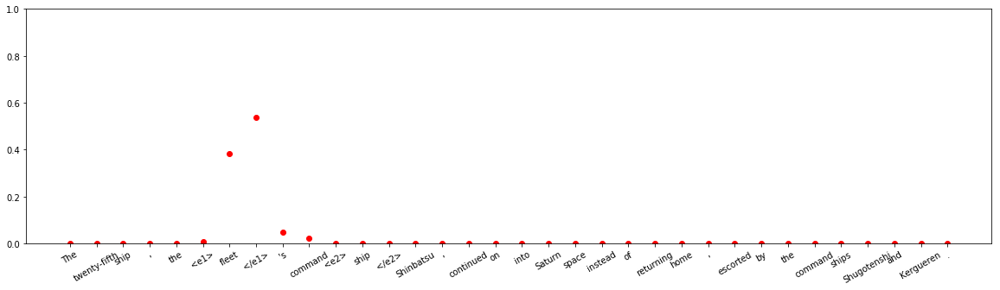




input sentence: In this marvelous book Smuts draws from years of painstaking field research in which she followed around a <e1> flange </e1> of chacma <e2> baboons </e2> in the Mateti Game Park in Zimbabwe .
answer label:    Member-Collection(e2,e1)
wrong label:    Component-Whole(e1,e2)
Other 	:	 2.9509128e-09
Entity-Destination(e1,e2) 	:	 2.9117906e-14
Cause-Effect(e2,e1) 	:	 5.1428497e-12
Member-Collection(e2,e1) 	:	 0.042971157
Entity-Origin(e1,e2) 	:	 2.9190475e-10
Message-Topic(e1,e2) 	:	 8.056851e-12
Component-Whole(e1,e2) 	:	 0.9570265
Component-Whole(e2,e1) 	:	 4.9505444e-10
Instrument-Agency(e2,e1) 	:	 1.3988801e-16
Content-Container(e1,e2) 	:	 6.256499e-14
Product-Producer(e2,e1) 	:	 1.9553993e-13
Cause-Effect(e1,e2) 	:	 5.2548968e-12
Product-Producer(e1,e2) 	:	 2.8610298e-08
Content-Container(e2,e1) 	:	 1.9926052e-09
Entity-Origin(e2,e1) 	:	 1.4505729e-10
Message-Topic(e2,e1) 	:	 3.4280005e-12
Instrument-Agency(e1,e2) 	:	 3.7064842e-07
Member-Collection(e1,e2) 	:	 2.0585

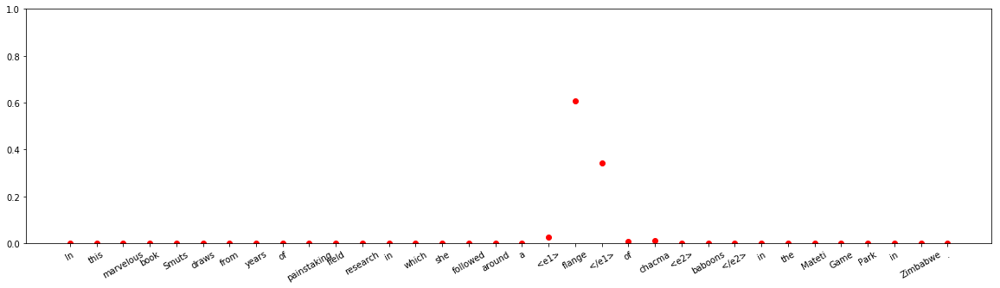


input sentence: The <e1> council </e1> has carved the city into <e2> zones </e2> it calls `` airsheds '' , and the most affected areas are those where the new rules are being applied first .
answer label:    Other
wrong label:    Product-Producer(e2,e1)
Other 	:	 0.14840344
Entity-Destination(e1,e2) 	:	 0.0013914071
Cause-Effect(e2,e1) 	:	 1.6536368e-11
Member-Collection(e2,e1) 	:	 8.980609e-06
Entity-Origin(e1,e2) 	:	 0.00014765761
Message-Topic(e1,e2) 	:	 2.1505979e-05
Component-Whole(e1,e2) 	:	 1.7062699e-06
Component-Whole(e2,e1) 	:	 9.666465e-06
Instrument-Agency(e2,e1) 	:	 4.8203295e-09
Content-Container(e1,e2) 	:	 6.804689e-05
Product-Producer(e2,e1) 	:	 0.8480979
Cause-Effect(e1,e2) 	:	 1.1403917e-08
Product-Producer(e1,e2) 	:	 8.140391e-06
Content-Container(e2,e1) 	:	 7.436518e-07
Entity-Origin(e2,e1) 	:	 0.0010926337
Message-Topic(e2,e1) 	:	 9.333708e-06
Instrument-Agency(e1,e2) 	:	 1.4341429e-06
Member-Collection(e1,e2) 	:	 0.00073746976
Entity-Destination(e2,e1) 	:	 1.6497

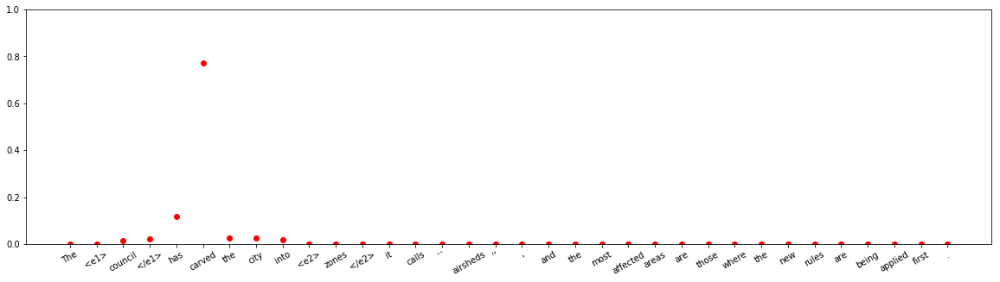




input sentence: Fortunately the <e1> drift </e1> of the <e2> cattle traffic </e2> is eastward , and as yet there has been no propagation of the poison in the great cattle ranges of the West .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 0.0005078176
Entity-Destination(e1,e2) 	:	 2.5068874e-05
Cause-Effect(e2,e1) 	:	 0.006646688
Member-Collection(e2,e1) 	:	 0.9917591
Entity-Origin(e1,e2) 	:	 0.000110093715
Message-Topic(e1,e2) 	:	 5.389987e-05
Component-Whole(e1,e2) 	:	 0.00032833574
Component-Whole(e2,e1) 	:	 4.2716184e-08
Instrument-Agency(e2,e1) 	:	 8.575444e-06
Content-Container(e1,e2) 	:	 3.3306916e-10
Product-Producer(e2,e1) 	:	 2.386597e-07
Cause-Effect(e1,e2) 	:	 4.361355e-06
Product-Producer(e1,e2) 	:	 1.0213926e-07
Content-Container(e2,e1) 	:	 5.9277728e-08
Entity-Origin(e2,e1) 	:	 6.306928e-08
Message-Topic(e2,e1) 	:	 5.0389142e-05
Instrument-Agency(e1,e2) 	:	 8.9751375e-05
Member-Collection(e1,e2) 	:	 0.00041530057
Entity-Destination(e2,e1) 	:

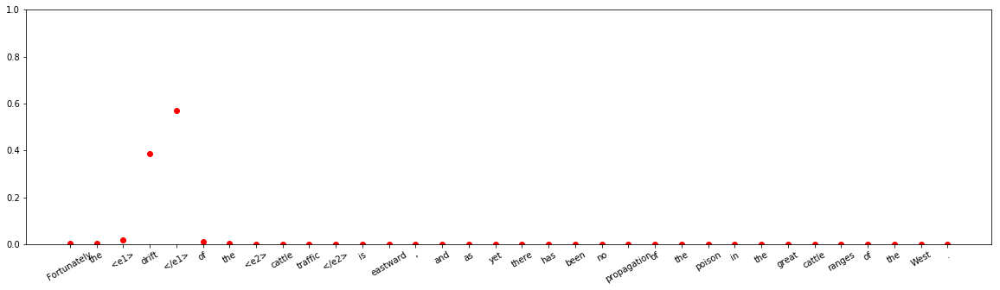







input sentence: A <e1> room </e1> was dug from the side of a <e2> hill </e2> and the opening closed in by wood , earth , or fabric , such as the wagon 's cover .
answer label:    Other
wrong label:    Entity-Origin(e1,e2)
Other 	:	 4.1893196e-09
Entity-Destination(e1,e2) 	:	 3.593081e-09
Cause-Effect(e2,e1) 	:	 1.486662e-07
Member-Collection(e2,e1) 	:	 2.5282918e-11
Entity-Origin(e1,e2) 	:	 0.9999925
Message-Topic(e1,e2) 	:	 7.013364e-14
Component-Whole(e1,e2) 	:	 6.3602456e-06
Component-Whole(e2,e1) 	:	 5.987801e-08
Instrument-Agency(e2,e1) 	:	 5.3784105e-10
Content-Container(e1,e2) 	:	 3.7108894e-08
Product-Producer(e2,e1) 	:	 9.916676e-12
Cause-Effect(e1,e2) 	:	 2.524067e-14
Product-Producer(e1,e2) 	:	 8.96643e-07
Content-Container(e2,e1) 	:	 1.720731e-08
Entity-Origin(e2,e1) 	:	 7.756275e-11
Message-Topic(e2,e1) 	:	 4.1267975e-11
Instrument-Agency(e1,e2) 	:	 1.8054643e-09
Member-Collection(e1,e2) 	:	 2.2321728e-10
Entity-Destination(e2,e1) 	:	 4.1906196e-14



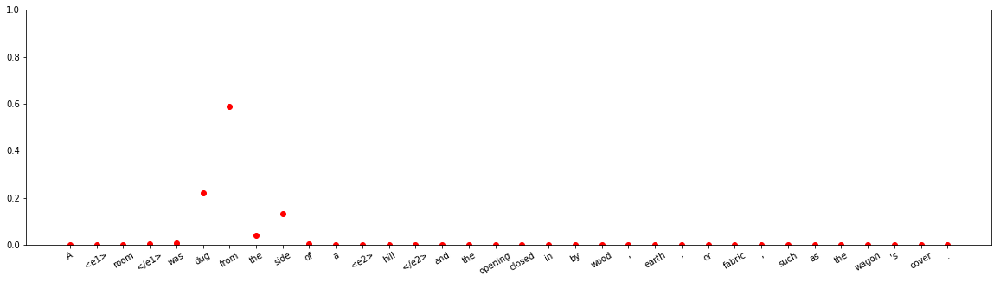











input sentence: The difference both for show and for use is as great as the difference between a lump of golden ore and a <e1> rouleau </e1> of <e2> sovereigns </e2> fresh from the mint .
answer label:    Component-Whole(e2,e1)
wrong label:    Other
Other 	:	 0.981934
Entity-Destination(e1,e2) 	:	 1.7607081e-13
Cause-Effect(e2,e1) 	:	 3.952007e-10
Member-Collection(e2,e1) 	:	 0.0180565
Entity-Origin(e1,e2) 	:	 1.8483591e-09
Message-Topic(e1,e2) 	:	 1.2604233e-09
Component-Whole(e1,e2) 	:	 2.8262748e-06
Component-Whole(e2,e1) 	:	 2.7283912e-07
Instrument-Agency(e2,e1) 	:	 3.8576707e-13
Content-Container(e1,e2) 	:	 3.1639066e-10
Product-Producer(e2,e1) 	:	 1.07956275e-08
Cause-Effect(e1,e2) 	:	 1.3078277e-10
Product-Producer(e1,e2) 	:	 2.4764648e-07
Content-Container(e2,e1) 	:	 1.0167667e-07
Entity-Origin(e2,e1) 	:	 5.4859373e-07
Message-Topic(e2,e1) 	:	 5.4731995e-06
Instrument-Agency(e1,e2) 	:	 1.2798455e-08
Member-Collection(e1,e2) 	:	 2.657504e-08
Entity-Destination(e2,e1) 

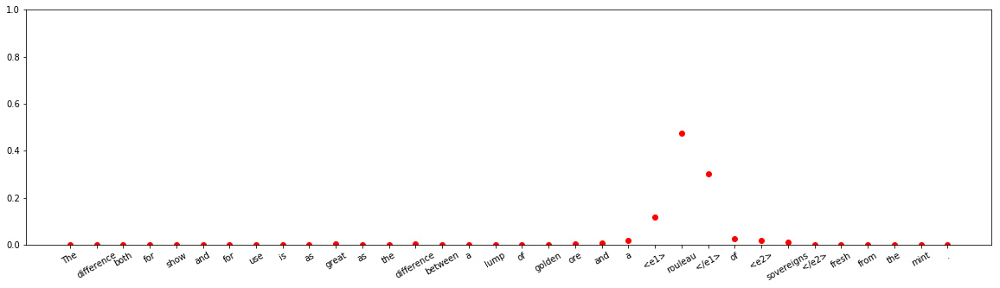


input sentence: The proposal was debated and enthusiastically endorsed in 2002 by a <e1> convocation </e1> of international <e2> scholars </e2> that included many prominent academics , among them scientists of the stature of the late H. Curien , H. Varmus , P. Crutzen and J. Sachs .
answer label:    Other
wrong label:    Member-Collection(e2,e1)
Other 	:	 9.2505e-08
Entity-Destination(e1,e2) 	:	 1.1871446e-14
Cause-Effect(e2,e1) 	:	 7.762891e-14
Member-Collection(e2,e1) 	:	 0.99999595
Entity-Origin(e1,e2) 	:	 1.873334e-11
Message-Topic(e1,e2) 	:	 3.493808e-10
Component-Whole(e1,e2) 	:	 8.2323437e-10
Component-Whole(e2,e1) 	:	 7.734376e-12
Instrument-Agency(e2,e1) 	:	 5.290031e-16
Content-Container(e1,e2) 	:	 5.1936554e-15
Product-Producer(e2,e1) 	:	 1.1791849e-11
Cause-Effect(e1,e2) 	:	 2.2203754e-14
Product-Producer(e1,e2) 	:	 2.9284854e-06
Content-Container(e2,e1) 	:	 2.3984197e-13
Entity-Origin(e2,e1) 	:	 3.3326814e-11
Message-Topic(e2,e1) 	:	 1.8502666e-07
Instrument-Agency(e1,e2)

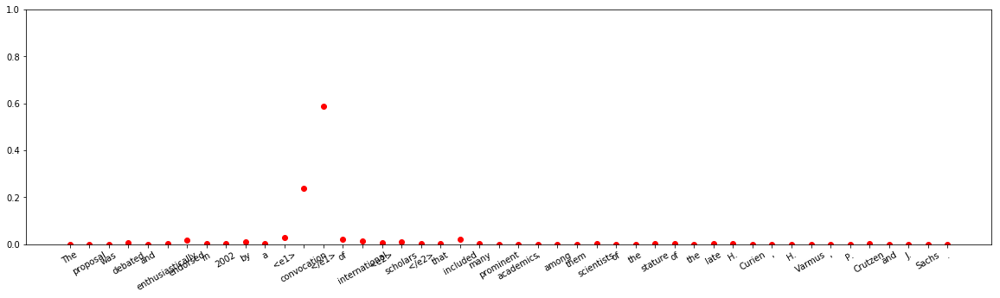






input sentence: I found , moreover , a <e1> body </e1> of trained and earnest school <e2> workers </e2> , whose wealth of experience , professional spirit , and loyal support of the new organization gave ample assurance of advancement in all departments of public school work .
answer label:    Member-Collection(e2,e1)
wrong label:    Other
Other 	:	 0.98436433
Entity-Destination(e1,e2) 	:	 2.7704058e-07
Cause-Effect(e2,e1) 	:	 2.2871593e-06
Member-Collection(e2,e1) 	:	 0.0013587496
Entity-Origin(e1,e2) 	:	 1.369725e-07
Message-Topic(e1,e2) 	:	 0.00028295274
Component-Whole(e1,e2) 	:	 5.87983e-07
Component-Whole(e2,e1) 	:	 3.452895e-08
Instrument-Agency(e2,e1) 	:	 1.9925972e-06
Content-Container(e1,e2) 	:	 1.358863e-06
Product-Producer(e2,e1) 	:	 6.70928e-05
Cause-Effect(e1,e2) 	:	 0.0002303496
Product-Producer(e1,e2) 	:	 9.326654e-05
Content-Container(e2,e1) 	:	 5.3387253e-06
Entity-Origin(e2,e1) 	:	 0.0011591347
Message-Topic(e2,e1) 	:	 1.0845011e-05
Instrument-Agency(e1,e2) 	:	 

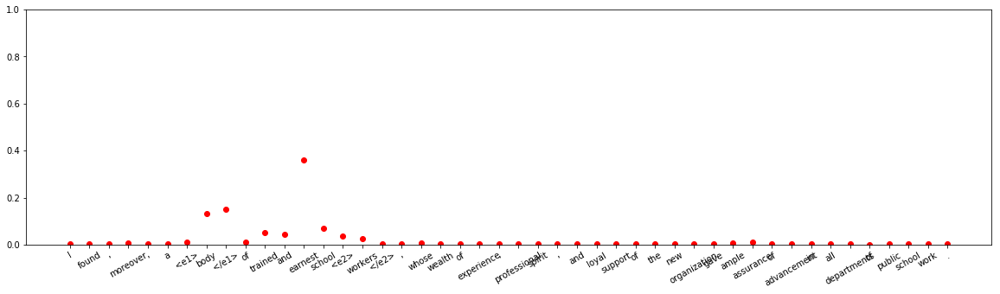


input sentence: The thick slab of spiced <e1> ham </e1> was the best part of this year 's new breakfast <e2> sandwich </e2> ; the salty meat was griddled to a crisp , nut-brown sear , and it outshone the surrounding egg , cheese , and bun .
answer label:    Other
wrong label:    Component-Whole(e1,e2)
Other 	:	 1.1885623e-05
Entity-Destination(e1,e2) 	:	 2.8003954e-06
Cause-Effect(e2,e1) 	:	 2.270915e-12
Member-Collection(e2,e1) 	:	 1.1361838e-10
Entity-Origin(e1,e2) 	:	 7.974232e-05
Message-Topic(e1,e2) 	:	 8.942439e-10
Component-Whole(e1,e2) 	:	 0.99672323
Component-Whole(e2,e1) 	:	 1.5235297e-07
Instrument-Agency(e2,e1) 	:	 1.1023199e-10
Content-Container(e1,e2) 	:	 0.0031359398
Product-Producer(e2,e1) 	:	 1.3970544e-08
Cause-Effect(e1,e2) 	:	 2.403869e-11
Product-Producer(e1,e2) 	:	 1.496818e-08
Content-Container(e2,e1) 	:	 8.716069e-07
Entity-Origin(e2,e1) 	:	 4.0321497e-06
Message-Topic(e2,e1) 	:	 1.6275097e-08
Instrument-Agency(e1,e2) 	:	 6.5748753e-07
Member-Collection(e1,e2) 

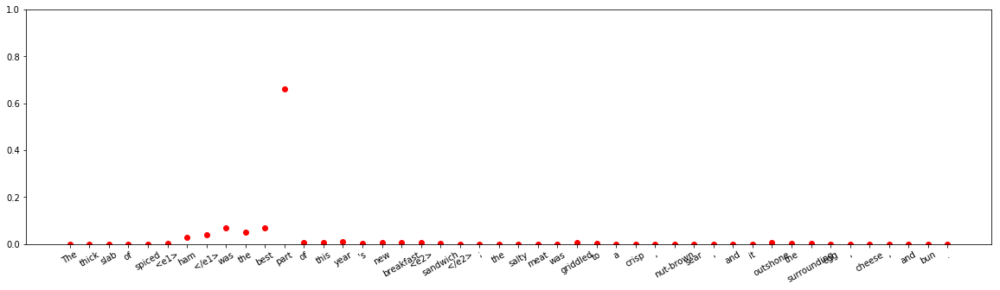




input sentence: The accommodation comprises a newly redecorated <e1> office </e1> <e2> floor </e2> on the third floor .
answer label:    Component-Whole(e1,e2)
wrong label:    Component-Whole(e2,e1)
Other 	:	 1.4507193e-10
Entity-Destination(e1,e2) 	:	 1.1256728e-16
Cause-Effect(e2,e1) 	:	 2.5550766e-14
Member-Collection(e2,e1) 	:	 9.0989286e-11
Entity-Origin(e1,e2) 	:	 5.9161484e-14
Message-Topic(e1,e2) 	:	 4.8205787e-17
Component-Whole(e1,e2) 	:	 1.1436283e-09
Component-Whole(e2,e1) 	:	 1.0
Instrument-Agency(e2,e1) 	:	 6.7179487e-12
Content-Container(e1,e2) 	:	 5.9260447e-13
Product-Producer(e2,e1) 	:	 1.6765306e-13
Cause-Effect(e1,e2) 	:	 6.2861953e-15
Product-Producer(e1,e2) 	:	 1.4879466e-13
Content-Container(e2,e1) 	:	 1.4990864e-11
Entity-Origin(e2,e1) 	:	 5.9659903e-16
Message-Topic(e2,e1) 	:	 1.6048634e-13
Instrument-Agency(e1,e2) 	:	 1.142262e-12
Member-Collection(e1,e2) 	:	 6.454118e-17
Entity-Destination(e2,e1) 	:	 8.1534456e-14



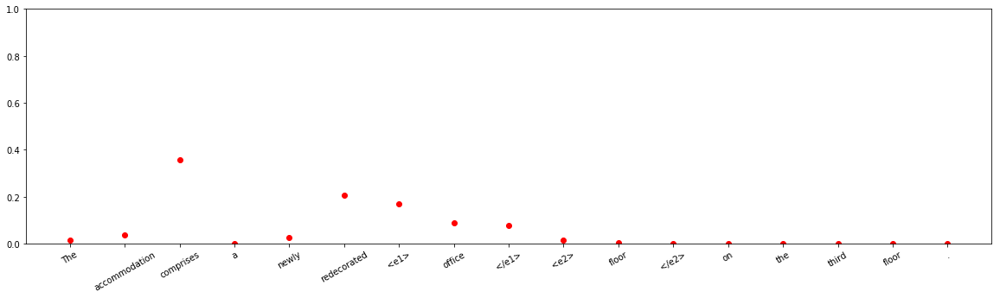


input sentence: Policemen were seen breaking up a road <e1> block </e1> put up by <e2> fishermen </e2> .
answer label:    Product-Producer(e1,e2)
wrong label:    Other
Other 	:	 0.9971885
Entity-Destination(e1,e2) 	:	 2.4692628e-10
Cause-Effect(e2,e1) 	:	 1.1593937e-08
Member-Collection(e2,e1) 	:	 2.1394344e-08
Entity-Origin(e1,e2) 	:	 1.857641e-09
Message-Topic(e1,e2) 	:	 1.5813471e-10
Component-Whole(e1,e2) 	:	 1.5825914e-05
Component-Whole(e2,e1) 	:	 6.3911315e-08
Instrument-Agency(e2,e1) 	:	 1.00396406e-10
Content-Container(e1,e2) 	:	 3.43368e-08
Product-Producer(e2,e1) 	:	 1.6861365e-11
Cause-Effect(e1,e2) 	:	 1.3940508e-12
Product-Producer(e1,e2) 	:	 0.00038138725
Content-Container(e2,e1) 	:	 8.404506e-07
Entity-Origin(e2,e1) 	:	 1.7450949e-10
Message-Topic(e2,e1) 	:	 5.001805e-10
Instrument-Agency(e1,e2) 	:	 0.0024134077
Member-Collection(e1,e2) 	:	 4.3005506e-09
Entity-Destination(e2,e1) 	:	 3.0118262e-11



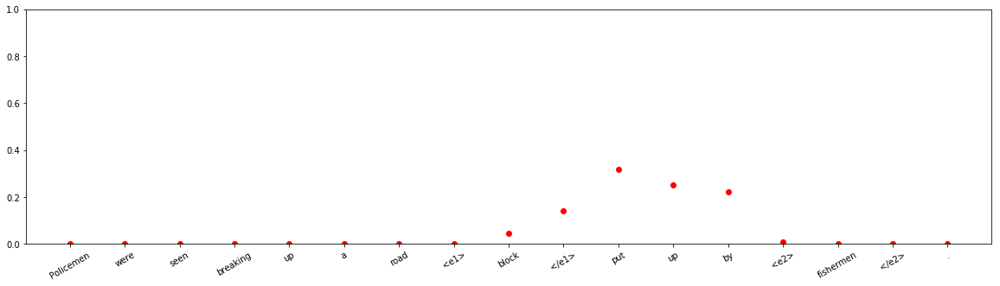



input sentence: The <e1> guard </e1> pushes the passports back with a <e2> chuckle </e2> and ignores them .
answer label:    Other
wrong label:    Instrument-Agency(e2,e1)
Other 	:	 0.0027323219
Entity-Destination(e1,e2) 	:	 6.947776e-08
Cause-Effect(e2,e1) 	:	 7.205593e-08
Member-Collection(e2,e1) 	:	 1.0162586e-10
Entity-Origin(e1,e2) 	:	 8.408802e-07
Message-Topic(e1,e2) 	:	 4.1697884e-10
Component-Whole(e1,e2) 	:	 1.9041029e-06
Component-Whole(e2,e1) 	:	 4.246029e-06
Instrument-Agency(e2,e1) 	:	 0.9938664
Content-Container(e1,e2) 	:	 2.707483e-05
Product-Producer(e2,e1) 	:	 0.00010564427
Cause-Effect(e1,e2) 	:	 6.8233426e-08
Product-Producer(e1,e2) 	:	 2.3572149e-09
Content-Container(e2,e1) 	:	 0.0031980642
Entity-Origin(e2,e1) 	:	 3.334369e-11
Message-Topic(e2,e1) 	:	 1.7920682e-12
Instrument-Agency(e1,e2) 	:	 6.2886655e-05
Member-Collection(e1,e2) 	:	 2.0307833e-07
Entity-Destination(e2,e1) 	:	 1.4251247e-09



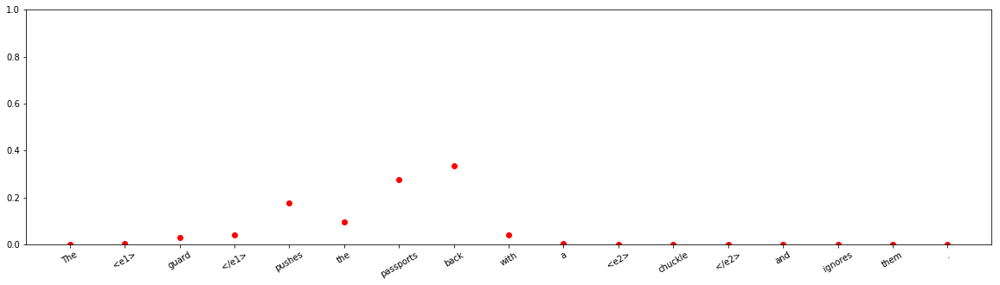


input sentence: The <e1> guard </e1> did his job with a scowling <e2> look </e2> on his face .
answer label:    Other
wrong label:    Component-Whole(e2,e1)
Other 	:	 6.5809522e-09
Entity-Destination(e1,e2) 	:	 2.4635433e-10
Cause-Effect(e2,e1) 	:	 6.553242e-10
Member-Collection(e2,e1) 	:	 2.2374584e-10
Entity-Origin(e1,e2) 	:	 2.8097534e-07
Message-Topic(e1,e2) 	:	 5.852377e-11
Component-Whole(e1,e2) 	:	 1.8838425e-07
Component-Whole(e2,e1) 	:	 0.8961328
Instrument-Agency(e2,e1) 	:	 0.10103083
Content-Container(e1,e2) 	:	 9.46094e-07
Product-Producer(e2,e1) 	:	 0.0028338605
Cause-Effect(e1,e2) 	:	 7.938784e-08
Product-Producer(e1,e2) 	:	 4.0311043e-09
Content-Container(e2,e1) 	:	 9.4293245e-07
Entity-Origin(e2,e1) 	:	 1.6548675e-12
Message-Topic(e2,e1) 	:	 4.24239e-09
Instrument-Agency(e1,e2) 	:	 1.2598116e-07
Member-Collection(e1,e2) 	:	 1.8817937e-11
Entity-Destination(e2,e1) 	:	 2.5212707e-11



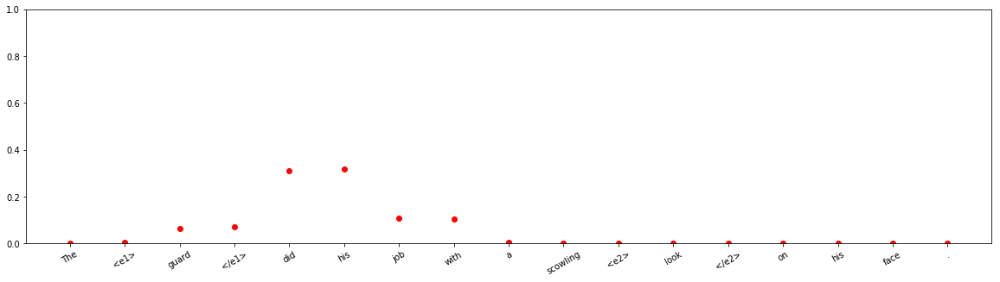




input sentence: She had left her notebook out on the <e1> fire </e1> escape by <e2> accident </e2> .
answer label:    Other
wrong label:    Cause-Effect(e2,e1)
Other 	:	 8.260527e-11
Entity-Destination(e1,e2) 	:	 3.6410566e-16
Cause-Effect(e2,e1) 	:	 1.0
Member-Collection(e2,e1) 	:	 4.3363682e-15
Entity-Origin(e1,e2) 	:	 1.1147675e-16
Message-Topic(e1,e2) 	:	 1.9854674e-18
Component-Whole(e1,e2) 	:	 5.274789e-12
Component-Whole(e2,e1) 	:	 2.0770922e-14
Instrument-Agency(e2,e1) 	:	 7.67111e-13
Content-Container(e1,e2) 	:	 7.1679707e-17
Product-Producer(e2,e1) 	:	 7.846649e-20
Cause-Effect(e1,e2) 	:	 1.6812372e-10
Product-Producer(e1,e2) 	:	 7.308413e-13
Content-Container(e2,e1) 	:	 6.053564e-16
Entity-Origin(e2,e1) 	:	 1.3987325e-17
Message-Topic(e2,e1) 	:	 2.2419947e-14
Instrument-Agency(e1,e2) 	:	 2.301116e-09
Member-Collection(e1,e2) 	:	 8.222423e-15
Entity-Destination(e2,e1) 	:	 1.5766625e-16



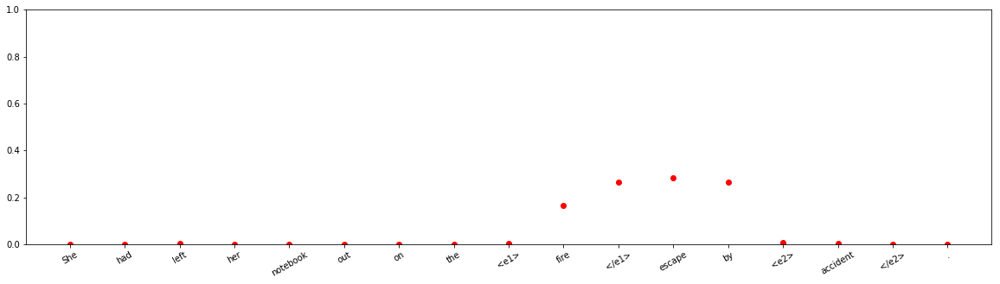


input sentence: Other <e1> orders </e1> on environmental <e2> legislation </e2> and abortion issues were also under consideration .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.99813604
Entity-Destination(e1,e2) 	:	 1.4767875e-08
Cause-Effect(e2,e1) 	:	 1.8700114e-10
Member-Collection(e2,e1) 	:	 2.495198e-10
Entity-Origin(e1,e2) 	:	 6.793306e-10
Message-Topic(e1,e2) 	:	 0.0018471673
Component-Whole(e1,e2) 	:	 3.168544e-06
Component-Whole(e2,e1) 	:	 8.104485e-09
Instrument-Agency(e2,e1) 	:	 1.9033157e-09
Content-Container(e1,e2) 	:	 1.7504513e-07
Product-Producer(e2,e1) 	:	 8.097685e-09
Cause-Effect(e1,e2) 	:	 3.876515e-07
Product-Producer(e1,e2) 	:	 1.7452654e-09
Content-Container(e2,e1) 	:	 2.253076e-06
Entity-Origin(e2,e1) 	:	 1.2751033e-06
Message-Topic(e2,e1) 	:	 4.4597886e-08
Instrument-Agency(e1,e2) 	:	 9.4748e-06
Member-Collection(e1,e2) 	:	 4.0350358e-08
Entity-Destination(e2,e1) 	:	 1.0619295e-10



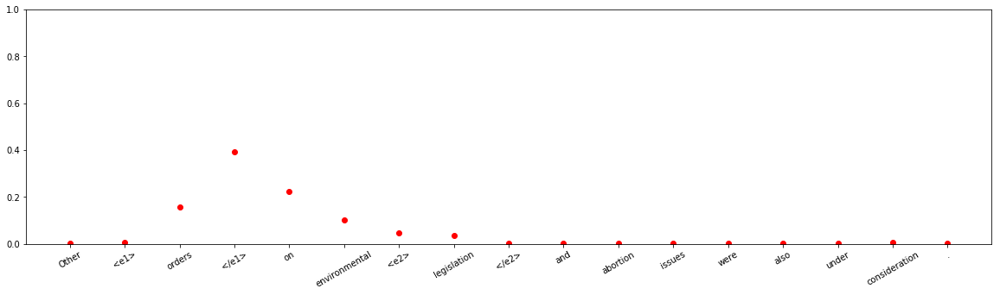








input sentence: <e1> References </e1> to the hearing transcript are denoted by volume and page <e2> numbers </e2> .
answer label:    Other
wrong label:    Message-Topic(e2,e1)
Other 	:	 0.30867088
Entity-Destination(e1,e2) 	:	 7.982824e-10
Cause-Effect(e2,e1) 	:	 1.1806833e-05
Member-Collection(e2,e1) 	:	 1.0188304e-05
Entity-Origin(e1,e2) 	:	 7.909836e-07
Message-Topic(e1,e2) 	:	 4.3359734e-05
Component-Whole(e1,e2) 	:	 0.0023029917
Component-Whole(e2,e1) 	:	 0.02068104
Instrument-Agency(e2,e1) 	:	 3.3045492e-06
Content-Container(e1,e2) 	:	 5.755643e-07
Product-Producer(e2,e1) 	:	 1.5268914e-06
Cause-Effect(e1,e2) 	:	 5.4917007e-07
Product-Producer(e1,e2) 	:	 0.0060767303
Content-Container(e2,e1) 	:	 5.2450116e-07
Entity-Origin(e2,e1) 	:	 5.163944e-08
Message-Topic(e2,e1) 	:	 0.66176206
Instrument-Agency(e1,e2) 	:	 0.0004332991
Member-Collection(e1,e2) 	:	 2.420457e-07
Entity-Destination(e2,e1) 	:	 9.657847e-08



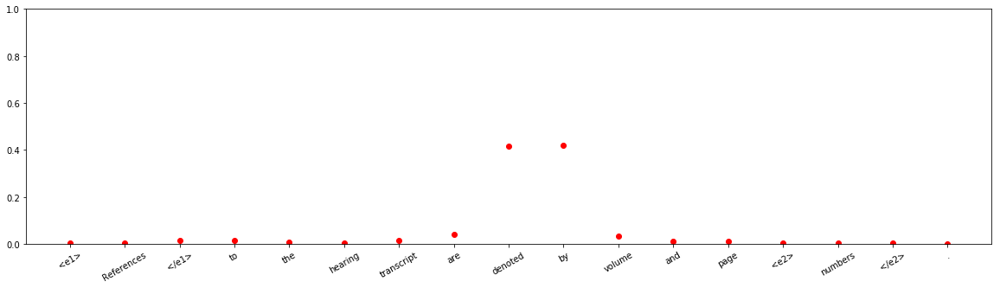


input sentence: The three themes for the <e1> conference </e1> were <e2> pluralism </e2> , sustainability and innovation .
answer label:    Message-Topic(e1,e2)
wrong label:    Other
Other 	:	 0.9993228
Entity-Destination(e1,e2) 	:	 3.1584287e-13
Cause-Effect(e2,e1) 	:	 6.184555e-12
Member-Collection(e2,e1) 	:	 2.856056e-08
Entity-Origin(e1,e2) 	:	 1.216623e-11
Message-Topic(e1,e2) 	:	 0.00062437775
Component-Whole(e1,e2) 	:	 9.43873e-07
Component-Whole(e2,e1) 	:	 3.8731023e-06
Instrument-Agency(e2,e1) 	:	 4.541887e-13
Content-Container(e1,e2) 	:	 9.655478e-09
Product-Producer(e2,e1) 	:	 7.7737404e-13
Cause-Effect(e1,e2) 	:	 5.6737495e-09
Product-Producer(e1,e2) 	:	 1.4503627e-09
Content-Container(e2,e1) 	:	 1.3408859e-08
Entity-Origin(e2,e1) 	:	 2.4049453e-07
Message-Topic(e2,e1) 	:	 9.1005665e-09
Instrument-Agency(e1,e2) 	:	 4.773782e-05
Member-Collection(e1,e2) 	:	 2.0724154e-09
Entity-Destination(e2,e1) 	:	 4.2020852e-11



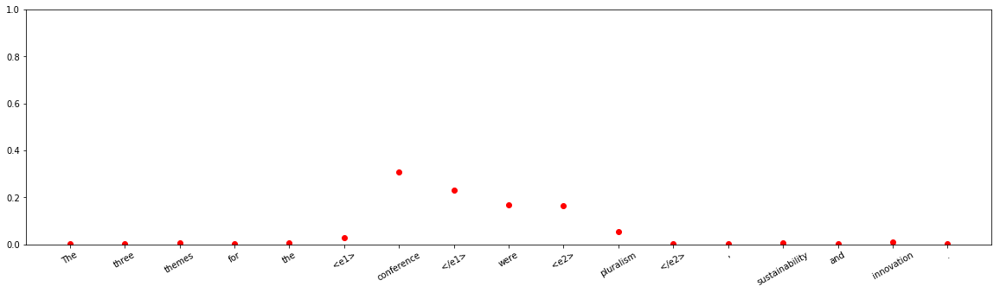


Test accuracy:	0.749724
Test loss:    	2.281527


{'loss': 2.2815270003563435}

In [15]:
relation_extr.evaluatation(test_input, test_output, header = 'Test', analyze  = True)

In [16]:

for param in relation_extr.named_parameters():
    print(param)

('word_emb.weight', Parameter containing:
 0.0000  0.0000  0.0000  ...   0.0000  0.0000  0.0000
 0.0000  0.0000  0.0000  ...   0.0000  0.0000  0.0000
 0.3629  0.0067 -0.3374  ...   0.1006 -0.0798  0.1666
          ...             ⋱             ...          
 0.0463 -0.0600 -0.5982  ...   0.7062  0.4067 -0.0230
-0.4984  0.5471 -0.1409  ...   0.1861 -0.0487  0.4646
 0.0001 -0.0037  0.0382  ...  -0.0042  0.0126  0.0336
[torch.cuda.FloatTensor of size 25698x300 (GPU 0)]
)
('pos1_emb.weight', Parameter containing:
 0.1309 -0.1782 -0.1973 -0.1776 -0.1213
 0.0059 -0.0388 -0.0025 -0.0259 -0.0483
 0.1556 -0.0997  0.0043 -0.0421 -0.0119
 0.0496 -0.0298 -0.1227 -0.0865  0.0112
 0.0988 -0.0099  0.0629 -0.0917 -0.1242
 0.1648 -0.1388 -0.2219 -0.1147 -0.1318
 0.0649 -0.1044 -0.0743 -0.2086 -0.0512
 0.2749 -0.2253 -0.2941 -0.1912 -0.2714
 0.2122 -0.1739 -0.1113 -0.1686 -0.1295
 0.0667 -0.1333 -0.1683 -0.2312 -0.2442
 0.2583 -0.2475 -0.2432 -0.2856 -0.2565
 0.1892 -0.1612 -0.1330 -0.1809 -0.1205
 0.17

In [17]:
a = [[0]*10]*20
print(a)
a[0][0] = 1
print(a)

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]
[[1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0,

In [18]:
optimizer.

SyntaxError: invalid syntax (<ipython-input-18-daa841af7946>, line 1)